# Objetivo: Criar uma GAN para gerar imagens de carros.

Queremos criar uma rede neural adversária generativa para criar imagens a partir do dataset CIFAR10, mas somente dos labels de carros.

Artigo que me baseei para gerar o código: https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/

Como o treinamento de uma GAN é extremamente sensível ao processo de hiperparametrização, adiciono também um guia para identificar e resolver problemas de treinamento com GANs: https://machinelearningmastery.com/practical-guide-to-gan-failure-modes

## Introdução: Importando as imagens e as bibliotecas

In [1]:
import os
import numpy as np
from numpy.random import randint, rand, randn
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, Flatten
from tensorflow.keras.layers import Dropout, LeakyReLU, Reshape, BatchNormalization
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.datasets.cifar10 import load_data
from glob import glob
import cv2
from skimage import io 
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.util import random_noise


# Permite à GPU alocar mais memória para o tensorflow
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

Using TensorFlow backend.


# Extra: Aumentando o tamanho do nosso dataset de treinamento

Vamos usar algumas funções para gerar novas imagens de treinamento (Oversampling).

In [2]:
# def anticlockwise_rotation(image):
#     angle = np.random.randint(0, 180)
#     return rotate(image, angle)

# def clockwise_rotation(image):
#     angle = np.random.randint(0, 180)
#     return rotate(image, -angle)

# def horizontal_flip(image):
#     return np.fliplr(image)

# def vertical_flip(image):
#     return np.flipud(image)

# def add_noise(image):
#     return random_noise(image)

# def blur_image(image):
#     return cv2.GaussianBlur(image, (9,9), 0)


# # Mapeando as transformações, armazenando os nomes das funções
# transformations = {'rotate anticlockwise': anticlockwise_rotation,
#                    'rotate clockwise': clockwise_rotation,
#                    'horizontal flip': horizontal_flip,
#                    'vertical flip': vertical_flip,
#                    'add noise': add_noise,
#                    'blur image': blur_image}

In [3]:
# # Criando as imagens novas (oversampling)
# original_images_path = 'oversampling_imgs' # Caminho das imagens de treinamento
# augmented_images_path = 'oversampling_imgs/generated_oversampling_imgs' # Caminho para salvar as imagens geradas
# augmented_images = []

# for im in os.listdir(original_images_path):  # Lê a imagem da pasta e atribui seu caminho ao array "images"
#     augmented_images.append(os.path.join(original_images_path, im))

# images_to_generate = 20000 # Número de imagens a gerar
# i = 1

# while i <= images_to_generate:
#     image = np.random.choice(augmented_images)
#     original_image = io.imread(image, plugin='matplotlib')
#     transformed_image = None
    
#     n = 0  # Iterando até o número de transformações que serão aplicadas
#     transformation_count = np.random.randint(1, len(transformations)) # Escolhe um número aleatório de transformações
    
#     while n <= transformation_count:
#         key = np.random.choice(list(transformations)) # Escolhe uma função de transformação aleatória para chamar
#         transformed_image = transformations[key](original_image)
#         n = n + 1
        
#     new_image_path = "%s/augmented_image_4wave_%s.jpg"%(augmented_images_path, i)
#     transformed_image = img_as_ubyte(transformed_image) # Converte a imagem no formato de bytes, valores entre 0 e 255
#     transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB) # Converte a imagem para RGB antes de salvar
#     cv2.imwrite(new_image_path, transformed_image) # Salvando a imagem transformada para o caminho
    
#     i = i + 1

In [4]:
# # Criando as instâncias dos geradores de dados de treinamento e teste
# train_path = "cars_data/train"  # Caminho dos dados de treinamento
# train_image_files = glob(train_path + '/*/*.jpg')  # Imagens de treinamento
# IMAGE_SIZE = [32, 32]  # Tamanho das imagens que serão geradas


# # Criando o objeto que gerará as imagens
# g_train_obj = ImageDataGenerator(
#   preprocessing_function=preprocess_input
# )


# # Criando os batches de imagens de treinamento a partir dos geradores
# train_batch = g_train_obj.flow_from_directory(train_path, shuffle=True, 
#                                                   target_size=IMAGE_SIZE, 
#                                                   classes=['cars', 'no cars'],
#                                                   batch_size=16191) # Nümero de imagens total, apenas 1 batch

In [5]:
# # Dimensão das imagens criadas (entrando dentro do train batch e pegando o item 1, que é o chunk de 14048 imagens)
# train_batch[0][0].shape = (16191, 32, 32, 3)

In [6]:
# # Mostrando uma imagem de exemplo do dataset carregado
# plt.imshow(train_batch[0][0][0])
# plt.show()

# Parte 1: Treinando o modelo discriminante

Vamos primeiro treinar o modelo discriminante em algumas imagens geradas com ruído (falsas) e algumas imagens reais.

In [7]:
# Função para criar o modelo discriminante (adversário)
def define_discriminator(in_shape=(32,32,3)):
    model = Sequential([
        Conv2D(64, (3,3), padding='same', input_shape=in_shape), #activation='relu'), # Já passa o tamanho do input direto na Conv2D Layer
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(128, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 32x32 para 16x16
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(128, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 16x16 para 8x8
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 8x8 para 4x4
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        #Conv2D(256, (3,3), strides=(2,2), padding='same'), #activation='relu'), # Usar essa layer se a img for 64x64
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),
        
        Flatten(), # Dimensão dos feature maps finais: 4x4
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])

    # Compilando o modelo discriminante
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    return model

In [8]:
# # Convertendo os valores dos pixels das imagens reais para float32 e normalizando os valores para -1 até 1
# def load_real_samples(train_batch):
#     x_train = train_batch[0][0]

#     # Transformando os valores de dentro do train batch em float32 e atribuindo à lista z
#     x = x_train.astype('float32')

#     # Normalizando os valores de [0, 255] para [-1, 1], pois o modelo gerador gerará valores de -1 até 1,
#     # usando a activation function tanH, como a boa prática recomenda.
#     x = (x - 127.5) / 127.5
    
#     return x

def load_real_samples():
    
    # Criando o objeto cifar10
    cifar10 = tf.keras.datasets.cifar10
    
    # Carregando o dataset com X e Y, para selecionar apenas uma classe específica
    (x_train, y_train), (_, _) = cifar10.load_data()
    
    # Selecionando apenas os carros
    idx = (y_train == 1).reshape(x_train.shape[0]) # No Cifar10, o index "1" é o dos carros.
    x_train_cars = x_train[idx] 
    
    # Convertendo os dados para float32
    x = x_train_cars.astype('float32')
    
    # Convertendo os dados de (0, 255) para (-1, 1)
    x = (x - 127.5) / 127.5
    
    return x

In [9]:
# A função abaixo recebe os dados de treinamento como parâmetro e seleciona uma amostra aleatória de imagens.
# Também retorna os as classes da amostra, especificamente labels 1, indicando amostras reais.


# Selecionando imagens reais da base de treino e atribuindo a classe 1
def generate_real_samples(dataset, n_samples):
    
    # Escolhendo imagens aleatórias
    ix = randint(0, dataset.shape[0], n_samples)
    
    # Atribuindo as imagens aleatórias a X
    x = dataset[ix]
    
    # Atribuindo a classe 1 às imagens reais
    y = np.ones((n_samples, 1))
    
    return x, y

In [10]:
# O modelo gerador ainda não foi criado. Podemos gerar imagens com valores de pixels aleatórios, especificamente
# pixels entre 0 e 1, e depois transformá-los em valores entre -1 e 1, na mesma escala das nossas imagens reais.
# A função abaixo implementa esse comportamento e gera imagens de valores aleatórios de pixels, associando à elas
# a classe 0 (imagens fake).


# Gerando n fake samples com classe 0
def generate_fake_samples(n_samples):
    
    # Gerando ruído aleatório (números uniformes entre 0 e 1)
    x = rand(32 * 32 * 3 * n_samples)
    
    # Atualizando X para que tenha range entre (-1, 1)
    x = -1 + x * 2
    
    # Redimensionando para o formato de imagens coloridas
    x = x.reshape((n_samples, 32, 32, 3))

    # Atribuindo a classe 0 às imagens falsas
    y = np.zeros((n_samples, 1))
    
    return x, y

In [11]:
# Criando o modelo discriminante
discriminator_model = define_discriminator()

# Carregando as imagens reais
discriminator_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         2

# Parte 2: Construindo o modelo gerador

Agora vamos construir o modelo gerador.

In [12]:
# Definindo o modelo gerador
def define_generator(latent_dim):
    # Dimensão dos feature maps que transformaremos em imagens novamente
    n_nodes = 256 * 4 * 4     # 4.096: (256 * 4 * 4) -> Necessário para imagens 32 x 32
                              # 16.384: (1.024 * 4 * 4) -> Necessário para imagens 64 x 64
                              # Para imagens 128x128, (1.024 * 4) * 4 * 4 -> 4096 * 4 * 4(65.536)

    model = Sequential([
        Dense(n_nodes, input_dim=latent_dim), #activation='relu'),
        Reshape((4, 4, 256)),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        

        # Aumentando a imagem (Conv2DTranspose), que foi diminuída nas strided convolutions da discriminator, para 8x8
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),

        # 16x16
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),

        # 32x32
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        # 64 x 64
        #Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),
        
        # 128 x 128
        #Conv2DTranspose(256, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),

        # Camada do output
        Conv2D(3, (3,3), activation='tanh', padding='same') # Garantindo a imagem com 3 dimensões
    ])
    
    return model

In [13]:
# Nesse momento, o modelo não tem muita usabilidade. Porém, podemos mostrar como podemos usá-lo para gerar amostras.
# EIsso nos ajuda a visualizar a rede geradora como simplesmente um outro modelo, essa forma de enxergá-la será
# útil para nós depois. O primeiro passo é gerar pontos no espaço latente. Podemos fazer isso chamando a função randn()
# do Numpy, gerando arrays de números aleatórios extraídos de uma distribuição gaussiana. A função abaixo implementa 
# esse comportamento, gerando pontos no espaço latente que servem de input para o modelo gerador.


# Gerando ruído aleatório no espaço latente para servir de input para o modelo gerador
def generate_latent_points(latent_dim, n_samples):
    # Gerando os pontos no espaço latente
    x_input = randn(latent_dim * n_samples)
    
    # Redimensionando em um batch de inputs para a rede geradora
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

In [14]:
# O próximo passo é usar os pontos gerados acima como input para o modelo gerador. Ele usará esses pontos para gerar
# novas amostras, e então plotá-las. A função abaixo serve para isso, e retorna tanto as amostras geradas quanto
# o label associado à elas (atribuimos o label 1 a essas imagens).


# Usando o gerador para gerar N exemplos fake, com class label como '0'
def generate_fake_samples(generator_model, latent_dim, n_samples):
    # Gerando os pontos no espaço latente
    x_input = generate_latent_points(latent_dim, n_samples)
    
    # Gerando as amostras das imagens fake
    x = generator_model.predict(x_input)
    
    # Atribuindo o label 'fake' ás imagens fake (0)
    y = np.zeros((n_samples, 1))
    
    return x, y

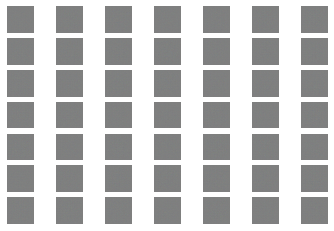

In [15]:
# Tamanho do espaço latente
latent_dim = 100

# Criando o modelo gerador
generator_model = define_generator(latent_dim)

# Gerando as imagens
n_samples = 49
x, _ = generate_fake_samples(generator_model, latent_dim, n_samples)

# Normalizando os valores dos pixels de [-1, 1] para [0, 1] para o plot
x = (x + 1) / 2.0

# Plotando as imagens geradas
for i in range(n_samples):
    # Definindo os subplots
    plt.subplot(7, 7, 1 + i)
    
    # Tirando os labels dos eixos
    plt.axis('off')
    
    # Plotando uma imagem
    plt.imshow(x[i])
    
# Mostrando as imagens.
plt.show()


# Como o modelo ainda não está treinado, as imagens serão apenas pontos aleatórios no espaço latente.

# Parte 3: Treinando o modelo gerador
Para finalizar, vamos treinar o modelo gerador para que ele não gere apenas ruído aleatório.

## Explicação do treinamento de uma GAN

Um modelo GAN é basicamente um modelo que "empilha" as redes geradora e discriminante, de forma que a rede geradora recebe pontos aleatórios no espaço latente como input e gera amostras que são diretamente recebidas pelo modelo discriminante e classificadas. Então, o output do modelo discriminante pode ser usado para atualizar os pesos do
modelo gerador. 

A partir do momento que os pesos do modelo gerador são atualizados, o processo se reinicia, e as imagens produzidas pela rede geradora vão "melhorando".

A rede discriminante se preocupa em diferenciar amostras reais e fake. Treinamos esse modelo separadamente (como fizemos na parte 1).

Sobre o modelo gerador, a sua preocupação é com a performance do modelo discriminante em exemplos fake. Para treinarmos 
a GAN como um todo, atualizamos apenas os parâmetros do modelo gerador e congelamos os parâmetros do modelo discriminante: assim, evitamos de alterar os parâmetros do modelo discriminante com imagens fake.

Obs.: ao treinar uma GAN, queremos que o modelo discriminante pense que as amostras fake geradas as pela rede discriminante são reais. Por isso na função "generate_fake_samples", atribuímos o label 1 para a imagem fake gerada pela rede geradora.

Por que fazemos isso?

Provavelmente, a rede geradora classificará a imagem fake como "não real" (0), ou com uma baixa probabilidade de ser real. O processo de backpropagation usado para atualizar os parâmetros da rede geradora considerará isso como um erro, atualizando assim os pesos do modelo gerador com o objetivo de corrigir esse suposto erro.

Isso faz com que a rede geradora fique cada vez melhor em gerar imagens fake (as imagens geradas ficam cada vez mais parecidas com a realidade).

A função "define_gan" abaixo serve basicamente para criar um modelo combinado com o modelo gerador e o modelo discriminante.

In [16]:
# Definindo o modelo combinado (Gerador + discriminante), para atualização dos parametros do gerador
def define_gan(generator_model, discriminator_model):
    discriminator_model.trainable = False # Os pesos atualizados são somente os da rede geradora
    
    # Conectando os modelos
    model = Sequential()
    
    # Parte 1: Gerador
    model.add(generator_model)
    
    # Parte 2: Discriminante
    model.add(discriminator_model)
    
    # Compilando o modelo
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt) # Classificação binária: Imagem é falsa ou verdadeira
    
    return model

In [17]:
# Criando o modelo combinado (Gerador + Discriminante)
gan_model = define_gan(generator_model, discriminator_model)

gan_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 32, 32, 3)         1466115   
_________________________________________________________________
sequential (Sequential)      (None, 1)                 522497    
Total params: 1,988,612
Trainable params: 1,466,115
Non-trainable params: 522,497
_________________________________________________________________


In [18]:
# # Criando uma função para resumir a performance do modelo

# # Avaliando o discriminante, plotando as imagens geradas, salvando o modelo gerador
# def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
#     # Preparando as amostras reais
#     x_real, y_real = generate_real_samples(dataset, n_samples)
    
#     # Avaliando o discriminante nas amostras reais
#     _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    
#     # Preparando os exemplos fake
#     x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    
#     # Avaliando o discriminante nos exemplos fake
#     _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    
#     # Resumindo a performance do discriminante
#     print('> Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))

In [19]:
# Treinando as duas redes: Geradora e discriminante
def train(generator_model, discriminator_model, gan_model, dataset, latent_dim, n_epochs=500, n_batch=64):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    
    
    # Numerando as epochs manualmente
    for i in range(n_epochs):
        
        # Enumerando os batches sobre todos os dados de treinamento
        for j in range(bat_per_epo):


            ##### PARTE 1 - REDE DISCRIMINANTE #####

            # Selecionando samples reais aleatoriamente
            x_real, y_real = generate_real_samples(dataset, half_batch)

            # Atualizando os pesos do modelo discriminante
            discriminator_loss_real, _ = discriminator_model.train_on_batch(x_real, y_real)

            # Gerando os exemplos 'fake'
            x_fake, y_fake = generate_fake_samples(generator_model, latent_dim, half_batch)

            # Atualizando os pesos do modelo discriminante
            discriminator_loss_fake, _ = discriminator_model.train_on_batch(x_fake, y_fake)


            
            ##### PARTE 2 - REDE GERADORA #####

            # Preparando os pontos no espaço latente como input para a rede geradora
            x_gan = generate_latent_points(latent_dim, n_batch)

            # Criando labels 'falsos' para as imagens geradas (dizendo que elas são reais)
            y_gan = np.ones((n_batch, 1))

            # Atualizando os pesos da geradora através do erro da discriminante
            generator_loss = gan_model.train_on_batch(x_gan, y_gan)

            # Loss na batch específica
            print('-> Epoch %d, Batch numero %d/%d -> Disc. loss on real images: %.5f, Disc. loss on fake images: %.5f, Generator loss: %.5f' %
            (i+1, j+1, bat_per_epo, discriminator_loss_real, discriminator_loss_fake, generator_loss))    
            
            
        # Mostrando uma imagem a cada epoch para verificar se a geradora está melhorando    
        z_noise = np.random.normal(0, 1, size=(n_batch, latent_dim))
        gen_images = generator_model.predict_on_batch(z_noise)
        gen_images = (gen_images + 1) / 2.0

        print("")
        print("---------- Image from epoch", i, " ----------")
        plt.imshow(gen_images[0])
        plt.show()
        
        # Removendo a imagem para não armazenar nesse array todas as imagens geradas
        gen_images = np.delete(gen_images, 0) # O parâmetro '0' é o index do item que quero deletar

                
        # Avaliando a performance do modelo de vez em quando
        #if (i+1) % 10 == 0:
            #summarize_performance(i, generator_model, discriminator_model, dataset, latent_dim)

-> Epoch 1, Batch numero 1/78 -> Disc. loss on real images: 0.70075, Disc. loss on fake images: 0.69581, Generator loss: 0.69125
-> Epoch 1, Batch numero 2/78 -> Disc. loss on real images: 0.62418, Disc. loss on fake images: 0.69848, Generator loss: 0.68854
-> Epoch 1, Batch numero 3/78 -> Disc. loss on real images: 0.55364, Disc. loss on fake images: 0.70549, Generator loss: 0.68194
-> Epoch 1, Batch numero 4/78 -> Disc. loss on real images: 0.45209, Disc. loss on fake images: 0.72075, Generator loss: 0.66746
-> Epoch 1, Batch numero 5/78 -> Disc. loss on real images: 0.36015, Disc. loss on fake images: 0.75404, Generator loss: 0.64414
-> Epoch 1, Batch numero 6/78 -> Disc. loss on real images: 0.24860, Disc. loss on fake images: 0.81117, Generator loss: 0.61572
-> Epoch 1, Batch numero 7/78 -> Disc. loss on real images: 0.15963, Disc. loss on fake images: 0.87310, Generator loss: 0.60647
-> Epoch 1, Batch numero 8/78 -> Disc. loss on real images: 0.12219, Disc. loss on fake images: 0

-> Epoch 1, Batch numero 67/78 -> Disc. loss on real images: 0.01526, Disc. loss on fake images: 0.10997, Generator loss: 2.42858
-> Epoch 1, Batch numero 68/78 -> Disc. loss on real images: 0.00201, Disc. loss on fake images: 0.11015, Generator loss: 2.51699
-> Epoch 1, Batch numero 69/78 -> Disc. loss on real images: 0.00206, Disc. loss on fake images: 0.12730, Generator loss: 2.62206
-> Epoch 1, Batch numero 70/78 -> Disc. loss on real images: 0.02587, Disc. loss on fake images: 0.16463, Generator loss: 3.54713
-> Epoch 1, Batch numero 71/78 -> Disc. loss on real images: 0.01303, Disc. loss on fake images: 0.03165, Generator loss: 4.37614
-> Epoch 1, Batch numero 72/78 -> Disc. loss on real images: 0.11601, Disc. loss on fake images: 0.05961, Generator loss: 3.30939
-> Epoch 1, Batch numero 73/78 -> Disc. loss on real images: 0.00015, Disc. loss on fake images: 0.08057, Generator loss: 4.29535
-> Epoch 1, Batch numero 74/78 -> Disc. loss on real images: 0.00021, Disc. loss on fake i

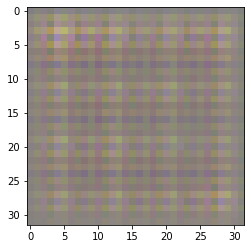

-> Epoch 2, Batch numero 1/78 -> Disc. loss on real images: 0.97013, Disc. loss on fake images: 0.08545, Generator loss: 2.93323
-> Epoch 2, Batch numero 2/78 -> Disc. loss on real images: 0.00140, Disc. loss on fake images: 3.46761, Generator loss: 2.72458
-> Epoch 2, Batch numero 3/78 -> Disc. loss on real images: 0.01514, Disc. loss on fake images: 3.19788, Generator loss: 5.98237
-> Epoch 2, Batch numero 4/78 -> Disc. loss on real images: 0.93371, Disc. loss on fake images: 0.18475, Generator loss: 5.88544
-> Epoch 2, Batch numero 5/78 -> Disc. loss on real images: 0.28534, Disc. loss on fake images: 0.93331, Generator loss: 10.95866
-> Epoch 2, Batch numero 6/78 -> Disc. loss on real images: 4.19215, Disc. loss on fake images: 0.24370, Generator loss: 1.43763
-> Epoch 2, Batch numero 7/78 -> Disc. loss on real images: 0.19029, Disc. loss on fake images: 0.83045, Generator loss: 2.68429
-> Epoch 2, Batch numero 8/78 -> Disc. loss on real images: 0.38090, Disc. loss on fake images: 

-> Epoch 2, Batch numero 67/78 -> Disc. loss on real images: 0.52139, Disc. loss on fake images: 0.36425, Generator loss: 2.49028
-> Epoch 2, Batch numero 68/78 -> Disc. loss on real images: 0.27547, Disc. loss on fake images: 0.16112, Generator loss: 2.90626
-> Epoch 2, Batch numero 69/78 -> Disc. loss on real images: 0.21145, Disc. loss on fake images: 0.11830, Generator loss: 3.05625
-> Epoch 2, Batch numero 70/78 -> Disc. loss on real images: 0.20054, Disc. loss on fake images: 0.14581, Generator loss: 2.68626
-> Epoch 2, Batch numero 71/78 -> Disc. loss on real images: 0.16497, Disc. loss on fake images: 0.17566, Generator loss: 2.79733
-> Epoch 2, Batch numero 72/78 -> Disc. loss on real images: 0.32729, Disc. loss on fake images: 0.22927, Generator loss: 2.56619
-> Epoch 2, Batch numero 73/78 -> Disc. loss on real images: 0.17085, Disc. loss on fake images: 0.20369, Generator loss: 2.55613
-> Epoch 2, Batch numero 74/78 -> Disc. loss on real images: 0.07977, Disc. loss on fake i

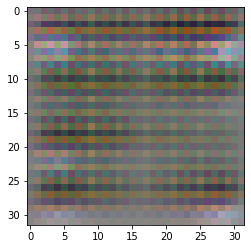

-> Epoch 3, Batch numero 1/78 -> Disc. loss on real images: 0.26862, Disc. loss on fake images: 0.19762, Generator loss: 2.56945
-> Epoch 3, Batch numero 2/78 -> Disc. loss on real images: 0.37520, Disc. loss on fake images: 0.32408, Generator loss: 2.61287
-> Epoch 3, Batch numero 3/78 -> Disc. loss on real images: 0.28368, Disc. loss on fake images: 0.22298, Generator loss: 2.54887
-> Epoch 3, Batch numero 4/78 -> Disc. loss on real images: 0.17475, Disc. loss on fake images: 0.27533, Generator loss: 2.76600
-> Epoch 3, Batch numero 5/78 -> Disc. loss on real images: 0.31961, Disc. loss on fake images: 0.25012, Generator loss: 2.87513
-> Epoch 3, Batch numero 6/78 -> Disc. loss on real images: 0.43245, Disc. loss on fake images: 0.24299, Generator loss: 2.67779
-> Epoch 3, Batch numero 7/78 -> Disc. loss on real images: 0.19567, Disc. loss on fake images: 0.26553, Generator loss: 2.87752
-> Epoch 3, Batch numero 8/78 -> Disc. loss on real images: 0.32889, Disc. loss on fake images: 0

-> Epoch 3, Batch numero 67/78 -> Disc. loss on real images: 0.41545, Disc. loss on fake images: 0.22901, Generator loss: 2.41416
-> Epoch 3, Batch numero 68/78 -> Disc. loss on real images: 0.16651, Disc. loss on fake images: 0.14492, Generator loss: 2.79395
-> Epoch 3, Batch numero 69/78 -> Disc. loss on real images: 0.16926, Disc. loss on fake images: 0.10069, Generator loss: 2.53883
-> Epoch 3, Batch numero 70/78 -> Disc. loss on real images: 0.17708, Disc. loss on fake images: 0.26799, Generator loss: 2.91059
-> Epoch 3, Batch numero 71/78 -> Disc. loss on real images: 0.15282, Disc. loss on fake images: 0.15182, Generator loss: 2.94483
-> Epoch 3, Batch numero 72/78 -> Disc. loss on real images: 0.15728, Disc. loss on fake images: 0.12233, Generator loss: 2.97598
-> Epoch 3, Batch numero 73/78 -> Disc. loss on real images: 0.17449, Disc. loss on fake images: 0.11790, Generator loss: 2.89903
-> Epoch 3, Batch numero 74/78 -> Disc. loss on real images: 0.34637, Disc. loss on fake i

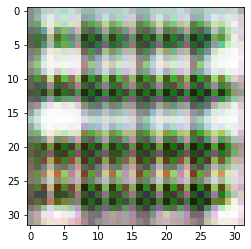

-> Epoch 4, Batch numero 1/78 -> Disc. loss on real images: 0.26210, Disc. loss on fake images: 0.23443, Generator loss: 2.80886
-> Epoch 4, Batch numero 2/78 -> Disc. loss on real images: 0.32367, Disc. loss on fake images: 0.14343, Generator loss: 2.85446
-> Epoch 4, Batch numero 3/78 -> Disc. loss on real images: 0.17441, Disc. loss on fake images: 0.13784, Generator loss: 2.69784
-> Epoch 4, Batch numero 4/78 -> Disc. loss on real images: 0.30737, Disc. loss on fake images: 0.21965, Generator loss: 3.12951
-> Epoch 4, Batch numero 5/78 -> Disc. loss on real images: 0.33803, Disc. loss on fake images: 0.14954, Generator loss: 2.91976
-> Epoch 4, Batch numero 6/78 -> Disc. loss on real images: 0.19932, Disc. loss on fake images: 0.11782, Generator loss: 3.04380
-> Epoch 4, Batch numero 7/78 -> Disc. loss on real images: 0.09895, Disc. loss on fake images: 0.08325, Generator loss: 3.17484
-> Epoch 4, Batch numero 8/78 -> Disc. loss on real images: 0.13314, Disc. loss on fake images: 0

-> Epoch 4, Batch numero 67/78 -> Disc. loss on real images: 0.27862, Disc. loss on fake images: 0.37768, Generator loss: 1.90626
-> Epoch 4, Batch numero 68/78 -> Disc. loss on real images: 0.43286, Disc. loss on fake images: 0.24642, Generator loss: 1.91134
-> Epoch 4, Batch numero 69/78 -> Disc. loss on real images: 0.28370, Disc. loss on fake images: 0.27788, Generator loss: 2.13586
-> Epoch 4, Batch numero 70/78 -> Disc. loss on real images: 0.32979, Disc. loss on fake images: 0.20733, Generator loss: 2.14049
-> Epoch 4, Batch numero 71/78 -> Disc. loss on real images: 0.24534, Disc. loss on fake images: 0.15632, Generator loss: 2.58884
-> Epoch 4, Batch numero 72/78 -> Disc. loss on real images: 0.26442, Disc. loss on fake images: 0.31081, Generator loss: 2.68580
-> Epoch 4, Batch numero 73/78 -> Disc. loss on real images: 0.27683, Disc. loss on fake images: 0.24954, Generator loss: 2.78094
-> Epoch 4, Batch numero 74/78 -> Disc. loss on real images: 0.27093, Disc. loss on fake i

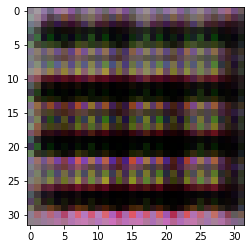

-> Epoch 5, Batch numero 1/78 -> Disc. loss on real images: 0.23324, Disc. loss on fake images: 0.20050, Generator loss: 2.64590
-> Epoch 5, Batch numero 2/78 -> Disc. loss on real images: 0.50600, Disc. loss on fake images: 0.20408, Generator loss: 2.20740
-> Epoch 5, Batch numero 3/78 -> Disc. loss on real images: 0.29867, Disc. loss on fake images: 0.22488, Generator loss: 2.26826
-> Epoch 5, Batch numero 4/78 -> Disc. loss on real images: 0.33587, Disc. loss on fake images: 0.22178, Generator loss: 2.45257
-> Epoch 5, Batch numero 5/78 -> Disc. loss on real images: 0.38024, Disc. loss on fake images: 0.17579, Generator loss: 2.35459
-> Epoch 5, Batch numero 6/78 -> Disc. loss on real images: 0.37171, Disc. loss on fake images: 0.21456, Generator loss: 2.25564
-> Epoch 5, Batch numero 7/78 -> Disc. loss on real images: 0.29097, Disc. loss on fake images: 0.17621, Generator loss: 2.51569
-> Epoch 5, Batch numero 8/78 -> Disc. loss on real images: 0.25553, Disc. loss on fake images: 0

-> Epoch 5, Batch numero 67/78 -> Disc. loss on real images: 0.29856, Disc. loss on fake images: 0.27984, Generator loss: 2.63124
-> Epoch 5, Batch numero 68/78 -> Disc. loss on real images: 0.41173, Disc. loss on fake images: 0.56988, Generator loss: 3.03241
-> Epoch 5, Batch numero 69/78 -> Disc. loss on real images: 0.40695, Disc. loss on fake images: 0.26832, Generator loss: 2.54614
-> Epoch 5, Batch numero 70/78 -> Disc. loss on real images: 0.23532, Disc. loss on fake images: 0.44881, Generator loss: 2.99749
-> Epoch 5, Batch numero 71/78 -> Disc. loss on real images: 0.34062, Disc. loss on fake images: 0.14774, Generator loss: 2.96076
-> Epoch 5, Batch numero 72/78 -> Disc. loss on real images: 0.12192, Disc. loss on fake images: 0.16867, Generator loss: 3.02801
-> Epoch 5, Batch numero 73/78 -> Disc. loss on real images: 0.19581, Disc. loss on fake images: 0.12855, Generator loss: 3.14428
-> Epoch 5, Batch numero 74/78 -> Disc. loss on real images: 0.05619, Disc. loss on fake i

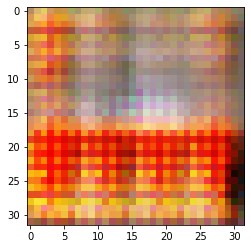

-> Epoch 6, Batch numero 1/78 -> Disc. loss on real images: 0.08821, Disc. loss on fake images: 0.06099, Generator loss: 4.06103
-> Epoch 6, Batch numero 2/78 -> Disc. loss on real images: 0.05007, Disc. loss on fake images: 0.09522, Generator loss: 4.36790
-> Epoch 6, Batch numero 3/78 -> Disc. loss on real images: 0.08534, Disc. loss on fake images: 0.07184, Generator loss: 4.67036
-> Epoch 6, Batch numero 4/78 -> Disc. loss on real images: 0.10740, Disc. loss on fake images: 0.09459, Generator loss: 4.64006
-> Epoch 6, Batch numero 5/78 -> Disc. loss on real images: 0.02814, Disc. loss on fake images: 0.31687, Generator loss: 9.27103
-> Epoch 6, Batch numero 6/78 -> Disc. loss on real images: 1.00851, Disc. loss on fake images: 0.94572, Generator loss: 10.94599
-> Epoch 6, Batch numero 7/78 -> Disc. loss on real images: 1.99540, Disc. loss on fake images: 0.64215, Generator loss: 7.50134
-> Epoch 6, Batch numero 8/78 -> Disc. loss on real images: 1.38359, Disc. loss on fake images: 

-> Epoch 6, Batch numero 67/78 -> Disc. loss on real images: 0.07642, Disc. loss on fake images: 0.21438, Generator loss: 2.14098
-> Epoch 6, Batch numero 68/78 -> Disc. loss on real images: 0.09448, Disc. loss on fake images: 0.16500, Generator loss: 2.05293
-> Epoch 6, Batch numero 69/78 -> Disc. loss on real images: 0.16403, Disc. loss on fake images: 0.20650, Generator loss: 1.88766
-> Epoch 6, Batch numero 70/78 -> Disc. loss on real images: 0.17735, Disc. loss on fake images: 0.42614, Generator loss: 1.95402
-> Epoch 6, Batch numero 71/78 -> Disc. loss on real images: 0.13566, Disc. loss on fake images: 0.31902, Generator loss: 1.99331
-> Epoch 6, Batch numero 72/78 -> Disc. loss on real images: 0.21096, Disc. loss on fake images: 0.27949, Generator loss: 1.80739
-> Epoch 6, Batch numero 73/78 -> Disc. loss on real images: 0.28324, Disc. loss on fake images: 0.37645, Generator loss: 1.92943
-> Epoch 6, Batch numero 74/78 -> Disc. loss on real images: 0.46104, Disc. loss on fake i

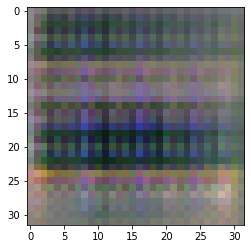

-> Epoch 7, Batch numero 1/78 -> Disc. loss on real images: 0.57023, Disc. loss on fake images: 0.42086, Generator loss: 1.67704
-> Epoch 7, Batch numero 2/78 -> Disc. loss on real images: 0.37457, Disc. loss on fake images: 0.46742, Generator loss: 1.94985
-> Epoch 7, Batch numero 3/78 -> Disc. loss on real images: 0.25871, Disc. loss on fake images: 0.45844, Generator loss: 2.02686
-> Epoch 7, Batch numero 4/78 -> Disc. loss on real images: 0.43820, Disc. loss on fake images: 0.34408, Generator loss: 2.19540
-> Epoch 7, Batch numero 5/78 -> Disc. loss on real images: 0.30123, Disc. loss on fake images: 0.47139, Generator loss: 2.20582
-> Epoch 7, Batch numero 6/78 -> Disc. loss on real images: 0.37293, Disc. loss on fake images: 0.24064, Generator loss: 2.30635
-> Epoch 7, Batch numero 7/78 -> Disc. loss on real images: 0.26300, Disc. loss on fake images: 0.21353, Generator loss: 2.36040
-> Epoch 7, Batch numero 8/78 -> Disc. loss on real images: 0.25495, Disc. loss on fake images: 0

-> Epoch 7, Batch numero 67/78 -> Disc. loss on real images: 0.73288, Disc. loss on fake images: 0.27689, Generator loss: 3.28380
-> Epoch 7, Batch numero 68/78 -> Disc. loss on real images: 0.40179, Disc. loss on fake images: 0.32625, Generator loss: 2.71940
-> Epoch 7, Batch numero 69/78 -> Disc. loss on real images: 0.35582, Disc. loss on fake images: 0.60175, Generator loss: 3.90793
-> Epoch 7, Batch numero 70/78 -> Disc. loss on real images: 0.56541, Disc. loss on fake images: 0.29675, Generator loss: 3.16966
-> Epoch 7, Batch numero 71/78 -> Disc. loss on real images: 0.60274, Disc. loss on fake images: 0.62769, Generator loss: 3.68336
-> Epoch 7, Batch numero 72/78 -> Disc. loss on real images: 0.79893, Disc. loss on fake images: 0.53529, Generator loss: 3.70957
-> Epoch 7, Batch numero 73/78 -> Disc. loss on real images: 0.92154, Disc. loss on fake images: 0.43560, Generator loss: 3.37837
-> Epoch 7, Batch numero 74/78 -> Disc. loss on real images: 0.91256, Disc. loss on fake i

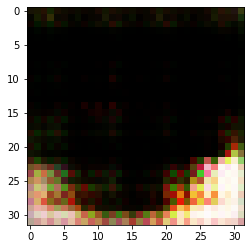

-> Epoch 8, Batch numero 1/78 -> Disc. loss on real images: 0.72574, Disc. loss on fake images: 0.28599, Generator loss: 2.35806
-> Epoch 8, Batch numero 2/78 -> Disc. loss on real images: 0.64574, Disc. loss on fake images: 0.39136, Generator loss: 2.53407
-> Epoch 8, Batch numero 3/78 -> Disc. loss on real images: 0.49469, Disc. loss on fake images: 0.44336, Generator loss: 2.60303
-> Epoch 8, Batch numero 4/78 -> Disc. loss on real images: 0.68756, Disc. loss on fake images: 0.46843, Generator loss: 2.90230
-> Epoch 8, Batch numero 5/78 -> Disc. loss on real images: 0.55781, Disc. loss on fake images: 0.23127, Generator loss: 2.66769
-> Epoch 8, Batch numero 6/78 -> Disc. loss on real images: 0.73939, Disc. loss on fake images: 0.58033, Generator loss: 2.68476
-> Epoch 8, Batch numero 7/78 -> Disc. loss on real images: 0.82316, Disc. loss on fake images: 0.37067, Generator loss: 2.55270
-> Epoch 8, Batch numero 8/78 -> Disc. loss on real images: 0.80589, Disc. loss on fake images: 0

-> Epoch 8, Batch numero 67/78 -> Disc. loss on real images: 0.41542, Disc. loss on fake images: 0.28336, Generator loss: 1.98846
-> Epoch 8, Batch numero 68/78 -> Disc. loss on real images: 0.30433, Disc. loss on fake images: 0.26557, Generator loss: 2.02321
-> Epoch 8, Batch numero 69/78 -> Disc. loss on real images: 0.30685, Disc. loss on fake images: 0.21792, Generator loss: 2.05769
-> Epoch 8, Batch numero 70/78 -> Disc. loss on real images: 0.21027, Disc. loss on fake images: 0.25723, Generator loss: 2.07311
-> Epoch 8, Batch numero 71/78 -> Disc. loss on real images: 0.25717, Disc. loss on fake images: 0.20515, Generator loss: 2.01681
-> Epoch 8, Batch numero 72/78 -> Disc. loss on real images: 0.17763, Disc. loss on fake images: 0.26089, Generator loss: 1.97940
-> Epoch 8, Batch numero 73/78 -> Disc. loss on real images: 0.23436, Disc. loss on fake images: 0.30256, Generator loss: 1.90328
-> Epoch 8, Batch numero 74/78 -> Disc. loss on real images: 0.29835, Disc. loss on fake i

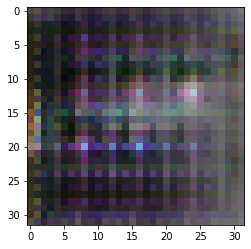

-> Epoch 9, Batch numero 1/78 -> Disc. loss on real images: 0.41343, Disc. loss on fake images: 0.44571, Generator loss: 1.94009
-> Epoch 9, Batch numero 2/78 -> Disc. loss on real images: 0.78772, Disc. loss on fake images: 0.55543, Generator loss: 1.67755
-> Epoch 9, Batch numero 3/78 -> Disc. loss on real images: 0.78724, Disc. loss on fake images: 0.56404, Generator loss: 1.71965
-> Epoch 9, Batch numero 4/78 -> Disc. loss on real images: 0.89108, Disc. loss on fake images: 0.70621, Generator loss: 1.52458
-> Epoch 9, Batch numero 5/78 -> Disc. loss on real images: 0.78113, Disc. loss on fake images: 0.56692, Generator loss: 1.80516
-> Epoch 9, Batch numero 6/78 -> Disc. loss on real images: 0.75500, Disc. loss on fake images: 0.44136, Generator loss: 1.63688
-> Epoch 9, Batch numero 7/78 -> Disc. loss on real images: 0.52197, Disc. loss on fake images: 0.33690, Generator loss: 1.76627
-> Epoch 9, Batch numero 8/78 -> Disc. loss on real images: 0.88497, Disc. loss on fake images: 0

-> Epoch 9, Batch numero 67/78 -> Disc. loss on real images: 0.55660, Disc. loss on fake images: 0.17614, Generator loss: 2.05976
-> Epoch 9, Batch numero 68/78 -> Disc. loss on real images: 0.28158, Disc. loss on fake images: 0.40171, Generator loss: 2.08141
-> Epoch 9, Batch numero 69/78 -> Disc. loss on real images: 0.37899, Disc. loss on fake images: 0.54265, Generator loss: 1.97306
-> Epoch 9, Batch numero 70/78 -> Disc. loss on real images: 0.54185, Disc. loss on fake images: 0.37979, Generator loss: 2.08669
-> Epoch 9, Batch numero 71/78 -> Disc. loss on real images: 0.61364, Disc. loss on fake images: 0.36547, Generator loss: 1.95711
-> Epoch 9, Batch numero 72/78 -> Disc. loss on real images: 0.35856, Disc. loss on fake images: 0.36001, Generator loss: 1.86549
-> Epoch 9, Batch numero 73/78 -> Disc. loss on real images: 0.52513, Disc. loss on fake images: 0.40133, Generator loss: 1.65427
-> Epoch 9, Batch numero 74/78 -> Disc. loss on real images: 0.49928, Disc. loss on fake i

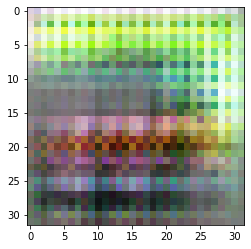

-> Epoch 10, Batch numero 1/78 -> Disc. loss on real images: 0.55831, Disc. loss on fake images: 0.44661, Generator loss: 1.66028
-> Epoch 10, Batch numero 2/78 -> Disc. loss on real images: 0.25381, Disc. loss on fake images: 0.38147, Generator loss: 1.50882
-> Epoch 10, Batch numero 3/78 -> Disc. loss on real images: 0.39199, Disc. loss on fake images: 0.35955, Generator loss: 1.57516
-> Epoch 10, Batch numero 4/78 -> Disc. loss on real images: 0.31302, Disc. loss on fake images: 0.32495, Generator loss: 1.63198
-> Epoch 10, Batch numero 5/78 -> Disc. loss on real images: 0.29470, Disc. loss on fake images: 0.35230, Generator loss: 1.63598
-> Epoch 10, Batch numero 6/78 -> Disc. loss on real images: 0.20816, Disc. loss on fake images: 0.35096, Generator loss: 1.81026
-> Epoch 10, Batch numero 7/78 -> Disc. loss on real images: 0.15631, Disc. loss on fake images: 0.35991, Generator loss: 1.89032
-> Epoch 10, Batch numero 8/78 -> Disc. loss on real images: 0.13953, Disc. loss on fake i

-> Epoch 10, Batch numero 64/78 -> Disc. loss on real images: 0.42053, Disc. loss on fake images: 0.87901, Generator loss: 2.36243
-> Epoch 10, Batch numero 65/78 -> Disc. loss on real images: 0.40499, Disc. loss on fake images: 0.61443, Generator loss: 2.81560
-> Epoch 10, Batch numero 66/78 -> Disc. loss on real images: 0.56068, Disc. loss on fake images: 0.90014, Generator loss: 2.38724
-> Epoch 10, Batch numero 67/78 -> Disc. loss on real images: 0.46150, Disc. loss on fake images: 0.65333, Generator loss: 1.71422
-> Epoch 10, Batch numero 68/78 -> Disc. loss on real images: 0.50030, Disc. loss on fake images: 0.62589, Generator loss: 1.82565
-> Epoch 10, Batch numero 69/78 -> Disc. loss on real images: 0.65031, Disc. loss on fake images: 0.51332, Generator loss: 1.66409
-> Epoch 10, Batch numero 70/78 -> Disc. loss on real images: 0.39055, Disc. loss on fake images: 0.57198, Generator loss: 1.63470
-> Epoch 10, Batch numero 71/78 -> Disc. loss on real images: 0.31932, Disc. loss o

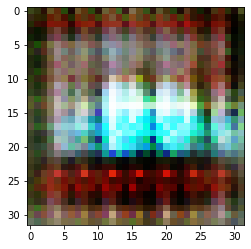

-> Epoch 11, Batch numero 1/78 -> Disc. loss on real images: 0.49544, Disc. loss on fake images: 0.34701, Generator loss: 2.10292
-> Epoch 11, Batch numero 2/78 -> Disc. loss on real images: 0.54953, Disc. loss on fake images: 0.34682, Generator loss: 1.88875
-> Epoch 11, Batch numero 3/78 -> Disc. loss on real images: 0.50929, Disc. loss on fake images: 0.39003, Generator loss: 1.76408
-> Epoch 11, Batch numero 4/78 -> Disc. loss on real images: 0.69528, Disc. loss on fake images: 0.51545, Generator loss: 2.06407
-> Epoch 11, Batch numero 5/78 -> Disc. loss on real images: 0.65540, Disc. loss on fake images: 0.32304, Generator loss: 1.88383
-> Epoch 11, Batch numero 6/78 -> Disc. loss on real images: 0.46909, Disc. loss on fake images: 0.39062, Generator loss: 1.80431
-> Epoch 11, Batch numero 7/78 -> Disc. loss on real images: 0.36984, Disc. loss on fake images: 0.32223, Generator loss: 2.00483
-> Epoch 11, Batch numero 8/78 -> Disc. loss on real images: 0.54826, Disc. loss on fake i

-> Epoch 11, Batch numero 64/78 -> Disc. loss on real images: 0.42629, Disc. loss on fake images: 0.43398, Generator loss: 1.56172
-> Epoch 11, Batch numero 65/78 -> Disc. loss on real images: 0.41351, Disc. loss on fake images: 0.38350, Generator loss: 1.57052
-> Epoch 11, Batch numero 66/78 -> Disc. loss on real images: 0.42681, Disc. loss on fake images: 0.38137, Generator loss: 1.58337
-> Epoch 11, Batch numero 67/78 -> Disc. loss on real images: 0.31259, Disc. loss on fake images: 0.36252, Generator loss: 1.60365
-> Epoch 11, Batch numero 68/78 -> Disc. loss on real images: 0.40278, Disc. loss on fake images: 0.43459, Generator loss: 1.51955
-> Epoch 11, Batch numero 69/78 -> Disc. loss on real images: 0.33994, Disc. loss on fake images: 0.41228, Generator loss: 1.55751
-> Epoch 11, Batch numero 70/78 -> Disc. loss on real images: 0.32983, Disc. loss on fake images: 0.45903, Generator loss: 1.61596
-> Epoch 11, Batch numero 71/78 -> Disc. loss on real images: 0.36830, Disc. loss o

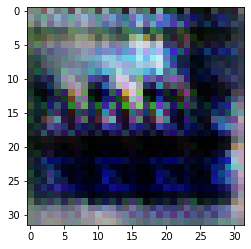

-> Epoch 12, Batch numero 1/78 -> Disc. loss on real images: 0.54571, Disc. loss on fake images: 0.40376, Generator loss: 2.24686
-> Epoch 12, Batch numero 2/78 -> Disc. loss on real images: 0.46102, Disc. loss on fake images: 0.27438, Generator loss: 2.17041
-> Epoch 12, Batch numero 3/78 -> Disc. loss on real images: 0.63506, Disc. loss on fake images: 0.57473, Generator loss: 2.08542
-> Epoch 12, Batch numero 4/78 -> Disc. loss on real images: 0.73691, Disc. loss on fake images: 0.49201, Generator loss: 1.80359
-> Epoch 12, Batch numero 5/78 -> Disc. loss on real images: 0.72491, Disc. loss on fake images: 0.61209, Generator loss: 1.71700
-> Epoch 12, Batch numero 6/78 -> Disc. loss on real images: 0.70124, Disc. loss on fake images: 0.48111, Generator loss: 1.48069
-> Epoch 12, Batch numero 7/78 -> Disc. loss on real images: 0.64451, Disc. loss on fake images: 0.68433, Generator loss: 1.45146
-> Epoch 12, Batch numero 8/78 -> Disc. loss on real images: 0.63161, Disc. loss on fake i

-> Epoch 12, Batch numero 64/78 -> Disc. loss on real images: 0.47994, Disc. loss on fake images: 0.26395, Generator loss: 2.47353
-> Epoch 12, Batch numero 65/78 -> Disc. loss on real images: 0.40197, Disc. loss on fake images: 0.23609, Generator loss: 2.63518
-> Epoch 12, Batch numero 66/78 -> Disc. loss on real images: 0.43628, Disc. loss on fake images: 0.30223, Generator loss: 2.80485
-> Epoch 12, Batch numero 67/78 -> Disc. loss on real images: 0.28165, Disc. loss on fake images: 0.14259, Generator loss: 2.73225
-> Epoch 12, Batch numero 68/78 -> Disc. loss on real images: 0.35199, Disc. loss on fake images: 0.17853, Generator loss: 2.35690
-> Epoch 12, Batch numero 69/78 -> Disc. loss on real images: 0.24432, Disc. loss on fake images: 0.29154, Generator loss: 2.88578
-> Epoch 12, Batch numero 70/78 -> Disc. loss on real images: 0.41035, Disc. loss on fake images: 0.25487, Generator loss: 2.94313
-> Epoch 12, Batch numero 71/78 -> Disc. loss on real images: 0.33407, Disc. loss o

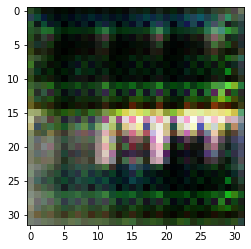

-> Epoch 13, Batch numero 1/78 -> Disc. loss on real images: 0.42679, Disc. loss on fake images: 0.33967, Generator loss: 2.14327
-> Epoch 13, Batch numero 2/78 -> Disc. loss on real images: 0.70362, Disc. loss on fake images: 0.42109, Generator loss: 1.77277
-> Epoch 13, Batch numero 3/78 -> Disc. loss on real images: 0.48951, Disc. loss on fake images: 0.58606, Generator loss: 2.20768
-> Epoch 13, Batch numero 4/78 -> Disc. loss on real images: 0.76875, Disc. loss on fake images: 0.42002, Generator loss: 1.87331
-> Epoch 13, Batch numero 5/78 -> Disc. loss on real images: 0.72330, Disc. loss on fake images: 0.62616, Generator loss: 1.80256
-> Epoch 13, Batch numero 6/78 -> Disc. loss on real images: 0.54087, Disc. loss on fake images: 0.55609, Generator loss: 1.78789
-> Epoch 13, Batch numero 7/78 -> Disc. loss on real images: 0.53950, Disc. loss on fake images: 0.59318, Generator loss: 2.06575
-> Epoch 13, Batch numero 8/78 -> Disc. loss on real images: 0.54816, Disc. loss on fake i

-> Epoch 13, Batch numero 64/78 -> Disc. loss on real images: 0.36976, Disc. loss on fake images: 0.37421, Generator loss: 1.90931
-> Epoch 13, Batch numero 65/78 -> Disc. loss on real images: 0.54591, Disc. loss on fake images: 0.53534, Generator loss: 1.71097
-> Epoch 13, Batch numero 66/78 -> Disc. loss on real images: 0.46684, Disc. loss on fake images: 0.42035, Generator loss: 1.91988
-> Epoch 13, Batch numero 67/78 -> Disc. loss on real images: 0.69642, Disc. loss on fake images: 0.45956, Generator loss: 1.63502
-> Epoch 13, Batch numero 68/78 -> Disc. loss on real images: 0.51387, Disc. loss on fake images: 0.43278, Generator loss: 1.67361
-> Epoch 13, Batch numero 69/78 -> Disc. loss on real images: 0.58914, Disc. loss on fake images: 0.45119, Generator loss: 1.56031
-> Epoch 13, Batch numero 70/78 -> Disc. loss on real images: 0.38196, Disc. loss on fake images: 0.44078, Generator loss: 1.91191
-> Epoch 13, Batch numero 71/78 -> Disc. loss on real images: 0.54649, Disc. loss o

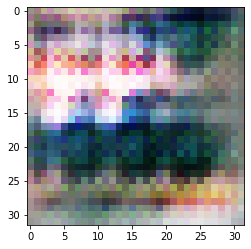

-> Epoch 14, Batch numero 1/78 -> Disc. loss on real images: 0.35545, Disc. loss on fake images: 0.36247, Generator loss: 1.68438
-> Epoch 14, Batch numero 2/78 -> Disc. loss on real images: 0.31508, Disc. loss on fake images: 0.39687, Generator loss: 1.78339
-> Epoch 14, Batch numero 3/78 -> Disc. loss on real images: 0.24350, Disc. loss on fake images: 0.34453, Generator loss: 1.95741
-> Epoch 14, Batch numero 4/78 -> Disc. loss on real images: 0.30253, Disc. loss on fake images: 0.34348, Generator loss: 1.82600
-> Epoch 14, Batch numero 5/78 -> Disc. loss on real images: 0.27368, Disc. loss on fake images: 0.49886, Generator loss: 1.84081
-> Epoch 14, Batch numero 6/78 -> Disc. loss on real images: 0.56900, Disc. loss on fake images: 0.63401, Generator loss: 1.47071
-> Epoch 14, Batch numero 7/78 -> Disc. loss on real images: 0.40119, Disc. loss on fake images: 0.64016, Generator loss: 1.42793
-> Epoch 14, Batch numero 8/78 -> Disc. loss on real images: 0.29532, Disc. loss on fake i

-> Epoch 14, Batch numero 64/78 -> Disc. loss on real images: 0.51703, Disc. loss on fake images: 0.41069, Generator loss: 1.64315
-> Epoch 14, Batch numero 65/78 -> Disc. loss on real images: 0.45043, Disc. loss on fake images: 0.53226, Generator loss: 1.83703
-> Epoch 14, Batch numero 66/78 -> Disc. loss on real images: 0.42662, Disc. loss on fake images: 0.38990, Generator loss: 1.89638
-> Epoch 14, Batch numero 67/78 -> Disc. loss on real images: 0.40807, Disc. loss on fake images: 0.31099, Generator loss: 1.72454
-> Epoch 14, Batch numero 68/78 -> Disc. loss on real images: 0.42507, Disc. loss on fake images: 0.50654, Generator loss: 1.58590
-> Epoch 14, Batch numero 69/78 -> Disc. loss on real images: 0.42091, Disc. loss on fake images: 0.40985, Generator loss: 1.79229
-> Epoch 14, Batch numero 70/78 -> Disc. loss on real images: 0.29990, Disc. loss on fake images: 0.55628, Generator loss: 1.94152
-> Epoch 14, Batch numero 71/78 -> Disc. loss on real images: 0.48126, Disc. loss o

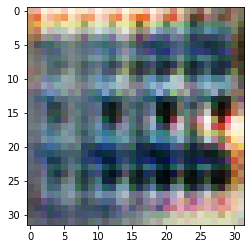

-> Epoch 15, Batch numero 1/78 -> Disc. loss on real images: 0.55277, Disc. loss on fake images: 0.39004, Generator loss: 2.43565
-> Epoch 15, Batch numero 2/78 -> Disc. loss on real images: 0.52499, Disc. loss on fake images: 0.55092, Generator loss: 2.40048
-> Epoch 15, Batch numero 3/78 -> Disc. loss on real images: 0.68325, Disc. loss on fake images: 0.47700, Generator loss: 1.79961
-> Epoch 15, Batch numero 4/78 -> Disc. loss on real images: 0.38778, Disc. loss on fake images: 0.48302, Generator loss: 1.96977
-> Epoch 15, Batch numero 5/78 -> Disc. loss on real images: 0.70960, Disc. loss on fake images: 0.38818, Generator loss: 2.05768
-> Epoch 15, Batch numero 6/78 -> Disc. loss on real images: 0.47414, Disc. loss on fake images: 0.29846, Generator loss: 2.02365
-> Epoch 15, Batch numero 7/78 -> Disc. loss on real images: 0.55309, Disc. loss on fake images: 0.52833, Generator loss: 1.77883
-> Epoch 15, Batch numero 8/78 -> Disc. loss on real images: 0.26451, Disc. loss on fake i

-> Epoch 15, Batch numero 64/78 -> Disc. loss on real images: 0.58037, Disc. loss on fake images: 0.55772, Generator loss: 1.49147
-> Epoch 15, Batch numero 65/78 -> Disc. loss on real images: 0.63117, Disc. loss on fake images: 0.51640, Generator loss: 1.29954
-> Epoch 15, Batch numero 66/78 -> Disc. loss on real images: 0.56142, Disc. loss on fake images: 0.53052, Generator loss: 1.30234
-> Epoch 15, Batch numero 67/78 -> Disc. loss on real images: 0.51072, Disc. loss on fake images: 0.53898, Generator loss: 1.36157
-> Epoch 15, Batch numero 68/78 -> Disc. loss on real images: 0.51854, Disc. loss on fake images: 0.54228, Generator loss: 1.42785
-> Epoch 15, Batch numero 69/78 -> Disc. loss on real images: 0.85191, Disc. loss on fake images: 0.48142, Generator loss: 1.33027
-> Epoch 15, Batch numero 70/78 -> Disc. loss on real images: 0.50210, Disc. loss on fake images: 0.65938, Generator loss: 1.39236
-> Epoch 15, Batch numero 71/78 -> Disc. loss on real images: 0.76311, Disc. loss o

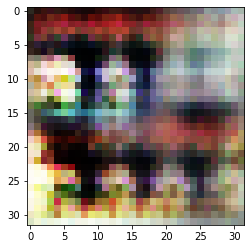

-> Epoch 16, Batch numero 1/78 -> Disc. loss on real images: 0.46138, Disc. loss on fake images: 0.31329, Generator loss: 1.77274
-> Epoch 16, Batch numero 2/78 -> Disc. loss on real images: 0.55366, Disc. loss on fake images: 0.39421, Generator loss: 1.51664
-> Epoch 16, Batch numero 3/78 -> Disc. loss on real images: 0.40394, Disc. loss on fake images: 0.62898, Generator loss: 1.82842
-> Epoch 16, Batch numero 4/78 -> Disc. loss on real images: 0.42754, Disc. loss on fake images: 0.50434, Generator loss: 1.95896
-> Epoch 16, Batch numero 5/78 -> Disc. loss on real images: 0.50586, Disc. loss on fake images: 0.46375, Generator loss: 1.89001
-> Epoch 16, Batch numero 6/78 -> Disc. loss on real images: 0.46363, Disc. loss on fake images: 0.51239, Generator loss: 1.86055
-> Epoch 16, Batch numero 7/78 -> Disc. loss on real images: 0.54635, Disc. loss on fake images: 0.42516, Generator loss: 1.89060
-> Epoch 16, Batch numero 8/78 -> Disc. loss on real images: 0.52060, Disc. loss on fake i

-> Epoch 16, Batch numero 64/78 -> Disc. loss on real images: 0.75736, Disc. loss on fake images: 0.61518, Generator loss: 1.54274
-> Epoch 16, Batch numero 65/78 -> Disc. loss on real images: 0.44746, Disc. loss on fake images: 0.51489, Generator loss: 1.74301
-> Epoch 16, Batch numero 66/78 -> Disc. loss on real images: 0.72904, Disc. loss on fake images: 0.40143, Generator loss: 1.72371
-> Epoch 16, Batch numero 67/78 -> Disc. loss on real images: 0.80851, Disc. loss on fake images: 0.36688, Generator loss: 1.48170
-> Epoch 16, Batch numero 68/78 -> Disc. loss on real images: 0.47854, Disc. loss on fake images: 0.44443, Generator loss: 1.43807
-> Epoch 16, Batch numero 69/78 -> Disc. loss on real images: 0.44584, Disc. loss on fake images: 0.57239, Generator loss: 1.32739
-> Epoch 16, Batch numero 70/78 -> Disc. loss on real images: 0.30227, Disc. loss on fake images: 0.47757, Generator loss: 1.62533
-> Epoch 16, Batch numero 71/78 -> Disc. loss on real images: 0.59888, Disc. loss o

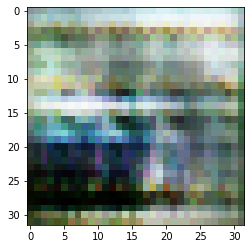

-> Epoch 17, Batch numero 1/78 -> Disc. loss on real images: 0.31648, Disc. loss on fake images: 0.45020, Generator loss: 1.34400
-> Epoch 17, Batch numero 2/78 -> Disc. loss on real images: 0.39425, Disc. loss on fake images: 0.41187, Generator loss: 1.47745
-> Epoch 17, Batch numero 3/78 -> Disc. loss on real images: 0.54529, Disc. loss on fake images: 0.48033, Generator loss: 1.49942
-> Epoch 17, Batch numero 4/78 -> Disc. loss on real images: 0.46648, Disc. loss on fake images: 0.45479, Generator loss: 1.50561
-> Epoch 17, Batch numero 5/78 -> Disc. loss on real images: 0.45741, Disc. loss on fake images: 0.43841, Generator loss: 1.63363
-> Epoch 17, Batch numero 6/78 -> Disc. loss on real images: 0.53166, Disc. loss on fake images: 0.44151, Generator loss: 1.52479
-> Epoch 17, Batch numero 7/78 -> Disc. loss on real images: 0.56701, Disc. loss on fake images: 0.49465, Generator loss: 1.57872
-> Epoch 17, Batch numero 8/78 -> Disc. loss on real images: 0.53529, Disc. loss on fake i

-> Epoch 17, Batch numero 64/78 -> Disc. loss on real images: 0.48845, Disc. loss on fake images: 0.37873, Generator loss: 1.66607
-> Epoch 17, Batch numero 65/78 -> Disc. loss on real images: 0.51248, Disc. loss on fake images: 0.40411, Generator loss: 1.74130
-> Epoch 17, Batch numero 66/78 -> Disc. loss on real images: 0.64186, Disc. loss on fake images: 0.35248, Generator loss: 1.71128
-> Epoch 17, Batch numero 67/78 -> Disc. loss on real images: 0.55859, Disc. loss on fake images: 0.40401, Generator loss: 1.52586
-> Epoch 17, Batch numero 68/78 -> Disc. loss on real images: 0.42659, Disc. loss on fake images: 0.44397, Generator loss: 1.71463
-> Epoch 17, Batch numero 69/78 -> Disc. loss on real images: 0.48250, Disc. loss on fake images: 0.33346, Generator loss: 1.64181
-> Epoch 17, Batch numero 70/78 -> Disc. loss on real images: 0.46344, Disc. loss on fake images: 0.36577, Generator loss: 1.60848
-> Epoch 17, Batch numero 71/78 -> Disc. loss on real images: 0.52479, Disc. loss o

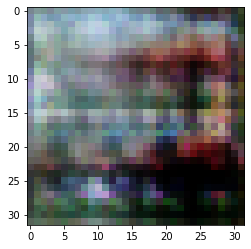

-> Epoch 18, Batch numero 1/78 -> Disc. loss on real images: 0.40243, Disc. loss on fake images: 0.61796, Generator loss: 1.43529
-> Epoch 18, Batch numero 2/78 -> Disc. loss on real images: 0.44031, Disc. loss on fake images: 0.52328, Generator loss: 1.54149
-> Epoch 18, Batch numero 3/78 -> Disc. loss on real images: 0.37341, Disc. loss on fake images: 0.51961, Generator loss: 1.75781
-> Epoch 18, Batch numero 4/78 -> Disc. loss on real images: 0.38914, Disc. loss on fake images: 0.40491, Generator loss: 1.72416
-> Epoch 18, Batch numero 5/78 -> Disc. loss on real images: 0.65994, Disc. loss on fake images: 0.44324, Generator loss: 1.39961
-> Epoch 18, Batch numero 6/78 -> Disc. loss on real images: 0.39855, Disc. loss on fake images: 0.56782, Generator loss: 1.92137
-> Epoch 18, Batch numero 7/78 -> Disc. loss on real images: 0.38661, Disc. loss on fake images: 0.39451, Generator loss: 1.80104
-> Epoch 18, Batch numero 8/78 -> Disc. loss on real images: 0.54806, Disc. loss on fake i

-> Epoch 18, Batch numero 64/78 -> Disc. loss on real images: 0.48577, Disc. loss on fake images: 0.39903, Generator loss: 1.39204
-> Epoch 18, Batch numero 65/78 -> Disc. loss on real images: 0.56658, Disc. loss on fake images: 0.47496, Generator loss: 1.33403
-> Epoch 18, Batch numero 66/78 -> Disc. loss on real images: 0.45775, Disc. loss on fake images: 0.42684, Generator loss: 1.31850
-> Epoch 18, Batch numero 67/78 -> Disc. loss on real images: 0.48405, Disc. loss on fake images: 0.58912, Generator loss: 1.36323
-> Epoch 18, Batch numero 68/78 -> Disc. loss on real images: 0.62403, Disc. loss on fake images: 0.50596, Generator loss: 1.38618
-> Epoch 18, Batch numero 69/78 -> Disc. loss on real images: 0.58880, Disc. loss on fake images: 0.48495, Generator loss: 1.32572
-> Epoch 18, Batch numero 70/78 -> Disc. loss on real images: 0.48272, Disc. loss on fake images: 0.48678, Generator loss: 1.51496
-> Epoch 18, Batch numero 71/78 -> Disc. loss on real images: 0.60258, Disc. loss o

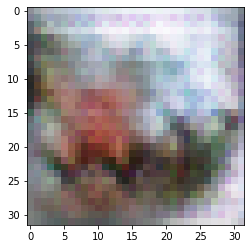

-> Epoch 19, Batch numero 1/78 -> Disc. loss on real images: 0.55846, Disc. loss on fake images: 0.50872, Generator loss: 1.34209
-> Epoch 19, Batch numero 2/78 -> Disc. loss on real images: 0.43093, Disc. loss on fake images: 0.56672, Generator loss: 1.40276
-> Epoch 19, Batch numero 3/78 -> Disc. loss on real images: 0.71455, Disc. loss on fake images: 0.65723, Generator loss: 1.29503
-> Epoch 19, Batch numero 4/78 -> Disc. loss on real images: 0.55569, Disc. loss on fake images: 0.52080, Generator loss: 1.24262
-> Epoch 19, Batch numero 5/78 -> Disc. loss on real images: 0.47150, Disc. loss on fake images: 0.57430, Generator loss: 1.25500
-> Epoch 19, Batch numero 6/78 -> Disc. loss on real images: 0.50914, Disc. loss on fake images: 0.51293, Generator loss: 1.24286
-> Epoch 19, Batch numero 7/78 -> Disc. loss on real images: 0.52305, Disc. loss on fake images: 0.49792, Generator loss: 1.36800
-> Epoch 19, Batch numero 8/78 -> Disc. loss on real images: 0.58501, Disc. loss on fake i

-> Epoch 19, Batch numero 64/78 -> Disc. loss on real images: 0.47586, Disc. loss on fake images: 0.51109, Generator loss: 1.18436
-> Epoch 19, Batch numero 65/78 -> Disc. loss on real images: 0.57191, Disc. loss on fake images: 0.50985, Generator loss: 1.17750
-> Epoch 19, Batch numero 66/78 -> Disc. loss on real images: 0.51579, Disc. loss on fake images: 0.42452, Generator loss: 1.33485
-> Epoch 19, Batch numero 67/78 -> Disc. loss on real images: 0.50705, Disc. loss on fake images: 0.44645, Generator loss: 1.27711
-> Epoch 19, Batch numero 68/78 -> Disc. loss on real images: 0.57025, Disc. loss on fake images: 0.49346, Generator loss: 1.20373
-> Epoch 19, Batch numero 69/78 -> Disc. loss on real images: 0.48910, Disc. loss on fake images: 0.52059, Generator loss: 1.33348
-> Epoch 19, Batch numero 70/78 -> Disc. loss on real images: 0.36255, Disc. loss on fake images: 0.65334, Generator loss: 1.34230
-> Epoch 19, Batch numero 71/78 -> Disc. loss on real images: 0.50452, Disc. loss o

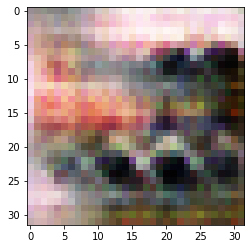

-> Epoch 20, Batch numero 1/78 -> Disc. loss on real images: 0.52182, Disc. loss on fake images: 0.51847, Generator loss: 1.70534
-> Epoch 20, Batch numero 2/78 -> Disc. loss on real images: 0.49911, Disc. loss on fake images: 0.42757, Generator loss: 1.69861
-> Epoch 20, Batch numero 3/78 -> Disc. loss on real images: 0.42148, Disc. loss on fake images: 0.56497, Generator loss: 1.94550
-> Epoch 20, Batch numero 4/78 -> Disc. loss on real images: 0.59029, Disc. loss on fake images: 0.51842, Generator loss: 1.98036
-> Epoch 20, Batch numero 5/78 -> Disc. loss on real images: 0.69107, Disc. loss on fake images: 0.71058, Generator loss: 2.14511
-> Epoch 20, Batch numero 6/78 -> Disc. loss on real images: 0.97834, Disc. loss on fake images: 0.57258, Generator loss: 2.77313
-> Epoch 20, Batch numero 7/78 -> Disc. loss on real images: 0.84880, Disc. loss on fake images: 0.19329, Generator loss: 2.67422
-> Epoch 20, Batch numero 8/78 -> Disc. loss on real images: 0.82425, Disc. loss on fake i

-> Epoch 20, Batch numero 64/78 -> Disc. loss on real images: 0.41455, Disc. loss on fake images: 0.42506, Generator loss: 1.51107
-> Epoch 20, Batch numero 65/78 -> Disc. loss on real images: 0.47698, Disc. loss on fake images: 0.50833, Generator loss: 1.55025
-> Epoch 20, Batch numero 66/78 -> Disc. loss on real images: 0.62367, Disc. loss on fake images: 0.48516, Generator loss: 1.55557
-> Epoch 20, Batch numero 67/78 -> Disc. loss on real images: 0.43069, Disc. loss on fake images: 0.40585, Generator loss: 1.42183
-> Epoch 20, Batch numero 68/78 -> Disc. loss on real images: 0.61240, Disc. loss on fake images: 0.38549, Generator loss: 1.39994
-> Epoch 20, Batch numero 69/78 -> Disc. loss on real images: 0.48517, Disc. loss on fake images: 0.54612, Generator loss: 1.52809
-> Epoch 20, Batch numero 70/78 -> Disc. loss on real images: 0.49615, Disc. loss on fake images: 0.65125, Generator loss: 1.55395
-> Epoch 20, Batch numero 71/78 -> Disc. loss on real images: 0.68775, Disc. loss o

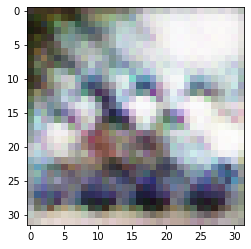

-> Epoch 21, Batch numero 1/78 -> Disc. loss on real images: 0.49912, Disc. loss on fake images: 0.62128, Generator loss: 1.34154
-> Epoch 21, Batch numero 2/78 -> Disc. loss on real images: 0.64055, Disc. loss on fake images: 0.62220, Generator loss: 1.30500
-> Epoch 21, Batch numero 3/78 -> Disc. loss on real images: 0.66770, Disc. loss on fake images: 0.47372, Generator loss: 1.37161
-> Epoch 21, Batch numero 4/78 -> Disc. loss on real images: 0.66873, Disc. loss on fake images: 0.58806, Generator loss: 1.30176
-> Epoch 21, Batch numero 5/78 -> Disc. loss on real images: 0.48090, Disc. loss on fake images: 0.64885, Generator loss: 1.31380
-> Epoch 21, Batch numero 6/78 -> Disc. loss on real images: 0.67898, Disc. loss on fake images: 0.38425, Generator loss: 1.20399
-> Epoch 21, Batch numero 7/78 -> Disc. loss on real images: 0.52784, Disc. loss on fake images: 0.56292, Generator loss: 1.14507
-> Epoch 21, Batch numero 8/78 -> Disc. loss on real images: 0.49662, Disc. loss on fake i

-> Epoch 21, Batch numero 64/78 -> Disc. loss on real images: 0.51882, Disc. loss on fake images: 0.85026, Generator loss: 1.29072
-> Epoch 21, Batch numero 65/78 -> Disc. loss on real images: 0.62147, Disc. loss on fake images: 0.53740, Generator loss: 1.25367
-> Epoch 21, Batch numero 66/78 -> Disc. loss on real images: 0.59932, Disc. loss on fake images: 0.61041, Generator loss: 1.21978
-> Epoch 21, Batch numero 67/78 -> Disc. loss on real images: 0.72169, Disc. loss on fake images: 0.68858, Generator loss: 1.15378
-> Epoch 21, Batch numero 68/78 -> Disc. loss on real images: 0.43966, Disc. loss on fake images: 0.53159, Generator loss: 1.10135
-> Epoch 21, Batch numero 69/78 -> Disc. loss on real images: 0.40220, Disc. loss on fake images: 0.66655, Generator loss: 1.36819
-> Epoch 21, Batch numero 70/78 -> Disc. loss on real images: 0.46715, Disc. loss on fake images: 0.50404, Generator loss: 1.37890
-> Epoch 21, Batch numero 71/78 -> Disc. loss on real images: 0.58475, Disc. loss o

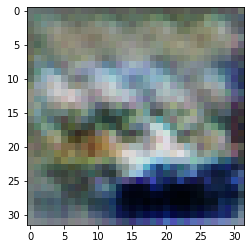

-> Epoch 22, Batch numero 1/78 -> Disc. loss on real images: 0.76067, Disc. loss on fake images: 0.51418, Generator loss: 1.75131
-> Epoch 22, Batch numero 2/78 -> Disc. loss on real images: 0.70423, Disc. loss on fake images: 0.42570, Generator loss: 1.82086
-> Epoch 22, Batch numero 3/78 -> Disc. loss on real images: 0.69482, Disc. loss on fake images: 0.44105, Generator loss: 1.63187
-> Epoch 22, Batch numero 4/78 -> Disc. loss on real images: 0.68624, Disc. loss on fake images: 0.34927, Generator loss: 1.82858
-> Epoch 22, Batch numero 5/78 -> Disc. loss on real images: 0.54856, Disc. loss on fake images: 0.35178, Generator loss: 1.75983
-> Epoch 22, Batch numero 6/78 -> Disc. loss on real images: 0.61588, Disc. loss on fake images: 0.26400, Generator loss: 1.78590
-> Epoch 22, Batch numero 7/78 -> Disc. loss on real images: 0.46226, Disc. loss on fake images: 0.38075, Generator loss: 1.64012
-> Epoch 22, Batch numero 8/78 -> Disc. loss on real images: 0.47787, Disc. loss on fake i

-> Epoch 22, Batch numero 64/78 -> Disc. loss on real images: 0.45145, Disc. loss on fake images: 0.46238, Generator loss: 1.41611
-> Epoch 22, Batch numero 65/78 -> Disc. loss on real images: 0.38653, Disc. loss on fake images: 0.43251, Generator loss: 1.66677
-> Epoch 22, Batch numero 66/78 -> Disc. loss on real images: 0.41676, Disc. loss on fake images: 0.33348, Generator loss: 1.68637
-> Epoch 22, Batch numero 67/78 -> Disc. loss on real images: 0.47005, Disc. loss on fake images: 0.40767, Generator loss: 1.63102
-> Epoch 22, Batch numero 68/78 -> Disc. loss on real images: 0.44499, Disc. loss on fake images: 0.33374, Generator loss: 1.72837
-> Epoch 22, Batch numero 69/78 -> Disc. loss on real images: 0.40902, Disc. loss on fake images: 0.38592, Generator loss: 1.64919
-> Epoch 22, Batch numero 70/78 -> Disc. loss on real images: 0.35918, Disc. loss on fake images: 0.38417, Generator loss: 1.73828
-> Epoch 22, Batch numero 71/78 -> Disc. loss on real images: 0.49586, Disc. loss o

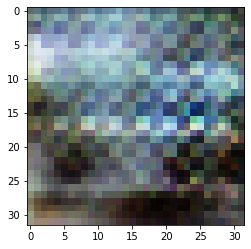

-> Epoch 23, Batch numero 1/78 -> Disc. loss on real images: 0.56010, Disc. loss on fake images: 0.46326, Generator loss: 1.75666
-> Epoch 23, Batch numero 2/78 -> Disc. loss on real images: 0.58548, Disc. loss on fake images: 0.44430, Generator loss: 1.75394
-> Epoch 23, Batch numero 3/78 -> Disc. loss on real images: 0.55755, Disc. loss on fake images: 0.58396, Generator loss: 1.86447
-> Epoch 23, Batch numero 4/78 -> Disc. loss on real images: 0.72790, Disc. loss on fake images: 0.50315, Generator loss: 1.64072
-> Epoch 23, Batch numero 5/78 -> Disc. loss on real images: 0.56160, Disc. loss on fake images: 0.42792, Generator loss: 1.48433
-> Epoch 23, Batch numero 6/78 -> Disc. loss on real images: 0.59053, Disc. loss on fake images: 0.62087, Generator loss: 1.73767
-> Epoch 23, Batch numero 7/78 -> Disc. loss on real images: 0.66548, Disc. loss on fake images: 0.39013, Generator loss: 1.79257
-> Epoch 23, Batch numero 8/78 -> Disc. loss on real images: 0.78416, Disc. loss on fake i

-> Epoch 23, Batch numero 64/78 -> Disc. loss on real images: 0.52078, Disc. loss on fake images: 0.55829, Generator loss: 1.07388
-> Epoch 23, Batch numero 65/78 -> Disc. loss on real images: 0.44412, Disc. loss on fake images: 0.52741, Generator loss: 1.21509
-> Epoch 23, Batch numero 66/78 -> Disc. loss on real images: 0.57019, Disc. loss on fake images: 0.57387, Generator loss: 1.25204
-> Epoch 23, Batch numero 67/78 -> Disc. loss on real images: 0.55263, Disc. loss on fake images: 0.60694, Generator loss: 1.25736
-> Epoch 23, Batch numero 68/78 -> Disc. loss on real images: 0.59762, Disc. loss on fake images: 0.46733, Generator loss: 1.36080
-> Epoch 23, Batch numero 69/78 -> Disc. loss on real images: 0.49565, Disc. loss on fake images: 0.48792, Generator loss: 1.39086
-> Epoch 23, Batch numero 70/78 -> Disc. loss on real images: 0.52481, Disc. loss on fake images: 0.63129, Generator loss: 1.20895
-> Epoch 23, Batch numero 71/78 -> Disc. loss on real images: 0.49261, Disc. loss o

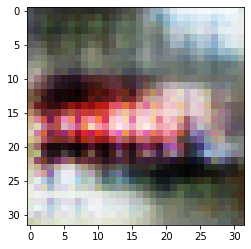

-> Epoch 24, Batch numero 1/78 -> Disc. loss on real images: 0.39565, Disc. loss on fake images: 0.49905, Generator loss: 1.78330
-> Epoch 24, Batch numero 2/78 -> Disc. loss on real images: 0.57515, Disc. loss on fake images: 0.38975, Generator loss: 1.72659
-> Epoch 24, Batch numero 3/78 -> Disc. loss on real images: 0.50224, Disc. loss on fake images: 0.39614, Generator loss: 1.48881
-> Epoch 24, Batch numero 4/78 -> Disc. loss on real images: 0.41694, Disc. loss on fake images: 0.57664, Generator loss: 1.49324
-> Epoch 24, Batch numero 5/78 -> Disc. loss on real images: 0.47288, Disc. loss on fake images: 0.55200, Generator loss: 1.46820
-> Epoch 24, Batch numero 6/78 -> Disc. loss on real images: 0.52859, Disc. loss on fake images: 0.60168, Generator loss: 1.58242
-> Epoch 24, Batch numero 7/78 -> Disc. loss on real images: 0.60108, Disc. loss on fake images: 0.48403, Generator loss: 1.67877
-> Epoch 24, Batch numero 8/78 -> Disc. loss on real images: 0.66765, Disc. loss on fake i

-> Epoch 24, Batch numero 64/78 -> Disc. loss on real images: 0.76343, Disc. loss on fake images: 0.47642, Generator loss: 2.13034
-> Epoch 24, Batch numero 65/78 -> Disc. loss on real images: 0.60280, Disc. loss on fake images: 0.80954, Generator loss: 1.80707
-> Epoch 24, Batch numero 66/78 -> Disc. loss on real images: 0.60108, Disc. loss on fake images: 0.53880, Generator loss: 1.93507
-> Epoch 24, Batch numero 67/78 -> Disc. loss on real images: 0.82978, Disc. loss on fake images: 0.60298, Generator loss: 1.72573
-> Epoch 24, Batch numero 68/78 -> Disc. loss on real images: 0.65480, Disc. loss on fake images: 0.50080, Generator loss: 1.61475
-> Epoch 24, Batch numero 69/78 -> Disc. loss on real images: 0.77151, Disc. loss on fake images: 0.57871, Generator loss: 1.44013
-> Epoch 24, Batch numero 70/78 -> Disc. loss on real images: 0.70900, Disc. loss on fake images: 0.53960, Generator loss: 1.29802
-> Epoch 24, Batch numero 71/78 -> Disc. loss on real images: 0.63754, Disc. loss o

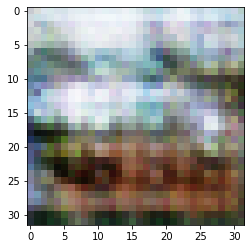

-> Epoch 25, Batch numero 1/78 -> Disc. loss on real images: 0.49995, Disc. loss on fake images: 0.44822, Generator loss: 1.34981
-> Epoch 25, Batch numero 2/78 -> Disc. loss on real images: 0.78975, Disc. loss on fake images: 0.51294, Generator loss: 1.31180
-> Epoch 25, Batch numero 3/78 -> Disc. loss on real images: 0.51570, Disc. loss on fake images: 0.55305, Generator loss: 1.44672
-> Epoch 25, Batch numero 4/78 -> Disc. loss on real images: 0.49526, Disc. loss on fake images: 0.39261, Generator loss: 1.56042
-> Epoch 25, Batch numero 5/78 -> Disc. loss on real images: 0.64225, Disc. loss on fake images: 0.52133, Generator loss: 1.41875
-> Epoch 25, Batch numero 6/78 -> Disc. loss on real images: 0.53938, Disc. loss on fake images: 0.42610, Generator loss: 1.35983
-> Epoch 25, Batch numero 7/78 -> Disc. loss on real images: 0.60717, Disc. loss on fake images: 0.38463, Generator loss: 1.33680
-> Epoch 25, Batch numero 8/78 -> Disc. loss on real images: 0.41084, Disc. loss on fake i

-> Epoch 25, Batch numero 64/78 -> Disc. loss on real images: 0.49024, Disc. loss on fake images: 0.45386, Generator loss: 1.39018
-> Epoch 25, Batch numero 65/78 -> Disc. loss on real images: 0.39007, Disc. loss on fake images: 0.39112, Generator loss: 1.46395
-> Epoch 25, Batch numero 66/78 -> Disc. loss on real images: 0.52337, Disc. loss on fake images: 0.51894, Generator loss: 1.37074
-> Epoch 25, Batch numero 67/78 -> Disc. loss on real images: 0.47716, Disc. loss on fake images: 0.47630, Generator loss: 1.36424
-> Epoch 25, Batch numero 68/78 -> Disc. loss on real images: 0.51860, Disc. loss on fake images: 0.48701, Generator loss: 1.31554
-> Epoch 25, Batch numero 69/78 -> Disc. loss on real images: 0.41069, Disc. loss on fake images: 0.44783, Generator loss: 1.36956
-> Epoch 25, Batch numero 70/78 -> Disc. loss on real images: 0.49093, Disc. loss on fake images: 0.61302, Generator loss: 1.38040
-> Epoch 25, Batch numero 71/78 -> Disc. loss on real images: 0.50766, Disc. loss o

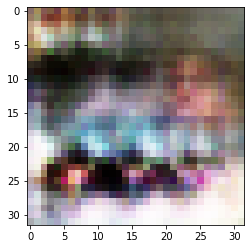

-> Epoch 26, Batch numero 1/78 -> Disc. loss on real images: 0.61084, Disc. loss on fake images: 0.62217, Generator loss: 1.19293
-> Epoch 26, Batch numero 2/78 -> Disc. loss on real images: 0.64497, Disc. loss on fake images: 0.51982, Generator loss: 1.19615
-> Epoch 26, Batch numero 3/78 -> Disc. loss on real images: 0.53875, Disc. loss on fake images: 0.52262, Generator loss: 1.35778
-> Epoch 26, Batch numero 4/78 -> Disc. loss on real images: 0.62126, Disc. loss on fake images: 0.53723, Generator loss: 1.28040
-> Epoch 26, Batch numero 5/78 -> Disc. loss on real images: 0.62852, Disc. loss on fake images: 0.59503, Generator loss: 1.28432
-> Epoch 26, Batch numero 6/78 -> Disc. loss on real images: 0.62113, Disc. loss on fake images: 0.66108, Generator loss: 1.31255
-> Epoch 26, Batch numero 7/78 -> Disc. loss on real images: 0.55834, Disc. loss on fake images: 0.48302, Generator loss: 1.39264
-> Epoch 26, Batch numero 8/78 -> Disc. loss on real images: 0.57597, Disc. loss on fake i

-> Epoch 26, Batch numero 64/78 -> Disc. loss on real images: 0.75157, Disc. loss on fake images: 0.79108, Generator loss: 1.16831
-> Epoch 26, Batch numero 65/78 -> Disc. loss on real images: 0.64641, Disc. loss on fake images: 0.58435, Generator loss: 1.28176
-> Epoch 26, Batch numero 66/78 -> Disc. loss on real images: 0.55140, Disc. loss on fake images: 0.48030, Generator loss: 1.16212
-> Epoch 26, Batch numero 67/78 -> Disc. loss on real images: 0.67465, Disc. loss on fake images: 0.61575, Generator loss: 1.15878
-> Epoch 26, Batch numero 68/78 -> Disc. loss on real images: 0.53891, Disc. loss on fake images: 0.49314, Generator loss: 1.39330
-> Epoch 26, Batch numero 69/78 -> Disc. loss on real images: 0.74421, Disc. loss on fake images: 0.53164, Generator loss: 1.26297
-> Epoch 26, Batch numero 70/78 -> Disc. loss on real images: 0.63139, Disc. loss on fake images: 0.54440, Generator loss: 1.15908
-> Epoch 26, Batch numero 71/78 -> Disc. loss on real images: 0.51288, Disc. loss o

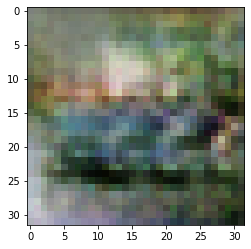

-> Epoch 27, Batch numero 1/78 -> Disc. loss on real images: 0.56386, Disc. loss on fake images: 0.47325, Generator loss: 1.36391
-> Epoch 27, Batch numero 2/78 -> Disc. loss on real images: 0.55651, Disc. loss on fake images: 0.42606, Generator loss: 1.17006
-> Epoch 27, Batch numero 3/78 -> Disc. loss on real images: 0.61029, Disc. loss on fake images: 0.67659, Generator loss: 1.20060
-> Epoch 27, Batch numero 4/78 -> Disc. loss on real images: 0.58760, Disc. loss on fake images: 0.54381, Generator loss: 1.33150
-> Epoch 27, Batch numero 5/78 -> Disc. loss on real images: 0.63594, Disc. loss on fake images: 0.51616, Generator loss: 1.36111
-> Epoch 27, Batch numero 6/78 -> Disc. loss on real images: 0.53213, Disc. loss on fake images: 0.43673, Generator loss: 1.51480
-> Epoch 27, Batch numero 7/78 -> Disc. loss on real images: 0.57125, Disc. loss on fake images: 0.47062, Generator loss: 1.49867
-> Epoch 27, Batch numero 8/78 -> Disc. loss on real images: 0.50624, Disc. loss on fake i

-> Epoch 27, Batch numero 64/78 -> Disc. loss on real images: 0.68377, Disc. loss on fake images: 0.53617, Generator loss: 1.51771
-> Epoch 27, Batch numero 65/78 -> Disc. loss on real images: 0.52546, Disc. loss on fake images: 0.78503, Generator loss: 1.86438
-> Epoch 27, Batch numero 66/78 -> Disc. loss on real images: 0.83034, Disc. loss on fake images: 0.33887, Generator loss: 1.79501
-> Epoch 27, Batch numero 67/78 -> Disc. loss on real images: 0.69214, Disc. loss on fake images: 0.53447, Generator loss: 1.48878
-> Epoch 27, Batch numero 68/78 -> Disc. loss on real images: 0.54468, Disc. loss on fake images: 0.55760, Generator loss: 1.32997
-> Epoch 27, Batch numero 69/78 -> Disc. loss on real images: 0.45593, Disc. loss on fake images: 0.68948, Generator loss: 1.42086
-> Epoch 27, Batch numero 70/78 -> Disc. loss on real images: 0.46027, Disc. loss on fake images: 0.58269, Generator loss: 1.32676
-> Epoch 27, Batch numero 71/78 -> Disc. loss on real images: 0.58968, Disc. loss o

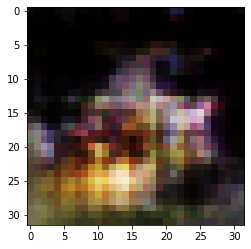

-> Epoch 28, Batch numero 1/78 -> Disc. loss on real images: 0.37077, Disc. loss on fake images: 0.39865, Generator loss: 1.35410
-> Epoch 28, Batch numero 2/78 -> Disc. loss on real images: 0.46407, Disc. loss on fake images: 0.55094, Generator loss: 1.38867
-> Epoch 28, Batch numero 3/78 -> Disc. loss on real images: 0.48108, Disc. loss on fake images: 0.49043, Generator loss: 1.25617
-> Epoch 28, Batch numero 4/78 -> Disc. loss on real images: 0.45292, Disc. loss on fake images: 0.50164, Generator loss: 1.47638
-> Epoch 28, Batch numero 5/78 -> Disc. loss on real images: 0.44139, Disc. loss on fake images: 0.39528, Generator loss: 1.49270
-> Epoch 28, Batch numero 6/78 -> Disc. loss on real images: 0.44156, Disc. loss on fake images: 0.53992, Generator loss: 1.53133
-> Epoch 28, Batch numero 7/78 -> Disc. loss on real images: 0.57418, Disc. loss on fake images: 0.45986, Generator loss: 1.51895
-> Epoch 28, Batch numero 8/78 -> Disc. loss on real images: 0.54150, Disc. loss on fake i

-> Epoch 28, Batch numero 64/78 -> Disc. loss on real images: 0.43933, Disc. loss on fake images: 0.60064, Generator loss: 1.37197
-> Epoch 28, Batch numero 65/78 -> Disc. loss on real images: 0.51697, Disc. loss on fake images: 0.70055, Generator loss: 1.35621
-> Epoch 28, Batch numero 66/78 -> Disc. loss on real images: 0.45107, Disc. loss on fake images: 0.54570, Generator loss: 1.50130
-> Epoch 28, Batch numero 67/78 -> Disc. loss on real images: 0.50827, Disc. loss on fake images: 0.37655, Generator loss: 1.79508
-> Epoch 28, Batch numero 68/78 -> Disc. loss on real images: 0.50591, Disc. loss on fake images: 0.57574, Generator loss: 1.54814
-> Epoch 28, Batch numero 69/78 -> Disc. loss on real images: 0.68603, Disc. loss on fake images: 0.58806, Generator loss: 1.66908
-> Epoch 28, Batch numero 70/78 -> Disc. loss on real images: 0.43220, Disc. loss on fake images: 0.44949, Generator loss: 1.75394
-> Epoch 28, Batch numero 71/78 -> Disc. loss on real images: 0.50738, Disc. loss o

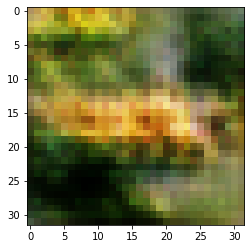

-> Epoch 29, Batch numero 1/78 -> Disc. loss on real images: 0.52470, Disc. loss on fake images: 0.45392, Generator loss: 1.79672
-> Epoch 29, Batch numero 2/78 -> Disc. loss on real images: 0.55048, Disc. loss on fake images: 0.44713, Generator loss: 1.50654
-> Epoch 29, Batch numero 3/78 -> Disc. loss on real images: 0.33214, Disc. loss on fake images: 0.77623, Generator loss: 1.89474
-> Epoch 29, Batch numero 4/78 -> Disc. loss on real images: 0.66045, Disc. loss on fake images: 0.42497, Generator loss: 1.84593
-> Epoch 29, Batch numero 5/78 -> Disc. loss on real images: 0.93799, Disc. loss on fake images: 0.47329, Generator loss: 1.51965
-> Epoch 29, Batch numero 6/78 -> Disc. loss on real images: 0.78452, Disc. loss on fake images: 0.55117, Generator loss: 1.53636
-> Epoch 29, Batch numero 7/78 -> Disc. loss on real images: 0.59378, Disc. loss on fake images: 0.48326, Generator loss: 1.65176
-> Epoch 29, Batch numero 8/78 -> Disc. loss on real images: 0.51932, Disc. loss on fake i

-> Epoch 29, Batch numero 64/78 -> Disc. loss on real images: 0.36401, Disc. loss on fake images: 0.44333, Generator loss: 1.32428
-> Epoch 29, Batch numero 65/78 -> Disc. loss on real images: 0.49621, Disc. loss on fake images: 0.55593, Generator loss: 1.35442
-> Epoch 29, Batch numero 66/78 -> Disc. loss on real images: 0.46268, Disc. loss on fake images: 0.57209, Generator loss: 1.35953
-> Epoch 29, Batch numero 67/78 -> Disc. loss on real images: 0.57024, Disc. loss on fake images: 0.55969, Generator loss: 1.35066
-> Epoch 29, Batch numero 68/78 -> Disc. loss on real images: 0.48905, Disc. loss on fake images: 0.59028, Generator loss: 1.48463
-> Epoch 29, Batch numero 69/78 -> Disc. loss on real images: 0.47147, Disc. loss on fake images: 0.40503, Generator loss: 1.36924
-> Epoch 29, Batch numero 70/78 -> Disc. loss on real images: 0.54558, Disc. loss on fake images: 0.62914, Generator loss: 1.14740
-> Epoch 29, Batch numero 71/78 -> Disc. loss on real images: 0.40468, Disc. loss o

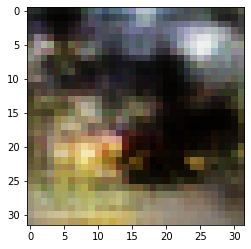

-> Epoch 30, Batch numero 1/78 -> Disc. loss on real images: 0.61110, Disc. loss on fake images: 0.55011, Generator loss: 1.39630
-> Epoch 30, Batch numero 2/78 -> Disc. loss on real images: 0.57699, Disc. loss on fake images: 0.51787, Generator loss: 1.68532
-> Epoch 30, Batch numero 3/78 -> Disc. loss on real images: 0.47205, Disc. loss on fake images: 0.29975, Generator loss: 1.84694
-> Epoch 30, Batch numero 4/78 -> Disc. loss on real images: 0.72355, Disc. loss on fake images: 0.33774, Generator loss: 1.76366
-> Epoch 30, Batch numero 5/78 -> Disc. loss on real images: 0.49862, Disc. loss on fake images: 0.38314, Generator loss: 1.72532
-> Epoch 30, Batch numero 6/78 -> Disc. loss on real images: 0.54147, Disc. loss on fake images: 0.41667, Generator loss: 1.66376
-> Epoch 30, Batch numero 7/78 -> Disc. loss on real images: 0.51157, Disc. loss on fake images: 0.26752, Generator loss: 1.75639
-> Epoch 30, Batch numero 8/78 -> Disc. loss on real images: 0.35772, Disc. loss on fake i

-> Epoch 30, Batch numero 65/78 -> Disc. loss on real images: 0.68654, Disc. loss on fake images: 0.53564, Generator loss: 1.44031
-> Epoch 30, Batch numero 66/78 -> Disc. loss on real images: 0.60840, Disc. loss on fake images: 0.62055, Generator loss: 1.37660
-> Epoch 30, Batch numero 67/78 -> Disc. loss on real images: 0.63187, Disc. loss on fake images: 0.54345, Generator loss: 1.35540
-> Epoch 30, Batch numero 68/78 -> Disc. loss on real images: 0.57983, Disc. loss on fake images: 0.62505, Generator loss: 1.45644
-> Epoch 30, Batch numero 69/78 -> Disc. loss on real images: 0.61037, Disc. loss on fake images: 0.48310, Generator loss: 1.49420
-> Epoch 30, Batch numero 70/78 -> Disc. loss on real images: 0.66911, Disc. loss on fake images: 0.49234, Generator loss: 1.44541
-> Epoch 30, Batch numero 71/78 -> Disc. loss on real images: 0.71749, Disc. loss on fake images: 0.50712, Generator loss: 1.27272
-> Epoch 30, Batch numero 72/78 -> Disc. loss on real images: 0.62164, Disc. loss o

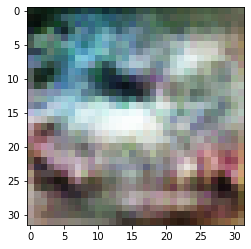

-> Epoch 31, Batch numero 1/78 -> Disc. loss on real images: 0.61075, Disc. loss on fake images: 0.65758, Generator loss: 1.54152
-> Epoch 31, Batch numero 2/78 -> Disc. loss on real images: 0.51399, Disc. loss on fake images: 0.52309, Generator loss: 1.65795
-> Epoch 31, Batch numero 3/78 -> Disc. loss on real images: 0.50738, Disc. loss on fake images: 0.36028, Generator loss: 1.52403
-> Epoch 31, Batch numero 4/78 -> Disc. loss on real images: 0.50371, Disc. loss on fake images: 0.59757, Generator loss: 1.51713
-> Epoch 31, Batch numero 5/78 -> Disc. loss on real images: 0.44685, Disc. loss on fake images: 0.41828, Generator loss: 1.47011
-> Epoch 31, Batch numero 6/78 -> Disc. loss on real images: 0.38775, Disc. loss on fake images: 0.50489, Generator loss: 1.45513
-> Epoch 31, Batch numero 7/78 -> Disc. loss on real images: 0.22384, Disc. loss on fake images: 0.64631, Generator loss: 1.54371
-> Epoch 31, Batch numero 8/78 -> Disc. loss on real images: 0.54070, Disc. loss on fake i

-> Epoch 31, Batch numero 64/78 -> Disc. loss on real images: 0.48428, Disc. loss on fake images: 0.49380, Generator loss: 1.40673
-> Epoch 31, Batch numero 65/78 -> Disc. loss on real images: 0.45478, Disc. loss on fake images: 0.55284, Generator loss: 1.64582
-> Epoch 31, Batch numero 66/78 -> Disc. loss on real images: 0.60298, Disc. loss on fake images: 0.50885, Generator loss: 1.63133
-> Epoch 31, Batch numero 67/78 -> Disc. loss on real images: 0.68930, Disc. loss on fake images: 0.51237, Generator loss: 1.34818
-> Epoch 31, Batch numero 68/78 -> Disc. loss on real images: 0.65907, Disc. loss on fake images: 0.70479, Generator loss: 1.26417
-> Epoch 31, Batch numero 69/78 -> Disc. loss on real images: 0.65731, Disc. loss on fake images: 0.79107, Generator loss: 1.22273
-> Epoch 31, Batch numero 70/78 -> Disc. loss on real images: 0.59220, Disc. loss on fake images: 0.55404, Generator loss: 1.15700
-> Epoch 31, Batch numero 71/78 -> Disc. loss on real images: 0.64257, Disc. loss o

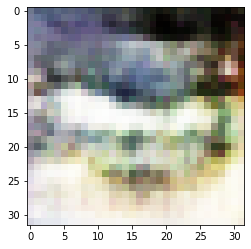

-> Epoch 32, Batch numero 1/78 -> Disc. loss on real images: 0.62337, Disc. loss on fake images: 0.52246, Generator loss: 1.25739
-> Epoch 32, Batch numero 2/78 -> Disc. loss on real images: 0.54180, Disc. loss on fake images: 0.65032, Generator loss: 1.19058
-> Epoch 32, Batch numero 3/78 -> Disc. loss on real images: 0.52357, Disc. loss on fake images: 0.68131, Generator loss: 1.22463
-> Epoch 32, Batch numero 4/78 -> Disc. loss on real images: 0.55318, Disc. loss on fake images: 0.51607, Generator loss: 1.18384
-> Epoch 32, Batch numero 5/78 -> Disc. loss on real images: 0.52165, Disc. loss on fake images: 0.68774, Generator loss: 1.02864
-> Epoch 32, Batch numero 6/78 -> Disc. loss on real images: 0.44211, Disc. loss on fake images: 0.68478, Generator loss: 1.07162
-> Epoch 32, Batch numero 7/78 -> Disc. loss on real images: 0.51761, Disc. loss on fake images: 0.63211, Generator loss: 1.23501
-> Epoch 32, Batch numero 8/78 -> Disc. loss on real images: 0.59175, Disc. loss on fake i

-> Epoch 32, Batch numero 64/78 -> Disc. loss on real images: 0.52310, Disc. loss on fake images: 0.45601, Generator loss: 1.27758
-> Epoch 32, Batch numero 65/78 -> Disc. loss on real images: 0.54798, Disc. loss on fake images: 0.55947, Generator loss: 1.39177
-> Epoch 32, Batch numero 66/78 -> Disc. loss on real images: 0.37515, Disc. loss on fake images: 0.35416, Generator loss: 1.48503
-> Epoch 32, Batch numero 67/78 -> Disc. loss on real images: 0.45814, Disc. loss on fake images: 0.38563, Generator loss: 1.42615
-> Epoch 32, Batch numero 68/78 -> Disc. loss on real images: 0.46597, Disc. loss on fake images: 0.44572, Generator loss: 1.41977
-> Epoch 32, Batch numero 69/78 -> Disc. loss on real images: 0.45745, Disc. loss on fake images: 0.49897, Generator loss: 1.13361
-> Epoch 32, Batch numero 70/78 -> Disc. loss on real images: 0.43952, Disc. loss on fake images: 0.52985, Generator loss: 1.26003
-> Epoch 32, Batch numero 71/78 -> Disc. loss on real images: 0.38986, Disc. loss o

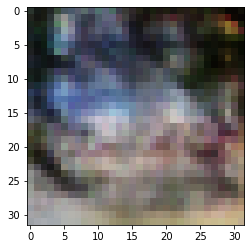

-> Epoch 33, Batch numero 1/78 -> Disc. loss on real images: 0.58500, Disc. loss on fake images: 0.65132, Generator loss: 1.29969
-> Epoch 33, Batch numero 2/78 -> Disc. loss on real images: 0.46758, Disc. loss on fake images: 0.64228, Generator loss: 1.25299
-> Epoch 33, Batch numero 3/78 -> Disc. loss on real images: 0.50425, Disc. loss on fake images: 0.53548, Generator loss: 1.34767
-> Epoch 33, Batch numero 4/78 -> Disc. loss on real images: 0.62281, Disc. loss on fake images: 0.51530, Generator loss: 1.53260
-> Epoch 33, Batch numero 5/78 -> Disc. loss on real images: 0.64110, Disc. loss on fake images: 0.41083, Generator loss: 1.46355
-> Epoch 33, Batch numero 6/78 -> Disc. loss on real images: 0.62617, Disc. loss on fake images: 0.43887, Generator loss: 1.51318
-> Epoch 33, Batch numero 7/78 -> Disc. loss on real images: 0.53123, Disc. loss on fake images: 0.64133, Generator loss: 1.63168
-> Epoch 33, Batch numero 8/78 -> Disc. loss on real images: 0.55041, Disc. loss on fake i

-> Epoch 33, Batch numero 64/78 -> Disc. loss on real images: 0.77723, Disc. loss on fake images: 0.57932, Generator loss: 1.10517
-> Epoch 33, Batch numero 65/78 -> Disc. loss on real images: 0.58869, Disc. loss on fake images: 0.62537, Generator loss: 1.31111
-> Epoch 33, Batch numero 66/78 -> Disc. loss on real images: 0.62250, Disc. loss on fake images: 0.44677, Generator loss: 1.50828
-> Epoch 33, Batch numero 67/78 -> Disc. loss on real images: 0.78754, Disc. loss on fake images: 0.56237, Generator loss: 1.31381
-> Epoch 33, Batch numero 68/78 -> Disc. loss on real images: 0.60866, Disc. loss on fake images: 0.59022, Generator loss: 1.22767
-> Epoch 33, Batch numero 69/78 -> Disc. loss on real images: 0.54970, Disc. loss on fake images: 0.65731, Generator loss: 1.24832
-> Epoch 33, Batch numero 70/78 -> Disc. loss on real images: 0.54369, Disc. loss on fake images: 0.48294, Generator loss: 1.35069
-> Epoch 33, Batch numero 71/78 -> Disc. loss on real images: 0.71663, Disc. loss o

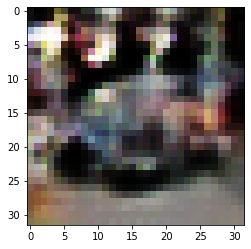

-> Epoch 34, Batch numero 1/78 -> Disc. loss on real images: 0.70357, Disc. loss on fake images: 0.56161, Generator loss: 1.43839
-> Epoch 34, Batch numero 2/78 -> Disc. loss on real images: 0.75655, Disc. loss on fake images: 0.45868, Generator loss: 1.35210
-> Epoch 34, Batch numero 3/78 -> Disc. loss on real images: 0.52849, Disc. loss on fake images: 0.37793, Generator loss: 1.39480
-> Epoch 34, Batch numero 4/78 -> Disc. loss on real images: 0.48113, Disc. loss on fake images: 0.51822, Generator loss: 1.35328
-> Epoch 34, Batch numero 5/78 -> Disc. loss on real images: 0.37988, Disc. loss on fake images: 0.56657, Generator loss: 1.26365
-> Epoch 34, Batch numero 6/78 -> Disc. loss on real images: 0.65726, Disc. loss on fake images: 0.60956, Generator loss: 1.10738
-> Epoch 34, Batch numero 7/78 -> Disc. loss on real images: 0.47559, Disc. loss on fake images: 0.62650, Generator loss: 1.06906
-> Epoch 34, Batch numero 8/78 -> Disc. loss on real images: 0.63708, Disc. loss on fake i

-> Epoch 34, Batch numero 64/78 -> Disc. loss on real images: 0.48183, Disc. loss on fake images: 0.47672, Generator loss: 1.65580
-> Epoch 34, Batch numero 65/78 -> Disc. loss on real images: 0.54772, Disc. loss on fake images: 0.45201, Generator loss: 1.67230
-> Epoch 34, Batch numero 66/78 -> Disc. loss on real images: 0.76324, Disc. loss on fake images: 0.51831, Generator loss: 1.60258
-> Epoch 34, Batch numero 67/78 -> Disc. loss on real images: 0.49577, Disc. loss on fake images: 0.45302, Generator loss: 1.44757
-> Epoch 34, Batch numero 68/78 -> Disc. loss on real images: 0.52246, Disc. loss on fake images: 0.48971, Generator loss: 1.48056
-> Epoch 34, Batch numero 69/78 -> Disc. loss on real images: 0.75234, Disc. loss on fake images: 0.74426, Generator loss: 1.49262
-> Epoch 34, Batch numero 70/78 -> Disc. loss on real images: 0.50054, Disc. loss on fake images: 0.57743, Generator loss: 1.73146
-> Epoch 34, Batch numero 71/78 -> Disc. loss on real images: 0.79187, Disc. loss o

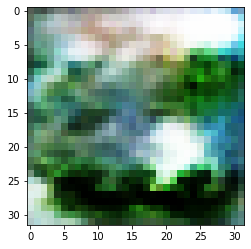

-> Epoch 35, Batch numero 1/78 -> Disc. loss on real images: 0.63729, Disc. loss on fake images: 0.55591, Generator loss: 1.38664
-> Epoch 35, Batch numero 2/78 -> Disc. loss on real images: 0.60110, Disc. loss on fake images: 0.48210, Generator loss: 1.56871
-> Epoch 35, Batch numero 3/78 -> Disc. loss on real images: 0.51921, Disc. loss on fake images: 0.34210, Generator loss: 1.67813
-> Epoch 35, Batch numero 4/78 -> Disc. loss on real images: 0.55829, Disc. loss on fake images: 0.34669, Generator loss: 1.60908
-> Epoch 35, Batch numero 5/78 -> Disc. loss on real images: 0.42908, Disc. loss on fake images: 0.37373, Generator loss: 1.69335
-> Epoch 35, Batch numero 6/78 -> Disc. loss on real images: 0.49635, Disc. loss on fake images: 0.44753, Generator loss: 1.45630
-> Epoch 35, Batch numero 7/78 -> Disc. loss on real images: 0.35398, Disc. loss on fake images: 0.50329, Generator loss: 1.45439
-> Epoch 35, Batch numero 8/78 -> Disc. loss on real images: 0.39125, Disc. loss on fake i

-> Epoch 35, Batch numero 64/78 -> Disc. loss on real images: 0.63225, Disc. loss on fake images: 0.51001, Generator loss: 1.39620
-> Epoch 35, Batch numero 65/78 -> Disc. loss on real images: 0.61976, Disc. loss on fake images: 0.45602, Generator loss: 1.60791
-> Epoch 35, Batch numero 66/78 -> Disc. loss on real images: 0.48831, Disc. loss on fake images: 0.37205, Generator loss: 1.56915
-> Epoch 35, Batch numero 67/78 -> Disc. loss on real images: 0.50788, Disc. loss on fake images: 0.43018, Generator loss: 1.60996
-> Epoch 35, Batch numero 68/78 -> Disc. loss on real images: 0.63717, Disc. loss on fake images: 0.35781, Generator loss: 1.49750
-> Epoch 35, Batch numero 69/78 -> Disc. loss on real images: 0.52422, Disc. loss on fake images: 0.51378, Generator loss: 1.52353
-> Epoch 35, Batch numero 70/78 -> Disc. loss on real images: 0.37011, Disc. loss on fake images: 0.42579, Generator loss: 1.55919
-> Epoch 35, Batch numero 71/78 -> Disc. loss on real images: 0.49005, Disc. loss o

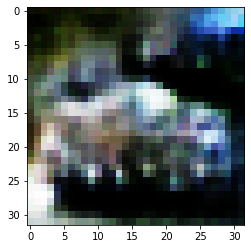

-> Epoch 36, Batch numero 1/78 -> Disc. loss on real images: 0.54958, Disc. loss on fake images: 0.56347, Generator loss: 1.57754
-> Epoch 36, Batch numero 2/78 -> Disc. loss on real images: 0.85059, Disc. loss on fake images: 0.46912, Generator loss: 1.53776
-> Epoch 36, Batch numero 3/78 -> Disc. loss on real images: 0.73416, Disc. loss on fake images: 0.45948, Generator loss: 1.55926
-> Epoch 36, Batch numero 4/78 -> Disc. loss on real images: 0.58651, Disc. loss on fake images: 0.46035, Generator loss: 1.86096
-> Epoch 36, Batch numero 5/78 -> Disc. loss on real images: 0.61179, Disc. loss on fake images: 0.34427, Generator loss: 1.71556
-> Epoch 36, Batch numero 6/78 -> Disc. loss on real images: 0.49604, Disc. loss on fake images: 0.53825, Generator loss: 1.54824
-> Epoch 36, Batch numero 7/78 -> Disc. loss on real images: 0.59075, Disc. loss on fake images: 0.63401, Generator loss: 1.34359
-> Epoch 36, Batch numero 8/78 -> Disc. loss on real images: 0.37469, Disc. loss on fake i

-> Epoch 36, Batch numero 65/78 -> Disc. loss on real images: 0.49348, Disc. loss on fake images: 0.42918, Generator loss: 1.39042
-> Epoch 36, Batch numero 66/78 -> Disc. loss on real images: 0.59613, Disc. loss on fake images: 0.46272, Generator loss: 1.54565
-> Epoch 36, Batch numero 67/78 -> Disc. loss on real images: 0.54652, Disc. loss on fake images: 0.45671, Generator loss: 1.27021
-> Epoch 36, Batch numero 68/78 -> Disc. loss on real images: 0.40937, Disc. loss on fake images: 0.44424, Generator loss: 1.40923
-> Epoch 36, Batch numero 69/78 -> Disc. loss on real images: 0.44409, Disc. loss on fake images: 0.62115, Generator loss: 1.26608
-> Epoch 36, Batch numero 70/78 -> Disc. loss on real images: 0.49988, Disc. loss on fake images: 0.66359, Generator loss: 1.41298
-> Epoch 36, Batch numero 71/78 -> Disc. loss on real images: 0.65385, Disc. loss on fake images: 0.48572, Generator loss: 1.47550
-> Epoch 36, Batch numero 72/78 -> Disc. loss on real images: 0.54936, Disc. loss o

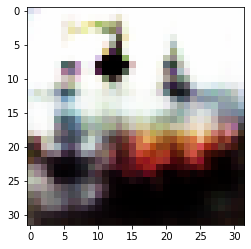

-> Epoch 37, Batch numero 1/78 -> Disc. loss on real images: 0.73695, Disc. loss on fake images: 0.55500, Generator loss: 1.34199
-> Epoch 37, Batch numero 2/78 -> Disc. loss on real images: 0.69947, Disc. loss on fake images: 0.38191, Generator loss: 1.30250
-> Epoch 37, Batch numero 3/78 -> Disc. loss on real images: 0.59504, Disc. loss on fake images: 0.47896, Generator loss: 1.54848
-> Epoch 37, Batch numero 4/78 -> Disc. loss on real images: 0.60514, Disc. loss on fake images: 0.53797, Generator loss: 1.55964
-> Epoch 37, Batch numero 5/78 -> Disc. loss on real images: 0.51765, Disc. loss on fake images: 0.33028, Generator loss: 1.82316
-> Epoch 37, Batch numero 6/78 -> Disc. loss on real images: 0.64416, Disc. loss on fake images: 0.40402, Generator loss: 1.54409
-> Epoch 37, Batch numero 7/78 -> Disc. loss on real images: 0.56946, Disc. loss on fake images: 0.49554, Generator loss: 1.53276
-> Epoch 37, Batch numero 8/78 -> Disc. loss on real images: 0.60621, Disc. loss on fake i

-> Epoch 37, Batch numero 64/78 -> Disc. loss on real images: 0.49575, Disc. loss on fake images: 0.78076, Generator loss: 1.16897
-> Epoch 37, Batch numero 65/78 -> Disc. loss on real images: 0.54629, Disc. loss on fake images: 0.52682, Generator loss: 1.15241
-> Epoch 37, Batch numero 66/78 -> Disc. loss on real images: 0.59073, Disc. loss on fake images: 0.66694, Generator loss: 1.18355
-> Epoch 37, Batch numero 67/78 -> Disc. loss on real images: 0.66730, Disc. loss on fake images: 0.59026, Generator loss: 1.22569
-> Epoch 37, Batch numero 68/78 -> Disc. loss on real images: 0.58022, Disc. loss on fake images: 0.63613, Generator loss: 1.23673
-> Epoch 37, Batch numero 69/78 -> Disc. loss on real images: 0.56202, Disc. loss on fake images: 0.48464, Generator loss: 1.21386
-> Epoch 37, Batch numero 70/78 -> Disc. loss on real images: 0.50990, Disc. loss on fake images: 0.49058, Generator loss: 1.29488
-> Epoch 37, Batch numero 71/78 -> Disc. loss on real images: 0.50561, Disc. loss o

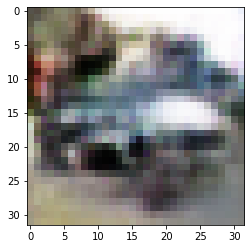

-> Epoch 38, Batch numero 1/78 -> Disc. loss on real images: 0.59858, Disc. loss on fake images: 0.45513, Generator loss: 1.32719
-> Epoch 38, Batch numero 2/78 -> Disc. loss on real images: 0.46176, Disc. loss on fake images: 0.49960, Generator loss: 1.24075
-> Epoch 38, Batch numero 3/78 -> Disc. loss on real images: 0.53254, Disc. loss on fake images: 0.49546, Generator loss: 1.22291
-> Epoch 38, Batch numero 4/78 -> Disc. loss on real images: 0.59829, Disc. loss on fake images: 0.62440, Generator loss: 1.31908
-> Epoch 38, Batch numero 5/78 -> Disc. loss on real images: 0.57595, Disc. loss on fake images: 0.54961, Generator loss: 1.25738
-> Epoch 38, Batch numero 6/78 -> Disc. loss on real images: 0.62382, Disc. loss on fake images: 0.56469, Generator loss: 1.27656
-> Epoch 38, Batch numero 7/78 -> Disc. loss on real images: 0.95751, Disc. loss on fake images: 0.62713, Generator loss: 1.15749
-> Epoch 38, Batch numero 8/78 -> Disc. loss on real images: 0.50066, Disc. loss on fake i

-> Epoch 38, Batch numero 64/78 -> Disc. loss on real images: 0.48170, Disc. loss on fake images: 0.45812, Generator loss: 1.39641
-> Epoch 38, Batch numero 65/78 -> Disc. loss on real images: 0.58877, Disc. loss on fake images: 0.42459, Generator loss: 1.38709
-> Epoch 38, Batch numero 66/78 -> Disc. loss on real images: 0.47078, Disc. loss on fake images: 0.47045, Generator loss: 1.31703
-> Epoch 38, Batch numero 67/78 -> Disc. loss on real images: 0.47486, Disc. loss on fake images: 0.48395, Generator loss: 1.19113
-> Epoch 38, Batch numero 68/78 -> Disc. loss on real images: 0.55049, Disc. loss on fake images: 0.52138, Generator loss: 1.22778
-> Epoch 38, Batch numero 69/78 -> Disc. loss on real images: 0.41681, Disc. loss on fake images: 0.59867, Generator loss: 1.26830
-> Epoch 38, Batch numero 70/78 -> Disc. loss on real images: 0.51885, Disc. loss on fake images: 0.61684, Generator loss: 1.17846
-> Epoch 38, Batch numero 71/78 -> Disc. loss on real images: 0.53427, Disc. loss o

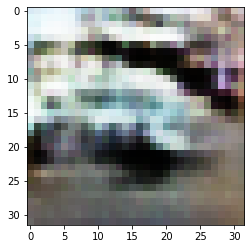

-> Epoch 39, Batch numero 1/78 -> Disc. loss on real images: 0.57621, Disc. loss on fake images: 0.34546, Generator loss: 1.45496
-> Epoch 39, Batch numero 2/78 -> Disc. loss on real images: 0.58427, Disc. loss on fake images: 0.40311, Generator loss: 1.32234
-> Epoch 39, Batch numero 3/78 -> Disc. loss on real images: 0.42997, Disc. loss on fake images: 0.37731, Generator loss: 1.34974
-> Epoch 39, Batch numero 4/78 -> Disc. loss on real images: 0.45306, Disc. loss on fake images: 0.54335, Generator loss: 1.27694
-> Epoch 39, Batch numero 5/78 -> Disc. loss on real images: 0.49183, Disc. loss on fake images: 0.62106, Generator loss: 1.09043
-> Epoch 39, Batch numero 6/78 -> Disc. loss on real images: 0.49670, Disc. loss on fake images: 0.64144, Generator loss: 1.18343
-> Epoch 39, Batch numero 7/78 -> Disc. loss on real images: 0.59174, Disc. loss on fake images: 0.57281, Generator loss: 1.23433
-> Epoch 39, Batch numero 8/78 -> Disc. loss on real images: 0.65286, Disc. loss on fake i

-> Epoch 39, Batch numero 64/78 -> Disc. loss on real images: 0.65678, Disc. loss on fake images: 0.56527, Generator loss: 1.28246
-> Epoch 39, Batch numero 65/78 -> Disc. loss on real images: 0.53326, Disc. loss on fake images: 0.44748, Generator loss: 1.40866
-> Epoch 39, Batch numero 66/78 -> Disc. loss on real images: 0.52275, Disc. loss on fake images: 0.46817, Generator loss: 1.27742
-> Epoch 39, Batch numero 67/78 -> Disc. loss on real images: 0.68278, Disc. loss on fake images: 0.58594, Generator loss: 1.34630
-> Epoch 39, Batch numero 68/78 -> Disc. loss on real images: 0.56752, Disc. loss on fake images: 0.58905, Generator loss: 1.23327
-> Epoch 39, Batch numero 69/78 -> Disc. loss on real images: 0.45925, Disc. loss on fake images: 0.61630, Generator loss: 1.48297
-> Epoch 39, Batch numero 70/78 -> Disc. loss on real images: 0.47460, Disc. loss on fake images: 0.36521, Generator loss: 1.43540
-> Epoch 39, Batch numero 71/78 -> Disc. loss on real images: 0.64642, Disc. loss o

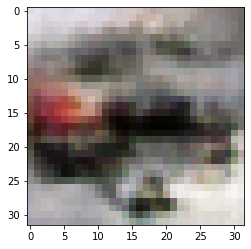

-> Epoch 40, Batch numero 1/78 -> Disc. loss on real images: 0.65889, Disc. loss on fake images: 0.52266, Generator loss: 1.17156
-> Epoch 40, Batch numero 2/78 -> Disc. loss on real images: 0.62594, Disc. loss on fake images: 0.70100, Generator loss: 1.25051
-> Epoch 40, Batch numero 3/78 -> Disc. loss on real images: 0.57577, Disc. loss on fake images: 0.56000, Generator loss: 1.24298
-> Epoch 40, Batch numero 4/78 -> Disc. loss on real images: 0.46450, Disc. loss on fake images: 0.58893, Generator loss: 1.20407
-> Epoch 40, Batch numero 5/78 -> Disc. loss on real images: 0.69330, Disc. loss on fake images: 0.54475, Generator loss: 1.19624
-> Epoch 40, Batch numero 6/78 -> Disc. loss on real images: 0.60812, Disc. loss on fake images: 0.59596, Generator loss: 1.27964
-> Epoch 40, Batch numero 7/78 -> Disc. loss on real images: 0.58409, Disc. loss on fake images: 0.54766, Generator loss: 1.33218
-> Epoch 40, Batch numero 8/78 -> Disc. loss on real images: 0.62146, Disc. loss on fake i

-> Epoch 40, Batch numero 64/78 -> Disc. loss on real images: 0.85736, Disc. loss on fake images: 0.53100, Generator loss: 1.36222
-> Epoch 40, Batch numero 65/78 -> Disc. loss on real images: 0.59587, Disc. loss on fake images: 0.59588, Generator loss: 1.32126
-> Epoch 40, Batch numero 66/78 -> Disc. loss on real images: 0.49365, Disc. loss on fake images: 0.59186, Generator loss: 1.45904
-> Epoch 40, Batch numero 67/78 -> Disc. loss on real images: 0.74059, Disc. loss on fake images: 0.60425, Generator loss: 1.32664
-> Epoch 40, Batch numero 68/78 -> Disc. loss on real images: 0.66368, Disc. loss on fake images: 0.52298, Generator loss: 1.27843
-> Epoch 40, Batch numero 69/78 -> Disc. loss on real images: 0.74193, Disc. loss on fake images: 0.57329, Generator loss: 1.19901
-> Epoch 40, Batch numero 70/78 -> Disc. loss on real images: 0.57752, Disc. loss on fake images: 0.48650, Generator loss: 1.21898
-> Epoch 40, Batch numero 71/78 -> Disc. loss on real images: 0.54974, Disc. loss o

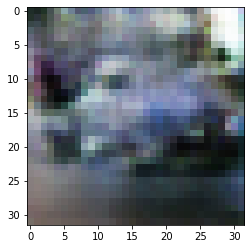

-> Epoch 41, Batch numero 1/78 -> Disc. loss on real images: 0.65272, Disc. loss on fake images: 0.60813, Generator loss: 1.16408
-> Epoch 41, Batch numero 2/78 -> Disc. loss on real images: 0.55754, Disc. loss on fake images: 0.50615, Generator loss: 1.25113
-> Epoch 41, Batch numero 3/78 -> Disc. loss on real images: 0.52892, Disc. loss on fake images: 0.56184, Generator loss: 1.24588
-> Epoch 41, Batch numero 4/78 -> Disc. loss on real images: 0.62168, Disc. loss on fake images: 0.57726, Generator loss: 1.16871
-> Epoch 41, Batch numero 5/78 -> Disc. loss on real images: 0.65012, Disc. loss on fake images: 0.66229, Generator loss: 1.12269
-> Epoch 41, Batch numero 6/78 -> Disc. loss on real images: 0.62742, Disc. loss on fake images: 0.49832, Generator loss: 1.25408
-> Epoch 41, Batch numero 7/78 -> Disc. loss on real images: 0.51521, Disc. loss on fake images: 0.56718, Generator loss: 1.23321
-> Epoch 41, Batch numero 8/78 -> Disc. loss on real images: 0.60540, Disc. loss on fake i

-> Epoch 41, Batch numero 64/78 -> Disc. loss on real images: 0.63088, Disc. loss on fake images: 0.73027, Generator loss: 1.28675
-> Epoch 41, Batch numero 65/78 -> Disc. loss on real images: 0.77438, Disc. loss on fake images: 0.56608, Generator loss: 1.32191
-> Epoch 41, Batch numero 66/78 -> Disc. loss on real images: 0.63543, Disc. loss on fake images: 0.46831, Generator loss: 1.18897
-> Epoch 41, Batch numero 67/78 -> Disc. loss on real images: 0.76850, Disc. loss on fake images: 0.60102, Generator loss: 1.21992
-> Epoch 41, Batch numero 68/78 -> Disc. loss on real images: 0.55809, Disc. loss on fake images: 0.66700, Generator loss: 1.16230
-> Epoch 41, Batch numero 69/78 -> Disc. loss on real images: 0.70800, Disc. loss on fake images: 0.57255, Generator loss: 1.29512
-> Epoch 41, Batch numero 70/78 -> Disc. loss on real images: 0.63475, Disc. loss on fake images: 0.56550, Generator loss: 1.18431
-> Epoch 41, Batch numero 71/78 -> Disc. loss on real images: 0.70340, Disc. loss o

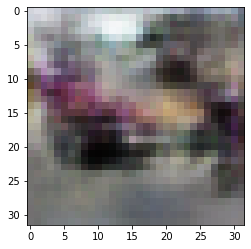

-> Epoch 42, Batch numero 1/78 -> Disc. loss on real images: 0.73772, Disc. loss on fake images: 0.52832, Generator loss: 0.94325
-> Epoch 42, Batch numero 2/78 -> Disc. loss on real images: 0.59519, Disc. loss on fake images: 0.68904, Generator loss: 1.08999
-> Epoch 42, Batch numero 3/78 -> Disc. loss on real images: 0.51150, Disc. loss on fake images: 0.64257, Generator loss: 1.21267
-> Epoch 42, Batch numero 4/78 -> Disc. loss on real images: 0.86400, Disc. loss on fake images: 0.59834, Generator loss: 1.15297
-> Epoch 42, Batch numero 5/78 -> Disc. loss on real images: 0.56419, Disc. loss on fake images: 0.63527, Generator loss: 1.10769
-> Epoch 42, Batch numero 6/78 -> Disc. loss on real images: 0.74221, Disc. loss on fake images: 0.56609, Generator loss: 1.21467
-> Epoch 42, Batch numero 7/78 -> Disc. loss on real images: 0.68862, Disc. loss on fake images: 0.53897, Generator loss: 1.12789
-> Epoch 42, Batch numero 8/78 -> Disc. loss on real images: 0.55968, Disc. loss on fake i

-> Epoch 42, Batch numero 64/78 -> Disc. loss on real images: 0.59684, Disc. loss on fake images: 0.51768, Generator loss: 1.19398
-> Epoch 42, Batch numero 65/78 -> Disc. loss on real images: 0.59347, Disc. loss on fake images: 0.52942, Generator loss: 1.25825
-> Epoch 42, Batch numero 66/78 -> Disc. loss on real images: 0.62098, Disc. loss on fake images: 0.46602, Generator loss: 1.17293
-> Epoch 42, Batch numero 67/78 -> Disc. loss on real images: 0.58344, Disc. loss on fake images: 0.52797, Generator loss: 1.15206
-> Epoch 42, Batch numero 68/78 -> Disc. loss on real images: 0.62910, Disc. loss on fake images: 0.48271, Generator loss: 1.24036
-> Epoch 42, Batch numero 69/78 -> Disc. loss on real images: 0.59403, Disc. loss on fake images: 0.77630, Generator loss: 1.22554
-> Epoch 42, Batch numero 70/78 -> Disc. loss on real images: 0.68122, Disc. loss on fake images: 0.58414, Generator loss: 1.11543
-> Epoch 42, Batch numero 71/78 -> Disc. loss on real images: 0.59861, Disc. loss o

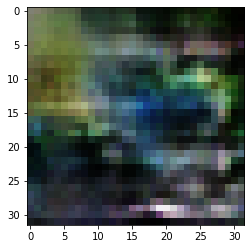

-> Epoch 43, Batch numero 1/78 -> Disc. loss on real images: 0.64249, Disc. loss on fake images: 0.59018, Generator loss: 1.16615
-> Epoch 43, Batch numero 2/78 -> Disc. loss on real images: 0.64284, Disc. loss on fake images: 0.55814, Generator loss: 1.26818
-> Epoch 43, Batch numero 3/78 -> Disc. loss on real images: 0.68598, Disc. loss on fake images: 0.56221, Generator loss: 1.20653
-> Epoch 43, Batch numero 4/78 -> Disc. loss on real images: 0.63486, Disc. loss on fake images: 0.51990, Generator loss: 1.34107
-> Epoch 43, Batch numero 5/78 -> Disc. loss on real images: 0.51702, Disc. loss on fake images: 0.54195, Generator loss: 1.29398
-> Epoch 43, Batch numero 6/78 -> Disc. loss on real images: 0.68130, Disc. loss on fake images: 0.45300, Generator loss: 1.34115
-> Epoch 43, Batch numero 7/78 -> Disc. loss on real images: 0.57514, Disc. loss on fake images: 0.49599, Generator loss: 1.22185
-> Epoch 43, Batch numero 8/78 -> Disc. loss on real images: 0.49872, Disc. loss on fake i

-> Epoch 43, Batch numero 64/78 -> Disc. loss on real images: 0.52551, Disc. loss on fake images: 0.63703, Generator loss: 1.35589
-> Epoch 43, Batch numero 65/78 -> Disc. loss on real images: 0.65333, Disc. loss on fake images: 0.71477, Generator loss: 1.25036
-> Epoch 43, Batch numero 66/78 -> Disc. loss on real images: 0.57490, Disc. loss on fake images: 0.57606, Generator loss: 1.37640
-> Epoch 43, Batch numero 67/78 -> Disc. loss on real images: 0.61746, Disc. loss on fake images: 0.53142, Generator loss: 1.39013
-> Epoch 43, Batch numero 68/78 -> Disc. loss on real images: 0.59538, Disc. loss on fake images: 0.53178, Generator loss: 1.44384
-> Epoch 43, Batch numero 69/78 -> Disc. loss on real images: 0.56075, Disc. loss on fake images: 0.46331, Generator loss: 1.14133
-> Epoch 43, Batch numero 70/78 -> Disc. loss on real images: 0.60491, Disc. loss on fake images: 0.50912, Generator loss: 1.24877
-> Epoch 43, Batch numero 71/78 -> Disc. loss on real images: 0.58340, Disc. loss o

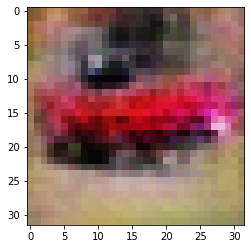

-> Epoch 44, Batch numero 1/78 -> Disc. loss on real images: 0.49352, Disc. loss on fake images: 0.44815, Generator loss: 1.18280
-> Epoch 44, Batch numero 2/78 -> Disc. loss on real images: 0.80955, Disc. loss on fake images: 0.58110, Generator loss: 1.17396
-> Epoch 44, Batch numero 3/78 -> Disc. loss on real images: 0.48884, Disc. loss on fake images: 0.49886, Generator loss: 1.15181
-> Epoch 44, Batch numero 4/78 -> Disc. loss on real images: 0.58567, Disc. loss on fake images: 0.57488, Generator loss: 1.33327
-> Epoch 44, Batch numero 5/78 -> Disc. loss on real images: 0.48311, Disc. loss on fake images: 0.53688, Generator loss: 1.12786
-> Epoch 44, Batch numero 6/78 -> Disc. loss on real images: 0.54368, Disc. loss on fake images: 0.62129, Generator loss: 1.17005
-> Epoch 44, Batch numero 7/78 -> Disc. loss on real images: 0.50536, Disc. loss on fake images: 0.42987, Generator loss: 1.25651
-> Epoch 44, Batch numero 8/78 -> Disc. loss on real images: 0.63292, Disc. loss on fake i

-> Epoch 44, Batch numero 64/78 -> Disc. loss on real images: 0.58403, Disc. loss on fake images: 0.49658, Generator loss: 1.28956
-> Epoch 44, Batch numero 65/78 -> Disc. loss on real images: 0.55035, Disc. loss on fake images: 0.50898, Generator loss: 1.13848
-> Epoch 44, Batch numero 66/78 -> Disc. loss on real images: 0.60311, Disc. loss on fake images: 0.64253, Generator loss: 1.24804
-> Epoch 44, Batch numero 67/78 -> Disc. loss on real images: 0.54239, Disc. loss on fake images: 0.53681, Generator loss: 1.41452
-> Epoch 44, Batch numero 68/78 -> Disc. loss on real images: 0.67643, Disc. loss on fake images: 0.62540, Generator loss: 1.40724
-> Epoch 44, Batch numero 69/78 -> Disc. loss on real images: 0.69599, Disc. loss on fake images: 0.45365, Generator loss: 1.32305
-> Epoch 44, Batch numero 70/78 -> Disc. loss on real images: 0.62709, Disc. loss on fake images: 0.45153, Generator loss: 1.37971
-> Epoch 44, Batch numero 71/78 -> Disc. loss on real images: 0.48017, Disc. loss o

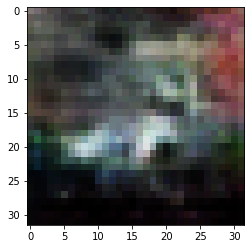

-> Epoch 45, Batch numero 1/78 -> Disc. loss on real images: 0.49275, Disc. loss on fake images: 0.53318, Generator loss: 1.06397
-> Epoch 45, Batch numero 2/78 -> Disc. loss on real images: 0.49505, Disc. loss on fake images: 0.75718, Generator loss: 1.30695
-> Epoch 45, Batch numero 3/78 -> Disc. loss on real images: 0.60399, Disc. loss on fake images: 0.58240, Generator loss: 1.19326
-> Epoch 45, Batch numero 4/78 -> Disc. loss on real images: 0.62649, Disc. loss on fake images: 0.66191, Generator loss: 1.17302
-> Epoch 45, Batch numero 5/78 -> Disc. loss on real images: 0.66899, Disc. loss on fake images: 0.74728, Generator loss: 1.26495
-> Epoch 45, Batch numero 6/78 -> Disc. loss on real images: 0.58071, Disc. loss on fake images: 0.65988, Generator loss: 1.21118
-> Epoch 45, Batch numero 7/78 -> Disc. loss on real images: 0.70792, Disc. loss on fake images: 0.45302, Generator loss: 1.27798
-> Epoch 45, Batch numero 8/78 -> Disc. loss on real images: 0.61737, Disc. loss on fake i

-> Epoch 45, Batch numero 64/78 -> Disc. loss on real images: 0.53477, Disc. loss on fake images: 0.58605, Generator loss: 1.27485
-> Epoch 45, Batch numero 65/78 -> Disc. loss on real images: 0.35439, Disc. loss on fake images: 0.50692, Generator loss: 1.23352
-> Epoch 45, Batch numero 66/78 -> Disc. loss on real images: 0.58203, Disc. loss on fake images: 0.75629, Generator loss: 1.33175
-> Epoch 45, Batch numero 67/78 -> Disc. loss on real images: 0.60481, Disc. loss on fake images: 0.62608, Generator loss: 1.25407
-> Epoch 45, Batch numero 68/78 -> Disc. loss on real images: 0.53389, Disc. loss on fake images: 0.46863, Generator loss: 1.32810
-> Epoch 45, Batch numero 69/78 -> Disc. loss on real images: 0.68929, Disc. loss on fake images: 0.51818, Generator loss: 1.23209
-> Epoch 45, Batch numero 70/78 -> Disc. loss on real images: 0.71224, Disc. loss on fake images: 0.51214, Generator loss: 1.05192
-> Epoch 45, Batch numero 71/78 -> Disc. loss on real images: 0.67671, Disc. loss o

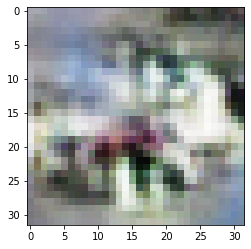

-> Epoch 46, Batch numero 1/78 -> Disc. loss on real images: 0.37632, Disc. loss on fake images: 0.55844, Generator loss: 1.35467
-> Epoch 46, Batch numero 2/78 -> Disc. loss on real images: 0.57623, Disc. loss on fake images: 0.54399, Generator loss: 1.20614
-> Epoch 46, Batch numero 3/78 -> Disc. loss on real images: 0.65931, Disc. loss on fake images: 0.61874, Generator loss: 1.35278
-> Epoch 46, Batch numero 4/78 -> Disc. loss on real images: 0.51650, Disc. loss on fake images: 0.50052, Generator loss: 1.35023
-> Epoch 46, Batch numero 5/78 -> Disc. loss on real images: 0.56776, Disc. loss on fake images: 0.55423, Generator loss: 1.28142
-> Epoch 46, Batch numero 6/78 -> Disc. loss on real images: 0.57921, Disc. loss on fake images: 0.58311, Generator loss: 1.26529
-> Epoch 46, Batch numero 7/78 -> Disc. loss on real images: 0.47607, Disc. loss on fake images: 0.59797, Generator loss: 1.26473
-> Epoch 46, Batch numero 8/78 -> Disc. loss on real images: 0.66284, Disc. loss on fake i

-> Epoch 46, Batch numero 64/78 -> Disc. loss on real images: 0.61843, Disc. loss on fake images: 0.62090, Generator loss: 1.42495
-> Epoch 46, Batch numero 65/78 -> Disc. loss on real images: 0.64422, Disc. loss on fake images: 0.44663, Generator loss: 1.50628
-> Epoch 46, Batch numero 66/78 -> Disc. loss on real images: 0.57076, Disc. loss on fake images: 0.39800, Generator loss: 1.33603
-> Epoch 46, Batch numero 67/78 -> Disc. loss on real images: 0.50887, Disc. loss on fake images: 0.50046, Generator loss: 1.34530
-> Epoch 46, Batch numero 68/78 -> Disc. loss on real images: 0.50696, Disc. loss on fake images: 0.56360, Generator loss: 1.39603
-> Epoch 46, Batch numero 69/78 -> Disc. loss on real images: 0.53925, Disc. loss on fake images: 0.47401, Generator loss: 1.52566
-> Epoch 46, Batch numero 70/78 -> Disc. loss on real images: 0.55603, Disc. loss on fake images: 0.43905, Generator loss: 1.34198
-> Epoch 46, Batch numero 71/78 -> Disc. loss on real images: 0.50544, Disc. loss o

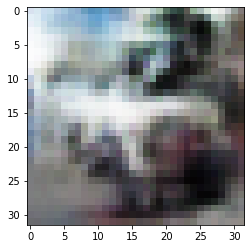

-> Epoch 47, Batch numero 1/78 -> Disc. loss on real images: 0.52629, Disc. loss on fake images: 0.56354, Generator loss: 1.28803
-> Epoch 47, Batch numero 2/78 -> Disc. loss on real images: 0.54598, Disc. loss on fake images: 0.55956, Generator loss: 1.43022
-> Epoch 47, Batch numero 3/78 -> Disc. loss on real images: 0.72161, Disc. loss on fake images: 0.56120, Generator loss: 1.22776
-> Epoch 47, Batch numero 4/78 -> Disc. loss on real images: 0.52571, Disc. loss on fake images: 0.68545, Generator loss: 1.30319
-> Epoch 47, Batch numero 5/78 -> Disc. loss on real images: 0.58753, Disc. loss on fake images: 0.71854, Generator loss: 1.30961
-> Epoch 47, Batch numero 6/78 -> Disc. loss on real images: 0.54609, Disc. loss on fake images: 0.45120, Generator loss: 1.40443
-> Epoch 47, Batch numero 7/78 -> Disc. loss on real images: 0.68305, Disc. loss on fake images: 0.46479, Generator loss: 1.27730
-> Epoch 47, Batch numero 8/78 -> Disc. loss on real images: 0.64816, Disc. loss on fake i

-> Epoch 47, Batch numero 64/78 -> Disc. loss on real images: 0.49096, Disc. loss on fake images: 0.48360, Generator loss: 1.29752
-> Epoch 47, Batch numero 65/78 -> Disc. loss on real images: 0.47572, Disc. loss on fake images: 0.63034, Generator loss: 1.32312
-> Epoch 47, Batch numero 66/78 -> Disc. loss on real images: 0.58822, Disc. loss on fake images: 0.56915, Generator loss: 1.34899
-> Epoch 47, Batch numero 67/78 -> Disc. loss on real images: 0.71002, Disc. loss on fake images: 0.43422, Generator loss: 1.29828
-> Epoch 47, Batch numero 68/78 -> Disc. loss on real images: 0.49846, Disc. loss on fake images: 0.45788, Generator loss: 1.31521
-> Epoch 47, Batch numero 69/78 -> Disc. loss on real images: 0.37388, Disc. loss on fake images: 0.50917, Generator loss: 1.42097
-> Epoch 47, Batch numero 70/78 -> Disc. loss on real images: 0.57261, Disc. loss on fake images: 0.37264, Generator loss: 1.43797
-> Epoch 47, Batch numero 71/78 -> Disc. loss on real images: 0.57178, Disc. loss o

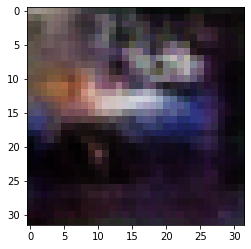

-> Epoch 48, Batch numero 1/78 -> Disc. loss on real images: 0.72550, Disc. loss on fake images: 0.51256, Generator loss: 1.28573
-> Epoch 48, Batch numero 2/78 -> Disc. loss on real images: 0.68708, Disc. loss on fake images: 0.65147, Generator loss: 1.45127
-> Epoch 48, Batch numero 3/78 -> Disc. loss on real images: 0.61175, Disc. loss on fake images: 0.43927, Generator loss: 1.39197
-> Epoch 48, Batch numero 4/78 -> Disc. loss on real images: 0.72861, Disc. loss on fake images: 0.60652, Generator loss: 1.29278
-> Epoch 48, Batch numero 5/78 -> Disc. loss on real images: 0.83382, Disc. loss on fake images: 0.60834, Generator loss: 1.33095
-> Epoch 48, Batch numero 6/78 -> Disc. loss on real images: 0.66761, Disc. loss on fake images: 0.58739, Generator loss: 1.26060
-> Epoch 48, Batch numero 7/78 -> Disc. loss on real images: 0.75148, Disc. loss on fake images: 0.61334, Generator loss: 1.42531
-> Epoch 48, Batch numero 8/78 -> Disc. loss on real images: 0.47484, Disc. loss on fake i

-> Epoch 48, Batch numero 64/78 -> Disc. loss on real images: 0.63574, Disc. loss on fake images: 0.44973, Generator loss: 1.25816
-> Epoch 48, Batch numero 65/78 -> Disc. loss on real images: 0.62247, Disc. loss on fake images: 0.51234, Generator loss: 1.20328
-> Epoch 48, Batch numero 66/78 -> Disc. loss on real images: 0.52672, Disc. loss on fake images: 0.63462, Generator loss: 1.25306
-> Epoch 48, Batch numero 67/78 -> Disc. loss on real images: 0.41255, Disc. loss on fake images: 0.40772, Generator loss: 1.32552
-> Epoch 48, Batch numero 68/78 -> Disc. loss on real images: 0.64445, Disc. loss on fake images: 0.50330, Generator loss: 1.22860
-> Epoch 48, Batch numero 69/78 -> Disc. loss on real images: 0.63610, Disc. loss on fake images: 0.54406, Generator loss: 1.11858
-> Epoch 48, Batch numero 70/78 -> Disc. loss on real images: 0.56933, Disc. loss on fake images: 0.89482, Generator loss: 1.27553
-> Epoch 48, Batch numero 71/78 -> Disc. loss on real images: 0.54335, Disc. loss o

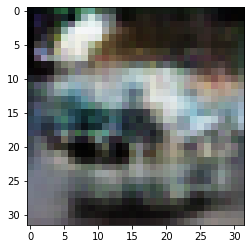

-> Epoch 49, Batch numero 1/78 -> Disc. loss on real images: 0.65591, Disc. loss on fake images: 0.61545, Generator loss: 1.34795
-> Epoch 49, Batch numero 2/78 -> Disc. loss on real images: 0.60530, Disc. loss on fake images: 0.58202, Generator loss: 1.30541
-> Epoch 49, Batch numero 3/78 -> Disc. loss on real images: 0.62745, Disc. loss on fake images: 0.51264, Generator loss: 1.41261
-> Epoch 49, Batch numero 4/78 -> Disc. loss on real images: 0.68559, Disc. loss on fake images: 0.43099, Generator loss: 1.26634
-> Epoch 49, Batch numero 5/78 -> Disc. loss on real images: 0.64251, Disc. loss on fake images: 0.60089, Generator loss: 1.38074
-> Epoch 49, Batch numero 6/78 -> Disc. loss on real images: 0.50303, Disc. loss on fake images: 0.50400, Generator loss: 1.29985
-> Epoch 49, Batch numero 7/78 -> Disc. loss on real images: 0.57210, Disc. loss on fake images: 0.62342, Generator loss: 1.25331
-> Epoch 49, Batch numero 8/78 -> Disc. loss on real images: 0.59089, Disc. loss on fake i

-> Epoch 49, Batch numero 64/78 -> Disc. loss on real images: 0.70242, Disc. loss on fake images: 0.48509, Generator loss: 1.22235
-> Epoch 49, Batch numero 65/78 -> Disc. loss on real images: 0.54645, Disc. loss on fake images: 0.60679, Generator loss: 1.38480
-> Epoch 49, Batch numero 66/78 -> Disc. loss on real images: 0.68442, Disc. loss on fake images: 0.56908, Generator loss: 1.16189
-> Epoch 49, Batch numero 67/78 -> Disc. loss on real images: 0.45135, Disc. loss on fake images: 0.53303, Generator loss: 1.15280
-> Epoch 49, Batch numero 68/78 -> Disc. loss on real images: 0.45359, Disc. loss on fake images: 0.57055, Generator loss: 1.29990
-> Epoch 49, Batch numero 69/78 -> Disc. loss on real images: 0.59132, Disc. loss on fake images: 0.50888, Generator loss: 1.26664
-> Epoch 49, Batch numero 70/78 -> Disc. loss on real images: 0.63452, Disc. loss on fake images: 0.51092, Generator loss: 1.26040
-> Epoch 49, Batch numero 71/78 -> Disc. loss on real images: 0.45222, Disc. loss o

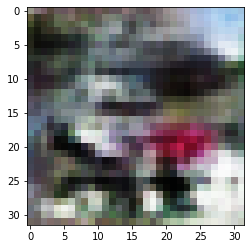

-> Epoch 50, Batch numero 1/78 -> Disc. loss on real images: 0.48558, Disc. loss on fake images: 0.40921, Generator loss: 1.47693
-> Epoch 50, Batch numero 2/78 -> Disc. loss on real images: 0.63635, Disc. loss on fake images: 0.54869, Generator loss: 1.42603
-> Epoch 50, Batch numero 3/78 -> Disc. loss on real images: 0.53855, Disc. loss on fake images: 0.58704, Generator loss: 1.42184
-> Epoch 50, Batch numero 4/78 -> Disc. loss on real images: 0.46600, Disc. loss on fake images: 0.41420, Generator loss: 1.52717
-> Epoch 50, Batch numero 5/78 -> Disc. loss on real images: 0.56067, Disc. loss on fake images: 0.45563, Generator loss: 1.36898
-> Epoch 50, Batch numero 6/78 -> Disc. loss on real images: 0.42659, Disc. loss on fake images: 0.55947, Generator loss: 1.52473
-> Epoch 50, Batch numero 7/78 -> Disc. loss on real images: 0.45380, Disc. loss on fake images: 0.40016, Generator loss: 1.64460
-> Epoch 50, Batch numero 8/78 -> Disc. loss on real images: 0.56310, Disc. loss on fake i

-> Epoch 50, Batch numero 64/78 -> Disc. loss on real images: 0.59110, Disc. loss on fake images: 0.40677, Generator loss: 1.23104
-> Epoch 50, Batch numero 65/78 -> Disc. loss on real images: 0.48889, Disc. loss on fake images: 0.49663, Generator loss: 1.36472
-> Epoch 50, Batch numero 66/78 -> Disc. loss on real images: 0.50810, Disc. loss on fake images: 0.55367, Generator loss: 1.34840
-> Epoch 50, Batch numero 67/78 -> Disc. loss on real images: 0.54425, Disc. loss on fake images: 0.60567, Generator loss: 1.38113
-> Epoch 50, Batch numero 68/78 -> Disc. loss on real images: 0.66172, Disc. loss on fake images: 0.52573, Generator loss: 1.19545
-> Epoch 50, Batch numero 69/78 -> Disc. loss on real images: 0.56006, Disc. loss on fake images: 0.61446, Generator loss: 1.26507
-> Epoch 50, Batch numero 70/78 -> Disc. loss on real images: 0.59884, Disc. loss on fake images: 0.58919, Generator loss: 1.27618
-> Epoch 50, Batch numero 71/78 -> Disc. loss on real images: 0.44744, Disc. loss o

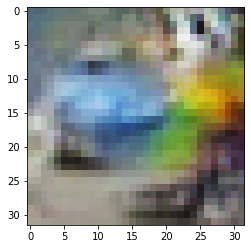

-> Epoch 51, Batch numero 1/78 -> Disc. loss on real images: 0.55205, Disc. loss on fake images: 0.58686, Generator loss: 1.27542
-> Epoch 51, Batch numero 2/78 -> Disc. loss on real images: 0.64286, Disc. loss on fake images: 0.51018, Generator loss: 1.33724
-> Epoch 51, Batch numero 3/78 -> Disc. loss on real images: 0.53014, Disc. loss on fake images: 0.44801, Generator loss: 1.22411
-> Epoch 51, Batch numero 4/78 -> Disc. loss on real images: 0.58053, Disc. loss on fake images: 0.61818, Generator loss: 1.24655
-> Epoch 51, Batch numero 5/78 -> Disc. loss on real images: 0.54430, Disc. loss on fake images: 0.66845, Generator loss: 1.29327
-> Epoch 51, Batch numero 6/78 -> Disc. loss on real images: 0.65134, Disc. loss on fake images: 0.46067, Generator loss: 1.46790
-> Epoch 51, Batch numero 7/78 -> Disc. loss on real images: 0.64815, Disc. loss on fake images: 0.55059, Generator loss: 1.33859
-> Epoch 51, Batch numero 8/78 -> Disc. loss on real images: 0.65750, Disc. loss on fake i

-> Epoch 51, Batch numero 64/78 -> Disc. loss on real images: 0.53021, Disc. loss on fake images: 0.55343, Generator loss: 1.34832
-> Epoch 51, Batch numero 65/78 -> Disc. loss on real images: 0.77586, Disc. loss on fake images: 0.51024, Generator loss: 1.14338
-> Epoch 51, Batch numero 66/78 -> Disc. loss on real images: 0.48156, Disc. loss on fake images: 0.61298, Generator loss: 1.36194
-> Epoch 51, Batch numero 67/78 -> Disc. loss on real images: 0.49245, Disc. loss on fake images: 0.48710, Generator loss: 1.39481
-> Epoch 51, Batch numero 68/78 -> Disc. loss on real images: 0.48528, Disc. loss on fake images: 0.45851, Generator loss: 1.29833
-> Epoch 51, Batch numero 69/78 -> Disc. loss on real images: 0.53039, Disc. loss on fake images: 0.55870, Generator loss: 1.25663
-> Epoch 51, Batch numero 70/78 -> Disc. loss on real images: 0.51685, Disc. loss on fake images: 0.49189, Generator loss: 1.28231
-> Epoch 51, Batch numero 71/78 -> Disc. loss on real images: 0.49807, Disc. loss o

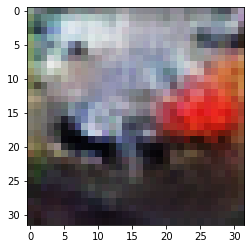

-> Epoch 52, Batch numero 1/78 -> Disc. loss on real images: 0.53254, Disc. loss on fake images: 0.48661, Generator loss: 1.25623
-> Epoch 52, Batch numero 2/78 -> Disc. loss on real images: 0.58314, Disc. loss on fake images: 0.51374, Generator loss: 1.24992
-> Epoch 52, Batch numero 3/78 -> Disc. loss on real images: 0.48655, Disc. loss on fake images: 0.44235, Generator loss: 1.16892
-> Epoch 52, Batch numero 4/78 -> Disc. loss on real images: 0.49089, Disc. loss on fake images: 0.48561, Generator loss: 1.28107
-> Epoch 52, Batch numero 5/78 -> Disc. loss on real images: 0.46328, Disc. loss on fake images: 0.53890, Generator loss: 1.47275
-> Epoch 52, Batch numero 6/78 -> Disc. loss on real images: 0.53950, Disc. loss on fake images: 0.47751, Generator loss: 1.27936
-> Epoch 52, Batch numero 7/78 -> Disc. loss on real images: 0.43706, Disc. loss on fake images: 0.45215, Generator loss: 1.19847
-> Epoch 52, Batch numero 8/78 -> Disc. loss on real images: 0.49522, Disc. loss on fake i

-> Epoch 52, Batch numero 64/78 -> Disc. loss on real images: 0.57125, Disc. loss on fake images: 0.57239, Generator loss: 1.50698
-> Epoch 52, Batch numero 65/78 -> Disc. loss on real images: 0.51610, Disc. loss on fake images: 0.37786, Generator loss: 1.50971
-> Epoch 52, Batch numero 66/78 -> Disc. loss on real images: 0.55830, Disc. loss on fake images: 0.45531, Generator loss: 1.32979
-> Epoch 52, Batch numero 67/78 -> Disc. loss on real images: 0.57988, Disc. loss on fake images: 0.62537, Generator loss: 1.32530
-> Epoch 52, Batch numero 68/78 -> Disc. loss on real images: 0.42911, Disc. loss on fake images: 0.51720, Generator loss: 1.30194
-> Epoch 52, Batch numero 69/78 -> Disc. loss on real images: 0.49268, Disc. loss on fake images: 0.52355, Generator loss: 1.42821
-> Epoch 52, Batch numero 70/78 -> Disc. loss on real images: 0.66021, Disc. loss on fake images: 0.55750, Generator loss: 1.34576
-> Epoch 52, Batch numero 71/78 -> Disc. loss on real images: 0.68595, Disc. loss o

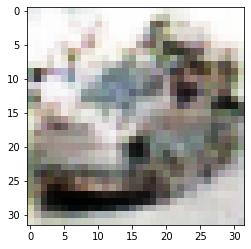

-> Epoch 53, Batch numero 1/78 -> Disc. loss on real images: 0.46317, Disc. loss on fake images: 0.52879, Generator loss: 1.30037
-> Epoch 53, Batch numero 2/78 -> Disc. loss on real images: 0.52922, Disc. loss on fake images: 0.47691, Generator loss: 1.37827
-> Epoch 53, Batch numero 3/78 -> Disc. loss on real images: 0.51348, Disc. loss on fake images: 0.60393, Generator loss: 1.43032
-> Epoch 53, Batch numero 4/78 -> Disc. loss on real images: 0.50681, Disc. loss on fake images: 0.54406, Generator loss: 1.41943
-> Epoch 53, Batch numero 5/78 -> Disc. loss on real images: 0.49015, Disc. loss on fake images: 0.63532, Generator loss: 1.51503
-> Epoch 53, Batch numero 6/78 -> Disc. loss on real images: 0.60367, Disc. loss on fake images: 0.48311, Generator loss: 1.45480
-> Epoch 53, Batch numero 7/78 -> Disc. loss on real images: 0.58371, Disc. loss on fake images: 0.46548, Generator loss: 1.39221
-> Epoch 53, Batch numero 8/78 -> Disc. loss on real images: 0.63319, Disc. loss on fake i

-> Epoch 53, Batch numero 64/78 -> Disc. loss on real images: 0.45685, Disc. loss on fake images: 0.60802, Generator loss: 1.41531
-> Epoch 53, Batch numero 65/78 -> Disc. loss on real images: 0.50606, Disc. loss on fake images: 0.50191, Generator loss: 1.34920
-> Epoch 53, Batch numero 66/78 -> Disc. loss on real images: 0.56292, Disc. loss on fake images: 0.59421, Generator loss: 1.38818
-> Epoch 53, Batch numero 67/78 -> Disc. loss on real images: 0.54566, Disc. loss on fake images: 0.43860, Generator loss: 1.37919
-> Epoch 53, Batch numero 68/78 -> Disc. loss on real images: 0.58463, Disc. loss on fake images: 0.48198, Generator loss: 1.32354
-> Epoch 53, Batch numero 69/78 -> Disc. loss on real images: 0.35777, Disc. loss on fake images: 0.60756, Generator loss: 1.43742
-> Epoch 53, Batch numero 70/78 -> Disc. loss on real images: 0.59311, Disc. loss on fake images: 0.55167, Generator loss: 1.34849
-> Epoch 53, Batch numero 71/78 -> Disc. loss on real images: 0.48600, Disc. loss o

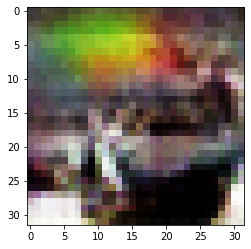

-> Epoch 54, Batch numero 1/78 -> Disc. loss on real images: 0.80003, Disc. loss on fake images: 0.53365, Generator loss: 1.30081
-> Epoch 54, Batch numero 2/78 -> Disc. loss on real images: 0.62158, Disc. loss on fake images: 0.62863, Generator loss: 1.32606
-> Epoch 54, Batch numero 3/78 -> Disc. loss on real images: 0.48316, Disc. loss on fake images: 0.54016, Generator loss: 1.24541
-> Epoch 54, Batch numero 4/78 -> Disc. loss on real images: 0.49970, Disc. loss on fake images: 0.50709, Generator loss: 1.28466
-> Epoch 54, Batch numero 5/78 -> Disc. loss on real images: 0.59193, Disc. loss on fake images: 0.56082, Generator loss: 1.36728
-> Epoch 54, Batch numero 6/78 -> Disc. loss on real images: 0.51041, Disc. loss on fake images: 0.50728, Generator loss: 1.20639
-> Epoch 54, Batch numero 7/78 -> Disc. loss on real images: 0.71157, Disc. loss on fake images: 0.79965, Generator loss: 1.26278
-> Epoch 54, Batch numero 8/78 -> Disc. loss on real images: 0.59790, Disc. loss on fake i

-> Epoch 54, Batch numero 64/78 -> Disc. loss on real images: 0.59136, Disc. loss on fake images: 0.49000, Generator loss: 1.20925
-> Epoch 54, Batch numero 65/78 -> Disc. loss on real images: 0.51824, Disc. loss on fake images: 0.52424, Generator loss: 1.35624
-> Epoch 54, Batch numero 66/78 -> Disc. loss on real images: 0.61115, Disc. loss on fake images: 0.51966, Generator loss: 1.44715
-> Epoch 54, Batch numero 67/78 -> Disc. loss on real images: 0.65532, Disc. loss on fake images: 0.56410, Generator loss: 1.47998
-> Epoch 54, Batch numero 68/78 -> Disc. loss on real images: 0.49773, Disc. loss on fake images: 0.56555, Generator loss: 1.30610
-> Epoch 54, Batch numero 69/78 -> Disc. loss on real images: 0.56777, Disc. loss on fake images: 0.48712, Generator loss: 1.16322
-> Epoch 54, Batch numero 70/78 -> Disc. loss on real images: 0.45006, Disc. loss on fake images: 0.65302, Generator loss: 1.32272
-> Epoch 54, Batch numero 71/78 -> Disc. loss on real images: 0.58499, Disc. loss o

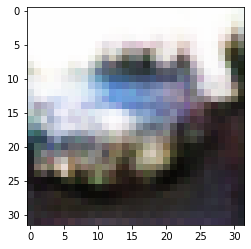

-> Epoch 55, Batch numero 1/78 -> Disc. loss on real images: 0.40610, Disc. loss on fake images: 0.50068, Generator loss: 1.51453
-> Epoch 55, Batch numero 2/78 -> Disc. loss on real images: 0.55869, Disc. loss on fake images: 0.41613, Generator loss: 1.40674
-> Epoch 55, Batch numero 3/78 -> Disc. loss on real images: 0.50531, Disc. loss on fake images: 0.54232, Generator loss: 1.12203
-> Epoch 55, Batch numero 4/78 -> Disc. loss on real images: 0.60340, Disc. loss on fake images: 0.58804, Generator loss: 1.34266
-> Epoch 55, Batch numero 5/78 -> Disc. loss on real images: 0.64712, Disc. loss on fake images: 0.62914, Generator loss: 1.26219
-> Epoch 55, Batch numero 6/78 -> Disc. loss on real images: 0.51589, Disc. loss on fake images: 0.46187, Generator loss: 1.28702
-> Epoch 55, Batch numero 7/78 -> Disc. loss on real images: 0.67681, Disc. loss on fake images: 0.54269, Generator loss: 1.10655
-> Epoch 55, Batch numero 8/78 -> Disc. loss on real images: 0.42461, Disc. loss on fake i

-> Epoch 55, Batch numero 65/78 -> Disc. loss on real images: 0.51172, Disc. loss on fake images: 0.45312, Generator loss: 1.32079
-> Epoch 55, Batch numero 66/78 -> Disc. loss on real images: 0.39545, Disc. loss on fake images: 0.61605, Generator loss: 1.16630
-> Epoch 55, Batch numero 67/78 -> Disc. loss on real images: 0.62205, Disc. loss on fake images: 0.64830, Generator loss: 1.14191
-> Epoch 55, Batch numero 68/78 -> Disc. loss on real images: 0.59905, Disc. loss on fake images: 0.53451, Generator loss: 1.18648
-> Epoch 55, Batch numero 69/78 -> Disc. loss on real images: 0.53076, Disc. loss on fake images: 0.61969, Generator loss: 1.11394
-> Epoch 55, Batch numero 70/78 -> Disc. loss on real images: 0.60635, Disc. loss on fake images: 0.54068, Generator loss: 1.16595
-> Epoch 55, Batch numero 71/78 -> Disc. loss on real images: 0.57997, Disc. loss on fake images: 0.63540, Generator loss: 1.05132
-> Epoch 55, Batch numero 72/78 -> Disc. loss on real images: 0.48636, Disc. loss o

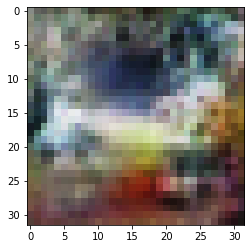

-> Epoch 56, Batch numero 1/78 -> Disc. loss on real images: 0.65507, Disc. loss on fake images: 0.48166, Generator loss: 1.27263
-> Epoch 56, Batch numero 2/78 -> Disc. loss on real images: 0.49213, Disc. loss on fake images: 0.50143, Generator loss: 1.24393
-> Epoch 56, Batch numero 3/78 -> Disc. loss on real images: 0.61844, Disc. loss on fake images: 0.57547, Generator loss: 1.21467
-> Epoch 56, Batch numero 4/78 -> Disc. loss on real images: 0.51451, Disc. loss on fake images: 0.48547, Generator loss: 1.29065
-> Epoch 56, Batch numero 5/78 -> Disc. loss on real images: 0.48599, Disc. loss on fake images: 0.55401, Generator loss: 1.26124
-> Epoch 56, Batch numero 6/78 -> Disc. loss on real images: 0.52503, Disc. loss on fake images: 0.44549, Generator loss: 1.37194
-> Epoch 56, Batch numero 7/78 -> Disc. loss on real images: 0.56031, Disc. loss on fake images: 0.51297, Generator loss: 1.32890
-> Epoch 56, Batch numero 8/78 -> Disc. loss on real images: 0.63466, Disc. loss on fake i

-> Epoch 56, Batch numero 65/78 -> Disc. loss on real images: 0.60021, Disc. loss on fake images: 0.38017, Generator loss: 1.37720
-> Epoch 56, Batch numero 66/78 -> Disc. loss on real images: 0.51032, Disc. loss on fake images: 0.35392, Generator loss: 1.30716
-> Epoch 56, Batch numero 67/78 -> Disc. loss on real images: 0.32492, Disc. loss on fake images: 0.47745, Generator loss: 1.37812
-> Epoch 56, Batch numero 68/78 -> Disc. loss on real images: 0.39795, Disc. loss on fake images: 0.51493, Generator loss: 1.47580
-> Epoch 56, Batch numero 69/78 -> Disc. loss on real images: 0.42172, Disc. loss on fake images: 0.55990, Generator loss: 1.42213
-> Epoch 56, Batch numero 70/78 -> Disc. loss on real images: 0.57257, Disc. loss on fake images: 0.51090, Generator loss: 1.04924
-> Epoch 56, Batch numero 71/78 -> Disc. loss on real images: 0.44668, Disc. loss on fake images: 0.68705, Generator loss: 1.32264
-> Epoch 56, Batch numero 72/78 -> Disc. loss on real images: 0.65808, Disc. loss o

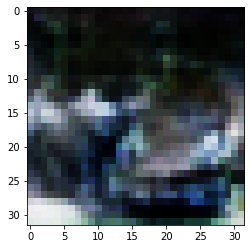

-> Epoch 57, Batch numero 1/78 -> Disc. loss on real images: 0.61251, Disc. loss on fake images: 0.57818, Generator loss: 1.33786
-> Epoch 57, Batch numero 2/78 -> Disc. loss on real images: 0.68384, Disc. loss on fake images: 0.47781, Generator loss: 1.50473
-> Epoch 57, Batch numero 3/78 -> Disc. loss on real images: 0.60511, Disc. loss on fake images: 0.51136, Generator loss: 1.55904
-> Epoch 57, Batch numero 4/78 -> Disc. loss on real images: 0.61181, Disc. loss on fake images: 0.35220, Generator loss: 1.49552
-> Epoch 57, Batch numero 5/78 -> Disc. loss on real images: 0.61228, Disc. loss on fake images: 0.42344, Generator loss: 1.25520
-> Epoch 57, Batch numero 6/78 -> Disc. loss on real images: 0.51063, Disc. loss on fake images: 0.60696, Generator loss: 1.15999
-> Epoch 57, Batch numero 7/78 -> Disc. loss on real images: 0.36825, Disc. loss on fake images: 0.59957, Generator loss: 1.41832
-> Epoch 57, Batch numero 8/78 -> Disc. loss on real images: 0.63600, Disc. loss on fake i

-> Epoch 57, Batch numero 65/78 -> Disc. loss on real images: 0.62415, Disc. loss on fake images: 0.67790, Generator loss: 1.35138
-> Epoch 57, Batch numero 66/78 -> Disc. loss on real images: 0.59166, Disc. loss on fake images: 0.49469, Generator loss: 1.34589
-> Epoch 57, Batch numero 67/78 -> Disc. loss on real images: 0.53715, Disc. loss on fake images: 0.50317, Generator loss: 1.19848
-> Epoch 57, Batch numero 68/78 -> Disc. loss on real images: 0.51997, Disc. loss on fake images: 0.48689, Generator loss: 1.35586
-> Epoch 57, Batch numero 69/78 -> Disc. loss on real images: 0.54835, Disc. loss on fake images: 0.59648, Generator loss: 1.25866
-> Epoch 57, Batch numero 70/78 -> Disc. loss on real images: 0.60147, Disc. loss on fake images: 0.50278, Generator loss: 1.17417
-> Epoch 57, Batch numero 71/78 -> Disc. loss on real images: 0.49600, Disc. loss on fake images: 0.56330, Generator loss: 1.18527
-> Epoch 57, Batch numero 72/78 -> Disc. loss on real images: 0.56689, Disc. loss o

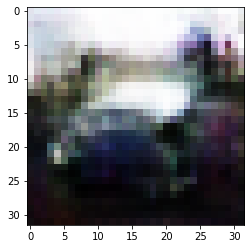

-> Epoch 58, Batch numero 1/78 -> Disc. loss on real images: 0.53877, Disc. loss on fake images: 0.59585, Generator loss: 1.45870
-> Epoch 58, Batch numero 2/78 -> Disc. loss on real images: 0.59499, Disc. loss on fake images: 0.53966, Generator loss: 1.28637
-> Epoch 58, Batch numero 3/78 -> Disc. loss on real images: 0.55071, Disc. loss on fake images: 0.68388, Generator loss: 1.10680
-> Epoch 58, Batch numero 4/78 -> Disc. loss on real images: 0.67838, Disc. loss on fake images: 0.63394, Generator loss: 1.32821
-> Epoch 58, Batch numero 5/78 -> Disc. loss on real images: 0.57670, Disc. loss on fake images: 0.56973, Generator loss: 1.45687
-> Epoch 58, Batch numero 6/78 -> Disc. loss on real images: 0.58306, Disc. loss on fake images: 0.43699, Generator loss: 1.51408
-> Epoch 58, Batch numero 7/78 -> Disc. loss on real images: 0.61272, Disc. loss on fake images: 0.38770, Generator loss: 1.34622
-> Epoch 58, Batch numero 8/78 -> Disc. loss on real images: 0.59227, Disc. loss on fake i

-> Epoch 58, Batch numero 64/78 -> Disc. loss on real images: 0.62189, Disc. loss on fake images: 0.53493, Generator loss: 1.16568
-> Epoch 58, Batch numero 65/78 -> Disc. loss on real images: 0.49853, Disc. loss on fake images: 0.56844, Generator loss: 1.20877
-> Epoch 58, Batch numero 66/78 -> Disc. loss on real images: 0.52545, Disc. loss on fake images: 0.43782, Generator loss: 1.14666
-> Epoch 58, Batch numero 67/78 -> Disc. loss on real images: 0.46138, Disc. loss on fake images: 0.60792, Generator loss: 1.11259
-> Epoch 58, Batch numero 68/78 -> Disc. loss on real images: 0.60343, Disc. loss on fake images: 0.53233, Generator loss: 1.10505
-> Epoch 58, Batch numero 69/78 -> Disc. loss on real images: 0.56076, Disc. loss on fake images: 0.50326, Generator loss: 1.09448
-> Epoch 58, Batch numero 70/78 -> Disc. loss on real images: 0.61122, Disc. loss on fake images: 0.61092, Generator loss: 1.10401
-> Epoch 58, Batch numero 71/78 -> Disc. loss on real images: 0.64332, Disc. loss o

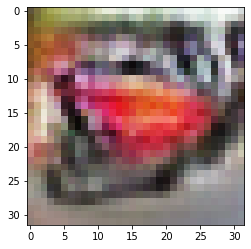

-> Epoch 59, Batch numero 1/78 -> Disc. loss on real images: 0.63285, Disc. loss on fake images: 0.60912, Generator loss: 1.31553
-> Epoch 59, Batch numero 2/78 -> Disc. loss on real images: 0.58632, Disc. loss on fake images: 0.42822, Generator loss: 1.21328
-> Epoch 59, Batch numero 3/78 -> Disc. loss on real images: 0.57089, Disc. loss on fake images: 0.57347, Generator loss: 1.19520
-> Epoch 59, Batch numero 4/78 -> Disc. loss on real images: 0.51379, Disc. loss on fake images: 0.53929, Generator loss: 1.22281
-> Epoch 59, Batch numero 5/78 -> Disc. loss on real images: 0.62409, Disc. loss on fake images: 0.57259, Generator loss: 1.22661
-> Epoch 59, Batch numero 6/78 -> Disc. loss on real images: 0.57073, Disc. loss on fake images: 0.61508, Generator loss: 1.25937
-> Epoch 59, Batch numero 7/78 -> Disc. loss on real images: 0.49457, Disc. loss on fake images: 0.50132, Generator loss: 1.28167
-> Epoch 59, Batch numero 8/78 -> Disc. loss on real images: 0.43388, Disc. loss on fake i

-> Epoch 59, Batch numero 65/78 -> Disc. loss on real images: 0.58183, Disc. loss on fake images: 0.69362, Generator loss: 1.37641
-> Epoch 59, Batch numero 66/78 -> Disc. loss on real images: 0.54488, Disc. loss on fake images: 0.46987, Generator loss: 1.23371
-> Epoch 59, Batch numero 67/78 -> Disc. loss on real images: 0.61377, Disc. loss on fake images: 0.64189, Generator loss: 1.14195
-> Epoch 59, Batch numero 68/78 -> Disc. loss on real images: 0.67688, Disc. loss on fake images: 0.54783, Generator loss: 1.18334
-> Epoch 59, Batch numero 69/78 -> Disc. loss on real images: 0.56801, Disc. loss on fake images: 0.60976, Generator loss: 1.24935
-> Epoch 59, Batch numero 70/78 -> Disc. loss on real images: 0.71110, Disc. loss on fake images: 0.53875, Generator loss: 1.35203
-> Epoch 59, Batch numero 71/78 -> Disc. loss on real images: 0.76624, Disc. loss on fake images: 0.59281, Generator loss: 1.28169
-> Epoch 59, Batch numero 72/78 -> Disc. loss on real images: 0.52790, Disc. loss o

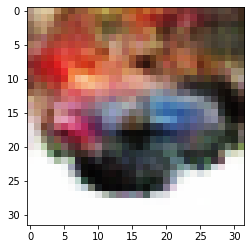

-> Epoch 60, Batch numero 1/78 -> Disc. loss on real images: 0.64914, Disc. loss on fake images: 0.64236, Generator loss: 1.37870
-> Epoch 60, Batch numero 2/78 -> Disc. loss on real images: 0.57123, Disc. loss on fake images: 0.58091, Generator loss: 1.46476
-> Epoch 60, Batch numero 3/78 -> Disc. loss on real images: 0.70414, Disc. loss on fake images: 0.62389, Generator loss: 1.35764
-> Epoch 60, Batch numero 4/78 -> Disc. loss on real images: 0.44484, Disc. loss on fake images: 0.55311, Generator loss: 1.29481
-> Epoch 60, Batch numero 5/78 -> Disc. loss on real images: 0.59220, Disc. loss on fake images: 0.53114, Generator loss: 1.08572
-> Epoch 60, Batch numero 6/78 -> Disc. loss on real images: 0.27397, Disc. loss on fake images: 0.58626, Generator loss: 1.13741
-> Epoch 60, Batch numero 7/78 -> Disc. loss on real images: 0.82085, Disc. loss on fake images: 0.57692, Generator loss: 1.36201
-> Epoch 60, Batch numero 8/78 -> Disc. loss on real images: 0.60651, Disc. loss on fake i

-> Epoch 60, Batch numero 64/78 -> Disc. loss on real images: 0.67281, Disc. loss on fake images: 0.57354, Generator loss: 1.21400
-> Epoch 60, Batch numero 65/78 -> Disc. loss on real images: 0.55476, Disc. loss on fake images: 0.52423, Generator loss: 1.26390
-> Epoch 60, Batch numero 66/78 -> Disc. loss on real images: 0.55476, Disc. loss on fake images: 0.65874, Generator loss: 1.45362
-> Epoch 60, Batch numero 67/78 -> Disc. loss on real images: 0.69301, Disc. loss on fake images: 0.43829, Generator loss: 1.38519
-> Epoch 60, Batch numero 68/78 -> Disc. loss on real images: 0.61330, Disc. loss on fake images: 0.44854, Generator loss: 1.25289
-> Epoch 60, Batch numero 69/78 -> Disc. loss on real images: 0.66442, Disc. loss on fake images: 0.54492, Generator loss: 1.08022
-> Epoch 60, Batch numero 70/78 -> Disc. loss on real images: 0.46750, Disc. loss on fake images: 0.64675, Generator loss: 1.21366
-> Epoch 60, Batch numero 71/78 -> Disc. loss on real images: 0.39721, Disc. loss o

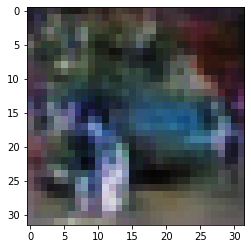

-> Epoch 61, Batch numero 1/78 -> Disc. loss on real images: 0.54720, Disc. loss on fake images: 0.45739, Generator loss: 1.17066
-> Epoch 61, Batch numero 2/78 -> Disc. loss on real images: 0.48459, Disc. loss on fake images: 0.50317, Generator loss: 1.24870
-> Epoch 61, Batch numero 3/78 -> Disc. loss on real images: 0.49678, Disc. loss on fake images: 0.55255, Generator loss: 1.26414
-> Epoch 61, Batch numero 4/78 -> Disc. loss on real images: 0.63928, Disc. loss on fake images: 0.52909, Generator loss: 1.15426
-> Epoch 61, Batch numero 5/78 -> Disc. loss on real images: 0.49452, Disc. loss on fake images: 0.65157, Generator loss: 1.18834
-> Epoch 61, Batch numero 6/78 -> Disc. loss on real images: 0.65121, Disc. loss on fake images: 0.54836, Generator loss: 1.25291
-> Epoch 61, Batch numero 7/78 -> Disc. loss on real images: 0.53037, Disc. loss on fake images: 0.72540, Generator loss: 1.29784
-> Epoch 61, Batch numero 8/78 -> Disc. loss on real images: 0.60439, Disc. loss on fake i

-> Epoch 61, Batch numero 64/78 -> Disc. loss on real images: 0.60276, Disc. loss on fake images: 0.54694, Generator loss: 1.37773
-> Epoch 61, Batch numero 65/78 -> Disc. loss on real images: 0.55111, Disc. loss on fake images: 0.53244, Generator loss: 1.33004
-> Epoch 61, Batch numero 66/78 -> Disc. loss on real images: 0.34219, Disc. loss on fake images: 0.49261, Generator loss: 1.40631
-> Epoch 61, Batch numero 67/78 -> Disc. loss on real images: 0.34914, Disc. loss on fake images: 0.52330, Generator loss: 1.38605
-> Epoch 61, Batch numero 68/78 -> Disc. loss on real images: 0.51184, Disc. loss on fake images: 0.63312, Generator loss: 1.25200
-> Epoch 61, Batch numero 69/78 -> Disc. loss on real images: 0.57110, Disc. loss on fake images: 0.68572, Generator loss: 1.30016
-> Epoch 61, Batch numero 70/78 -> Disc. loss on real images: 0.64288, Disc. loss on fake images: 0.47216, Generator loss: 1.28192
-> Epoch 61, Batch numero 71/78 -> Disc. loss on real images: 0.72412, Disc. loss o

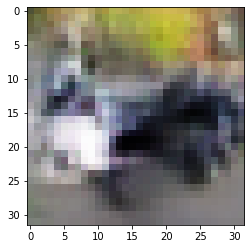

-> Epoch 62, Batch numero 1/78 -> Disc. loss on real images: 0.64665, Disc. loss on fake images: 0.50131, Generator loss: 1.16904
-> Epoch 62, Batch numero 2/78 -> Disc. loss on real images: 0.64509, Disc. loss on fake images: 0.65937, Generator loss: 1.40114
-> Epoch 62, Batch numero 3/78 -> Disc. loss on real images: 0.57727, Disc. loss on fake images: 0.47105, Generator loss: 1.35692
-> Epoch 62, Batch numero 4/78 -> Disc. loss on real images: 0.68209, Disc. loss on fake images: 0.47974, Generator loss: 1.29930
-> Epoch 62, Batch numero 5/78 -> Disc. loss on real images: 0.68774, Disc. loss on fake images: 0.52949, Generator loss: 1.25114
-> Epoch 62, Batch numero 6/78 -> Disc. loss on real images: 0.57102, Disc. loss on fake images: 0.66403, Generator loss: 1.35431
-> Epoch 62, Batch numero 7/78 -> Disc. loss on real images: 0.63538, Disc. loss on fake images: 0.64000, Generator loss: 1.18057
-> Epoch 62, Batch numero 8/78 -> Disc. loss on real images: 0.61881, Disc. loss on fake i

-> Epoch 62, Batch numero 64/78 -> Disc. loss on real images: 0.54800, Disc. loss on fake images: 0.57711, Generator loss: 1.43313
-> Epoch 62, Batch numero 65/78 -> Disc. loss on real images: 0.65524, Disc. loss on fake images: 0.48105, Generator loss: 1.47697
-> Epoch 62, Batch numero 66/78 -> Disc. loss on real images: 0.68488, Disc. loss on fake images: 0.47983, Generator loss: 1.24353
-> Epoch 62, Batch numero 67/78 -> Disc. loss on real images: 0.52957, Disc. loss on fake images: 0.42184, Generator loss: 1.31077
-> Epoch 62, Batch numero 68/78 -> Disc. loss on real images: 0.51186, Disc. loss on fake images: 0.54304, Generator loss: 1.13849
-> Epoch 62, Batch numero 69/78 -> Disc. loss on real images: 0.47955, Disc. loss on fake images: 0.51892, Generator loss: 1.18834
-> Epoch 62, Batch numero 70/78 -> Disc. loss on real images: 0.61773, Disc. loss on fake images: 0.65159, Generator loss: 1.19681
-> Epoch 62, Batch numero 71/78 -> Disc. loss on real images: 0.55787, Disc. loss o

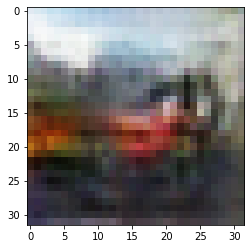

-> Epoch 63, Batch numero 1/78 -> Disc. loss on real images: 0.58143, Disc. loss on fake images: 0.58181, Generator loss: 1.24187
-> Epoch 63, Batch numero 2/78 -> Disc. loss on real images: 0.59681, Disc. loss on fake images: 0.54363, Generator loss: 1.15492
-> Epoch 63, Batch numero 3/78 -> Disc. loss on real images: 0.60178, Disc. loss on fake images: 0.58880, Generator loss: 1.04579
-> Epoch 63, Batch numero 4/78 -> Disc. loss on real images: 0.58989, Disc. loss on fake images: 0.57935, Generator loss: 1.25950
-> Epoch 63, Batch numero 5/78 -> Disc. loss on real images: 0.45292, Disc. loss on fake images: 0.49986, Generator loss: 1.31649
-> Epoch 63, Batch numero 6/78 -> Disc. loss on real images: 0.63958, Disc. loss on fake images: 0.56991, Generator loss: 1.29405
-> Epoch 63, Batch numero 7/78 -> Disc. loss on real images: 0.51355, Disc. loss on fake images: 0.50992, Generator loss: 1.27930
-> Epoch 63, Batch numero 8/78 -> Disc. loss on real images: 0.67137, Disc. loss on fake i

-> Epoch 63, Batch numero 64/78 -> Disc. loss on real images: 0.67252, Disc. loss on fake images: 0.58930, Generator loss: 1.27110
-> Epoch 63, Batch numero 65/78 -> Disc. loss on real images: 0.58123, Disc. loss on fake images: 0.65720, Generator loss: 1.09023
-> Epoch 63, Batch numero 66/78 -> Disc. loss on real images: 0.59358, Disc. loss on fake images: 0.53027, Generator loss: 1.20392
-> Epoch 63, Batch numero 67/78 -> Disc. loss on real images: 0.64728, Disc. loss on fake images: 0.72867, Generator loss: 1.16345
-> Epoch 63, Batch numero 68/78 -> Disc. loss on real images: 0.66098, Disc. loss on fake images: 0.42890, Generator loss: 1.32928
-> Epoch 63, Batch numero 69/78 -> Disc. loss on real images: 0.64925, Disc. loss on fake images: 0.51988, Generator loss: 1.16931
-> Epoch 63, Batch numero 70/78 -> Disc. loss on real images: 0.59930, Disc. loss on fake images: 0.61624, Generator loss: 1.11645
-> Epoch 63, Batch numero 71/78 -> Disc. loss on real images: 0.52524, Disc. loss o

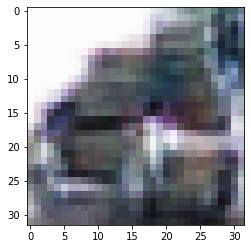

-> Epoch 64, Batch numero 1/78 -> Disc. loss on real images: 0.53433, Disc. loss on fake images: 0.61670, Generator loss: 1.17866
-> Epoch 64, Batch numero 2/78 -> Disc. loss on real images: 0.73018, Disc. loss on fake images: 0.69305, Generator loss: 1.09134
-> Epoch 64, Batch numero 3/78 -> Disc. loss on real images: 0.70825, Disc. loss on fake images: 0.57916, Generator loss: 1.17276
-> Epoch 64, Batch numero 4/78 -> Disc. loss on real images: 0.60251, Disc. loss on fake images: 0.61148, Generator loss: 1.17781
-> Epoch 64, Batch numero 5/78 -> Disc. loss on real images: 0.60922, Disc. loss on fake images: 0.59740, Generator loss: 1.19799
-> Epoch 64, Batch numero 6/78 -> Disc. loss on real images: 0.71874, Disc. loss on fake images: 0.45821, Generator loss: 1.13277
-> Epoch 64, Batch numero 7/78 -> Disc. loss on real images: 0.62680, Disc. loss on fake images: 0.61398, Generator loss: 1.12681
-> Epoch 64, Batch numero 8/78 -> Disc. loss on real images: 0.58511, Disc. loss on fake i

-> Epoch 64, Batch numero 64/78 -> Disc. loss on real images: 0.50999, Disc. loss on fake images: 0.67230, Generator loss: 1.18660
-> Epoch 64, Batch numero 65/78 -> Disc. loss on real images: 0.53002, Disc. loss on fake images: 0.55761, Generator loss: 1.27895
-> Epoch 64, Batch numero 66/78 -> Disc. loss on real images: 0.81539, Disc. loss on fake images: 0.54891, Generator loss: 1.17800
-> Epoch 64, Batch numero 67/78 -> Disc. loss on real images: 0.69077, Disc. loss on fake images: 0.54546, Generator loss: 1.21246
-> Epoch 64, Batch numero 68/78 -> Disc. loss on real images: 0.56574, Disc. loss on fake images: 0.60522, Generator loss: 1.25209
-> Epoch 64, Batch numero 69/78 -> Disc. loss on real images: 0.44668, Disc. loss on fake images: 0.47456, Generator loss: 1.36784
-> Epoch 64, Batch numero 70/78 -> Disc. loss on real images: 0.61730, Disc. loss on fake images: 0.40404, Generator loss: 1.31274
-> Epoch 64, Batch numero 71/78 -> Disc. loss on real images: 0.43145, Disc. loss o

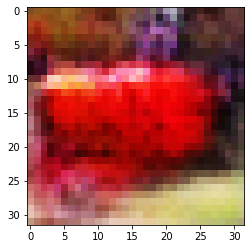

-> Epoch 65, Batch numero 1/78 -> Disc. loss on real images: 0.61493, Disc. loss on fake images: 0.45714, Generator loss: 1.72788
-> Epoch 65, Batch numero 2/78 -> Disc. loss on real images: 0.63522, Disc. loss on fake images: 0.37839, Generator loss: 1.57892
-> Epoch 65, Batch numero 3/78 -> Disc. loss on real images: 0.36274, Disc. loss on fake images: 0.63017, Generator loss: 1.52029
-> Epoch 65, Batch numero 4/78 -> Disc. loss on real images: 0.54417, Disc. loss on fake images: 0.84451, Generator loss: 1.70058
-> Epoch 65, Batch numero 5/78 -> Disc. loss on real images: 0.82855, Disc. loss on fake images: 0.55654, Generator loss: 1.95308
-> Epoch 65, Batch numero 6/78 -> Disc. loss on real images: 0.72161, Disc. loss on fake images: 0.44744, Generator loss: 1.58964
-> Epoch 65, Batch numero 7/78 -> Disc. loss on real images: 0.85724, Disc. loss on fake images: 0.80441, Generator loss: 1.48446
-> Epoch 65, Batch numero 8/78 -> Disc. loss on real images: 0.72847, Disc. loss on fake i

-> Epoch 65, Batch numero 64/78 -> Disc. loss on real images: 0.41795, Disc. loss on fake images: 0.63095, Generator loss: 1.23626
-> Epoch 65, Batch numero 65/78 -> Disc. loss on real images: 0.62878, Disc. loss on fake images: 0.50397, Generator loss: 1.23634
-> Epoch 65, Batch numero 66/78 -> Disc. loss on real images: 0.63790, Disc. loss on fake images: 0.47066, Generator loss: 1.10579
-> Epoch 65, Batch numero 67/78 -> Disc. loss on real images: 0.51295, Disc. loss on fake images: 0.75742, Generator loss: 1.19939
-> Epoch 65, Batch numero 68/78 -> Disc. loss on real images: 0.66042, Disc. loss on fake images: 0.57289, Generator loss: 1.22994
-> Epoch 65, Batch numero 69/78 -> Disc. loss on real images: 0.48619, Disc. loss on fake images: 0.50495, Generator loss: 1.40792
-> Epoch 65, Batch numero 70/78 -> Disc. loss on real images: 0.60279, Disc. loss on fake images: 0.41595, Generator loss: 1.43927
-> Epoch 65, Batch numero 71/78 -> Disc. loss on real images: 0.62880, Disc. loss o

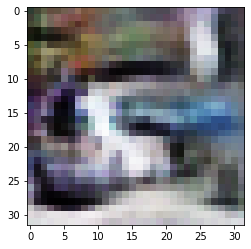

-> Epoch 66, Batch numero 1/78 -> Disc. loss on real images: 0.57115, Disc. loss on fake images: 0.70232, Generator loss: 1.24848
-> Epoch 66, Batch numero 2/78 -> Disc. loss on real images: 0.55635, Disc. loss on fake images: 0.59571, Generator loss: 1.17028
-> Epoch 66, Batch numero 3/78 -> Disc. loss on real images: 0.50586, Disc. loss on fake images: 0.58371, Generator loss: 1.22756
-> Epoch 66, Batch numero 4/78 -> Disc. loss on real images: 0.56338, Disc. loss on fake images: 0.72121, Generator loss: 1.08562
-> Epoch 66, Batch numero 5/78 -> Disc. loss on real images: 0.60653, Disc. loss on fake images: 0.59842, Generator loss: 1.12074
-> Epoch 66, Batch numero 6/78 -> Disc. loss on real images: 0.70030, Disc. loss on fake images: 0.61659, Generator loss: 1.10066
-> Epoch 66, Batch numero 7/78 -> Disc. loss on real images: 0.70183, Disc. loss on fake images: 0.60695, Generator loss: 1.15726
-> Epoch 66, Batch numero 8/78 -> Disc. loss on real images: 0.63196, Disc. loss on fake i

-> Epoch 66, Batch numero 65/78 -> Disc. loss on real images: 0.66999, Disc. loss on fake images: 0.70032, Generator loss: 1.03904
-> Epoch 66, Batch numero 66/78 -> Disc. loss on real images: 0.45172, Disc. loss on fake images: 0.57634, Generator loss: 1.01830
-> Epoch 66, Batch numero 67/78 -> Disc. loss on real images: 0.52881, Disc. loss on fake images: 0.66377, Generator loss: 1.18006
-> Epoch 66, Batch numero 68/78 -> Disc. loss on real images: 0.75803, Disc. loss on fake images: 0.73957, Generator loss: 1.17226
-> Epoch 66, Batch numero 69/78 -> Disc. loss on real images: 0.56064, Disc. loss on fake images: 0.47321, Generator loss: 1.19427
-> Epoch 66, Batch numero 70/78 -> Disc. loss on real images: 0.55506, Disc. loss on fake images: 0.50528, Generator loss: 1.28164
-> Epoch 66, Batch numero 71/78 -> Disc. loss on real images: 0.56678, Disc. loss on fake images: 0.55783, Generator loss: 1.38482
-> Epoch 66, Batch numero 72/78 -> Disc. loss on real images: 0.62938, Disc. loss o

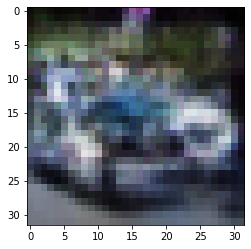

-> Epoch 67, Batch numero 1/78 -> Disc. loss on real images: 0.64667, Disc. loss on fake images: 0.56839, Generator loss: 1.21346
-> Epoch 67, Batch numero 2/78 -> Disc. loss on real images: 0.48665, Disc. loss on fake images: 0.52218, Generator loss: 1.12489
-> Epoch 67, Batch numero 3/78 -> Disc. loss on real images: 0.69818, Disc. loss on fake images: 0.60933, Generator loss: 1.13522
-> Epoch 67, Batch numero 4/78 -> Disc. loss on real images: 0.61179, Disc. loss on fake images: 0.65751, Generator loss: 1.19233
-> Epoch 67, Batch numero 5/78 -> Disc. loss on real images: 0.53228, Disc. loss on fake images: 0.60767, Generator loss: 1.13846
-> Epoch 67, Batch numero 6/78 -> Disc. loss on real images: 0.52584, Disc. loss on fake images: 0.55205, Generator loss: 1.16314
-> Epoch 67, Batch numero 7/78 -> Disc. loss on real images: 0.47617, Disc. loss on fake images: 0.61851, Generator loss: 1.32989
-> Epoch 67, Batch numero 8/78 -> Disc. loss on real images: 0.63685, Disc. loss on fake i

-> Epoch 67, Batch numero 64/78 -> Disc. loss on real images: 0.54411, Disc. loss on fake images: 0.62831, Generator loss: 1.10081
-> Epoch 67, Batch numero 65/78 -> Disc. loss on real images: 0.56891, Disc. loss on fake images: 0.62102, Generator loss: 1.25719
-> Epoch 67, Batch numero 66/78 -> Disc. loss on real images: 0.49538, Disc. loss on fake images: 0.58041, Generator loss: 1.14244
-> Epoch 67, Batch numero 67/78 -> Disc. loss on real images: 0.50768, Disc. loss on fake images: 0.48370, Generator loss: 1.20785
-> Epoch 67, Batch numero 68/78 -> Disc. loss on real images: 0.44207, Disc. loss on fake images: 0.58823, Generator loss: 1.14137
-> Epoch 67, Batch numero 69/78 -> Disc. loss on real images: 0.61640, Disc. loss on fake images: 0.55399, Generator loss: 1.26591
-> Epoch 67, Batch numero 70/78 -> Disc. loss on real images: 0.68490, Disc. loss on fake images: 0.58562, Generator loss: 1.14329
-> Epoch 67, Batch numero 71/78 -> Disc. loss on real images: 0.58454, Disc. loss o

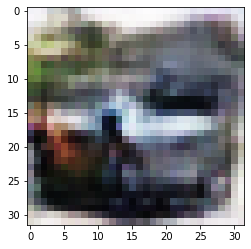

-> Epoch 68, Batch numero 1/78 -> Disc. loss on real images: 0.50226, Disc. loss on fake images: 0.48001, Generator loss: 1.21793
-> Epoch 68, Batch numero 2/78 -> Disc. loss on real images: 0.56156, Disc. loss on fake images: 0.54798, Generator loss: 1.24007
-> Epoch 68, Batch numero 3/78 -> Disc. loss on real images: 0.54038, Disc. loss on fake images: 0.67592, Generator loss: 1.27807
-> Epoch 68, Batch numero 4/78 -> Disc. loss on real images: 0.53429, Disc. loss on fake images: 0.48564, Generator loss: 1.22291
-> Epoch 68, Batch numero 5/78 -> Disc. loss on real images: 0.70060, Disc. loss on fake images: 0.52817, Generator loss: 1.10361
-> Epoch 68, Batch numero 6/78 -> Disc. loss on real images: 0.46747, Disc. loss on fake images: 0.50807, Generator loss: 1.23857
-> Epoch 68, Batch numero 7/78 -> Disc. loss on real images: 0.67984, Disc. loss on fake images: 0.56031, Generator loss: 1.24038
-> Epoch 68, Batch numero 8/78 -> Disc. loss on real images: 0.63830, Disc. loss on fake i

-> Epoch 68, Batch numero 64/78 -> Disc. loss on real images: 0.63686, Disc. loss on fake images: 0.47696, Generator loss: 1.18076
-> Epoch 68, Batch numero 65/78 -> Disc. loss on real images: 0.74673, Disc. loss on fake images: 0.56976, Generator loss: 1.13221
-> Epoch 68, Batch numero 66/78 -> Disc. loss on real images: 0.59631, Disc. loss on fake images: 0.63195, Generator loss: 1.13403
-> Epoch 68, Batch numero 67/78 -> Disc. loss on real images: 0.57341, Disc. loss on fake images: 0.61769, Generator loss: 1.17800
-> Epoch 68, Batch numero 68/78 -> Disc. loss on real images: 0.72103, Disc. loss on fake images: 0.61210, Generator loss: 1.15427
-> Epoch 68, Batch numero 69/78 -> Disc. loss on real images: 0.64200, Disc. loss on fake images: 0.62288, Generator loss: 1.29047
-> Epoch 68, Batch numero 70/78 -> Disc. loss on real images: 0.64127, Disc. loss on fake images: 0.49966, Generator loss: 1.17699
-> Epoch 68, Batch numero 71/78 -> Disc. loss on real images: 0.54958, Disc. loss o

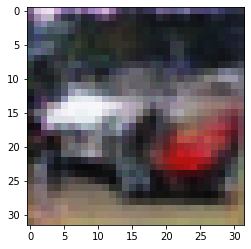

-> Epoch 69, Batch numero 1/78 -> Disc. loss on real images: 0.56796, Disc. loss on fake images: 0.50166, Generator loss: 1.29237
-> Epoch 69, Batch numero 2/78 -> Disc. loss on real images: 0.56650, Disc. loss on fake images: 0.62881, Generator loss: 1.30246
-> Epoch 69, Batch numero 3/78 -> Disc. loss on real images: 0.49585, Disc. loss on fake images: 0.43771, Generator loss: 1.25338
-> Epoch 69, Batch numero 4/78 -> Disc. loss on real images: 0.45853, Disc. loss on fake images: 0.58430, Generator loss: 1.22896
-> Epoch 69, Batch numero 5/78 -> Disc. loss on real images: 0.55234, Disc. loss on fake images: 0.54510, Generator loss: 1.13132
-> Epoch 69, Batch numero 6/78 -> Disc. loss on real images: 0.55376, Disc. loss on fake images: 0.54332, Generator loss: 1.19679
-> Epoch 69, Batch numero 7/78 -> Disc. loss on real images: 0.57874, Disc. loss on fake images: 0.54494, Generator loss: 1.20129
-> Epoch 69, Batch numero 8/78 -> Disc. loss on real images: 0.60871, Disc. loss on fake i

-> Epoch 69, Batch numero 64/78 -> Disc. loss on real images: 0.69423, Disc. loss on fake images: 0.59408, Generator loss: 1.19199
-> Epoch 69, Batch numero 65/78 -> Disc. loss on real images: 0.54356, Disc. loss on fake images: 0.62994, Generator loss: 1.01878
-> Epoch 69, Batch numero 66/78 -> Disc. loss on real images: 0.63785, Disc. loss on fake images: 0.54600, Generator loss: 1.24961
-> Epoch 69, Batch numero 67/78 -> Disc. loss on real images: 0.61192, Disc. loss on fake images: 0.56636, Generator loss: 1.09797
-> Epoch 69, Batch numero 68/78 -> Disc. loss on real images: 0.57164, Disc. loss on fake images: 0.57160, Generator loss: 1.18845
-> Epoch 69, Batch numero 69/78 -> Disc. loss on real images: 0.50564, Disc. loss on fake images: 0.59282, Generator loss: 1.17049
-> Epoch 69, Batch numero 70/78 -> Disc. loss on real images: 0.61292, Disc. loss on fake images: 0.56753, Generator loss: 1.32133
-> Epoch 69, Batch numero 71/78 -> Disc. loss on real images: 0.66547, Disc. loss o

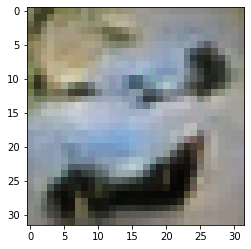

-> Epoch 70, Batch numero 1/78 -> Disc. loss on real images: 0.61136, Disc. loss on fake images: 0.57667, Generator loss: 1.12326
-> Epoch 70, Batch numero 2/78 -> Disc. loss on real images: 0.59006, Disc. loss on fake images: 0.70475, Generator loss: 1.22301
-> Epoch 70, Batch numero 3/78 -> Disc. loss on real images: 0.53728, Disc. loss on fake images: 0.45838, Generator loss: 1.31842
-> Epoch 70, Batch numero 4/78 -> Disc. loss on real images: 0.55274, Disc. loss on fake images: 0.54250, Generator loss: 1.15165
-> Epoch 70, Batch numero 5/78 -> Disc. loss on real images: 0.55970, Disc. loss on fake images: 0.60608, Generator loss: 1.29219
-> Epoch 70, Batch numero 6/78 -> Disc. loss on real images: 0.45409, Disc. loss on fake images: 0.49905, Generator loss: 1.31505
-> Epoch 70, Batch numero 7/78 -> Disc. loss on real images: 0.44216, Disc. loss on fake images: 0.44053, Generator loss: 1.32897
-> Epoch 70, Batch numero 8/78 -> Disc. loss on real images: 0.58852, Disc. loss on fake i

-> Epoch 70, Batch numero 64/78 -> Disc. loss on real images: 0.63205, Disc. loss on fake images: 0.45382, Generator loss: 1.28828
-> Epoch 70, Batch numero 65/78 -> Disc. loss on real images: 0.55547, Disc. loss on fake images: 0.51372, Generator loss: 1.07859
-> Epoch 70, Batch numero 66/78 -> Disc. loss on real images: 0.63147, Disc. loss on fake images: 0.59470, Generator loss: 1.16736
-> Epoch 70, Batch numero 67/78 -> Disc. loss on real images: 0.62255, Disc. loss on fake images: 0.59272, Generator loss: 1.14471
-> Epoch 70, Batch numero 68/78 -> Disc. loss on real images: 0.45647, Disc. loss on fake images: 0.57778, Generator loss: 1.11579
-> Epoch 70, Batch numero 69/78 -> Disc. loss on real images: 0.50131, Disc. loss on fake images: 0.53110, Generator loss: 1.23604
-> Epoch 70, Batch numero 70/78 -> Disc. loss on real images: 0.59605, Disc. loss on fake images: 0.47534, Generator loss: 1.28327
-> Epoch 70, Batch numero 71/78 -> Disc. loss on real images: 0.51338, Disc. loss o

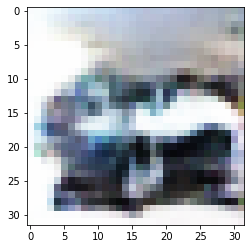

-> Epoch 71, Batch numero 1/78 -> Disc. loss on real images: 0.60036, Disc. loss on fake images: 0.54003, Generator loss: 1.08218
-> Epoch 71, Batch numero 2/78 -> Disc. loss on real images: 0.58461, Disc. loss on fake images: 0.59976, Generator loss: 1.10313
-> Epoch 71, Batch numero 3/78 -> Disc. loss on real images: 0.54081, Disc. loss on fake images: 0.58097, Generator loss: 1.02488
-> Epoch 71, Batch numero 4/78 -> Disc. loss on real images: 0.57642, Disc. loss on fake images: 0.60146, Generator loss: 1.07102
-> Epoch 71, Batch numero 5/78 -> Disc. loss on real images: 0.48327, Disc. loss on fake images: 0.53781, Generator loss: 1.28169
-> Epoch 71, Batch numero 6/78 -> Disc. loss on real images: 0.53528, Disc. loss on fake images: 0.46804, Generator loss: 1.39358
-> Epoch 71, Batch numero 7/78 -> Disc. loss on real images: 0.56923, Disc. loss on fake images: 0.45863, Generator loss: 1.20080
-> Epoch 71, Batch numero 8/78 -> Disc. loss on real images: 0.51451, Disc. loss on fake i

-> Epoch 71, Batch numero 64/78 -> Disc. loss on real images: 0.70887, Disc. loss on fake images: 0.46216, Generator loss: 1.24048
-> Epoch 71, Batch numero 65/78 -> Disc. loss on real images: 0.48201, Disc. loss on fake images: 0.55352, Generator loss: 1.20816
-> Epoch 71, Batch numero 66/78 -> Disc. loss on real images: 0.58457, Disc. loss on fake images: 0.56031, Generator loss: 1.21976
-> Epoch 71, Batch numero 67/78 -> Disc. loss on real images: 0.54862, Disc. loss on fake images: 0.53681, Generator loss: 1.23097
-> Epoch 71, Batch numero 68/78 -> Disc. loss on real images: 0.45260, Disc. loss on fake images: 0.50556, Generator loss: 1.43064
-> Epoch 71, Batch numero 69/78 -> Disc. loss on real images: 0.63073, Disc. loss on fake images: 0.46628, Generator loss: 1.32126
-> Epoch 71, Batch numero 70/78 -> Disc. loss on real images: 0.49190, Disc. loss on fake images: 0.54712, Generator loss: 1.46321
-> Epoch 71, Batch numero 71/78 -> Disc. loss on real images: 0.58747, Disc. loss o

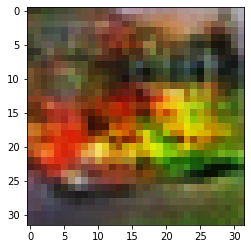

-> Epoch 72, Batch numero 1/78 -> Disc. loss on real images: 0.50971, Disc. loss on fake images: 0.63854, Generator loss: 1.16386
-> Epoch 72, Batch numero 2/78 -> Disc. loss on real images: 0.51535, Disc. loss on fake images: 0.57977, Generator loss: 1.22075
-> Epoch 72, Batch numero 3/78 -> Disc. loss on real images: 0.41668, Disc. loss on fake images: 0.63347, Generator loss: 1.27048
-> Epoch 72, Batch numero 4/78 -> Disc. loss on real images: 0.63836, Disc. loss on fake images: 0.58238, Generator loss: 1.17450
-> Epoch 72, Batch numero 5/78 -> Disc. loss on real images: 0.70009, Disc. loss on fake images: 0.51656, Generator loss: 1.25792
-> Epoch 72, Batch numero 6/78 -> Disc. loss on real images: 0.64532, Disc. loss on fake images: 0.61711, Generator loss: 1.15456
-> Epoch 72, Batch numero 7/78 -> Disc. loss on real images: 0.63043, Disc. loss on fake images: 0.56271, Generator loss: 1.25219
-> Epoch 72, Batch numero 8/78 -> Disc. loss on real images: 0.71260, Disc. loss on fake i

-> Epoch 72, Batch numero 64/78 -> Disc. loss on real images: 0.57702, Disc. loss on fake images: 0.48983, Generator loss: 1.22258
-> Epoch 72, Batch numero 65/78 -> Disc. loss on real images: 0.51343, Disc. loss on fake images: 0.55190, Generator loss: 1.12187
-> Epoch 72, Batch numero 66/78 -> Disc. loss on real images: 0.45088, Disc. loss on fake images: 0.59023, Generator loss: 1.43925
-> Epoch 72, Batch numero 67/78 -> Disc. loss on real images: 0.53721, Disc. loss on fake images: 0.66131, Generator loss: 1.33805
-> Epoch 72, Batch numero 68/78 -> Disc. loss on real images: 0.63506, Disc. loss on fake images: 0.52005, Generator loss: 1.25297
-> Epoch 72, Batch numero 69/78 -> Disc. loss on real images: 0.47294, Disc. loss on fake images: 0.50159, Generator loss: 1.16357
-> Epoch 72, Batch numero 70/78 -> Disc. loss on real images: 0.63919, Disc. loss on fake images: 0.60701, Generator loss: 1.13725
-> Epoch 72, Batch numero 71/78 -> Disc. loss on real images: 0.58659, Disc. loss o

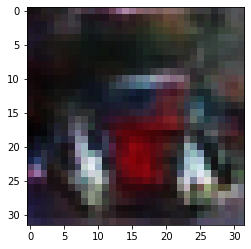

-> Epoch 73, Batch numero 1/78 -> Disc. loss on real images: 0.61092, Disc. loss on fake images: 0.50187, Generator loss: 1.19207
-> Epoch 73, Batch numero 2/78 -> Disc. loss on real images: 0.47900, Disc. loss on fake images: 0.58992, Generator loss: 1.00874
-> Epoch 73, Batch numero 3/78 -> Disc. loss on real images: 0.64231, Disc. loss on fake images: 0.76212, Generator loss: 1.03208
-> Epoch 73, Batch numero 4/78 -> Disc. loss on real images: 0.59068, Disc. loss on fake images: 0.61256, Generator loss: 1.10776
-> Epoch 73, Batch numero 5/78 -> Disc. loss on real images: 0.56304, Disc. loss on fake images: 0.58241, Generator loss: 1.04113
-> Epoch 73, Batch numero 6/78 -> Disc. loss on real images: 0.60562, Disc. loss on fake images: 0.61935, Generator loss: 1.26536
-> Epoch 73, Batch numero 7/78 -> Disc. loss on real images: 0.65323, Disc. loss on fake images: 0.61116, Generator loss: 1.16963
-> Epoch 73, Batch numero 8/78 -> Disc. loss on real images: 0.65642, Disc. loss on fake i

-> Epoch 73, Batch numero 64/78 -> Disc. loss on real images: 0.54704, Disc. loss on fake images: 0.56725, Generator loss: 1.14147
-> Epoch 73, Batch numero 65/78 -> Disc. loss on real images: 0.48076, Disc. loss on fake images: 0.65079, Generator loss: 1.21084
-> Epoch 73, Batch numero 66/78 -> Disc. loss on real images: 0.62085, Disc. loss on fake images: 0.56139, Generator loss: 1.23730
-> Epoch 73, Batch numero 67/78 -> Disc. loss on real images: 0.50232, Disc. loss on fake images: 0.47585, Generator loss: 1.22497
-> Epoch 73, Batch numero 68/78 -> Disc. loss on real images: 0.54461, Disc. loss on fake images: 0.58344, Generator loss: 1.21715
-> Epoch 73, Batch numero 69/78 -> Disc. loss on real images: 0.70183, Disc. loss on fake images: 0.49984, Generator loss: 1.27461
-> Epoch 73, Batch numero 70/78 -> Disc. loss on real images: 0.58388, Disc. loss on fake images: 0.55263, Generator loss: 1.18007
-> Epoch 73, Batch numero 71/78 -> Disc. loss on real images: 0.47746, Disc. loss o

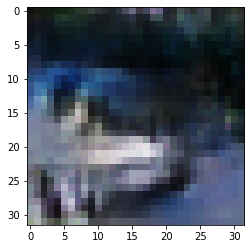

-> Epoch 74, Batch numero 1/78 -> Disc. loss on real images: 0.61245, Disc. loss on fake images: 0.70878, Generator loss: 1.15308
-> Epoch 74, Batch numero 2/78 -> Disc. loss on real images: 0.70578, Disc. loss on fake images: 0.67827, Generator loss: 1.22290
-> Epoch 74, Batch numero 3/78 -> Disc. loss on real images: 0.48993, Disc. loss on fake images: 0.61783, Generator loss: 1.23470
-> Epoch 74, Batch numero 4/78 -> Disc. loss on real images: 0.62688, Disc. loss on fake images: 0.45755, Generator loss: 1.25545
-> Epoch 74, Batch numero 5/78 -> Disc. loss on real images: 0.59860, Disc. loss on fake images: 0.53491, Generator loss: 1.16839
-> Epoch 74, Batch numero 6/78 -> Disc. loss on real images: 0.57940, Disc. loss on fake images: 0.64086, Generator loss: 1.09554
-> Epoch 74, Batch numero 7/78 -> Disc. loss on real images: 0.54024, Disc. loss on fake images: 0.69430, Generator loss: 1.12389
-> Epoch 74, Batch numero 8/78 -> Disc. loss on real images: 0.65177, Disc. loss on fake i

-> Epoch 74, Batch numero 65/78 -> Disc. loss on real images: 0.76357, Disc. loss on fake images: 0.50526, Generator loss: 1.29934
-> Epoch 74, Batch numero 66/78 -> Disc. loss on real images: 0.58733, Disc. loss on fake images: 0.62972, Generator loss: 1.23455
-> Epoch 74, Batch numero 67/78 -> Disc. loss on real images: 0.54814, Disc. loss on fake images: 0.54900, Generator loss: 1.16270
-> Epoch 74, Batch numero 68/78 -> Disc. loss on real images: 0.60630, Disc. loss on fake images: 0.57751, Generator loss: 1.17501
-> Epoch 74, Batch numero 69/78 -> Disc. loss on real images: 0.53595, Disc. loss on fake images: 0.60776, Generator loss: 1.19936
-> Epoch 74, Batch numero 70/78 -> Disc. loss on real images: 0.68411, Disc. loss on fake images: 0.59495, Generator loss: 1.10293
-> Epoch 74, Batch numero 71/78 -> Disc. loss on real images: 0.52222, Disc. loss on fake images: 0.53831, Generator loss: 1.19516
-> Epoch 74, Batch numero 72/78 -> Disc. loss on real images: 0.69330, Disc. loss o

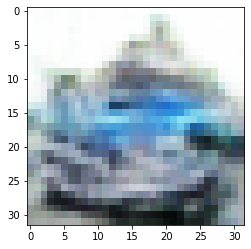

-> Epoch 75, Batch numero 1/78 -> Disc. loss on real images: 0.48925, Disc. loss on fake images: 0.48381, Generator loss: 1.18020
-> Epoch 75, Batch numero 2/78 -> Disc. loss on real images: 0.54448, Disc. loss on fake images: 0.59340, Generator loss: 1.14419
-> Epoch 75, Batch numero 3/78 -> Disc. loss on real images: 0.70817, Disc. loss on fake images: 0.55777, Generator loss: 1.15933
-> Epoch 75, Batch numero 4/78 -> Disc. loss on real images: 0.47899, Disc. loss on fake images: 0.60119, Generator loss: 1.25522
-> Epoch 75, Batch numero 5/78 -> Disc. loss on real images: 0.56523, Disc. loss on fake images: 0.63011, Generator loss: 1.26248
-> Epoch 75, Batch numero 6/78 -> Disc. loss on real images: 0.58641, Disc. loss on fake images: 0.56823, Generator loss: 1.18565
-> Epoch 75, Batch numero 7/78 -> Disc. loss on real images: 0.71857, Disc. loss on fake images: 0.54414, Generator loss: 1.22550
-> Epoch 75, Batch numero 8/78 -> Disc. loss on real images: 0.60897, Disc. loss on fake i

-> Epoch 75, Batch numero 64/78 -> Disc. loss on real images: 0.60466, Disc. loss on fake images: 0.68789, Generator loss: 1.20226
-> Epoch 75, Batch numero 65/78 -> Disc. loss on real images: 0.71475, Disc. loss on fake images: 0.61921, Generator loss: 1.08509
-> Epoch 75, Batch numero 66/78 -> Disc. loss on real images: 0.61238, Disc. loss on fake images: 0.59689, Generator loss: 1.26772
-> Epoch 75, Batch numero 67/78 -> Disc. loss on real images: 0.56091, Disc. loss on fake images: 0.54675, Generator loss: 1.25951
-> Epoch 75, Batch numero 68/78 -> Disc. loss on real images: 0.65773, Disc. loss on fake images: 0.60210, Generator loss: 1.13326
-> Epoch 75, Batch numero 69/78 -> Disc. loss on real images: 0.65582, Disc. loss on fake images: 0.56323, Generator loss: 0.92047
-> Epoch 75, Batch numero 70/78 -> Disc. loss on real images: 0.53058, Disc. loss on fake images: 0.64434, Generator loss: 1.04121
-> Epoch 75, Batch numero 71/78 -> Disc. loss on real images: 0.53207, Disc. loss o

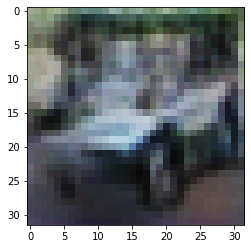

-> Epoch 76, Batch numero 1/78 -> Disc. loss on real images: 0.58079, Disc. loss on fake images: 0.50757, Generator loss: 1.28474
-> Epoch 76, Batch numero 2/78 -> Disc. loss on real images: 0.56937, Disc. loss on fake images: 0.53802, Generator loss: 1.21443
-> Epoch 76, Batch numero 3/78 -> Disc. loss on real images: 0.60499, Disc. loss on fake images: 0.53541, Generator loss: 1.09852
-> Epoch 76, Batch numero 4/78 -> Disc. loss on real images: 0.51850, Disc. loss on fake images: 0.64504, Generator loss: 1.15148
-> Epoch 76, Batch numero 5/78 -> Disc. loss on real images: 0.66264, Disc. loss on fake images: 0.59655, Generator loss: 1.13424
-> Epoch 76, Batch numero 6/78 -> Disc. loss on real images: 0.66703, Disc. loss on fake images: 0.51345, Generator loss: 0.98440
-> Epoch 76, Batch numero 7/78 -> Disc. loss on real images: 0.66040, Disc. loss on fake images: 0.58657, Generator loss: 1.13343
-> Epoch 76, Batch numero 8/78 -> Disc. loss on real images: 0.53486, Disc. loss on fake i

-> Epoch 76, Batch numero 64/78 -> Disc. loss on real images: 0.49080, Disc. loss on fake images: 0.60480, Generator loss: 1.24386
-> Epoch 76, Batch numero 65/78 -> Disc. loss on real images: 0.56948, Disc. loss on fake images: 0.59767, Generator loss: 1.38000
-> Epoch 76, Batch numero 66/78 -> Disc. loss on real images: 0.51152, Disc. loss on fake images: 0.48102, Generator loss: 1.41150
-> Epoch 76, Batch numero 67/78 -> Disc. loss on real images: 0.61669, Disc. loss on fake images: 0.53551, Generator loss: 1.27423
-> Epoch 76, Batch numero 68/78 -> Disc. loss on real images: 0.65625, Disc. loss on fake images: 0.62105, Generator loss: 1.22774
-> Epoch 76, Batch numero 69/78 -> Disc. loss on real images: 0.60549, Disc. loss on fake images: 0.66221, Generator loss: 1.30133
-> Epoch 76, Batch numero 70/78 -> Disc. loss on real images: 0.70698, Disc. loss on fake images: 0.53115, Generator loss: 1.23320
-> Epoch 76, Batch numero 71/78 -> Disc. loss on real images: 0.75081, Disc. loss o

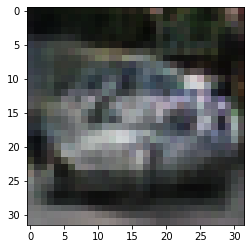

-> Epoch 77, Batch numero 1/78 -> Disc. loss on real images: 0.72385, Disc. loss on fake images: 0.57258, Generator loss: 1.14318
-> Epoch 77, Batch numero 2/78 -> Disc. loss on real images: 0.58706, Disc. loss on fake images: 0.59793, Generator loss: 1.21967
-> Epoch 77, Batch numero 3/78 -> Disc. loss on real images: 0.68268, Disc. loss on fake images: 0.59519, Generator loss: 1.17565
-> Epoch 77, Batch numero 4/78 -> Disc. loss on real images: 0.64651, Disc. loss on fake images: 0.48005, Generator loss: 1.23855
-> Epoch 77, Batch numero 5/78 -> Disc. loss on real images: 0.67519, Disc. loss on fake images: 0.52676, Generator loss: 1.13867
-> Epoch 77, Batch numero 6/78 -> Disc. loss on real images: 0.62191, Disc. loss on fake images: 0.51753, Generator loss: 1.18165
-> Epoch 77, Batch numero 7/78 -> Disc. loss on real images: 0.51020, Disc. loss on fake images: 0.76061, Generator loss: 1.33972
-> Epoch 77, Batch numero 8/78 -> Disc. loss on real images: 0.55478, Disc. loss on fake i

-> Epoch 77, Batch numero 64/78 -> Disc. loss on real images: 0.62363, Disc. loss on fake images: 0.54336, Generator loss: 1.27874
-> Epoch 77, Batch numero 65/78 -> Disc. loss on real images: 0.50216, Disc. loss on fake images: 0.53732, Generator loss: 1.49121
-> Epoch 77, Batch numero 66/78 -> Disc. loss on real images: 0.43235, Disc. loss on fake images: 0.47247, Generator loss: 1.48035
-> Epoch 77, Batch numero 67/78 -> Disc. loss on real images: 0.50603, Disc. loss on fake images: 0.56814, Generator loss: 1.26244
-> Epoch 77, Batch numero 68/78 -> Disc. loss on real images: 0.49322, Disc. loss on fake images: 0.48739, Generator loss: 1.14870
-> Epoch 77, Batch numero 69/78 -> Disc. loss on real images: 0.51847, Disc. loss on fake images: 0.56794, Generator loss: 1.10552
-> Epoch 77, Batch numero 70/78 -> Disc. loss on real images: 0.60366, Disc. loss on fake images: 0.64025, Generator loss: 1.06285
-> Epoch 77, Batch numero 71/78 -> Disc. loss on real images: 0.61779, Disc. loss o

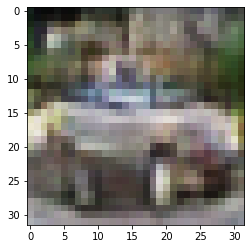

-> Epoch 78, Batch numero 1/78 -> Disc. loss on real images: 0.57873, Disc. loss on fake images: 0.56521, Generator loss: 1.24679
-> Epoch 78, Batch numero 2/78 -> Disc. loss on real images: 0.60219, Disc. loss on fake images: 0.40680, Generator loss: 1.28077
-> Epoch 78, Batch numero 3/78 -> Disc. loss on real images: 0.57790, Disc. loss on fake images: 0.55545, Generator loss: 1.18253
-> Epoch 78, Batch numero 4/78 -> Disc. loss on real images: 0.60160, Disc. loss on fake images: 0.57405, Generator loss: 1.29813
-> Epoch 78, Batch numero 5/78 -> Disc. loss on real images: 0.69869, Disc. loss on fake images: 0.65380, Generator loss: 1.09766
-> Epoch 78, Batch numero 6/78 -> Disc. loss on real images: 0.55228, Disc. loss on fake images: 0.52824, Generator loss: 1.30146
-> Epoch 78, Batch numero 7/78 -> Disc. loss on real images: 0.61149, Disc. loss on fake images: 0.54287, Generator loss: 1.14560
-> Epoch 78, Batch numero 8/78 -> Disc. loss on real images: 0.53028, Disc. loss on fake i

-> Epoch 78, Batch numero 64/78 -> Disc. loss on real images: 0.51070, Disc. loss on fake images: 0.59722, Generator loss: 1.06809
-> Epoch 78, Batch numero 65/78 -> Disc. loss on real images: 0.52864, Disc. loss on fake images: 0.78952, Generator loss: 1.20087
-> Epoch 78, Batch numero 66/78 -> Disc. loss on real images: 0.68771, Disc. loss on fake images: 0.62948, Generator loss: 1.23526
-> Epoch 78, Batch numero 67/78 -> Disc. loss on real images: 0.56830, Disc. loss on fake images: 0.53307, Generator loss: 1.34232
-> Epoch 78, Batch numero 68/78 -> Disc. loss on real images: 0.71641, Disc. loss on fake images: 0.56618, Generator loss: 1.22014
-> Epoch 78, Batch numero 69/78 -> Disc. loss on real images: 0.52967, Disc. loss on fake images: 0.50137, Generator loss: 1.35326
-> Epoch 78, Batch numero 70/78 -> Disc. loss on real images: 0.57187, Disc. loss on fake images: 0.56681, Generator loss: 1.21907
-> Epoch 78, Batch numero 71/78 -> Disc. loss on real images: 0.67634, Disc. loss o

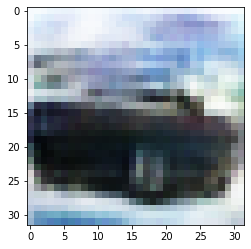

-> Epoch 79, Batch numero 1/78 -> Disc. loss on real images: 0.61897, Disc. loss on fake images: 0.53221, Generator loss: 1.23584
-> Epoch 79, Batch numero 2/78 -> Disc. loss on real images: 0.61385, Disc. loss on fake images: 0.46951, Generator loss: 1.09277
-> Epoch 79, Batch numero 3/78 -> Disc. loss on real images: 0.52726, Disc. loss on fake images: 0.63719, Generator loss: 1.02590
-> Epoch 79, Batch numero 4/78 -> Disc. loss on real images: 0.52533, Disc. loss on fake images: 0.60670, Generator loss: 1.19435
-> Epoch 79, Batch numero 5/78 -> Disc. loss on real images: 0.49022, Disc. loss on fake images: 0.50718, Generator loss: 1.11210
-> Epoch 79, Batch numero 6/78 -> Disc. loss on real images: 0.48709, Disc. loss on fake images: 0.53671, Generator loss: 1.26112
-> Epoch 79, Batch numero 7/78 -> Disc. loss on real images: 0.68448, Disc. loss on fake images: 0.51000, Generator loss: 1.10199
-> Epoch 79, Batch numero 8/78 -> Disc. loss on real images: 0.52100, Disc. loss on fake i

-> Epoch 79, Batch numero 64/78 -> Disc. loss on real images: 0.59002, Disc. loss on fake images: 0.64263, Generator loss: 0.97862
-> Epoch 79, Batch numero 65/78 -> Disc. loss on real images: 0.62441, Disc. loss on fake images: 0.67602, Generator loss: 1.12980
-> Epoch 79, Batch numero 66/78 -> Disc. loss on real images: 0.59602, Disc. loss on fake images: 0.61219, Generator loss: 1.14383
-> Epoch 79, Batch numero 67/78 -> Disc. loss on real images: 0.58977, Disc. loss on fake images: 0.62856, Generator loss: 1.21767
-> Epoch 79, Batch numero 68/78 -> Disc. loss on real images: 0.86251, Disc. loss on fake images: 0.53615, Generator loss: 1.12073
-> Epoch 79, Batch numero 69/78 -> Disc. loss on real images: 0.60648, Disc. loss on fake images: 0.58202, Generator loss: 1.20808
-> Epoch 79, Batch numero 70/78 -> Disc. loss on real images: 0.54536, Disc. loss on fake images: 0.56063, Generator loss: 1.22030
-> Epoch 79, Batch numero 71/78 -> Disc. loss on real images: 0.62356, Disc. loss o

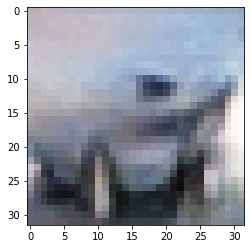

-> Epoch 80, Batch numero 1/78 -> Disc. loss on real images: 0.55126, Disc. loss on fake images: 0.50118, Generator loss: 1.08743
-> Epoch 80, Batch numero 2/78 -> Disc. loss on real images: 0.60450, Disc. loss on fake images: 0.52939, Generator loss: 1.09371
-> Epoch 80, Batch numero 3/78 -> Disc. loss on real images: 0.41964, Disc. loss on fake images: 0.69963, Generator loss: 1.13893
-> Epoch 80, Batch numero 4/78 -> Disc. loss on real images: 0.57298, Disc. loss on fake images: 0.62846, Generator loss: 1.27025
-> Epoch 80, Batch numero 5/78 -> Disc. loss on real images: 0.62329, Disc. loss on fake images: 0.54542, Generator loss: 1.24144
-> Epoch 80, Batch numero 6/78 -> Disc. loss on real images: 0.66108, Disc. loss on fake images: 0.54400, Generator loss: 1.11778
-> Epoch 80, Batch numero 7/78 -> Disc. loss on real images: 0.69798, Disc. loss on fake images: 0.77231, Generator loss: 1.09565
-> Epoch 80, Batch numero 8/78 -> Disc. loss on real images: 0.66901, Disc. loss on fake i

-> Epoch 80, Batch numero 64/78 -> Disc. loss on real images: 0.61047, Disc. loss on fake images: 0.78657, Generator loss: 1.36865
-> Epoch 80, Batch numero 65/78 -> Disc. loss on real images: 0.65183, Disc. loss on fake images: 0.41315, Generator loss: 1.30748
-> Epoch 80, Batch numero 66/78 -> Disc. loss on real images: 0.43433, Disc. loss on fake images: 0.71651, Generator loss: 1.33203
-> Epoch 80, Batch numero 67/78 -> Disc. loss on real images: 0.76285, Disc. loss on fake images: 0.62278, Generator loss: 1.18053
-> Epoch 80, Batch numero 68/78 -> Disc. loss on real images: 0.62226, Disc. loss on fake images: 0.61878, Generator loss: 1.22727
-> Epoch 80, Batch numero 69/78 -> Disc. loss on real images: 0.51734, Disc. loss on fake images: 0.58501, Generator loss: 1.18936
-> Epoch 80, Batch numero 70/78 -> Disc. loss on real images: 0.72116, Disc. loss on fake images: 0.59469, Generator loss: 1.27493
-> Epoch 80, Batch numero 71/78 -> Disc. loss on real images: 0.73590, Disc. loss o

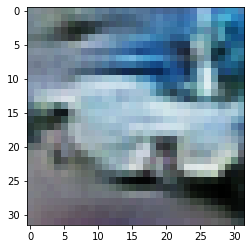

-> Epoch 81, Batch numero 1/78 -> Disc. loss on real images: 0.52425, Disc. loss on fake images: 0.62039, Generator loss: 1.09538
-> Epoch 81, Batch numero 2/78 -> Disc. loss on real images: 0.58029, Disc. loss on fake images: 0.45088, Generator loss: 1.13373
-> Epoch 81, Batch numero 3/78 -> Disc. loss on real images: 0.61530, Disc. loss on fake images: 0.57828, Generator loss: 1.03291
-> Epoch 81, Batch numero 4/78 -> Disc. loss on real images: 0.55617, Disc. loss on fake images: 0.65666, Generator loss: 1.17889
-> Epoch 81, Batch numero 5/78 -> Disc. loss on real images: 0.46095, Disc. loss on fake images: 0.58515, Generator loss: 1.13130
-> Epoch 81, Batch numero 6/78 -> Disc. loss on real images: 0.60439, Disc. loss on fake images: 0.48078, Generator loss: 1.21239
-> Epoch 81, Batch numero 7/78 -> Disc. loss on real images: 0.72764, Disc. loss on fake images: 0.59213, Generator loss: 1.13530
-> Epoch 81, Batch numero 8/78 -> Disc. loss on real images: 0.54658, Disc. loss on fake i

-> Epoch 81, Batch numero 64/78 -> Disc. loss on real images: 0.67805, Disc. loss on fake images: 0.53301, Generator loss: 1.05798
-> Epoch 81, Batch numero 65/78 -> Disc. loss on real images: 0.49845, Disc. loss on fake images: 0.64954, Generator loss: 1.15573
-> Epoch 81, Batch numero 66/78 -> Disc. loss on real images: 0.48653, Disc. loss on fake images: 0.65130, Generator loss: 1.12289
-> Epoch 81, Batch numero 67/78 -> Disc. loss on real images: 0.57793, Disc. loss on fake images: 0.70034, Generator loss: 1.13562
-> Epoch 81, Batch numero 68/78 -> Disc. loss on real images: 0.59996, Disc. loss on fake images: 0.53634, Generator loss: 1.17871
-> Epoch 81, Batch numero 69/78 -> Disc. loss on real images: 0.74147, Disc. loss on fake images: 0.56279, Generator loss: 1.09303
-> Epoch 81, Batch numero 70/78 -> Disc. loss on real images: 0.68226, Disc. loss on fake images: 0.65446, Generator loss: 1.10415
-> Epoch 81, Batch numero 71/78 -> Disc. loss on real images: 0.65307, Disc. loss o

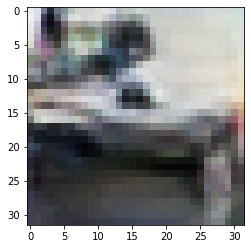

-> Epoch 82, Batch numero 1/78 -> Disc. loss on real images: 0.55507, Disc. loss on fake images: 0.62777, Generator loss: 1.04332
-> Epoch 82, Batch numero 2/78 -> Disc. loss on real images: 0.51248, Disc. loss on fake images: 0.67947, Generator loss: 1.08788
-> Epoch 82, Batch numero 3/78 -> Disc. loss on real images: 0.57204, Disc. loss on fake images: 0.55632, Generator loss: 1.19970
-> Epoch 82, Batch numero 4/78 -> Disc. loss on real images: 0.59407, Disc. loss on fake images: 0.63315, Generator loss: 1.28571
-> Epoch 82, Batch numero 5/78 -> Disc. loss on real images: 0.59772, Disc. loss on fake images: 0.59156, Generator loss: 1.22908
-> Epoch 82, Batch numero 6/78 -> Disc. loss on real images: 0.68457, Disc. loss on fake images: 0.45403, Generator loss: 1.25385
-> Epoch 82, Batch numero 7/78 -> Disc. loss on real images: 0.61590, Disc. loss on fake images: 0.56587, Generator loss: 1.22709
-> Epoch 82, Batch numero 8/78 -> Disc. loss on real images: 0.55875, Disc. loss on fake i

-> Epoch 82, Batch numero 66/78 -> Disc. loss on real images: 0.67828, Disc. loss on fake images: 0.49072, Generator loss: 1.32558
-> Epoch 82, Batch numero 67/78 -> Disc. loss on real images: 0.58232, Disc. loss on fake images: 0.41896, Generator loss: 1.24444
-> Epoch 82, Batch numero 68/78 -> Disc. loss on real images: 0.54608, Disc. loss on fake images: 0.55899, Generator loss: 1.18857
-> Epoch 82, Batch numero 69/78 -> Disc. loss on real images: 0.60277, Disc. loss on fake images: 0.57522, Generator loss: 1.11102
-> Epoch 82, Batch numero 70/78 -> Disc. loss on real images: 0.56589, Disc. loss on fake images: 0.59760, Generator loss: 1.12946
-> Epoch 82, Batch numero 71/78 -> Disc. loss on real images: 0.56158, Disc. loss on fake images: 0.51842, Generator loss: 1.22281
-> Epoch 82, Batch numero 72/78 -> Disc. loss on real images: 0.69499, Disc. loss on fake images: 0.64116, Generator loss: 1.23307
-> Epoch 82, Batch numero 73/78 -> Disc. loss on real images: 0.62524, Disc. loss o

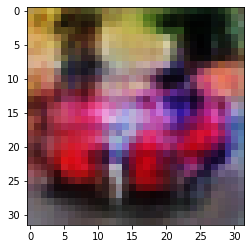

-> Epoch 83, Batch numero 1/78 -> Disc. loss on real images: 0.75381, Disc. loss on fake images: 0.51137, Generator loss: 1.13665
-> Epoch 83, Batch numero 2/78 -> Disc. loss on real images: 0.71346, Disc. loss on fake images: 0.58101, Generator loss: 1.08965
-> Epoch 83, Batch numero 3/78 -> Disc. loss on real images: 0.46369, Disc. loss on fake images: 0.48485, Generator loss: 1.27766
-> Epoch 83, Batch numero 4/78 -> Disc. loss on real images: 0.58602, Disc. loss on fake images: 0.52922, Generator loss: 1.19447
-> Epoch 83, Batch numero 5/78 -> Disc. loss on real images: 0.67948, Disc. loss on fake images: 0.62855, Generator loss: 1.01212
-> Epoch 83, Batch numero 6/78 -> Disc. loss on real images: 0.52002, Disc. loss on fake images: 0.52334, Generator loss: 1.00027
-> Epoch 83, Batch numero 7/78 -> Disc. loss on real images: 0.70258, Disc. loss on fake images: 0.64535, Generator loss: 0.98442
-> Epoch 83, Batch numero 8/78 -> Disc. loss on real images: 0.46738, Disc. loss on fake i

-> Epoch 83, Batch numero 64/78 -> Disc. loss on real images: 0.71599, Disc. loss on fake images: 0.54222, Generator loss: 1.12073
-> Epoch 83, Batch numero 65/78 -> Disc. loss on real images: 0.59855, Disc. loss on fake images: 0.65269, Generator loss: 1.05015
-> Epoch 83, Batch numero 66/78 -> Disc. loss on real images: 0.67262, Disc. loss on fake images: 0.58729, Generator loss: 1.12627
-> Epoch 83, Batch numero 67/78 -> Disc. loss on real images: 0.63413, Disc. loss on fake images: 0.55419, Generator loss: 1.09255
-> Epoch 83, Batch numero 68/78 -> Disc. loss on real images: 0.57132, Disc. loss on fake images: 0.58086, Generator loss: 1.21633
-> Epoch 83, Batch numero 69/78 -> Disc. loss on real images: 0.59665, Disc. loss on fake images: 0.53470, Generator loss: 1.14104
-> Epoch 83, Batch numero 70/78 -> Disc. loss on real images: 0.52007, Disc. loss on fake images: 0.54669, Generator loss: 1.02062
-> Epoch 83, Batch numero 71/78 -> Disc. loss on real images: 0.54155, Disc. loss o

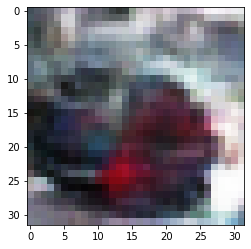

-> Epoch 84, Batch numero 1/78 -> Disc. loss on real images: 0.51077, Disc. loss on fake images: 0.64357, Generator loss: 1.10813
-> Epoch 84, Batch numero 2/78 -> Disc. loss on real images: 0.60519, Disc. loss on fake images: 0.57804, Generator loss: 1.08624
-> Epoch 84, Batch numero 3/78 -> Disc. loss on real images: 0.58759, Disc. loss on fake images: 0.52858, Generator loss: 1.07323
-> Epoch 84, Batch numero 4/78 -> Disc. loss on real images: 0.60300, Disc. loss on fake images: 0.62032, Generator loss: 0.98999
-> Epoch 84, Batch numero 5/78 -> Disc. loss on real images: 0.61681, Disc. loss on fake images: 0.65054, Generator loss: 0.96445
-> Epoch 84, Batch numero 6/78 -> Disc. loss on real images: 0.50649, Disc. loss on fake images: 0.56952, Generator loss: 1.12431
-> Epoch 84, Batch numero 7/78 -> Disc. loss on real images: 0.43256, Disc. loss on fake images: 0.65842, Generator loss: 1.25197
-> Epoch 84, Batch numero 8/78 -> Disc. loss on real images: 0.72337, Disc. loss on fake i

-> Epoch 84, Batch numero 64/78 -> Disc. loss on real images: 0.67897, Disc. loss on fake images: 0.53557, Generator loss: 1.19173
-> Epoch 84, Batch numero 65/78 -> Disc. loss on real images: 0.61900, Disc. loss on fake images: 0.48950, Generator loss: 1.10882
-> Epoch 84, Batch numero 66/78 -> Disc. loss on real images: 0.56066, Disc. loss on fake images: 0.56846, Generator loss: 1.01590
-> Epoch 84, Batch numero 67/78 -> Disc. loss on real images: 0.63639, Disc. loss on fake images: 0.59163, Generator loss: 1.04211
-> Epoch 84, Batch numero 68/78 -> Disc. loss on real images: 0.69992, Disc. loss on fake images: 0.75359, Generator loss: 1.15210
-> Epoch 84, Batch numero 69/78 -> Disc. loss on real images: 0.64738, Disc. loss on fake images: 0.65382, Generator loss: 1.13438
-> Epoch 84, Batch numero 70/78 -> Disc. loss on real images: 0.68271, Disc. loss on fake images: 0.63120, Generator loss: 1.14212
-> Epoch 84, Batch numero 71/78 -> Disc. loss on real images: 0.62327, Disc. loss o

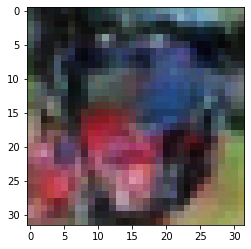

-> Epoch 85, Batch numero 1/78 -> Disc. loss on real images: 0.70040, Disc. loss on fake images: 0.62395, Generator loss: 1.12092
-> Epoch 85, Batch numero 2/78 -> Disc. loss on real images: 0.61075, Disc. loss on fake images: 0.60786, Generator loss: 1.15276
-> Epoch 85, Batch numero 3/78 -> Disc. loss on real images: 0.57256, Disc. loss on fake images: 0.55114, Generator loss: 1.17353
-> Epoch 85, Batch numero 4/78 -> Disc. loss on real images: 0.54977, Disc. loss on fake images: 0.54951, Generator loss: 1.12723
-> Epoch 85, Batch numero 5/78 -> Disc. loss on real images: 0.66709, Disc. loss on fake images: 0.49840, Generator loss: 1.15335
-> Epoch 85, Batch numero 6/78 -> Disc. loss on real images: 0.55347, Disc. loss on fake images: 0.55748, Generator loss: 1.08519
-> Epoch 85, Batch numero 7/78 -> Disc. loss on real images: 0.62570, Disc. loss on fake images: 0.66750, Generator loss: 1.13847
-> Epoch 85, Batch numero 8/78 -> Disc. loss on real images: 0.52052, Disc. loss on fake i

-> Epoch 85, Batch numero 65/78 -> Disc. loss on real images: 0.58241, Disc. loss on fake images: 0.71773, Generator loss: 1.19292
-> Epoch 85, Batch numero 66/78 -> Disc. loss on real images: 0.57942, Disc. loss on fake images: 0.60394, Generator loss: 1.18071
-> Epoch 85, Batch numero 67/78 -> Disc. loss on real images: 0.64689, Disc. loss on fake images: 0.59543, Generator loss: 1.20663
-> Epoch 85, Batch numero 68/78 -> Disc. loss on real images: 0.50759, Disc. loss on fake images: 0.48641, Generator loss: 1.17955
-> Epoch 85, Batch numero 69/78 -> Disc. loss on real images: 0.61298, Disc. loss on fake images: 0.65216, Generator loss: 1.09161
-> Epoch 85, Batch numero 70/78 -> Disc. loss on real images: 0.55738, Disc. loss on fake images: 0.59333, Generator loss: 1.13317
-> Epoch 85, Batch numero 71/78 -> Disc. loss on real images: 0.57936, Disc. loss on fake images: 0.52113, Generator loss: 1.31140
-> Epoch 85, Batch numero 72/78 -> Disc. loss on real images: 0.67012, Disc. loss o

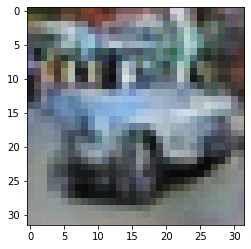

-> Epoch 86, Batch numero 1/78 -> Disc. loss on real images: 0.63427, Disc. loss on fake images: 0.66188, Generator loss: 1.09672
-> Epoch 86, Batch numero 2/78 -> Disc. loss on real images: 0.60596, Disc. loss on fake images: 0.50899, Generator loss: 1.01787
-> Epoch 86, Batch numero 3/78 -> Disc. loss on real images: 0.58716, Disc. loss on fake images: 0.55632, Generator loss: 1.11482
-> Epoch 86, Batch numero 4/78 -> Disc. loss on real images: 0.52103, Disc. loss on fake images: 0.59940, Generator loss: 1.23175
-> Epoch 86, Batch numero 5/78 -> Disc. loss on real images: 0.55116, Disc. loss on fake images: 0.61198, Generator loss: 1.21150
-> Epoch 86, Batch numero 6/78 -> Disc. loss on real images: 0.69624, Disc. loss on fake images: 0.44677, Generator loss: 1.28241
-> Epoch 86, Batch numero 7/78 -> Disc. loss on real images: 0.57305, Disc. loss on fake images: 0.41828, Generator loss: 1.09872
-> Epoch 86, Batch numero 8/78 -> Disc. loss on real images: 0.70507, Disc. loss on fake i

-> Epoch 86, Batch numero 66/78 -> Disc. loss on real images: 0.55264, Disc. loss on fake images: 0.58238, Generator loss: 1.29946
-> Epoch 86, Batch numero 67/78 -> Disc. loss on real images: 0.75305, Disc. loss on fake images: 0.60932, Generator loss: 1.13605
-> Epoch 86, Batch numero 68/78 -> Disc. loss on real images: 0.68695, Disc. loss on fake images: 0.53520, Generator loss: 1.15750
-> Epoch 86, Batch numero 69/78 -> Disc. loss on real images: 0.59615, Disc. loss on fake images: 0.57774, Generator loss: 1.11113
-> Epoch 86, Batch numero 70/78 -> Disc. loss on real images: 0.66189, Disc. loss on fake images: 0.60255, Generator loss: 1.12840
-> Epoch 86, Batch numero 71/78 -> Disc. loss on real images: 0.47153, Disc. loss on fake images: 0.61194, Generator loss: 1.02962
-> Epoch 86, Batch numero 72/78 -> Disc. loss on real images: 0.47140, Disc. loss on fake images: 0.45973, Generator loss: 1.15341
-> Epoch 86, Batch numero 73/78 -> Disc. loss on real images: 0.59780, Disc. loss o

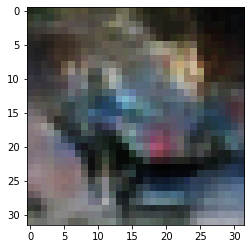

-> Epoch 87, Batch numero 1/78 -> Disc. loss on real images: 0.46165, Disc. loss on fake images: 0.61788, Generator loss: 1.11930
-> Epoch 87, Batch numero 2/78 -> Disc. loss on real images: 0.64274, Disc. loss on fake images: 0.56417, Generator loss: 1.04463
-> Epoch 87, Batch numero 3/78 -> Disc. loss on real images: 0.49678, Disc. loss on fake images: 0.52843, Generator loss: 1.16487
-> Epoch 87, Batch numero 4/78 -> Disc. loss on real images: 0.50011, Disc. loss on fake images: 0.60510, Generator loss: 1.05532
-> Epoch 87, Batch numero 5/78 -> Disc. loss on real images: 0.60133, Disc. loss on fake images: 0.69859, Generator loss: 1.08629
-> Epoch 87, Batch numero 6/78 -> Disc. loss on real images: 0.66170, Disc. loss on fake images: 0.52944, Generator loss: 1.13364
-> Epoch 87, Batch numero 7/78 -> Disc. loss on real images: 0.52632, Disc. loss on fake images: 0.52815, Generator loss: 1.03894
-> Epoch 87, Batch numero 8/78 -> Disc. loss on real images: 0.62707, Disc. loss on fake i

-> Epoch 87, Batch numero 64/78 -> Disc. loss on real images: 0.60273, Disc. loss on fake images: 0.56141, Generator loss: 1.20575
-> Epoch 87, Batch numero 65/78 -> Disc. loss on real images: 0.72840, Disc. loss on fake images: 0.51414, Generator loss: 1.08401
-> Epoch 87, Batch numero 66/78 -> Disc. loss on real images: 0.60805, Disc. loss on fake images: 0.60369, Generator loss: 1.19363
-> Epoch 87, Batch numero 67/78 -> Disc. loss on real images: 0.61242, Disc. loss on fake images: 0.59286, Generator loss: 1.18751
-> Epoch 87, Batch numero 68/78 -> Disc. loss on real images: 0.58413, Disc. loss on fake images: 0.64221, Generator loss: 1.23185
-> Epoch 87, Batch numero 69/78 -> Disc. loss on real images: 0.62536, Disc. loss on fake images: 0.63548, Generator loss: 1.25353
-> Epoch 87, Batch numero 70/78 -> Disc. loss on real images: 0.69772, Disc. loss on fake images: 0.52756, Generator loss: 1.15701
-> Epoch 87, Batch numero 71/78 -> Disc. loss on real images: 0.53963, Disc. loss o

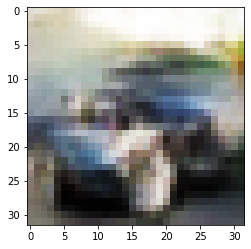

-> Epoch 88, Batch numero 1/78 -> Disc. loss on real images: 0.52302, Disc. loss on fake images: 0.51066, Generator loss: 1.24560
-> Epoch 88, Batch numero 2/78 -> Disc. loss on real images: 0.63946, Disc. loss on fake images: 0.46179, Generator loss: 1.24392
-> Epoch 88, Batch numero 3/78 -> Disc. loss on real images: 0.64050, Disc. loss on fake images: 0.50740, Generator loss: 1.28973
-> Epoch 88, Batch numero 4/78 -> Disc. loss on real images: 0.47530, Disc. loss on fake images: 0.71980, Generator loss: 1.17879
-> Epoch 88, Batch numero 5/78 -> Disc. loss on real images: 0.67541, Disc. loss on fake images: 0.57714, Generator loss: 1.31655
-> Epoch 88, Batch numero 6/78 -> Disc. loss on real images: 0.58890, Disc. loss on fake images: 0.56635, Generator loss: 1.21118
-> Epoch 88, Batch numero 7/78 -> Disc. loss on real images: 0.61367, Disc. loss on fake images: 0.48048, Generator loss: 1.13190
-> Epoch 88, Batch numero 8/78 -> Disc. loss on real images: 0.60502, Disc. loss on fake i

-> Epoch 88, Batch numero 64/78 -> Disc. loss on real images: 0.51908, Disc. loss on fake images: 0.53111, Generator loss: 1.10225
-> Epoch 88, Batch numero 65/78 -> Disc. loss on real images: 0.49148, Disc. loss on fake images: 0.60961, Generator loss: 1.05061
-> Epoch 88, Batch numero 66/78 -> Disc. loss on real images: 0.46242, Disc. loss on fake images: 0.65666, Generator loss: 1.09271
-> Epoch 88, Batch numero 67/78 -> Disc. loss on real images: 0.49787, Disc. loss on fake images: 0.70409, Generator loss: 1.11205
-> Epoch 88, Batch numero 68/78 -> Disc. loss on real images: 0.46870, Disc. loss on fake images: 0.51667, Generator loss: 1.20348
-> Epoch 88, Batch numero 69/78 -> Disc. loss on real images: 0.76932, Disc. loss on fake images: 0.55054, Generator loss: 1.04884
-> Epoch 88, Batch numero 70/78 -> Disc. loss on real images: 0.62681, Disc. loss on fake images: 0.50557, Generator loss: 1.11321
-> Epoch 88, Batch numero 71/78 -> Disc. loss on real images: 0.58571, Disc. loss o

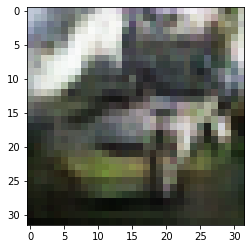

-> Epoch 89, Batch numero 1/78 -> Disc. loss on real images: 0.54223, Disc. loss on fake images: 0.61583, Generator loss: 1.17255
-> Epoch 89, Batch numero 2/78 -> Disc. loss on real images: 0.56842, Disc. loss on fake images: 0.59999, Generator loss: 1.22797
-> Epoch 89, Batch numero 3/78 -> Disc. loss on real images: 0.44765, Disc. loss on fake images: 0.57370, Generator loss: 1.16668
-> Epoch 89, Batch numero 4/78 -> Disc. loss on real images: 0.61789, Disc. loss on fake images: 0.36853, Generator loss: 1.18108
-> Epoch 89, Batch numero 5/78 -> Disc. loss on real images: 0.56195, Disc. loss on fake images: 0.52902, Generator loss: 1.16115
-> Epoch 89, Batch numero 6/78 -> Disc. loss on real images: 0.59337, Disc. loss on fake images: 0.64154, Generator loss: 1.03668
-> Epoch 89, Batch numero 7/78 -> Disc. loss on real images: 0.48161, Disc. loss on fake images: 0.59853, Generator loss: 1.08290
-> Epoch 89, Batch numero 8/78 -> Disc. loss on real images: 0.63283, Disc. loss on fake i

-> Epoch 89, Batch numero 64/78 -> Disc. loss on real images: 0.63392, Disc. loss on fake images: 0.55677, Generator loss: 1.08408
-> Epoch 89, Batch numero 65/78 -> Disc. loss on real images: 0.64348, Disc. loss on fake images: 0.60262, Generator loss: 1.01800
-> Epoch 89, Batch numero 66/78 -> Disc. loss on real images: 0.44690, Disc. loss on fake images: 0.56089, Generator loss: 1.07248
-> Epoch 89, Batch numero 67/78 -> Disc. loss on real images: 0.47497, Disc. loss on fake images: 0.56532, Generator loss: 1.16160
-> Epoch 89, Batch numero 68/78 -> Disc. loss on real images: 0.55706, Disc. loss on fake images: 0.65430, Generator loss: 1.27846
-> Epoch 89, Batch numero 69/78 -> Disc. loss on real images: 0.66320, Disc. loss on fake images: 0.46519, Generator loss: 1.21461
-> Epoch 89, Batch numero 70/78 -> Disc. loss on real images: 0.73421, Disc. loss on fake images: 0.57954, Generator loss: 1.23435
-> Epoch 89, Batch numero 71/78 -> Disc. loss on real images: 0.60587, Disc. loss o

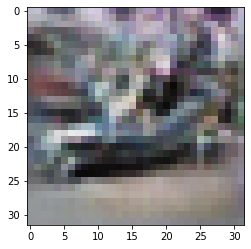

-> Epoch 90, Batch numero 1/78 -> Disc. loss on real images: 0.62921, Disc. loss on fake images: 0.59005, Generator loss: 1.11169
-> Epoch 90, Batch numero 2/78 -> Disc. loss on real images: 0.61415, Disc. loss on fake images: 0.54205, Generator loss: 1.19527
-> Epoch 90, Batch numero 3/78 -> Disc. loss on real images: 0.45846, Disc. loss on fake images: 0.64629, Generator loss: 1.23237
-> Epoch 90, Batch numero 4/78 -> Disc. loss on real images: 0.63256, Disc. loss on fake images: 0.51984, Generator loss: 1.25461
-> Epoch 90, Batch numero 5/78 -> Disc. loss on real images: 0.69362, Disc. loss on fake images: 0.55236, Generator loss: 1.13735
-> Epoch 90, Batch numero 6/78 -> Disc. loss on real images: 0.58157, Disc. loss on fake images: 0.61329, Generator loss: 1.10678
-> Epoch 90, Batch numero 7/78 -> Disc. loss on real images: 0.60198, Disc. loss on fake images: 0.49688, Generator loss: 1.03656
-> Epoch 90, Batch numero 8/78 -> Disc. loss on real images: 0.54809, Disc. loss on fake i

-> Epoch 90, Batch numero 64/78 -> Disc. loss on real images: 0.79792, Disc. loss on fake images: 0.47947, Generator loss: 1.07834
-> Epoch 90, Batch numero 65/78 -> Disc. loss on real images: 0.58783, Disc. loss on fake images: 0.58834, Generator loss: 0.99357
-> Epoch 90, Batch numero 66/78 -> Disc. loss on real images: 0.52112, Disc. loss on fake images: 0.60988, Generator loss: 1.12404
-> Epoch 90, Batch numero 67/78 -> Disc. loss on real images: 0.54180, Disc. loss on fake images: 0.64679, Generator loss: 1.22490
-> Epoch 90, Batch numero 68/78 -> Disc. loss on real images: 0.76082, Disc. loss on fake images: 0.45147, Generator loss: 1.12209
-> Epoch 90, Batch numero 69/78 -> Disc. loss on real images: 0.77948, Disc. loss on fake images: 0.59630, Generator loss: 1.19688
-> Epoch 90, Batch numero 70/78 -> Disc. loss on real images: 0.68343, Disc. loss on fake images: 0.62026, Generator loss: 1.04294
-> Epoch 90, Batch numero 71/78 -> Disc. loss on real images: 0.51791, Disc. loss o

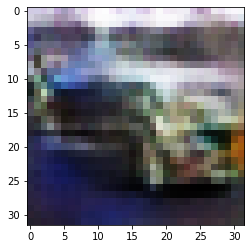

-> Epoch 91, Batch numero 1/78 -> Disc. loss on real images: 0.68121, Disc. loss on fake images: 0.50816, Generator loss: 1.03996
-> Epoch 91, Batch numero 2/78 -> Disc. loss on real images: 0.57510, Disc. loss on fake images: 0.64197, Generator loss: 1.19130
-> Epoch 91, Batch numero 3/78 -> Disc. loss on real images: 0.69640, Disc. loss on fake images: 0.49312, Generator loss: 1.28159
-> Epoch 91, Batch numero 4/78 -> Disc. loss on real images: 0.69738, Disc. loss on fake images: 0.45311, Generator loss: 1.25997
-> Epoch 91, Batch numero 5/78 -> Disc. loss on real images: 0.58757, Disc. loss on fake images: 0.51594, Generator loss: 1.23005
-> Epoch 91, Batch numero 6/78 -> Disc. loss on real images: 0.58172, Disc. loss on fake images: 0.49916, Generator loss: 1.18591
-> Epoch 91, Batch numero 7/78 -> Disc. loss on real images: 0.51103, Disc. loss on fake images: 0.38445, Generator loss: 1.18224
-> Epoch 91, Batch numero 8/78 -> Disc. loss on real images: 0.57124, Disc. loss on fake i

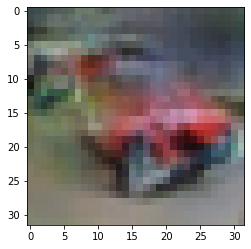

-> Epoch 92, Batch numero 1/78 -> Disc. loss on real images: 0.54392, Disc. loss on fake images: 0.69655, Generator loss: 1.17549
-> Epoch 92, Batch numero 2/78 -> Disc. loss on real images: 0.66305, Disc. loss on fake images: 0.52805, Generator loss: 1.10908
-> Epoch 92, Batch numero 3/78 -> Disc. loss on real images: 0.67347, Disc. loss on fake images: 0.56724, Generator loss: 1.02911
-> Epoch 92, Batch numero 4/78 -> Disc. loss on real images: 0.43916, Disc. loss on fake images: 0.48963, Generator loss: 1.09926
-> Epoch 92, Batch numero 5/78 -> Disc. loss on real images: 0.57256, Disc. loss on fake images: 0.56512, Generator loss: 1.02190
-> Epoch 92, Batch numero 6/78 -> Disc. loss on real images: 0.43007, Disc. loss on fake images: 0.58595, Generator loss: 1.14457
-> Epoch 92, Batch numero 7/78 -> Disc. loss on real images: 0.58315, Disc. loss on fake images: 0.64843, Generator loss: 1.11725
-> Epoch 92, Batch numero 8/78 -> Disc. loss on real images: 0.48628, Disc. loss on fake i

-> Epoch 92, Batch numero 65/78 -> Disc. loss on real images: 0.68539, Disc. loss on fake images: 0.56511, Generator loss: 1.23996
-> Epoch 92, Batch numero 66/78 -> Disc. loss on real images: 0.59028, Disc. loss on fake images: 0.54929, Generator loss: 1.24155
-> Epoch 92, Batch numero 67/78 -> Disc. loss on real images: 0.63471, Disc. loss on fake images: 0.50711, Generator loss: 1.24608
-> Epoch 92, Batch numero 68/78 -> Disc. loss on real images: 0.66053, Disc. loss on fake images: 0.42525, Generator loss: 1.32778
-> Epoch 92, Batch numero 69/78 -> Disc. loss on real images: 0.48999, Disc. loss on fake images: 0.49235, Generator loss: 1.44271
-> Epoch 92, Batch numero 70/78 -> Disc. loss on real images: 0.57346, Disc. loss on fake images: 0.39785, Generator loss: 1.24398
-> Epoch 92, Batch numero 71/78 -> Disc. loss on real images: 0.58990, Disc. loss on fake images: 0.52409, Generator loss: 1.19965
-> Epoch 92, Batch numero 72/78 -> Disc. loss on real images: 0.72594, Disc. loss o

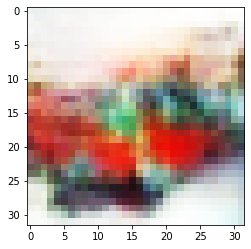

-> Epoch 93, Batch numero 1/78 -> Disc. loss on real images: 0.68456, Disc. loss on fake images: 0.64869, Generator loss: 1.06274
-> Epoch 93, Batch numero 2/78 -> Disc. loss on real images: 0.65209, Disc. loss on fake images: 0.58683, Generator loss: 1.09553
-> Epoch 93, Batch numero 3/78 -> Disc. loss on real images: 0.73643, Disc. loss on fake images: 0.50940, Generator loss: 0.97420
-> Epoch 93, Batch numero 4/78 -> Disc. loss on real images: 0.59209, Disc. loss on fake images: 0.53941, Generator loss: 0.98894
-> Epoch 93, Batch numero 5/78 -> Disc. loss on real images: 0.61514, Disc. loss on fake images: 0.72697, Generator loss: 0.95689
-> Epoch 93, Batch numero 6/78 -> Disc. loss on real images: 0.50907, Disc. loss on fake images: 0.49256, Generator loss: 1.02521
-> Epoch 93, Batch numero 7/78 -> Disc. loss on real images: 0.57139, Disc. loss on fake images: 0.61577, Generator loss: 1.12244
-> Epoch 93, Batch numero 8/78 -> Disc. loss on real images: 0.48122, Disc. loss on fake i

-> Epoch 93, Batch numero 64/78 -> Disc. loss on real images: 0.71208, Disc. loss on fake images: 0.57109, Generator loss: 1.20247
-> Epoch 93, Batch numero 65/78 -> Disc. loss on real images: 0.60662, Disc. loss on fake images: 0.51422, Generator loss: 1.08888
-> Epoch 93, Batch numero 66/78 -> Disc. loss on real images: 0.51820, Disc. loss on fake images: 0.52290, Generator loss: 1.23481
-> Epoch 93, Batch numero 67/78 -> Disc. loss on real images: 0.50311, Disc. loss on fake images: 0.58720, Generator loss: 1.21404
-> Epoch 93, Batch numero 68/78 -> Disc. loss on real images: 0.61090, Disc. loss on fake images: 0.47408, Generator loss: 1.20033
-> Epoch 93, Batch numero 69/78 -> Disc. loss on real images: 0.52667, Disc. loss on fake images: 0.54926, Generator loss: 1.12984
-> Epoch 93, Batch numero 70/78 -> Disc. loss on real images: 0.42279, Disc. loss on fake images: 0.48393, Generator loss: 1.28220
-> Epoch 93, Batch numero 71/78 -> Disc. loss on real images: 0.53263, Disc. loss o

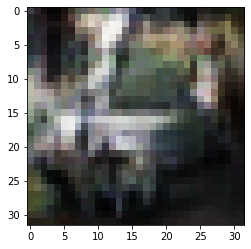

-> Epoch 94, Batch numero 1/78 -> Disc. loss on real images: 0.60711, Disc. loss on fake images: 0.70171, Generator loss: 1.26926
-> Epoch 94, Batch numero 2/78 -> Disc. loss on real images: 0.61472, Disc. loss on fake images: 0.47627, Generator loss: 1.27823
-> Epoch 94, Batch numero 3/78 -> Disc. loss on real images: 0.59260, Disc. loss on fake images: 0.54689, Generator loss: 1.24841
-> Epoch 94, Batch numero 4/78 -> Disc. loss on real images: 0.66317, Disc. loss on fake images: 0.52503, Generator loss: 1.17443
-> Epoch 94, Batch numero 5/78 -> Disc. loss on real images: 0.54899, Disc. loss on fake images: 0.48128, Generator loss: 1.22167
-> Epoch 94, Batch numero 6/78 -> Disc. loss on real images: 0.56446, Disc. loss on fake images: 0.54381, Generator loss: 1.14488
-> Epoch 94, Batch numero 7/78 -> Disc. loss on real images: 0.56359, Disc. loss on fake images: 0.56925, Generator loss: 1.00787
-> Epoch 94, Batch numero 8/78 -> Disc. loss on real images: 0.60166, Disc. loss on fake i

-> Epoch 94, Batch numero 64/78 -> Disc. loss on real images: 0.68322, Disc. loss on fake images: 0.50520, Generator loss: 1.14600
-> Epoch 94, Batch numero 65/78 -> Disc. loss on real images: 0.67905, Disc. loss on fake images: 0.53262, Generator loss: 1.15672
-> Epoch 94, Batch numero 66/78 -> Disc. loss on real images: 0.58716, Disc. loss on fake images: 0.65132, Generator loss: 1.15130
-> Epoch 94, Batch numero 67/78 -> Disc. loss on real images: 0.66151, Disc. loss on fake images: 0.52011, Generator loss: 1.07378
-> Epoch 94, Batch numero 68/78 -> Disc. loss on real images: 0.45848, Disc. loss on fake images: 0.49006, Generator loss: 1.19026
-> Epoch 94, Batch numero 69/78 -> Disc. loss on real images: 0.59673, Disc. loss on fake images: 0.52964, Generator loss: 1.19449
-> Epoch 94, Batch numero 70/78 -> Disc. loss on real images: 0.58051, Disc. loss on fake images: 0.56591, Generator loss: 1.11063
-> Epoch 94, Batch numero 71/78 -> Disc. loss on real images: 0.56236, Disc. loss o

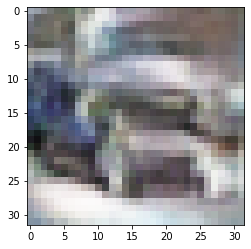

-> Epoch 95, Batch numero 1/78 -> Disc. loss on real images: 0.46003, Disc. loss on fake images: 0.51920, Generator loss: 1.18631
-> Epoch 95, Batch numero 2/78 -> Disc. loss on real images: 0.59366, Disc. loss on fake images: 0.55215, Generator loss: 1.12975
-> Epoch 95, Batch numero 3/78 -> Disc. loss on real images: 0.47763, Disc. loss on fake images: 0.59753, Generator loss: 1.10733
-> Epoch 95, Batch numero 4/78 -> Disc. loss on real images: 0.58377, Disc. loss on fake images: 0.71814, Generator loss: 1.09862
-> Epoch 95, Batch numero 5/78 -> Disc. loss on real images: 0.67352, Disc. loss on fake images: 0.47773, Generator loss: 1.22645
-> Epoch 95, Batch numero 6/78 -> Disc. loss on real images: 0.63641, Disc. loss on fake images: 0.69982, Generator loss: 1.20633
-> Epoch 95, Batch numero 7/78 -> Disc. loss on real images: 0.56646, Disc. loss on fake images: 0.42430, Generator loss: 1.19637
-> Epoch 95, Batch numero 8/78 -> Disc. loss on real images: 0.62111, Disc. loss on fake i

-> Epoch 95, Batch numero 66/78 -> Disc. loss on real images: 0.59867, Disc. loss on fake images: 0.47234, Generator loss: 1.24414
-> Epoch 95, Batch numero 67/78 -> Disc. loss on real images: 0.70512, Disc. loss on fake images: 0.54810, Generator loss: 1.16768
-> Epoch 95, Batch numero 68/78 -> Disc. loss on real images: 0.68146, Disc. loss on fake images: 0.47970, Generator loss: 1.08285
-> Epoch 95, Batch numero 69/78 -> Disc. loss on real images: 0.53129, Disc. loss on fake images: 0.51622, Generator loss: 1.02862
-> Epoch 95, Batch numero 70/78 -> Disc. loss on real images: 0.62339, Disc. loss on fake images: 0.61637, Generator loss: 1.07954
-> Epoch 95, Batch numero 71/78 -> Disc. loss on real images: 0.48876, Disc. loss on fake images: 0.52630, Generator loss: 1.11302
-> Epoch 95, Batch numero 72/78 -> Disc. loss on real images: 0.64011, Disc. loss on fake images: 0.62035, Generator loss: 1.11298
-> Epoch 95, Batch numero 73/78 -> Disc. loss on real images: 0.61986, Disc. loss o

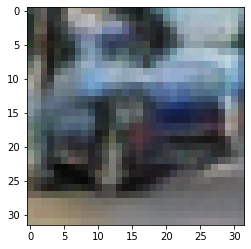

-> Epoch 96, Batch numero 1/78 -> Disc. loss on real images: 0.57319, Disc. loss on fake images: 0.61558, Generator loss: 1.21083
-> Epoch 96, Batch numero 2/78 -> Disc. loss on real images: 0.62059, Disc. loss on fake images: 0.52752, Generator loss: 1.17252
-> Epoch 96, Batch numero 3/78 -> Disc. loss on real images: 0.54343, Disc. loss on fake images: 0.67283, Generator loss: 1.19300
-> Epoch 96, Batch numero 4/78 -> Disc. loss on real images: 0.63154, Disc. loss on fake images: 0.53243, Generator loss: 1.19471
-> Epoch 96, Batch numero 5/78 -> Disc. loss on real images: 0.64937, Disc. loss on fake images: 0.56553, Generator loss: 1.10151
-> Epoch 96, Batch numero 6/78 -> Disc. loss on real images: 0.56285, Disc. loss on fake images: 0.53854, Generator loss: 1.11669
-> Epoch 96, Batch numero 7/78 -> Disc. loss on real images: 0.59274, Disc. loss on fake images: 0.62768, Generator loss: 1.05832
-> Epoch 96, Batch numero 8/78 -> Disc. loss on real images: 0.61833, Disc. loss on fake i

-> Epoch 96, Batch numero 64/78 -> Disc. loss on real images: 0.70670, Disc. loss on fake images: 0.78967, Generator loss: 1.21739
-> Epoch 96, Batch numero 65/78 -> Disc. loss on real images: 0.65360, Disc. loss on fake images: 0.47892, Generator loss: 1.17282
-> Epoch 96, Batch numero 66/78 -> Disc. loss on real images: 0.60635, Disc. loss on fake images: 0.68215, Generator loss: 1.13372
-> Epoch 96, Batch numero 67/78 -> Disc. loss on real images: 0.68255, Disc. loss on fake images: 0.64558, Generator loss: 1.21322
-> Epoch 96, Batch numero 68/78 -> Disc. loss on real images: 0.70460, Disc. loss on fake images: 0.60318, Generator loss: 1.10849
-> Epoch 96, Batch numero 69/78 -> Disc. loss on real images: 0.53234, Disc. loss on fake images: 0.54955, Generator loss: 1.06007
-> Epoch 96, Batch numero 70/78 -> Disc. loss on real images: 0.55621, Disc. loss on fake images: 0.60442, Generator loss: 1.16817
-> Epoch 96, Batch numero 71/78 -> Disc. loss on real images: 0.57538, Disc. loss o

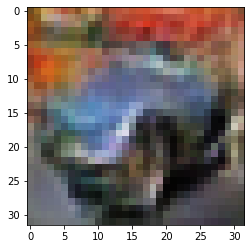

-> Epoch 97, Batch numero 1/78 -> Disc. loss on real images: 0.65742, Disc. loss on fake images: 0.49189, Generator loss: 1.10869
-> Epoch 97, Batch numero 2/78 -> Disc. loss on real images: 0.57020, Disc. loss on fake images: 0.62000, Generator loss: 1.05451
-> Epoch 97, Batch numero 3/78 -> Disc. loss on real images: 0.54492, Disc. loss on fake images: 0.51317, Generator loss: 1.10215
-> Epoch 97, Batch numero 4/78 -> Disc. loss on real images: 0.53648, Disc. loss on fake images: 0.56180, Generator loss: 1.18496
-> Epoch 97, Batch numero 5/78 -> Disc. loss on real images: 0.59530, Disc. loss on fake images: 0.72586, Generator loss: 1.31456
-> Epoch 97, Batch numero 6/78 -> Disc. loss on real images: 0.57743, Disc. loss on fake images: 0.46809, Generator loss: 1.29544
-> Epoch 97, Batch numero 7/78 -> Disc. loss on real images: 0.57702, Disc. loss on fake images: 0.59405, Generator loss: 1.07154
-> Epoch 97, Batch numero 8/78 -> Disc. loss on real images: 0.50801, Disc. loss on fake i

-> Epoch 97, Batch numero 64/78 -> Disc. loss on real images: 0.52200, Disc. loss on fake images: 0.47272, Generator loss: 1.19409
-> Epoch 97, Batch numero 65/78 -> Disc. loss on real images: 0.51673, Disc. loss on fake images: 0.51851, Generator loss: 1.18833
-> Epoch 97, Batch numero 66/78 -> Disc. loss on real images: 0.55942, Disc. loss on fake images: 0.64904, Generator loss: 1.21109
-> Epoch 97, Batch numero 67/78 -> Disc. loss on real images: 0.57002, Disc. loss on fake images: 0.56849, Generator loss: 1.23811
-> Epoch 97, Batch numero 68/78 -> Disc. loss on real images: 0.53468, Disc. loss on fake images: 0.59964, Generator loss: 1.25308
-> Epoch 97, Batch numero 69/78 -> Disc. loss on real images: 0.79087, Disc. loss on fake images: 0.48425, Generator loss: 1.10810
-> Epoch 97, Batch numero 70/78 -> Disc. loss on real images: 0.61591, Disc. loss on fake images: 0.60523, Generator loss: 1.16525
-> Epoch 97, Batch numero 71/78 -> Disc. loss on real images: 0.64063, Disc. loss o

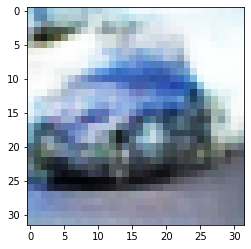

-> Epoch 98, Batch numero 1/78 -> Disc. loss on real images: 0.54661, Disc. loss on fake images: 0.62161, Generator loss: 1.01820
-> Epoch 98, Batch numero 2/78 -> Disc. loss on real images: 0.64429, Disc. loss on fake images: 0.63879, Generator loss: 1.13459
-> Epoch 98, Batch numero 3/78 -> Disc. loss on real images: 0.55841, Disc. loss on fake images: 0.56154, Generator loss: 1.09932
-> Epoch 98, Batch numero 4/78 -> Disc. loss on real images: 0.66114, Disc. loss on fake images: 0.55339, Generator loss: 1.17100
-> Epoch 98, Batch numero 5/78 -> Disc. loss on real images: 0.72427, Disc. loss on fake images: 0.55789, Generator loss: 1.09339
-> Epoch 98, Batch numero 6/78 -> Disc. loss on real images: 0.54870, Disc. loss on fake images: 0.51966, Generator loss: 1.06073
-> Epoch 98, Batch numero 7/78 -> Disc. loss on real images: 0.55758, Disc. loss on fake images: 0.61066, Generator loss: 1.18193
-> Epoch 98, Batch numero 8/78 -> Disc. loss on real images: 0.63117, Disc. loss on fake i

-> Epoch 98, Batch numero 64/78 -> Disc. loss on real images: 0.55768, Disc. loss on fake images: 0.64589, Generator loss: 1.02491
-> Epoch 98, Batch numero 65/78 -> Disc. loss on real images: 0.59954, Disc. loss on fake images: 0.61146, Generator loss: 1.03300
-> Epoch 98, Batch numero 66/78 -> Disc. loss on real images: 0.63775, Disc. loss on fake images: 0.57167, Generator loss: 1.15847
-> Epoch 98, Batch numero 67/78 -> Disc. loss on real images: 0.70821, Disc. loss on fake images: 0.47160, Generator loss: 1.07083
-> Epoch 98, Batch numero 68/78 -> Disc. loss on real images: 0.53120, Disc. loss on fake images: 0.68835, Generator loss: 1.13099
-> Epoch 98, Batch numero 69/78 -> Disc. loss on real images: 0.50994, Disc. loss on fake images: 0.62726, Generator loss: 1.16704
-> Epoch 98, Batch numero 70/78 -> Disc. loss on real images: 0.53571, Disc. loss on fake images: 0.51121, Generator loss: 1.17913
-> Epoch 98, Batch numero 71/78 -> Disc. loss on real images: 0.46484, Disc. loss o

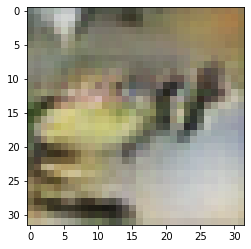

-> Epoch 99, Batch numero 1/78 -> Disc. loss on real images: 0.59506, Disc. loss on fake images: 0.53993, Generator loss: 1.23498
-> Epoch 99, Batch numero 2/78 -> Disc. loss on real images: 0.53805, Disc. loss on fake images: 0.53584, Generator loss: 1.22104
-> Epoch 99, Batch numero 3/78 -> Disc. loss on real images: 0.63279, Disc. loss on fake images: 0.63832, Generator loss: 1.26873
-> Epoch 99, Batch numero 4/78 -> Disc. loss on real images: 0.59188, Disc. loss on fake images: 0.46590, Generator loss: 1.13267
-> Epoch 99, Batch numero 5/78 -> Disc. loss on real images: 0.59157, Disc. loss on fake images: 0.52824, Generator loss: 1.03214
-> Epoch 99, Batch numero 6/78 -> Disc. loss on real images: 0.65476, Disc. loss on fake images: 0.58387, Generator loss: 1.07818
-> Epoch 99, Batch numero 7/78 -> Disc. loss on real images: 0.55789, Disc. loss on fake images: 0.62389, Generator loss: 1.07292
-> Epoch 99, Batch numero 8/78 -> Disc. loss on real images: 0.57731, Disc. loss on fake i

-> Epoch 99, Batch numero 64/78 -> Disc. loss on real images: 0.53855, Disc. loss on fake images: 0.52414, Generator loss: 1.26253
-> Epoch 99, Batch numero 65/78 -> Disc. loss on real images: 0.62406, Disc. loss on fake images: 0.51873, Generator loss: 1.16075
-> Epoch 99, Batch numero 66/78 -> Disc. loss on real images: 0.59169, Disc. loss on fake images: 0.48539, Generator loss: 1.14903
-> Epoch 99, Batch numero 67/78 -> Disc. loss on real images: 0.66336, Disc. loss on fake images: 0.59085, Generator loss: 1.02497
-> Epoch 99, Batch numero 68/78 -> Disc. loss on real images: 0.48755, Disc. loss on fake images: 0.58542, Generator loss: 0.98709
-> Epoch 99, Batch numero 69/78 -> Disc. loss on real images: 0.44191, Disc. loss on fake images: 0.68730, Generator loss: 1.15797
-> Epoch 99, Batch numero 70/78 -> Disc. loss on real images: 0.68774, Disc. loss on fake images: 0.56845, Generator loss: 1.13644
-> Epoch 99, Batch numero 71/78 -> Disc. loss on real images: 0.71329, Disc. loss o

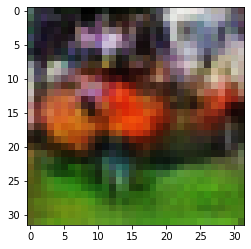

-> Epoch 100, Batch numero 1/78 -> Disc. loss on real images: 0.58287, Disc. loss on fake images: 0.50331, Generator loss: 1.12317
-> Epoch 100, Batch numero 2/78 -> Disc. loss on real images: 0.52363, Disc. loss on fake images: 0.55929, Generator loss: 1.07892
-> Epoch 100, Batch numero 3/78 -> Disc. loss on real images: 0.57951, Disc. loss on fake images: 0.64134, Generator loss: 1.11730
-> Epoch 100, Batch numero 4/78 -> Disc. loss on real images: 0.65449, Disc. loss on fake images: 0.69868, Generator loss: 1.09019
-> Epoch 100, Batch numero 5/78 -> Disc. loss on real images: 0.60339, Disc. loss on fake images: 0.64232, Generator loss: 1.19420
-> Epoch 100, Batch numero 6/78 -> Disc. loss on real images: 0.56078, Disc. loss on fake images: 0.54067, Generator loss: 1.10835
-> Epoch 100, Batch numero 7/78 -> Disc. loss on real images: 0.57604, Disc. loss on fake images: 0.51619, Generator loss: 1.15274
-> Epoch 100, Batch numero 8/78 -> Disc. loss on real images: 0.51121, Disc. loss o

-> Epoch 100, Batch numero 64/78 -> Disc. loss on real images: 0.55853, Disc. loss on fake images: 0.50377, Generator loss: 1.21012
-> Epoch 100, Batch numero 65/78 -> Disc. loss on real images: 0.64269, Disc. loss on fake images: 0.51666, Generator loss: 1.23819
-> Epoch 100, Batch numero 66/78 -> Disc. loss on real images: 0.47872, Disc. loss on fake images: 0.48435, Generator loss: 1.19017
-> Epoch 100, Batch numero 67/78 -> Disc. loss on real images: 0.74484, Disc. loss on fake images: 0.63878, Generator loss: 1.02255
-> Epoch 100, Batch numero 68/78 -> Disc. loss on real images: 0.57022, Disc. loss on fake images: 0.64454, Generator loss: 1.16763
-> Epoch 100, Batch numero 69/78 -> Disc. loss on real images: 0.73639, Disc. loss on fake images: 0.79756, Generator loss: 1.06246
-> Epoch 100, Batch numero 70/78 -> Disc. loss on real images: 0.68748, Disc. loss on fake images: 0.55899, Generator loss: 1.22484
-> Epoch 100, Batch numero 71/78 -> Disc. loss on real images: 0.60933, Disc

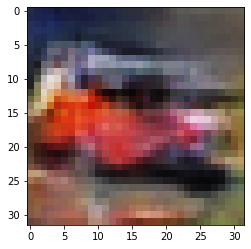

-> Epoch 101, Batch numero 1/78 -> Disc. loss on real images: 0.46713, Disc. loss on fake images: 0.58341, Generator loss: 1.11633
-> Epoch 101, Batch numero 2/78 -> Disc. loss on real images: 0.55140, Disc. loss on fake images: 0.53067, Generator loss: 1.09805
-> Epoch 101, Batch numero 3/78 -> Disc. loss on real images: 0.59575, Disc. loss on fake images: 0.48716, Generator loss: 1.11221
-> Epoch 101, Batch numero 4/78 -> Disc. loss on real images: 0.70902, Disc. loss on fake images: 0.49703, Generator loss: 1.06524
-> Epoch 101, Batch numero 5/78 -> Disc. loss on real images: 0.49217, Disc. loss on fake images: 0.63824, Generator loss: 1.03272
-> Epoch 101, Batch numero 6/78 -> Disc. loss on real images: 0.49701, Disc. loss on fake images: 0.56012, Generator loss: 1.11098
-> Epoch 101, Batch numero 7/78 -> Disc. loss on real images: 0.54306, Disc. loss on fake images: 0.50036, Generator loss: 1.04090
-> Epoch 101, Batch numero 8/78 -> Disc. loss on real images: 0.58586, Disc. loss o

-> Epoch 101, Batch numero 64/78 -> Disc. loss on real images: 0.57041, Disc. loss on fake images: 0.59951, Generator loss: 1.05534
-> Epoch 101, Batch numero 65/78 -> Disc. loss on real images: 0.40486, Disc. loss on fake images: 0.58330, Generator loss: 1.11525
-> Epoch 101, Batch numero 66/78 -> Disc. loss on real images: 0.45081, Disc. loss on fake images: 0.57861, Generator loss: 1.19294
-> Epoch 101, Batch numero 67/78 -> Disc. loss on real images: 0.55811, Disc. loss on fake images: 0.43554, Generator loss: 1.22866
-> Epoch 101, Batch numero 68/78 -> Disc. loss on real images: 0.63344, Disc. loss on fake images: 0.49904, Generator loss: 1.20584
-> Epoch 101, Batch numero 69/78 -> Disc. loss on real images: 0.57987, Disc. loss on fake images: 0.49385, Generator loss: 1.21132
-> Epoch 101, Batch numero 70/78 -> Disc. loss on real images: 0.66232, Disc. loss on fake images: 0.50618, Generator loss: 1.19663
-> Epoch 101, Batch numero 71/78 -> Disc. loss on real images: 0.46443, Disc

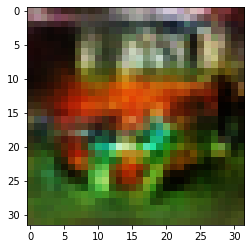

-> Epoch 102, Batch numero 1/78 -> Disc. loss on real images: 0.57576, Disc. loss on fake images: 0.52022, Generator loss: 1.29474
-> Epoch 102, Batch numero 2/78 -> Disc. loss on real images: 0.54833, Disc. loss on fake images: 0.59295, Generator loss: 1.26456
-> Epoch 102, Batch numero 3/78 -> Disc. loss on real images: 0.70001, Disc. loss on fake images: 0.51284, Generator loss: 1.29376
-> Epoch 102, Batch numero 4/78 -> Disc. loss on real images: 0.68328, Disc. loss on fake images: 0.61348, Generator loss: 1.26843
-> Epoch 102, Batch numero 5/78 -> Disc. loss on real images: 0.70568, Disc. loss on fake images: 0.58216, Generator loss: 1.22467
-> Epoch 102, Batch numero 6/78 -> Disc. loss on real images: 0.70073, Disc. loss on fake images: 0.51310, Generator loss: 1.25171
-> Epoch 102, Batch numero 7/78 -> Disc. loss on real images: 0.75965, Disc. loss on fake images: 0.60013, Generator loss: 1.22143
-> Epoch 102, Batch numero 8/78 -> Disc. loss on real images: 0.71562, Disc. loss o

-> Epoch 102, Batch numero 64/78 -> Disc. loss on real images: 0.63774, Disc. loss on fake images: 0.56540, Generator loss: 1.12124
-> Epoch 102, Batch numero 65/78 -> Disc. loss on real images: 0.66777, Disc. loss on fake images: 0.70587, Generator loss: 1.16991
-> Epoch 102, Batch numero 66/78 -> Disc. loss on real images: 0.63424, Disc. loss on fake images: 0.55334, Generator loss: 1.14996
-> Epoch 102, Batch numero 67/78 -> Disc. loss on real images: 0.63762, Disc. loss on fake images: 0.39783, Generator loss: 1.10318
-> Epoch 102, Batch numero 68/78 -> Disc. loss on real images: 0.62490, Disc. loss on fake images: 0.56381, Generator loss: 1.16697
-> Epoch 102, Batch numero 69/78 -> Disc. loss on real images: 0.49240, Disc. loss on fake images: 0.50468, Generator loss: 1.22728
-> Epoch 102, Batch numero 70/78 -> Disc. loss on real images: 0.58376, Disc. loss on fake images: 0.56369, Generator loss: 1.01099
-> Epoch 102, Batch numero 71/78 -> Disc. loss on real images: 0.60230, Disc

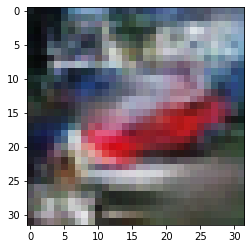

-> Epoch 103, Batch numero 1/78 -> Disc. loss on real images: 0.58571, Disc. loss on fake images: 0.61482, Generator loss: 0.95071
-> Epoch 103, Batch numero 2/78 -> Disc. loss on real images: 0.52480, Disc. loss on fake images: 0.62755, Generator loss: 1.10279
-> Epoch 103, Batch numero 3/78 -> Disc. loss on real images: 0.46547, Disc. loss on fake images: 0.44599, Generator loss: 1.14960
-> Epoch 103, Batch numero 4/78 -> Disc. loss on real images: 0.66211, Disc. loss on fake images: 0.53842, Generator loss: 1.05425
-> Epoch 103, Batch numero 5/78 -> Disc. loss on real images: 0.63105, Disc. loss on fake images: 0.50690, Generator loss: 1.02132
-> Epoch 103, Batch numero 6/78 -> Disc. loss on real images: 0.49402, Disc. loss on fake images: 0.54268, Generator loss: 1.03451
-> Epoch 103, Batch numero 7/78 -> Disc. loss on real images: 0.52871, Disc. loss on fake images: 0.50806, Generator loss: 1.11178
-> Epoch 103, Batch numero 8/78 -> Disc. loss on real images: 0.38857, Disc. loss o

-> Epoch 103, Batch numero 66/78 -> Disc. loss on real images: 0.58125, Disc. loss on fake images: 0.55126, Generator loss: 1.07771
-> Epoch 103, Batch numero 67/78 -> Disc. loss on real images: 0.50686, Disc. loss on fake images: 0.59709, Generator loss: 1.18160
-> Epoch 103, Batch numero 68/78 -> Disc. loss on real images: 0.59813, Disc. loss on fake images: 0.49588, Generator loss: 1.23548
-> Epoch 103, Batch numero 69/78 -> Disc. loss on real images: 0.58132, Disc. loss on fake images: 0.46119, Generator loss: 1.13902
-> Epoch 103, Batch numero 70/78 -> Disc. loss on real images: 0.58180, Disc. loss on fake images: 0.52761, Generator loss: 1.10641
-> Epoch 103, Batch numero 71/78 -> Disc. loss on real images: 0.54758, Disc. loss on fake images: 0.59957, Generator loss: 1.16923
-> Epoch 103, Batch numero 72/78 -> Disc. loss on real images: 0.58430, Disc. loss on fake images: 0.80066, Generator loss: 1.25591
-> Epoch 103, Batch numero 73/78 -> Disc. loss on real images: 0.64593, Disc

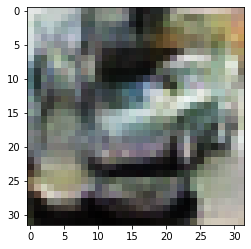

-> Epoch 104, Batch numero 1/78 -> Disc. loss on real images: 0.48558, Disc. loss on fake images: 0.57424, Generator loss: 1.21670
-> Epoch 104, Batch numero 2/78 -> Disc. loss on real images: 0.76700, Disc. loss on fake images: 0.53148, Generator loss: 1.16730
-> Epoch 104, Batch numero 3/78 -> Disc. loss on real images: 0.47843, Disc. loss on fake images: 0.60145, Generator loss: 1.21793
-> Epoch 104, Batch numero 4/78 -> Disc. loss on real images: 0.56283, Disc. loss on fake images: 0.51351, Generator loss: 1.19422
-> Epoch 104, Batch numero 5/78 -> Disc. loss on real images: 0.58468, Disc. loss on fake images: 0.43191, Generator loss: 1.21592
-> Epoch 104, Batch numero 6/78 -> Disc. loss on real images: 0.63082, Disc. loss on fake images: 0.53560, Generator loss: 1.13035
-> Epoch 104, Batch numero 7/78 -> Disc. loss on real images: 0.60411, Disc. loss on fake images: 0.63040, Generator loss: 1.00023
-> Epoch 104, Batch numero 8/78 -> Disc. loss on real images: 0.63259, Disc. loss o

-> Epoch 104, Batch numero 64/78 -> Disc. loss on real images: 0.63068, Disc. loss on fake images: 0.53805, Generator loss: 1.13358
-> Epoch 104, Batch numero 65/78 -> Disc. loss on real images: 0.70926, Disc. loss on fake images: 0.50361, Generator loss: 1.09963
-> Epoch 104, Batch numero 66/78 -> Disc. loss on real images: 0.62367, Disc. loss on fake images: 0.58786, Generator loss: 0.99120
-> Epoch 104, Batch numero 67/78 -> Disc. loss on real images: 0.54341, Disc. loss on fake images: 0.64925, Generator loss: 1.06990
-> Epoch 104, Batch numero 68/78 -> Disc. loss on real images: 0.64371, Disc. loss on fake images: 0.53069, Generator loss: 1.21407
-> Epoch 104, Batch numero 69/78 -> Disc. loss on real images: 0.58771, Disc. loss on fake images: 0.63832, Generator loss: 1.31554
-> Epoch 104, Batch numero 70/78 -> Disc. loss on real images: 0.62812, Disc. loss on fake images: 0.48030, Generator loss: 1.29331
-> Epoch 104, Batch numero 71/78 -> Disc. loss on real images: 0.51423, Disc

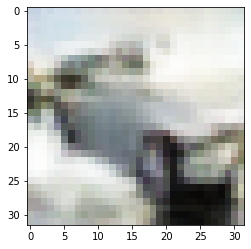

-> Epoch 105, Batch numero 1/78 -> Disc. loss on real images: 0.58894, Disc. loss on fake images: 0.58308, Generator loss: 1.25861
-> Epoch 105, Batch numero 2/78 -> Disc. loss on real images: 0.67957, Disc. loss on fake images: 0.59438, Generator loss: 1.26555
-> Epoch 105, Batch numero 3/78 -> Disc. loss on real images: 0.66368, Disc. loss on fake images: 0.56680, Generator loss: 1.22398
-> Epoch 105, Batch numero 4/78 -> Disc. loss on real images: 0.60806, Disc. loss on fake images: 0.49036, Generator loss: 1.19690
-> Epoch 105, Batch numero 5/78 -> Disc. loss on real images: 0.55882, Disc. loss on fake images: 0.61325, Generator loss: 1.11480
-> Epoch 105, Batch numero 6/78 -> Disc. loss on real images: 0.57357, Disc. loss on fake images: 0.55084, Generator loss: 1.17441
-> Epoch 105, Batch numero 7/78 -> Disc. loss on real images: 0.58914, Disc. loss on fake images: 0.51800, Generator loss: 1.06533
-> Epoch 105, Batch numero 8/78 -> Disc. loss on real images: 0.58018, Disc. loss o

-> Epoch 105, Batch numero 64/78 -> Disc. loss on real images: 0.58660, Disc. loss on fake images: 0.51429, Generator loss: 1.18231
-> Epoch 105, Batch numero 65/78 -> Disc. loss on real images: 0.45277, Disc. loss on fake images: 0.67477, Generator loss: 1.25222
-> Epoch 105, Batch numero 66/78 -> Disc. loss on real images: 0.64235, Disc. loss on fake images: 0.59208, Generator loss: 1.12648
-> Epoch 105, Batch numero 67/78 -> Disc. loss on real images: 0.62224, Disc. loss on fake images: 0.56888, Generator loss: 1.29409
-> Epoch 105, Batch numero 68/78 -> Disc. loss on real images: 0.53359, Disc. loss on fake images: 0.52087, Generator loss: 1.33541
-> Epoch 105, Batch numero 69/78 -> Disc. loss on real images: 0.73278, Disc. loss on fake images: 0.59382, Generator loss: 1.08538
-> Epoch 105, Batch numero 70/78 -> Disc. loss on real images: 0.59838, Disc. loss on fake images: 0.56807, Generator loss: 1.02117
-> Epoch 105, Batch numero 71/78 -> Disc. loss on real images: 0.55057, Disc

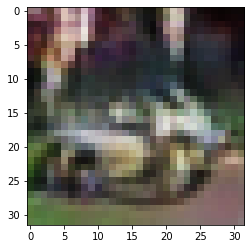

-> Epoch 106, Batch numero 1/78 -> Disc. loss on real images: 0.71344, Disc. loss on fake images: 0.58685, Generator loss: 1.17750
-> Epoch 106, Batch numero 2/78 -> Disc. loss on real images: 0.62344, Disc. loss on fake images: 0.60836, Generator loss: 1.16887
-> Epoch 106, Batch numero 3/78 -> Disc. loss on real images: 0.67892, Disc. loss on fake images: 0.54592, Generator loss: 1.29808
-> Epoch 106, Batch numero 4/78 -> Disc. loss on real images: 0.56102, Disc. loss on fake images: 0.59617, Generator loss: 1.26417
-> Epoch 106, Batch numero 5/78 -> Disc. loss on real images: 0.68256, Disc. loss on fake images: 0.59700, Generator loss: 1.16230
-> Epoch 106, Batch numero 6/78 -> Disc. loss on real images: 0.53045, Disc. loss on fake images: 0.51221, Generator loss: 1.21696
-> Epoch 106, Batch numero 7/78 -> Disc. loss on real images: 0.54003, Disc. loss on fake images: 0.56692, Generator loss: 1.16001
-> Epoch 106, Batch numero 8/78 -> Disc. loss on real images: 0.64284, Disc. loss o

-> Epoch 106, Batch numero 64/78 -> Disc. loss on real images: 0.47779, Disc. loss on fake images: 0.51504, Generator loss: 1.07959
-> Epoch 106, Batch numero 65/78 -> Disc. loss on real images: 0.58428, Disc. loss on fake images: 0.51850, Generator loss: 1.05104
-> Epoch 106, Batch numero 66/78 -> Disc. loss on real images: 0.52316, Disc. loss on fake images: 0.61724, Generator loss: 1.07302
-> Epoch 106, Batch numero 67/78 -> Disc. loss on real images: 0.45677, Disc. loss on fake images: 0.60991, Generator loss: 1.05584
-> Epoch 106, Batch numero 68/78 -> Disc. loss on real images: 0.57712, Disc. loss on fake images: 0.61737, Generator loss: 1.04534
-> Epoch 106, Batch numero 69/78 -> Disc. loss on real images: 0.55507, Disc. loss on fake images: 0.58440, Generator loss: 1.20175
-> Epoch 106, Batch numero 70/78 -> Disc. loss on real images: 0.60716, Disc. loss on fake images: 0.66118, Generator loss: 1.26145
-> Epoch 106, Batch numero 71/78 -> Disc. loss on real images: 0.61621, Disc

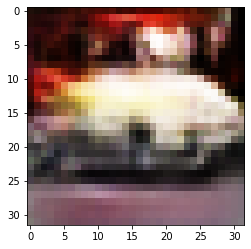

-> Epoch 107, Batch numero 1/78 -> Disc. loss on real images: 0.48559, Disc. loss on fake images: 0.68091, Generator loss: 1.18332
-> Epoch 107, Batch numero 2/78 -> Disc. loss on real images: 0.67282, Disc. loss on fake images: 0.46449, Generator loss: 1.05404
-> Epoch 107, Batch numero 3/78 -> Disc. loss on real images: 0.55990, Disc. loss on fake images: 0.64003, Generator loss: 1.12192
-> Epoch 107, Batch numero 4/78 -> Disc. loss on real images: 0.47175, Disc. loss on fake images: 0.51369, Generator loss: 1.14055
-> Epoch 107, Batch numero 5/78 -> Disc. loss on real images: 0.61342, Disc. loss on fake images: 0.66227, Generator loss: 1.17346
-> Epoch 107, Batch numero 6/78 -> Disc. loss on real images: 0.55800, Disc. loss on fake images: 0.48774, Generator loss: 1.16236
-> Epoch 107, Batch numero 7/78 -> Disc. loss on real images: 0.53429, Disc. loss on fake images: 0.55538, Generator loss: 1.24988
-> Epoch 107, Batch numero 8/78 -> Disc. loss on real images: 0.52453, Disc. loss o

-> Epoch 107, Batch numero 66/78 -> Disc. loss on real images: 0.76060, Disc. loss on fake images: 0.47165, Generator loss: 1.15748
-> Epoch 107, Batch numero 67/78 -> Disc. loss on real images: 0.53293, Disc. loss on fake images: 0.64505, Generator loss: 1.13573
-> Epoch 107, Batch numero 68/78 -> Disc. loss on real images: 0.59792, Disc. loss on fake images: 0.48405, Generator loss: 1.18497
-> Epoch 107, Batch numero 69/78 -> Disc. loss on real images: 0.58337, Disc. loss on fake images: 0.47076, Generator loss: 1.27324
-> Epoch 107, Batch numero 70/78 -> Disc. loss on real images: 0.61547, Disc. loss on fake images: 0.54300, Generator loss: 1.09853
-> Epoch 107, Batch numero 71/78 -> Disc. loss on real images: 0.61832, Disc. loss on fake images: 0.54665, Generator loss: 1.12535
-> Epoch 107, Batch numero 72/78 -> Disc. loss on real images: 0.45150, Disc. loss on fake images: 0.57086, Generator loss: 1.10339
-> Epoch 107, Batch numero 73/78 -> Disc. loss on real images: 0.64846, Disc

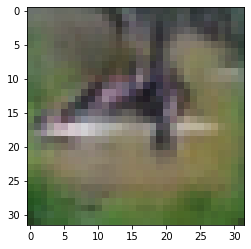

-> Epoch 108, Batch numero 1/78 -> Disc. loss on real images: 0.58280, Disc. loss on fake images: 0.52963, Generator loss: 1.13310
-> Epoch 108, Batch numero 2/78 -> Disc. loss on real images: 0.63847, Disc. loss on fake images: 0.66357, Generator loss: 1.16157
-> Epoch 108, Batch numero 3/78 -> Disc. loss on real images: 0.59466, Disc. loss on fake images: 0.48052, Generator loss: 1.14947
-> Epoch 108, Batch numero 4/78 -> Disc. loss on real images: 0.56667, Disc. loss on fake images: 0.59127, Generator loss: 1.12335
-> Epoch 108, Batch numero 5/78 -> Disc. loss on real images: 0.58215, Disc. loss on fake images: 0.50007, Generator loss: 1.25458
-> Epoch 108, Batch numero 6/78 -> Disc. loss on real images: 0.58892, Disc. loss on fake images: 0.48221, Generator loss: 1.15970
-> Epoch 108, Batch numero 7/78 -> Disc. loss on real images: 0.60463, Disc. loss on fake images: 0.59899, Generator loss: 1.02101
-> Epoch 108, Batch numero 8/78 -> Disc. loss on real images: 0.47599, Disc. loss o

-> Epoch 108, Batch numero 64/78 -> Disc. loss on real images: 0.64354, Disc. loss on fake images: 0.49915, Generator loss: 1.26180
-> Epoch 108, Batch numero 65/78 -> Disc. loss on real images: 0.61938, Disc. loss on fake images: 0.49611, Generator loss: 1.10957
-> Epoch 108, Batch numero 66/78 -> Disc. loss on real images: 0.50277, Disc. loss on fake images: 0.54340, Generator loss: 1.27106
-> Epoch 108, Batch numero 67/78 -> Disc. loss on real images: 0.69914, Disc. loss on fake images: 0.55583, Generator loss: 1.37780
-> Epoch 108, Batch numero 68/78 -> Disc. loss on real images: 0.57396, Disc. loss on fake images: 0.45819, Generator loss: 1.18304
-> Epoch 108, Batch numero 69/78 -> Disc. loss on real images: 0.56278, Disc. loss on fake images: 0.71903, Generator loss: 1.24988
-> Epoch 108, Batch numero 70/78 -> Disc. loss on real images: 0.52198, Disc. loss on fake images: 0.48281, Generator loss: 1.25430
-> Epoch 108, Batch numero 71/78 -> Disc. loss on real images: 0.74298, Disc

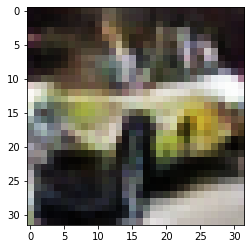

-> Epoch 109, Batch numero 1/78 -> Disc. loss on real images: 0.56173, Disc. loss on fake images: 0.56346, Generator loss: 1.08067
-> Epoch 109, Batch numero 2/78 -> Disc. loss on real images: 0.51144, Disc. loss on fake images: 0.52955, Generator loss: 1.14458
-> Epoch 109, Batch numero 3/78 -> Disc. loss on real images: 0.68987, Disc. loss on fake images: 0.47870, Generator loss: 1.12242
-> Epoch 109, Batch numero 4/78 -> Disc. loss on real images: 0.47811, Disc. loss on fake images: 0.58600, Generator loss: 1.13334
-> Epoch 109, Batch numero 5/78 -> Disc. loss on real images: 0.54067, Disc. loss on fake images: 0.54734, Generator loss: 1.18412
-> Epoch 109, Batch numero 6/78 -> Disc. loss on real images: 0.51227, Disc. loss on fake images: 0.66963, Generator loss: 1.18799
-> Epoch 109, Batch numero 7/78 -> Disc. loss on real images: 0.57513, Disc. loss on fake images: 0.56509, Generator loss: 1.16564
-> Epoch 109, Batch numero 8/78 -> Disc. loss on real images: 0.61871, Disc. loss o

-> Epoch 109, Batch numero 64/78 -> Disc. loss on real images: 0.55659, Disc. loss on fake images: 0.62179, Generator loss: 1.19000
-> Epoch 109, Batch numero 65/78 -> Disc. loss on real images: 0.59773, Disc. loss on fake images: 0.50909, Generator loss: 1.22873
-> Epoch 109, Batch numero 66/78 -> Disc. loss on real images: 0.60992, Disc. loss on fake images: 0.57739, Generator loss: 1.16992
-> Epoch 109, Batch numero 67/78 -> Disc. loss on real images: 0.60907, Disc. loss on fake images: 0.70287, Generator loss: 1.21437
-> Epoch 109, Batch numero 68/78 -> Disc. loss on real images: 0.62687, Disc. loss on fake images: 0.49283, Generator loss: 1.22626
-> Epoch 109, Batch numero 69/78 -> Disc. loss on real images: 0.58209, Disc. loss on fake images: 0.56184, Generator loss: 1.03557
-> Epoch 109, Batch numero 70/78 -> Disc. loss on real images: 0.49183, Disc. loss on fake images: 0.53153, Generator loss: 1.16457
-> Epoch 109, Batch numero 71/78 -> Disc. loss on real images: 0.65745, Disc

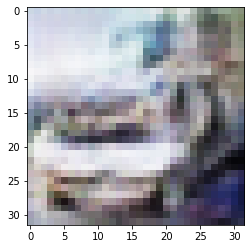

-> Epoch 110, Batch numero 1/78 -> Disc. loss on real images: 0.73610, Disc. loss on fake images: 0.61875, Generator loss: 1.11610
-> Epoch 110, Batch numero 2/78 -> Disc. loss on real images: 0.73843, Disc. loss on fake images: 0.47018, Generator loss: 1.65132
-> Epoch 110, Batch numero 3/78 -> Disc. loss on real images: 0.75712, Disc. loss on fake images: 0.49058, Generator loss: 1.36958
-> Epoch 110, Batch numero 4/78 -> Disc. loss on real images: 0.58836, Disc. loss on fake images: 0.60868, Generator loss: 1.14937
-> Epoch 110, Batch numero 5/78 -> Disc. loss on real images: 0.55231, Disc. loss on fake images: 0.65822, Generator loss: 1.28473
-> Epoch 110, Batch numero 6/78 -> Disc. loss on real images: 0.60180, Disc. loss on fake images: 0.52522, Generator loss: 1.22820
-> Epoch 110, Batch numero 7/78 -> Disc. loss on real images: 0.58169, Disc. loss on fake images: 0.49847, Generator loss: 1.27659
-> Epoch 110, Batch numero 8/78 -> Disc. loss on real images: 0.79619, Disc. loss o

-> Epoch 110, Batch numero 64/78 -> Disc. loss on real images: 0.57760, Disc. loss on fake images: 0.51576, Generator loss: 0.96856
-> Epoch 110, Batch numero 65/78 -> Disc. loss on real images: 0.48226, Disc. loss on fake images: 0.63218, Generator loss: 1.08759
-> Epoch 110, Batch numero 66/78 -> Disc. loss on real images: 0.60747, Disc. loss on fake images: 0.46198, Generator loss: 1.04301
-> Epoch 110, Batch numero 67/78 -> Disc. loss on real images: 0.52089, Disc. loss on fake images: 0.55719, Generator loss: 1.05870
-> Epoch 110, Batch numero 68/78 -> Disc. loss on real images: 0.55540, Disc. loss on fake images: 0.52489, Generator loss: 1.13967
-> Epoch 110, Batch numero 69/78 -> Disc. loss on real images: 0.47883, Disc. loss on fake images: 0.51461, Generator loss: 1.10077
-> Epoch 110, Batch numero 70/78 -> Disc. loss on real images: 0.69249, Disc. loss on fake images: 0.58154, Generator loss: 1.08117
-> Epoch 110, Batch numero 71/78 -> Disc. loss on real images: 0.66617, Disc

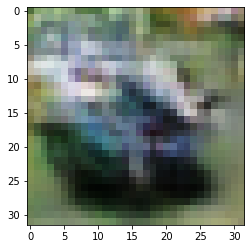

-> Epoch 111, Batch numero 1/78 -> Disc. loss on real images: 0.59572, Disc. loss on fake images: 0.60853, Generator loss: 1.16774
-> Epoch 111, Batch numero 2/78 -> Disc. loss on real images: 0.60326, Disc. loss on fake images: 0.57783, Generator loss: 1.15600
-> Epoch 111, Batch numero 3/78 -> Disc. loss on real images: 0.59364, Disc. loss on fake images: 0.61414, Generator loss: 1.19167
-> Epoch 111, Batch numero 4/78 -> Disc. loss on real images: 0.58689, Disc. loss on fake images: 0.58524, Generator loss: 1.23099
-> Epoch 111, Batch numero 5/78 -> Disc. loss on real images: 0.54016, Disc. loss on fake images: 0.53098, Generator loss: 1.29645
-> Epoch 111, Batch numero 6/78 -> Disc. loss on real images: 0.73222, Disc. loss on fake images: 0.49689, Generator loss: 1.22076
-> Epoch 111, Batch numero 7/78 -> Disc. loss on real images: 0.70029, Disc. loss on fake images: 0.53272, Generator loss: 1.12414
-> Epoch 111, Batch numero 8/78 -> Disc. loss on real images: 0.41178, Disc. loss o

-> Epoch 111, Batch numero 64/78 -> Disc. loss on real images: 0.52520, Disc. loss on fake images: 0.54585, Generator loss: 1.21708
-> Epoch 111, Batch numero 65/78 -> Disc. loss on real images: 0.50968, Disc. loss on fake images: 0.49914, Generator loss: 1.24121
-> Epoch 111, Batch numero 66/78 -> Disc. loss on real images: 0.45635, Disc. loss on fake images: 0.48889, Generator loss: 1.18601
-> Epoch 111, Batch numero 67/78 -> Disc. loss on real images: 0.62025, Disc. loss on fake images: 0.53687, Generator loss: 1.11957
-> Epoch 111, Batch numero 68/78 -> Disc. loss on real images: 0.54121, Disc. loss on fake images: 0.61184, Generator loss: 1.24564
-> Epoch 111, Batch numero 69/78 -> Disc. loss on real images: 0.57901, Disc. loss on fake images: 0.43557, Generator loss: 1.42631
-> Epoch 111, Batch numero 70/78 -> Disc. loss on real images: 0.53885, Disc. loss on fake images: 0.48233, Generator loss: 1.26434
-> Epoch 111, Batch numero 71/78 -> Disc. loss on real images: 0.47419, Disc

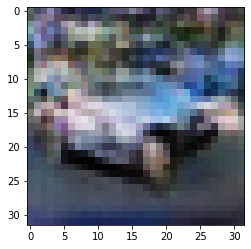

-> Epoch 112, Batch numero 1/78 -> Disc. loss on real images: 0.51521, Disc. loss on fake images: 0.51247, Generator loss: 1.10340
-> Epoch 112, Batch numero 2/78 -> Disc. loss on real images: 0.71092, Disc. loss on fake images: 0.54767, Generator loss: 1.05692
-> Epoch 112, Batch numero 3/78 -> Disc. loss on real images: 0.61264, Disc. loss on fake images: 0.62355, Generator loss: 1.01123
-> Epoch 112, Batch numero 4/78 -> Disc. loss on real images: 0.47349, Disc. loss on fake images: 0.79965, Generator loss: 1.01430
-> Epoch 112, Batch numero 5/78 -> Disc. loss on real images: 0.54238, Disc. loss on fake images: 0.55430, Generator loss: 1.16714
-> Epoch 112, Batch numero 6/78 -> Disc. loss on real images: 0.48071, Disc. loss on fake images: 0.51412, Generator loss: 1.06815
-> Epoch 112, Batch numero 7/78 -> Disc. loss on real images: 0.67090, Disc. loss on fake images: 0.57038, Generator loss: 1.19100
-> Epoch 112, Batch numero 8/78 -> Disc. loss on real images: 0.64665, Disc. loss o

-> Epoch 112, Batch numero 64/78 -> Disc. loss on real images: 0.66164, Disc. loss on fake images: 0.44835, Generator loss: 1.27528
-> Epoch 112, Batch numero 65/78 -> Disc. loss on real images: 0.67261, Disc. loss on fake images: 0.72108, Generator loss: 1.26866
-> Epoch 112, Batch numero 66/78 -> Disc. loss on real images: 0.69999, Disc. loss on fake images: 0.50105, Generator loss: 1.22913
-> Epoch 112, Batch numero 67/78 -> Disc. loss on real images: 0.50886, Disc. loss on fake images: 0.47549, Generator loss: 1.34166
-> Epoch 112, Batch numero 68/78 -> Disc. loss on real images: 0.50693, Disc. loss on fake images: 0.51614, Generator loss: 1.22950
-> Epoch 112, Batch numero 69/78 -> Disc. loss on real images: 0.49652, Disc. loss on fake images: 0.50744, Generator loss: 1.29524
-> Epoch 112, Batch numero 70/78 -> Disc. loss on real images: 0.68577, Disc. loss on fake images: 0.58672, Generator loss: 1.12893
-> Epoch 112, Batch numero 71/78 -> Disc. loss on real images: 0.49944, Disc

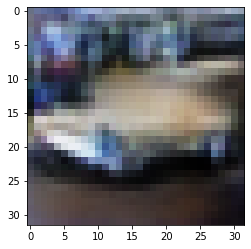

-> Epoch 113, Batch numero 1/78 -> Disc. loss on real images: 0.58845, Disc. loss on fake images: 0.61157, Generator loss: 1.03610
-> Epoch 113, Batch numero 2/78 -> Disc. loss on real images: 0.57233, Disc. loss on fake images: 0.53700, Generator loss: 1.19648
-> Epoch 113, Batch numero 3/78 -> Disc. loss on real images: 0.62396, Disc. loss on fake images: 0.53165, Generator loss: 1.07168
-> Epoch 113, Batch numero 4/78 -> Disc. loss on real images: 0.41883, Disc. loss on fake images: 0.57731, Generator loss: 1.14151
-> Epoch 113, Batch numero 5/78 -> Disc. loss on real images: 0.49335, Disc. loss on fake images: 0.57099, Generator loss: 1.26287
-> Epoch 113, Batch numero 6/78 -> Disc. loss on real images: 0.66034, Disc. loss on fake images: 0.55234, Generator loss: 1.14642
-> Epoch 113, Batch numero 7/78 -> Disc. loss on real images: 0.52749, Disc. loss on fake images: 0.56808, Generator loss: 1.18722
-> Epoch 113, Batch numero 8/78 -> Disc. loss on real images: 0.51868, Disc. loss o

-> Epoch 113, Batch numero 64/78 -> Disc. loss on real images: 0.53603, Disc. loss on fake images: 0.59228, Generator loss: 1.15825
-> Epoch 113, Batch numero 65/78 -> Disc. loss on real images: 0.69431, Disc. loss on fake images: 0.65880, Generator loss: 1.04483
-> Epoch 113, Batch numero 66/78 -> Disc. loss on real images: 0.66498, Disc. loss on fake images: 0.68238, Generator loss: 1.10229
-> Epoch 113, Batch numero 67/78 -> Disc. loss on real images: 0.55439, Disc. loss on fake images: 0.61467, Generator loss: 1.24700
-> Epoch 113, Batch numero 68/78 -> Disc. loss on real images: 0.62712, Disc. loss on fake images: 0.46867, Generator loss: 1.23742
-> Epoch 113, Batch numero 69/78 -> Disc. loss on real images: 0.59380, Disc. loss on fake images: 0.42401, Generator loss: 1.15656
-> Epoch 113, Batch numero 70/78 -> Disc. loss on real images: 0.61964, Disc. loss on fake images: 0.53598, Generator loss: 1.07217
-> Epoch 113, Batch numero 71/78 -> Disc. loss on real images: 0.48608, Disc

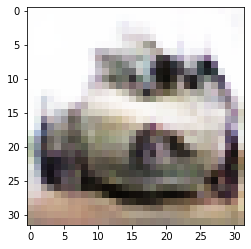

-> Epoch 114, Batch numero 1/78 -> Disc. loss on real images: 0.54578, Disc. loss on fake images: 0.52255, Generator loss: 1.16677
-> Epoch 114, Batch numero 2/78 -> Disc. loss on real images: 0.53577, Disc. loss on fake images: 0.50282, Generator loss: 1.24342
-> Epoch 114, Batch numero 3/78 -> Disc. loss on real images: 0.54808, Disc. loss on fake images: 0.55288, Generator loss: 1.26693
-> Epoch 114, Batch numero 4/78 -> Disc. loss on real images: 0.59046, Disc. loss on fake images: 0.53116, Generator loss: 1.19771
-> Epoch 114, Batch numero 5/78 -> Disc. loss on real images: 0.58887, Disc. loss on fake images: 0.52169, Generator loss: 1.22989
-> Epoch 114, Batch numero 6/78 -> Disc. loss on real images: 0.49150, Disc. loss on fake images: 0.57673, Generator loss: 1.17799
-> Epoch 114, Batch numero 7/78 -> Disc. loss on real images: 0.42863, Disc. loss on fake images: 0.77667, Generator loss: 1.13025
-> Epoch 114, Batch numero 8/78 -> Disc. loss on real images: 0.59603, Disc. loss o

-> Epoch 114, Batch numero 64/78 -> Disc. loss on real images: 0.71302, Disc. loss on fake images: 0.60392, Generator loss: 1.11632
-> Epoch 114, Batch numero 65/78 -> Disc. loss on real images: 0.44145, Disc. loss on fake images: 0.58503, Generator loss: 1.13844
-> Epoch 114, Batch numero 66/78 -> Disc. loss on real images: 0.67232, Disc. loss on fake images: 0.63423, Generator loss: 1.15414
-> Epoch 114, Batch numero 67/78 -> Disc. loss on real images: 0.43269, Disc. loss on fake images: 0.63351, Generator loss: 1.16458
-> Epoch 114, Batch numero 68/78 -> Disc. loss on real images: 0.55815, Disc. loss on fake images: 0.55493, Generator loss: 1.18491
-> Epoch 114, Batch numero 69/78 -> Disc. loss on real images: 0.82453, Disc. loss on fake images: 0.45111, Generator loss: 1.12164
-> Epoch 114, Batch numero 70/78 -> Disc. loss on real images: 0.66635, Disc. loss on fake images: 0.51729, Generator loss: 1.21766
-> Epoch 114, Batch numero 71/78 -> Disc. loss on real images: 0.52578, Disc

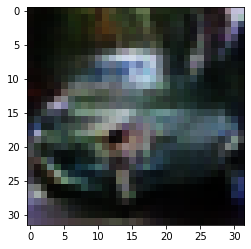

-> Epoch 115, Batch numero 1/78 -> Disc. loss on real images: 0.45818, Disc. loss on fake images: 0.53748, Generator loss: 1.11265
-> Epoch 115, Batch numero 2/78 -> Disc. loss on real images: 0.46708, Disc. loss on fake images: 0.63039, Generator loss: 1.33045
-> Epoch 115, Batch numero 3/78 -> Disc. loss on real images: 0.67570, Disc. loss on fake images: 0.59621, Generator loss: 1.11767
-> Epoch 115, Batch numero 4/78 -> Disc. loss on real images: 0.62868, Disc. loss on fake images: 0.48096, Generator loss: 1.30898
-> Epoch 115, Batch numero 5/78 -> Disc. loss on real images: 0.43928, Disc. loss on fake images: 0.50264, Generator loss: 1.20608
-> Epoch 115, Batch numero 6/78 -> Disc. loss on real images: 0.59225, Disc. loss on fake images: 0.50264, Generator loss: 1.08883
-> Epoch 115, Batch numero 7/78 -> Disc. loss on real images: 0.58277, Disc. loss on fake images: 0.53653, Generator loss: 1.14807
-> Epoch 115, Batch numero 8/78 -> Disc. loss on real images: 0.57253, Disc. loss o

-> Epoch 115, Batch numero 64/78 -> Disc. loss on real images: 0.63398, Disc. loss on fake images: 0.54514, Generator loss: 1.13186
-> Epoch 115, Batch numero 65/78 -> Disc. loss on real images: 0.54775, Disc. loss on fake images: 0.56191, Generator loss: 1.11770
-> Epoch 115, Batch numero 66/78 -> Disc. loss on real images: 0.60930, Disc. loss on fake images: 0.60599, Generator loss: 1.10765
-> Epoch 115, Batch numero 67/78 -> Disc. loss on real images: 0.56790, Disc. loss on fake images: 0.73557, Generator loss: 1.14499
-> Epoch 115, Batch numero 68/78 -> Disc. loss on real images: 0.53041, Disc. loss on fake images: 0.56036, Generator loss: 1.12458
-> Epoch 115, Batch numero 69/78 -> Disc. loss on real images: 0.63634, Disc. loss on fake images: 0.53787, Generator loss: 1.26040
-> Epoch 115, Batch numero 70/78 -> Disc. loss on real images: 0.54779, Disc. loss on fake images: 0.50546, Generator loss: 1.10844
-> Epoch 115, Batch numero 71/78 -> Disc. loss on real images: 0.53587, Disc

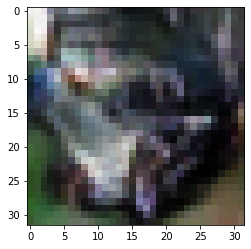

-> Epoch 116, Batch numero 1/78 -> Disc. loss on real images: 0.54084, Disc. loss on fake images: 0.53664, Generator loss: 1.07725
-> Epoch 116, Batch numero 2/78 -> Disc. loss on real images: 0.50380, Disc. loss on fake images: 0.63768, Generator loss: 1.16725
-> Epoch 116, Batch numero 3/78 -> Disc. loss on real images: 0.52510, Disc. loss on fake images: 0.65635, Generator loss: 1.18325
-> Epoch 116, Batch numero 4/78 -> Disc. loss on real images: 0.47208, Disc. loss on fake images: 0.51614, Generator loss: 1.21097
-> Epoch 116, Batch numero 5/78 -> Disc. loss on real images: 0.65114, Disc. loss on fake images: 0.57046, Generator loss: 1.30393
-> Epoch 116, Batch numero 6/78 -> Disc. loss on real images: 0.48727, Disc. loss on fake images: 0.57740, Generator loss: 1.22412
-> Epoch 116, Batch numero 7/78 -> Disc. loss on real images: 0.53316, Disc. loss on fake images: 0.50934, Generator loss: 1.06478
-> Epoch 116, Batch numero 8/78 -> Disc. loss on real images: 0.68006, Disc. loss o

-> Epoch 116, Batch numero 64/78 -> Disc. loss on real images: 0.50279, Disc. loss on fake images: 0.52636, Generator loss: 1.08439
-> Epoch 116, Batch numero 65/78 -> Disc. loss on real images: 0.61096, Disc. loss on fake images: 0.53157, Generator loss: 1.13898
-> Epoch 116, Batch numero 66/78 -> Disc. loss on real images: 0.47625, Disc. loss on fake images: 0.56636, Generator loss: 1.20443
-> Epoch 116, Batch numero 67/78 -> Disc. loss on real images: 0.54881, Disc. loss on fake images: 0.63643, Generator loss: 1.08225
-> Epoch 116, Batch numero 68/78 -> Disc. loss on real images: 0.51458, Disc. loss on fake images: 0.55678, Generator loss: 1.10800
-> Epoch 116, Batch numero 69/78 -> Disc. loss on real images: 0.42507, Disc. loss on fake images: 0.59672, Generator loss: 1.18564
-> Epoch 116, Batch numero 70/78 -> Disc. loss on real images: 0.56447, Disc. loss on fake images: 0.53984, Generator loss: 1.19912
-> Epoch 116, Batch numero 71/78 -> Disc. loss on real images: 0.74594, Disc

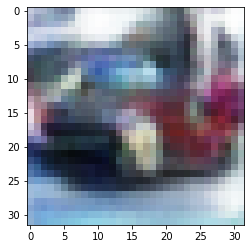

-> Epoch 117, Batch numero 1/78 -> Disc. loss on real images: 0.60061, Disc. loss on fake images: 0.48368, Generator loss: 1.18286
-> Epoch 117, Batch numero 2/78 -> Disc. loss on real images: 0.52470, Disc. loss on fake images: 0.62449, Generator loss: 1.23408
-> Epoch 117, Batch numero 3/78 -> Disc. loss on real images: 0.54988, Disc. loss on fake images: 0.66016, Generator loss: 1.28222
-> Epoch 117, Batch numero 4/78 -> Disc. loss on real images: 0.68302, Disc. loss on fake images: 0.56342, Generator loss: 1.32444
-> Epoch 117, Batch numero 5/78 -> Disc. loss on real images: 0.73905, Disc. loss on fake images: 0.53474, Generator loss: 1.22290
-> Epoch 117, Batch numero 6/78 -> Disc. loss on real images: 0.68900, Disc. loss on fake images: 0.56716, Generator loss: 1.26227
-> Epoch 117, Batch numero 7/78 -> Disc. loss on real images: 0.65442, Disc. loss on fake images: 0.51805, Generator loss: 1.05909
-> Epoch 117, Batch numero 8/78 -> Disc. loss on real images: 0.54921, Disc. loss o

-> Epoch 117, Batch numero 65/78 -> Disc. loss on real images: 0.55378, Disc. loss on fake images: 0.58225, Generator loss: 1.16838
-> Epoch 117, Batch numero 66/78 -> Disc. loss on real images: 0.52882, Disc. loss on fake images: 0.62759, Generator loss: 1.33133
-> Epoch 117, Batch numero 67/78 -> Disc. loss on real images: 0.52986, Disc. loss on fake images: 0.57252, Generator loss: 1.36057
-> Epoch 117, Batch numero 68/78 -> Disc. loss on real images: 0.56536, Disc. loss on fake images: 0.45105, Generator loss: 1.38970
-> Epoch 117, Batch numero 69/78 -> Disc. loss on real images: 0.59655, Disc. loss on fake images: 0.46412, Generator loss: 1.40250
-> Epoch 117, Batch numero 70/78 -> Disc. loss on real images: 0.70107, Disc. loss on fake images: 0.56705, Generator loss: 1.14086
-> Epoch 117, Batch numero 71/78 -> Disc. loss on real images: 0.49258, Disc. loss on fake images: 0.70922, Generator loss: 1.23153
-> Epoch 117, Batch numero 72/78 -> Disc. loss on real images: 0.61633, Disc

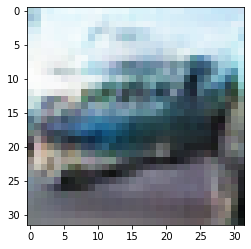

-> Epoch 118, Batch numero 1/78 -> Disc. loss on real images: 0.49592, Disc. loss on fake images: 0.43474, Generator loss: 1.20167
-> Epoch 118, Batch numero 2/78 -> Disc. loss on real images: 0.62092, Disc. loss on fake images: 0.51591, Generator loss: 1.15445
-> Epoch 118, Batch numero 3/78 -> Disc. loss on real images: 0.56728, Disc. loss on fake images: 0.58613, Generator loss: 1.14090
-> Epoch 118, Batch numero 4/78 -> Disc. loss on real images: 0.51611, Disc. loss on fake images: 0.50444, Generator loss: 1.08600
-> Epoch 118, Batch numero 5/78 -> Disc. loss on real images: 0.53398, Disc. loss on fake images: 0.56302, Generator loss: 1.07157
-> Epoch 118, Batch numero 6/78 -> Disc. loss on real images: 0.48013, Disc. loss on fake images: 0.69208, Generator loss: 1.14184
-> Epoch 118, Batch numero 7/78 -> Disc. loss on real images: 0.50175, Disc. loss on fake images: 0.46852, Generator loss: 1.11889
-> Epoch 118, Batch numero 8/78 -> Disc. loss on real images: 0.60145, Disc. loss o

-> Epoch 118, Batch numero 65/78 -> Disc. loss on real images: 0.61245, Disc. loss on fake images: 0.52638, Generator loss: 1.16343
-> Epoch 118, Batch numero 66/78 -> Disc. loss on real images: 0.60668, Disc. loss on fake images: 0.54484, Generator loss: 1.17719
-> Epoch 118, Batch numero 67/78 -> Disc. loss on real images: 0.48229, Disc. loss on fake images: 0.63807, Generator loss: 1.11531
-> Epoch 118, Batch numero 68/78 -> Disc. loss on real images: 0.47773, Disc. loss on fake images: 0.49961, Generator loss: 1.19655
-> Epoch 118, Batch numero 69/78 -> Disc. loss on real images: 0.52889, Disc. loss on fake images: 0.61291, Generator loss: 1.18875
-> Epoch 118, Batch numero 70/78 -> Disc. loss on real images: 0.47290, Disc. loss on fake images: 0.55994, Generator loss: 1.15428
-> Epoch 118, Batch numero 71/78 -> Disc. loss on real images: 0.68942, Disc. loss on fake images: 0.56779, Generator loss: 1.06730
-> Epoch 118, Batch numero 72/78 -> Disc. loss on real images: 0.53494, Disc

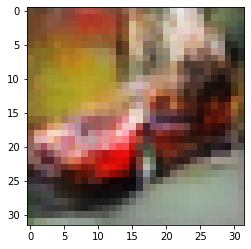

-> Epoch 119, Batch numero 1/78 -> Disc. loss on real images: 0.48872, Disc. loss on fake images: 0.64111, Generator loss: 1.25687
-> Epoch 119, Batch numero 2/78 -> Disc. loss on real images: 0.48551, Disc. loss on fake images: 0.61979, Generator loss: 1.14072
-> Epoch 119, Batch numero 3/78 -> Disc. loss on real images: 0.63390, Disc. loss on fake images: 0.55499, Generator loss: 1.21329
-> Epoch 119, Batch numero 4/78 -> Disc. loss on real images: 0.60211, Disc. loss on fake images: 0.55052, Generator loss: 1.20547
-> Epoch 119, Batch numero 5/78 -> Disc. loss on real images: 0.77922, Disc. loss on fake images: 0.52477, Generator loss: 1.11489
-> Epoch 119, Batch numero 6/78 -> Disc. loss on real images: 0.57421, Disc. loss on fake images: 0.49717, Generator loss: 1.15179
-> Epoch 119, Batch numero 7/78 -> Disc. loss on real images: 0.47611, Disc. loss on fake images: 0.51998, Generator loss: 1.05289
-> Epoch 119, Batch numero 8/78 -> Disc. loss on real images: 0.45079, Disc. loss o

-> Epoch 119, Batch numero 64/78 -> Disc. loss on real images: 0.50150, Disc. loss on fake images: 0.56404, Generator loss: 1.18732
-> Epoch 119, Batch numero 65/78 -> Disc. loss on real images: 0.57892, Disc. loss on fake images: 0.57885, Generator loss: 1.16189
-> Epoch 119, Batch numero 66/78 -> Disc. loss on real images: 0.46797, Disc. loss on fake images: 0.54423, Generator loss: 1.19477
-> Epoch 119, Batch numero 67/78 -> Disc. loss on real images: 0.50482, Disc. loss on fake images: 0.52510, Generator loss: 1.25525
-> Epoch 119, Batch numero 68/78 -> Disc. loss on real images: 0.55755, Disc. loss on fake images: 0.58447, Generator loss: 1.35647
-> Epoch 119, Batch numero 69/78 -> Disc. loss on real images: 0.55089, Disc. loss on fake images: 0.48245, Generator loss: 1.19542
-> Epoch 119, Batch numero 70/78 -> Disc. loss on real images: 0.64865, Disc. loss on fake images: 0.57047, Generator loss: 1.12119
-> Epoch 119, Batch numero 71/78 -> Disc. loss on real images: 0.76516, Disc

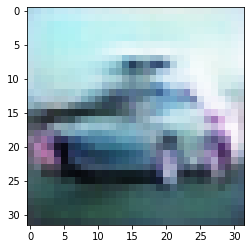

-> Epoch 120, Batch numero 1/78 -> Disc. loss on real images: 0.60183, Disc. loss on fake images: 0.85226, Generator loss: 1.26385
-> Epoch 120, Batch numero 2/78 -> Disc. loss on real images: 0.53353, Disc. loss on fake images: 0.40828, Generator loss: 1.37879
-> Epoch 120, Batch numero 3/78 -> Disc. loss on real images: 0.64767, Disc. loss on fake images: 0.55425, Generator loss: 1.42623
-> Epoch 120, Batch numero 4/78 -> Disc. loss on real images: 0.49494, Disc. loss on fake images: 0.56214, Generator loss: 1.27541
-> Epoch 120, Batch numero 5/78 -> Disc. loss on real images: 0.37297, Disc. loss on fake images: 0.42937, Generator loss: 1.20275
-> Epoch 120, Batch numero 6/78 -> Disc. loss on real images: 0.70195, Disc. loss on fake images: 0.66431, Generator loss: 1.02279
-> Epoch 120, Batch numero 7/78 -> Disc. loss on real images: 0.58411, Disc. loss on fake images: 0.61898, Generator loss: 1.15321
-> Epoch 120, Batch numero 8/78 -> Disc. loss on real images: 0.69463, Disc. loss o

-> Epoch 120, Batch numero 64/78 -> Disc. loss on real images: 0.64068, Disc. loss on fake images: 0.54519, Generator loss: 1.14676
-> Epoch 120, Batch numero 65/78 -> Disc. loss on real images: 0.66215, Disc. loss on fake images: 0.63455, Generator loss: 1.18363
-> Epoch 120, Batch numero 66/78 -> Disc. loss on real images: 0.48745, Disc. loss on fake images: 0.53195, Generator loss: 1.18242
-> Epoch 120, Batch numero 67/78 -> Disc. loss on real images: 0.54187, Disc. loss on fake images: 0.62975, Generator loss: 1.13653
-> Epoch 120, Batch numero 68/78 -> Disc. loss on real images: 0.52588, Disc. loss on fake images: 0.57102, Generator loss: 1.22270
-> Epoch 120, Batch numero 69/78 -> Disc. loss on real images: 0.65105, Disc. loss on fake images: 0.56769, Generator loss: 1.26836
-> Epoch 120, Batch numero 70/78 -> Disc. loss on real images: 0.60656, Disc. loss on fake images: 0.43910, Generator loss: 1.19002
-> Epoch 120, Batch numero 71/78 -> Disc. loss on real images: 0.56587, Disc

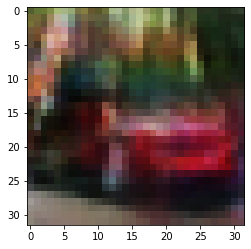

-> Epoch 121, Batch numero 1/78 -> Disc. loss on real images: 0.48159, Disc. loss on fake images: 0.63405, Generator loss: 1.17640
-> Epoch 121, Batch numero 2/78 -> Disc. loss on real images: 0.70204, Disc. loss on fake images: 0.60184, Generator loss: 1.25719
-> Epoch 121, Batch numero 3/78 -> Disc. loss on real images: 0.67401, Disc. loss on fake images: 0.63763, Generator loss: 1.13157
-> Epoch 121, Batch numero 4/78 -> Disc. loss on real images: 0.51630, Disc. loss on fake images: 0.48695, Generator loss: 1.21395
-> Epoch 121, Batch numero 5/78 -> Disc. loss on real images: 0.72281, Disc. loss on fake images: 0.59613, Generator loss: 1.06197
-> Epoch 121, Batch numero 6/78 -> Disc. loss on real images: 0.70865, Disc. loss on fake images: 0.57753, Generator loss: 1.11167
-> Epoch 121, Batch numero 7/78 -> Disc. loss on real images: 0.61031, Disc. loss on fake images: 0.66851, Generator loss: 1.08631
-> Epoch 121, Batch numero 8/78 -> Disc. loss on real images: 0.52067, Disc. loss o

-> Epoch 121, Batch numero 64/78 -> Disc. loss on real images: 0.70804, Disc. loss on fake images: 0.56677, Generator loss: 1.18844
-> Epoch 121, Batch numero 65/78 -> Disc. loss on real images: 0.55333, Disc. loss on fake images: 0.54564, Generator loss: 1.12555
-> Epoch 121, Batch numero 66/78 -> Disc. loss on real images: 0.61387, Disc. loss on fake images: 0.70454, Generator loss: 1.15047
-> Epoch 121, Batch numero 67/78 -> Disc. loss on real images: 0.54567, Disc. loss on fake images: 0.52479, Generator loss: 1.18779
-> Epoch 121, Batch numero 68/78 -> Disc. loss on real images: 0.64260, Disc. loss on fake images: 0.58359, Generator loss: 1.23109
-> Epoch 121, Batch numero 69/78 -> Disc. loss on real images: 0.65176, Disc. loss on fake images: 0.52193, Generator loss: 1.24407
-> Epoch 121, Batch numero 70/78 -> Disc. loss on real images: 0.59194, Disc. loss on fake images: 0.47215, Generator loss: 1.20785
-> Epoch 121, Batch numero 71/78 -> Disc. loss on real images: 0.59086, Disc

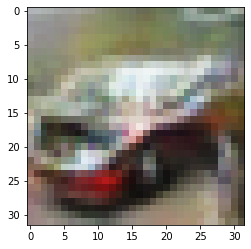

-> Epoch 122, Batch numero 1/78 -> Disc. loss on real images: 0.71682, Disc. loss on fake images: 0.57683, Generator loss: 1.09001
-> Epoch 122, Batch numero 2/78 -> Disc. loss on real images: 0.56658, Disc. loss on fake images: 0.45773, Generator loss: 1.18371
-> Epoch 122, Batch numero 3/78 -> Disc. loss on real images: 0.54102, Disc. loss on fake images: 0.57380, Generator loss: 1.16765
-> Epoch 122, Batch numero 4/78 -> Disc. loss on real images: 0.52872, Disc. loss on fake images: 0.53481, Generator loss: 1.11657
-> Epoch 122, Batch numero 5/78 -> Disc. loss on real images: 0.59166, Disc. loss on fake images: 0.51910, Generator loss: 1.06807
-> Epoch 122, Batch numero 6/78 -> Disc. loss on real images: 0.58581, Disc. loss on fake images: 0.55639, Generator loss: 1.16618
-> Epoch 122, Batch numero 7/78 -> Disc. loss on real images: 0.59601, Disc. loss on fake images: 0.59620, Generator loss: 1.12252
-> Epoch 122, Batch numero 8/78 -> Disc. loss on real images: 0.49829, Disc. loss o

-> Epoch 122, Batch numero 64/78 -> Disc. loss on real images: 0.63613, Disc. loss on fake images: 0.49919, Generator loss: 1.16450
-> Epoch 122, Batch numero 65/78 -> Disc. loss on real images: 0.48382, Disc. loss on fake images: 0.51291, Generator loss: 1.16767
-> Epoch 122, Batch numero 66/78 -> Disc. loss on real images: 0.54823, Disc. loss on fake images: 0.60130, Generator loss: 1.16884
-> Epoch 122, Batch numero 67/78 -> Disc. loss on real images: 0.58366, Disc. loss on fake images: 0.59334, Generator loss: 1.15565
-> Epoch 122, Batch numero 68/78 -> Disc. loss on real images: 0.47042, Disc. loss on fake images: 0.46479, Generator loss: 1.22968
-> Epoch 122, Batch numero 69/78 -> Disc. loss on real images: 0.62739, Disc. loss on fake images: 0.47353, Generator loss: 1.31268
-> Epoch 122, Batch numero 70/78 -> Disc. loss on real images: 0.53091, Disc. loss on fake images: 0.56821, Generator loss: 1.12398
-> Epoch 122, Batch numero 71/78 -> Disc. loss on real images: 0.54668, Disc

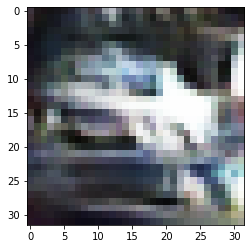

-> Epoch 123, Batch numero 1/78 -> Disc. loss on real images: 0.47890, Disc. loss on fake images: 0.58154, Generator loss: 1.18247
-> Epoch 123, Batch numero 2/78 -> Disc. loss on real images: 0.51479, Disc. loss on fake images: 0.53977, Generator loss: 1.30788
-> Epoch 123, Batch numero 3/78 -> Disc. loss on real images: 0.57919, Disc. loss on fake images: 0.51583, Generator loss: 1.18822
-> Epoch 123, Batch numero 4/78 -> Disc. loss on real images: 0.59671, Disc. loss on fake images: 0.46481, Generator loss: 1.22843
-> Epoch 123, Batch numero 5/78 -> Disc. loss on real images: 0.65834, Disc. loss on fake images: 0.58415, Generator loss: 1.15940
-> Epoch 123, Batch numero 6/78 -> Disc. loss on real images: 0.53080, Disc. loss on fake images: 0.58051, Generator loss: 1.19316
-> Epoch 123, Batch numero 7/78 -> Disc. loss on real images: 0.57620, Disc. loss on fake images: 0.70378, Generator loss: 1.20970
-> Epoch 123, Batch numero 8/78 -> Disc. loss on real images: 0.49359, Disc. loss o

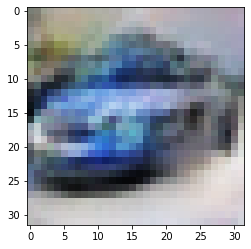

-> Epoch 124, Batch numero 1/78 -> Disc. loss on real images: 0.60242, Disc. loss on fake images: 0.48605, Generator loss: 1.09576
-> Epoch 124, Batch numero 2/78 -> Disc. loss on real images: 0.60129, Disc. loss on fake images: 0.54582, Generator loss: 1.06763
-> Epoch 124, Batch numero 3/78 -> Disc. loss on real images: 0.38133, Disc. loss on fake images: 0.69011, Generator loss: 1.21236
-> Epoch 124, Batch numero 4/78 -> Disc. loss on real images: 0.55652, Disc. loss on fake images: 0.54616, Generator loss: 1.27305
-> Epoch 124, Batch numero 5/78 -> Disc. loss on real images: 0.61155, Disc. loss on fake images: 0.81897, Generator loss: 1.18117
-> Epoch 124, Batch numero 6/78 -> Disc. loss on real images: 0.50771, Disc. loss on fake images: 0.47802, Generator loss: 1.11919
-> Epoch 124, Batch numero 7/78 -> Disc. loss on real images: 0.56703, Disc. loss on fake images: 0.67402, Generator loss: 1.27704
-> Epoch 124, Batch numero 8/78 -> Disc. loss on real images: 0.63755, Disc. loss o

-> Epoch 124, Batch numero 64/78 -> Disc. loss on real images: 0.51483, Disc. loss on fake images: 0.54436, Generator loss: 1.10989
-> Epoch 124, Batch numero 65/78 -> Disc. loss on real images: 0.62967, Disc. loss on fake images: 0.51533, Generator loss: 1.25635
-> Epoch 124, Batch numero 66/78 -> Disc. loss on real images: 0.44565, Disc. loss on fake images: 0.67073, Generator loss: 1.21331
-> Epoch 124, Batch numero 67/78 -> Disc. loss on real images: 0.63130, Disc. loss on fake images: 0.62063, Generator loss: 1.24697
-> Epoch 124, Batch numero 68/78 -> Disc. loss on real images: 0.55261, Disc. loss on fake images: 0.51979, Generator loss: 1.13897
-> Epoch 124, Batch numero 69/78 -> Disc. loss on real images: 0.61293, Disc. loss on fake images: 0.46683, Generator loss: 1.24893
-> Epoch 124, Batch numero 70/78 -> Disc. loss on real images: 0.59766, Disc. loss on fake images: 0.53742, Generator loss: 1.12310
-> Epoch 124, Batch numero 71/78 -> Disc. loss on real images: 0.51182, Disc

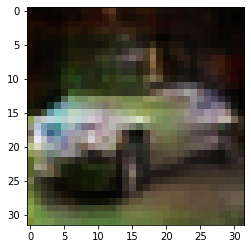

-> Epoch 125, Batch numero 1/78 -> Disc. loss on real images: 0.53018, Disc. loss on fake images: 0.55020, Generator loss: 1.21251
-> Epoch 125, Batch numero 2/78 -> Disc. loss on real images: 0.51807, Disc. loss on fake images: 0.66829, Generator loss: 1.16600
-> Epoch 125, Batch numero 3/78 -> Disc. loss on real images: 0.51181, Disc. loss on fake images: 0.55854, Generator loss: 1.32106
-> Epoch 125, Batch numero 4/78 -> Disc. loss on real images: 0.58912, Disc. loss on fake images: 0.51260, Generator loss: 1.21560
-> Epoch 125, Batch numero 5/78 -> Disc. loss on real images: 0.59694, Disc. loss on fake images: 0.49265, Generator loss: 1.18793
-> Epoch 125, Batch numero 6/78 -> Disc. loss on real images: 0.53677, Disc. loss on fake images: 0.47101, Generator loss: 1.21440
-> Epoch 125, Batch numero 7/78 -> Disc. loss on real images: 0.47129, Disc. loss on fake images: 0.72947, Generator loss: 1.27426
-> Epoch 125, Batch numero 8/78 -> Disc. loss on real images: 0.58204, Disc. loss o

-> Epoch 125, Batch numero 64/78 -> Disc. loss on real images: 0.50865, Disc. loss on fake images: 0.62580, Generator loss: 1.17994
-> Epoch 125, Batch numero 65/78 -> Disc. loss on real images: 0.54725, Disc. loss on fake images: 0.54813, Generator loss: 1.22567
-> Epoch 125, Batch numero 66/78 -> Disc. loss on real images: 0.57339, Disc. loss on fake images: 0.42759, Generator loss: 1.27116
-> Epoch 125, Batch numero 67/78 -> Disc. loss on real images: 0.54045, Disc. loss on fake images: 0.57350, Generator loss: 1.10458
-> Epoch 125, Batch numero 68/78 -> Disc. loss on real images: 0.53264, Disc. loss on fake images: 0.59823, Generator loss: 1.21962
-> Epoch 125, Batch numero 69/78 -> Disc. loss on real images: 0.41935, Disc. loss on fake images: 0.44710, Generator loss: 1.22993
-> Epoch 125, Batch numero 70/78 -> Disc. loss on real images: 0.55843, Disc. loss on fake images: 0.43909, Generator loss: 1.12638
-> Epoch 125, Batch numero 71/78 -> Disc. loss on real images: 0.52551, Disc

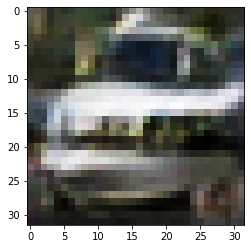

-> Epoch 126, Batch numero 1/78 -> Disc. loss on real images: 0.63116, Disc. loss on fake images: 0.52074, Generator loss: 1.24031
-> Epoch 126, Batch numero 2/78 -> Disc. loss on real images: 0.57999, Disc. loss on fake images: 0.52022, Generator loss: 1.33159
-> Epoch 126, Batch numero 3/78 -> Disc. loss on real images: 0.68952, Disc. loss on fake images: 0.53422, Generator loss: 1.18269
-> Epoch 126, Batch numero 4/78 -> Disc. loss on real images: 0.62695, Disc. loss on fake images: 0.50077, Generator loss: 1.16218
-> Epoch 126, Batch numero 5/78 -> Disc. loss on real images: 0.54457, Disc. loss on fake images: 0.48984, Generator loss: 1.11534
-> Epoch 126, Batch numero 6/78 -> Disc. loss on real images: 0.50845, Disc. loss on fake images: 0.57810, Generator loss: 1.18791
-> Epoch 126, Batch numero 7/78 -> Disc. loss on real images: 0.67228, Disc. loss on fake images: 0.73968, Generator loss: 1.11493
-> Epoch 126, Batch numero 8/78 -> Disc. loss on real images: 0.60091, Disc. loss o

-> Epoch 126, Batch numero 64/78 -> Disc. loss on real images: 0.62656, Disc. loss on fake images: 0.73019, Generator loss: 1.16302
-> Epoch 126, Batch numero 65/78 -> Disc. loss on real images: 0.68405, Disc. loss on fake images: 0.54023, Generator loss: 1.11295
-> Epoch 126, Batch numero 66/78 -> Disc. loss on real images: 0.66003, Disc. loss on fake images: 0.66976, Generator loss: 1.22354
-> Epoch 126, Batch numero 67/78 -> Disc. loss on real images: 0.60966, Disc. loss on fake images: 0.56803, Generator loss: 1.07016
-> Epoch 126, Batch numero 68/78 -> Disc. loss on real images: 0.48680, Disc. loss on fake images: 0.50927, Generator loss: 1.14046
-> Epoch 126, Batch numero 69/78 -> Disc. loss on real images: 0.50810, Disc. loss on fake images: 0.65170, Generator loss: 1.21539
-> Epoch 126, Batch numero 70/78 -> Disc. loss on real images: 0.45267, Disc. loss on fake images: 0.54888, Generator loss: 1.23997
-> Epoch 126, Batch numero 71/78 -> Disc. loss on real images: 0.68087, Disc

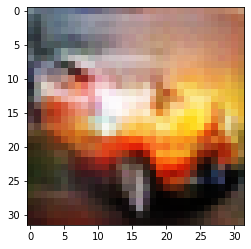

-> Epoch 127, Batch numero 1/78 -> Disc. loss on real images: 0.64025, Disc. loss on fake images: 0.66970, Generator loss: 1.12857
-> Epoch 127, Batch numero 2/78 -> Disc. loss on real images: 0.55525, Disc. loss on fake images: 0.54194, Generator loss: 1.01499
-> Epoch 127, Batch numero 3/78 -> Disc. loss on real images: 0.50121, Disc. loss on fake images: 0.56768, Generator loss: 1.18792
-> Epoch 127, Batch numero 4/78 -> Disc. loss on real images: 0.59098, Disc. loss on fake images: 0.57369, Generator loss: 1.09299
-> Epoch 127, Batch numero 5/78 -> Disc. loss on real images: 0.61376, Disc. loss on fake images: 0.51018, Generator loss: 1.20860
-> Epoch 127, Batch numero 6/78 -> Disc. loss on real images: 0.76353, Disc. loss on fake images: 0.52208, Generator loss: 1.08821
-> Epoch 127, Batch numero 7/78 -> Disc. loss on real images: 0.44876, Disc. loss on fake images: 0.58531, Generator loss: 1.06218
-> Epoch 127, Batch numero 8/78 -> Disc. loss on real images: 0.49506, Disc. loss o

-> Epoch 127, Batch numero 64/78 -> Disc. loss on real images: 0.48118, Disc. loss on fake images: 0.56379, Generator loss: 1.18917
-> Epoch 127, Batch numero 65/78 -> Disc. loss on real images: 0.65659, Disc. loss on fake images: 0.48921, Generator loss: 1.23855
-> Epoch 127, Batch numero 66/78 -> Disc. loss on real images: 0.55812, Disc. loss on fake images: 0.57595, Generator loss: 1.27376
-> Epoch 127, Batch numero 67/78 -> Disc. loss on real images: 0.60297, Disc. loss on fake images: 0.57162, Generator loss: 1.27129
-> Epoch 127, Batch numero 68/78 -> Disc. loss on real images: 0.61099, Disc. loss on fake images: 0.65485, Generator loss: 1.10990
-> Epoch 127, Batch numero 69/78 -> Disc. loss on real images: 0.56191, Disc. loss on fake images: 0.58775, Generator loss: 1.15311
-> Epoch 127, Batch numero 70/78 -> Disc. loss on real images: 0.58108, Disc. loss on fake images: 0.53049, Generator loss: 1.24270
-> Epoch 127, Batch numero 71/78 -> Disc. loss on real images: 0.48386, Disc

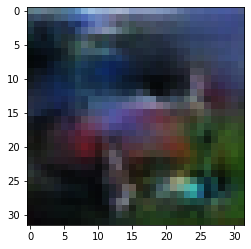

-> Epoch 128, Batch numero 1/78 -> Disc. loss on real images: 0.55425, Disc. loss on fake images: 0.50871, Generator loss: 1.18655
-> Epoch 128, Batch numero 2/78 -> Disc. loss on real images: 0.59792, Disc. loss on fake images: 0.56111, Generator loss: 1.21199
-> Epoch 128, Batch numero 3/78 -> Disc. loss on real images: 0.42329, Disc. loss on fake images: 0.56622, Generator loss: 1.28202
-> Epoch 128, Batch numero 4/78 -> Disc. loss on real images: 0.63631, Disc. loss on fake images: 0.44280, Generator loss: 1.27102
-> Epoch 128, Batch numero 5/78 -> Disc. loss on real images: 0.42353, Disc. loss on fake images: 0.60452, Generator loss: 1.22118
-> Epoch 128, Batch numero 6/78 -> Disc. loss on real images: 0.51231, Disc. loss on fake images: 0.58114, Generator loss: 1.28188
-> Epoch 128, Batch numero 7/78 -> Disc. loss on real images: 0.55267, Disc. loss on fake images: 0.60929, Generator loss: 1.27991
-> Epoch 128, Batch numero 8/78 -> Disc. loss on real images: 0.72476, Disc. loss o

-> Epoch 128, Batch numero 64/78 -> Disc. loss on real images: 0.55345, Disc. loss on fake images: 0.52479, Generator loss: 1.12244
-> Epoch 128, Batch numero 65/78 -> Disc. loss on real images: 0.62131, Disc. loss on fake images: 0.76581, Generator loss: 1.18257
-> Epoch 128, Batch numero 66/78 -> Disc. loss on real images: 0.49242, Disc. loss on fake images: 0.50997, Generator loss: 1.23126
-> Epoch 128, Batch numero 67/78 -> Disc. loss on real images: 0.58544, Disc. loss on fake images: 0.45140, Generator loss: 1.17804
-> Epoch 128, Batch numero 68/78 -> Disc. loss on real images: 0.58665, Disc. loss on fake images: 0.57845, Generator loss: 1.17430
-> Epoch 128, Batch numero 69/78 -> Disc. loss on real images: 0.55337, Disc. loss on fake images: 0.47232, Generator loss: 1.24147
-> Epoch 128, Batch numero 70/78 -> Disc. loss on real images: 0.56434, Disc. loss on fake images: 0.52837, Generator loss: 1.27938
-> Epoch 128, Batch numero 71/78 -> Disc. loss on real images: 0.37185, Disc

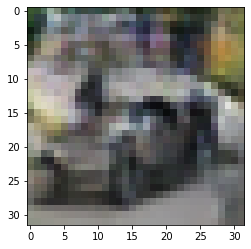

-> Epoch 129, Batch numero 1/78 -> Disc. loss on real images: 0.60345, Disc. loss on fake images: 0.59682, Generator loss: 1.15939
-> Epoch 129, Batch numero 2/78 -> Disc. loss on real images: 0.48827, Disc. loss on fake images: 0.77457, Generator loss: 1.19742
-> Epoch 129, Batch numero 3/78 -> Disc. loss on real images: 0.42714, Disc. loss on fake images: 0.55110, Generator loss: 1.20008
-> Epoch 129, Batch numero 4/78 -> Disc. loss on real images: 0.64460, Disc. loss on fake images: 0.55009, Generator loss: 1.21608
-> Epoch 129, Batch numero 5/78 -> Disc. loss on real images: 0.70416, Disc. loss on fake images: 0.58131, Generator loss: 1.26367
-> Epoch 129, Batch numero 6/78 -> Disc. loss on real images: 0.54797, Disc. loss on fake images: 0.49285, Generator loss: 1.26724
-> Epoch 129, Batch numero 7/78 -> Disc. loss on real images: 0.54692, Disc. loss on fake images: 0.43656, Generator loss: 1.29318
-> Epoch 129, Batch numero 8/78 -> Disc. loss on real images: 0.55321, Disc. loss o

-> Epoch 129, Batch numero 65/78 -> Disc. loss on real images: 0.59067, Disc. loss on fake images: 0.58906, Generator loss: 1.23287
-> Epoch 129, Batch numero 66/78 -> Disc. loss on real images: 0.50016, Disc. loss on fake images: 0.43831, Generator loss: 1.14630
-> Epoch 129, Batch numero 67/78 -> Disc. loss on real images: 0.43397, Disc. loss on fake images: 0.59048, Generator loss: 1.06332
-> Epoch 129, Batch numero 68/78 -> Disc. loss on real images: 0.44880, Disc. loss on fake images: 0.67089, Generator loss: 1.09542
-> Epoch 129, Batch numero 69/78 -> Disc. loss on real images: 0.43442, Disc. loss on fake images: 0.47106, Generator loss: 1.30919
-> Epoch 129, Batch numero 70/78 -> Disc. loss on real images: 0.48972, Disc. loss on fake images: 0.60028, Generator loss: 1.17573
-> Epoch 129, Batch numero 71/78 -> Disc. loss on real images: 0.63534, Disc. loss on fake images: 0.59724, Generator loss: 1.09972
-> Epoch 129, Batch numero 72/78 -> Disc. loss on real images: 0.60845, Disc

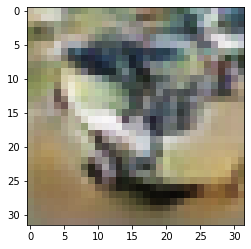

-> Epoch 130, Batch numero 1/78 -> Disc. loss on real images: 0.66634, Disc. loss on fake images: 0.49025, Generator loss: 1.03750
-> Epoch 130, Batch numero 2/78 -> Disc. loss on real images: 0.60101, Disc. loss on fake images: 0.48994, Generator loss: 0.99095
-> Epoch 130, Batch numero 3/78 -> Disc. loss on real images: 0.47158, Disc. loss on fake images: 0.64792, Generator loss: 1.03814
-> Epoch 130, Batch numero 4/78 -> Disc. loss on real images: 0.52771, Disc. loss on fake images: 0.55838, Generator loss: 1.23433
-> Epoch 130, Batch numero 5/78 -> Disc. loss on real images: 0.47943, Disc. loss on fake images: 0.49121, Generator loss: 1.14467
-> Epoch 130, Batch numero 6/78 -> Disc. loss on real images: 0.50263, Disc. loss on fake images: 0.49469, Generator loss: 1.17170
-> Epoch 130, Batch numero 7/78 -> Disc. loss on real images: 0.57534, Disc. loss on fake images: 0.55456, Generator loss: 1.06518
-> Epoch 130, Batch numero 8/78 -> Disc. loss on real images: 0.51847, Disc. loss o

-> Epoch 130, Batch numero 64/78 -> Disc. loss on real images: 0.58711, Disc. loss on fake images: 0.55028, Generator loss: 1.15453
-> Epoch 130, Batch numero 65/78 -> Disc. loss on real images: 0.53031, Disc. loss on fake images: 0.61222, Generator loss: 1.22363
-> Epoch 130, Batch numero 66/78 -> Disc. loss on real images: 0.54869, Disc. loss on fake images: 0.54652, Generator loss: 1.31385
-> Epoch 130, Batch numero 67/78 -> Disc. loss on real images: 0.66655, Disc. loss on fake images: 0.50374, Generator loss: 1.15385
-> Epoch 130, Batch numero 68/78 -> Disc. loss on real images: 0.62439, Disc. loss on fake images: 0.51851, Generator loss: 1.15821
-> Epoch 130, Batch numero 69/78 -> Disc. loss on real images: 0.48710, Disc. loss on fake images: 0.44450, Generator loss: 1.26202
-> Epoch 130, Batch numero 70/78 -> Disc. loss on real images: 0.59359, Disc. loss on fake images: 0.54726, Generator loss: 1.31395
-> Epoch 130, Batch numero 71/78 -> Disc. loss on real images: 0.52065, Disc

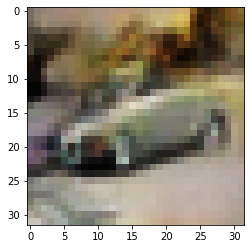

-> Epoch 131, Batch numero 1/78 -> Disc. loss on real images: 0.55339, Disc. loss on fake images: 0.48976, Generator loss: 1.17457
-> Epoch 131, Batch numero 2/78 -> Disc. loss on real images: 0.57875, Disc. loss on fake images: 0.70912, Generator loss: 1.08083
-> Epoch 131, Batch numero 3/78 -> Disc. loss on real images: 0.51354, Disc. loss on fake images: 0.51457, Generator loss: 1.16284
-> Epoch 131, Batch numero 4/78 -> Disc. loss on real images: 0.49324, Disc. loss on fake images: 0.57491, Generator loss: 1.27648
-> Epoch 131, Batch numero 5/78 -> Disc. loss on real images: 0.61787, Disc. loss on fake images: 0.62328, Generator loss: 1.24497
-> Epoch 131, Batch numero 6/78 -> Disc. loss on real images: 0.64605, Disc. loss on fake images: 0.60544, Generator loss: 1.31076
-> Epoch 131, Batch numero 7/78 -> Disc. loss on real images: 0.57451, Disc. loss on fake images: 0.52124, Generator loss: 1.16037
-> Epoch 131, Batch numero 8/78 -> Disc. loss on real images: 0.44050, Disc. loss o

-> Epoch 131, Batch numero 65/78 -> Disc. loss on real images: 0.61299, Disc. loss on fake images: 0.52963, Generator loss: 1.31572
-> Epoch 131, Batch numero 66/78 -> Disc. loss on real images: 0.63832, Disc. loss on fake images: 0.54181, Generator loss: 1.22932
-> Epoch 131, Batch numero 67/78 -> Disc. loss on real images: 0.61219, Disc. loss on fake images: 0.51922, Generator loss: 1.24670
-> Epoch 131, Batch numero 68/78 -> Disc. loss on real images: 0.60230, Disc. loss on fake images: 0.59734, Generator loss: 1.12615
-> Epoch 131, Batch numero 69/78 -> Disc. loss on real images: 0.54612, Disc. loss on fake images: 0.64830, Generator loss: 1.24348
-> Epoch 131, Batch numero 70/78 -> Disc. loss on real images: 0.62858, Disc. loss on fake images: 0.56507, Generator loss: 1.14688
-> Epoch 131, Batch numero 71/78 -> Disc. loss on real images: 0.49723, Disc. loss on fake images: 0.56240, Generator loss: 1.16965
-> Epoch 131, Batch numero 72/78 -> Disc. loss on real images: 0.52533, Disc

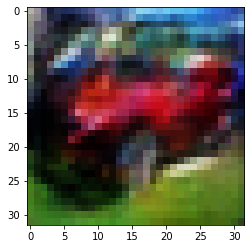

-> Epoch 132, Batch numero 1/78 -> Disc. loss on real images: 0.57777, Disc. loss on fake images: 0.57380, Generator loss: 1.25760
-> Epoch 132, Batch numero 2/78 -> Disc. loss on real images: 0.51755, Disc. loss on fake images: 0.65172, Generator loss: 1.24143
-> Epoch 132, Batch numero 3/78 -> Disc. loss on real images: 0.52894, Disc. loss on fake images: 0.65433, Generator loss: 1.43017
-> Epoch 132, Batch numero 4/78 -> Disc. loss on real images: 0.57994, Disc. loss on fake images: 0.49759, Generator loss: 1.50188
-> Epoch 132, Batch numero 5/78 -> Disc. loss on real images: 0.53690, Disc. loss on fake images: 0.52135, Generator loss: 1.25190
-> Epoch 132, Batch numero 6/78 -> Disc. loss on real images: 0.55260, Disc. loss on fake images: 0.38509, Generator loss: 1.34313
-> Epoch 132, Batch numero 7/78 -> Disc. loss on real images: 0.65124, Disc. loss on fake images: 0.68893, Generator loss: 1.39473
-> Epoch 132, Batch numero 8/78 -> Disc. loss on real images: 0.49193, Disc. loss o

-> Epoch 132, Batch numero 64/78 -> Disc. loss on real images: 0.64045, Disc. loss on fake images: 0.51835, Generator loss: 1.25014
-> Epoch 132, Batch numero 65/78 -> Disc. loss on real images: 0.73845, Disc. loss on fake images: 0.56443, Generator loss: 1.14500
-> Epoch 132, Batch numero 66/78 -> Disc. loss on real images: 0.49950, Disc. loss on fake images: 0.61328, Generator loss: 1.11220
-> Epoch 132, Batch numero 67/78 -> Disc. loss on real images: 0.60705, Disc. loss on fake images: 0.41330, Generator loss: 1.31070
-> Epoch 132, Batch numero 68/78 -> Disc. loss on real images: 0.57925, Disc. loss on fake images: 0.52668, Generator loss: 1.31141
-> Epoch 132, Batch numero 69/78 -> Disc. loss on real images: 0.55553, Disc. loss on fake images: 0.54671, Generator loss: 1.13970
-> Epoch 132, Batch numero 70/78 -> Disc. loss on real images: 0.40341, Disc. loss on fake images: 0.56126, Generator loss: 1.22928
-> Epoch 132, Batch numero 71/78 -> Disc. loss on real images: 0.49787, Disc

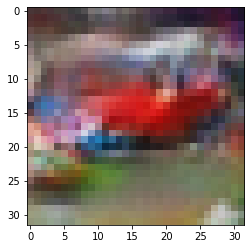

-> Epoch 133, Batch numero 1/78 -> Disc. loss on real images: 0.71336, Disc. loss on fake images: 0.43508, Generator loss: 1.15550
-> Epoch 133, Batch numero 2/78 -> Disc. loss on real images: 0.54331, Disc. loss on fake images: 0.52500, Generator loss: 1.18612
-> Epoch 133, Batch numero 3/78 -> Disc. loss on real images: 0.57768, Disc. loss on fake images: 0.70585, Generator loss: 1.13002
-> Epoch 133, Batch numero 4/78 -> Disc. loss on real images: 0.42338, Disc. loss on fake images: 0.50435, Generator loss: 1.02727
-> Epoch 133, Batch numero 5/78 -> Disc. loss on real images: 0.46133, Disc. loss on fake images: 0.50380, Generator loss: 1.23389
-> Epoch 133, Batch numero 6/78 -> Disc. loss on real images: 0.69455, Disc. loss on fake images: 0.56919, Generator loss: 1.06734
-> Epoch 133, Batch numero 7/78 -> Disc. loss on real images: 0.43768, Disc. loss on fake images: 0.54991, Generator loss: 1.16127
-> Epoch 133, Batch numero 8/78 -> Disc. loss on real images: 0.53219, Disc. loss o

-> Epoch 133, Batch numero 65/78 -> Disc. loss on real images: 0.47042, Disc. loss on fake images: 0.52485, Generator loss: 1.13242
-> Epoch 133, Batch numero 66/78 -> Disc. loss on real images: 0.45873, Disc. loss on fake images: 0.70402, Generator loss: 1.17996
-> Epoch 133, Batch numero 67/78 -> Disc. loss on real images: 0.63542, Disc. loss on fake images: 0.60361, Generator loss: 1.17991
-> Epoch 133, Batch numero 68/78 -> Disc. loss on real images: 0.71569, Disc. loss on fake images: 0.50785, Generator loss: 1.21985
-> Epoch 133, Batch numero 69/78 -> Disc. loss on real images: 0.57129, Disc. loss on fake images: 0.59502, Generator loss: 1.23539
-> Epoch 133, Batch numero 70/78 -> Disc. loss on real images: 0.49710, Disc. loss on fake images: 0.65739, Generator loss: 1.22512
-> Epoch 133, Batch numero 71/78 -> Disc. loss on real images: 0.52491, Disc. loss on fake images: 0.64478, Generator loss: 1.29535
-> Epoch 133, Batch numero 72/78 -> Disc. loss on real images: 0.71697, Disc

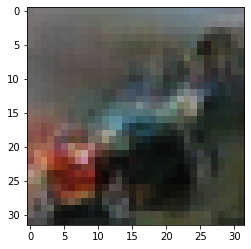

-> Epoch 134, Batch numero 1/78 -> Disc. loss on real images: 0.56265, Disc. loss on fake images: 0.60901, Generator loss: 1.13927
-> Epoch 134, Batch numero 2/78 -> Disc. loss on real images: 0.64261, Disc. loss on fake images: 0.51245, Generator loss: 1.16220
-> Epoch 134, Batch numero 3/78 -> Disc. loss on real images: 0.38641, Disc. loss on fake images: 0.52446, Generator loss: 1.27265
-> Epoch 134, Batch numero 4/78 -> Disc. loss on real images: 0.49440, Disc. loss on fake images: 0.44019, Generator loss: 1.24019
-> Epoch 134, Batch numero 5/78 -> Disc. loss on real images: 0.59324, Disc. loss on fake images: 0.55277, Generator loss: 1.23438
-> Epoch 134, Batch numero 6/78 -> Disc. loss on real images: 0.51493, Disc. loss on fake images: 0.68909, Generator loss: 1.22461
-> Epoch 134, Batch numero 7/78 -> Disc. loss on real images: 0.58936, Disc. loss on fake images: 0.55907, Generator loss: 1.27790
-> Epoch 134, Batch numero 8/78 -> Disc. loss on real images: 0.54876, Disc. loss o

-> Epoch 134, Batch numero 65/78 -> Disc. loss on real images: 0.49767, Disc. loss on fake images: 0.53317, Generator loss: 1.16788
-> Epoch 134, Batch numero 66/78 -> Disc. loss on real images: 0.60778, Disc. loss on fake images: 0.56457, Generator loss: 1.23968
-> Epoch 134, Batch numero 67/78 -> Disc. loss on real images: 0.44839, Disc. loss on fake images: 0.46025, Generator loss: 1.19686
-> Epoch 134, Batch numero 68/78 -> Disc. loss on real images: 0.57052, Disc. loss on fake images: 0.82792, Generator loss: 1.17543
-> Epoch 134, Batch numero 69/78 -> Disc. loss on real images: 0.64576, Disc. loss on fake images: 0.45513, Generator loss: 1.28073
-> Epoch 134, Batch numero 70/78 -> Disc. loss on real images: 0.74864, Disc. loss on fake images: 0.71365, Generator loss: 1.16186
-> Epoch 134, Batch numero 71/78 -> Disc. loss on real images: 0.60713, Disc. loss on fake images: 0.43512, Generator loss: 1.23518
-> Epoch 134, Batch numero 72/78 -> Disc. loss on real images: 0.54399, Disc

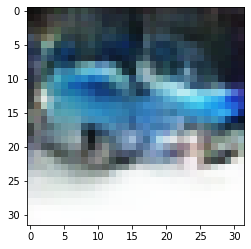

-> Epoch 135, Batch numero 1/78 -> Disc. loss on real images: 0.49744, Disc. loss on fake images: 0.74832, Generator loss: 1.18600
-> Epoch 135, Batch numero 2/78 -> Disc. loss on real images: 0.51502, Disc. loss on fake images: 0.39839, Generator loss: 1.24241
-> Epoch 135, Batch numero 3/78 -> Disc. loss on real images: 0.55788, Disc. loss on fake images: 0.62479, Generator loss: 1.14562
-> Epoch 135, Batch numero 4/78 -> Disc. loss on real images: 0.50194, Disc. loss on fake images: 0.63051, Generator loss: 1.31242
-> Epoch 135, Batch numero 5/78 -> Disc. loss on real images: 0.58603, Disc. loss on fake images: 0.50924, Generator loss: 1.35030
-> Epoch 135, Batch numero 6/78 -> Disc. loss on real images: 0.62578, Disc. loss on fake images: 0.52039, Generator loss: 1.28068
-> Epoch 135, Batch numero 7/78 -> Disc. loss on real images: 0.70360, Disc. loss on fake images: 0.53744, Generator loss: 1.28094
-> Epoch 135, Batch numero 8/78 -> Disc. loss on real images: 0.56781, Disc. loss o

-> Epoch 135, Batch numero 64/78 -> Disc. loss on real images: 0.55017, Disc. loss on fake images: 0.55698, Generator loss: 1.22733
-> Epoch 135, Batch numero 65/78 -> Disc. loss on real images: 0.57532, Disc. loss on fake images: 0.65292, Generator loss: 1.32961
-> Epoch 135, Batch numero 66/78 -> Disc. loss on real images: 0.73893, Disc. loss on fake images: 0.54628, Generator loss: 1.27966
-> Epoch 135, Batch numero 67/78 -> Disc. loss on real images: 0.59832, Disc. loss on fake images: 0.49863, Generator loss: 1.16843
-> Epoch 135, Batch numero 68/78 -> Disc. loss on real images: 0.54253, Disc. loss on fake images: 0.62948, Generator loss: 1.19002
-> Epoch 135, Batch numero 69/78 -> Disc. loss on real images: 0.59224, Disc. loss on fake images: 0.65923, Generator loss: 1.10487
-> Epoch 135, Batch numero 70/78 -> Disc. loss on real images: 0.65932, Disc. loss on fake images: 0.40862, Generator loss: 1.14861
-> Epoch 135, Batch numero 71/78 -> Disc. loss on real images: 0.50025, Disc

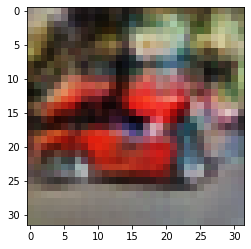

-> Epoch 136, Batch numero 1/78 -> Disc. loss on real images: 0.56816, Disc. loss on fake images: 0.54293, Generator loss: 1.10912
-> Epoch 136, Batch numero 2/78 -> Disc. loss on real images: 0.49568, Disc. loss on fake images: 0.58935, Generator loss: 1.13169
-> Epoch 136, Batch numero 3/78 -> Disc. loss on real images: 0.52397, Disc. loss on fake images: 0.74522, Generator loss: 1.14793
-> Epoch 136, Batch numero 4/78 -> Disc. loss on real images: 0.57967, Disc. loss on fake images: 0.59816, Generator loss: 1.16104
-> Epoch 136, Batch numero 5/78 -> Disc. loss on real images: 0.68688, Disc. loss on fake images: 0.61900, Generator loss: 1.36128
-> Epoch 136, Batch numero 6/78 -> Disc. loss on real images: 0.67694, Disc. loss on fake images: 0.51323, Generator loss: 1.35833
-> Epoch 136, Batch numero 7/78 -> Disc. loss on real images: 0.59917, Disc. loss on fake images: 0.36257, Generator loss: 1.29995
-> Epoch 136, Batch numero 8/78 -> Disc. loss on real images: 0.59070, Disc. loss o

-> Epoch 136, Batch numero 64/78 -> Disc. loss on real images: 0.55602, Disc. loss on fake images: 0.57512, Generator loss: 1.13258
-> Epoch 136, Batch numero 65/78 -> Disc. loss on real images: 0.39551, Disc. loss on fake images: 0.63339, Generator loss: 1.33449
-> Epoch 136, Batch numero 66/78 -> Disc. loss on real images: 0.46754, Disc. loss on fake images: 0.41116, Generator loss: 1.28420
-> Epoch 136, Batch numero 67/78 -> Disc. loss on real images: 0.49216, Disc. loss on fake images: 0.40942, Generator loss: 1.38415
-> Epoch 136, Batch numero 68/78 -> Disc. loss on real images: 0.58912, Disc. loss on fake images: 0.49007, Generator loss: 1.23254
-> Epoch 136, Batch numero 69/78 -> Disc. loss on real images: 0.52795, Disc. loss on fake images: 0.55521, Generator loss: 1.23139
-> Epoch 136, Batch numero 70/78 -> Disc. loss on real images: 0.60438, Disc. loss on fake images: 0.52866, Generator loss: 1.30467
-> Epoch 136, Batch numero 71/78 -> Disc. loss on real images: 0.56592, Disc

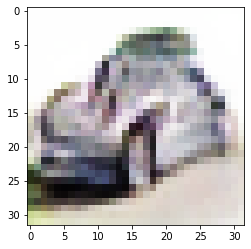

-> Epoch 137, Batch numero 1/78 -> Disc. loss on real images: 0.44302, Disc. loss on fake images: 0.38223, Generator loss: 1.23834
-> Epoch 137, Batch numero 2/78 -> Disc. loss on real images: 0.61671, Disc. loss on fake images: 0.47747, Generator loss: 1.29039
-> Epoch 137, Batch numero 3/78 -> Disc. loss on real images: 0.56338, Disc. loss on fake images: 0.59849, Generator loss: 1.12111
-> Epoch 137, Batch numero 4/78 -> Disc. loss on real images: 0.51637, Disc. loss on fake images: 0.56983, Generator loss: 1.34797
-> Epoch 137, Batch numero 5/78 -> Disc. loss on real images: 0.62631, Disc. loss on fake images: 0.75543, Generator loss: 1.31879
-> Epoch 137, Batch numero 6/78 -> Disc. loss on real images: 0.67430, Disc. loss on fake images: 0.47612, Generator loss: 1.14010
-> Epoch 137, Batch numero 7/78 -> Disc. loss on real images: 0.57185, Disc. loss on fake images: 0.51697, Generator loss: 1.35027
-> Epoch 137, Batch numero 8/78 -> Disc. loss on real images: 0.60378, Disc. loss o

-> Epoch 137, Batch numero 64/78 -> Disc. loss on real images: 0.50102, Disc. loss on fake images: 0.57117, Generator loss: 1.15244
-> Epoch 137, Batch numero 65/78 -> Disc. loss on real images: 0.50975, Disc. loss on fake images: 0.68886, Generator loss: 1.23172
-> Epoch 137, Batch numero 66/78 -> Disc. loss on real images: 0.71957, Disc. loss on fake images: 0.55262, Generator loss: 1.33404
-> Epoch 137, Batch numero 67/78 -> Disc. loss on real images: 0.58569, Disc. loss on fake images: 0.63611, Generator loss: 1.29069
-> Epoch 137, Batch numero 68/78 -> Disc. loss on real images: 0.64001, Disc. loss on fake images: 0.57671, Generator loss: 1.25400
-> Epoch 137, Batch numero 69/78 -> Disc. loss on real images: 0.62262, Disc. loss on fake images: 0.46107, Generator loss: 1.22014
-> Epoch 137, Batch numero 70/78 -> Disc. loss on real images: 0.61803, Disc. loss on fake images: 0.55934, Generator loss: 1.21028
-> Epoch 137, Batch numero 71/78 -> Disc. loss on real images: 0.57812, Disc

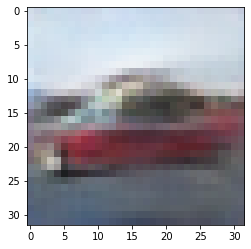

-> Epoch 138, Batch numero 1/78 -> Disc. loss on real images: 0.68305, Disc. loss on fake images: 0.65398, Generator loss: 1.11885
-> Epoch 138, Batch numero 2/78 -> Disc. loss on real images: 0.58497, Disc. loss on fake images: 0.53462, Generator loss: 1.27274
-> Epoch 138, Batch numero 3/78 -> Disc. loss on real images: 0.52239, Disc. loss on fake images: 0.68157, Generator loss: 1.25020
-> Epoch 138, Batch numero 4/78 -> Disc. loss on real images: 0.49698, Disc. loss on fake images: 0.44976, Generator loss: 1.21908
-> Epoch 138, Batch numero 5/78 -> Disc. loss on real images: 0.56979, Disc. loss on fake images: 0.53489, Generator loss: 1.15694
-> Epoch 138, Batch numero 6/78 -> Disc. loss on real images: 0.46789, Disc. loss on fake images: 0.55144, Generator loss: 1.11651
-> Epoch 138, Batch numero 7/78 -> Disc. loss on real images: 0.60468, Disc. loss on fake images: 0.51092, Generator loss: 1.16174
-> Epoch 138, Batch numero 8/78 -> Disc. loss on real images: 0.52558, Disc. loss o

-> Epoch 138, Batch numero 64/78 -> Disc. loss on real images: 0.55331, Disc. loss on fake images: 0.53801, Generator loss: 1.09002
-> Epoch 138, Batch numero 65/78 -> Disc. loss on real images: 0.43222, Disc. loss on fake images: 0.65709, Generator loss: 1.16804
-> Epoch 138, Batch numero 66/78 -> Disc. loss on real images: 0.52180, Disc. loss on fake images: 0.58872, Generator loss: 1.27327
-> Epoch 138, Batch numero 67/78 -> Disc. loss on real images: 0.69671, Disc. loss on fake images: 0.51901, Generator loss: 1.27295
-> Epoch 138, Batch numero 68/78 -> Disc. loss on real images: 0.52037, Disc. loss on fake images: 0.62999, Generator loss: 1.29017
-> Epoch 138, Batch numero 69/78 -> Disc. loss on real images: 0.55920, Disc. loss on fake images: 0.59924, Generator loss: 1.31404
-> Epoch 138, Batch numero 70/78 -> Disc. loss on real images: 0.69972, Disc. loss on fake images: 0.41325, Generator loss: 1.27181
-> Epoch 138, Batch numero 71/78 -> Disc. loss on real images: 0.52796, Disc

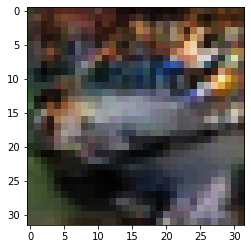

-> Epoch 139, Batch numero 1/78 -> Disc. loss on real images: 0.63329, Disc. loss on fake images: 0.69136, Generator loss: 1.20655
-> Epoch 139, Batch numero 2/78 -> Disc. loss on real images: 0.57121, Disc. loss on fake images: 0.49471, Generator loss: 1.31364
-> Epoch 139, Batch numero 3/78 -> Disc. loss on real images: 0.54361, Disc. loss on fake images: 0.61341, Generator loss: 1.33651
-> Epoch 139, Batch numero 4/78 -> Disc. loss on real images: 0.37628, Disc. loss on fake images: 0.51114, Generator loss: 1.23730
-> Epoch 139, Batch numero 5/78 -> Disc. loss on real images: 0.57730, Disc. loss on fake images: 0.38299, Generator loss: 1.17168
-> Epoch 139, Batch numero 6/78 -> Disc. loss on real images: 0.50715, Disc. loss on fake images: 0.53567, Generator loss: 1.10875
-> Epoch 139, Batch numero 7/78 -> Disc. loss on real images: 0.56400, Disc. loss on fake images: 0.52147, Generator loss: 1.21478
-> Epoch 139, Batch numero 8/78 -> Disc. loss on real images: 0.53970, Disc. loss o

-> Epoch 139, Batch numero 65/78 -> Disc. loss on real images: 0.64319, Disc. loss on fake images: 0.71272, Generator loss: 1.22470
-> Epoch 139, Batch numero 66/78 -> Disc. loss on real images: 0.63075, Disc. loss on fake images: 0.60393, Generator loss: 1.24853
-> Epoch 139, Batch numero 67/78 -> Disc. loss on real images: 0.60135, Disc. loss on fake images: 0.51834, Generator loss: 1.22979
-> Epoch 139, Batch numero 68/78 -> Disc. loss on real images: 0.60184, Disc. loss on fake images: 0.47322, Generator loss: 1.39153
-> Epoch 139, Batch numero 69/78 -> Disc. loss on real images: 0.61029, Disc. loss on fake images: 0.51381, Generator loss: 1.26560
-> Epoch 139, Batch numero 70/78 -> Disc. loss on real images: 0.52726, Disc. loss on fake images: 0.56498, Generator loss: 1.25303
-> Epoch 139, Batch numero 71/78 -> Disc. loss on real images: 0.52556, Disc. loss on fake images: 0.46180, Generator loss: 1.26601
-> Epoch 139, Batch numero 72/78 -> Disc. loss on real images: 0.53402, Disc

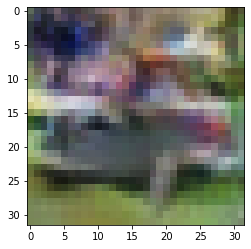

-> Epoch 140, Batch numero 1/78 -> Disc. loss on real images: 0.52434, Disc. loss on fake images: 0.46645, Generator loss: 1.21526
-> Epoch 140, Batch numero 2/78 -> Disc. loss on real images: 0.47973, Disc. loss on fake images: 0.55962, Generator loss: 1.30496
-> Epoch 140, Batch numero 3/78 -> Disc. loss on real images: 0.49976, Disc. loss on fake images: 0.48373, Generator loss: 1.10711
-> Epoch 140, Batch numero 4/78 -> Disc. loss on real images: 0.59854, Disc. loss on fake images: 0.49635, Generator loss: 1.31780
-> Epoch 140, Batch numero 5/78 -> Disc. loss on real images: 0.51782, Disc. loss on fake images: 0.62078, Generator loss: 1.30963
-> Epoch 140, Batch numero 6/78 -> Disc. loss on real images: 0.57397, Disc. loss on fake images: 0.59473, Generator loss: 1.25091
-> Epoch 140, Batch numero 7/78 -> Disc. loss on real images: 0.49762, Disc. loss on fake images: 0.65362, Generator loss: 1.31302
-> Epoch 140, Batch numero 8/78 -> Disc. loss on real images: 0.65971, Disc. loss o

-> Epoch 140, Batch numero 64/78 -> Disc. loss on real images: 0.51498, Disc. loss on fake images: 0.57138, Generator loss: 1.24009
-> Epoch 140, Batch numero 65/78 -> Disc. loss on real images: 0.61734, Disc. loss on fake images: 0.56519, Generator loss: 1.12904
-> Epoch 140, Batch numero 66/78 -> Disc. loss on real images: 0.69138, Disc. loss on fake images: 0.56745, Generator loss: 1.18758
-> Epoch 140, Batch numero 67/78 -> Disc. loss on real images: 0.62761, Disc. loss on fake images: 0.68354, Generator loss: 1.20021
-> Epoch 140, Batch numero 68/78 -> Disc. loss on real images: 0.64867, Disc. loss on fake images: 0.52226, Generator loss: 1.26148
-> Epoch 140, Batch numero 69/78 -> Disc. loss on real images: 0.50499, Disc. loss on fake images: 0.53812, Generator loss: 1.23580
-> Epoch 140, Batch numero 70/78 -> Disc. loss on real images: 0.51744, Disc. loss on fake images: 0.58135, Generator loss: 1.11805
-> Epoch 140, Batch numero 71/78 -> Disc. loss on real images: 0.58117, Disc

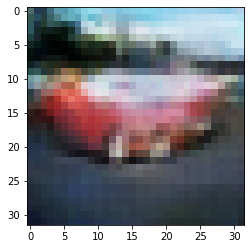

-> Epoch 141, Batch numero 1/78 -> Disc. loss on real images: 0.64147, Disc. loss on fake images: 0.51450, Generator loss: 1.20067
-> Epoch 141, Batch numero 2/78 -> Disc. loss on real images: 0.58728, Disc. loss on fake images: 0.53801, Generator loss: 1.00671
-> Epoch 141, Batch numero 3/78 -> Disc. loss on real images: 0.47616, Disc. loss on fake images: 0.61397, Generator loss: 1.21757
-> Epoch 141, Batch numero 4/78 -> Disc. loss on real images: 0.60545, Disc. loss on fake images: 0.55379, Generator loss: 1.32153
-> Epoch 141, Batch numero 5/78 -> Disc. loss on real images: 0.52003, Disc. loss on fake images: 0.43683, Generator loss: 1.17049
-> Epoch 141, Batch numero 6/78 -> Disc. loss on real images: 0.63461, Disc. loss on fake images: 0.51028, Generator loss: 1.15956
-> Epoch 141, Batch numero 7/78 -> Disc. loss on real images: 0.59350, Disc. loss on fake images: 0.56159, Generator loss: 1.18390
-> Epoch 141, Batch numero 8/78 -> Disc. loss on real images: 0.51007, Disc. loss o

-> Epoch 141, Batch numero 65/78 -> Disc. loss on real images: 0.56354, Disc. loss on fake images: 0.57049, Generator loss: 1.25223
-> Epoch 141, Batch numero 66/78 -> Disc. loss on real images: 0.64089, Disc. loss on fake images: 0.50100, Generator loss: 1.31685
-> Epoch 141, Batch numero 67/78 -> Disc. loss on real images: 0.55389, Disc. loss on fake images: 0.56842, Generator loss: 1.28851
-> Epoch 141, Batch numero 68/78 -> Disc. loss on real images: 0.59671, Disc. loss on fake images: 0.64754, Generator loss: 1.22025
-> Epoch 141, Batch numero 69/78 -> Disc. loss on real images: 0.55727, Disc. loss on fake images: 0.42513, Generator loss: 1.30798
-> Epoch 141, Batch numero 70/78 -> Disc. loss on real images: 0.67159, Disc. loss on fake images: 0.58461, Generator loss: 1.18427
-> Epoch 141, Batch numero 71/78 -> Disc. loss on real images: 0.46125, Disc. loss on fake images: 0.45711, Generator loss: 1.11085
-> Epoch 141, Batch numero 72/78 -> Disc. loss on real images: 0.53595, Disc

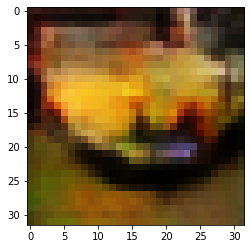

-> Epoch 142, Batch numero 1/78 -> Disc. loss on real images: 0.60368, Disc. loss on fake images: 0.46808, Generator loss: 1.31097
-> Epoch 142, Batch numero 2/78 -> Disc. loss on real images: 0.65716, Disc. loss on fake images: 0.45107, Generator loss: 1.09743
-> Epoch 142, Batch numero 3/78 -> Disc. loss on real images: 0.41455, Disc. loss on fake images: 0.52244, Generator loss: 1.11893
-> Epoch 142, Batch numero 4/78 -> Disc. loss on real images: 0.57726, Disc. loss on fake images: 0.60432, Generator loss: 1.20423
-> Epoch 142, Batch numero 5/78 -> Disc. loss on real images: 0.59599, Disc. loss on fake images: 0.58147, Generator loss: 1.23042
-> Epoch 142, Batch numero 6/78 -> Disc. loss on real images: 0.45976, Disc. loss on fake images: 0.61668, Generator loss: 1.25719
-> Epoch 142, Batch numero 7/78 -> Disc. loss on real images: 0.47744, Disc. loss on fake images: 0.41444, Generator loss: 1.25768
-> Epoch 142, Batch numero 8/78 -> Disc. loss on real images: 0.57664, Disc. loss o

-> Epoch 142, Batch numero 65/78 -> Disc. loss on real images: 0.65169, Disc. loss on fake images: 0.74675, Generator loss: 1.16828
-> Epoch 142, Batch numero 66/78 -> Disc. loss on real images: 0.50538, Disc. loss on fake images: 0.53795, Generator loss: 1.19385
-> Epoch 142, Batch numero 67/78 -> Disc. loss on real images: 0.48919, Disc. loss on fake images: 0.61823, Generator loss: 1.35941
-> Epoch 142, Batch numero 68/78 -> Disc. loss on real images: 0.54455, Disc. loss on fake images: 0.60252, Generator loss: 1.26168
-> Epoch 142, Batch numero 69/78 -> Disc. loss on real images: 0.62597, Disc. loss on fake images: 0.57778, Generator loss: 1.21687
-> Epoch 142, Batch numero 70/78 -> Disc. loss on real images: 0.74176, Disc. loss on fake images: 0.41670, Generator loss: 1.27557
-> Epoch 142, Batch numero 71/78 -> Disc. loss on real images: 0.47891, Disc. loss on fake images: 0.54388, Generator loss: 1.22990
-> Epoch 142, Batch numero 72/78 -> Disc. loss on real images: 0.42364, Disc

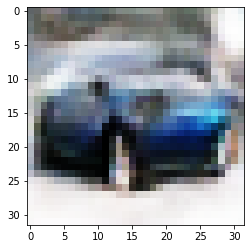

-> Epoch 143, Batch numero 1/78 -> Disc. loss on real images: 0.63655, Disc. loss on fake images: 0.54029, Generator loss: 1.20327
-> Epoch 143, Batch numero 2/78 -> Disc. loss on real images: 0.59089, Disc. loss on fake images: 0.63658, Generator loss: 1.23309
-> Epoch 143, Batch numero 3/78 -> Disc. loss on real images: 0.55594, Disc. loss on fake images: 0.50473, Generator loss: 1.37358
-> Epoch 143, Batch numero 4/78 -> Disc. loss on real images: 0.55929, Disc. loss on fake images: 0.50983, Generator loss: 1.30959
-> Epoch 143, Batch numero 5/78 -> Disc. loss on real images: 0.58999, Disc. loss on fake images: 0.53109, Generator loss: 1.23178
-> Epoch 143, Batch numero 6/78 -> Disc. loss on real images: 0.58353, Disc. loss on fake images: 0.54807, Generator loss: 1.12593
-> Epoch 143, Batch numero 7/78 -> Disc. loss on real images: 0.50736, Disc. loss on fake images: 0.61675, Generator loss: 1.33288
-> Epoch 143, Batch numero 8/78 -> Disc. loss on real images: 0.53009, Disc. loss o

-> Epoch 143, Batch numero 64/78 -> Disc. loss on real images: 0.52094, Disc. loss on fake images: 0.61615, Generator loss: 1.23063
-> Epoch 143, Batch numero 65/78 -> Disc. loss on real images: 0.71082, Disc. loss on fake images: 0.56171, Generator loss: 1.14166
-> Epoch 143, Batch numero 66/78 -> Disc. loss on real images: 0.54225, Disc. loss on fake images: 0.66432, Generator loss: 1.28627
-> Epoch 143, Batch numero 67/78 -> Disc. loss on real images: 0.56665, Disc. loss on fake images: 0.53480, Generator loss: 1.29441
-> Epoch 143, Batch numero 68/78 -> Disc. loss on real images: 0.57850, Disc. loss on fake images: 0.53610, Generator loss: 1.36754
-> Epoch 143, Batch numero 69/78 -> Disc. loss on real images: 0.58658, Disc. loss on fake images: 0.60632, Generator loss: 1.09972
-> Epoch 143, Batch numero 70/78 -> Disc. loss on real images: 0.55702, Disc. loss on fake images: 0.59211, Generator loss: 1.24551
-> Epoch 143, Batch numero 71/78 -> Disc. loss on real images: 0.45076, Disc

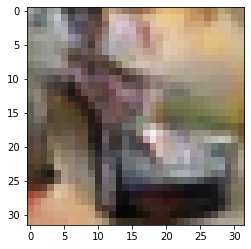

-> Epoch 144, Batch numero 1/78 -> Disc. loss on real images: 0.81935, Disc. loss on fake images: 0.68333, Generator loss: 1.21153
-> Epoch 144, Batch numero 2/78 -> Disc. loss on real images: 0.61972, Disc. loss on fake images: 0.48701, Generator loss: 1.24880
-> Epoch 144, Batch numero 3/78 -> Disc. loss on real images: 0.69778, Disc. loss on fake images: 0.55846, Generator loss: 1.13556
-> Epoch 144, Batch numero 4/78 -> Disc. loss on real images: 0.51968, Disc. loss on fake images: 0.50858, Generator loss: 1.27373
-> Epoch 144, Batch numero 5/78 -> Disc. loss on real images: 0.64984, Disc. loss on fake images: 0.55813, Generator loss: 1.16310
-> Epoch 144, Batch numero 6/78 -> Disc. loss on real images: 0.50399, Disc. loss on fake images: 0.60769, Generator loss: 1.24247
-> Epoch 144, Batch numero 7/78 -> Disc. loss on real images: 0.40940, Disc. loss on fake images: 0.56119, Generator loss: 1.14120
-> Epoch 144, Batch numero 8/78 -> Disc. loss on real images: 0.61140, Disc. loss o

-> Epoch 144, Batch numero 64/78 -> Disc. loss on real images: 0.44764, Disc. loss on fake images: 0.48429, Generator loss: 1.23944
-> Epoch 144, Batch numero 65/78 -> Disc. loss on real images: 0.60632, Disc. loss on fake images: 0.63342, Generator loss: 1.38043
-> Epoch 144, Batch numero 66/78 -> Disc. loss on real images: 0.41854, Disc. loss on fake images: 0.61970, Generator loss: 1.20829
-> Epoch 144, Batch numero 67/78 -> Disc. loss on real images: 0.71742, Disc. loss on fake images: 0.71464, Generator loss: 1.09366
-> Epoch 144, Batch numero 68/78 -> Disc. loss on real images: 0.71485, Disc. loss on fake images: 0.55114, Generator loss: 1.23833
-> Epoch 144, Batch numero 69/78 -> Disc. loss on real images: 0.56752, Disc. loss on fake images: 0.49098, Generator loss: 1.16654
-> Epoch 144, Batch numero 70/78 -> Disc. loss on real images: 0.62672, Disc. loss on fake images: 0.65369, Generator loss: 1.23516
-> Epoch 144, Batch numero 71/78 -> Disc. loss on real images: 0.59376, Disc

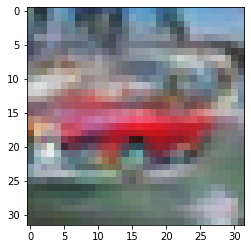

-> Epoch 145, Batch numero 1/78 -> Disc. loss on real images: 0.64968, Disc. loss on fake images: 0.48579, Generator loss: 1.14070
-> Epoch 145, Batch numero 2/78 -> Disc. loss on real images: 0.51958, Disc. loss on fake images: 0.51400, Generator loss: 1.14553
-> Epoch 145, Batch numero 3/78 -> Disc. loss on real images: 0.52766, Disc. loss on fake images: 0.49709, Generator loss: 1.31775
-> Epoch 145, Batch numero 4/78 -> Disc. loss on real images: 0.52933, Disc. loss on fake images: 0.49586, Generator loss: 1.22773
-> Epoch 145, Batch numero 5/78 -> Disc. loss on real images: 0.50958, Disc. loss on fake images: 0.50440, Generator loss: 1.38314
-> Epoch 145, Batch numero 6/78 -> Disc. loss on real images: 0.51958, Disc. loss on fake images: 0.69914, Generator loss: 1.28683
-> Epoch 145, Batch numero 7/78 -> Disc. loss on real images: 0.41234, Disc. loss on fake images: 0.38360, Generator loss: 1.27442
-> Epoch 145, Batch numero 8/78 -> Disc. loss on real images: 0.52967, Disc. loss o

-> Epoch 145, Batch numero 66/78 -> Disc. loss on real images: 0.47649, Disc. loss on fake images: 0.61402, Generator loss: 1.16000
-> Epoch 145, Batch numero 67/78 -> Disc. loss on real images: 0.53398, Disc. loss on fake images: 0.81414, Generator loss: 1.32843
-> Epoch 145, Batch numero 68/78 -> Disc. loss on real images: 0.64965, Disc. loss on fake images: 0.47411, Generator loss: 1.28433
-> Epoch 145, Batch numero 69/78 -> Disc. loss on real images: 0.42388, Disc. loss on fake images: 0.52616, Generator loss: 1.37299
-> Epoch 145, Batch numero 70/78 -> Disc. loss on real images: 0.46558, Disc. loss on fake images: 0.46183, Generator loss: 1.38794
-> Epoch 145, Batch numero 71/78 -> Disc. loss on real images: 0.57949, Disc. loss on fake images: 0.64303, Generator loss: 1.22687
-> Epoch 145, Batch numero 72/78 -> Disc. loss on real images: 0.45256, Disc. loss on fake images: 0.60995, Generator loss: 1.30082
-> Epoch 145, Batch numero 73/78 -> Disc. loss on real images: 0.55962, Disc

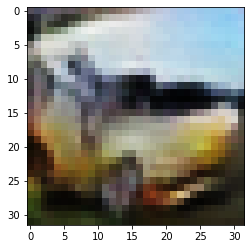

-> Epoch 146, Batch numero 1/78 -> Disc. loss on real images: 0.55357, Disc. loss on fake images: 0.58902, Generator loss: 1.17239
-> Epoch 146, Batch numero 2/78 -> Disc. loss on real images: 0.57582, Disc. loss on fake images: 0.58213, Generator loss: 1.09614
-> Epoch 146, Batch numero 3/78 -> Disc. loss on real images: 0.39526, Disc. loss on fake images: 0.59983, Generator loss: 1.29867
-> Epoch 146, Batch numero 4/78 -> Disc. loss on real images: 0.46413, Disc. loss on fake images: 0.56754, Generator loss: 1.31506
-> Epoch 146, Batch numero 5/78 -> Disc. loss on real images: 0.61024, Disc. loss on fake images: 0.49310, Generator loss: 1.22128
-> Epoch 146, Batch numero 6/78 -> Disc. loss on real images: 0.49132, Disc. loss on fake images: 0.69512, Generator loss: 1.29867
-> Epoch 146, Batch numero 7/78 -> Disc. loss on real images: 0.52408, Disc. loss on fake images: 0.48268, Generator loss: 1.31201
-> Epoch 146, Batch numero 8/78 -> Disc. loss on real images: 0.46995, Disc. loss o

-> Epoch 146, Batch numero 65/78 -> Disc. loss on real images: 0.47603, Disc. loss on fake images: 0.49029, Generator loss: 1.28177
-> Epoch 146, Batch numero 66/78 -> Disc. loss on real images: 0.61753, Disc. loss on fake images: 0.54640, Generator loss: 1.14593
-> Epoch 146, Batch numero 67/78 -> Disc. loss on real images: 0.46724, Disc. loss on fake images: 0.47193, Generator loss: 1.13646
-> Epoch 146, Batch numero 68/78 -> Disc. loss on real images: 0.51400, Disc. loss on fake images: 0.46623, Generator loss: 1.13702
-> Epoch 146, Batch numero 69/78 -> Disc. loss on real images: 0.47183, Disc. loss on fake images: 0.57239, Generator loss: 1.18262
-> Epoch 146, Batch numero 70/78 -> Disc. loss on real images: 0.62142, Disc. loss on fake images: 0.55179, Generator loss: 1.20696
-> Epoch 146, Batch numero 71/78 -> Disc. loss on real images: 0.44615, Disc. loss on fake images: 0.65634, Generator loss: 1.26112
-> Epoch 146, Batch numero 72/78 -> Disc. loss on real images: 0.54607, Disc

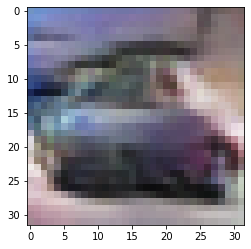

-> Epoch 147, Batch numero 1/78 -> Disc. loss on real images: 0.54296, Disc. loss on fake images: 0.45765, Generator loss: 1.42920
-> Epoch 147, Batch numero 2/78 -> Disc. loss on real images: 0.62163, Disc. loss on fake images: 0.71199, Generator loss: 1.39981
-> Epoch 147, Batch numero 3/78 -> Disc. loss on real images: 0.49786, Disc. loss on fake images: 0.50546, Generator loss: 1.40017
-> Epoch 147, Batch numero 4/78 -> Disc. loss on real images: 0.71600, Disc. loss on fake images: 0.51532, Generator loss: 1.16302
-> Epoch 147, Batch numero 5/78 -> Disc. loss on real images: 0.56445, Disc. loss on fake images: 0.52608, Generator loss: 1.36306
-> Epoch 147, Batch numero 6/78 -> Disc. loss on real images: 0.50488, Disc. loss on fake images: 0.49313, Generator loss: 1.29159
-> Epoch 147, Batch numero 7/78 -> Disc. loss on real images: 0.68528, Disc. loss on fake images: 0.49375, Generator loss: 1.14737
-> Epoch 147, Batch numero 8/78 -> Disc. loss on real images: 0.53619, Disc. loss o

-> Epoch 147, Batch numero 64/78 -> Disc. loss on real images: 0.43288, Disc. loss on fake images: 0.41122, Generator loss: 1.39395
-> Epoch 147, Batch numero 65/78 -> Disc. loss on real images: 0.53335, Disc. loss on fake images: 0.52990, Generator loss: 1.32707
-> Epoch 147, Batch numero 66/78 -> Disc. loss on real images: 0.33068, Disc. loss on fake images: 0.49850, Generator loss: 1.29405
-> Epoch 147, Batch numero 67/78 -> Disc. loss on real images: 0.53971, Disc. loss on fake images: 0.47821, Generator loss: 1.34034
-> Epoch 147, Batch numero 68/78 -> Disc. loss on real images: 0.58799, Disc. loss on fake images: 0.64365, Generator loss: 1.25220
-> Epoch 147, Batch numero 69/78 -> Disc. loss on real images: 0.51930, Disc. loss on fake images: 0.52145, Generator loss: 1.40503
-> Epoch 147, Batch numero 70/78 -> Disc. loss on real images: 0.62166, Disc. loss on fake images: 0.61368, Generator loss: 1.24402
-> Epoch 147, Batch numero 71/78 -> Disc. loss on real images: 0.71326, Disc

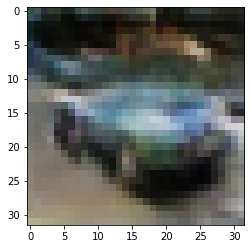

-> Epoch 148, Batch numero 1/78 -> Disc. loss on real images: 0.59464, Disc. loss on fake images: 0.51747, Generator loss: 1.08400
-> Epoch 148, Batch numero 2/78 -> Disc. loss on real images: 0.58629, Disc. loss on fake images: 0.53051, Generator loss: 1.26714
-> Epoch 148, Batch numero 3/78 -> Disc. loss on real images: 0.68810, Disc. loss on fake images: 0.45743, Generator loss: 1.27873
-> Epoch 148, Batch numero 4/78 -> Disc. loss on real images: 0.52006, Disc. loss on fake images: 0.57339, Generator loss: 1.14472
-> Epoch 148, Batch numero 5/78 -> Disc. loss on real images: 0.43006, Disc. loss on fake images: 0.53681, Generator loss: 1.38592
-> Epoch 148, Batch numero 6/78 -> Disc. loss on real images: 0.47205, Disc. loss on fake images: 0.50270, Generator loss: 1.34675
-> Epoch 148, Batch numero 7/78 -> Disc. loss on real images: 0.50628, Disc. loss on fake images: 0.43665, Generator loss: 1.35002
-> Epoch 148, Batch numero 8/78 -> Disc. loss on real images: 0.61487, Disc. loss o

-> Epoch 148, Batch numero 64/78 -> Disc. loss on real images: 0.40708, Disc. loss on fake images: 0.57701, Generator loss: 1.20634
-> Epoch 148, Batch numero 65/78 -> Disc. loss on real images: 0.47756, Disc. loss on fake images: 0.46660, Generator loss: 1.35033
-> Epoch 148, Batch numero 66/78 -> Disc. loss on real images: 0.53617, Disc. loss on fake images: 0.53770, Generator loss: 1.17615
-> Epoch 148, Batch numero 67/78 -> Disc. loss on real images: 0.67780, Disc. loss on fake images: 0.57099, Generator loss: 1.15057
-> Epoch 148, Batch numero 68/78 -> Disc. loss on real images: 0.50018, Disc. loss on fake images: 0.57420, Generator loss: 1.27900
-> Epoch 148, Batch numero 69/78 -> Disc. loss on real images: 0.47286, Disc. loss on fake images: 0.59399, Generator loss: 1.27950
-> Epoch 148, Batch numero 70/78 -> Disc. loss on real images: 0.61953, Disc. loss on fake images: 0.58087, Generator loss: 1.21754
-> Epoch 148, Batch numero 71/78 -> Disc. loss on real images: 0.61799, Disc

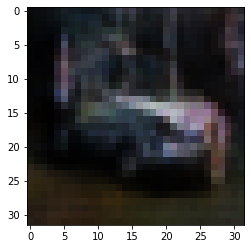

-> Epoch 149, Batch numero 1/78 -> Disc. loss on real images: 0.62570, Disc. loss on fake images: 0.63772, Generator loss: 1.33323
-> Epoch 149, Batch numero 2/78 -> Disc. loss on real images: 0.53634, Disc. loss on fake images: 0.51583, Generator loss: 1.11309
-> Epoch 149, Batch numero 3/78 -> Disc. loss on real images: 0.53180, Disc. loss on fake images: 0.52238, Generator loss: 1.31711
-> Epoch 149, Batch numero 4/78 -> Disc. loss on real images: 0.48170, Disc. loss on fake images: 0.51277, Generator loss: 1.24458
-> Epoch 149, Batch numero 5/78 -> Disc. loss on real images: 0.59570, Disc. loss on fake images: 0.66820, Generator loss: 1.28189
-> Epoch 149, Batch numero 6/78 -> Disc. loss on real images: 0.55694, Disc. loss on fake images: 0.58811, Generator loss: 1.12670
-> Epoch 149, Batch numero 7/78 -> Disc. loss on real images: 0.69389, Disc. loss on fake images: 0.50605, Generator loss: 1.28573
-> Epoch 149, Batch numero 8/78 -> Disc. loss on real images: 0.66285, Disc. loss o

-> Epoch 149, Batch numero 64/78 -> Disc. loss on real images: 0.41105, Disc. loss on fake images: 0.49420, Generator loss: 1.31283
-> Epoch 149, Batch numero 65/78 -> Disc. loss on real images: 0.43821, Disc. loss on fake images: 0.48382, Generator loss: 1.41747
-> Epoch 149, Batch numero 66/78 -> Disc. loss on real images: 0.59076, Disc. loss on fake images: 0.55492, Generator loss: 1.32494
-> Epoch 149, Batch numero 67/78 -> Disc. loss on real images: 0.48326, Disc. loss on fake images: 0.48425, Generator loss: 1.43270
-> Epoch 149, Batch numero 68/78 -> Disc. loss on real images: 0.68283, Disc. loss on fake images: 0.57146, Generator loss: 1.19367
-> Epoch 149, Batch numero 69/78 -> Disc. loss on real images: 0.74920, Disc. loss on fake images: 0.54969, Generator loss: 1.26291
-> Epoch 149, Batch numero 70/78 -> Disc. loss on real images: 0.51764, Disc. loss on fake images: 0.68800, Generator loss: 1.39326
-> Epoch 149, Batch numero 71/78 -> Disc. loss on real images: 0.57111, Disc

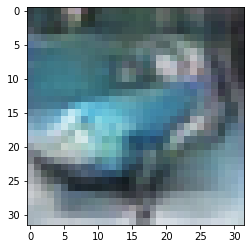

-> Epoch 150, Batch numero 1/78 -> Disc. loss on real images: 0.59252, Disc. loss on fake images: 0.54827, Generator loss: 1.26542
-> Epoch 150, Batch numero 2/78 -> Disc. loss on real images: 0.55546, Disc. loss on fake images: 0.63098, Generator loss: 1.30572
-> Epoch 150, Batch numero 3/78 -> Disc. loss on real images: 0.51830, Disc. loss on fake images: 0.51153, Generator loss: 1.11957
-> Epoch 150, Batch numero 4/78 -> Disc. loss on real images: 0.51600, Disc. loss on fake images: 0.59248, Generator loss: 1.17184
-> Epoch 150, Batch numero 5/78 -> Disc. loss on real images: 0.40864, Disc. loss on fake images: 0.74233, Generator loss: 1.25529
-> Epoch 150, Batch numero 6/78 -> Disc. loss on real images: 0.62774, Disc. loss on fake images: 0.48545, Generator loss: 1.22555
-> Epoch 150, Batch numero 7/78 -> Disc. loss on real images: 0.53862, Disc. loss on fake images: 0.49224, Generator loss: 1.35664
-> Epoch 150, Batch numero 8/78 -> Disc. loss on real images: 0.71474, Disc. loss o

-> Epoch 150, Batch numero 64/78 -> Disc. loss on real images: 0.74428, Disc. loss on fake images: 0.34055, Generator loss: 1.55563
-> Epoch 150, Batch numero 65/78 -> Disc. loss on real images: 0.68572, Disc. loss on fake images: 0.38589, Generator loss: 1.36315
-> Epoch 150, Batch numero 66/78 -> Disc. loss on real images: 0.74310, Disc. loss on fake images: 0.53833, Generator loss: 0.99915
-> Epoch 150, Batch numero 67/78 -> Disc. loss on real images: 0.44822, Disc. loss on fake images: 0.64417, Generator loss: 1.25836
-> Epoch 150, Batch numero 68/78 -> Disc. loss on real images: 0.52818, Disc. loss on fake images: 0.45271, Generator loss: 1.30643
-> Epoch 150, Batch numero 69/78 -> Disc. loss on real images: 0.47497, Disc. loss on fake images: 0.48479, Generator loss: 1.37746
-> Epoch 150, Batch numero 70/78 -> Disc. loss on real images: 0.49534, Disc. loss on fake images: 0.54845, Generator loss: 1.21850
-> Epoch 150, Batch numero 71/78 -> Disc. loss on real images: 0.47782, Disc

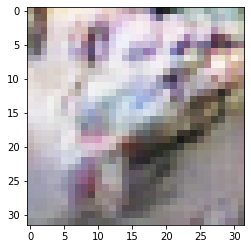

-> Epoch 151, Batch numero 1/78 -> Disc. loss on real images: 0.60580, Disc. loss on fake images: 0.50810, Generator loss: 1.18055
-> Epoch 151, Batch numero 2/78 -> Disc. loss on real images: 0.47242, Disc. loss on fake images: 0.58398, Generator loss: 1.05014
-> Epoch 151, Batch numero 3/78 -> Disc. loss on real images: 0.41264, Disc. loss on fake images: 0.58305, Generator loss: 1.19843
-> Epoch 151, Batch numero 4/78 -> Disc. loss on real images: 0.64066, Disc. loss on fake images: 0.54873, Generator loss: 1.20364
-> Epoch 151, Batch numero 5/78 -> Disc. loss on real images: 0.49839, Disc. loss on fake images: 0.53224, Generator loss: 1.16525
-> Epoch 151, Batch numero 6/78 -> Disc. loss on real images: 0.52309, Disc. loss on fake images: 0.54656, Generator loss: 1.21552
-> Epoch 151, Batch numero 7/78 -> Disc. loss on real images: 0.44540, Disc. loss on fake images: 0.60765, Generator loss: 1.22330
-> Epoch 151, Batch numero 8/78 -> Disc. loss on real images: 0.67251, Disc. loss o

-> Epoch 151, Batch numero 64/78 -> Disc. loss on real images: 0.54431, Disc. loss on fake images: 0.48203, Generator loss: 1.19631
-> Epoch 151, Batch numero 65/78 -> Disc. loss on real images: 0.51688, Disc. loss on fake images: 0.44362, Generator loss: 1.27557
-> Epoch 151, Batch numero 66/78 -> Disc. loss on real images: 0.52337, Disc. loss on fake images: 0.45012, Generator loss: 1.33860
-> Epoch 151, Batch numero 67/78 -> Disc. loss on real images: 0.47165, Disc. loss on fake images: 0.58410, Generator loss: 1.15484
-> Epoch 151, Batch numero 68/78 -> Disc. loss on real images: 0.55565, Disc. loss on fake images: 0.67669, Generator loss: 1.29587
-> Epoch 151, Batch numero 69/78 -> Disc. loss on real images: 0.48992, Disc. loss on fake images: 0.47700, Generator loss: 1.25170
-> Epoch 151, Batch numero 70/78 -> Disc. loss on real images: 0.57457, Disc. loss on fake images: 0.42923, Generator loss: 1.26347
-> Epoch 151, Batch numero 71/78 -> Disc. loss on real images: 0.55476, Disc

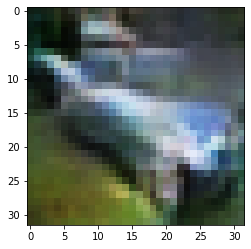

-> Epoch 152, Batch numero 1/78 -> Disc. loss on real images: 0.63557, Disc. loss on fake images: 0.44164, Generator loss: 1.52840
-> Epoch 152, Batch numero 2/78 -> Disc. loss on real images: 0.56884, Disc. loss on fake images: 0.52225, Generator loss: 1.26635
-> Epoch 152, Batch numero 3/78 -> Disc. loss on real images: 0.44610, Disc. loss on fake images: 0.63115, Generator loss: 1.17429
-> Epoch 152, Batch numero 4/78 -> Disc. loss on real images: 0.60289, Disc. loss on fake images: 0.56528, Generator loss: 1.19819
-> Epoch 152, Batch numero 5/78 -> Disc. loss on real images: 0.52470, Disc. loss on fake images: 0.60996, Generator loss: 1.36665
-> Epoch 152, Batch numero 6/78 -> Disc. loss on real images: 0.55359, Disc. loss on fake images: 0.45369, Generator loss: 1.32223
-> Epoch 152, Batch numero 7/78 -> Disc. loss on real images: 0.53566, Disc. loss on fake images: 0.49817, Generator loss: 1.32822
-> Epoch 152, Batch numero 8/78 -> Disc. loss on real images: 0.56518, Disc. loss o

-> Epoch 152, Batch numero 66/78 -> Disc. loss on real images: 0.59591, Disc. loss on fake images: 0.57241, Generator loss: 1.26598
-> Epoch 152, Batch numero 67/78 -> Disc. loss on real images: 0.50564, Disc. loss on fake images: 0.56306, Generator loss: 1.29183
-> Epoch 152, Batch numero 68/78 -> Disc. loss on real images: 0.52472, Disc. loss on fake images: 0.54794, Generator loss: 1.13516
-> Epoch 152, Batch numero 69/78 -> Disc. loss on real images: 0.59686, Disc. loss on fake images: 0.48277, Generator loss: 1.09160
-> Epoch 152, Batch numero 70/78 -> Disc. loss on real images: 0.56182, Disc. loss on fake images: 0.59956, Generator loss: 1.24641
-> Epoch 152, Batch numero 71/78 -> Disc. loss on real images: 0.65584, Disc. loss on fake images: 0.46524, Generator loss: 1.07650
-> Epoch 152, Batch numero 72/78 -> Disc. loss on real images: 0.43327, Disc. loss on fake images: 0.62965, Generator loss: 1.14538
-> Epoch 152, Batch numero 73/78 -> Disc. loss on real images: 0.56765, Disc

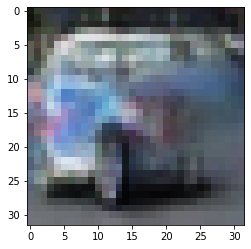

-> Epoch 153, Batch numero 1/78 -> Disc. loss on real images: 0.51990, Disc. loss on fake images: 0.37679, Generator loss: 1.33552
-> Epoch 153, Batch numero 2/78 -> Disc. loss on real images: 0.63049, Disc. loss on fake images: 0.50320, Generator loss: 1.50220
-> Epoch 153, Batch numero 3/78 -> Disc. loss on real images: 0.42245, Disc. loss on fake images: 0.44988, Generator loss: 1.13742
-> Epoch 153, Batch numero 4/78 -> Disc. loss on real images: 0.51815, Disc. loss on fake images: 0.54164, Generator loss: 1.12462
-> Epoch 153, Batch numero 5/78 -> Disc. loss on real images: 0.43039, Disc. loss on fake images: 0.66667, Generator loss: 1.27335
-> Epoch 153, Batch numero 6/78 -> Disc. loss on real images: 0.62545, Disc. loss on fake images: 0.50565, Generator loss: 1.21245
-> Epoch 153, Batch numero 7/78 -> Disc. loss on real images: 0.64681, Disc. loss on fake images: 0.53794, Generator loss: 1.34513
-> Epoch 153, Batch numero 8/78 -> Disc. loss on real images: 0.63442, Disc. loss o

-> Epoch 153, Batch numero 66/78 -> Disc. loss on real images: 0.61662, Disc. loss on fake images: 0.44669, Generator loss: 1.13747
-> Epoch 153, Batch numero 67/78 -> Disc. loss on real images: 0.57206, Disc. loss on fake images: 0.49421, Generator loss: 1.06711
-> Epoch 153, Batch numero 68/78 -> Disc. loss on real images: 0.54346, Disc. loss on fake images: 0.60302, Generator loss: 1.04028
-> Epoch 153, Batch numero 69/78 -> Disc. loss on real images: 0.48903, Disc. loss on fake images: 0.56655, Generator loss: 1.28135
-> Epoch 153, Batch numero 70/78 -> Disc. loss on real images: 0.50488, Disc. loss on fake images: 0.57304, Generator loss: 1.23623
-> Epoch 153, Batch numero 71/78 -> Disc. loss on real images: 0.32693, Disc. loss on fake images: 0.40135, Generator loss: 1.29656
-> Epoch 153, Batch numero 72/78 -> Disc. loss on real images: 0.42812, Disc. loss on fake images: 0.46412, Generator loss: 1.41369
-> Epoch 153, Batch numero 73/78 -> Disc. loss on real images: 0.51887, Disc

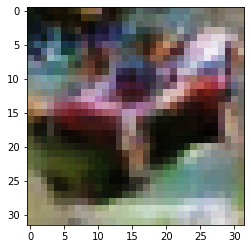

-> Epoch 154, Batch numero 1/78 -> Disc. loss on real images: 0.61743, Disc. loss on fake images: 0.65940, Generator loss: 1.24117
-> Epoch 154, Batch numero 2/78 -> Disc. loss on real images: 0.50889, Disc. loss on fake images: 0.46049, Generator loss: 1.45601
-> Epoch 154, Batch numero 3/78 -> Disc. loss on real images: 0.51563, Disc. loss on fake images: 0.51738, Generator loss: 1.49877
-> Epoch 154, Batch numero 4/78 -> Disc. loss on real images: 0.55835, Disc. loss on fake images: 0.45620, Generator loss: 1.33296
-> Epoch 154, Batch numero 5/78 -> Disc. loss on real images: 0.48136, Disc. loss on fake images: 0.49088, Generator loss: 1.35958
-> Epoch 154, Batch numero 6/78 -> Disc. loss on real images: 0.66039, Disc. loss on fake images: 0.44578, Generator loss: 1.25526
-> Epoch 154, Batch numero 7/78 -> Disc. loss on real images: 0.58594, Disc. loss on fake images: 0.64213, Generator loss: 1.31536
-> Epoch 154, Batch numero 8/78 -> Disc. loss on real images: 0.53722, Disc. loss o

-> Epoch 154, Batch numero 64/78 -> Disc. loss on real images: 0.46118, Disc. loss on fake images: 0.43313, Generator loss: 1.27159
-> Epoch 154, Batch numero 65/78 -> Disc. loss on real images: 0.51390, Disc. loss on fake images: 0.62475, Generator loss: 1.24408
-> Epoch 154, Batch numero 66/78 -> Disc. loss on real images: 0.46760, Disc. loss on fake images: 0.57764, Generator loss: 1.55262
-> Epoch 154, Batch numero 67/78 -> Disc. loss on real images: 0.70543, Disc. loss on fake images: 0.43918, Generator loss: 1.28537
-> Epoch 154, Batch numero 68/78 -> Disc. loss on real images: 0.66672, Disc. loss on fake images: 0.46636, Generator loss: 1.15285
-> Epoch 154, Batch numero 69/78 -> Disc. loss on real images: 0.49916, Disc. loss on fake images: 0.52768, Generator loss: 1.38944
-> Epoch 154, Batch numero 70/78 -> Disc. loss on real images: 0.43854, Disc. loss on fake images: 0.52040, Generator loss: 1.30238
-> Epoch 154, Batch numero 71/78 -> Disc. loss on real images: 0.60760, Disc

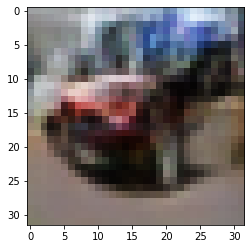

-> Epoch 155, Batch numero 1/78 -> Disc. loss on real images: 0.63031, Disc. loss on fake images: 0.50327, Generator loss: 1.34649
-> Epoch 155, Batch numero 2/78 -> Disc. loss on real images: 0.72307, Disc. loss on fake images: 0.49553, Generator loss: 1.25899
-> Epoch 155, Batch numero 3/78 -> Disc. loss on real images: 0.65109, Disc. loss on fake images: 0.53821, Generator loss: 1.31480
-> Epoch 155, Batch numero 4/78 -> Disc. loss on real images: 0.40971, Disc. loss on fake images: 0.50209, Generator loss: 1.28446
-> Epoch 155, Batch numero 5/78 -> Disc. loss on real images: 0.58955, Disc. loss on fake images: 0.57281, Generator loss: 1.16967
-> Epoch 155, Batch numero 6/78 -> Disc. loss on real images: 0.44331, Disc. loss on fake images: 0.75012, Generator loss: 1.33128
-> Epoch 155, Batch numero 7/78 -> Disc. loss on real images: 0.46270, Disc. loss on fake images: 0.53246, Generator loss: 1.34708
-> Epoch 155, Batch numero 8/78 -> Disc. loss on real images: 0.64311, Disc. loss o

-> Epoch 155, Batch numero 64/78 -> Disc. loss on real images: 0.49103, Disc. loss on fake images: 0.55259, Generator loss: 1.29092
-> Epoch 155, Batch numero 65/78 -> Disc. loss on real images: 0.47298, Disc. loss on fake images: 0.47265, Generator loss: 1.32011
-> Epoch 155, Batch numero 66/78 -> Disc. loss on real images: 0.64301, Disc. loss on fake images: 0.42903, Generator loss: 1.27805
-> Epoch 155, Batch numero 67/78 -> Disc. loss on real images: 0.54597, Disc. loss on fake images: 0.50178, Generator loss: 1.27588
-> Epoch 155, Batch numero 68/78 -> Disc. loss on real images: 0.58172, Disc. loss on fake images: 0.65390, Generator loss: 1.25313
-> Epoch 155, Batch numero 69/78 -> Disc. loss on real images: 0.54506, Disc. loss on fake images: 0.55251, Generator loss: 1.29642
-> Epoch 155, Batch numero 70/78 -> Disc. loss on real images: 0.54701, Disc. loss on fake images: 0.44453, Generator loss: 1.41645
-> Epoch 155, Batch numero 71/78 -> Disc. loss on real images: 0.59569, Disc

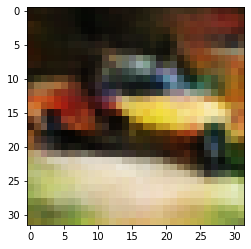

-> Epoch 156, Batch numero 1/78 -> Disc. loss on real images: 0.55290, Disc. loss on fake images: 0.43871, Generator loss: 1.36684
-> Epoch 156, Batch numero 2/78 -> Disc. loss on real images: 0.44801, Disc. loss on fake images: 0.53187, Generator loss: 1.23917
-> Epoch 156, Batch numero 3/78 -> Disc. loss on real images: 0.83599, Disc. loss on fake images: 0.54985, Generator loss: 1.21348
-> Epoch 156, Batch numero 4/78 -> Disc. loss on real images: 0.53611, Disc. loss on fake images: 0.55605, Generator loss: 1.27635
-> Epoch 156, Batch numero 5/78 -> Disc. loss on real images: 0.46784, Disc. loss on fake images: 0.49823, Generator loss: 1.33058
-> Epoch 156, Batch numero 6/78 -> Disc. loss on real images: 0.55552, Disc. loss on fake images: 0.47427, Generator loss: 1.19071
-> Epoch 156, Batch numero 7/78 -> Disc. loss on real images: 0.35627, Disc. loss on fake images: 0.51664, Generator loss: 1.31266
-> Epoch 156, Batch numero 8/78 -> Disc. loss on real images: 0.63907, Disc. loss o

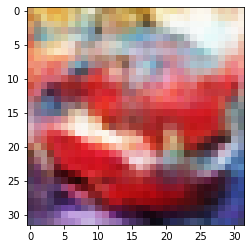

-> Epoch 157, Batch numero 1/78 -> Disc. loss on real images: 0.46842, Disc. loss on fake images: 0.43732, Generator loss: 1.36330
-> Epoch 157, Batch numero 2/78 -> Disc. loss on real images: 0.62905, Disc. loss on fake images: 0.56657, Generator loss: 1.09616
-> Epoch 157, Batch numero 3/78 -> Disc. loss on real images: 0.51839, Disc. loss on fake images: 0.76268, Generator loss: 1.21513
-> Epoch 157, Batch numero 4/78 -> Disc. loss on real images: 0.55395, Disc. loss on fake images: 0.52293, Generator loss: 1.44513
-> Epoch 157, Batch numero 5/78 -> Disc. loss on real images: 0.60987, Disc. loss on fake images: 0.45034, Generator loss: 1.20954
-> Epoch 157, Batch numero 6/78 -> Disc. loss on real images: 0.52905, Disc. loss on fake images: 0.49119, Generator loss: 1.24196
-> Epoch 157, Batch numero 7/78 -> Disc. loss on real images: 0.57108, Disc. loss on fake images: 0.51919, Generator loss: 1.25781
-> Epoch 157, Batch numero 8/78 -> Disc. loss on real images: 0.58500, Disc. loss o

-> Epoch 157, Batch numero 65/78 -> Disc. loss on real images: 0.55970, Disc. loss on fake images: 0.35688, Generator loss: 1.41859
-> Epoch 157, Batch numero 66/78 -> Disc. loss on real images: 0.53939, Disc. loss on fake images: 0.48086, Generator loss: 1.30592
-> Epoch 157, Batch numero 67/78 -> Disc. loss on real images: 0.50566, Disc. loss on fake images: 0.45503, Generator loss: 1.11538
-> Epoch 157, Batch numero 68/78 -> Disc. loss on real images: 0.52743, Disc. loss on fake images: 0.45294, Generator loss: 1.20290
-> Epoch 157, Batch numero 69/78 -> Disc. loss on real images: 0.45536, Disc. loss on fake images: 0.61438, Generator loss: 1.21266
-> Epoch 157, Batch numero 70/78 -> Disc. loss on real images: 0.44521, Disc. loss on fake images: 0.41655, Generator loss: 1.29717
-> Epoch 157, Batch numero 71/78 -> Disc. loss on real images: 0.59039, Disc. loss on fake images: 0.61962, Generator loss: 1.25228
-> Epoch 157, Batch numero 72/78 -> Disc. loss on real images: 0.66112, Disc

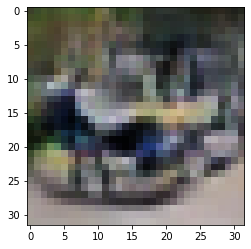

-> Epoch 158, Batch numero 1/78 -> Disc. loss on real images: 0.42551, Disc. loss on fake images: 0.53017, Generator loss: 1.35085
-> Epoch 158, Batch numero 2/78 -> Disc. loss on real images: 0.47660, Disc. loss on fake images: 0.55173, Generator loss: 1.32560
-> Epoch 158, Batch numero 3/78 -> Disc. loss on real images: 0.40587, Disc. loss on fake images: 0.46020, Generator loss: 1.35672
-> Epoch 158, Batch numero 4/78 -> Disc. loss on real images: 0.59606, Disc. loss on fake images: 0.53183, Generator loss: 1.31334
-> Epoch 158, Batch numero 5/78 -> Disc. loss on real images: 0.51371, Disc. loss on fake images: 0.50688, Generator loss: 1.22344
-> Epoch 158, Batch numero 6/78 -> Disc. loss on real images: 0.65044, Disc. loss on fake images: 0.64654, Generator loss: 1.29017
-> Epoch 158, Batch numero 7/78 -> Disc. loss on real images: 0.51335, Disc. loss on fake images: 0.46138, Generator loss: 1.31747
-> Epoch 158, Batch numero 8/78 -> Disc. loss on real images: 0.66074, Disc. loss o

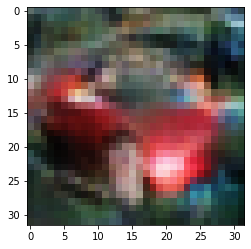

-> Epoch 159, Batch numero 1/78 -> Disc. loss on real images: 0.36225, Disc. loss on fake images: 0.49800, Generator loss: 1.48114
-> Epoch 159, Batch numero 2/78 -> Disc. loss on real images: 0.44950, Disc. loss on fake images: 0.48021, Generator loss: 1.29609
-> Epoch 159, Batch numero 3/78 -> Disc. loss on real images: 0.61819, Disc. loss on fake images: 0.45940, Generator loss: 1.32639
-> Epoch 159, Batch numero 4/78 -> Disc. loss on real images: 0.54312, Disc. loss on fake images: 0.41938, Generator loss: 1.16030
-> Epoch 159, Batch numero 5/78 -> Disc. loss on real images: 0.48343, Disc. loss on fake images: 0.80965, Generator loss: 1.42400
-> Epoch 159, Batch numero 6/78 -> Disc. loss on real images: 0.48757, Disc. loss on fake images: 0.36714, Generator loss: 1.31721
-> Epoch 159, Batch numero 7/78 -> Disc. loss on real images: 0.59023, Disc. loss on fake images: 0.58002, Generator loss: 1.18873
-> Epoch 159, Batch numero 8/78 -> Disc. loss on real images: 0.54726, Disc. loss o

-> Epoch 159, Batch numero 65/78 -> Disc. loss on real images: 0.42418, Disc. loss on fake images: 0.51158, Generator loss: 1.35613
-> Epoch 159, Batch numero 66/78 -> Disc. loss on real images: 0.51490, Disc. loss on fake images: 0.46020, Generator loss: 1.48608
-> Epoch 159, Batch numero 67/78 -> Disc. loss on real images: 0.48710, Disc. loss on fake images: 0.46721, Generator loss: 1.29040
-> Epoch 159, Batch numero 68/78 -> Disc. loss on real images: 0.67027, Disc. loss on fake images: 0.52163, Generator loss: 1.32436
-> Epoch 159, Batch numero 69/78 -> Disc. loss on real images: 0.51912, Disc. loss on fake images: 0.62164, Generator loss: 1.51848
-> Epoch 159, Batch numero 70/78 -> Disc. loss on real images: 0.47888, Disc. loss on fake images: 0.44599, Generator loss: 1.30466
-> Epoch 159, Batch numero 71/78 -> Disc. loss on real images: 0.59007, Disc. loss on fake images: 0.38111, Generator loss: 1.25040
-> Epoch 159, Batch numero 72/78 -> Disc. loss on real images: 0.56171, Disc

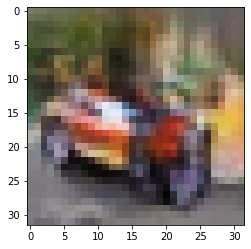

-> Epoch 160, Batch numero 1/78 -> Disc. loss on real images: 0.67878, Disc. loss on fake images: 0.61061, Generator loss: 1.19645
-> Epoch 160, Batch numero 2/78 -> Disc. loss on real images: 0.62517, Disc. loss on fake images: 0.49900, Generator loss: 1.40212
-> Epoch 160, Batch numero 3/78 -> Disc. loss on real images: 0.56276, Disc. loss on fake images: 0.57132, Generator loss: 1.48389
-> Epoch 160, Batch numero 4/78 -> Disc. loss on real images: 0.74383, Disc. loss on fake images: 0.49268, Generator loss: 1.33610
-> Epoch 160, Batch numero 5/78 -> Disc. loss on real images: 0.38286, Disc. loss on fake images: 0.42811, Generator loss: 1.45152
-> Epoch 160, Batch numero 6/78 -> Disc. loss on real images: 0.64118, Disc. loss on fake images: 0.42394, Generator loss: 1.48443
-> Epoch 160, Batch numero 7/78 -> Disc. loss on real images: 0.47343, Disc. loss on fake images: 0.54589, Generator loss: 1.50104
-> Epoch 160, Batch numero 8/78 -> Disc. loss on real images: 0.49900, Disc. loss o

-> Epoch 160, Batch numero 65/78 -> Disc. loss on real images: 0.42644, Disc. loss on fake images: 0.43966, Generator loss: 1.40773
-> Epoch 160, Batch numero 66/78 -> Disc. loss on real images: 0.57127, Disc. loss on fake images: 0.47864, Generator loss: 1.51479
-> Epoch 160, Batch numero 67/78 -> Disc. loss on real images: 0.55022, Disc. loss on fake images: 0.45530, Generator loss: 1.29893
-> Epoch 160, Batch numero 68/78 -> Disc. loss on real images: 0.48927, Disc. loss on fake images: 0.49645, Generator loss: 1.18929
-> Epoch 160, Batch numero 69/78 -> Disc. loss on real images: 0.45477, Disc. loss on fake images: 0.62900, Generator loss: 1.18299
-> Epoch 160, Batch numero 70/78 -> Disc. loss on real images: 0.42177, Disc. loss on fake images: 0.45368, Generator loss: 1.41579
-> Epoch 160, Batch numero 71/78 -> Disc. loss on real images: 0.55070, Disc. loss on fake images: 0.70496, Generator loss: 1.30780
-> Epoch 160, Batch numero 72/78 -> Disc. loss on real images: 0.53536, Disc

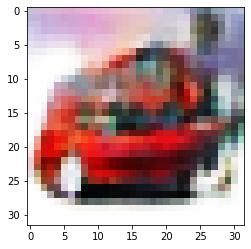

-> Epoch 161, Batch numero 1/78 -> Disc. loss on real images: 0.59488, Disc. loss on fake images: 0.57302, Generator loss: 1.50942
-> Epoch 161, Batch numero 2/78 -> Disc. loss on real images: 0.66626, Disc. loss on fake images: 0.46343, Generator loss: 1.56993
-> Epoch 161, Batch numero 3/78 -> Disc. loss on real images: 0.80600, Disc. loss on fake images: 0.40458, Generator loss: 1.32607
-> Epoch 161, Batch numero 4/78 -> Disc. loss on real images: 0.42930, Disc. loss on fake images: 0.67187, Generator loss: 1.30745
-> Epoch 161, Batch numero 5/78 -> Disc. loss on real images: 0.46457, Disc. loss on fake images: 0.61758, Generator loss: 1.27093
-> Epoch 161, Batch numero 6/78 -> Disc. loss on real images: 0.41678, Disc. loss on fake images: 0.54588, Generator loss: 1.33604
-> Epoch 161, Batch numero 7/78 -> Disc. loss on real images: 0.68065, Disc. loss on fake images: 0.49514, Generator loss: 1.30734
-> Epoch 161, Batch numero 8/78 -> Disc. loss on real images: 0.55118, Disc. loss o

-> Epoch 161, Batch numero 65/78 -> Disc. loss on real images: 0.44519, Disc. loss on fake images: 0.49991, Generator loss: 1.29541
-> Epoch 161, Batch numero 66/78 -> Disc. loss on real images: 0.52196, Disc. loss on fake images: 0.49640, Generator loss: 1.13518
-> Epoch 161, Batch numero 67/78 -> Disc. loss on real images: 0.57430, Disc. loss on fake images: 0.64842, Generator loss: 1.18843
-> Epoch 161, Batch numero 68/78 -> Disc. loss on real images: 0.41582, Disc. loss on fake images: 0.66904, Generator loss: 1.27914
-> Epoch 161, Batch numero 69/78 -> Disc. loss on real images: 0.54267, Disc. loss on fake images: 0.64383, Generator loss: 1.56160
-> Epoch 161, Batch numero 70/78 -> Disc. loss on real images: 0.52238, Disc. loss on fake images: 0.37962, Generator loss: 1.44222
-> Epoch 161, Batch numero 71/78 -> Disc. loss on real images: 0.53539, Disc. loss on fake images: 0.41733, Generator loss: 1.34010
-> Epoch 161, Batch numero 72/78 -> Disc. loss on real images: 0.51020, Disc

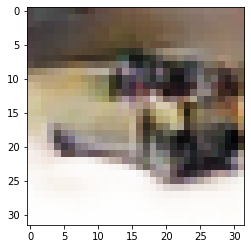

-> Epoch 162, Batch numero 1/78 -> Disc. loss on real images: 0.36564, Disc. loss on fake images: 0.45914, Generator loss: 1.35278
-> Epoch 162, Batch numero 2/78 -> Disc. loss on real images: 0.47709, Disc. loss on fake images: 0.46968, Generator loss: 1.49292
-> Epoch 162, Batch numero 3/78 -> Disc. loss on real images: 0.62830, Disc. loss on fake images: 0.42543, Generator loss: 1.33820
-> Epoch 162, Batch numero 4/78 -> Disc. loss on real images: 0.58020, Disc. loss on fake images: 0.63175, Generator loss: 1.24971
-> Epoch 162, Batch numero 5/78 -> Disc. loss on real images: 0.43909, Disc. loss on fake images: 0.59435, Generator loss: 1.30607
-> Epoch 162, Batch numero 6/78 -> Disc. loss on real images: 0.50834, Disc. loss on fake images: 0.47833, Generator loss: 1.20748
-> Epoch 162, Batch numero 7/78 -> Disc. loss on real images: 0.51272, Disc. loss on fake images: 0.52662, Generator loss: 1.25920
-> Epoch 162, Batch numero 8/78 -> Disc. loss on real images: 0.45218, Disc. loss o

-> Epoch 162, Batch numero 65/78 -> Disc. loss on real images: 0.51639, Disc. loss on fake images: 0.49674, Generator loss: 1.24459
-> Epoch 162, Batch numero 66/78 -> Disc. loss on real images: 0.52930, Disc. loss on fake images: 0.62755, Generator loss: 1.34096
-> Epoch 162, Batch numero 67/78 -> Disc. loss on real images: 0.52646, Disc. loss on fake images: 0.49413, Generator loss: 1.36581
-> Epoch 162, Batch numero 68/78 -> Disc. loss on real images: 0.55561, Disc. loss on fake images: 0.77061, Generator loss: 1.25042
-> Epoch 162, Batch numero 69/78 -> Disc. loss on real images: 0.64432, Disc. loss on fake images: 0.39266, Generator loss: 1.27733
-> Epoch 162, Batch numero 70/78 -> Disc. loss on real images: 0.56531, Disc. loss on fake images: 0.67149, Generator loss: 1.39278
-> Epoch 162, Batch numero 71/78 -> Disc. loss on real images: 0.39543, Disc. loss on fake images: 0.50815, Generator loss: 1.37852
-> Epoch 162, Batch numero 72/78 -> Disc. loss on real images: 0.47328, Disc

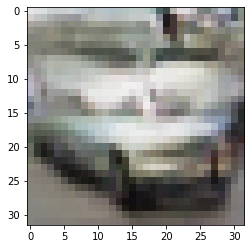

-> Epoch 163, Batch numero 1/78 -> Disc. loss on real images: 0.59240, Disc. loss on fake images: 0.45844, Generator loss: 1.29300
-> Epoch 163, Batch numero 2/78 -> Disc. loss on real images: 0.60020, Disc. loss on fake images: 0.47589, Generator loss: 1.27615
-> Epoch 163, Batch numero 3/78 -> Disc. loss on real images: 0.46601, Disc. loss on fake images: 0.47629, Generator loss: 1.27900
-> Epoch 163, Batch numero 4/78 -> Disc. loss on real images: 0.46454, Disc. loss on fake images: 0.46356, Generator loss: 1.52230
-> Epoch 163, Batch numero 5/78 -> Disc. loss on real images: 0.48663, Disc. loss on fake images: 0.50450, Generator loss: 1.44392
-> Epoch 163, Batch numero 6/78 -> Disc. loss on real images: 0.51497, Disc. loss on fake images: 0.50002, Generator loss: 1.45554
-> Epoch 163, Batch numero 7/78 -> Disc. loss on real images: 0.59290, Disc. loss on fake images: 0.47840, Generator loss: 1.50048
-> Epoch 163, Batch numero 8/78 -> Disc. loss on real images: 0.59446, Disc. loss o

-> Epoch 163, Batch numero 65/78 -> Disc. loss on real images: 0.56863, Disc. loss on fake images: 0.53441, Generator loss: 1.41578
-> Epoch 163, Batch numero 66/78 -> Disc. loss on real images: 0.57170, Disc. loss on fake images: 0.52568, Generator loss: 1.45054
-> Epoch 163, Batch numero 67/78 -> Disc. loss on real images: 0.73072, Disc. loss on fake images: 0.56605, Generator loss: 1.31790
-> Epoch 163, Batch numero 68/78 -> Disc. loss on real images: 0.46596, Disc. loss on fake images: 0.51938, Generator loss: 1.33840
-> Epoch 163, Batch numero 69/78 -> Disc. loss on real images: 0.50192, Disc. loss on fake images: 0.50610, Generator loss: 1.17828
-> Epoch 163, Batch numero 70/78 -> Disc. loss on real images: 0.50242, Disc. loss on fake images: 0.48387, Generator loss: 1.37880
-> Epoch 163, Batch numero 71/78 -> Disc. loss on real images: 0.49923, Disc. loss on fake images: 0.69151, Generator loss: 1.33569
-> Epoch 163, Batch numero 72/78 -> Disc. loss on real images: 0.50175, Disc

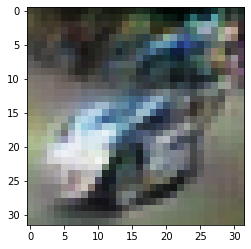

-> Epoch 164, Batch numero 1/78 -> Disc. loss on real images: 0.67030, Disc. loss on fake images: 0.47113, Generator loss: 1.32382
-> Epoch 164, Batch numero 2/78 -> Disc. loss on real images: 0.58219, Disc. loss on fake images: 0.76835, Generator loss: 1.23155
-> Epoch 164, Batch numero 3/78 -> Disc. loss on real images: 0.68571, Disc. loss on fake images: 0.59755, Generator loss: 1.44970
-> Epoch 164, Batch numero 4/78 -> Disc. loss on real images: 0.44956, Disc. loss on fake images: 0.55532, Generator loss: 1.54095
-> Epoch 164, Batch numero 5/78 -> Disc. loss on real images: 0.61021, Disc. loss on fake images: 0.40446, Generator loss: 1.52360
-> Epoch 164, Batch numero 6/78 -> Disc. loss on real images: 0.56118, Disc. loss on fake images: 0.43198, Generator loss: 1.36955
-> Epoch 164, Batch numero 7/78 -> Disc. loss on real images: 0.64660, Disc. loss on fake images: 0.67843, Generator loss: 1.27961
-> Epoch 164, Batch numero 8/78 -> Disc. loss on real images: 0.46339, Disc. loss o

-> Epoch 164, Batch numero 64/78 -> Disc. loss on real images: 0.55996, Disc. loss on fake images: 0.42170, Generator loss: 1.48929
-> Epoch 164, Batch numero 65/78 -> Disc. loss on real images: 0.45504, Disc. loss on fake images: 0.76026, Generator loss: 1.51486
-> Epoch 164, Batch numero 66/78 -> Disc. loss on real images: 0.55610, Disc. loss on fake images: 0.44468, Generator loss: 1.58463
-> Epoch 164, Batch numero 67/78 -> Disc. loss on real images: 0.53245, Disc. loss on fake images: 0.39591, Generator loss: 1.27190
-> Epoch 164, Batch numero 68/78 -> Disc. loss on real images: 0.51869, Disc. loss on fake images: 0.55823, Generator loss: 1.43422
-> Epoch 164, Batch numero 69/78 -> Disc. loss on real images: 0.42740, Disc. loss on fake images: 0.47970, Generator loss: 1.31301
-> Epoch 164, Batch numero 70/78 -> Disc. loss on real images: 0.49629, Disc. loss on fake images: 0.51482, Generator loss: 1.36399
-> Epoch 164, Batch numero 71/78 -> Disc. loss on real images: 0.57131, Disc

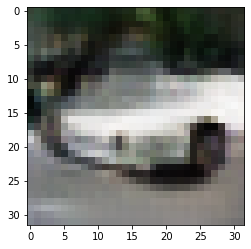

-> Epoch 165, Batch numero 1/78 -> Disc. loss on real images: 0.46506, Disc. loss on fake images: 0.50707, Generator loss: 1.27115
-> Epoch 165, Batch numero 2/78 -> Disc. loss on real images: 0.48350, Disc. loss on fake images: 0.52370, Generator loss: 1.33216
-> Epoch 165, Batch numero 3/78 -> Disc. loss on real images: 0.59597, Disc. loss on fake images: 0.65248, Generator loss: 1.55517
-> Epoch 165, Batch numero 4/78 -> Disc. loss on real images: 0.56326, Disc. loss on fake images: 0.40766, Generator loss: 1.38287
-> Epoch 165, Batch numero 5/78 -> Disc. loss on real images: 0.57440, Disc. loss on fake images: 0.44307, Generator loss: 1.29855
-> Epoch 165, Batch numero 6/78 -> Disc. loss on real images: 0.48398, Disc. loss on fake images: 0.38293, Generator loss: 1.35750
-> Epoch 165, Batch numero 7/78 -> Disc. loss on real images: 0.47890, Disc. loss on fake images: 0.46147, Generator loss: 1.32315
-> Epoch 165, Batch numero 8/78 -> Disc. loss on real images: 0.42045, Disc. loss o

-> Epoch 165, Batch numero 64/78 -> Disc. loss on real images: 0.35083, Disc. loss on fake images: 0.52424, Generator loss: 1.13986
-> Epoch 165, Batch numero 65/78 -> Disc. loss on real images: 0.53868, Disc. loss on fake images: 0.59051, Generator loss: 1.26753
-> Epoch 165, Batch numero 66/78 -> Disc. loss on real images: 0.46668, Disc. loss on fake images: 0.46414, Generator loss: 1.30504
-> Epoch 165, Batch numero 67/78 -> Disc. loss on real images: 0.36978, Disc. loss on fake images: 0.72056, Generator loss: 1.54160
-> Epoch 165, Batch numero 68/78 -> Disc. loss on real images: 0.56028, Disc. loss on fake images: 0.46679, Generator loss: 1.35707
-> Epoch 165, Batch numero 69/78 -> Disc. loss on real images: 0.51714, Disc. loss on fake images: 0.44481, Generator loss: 1.33116
-> Epoch 165, Batch numero 70/78 -> Disc. loss on real images: 0.59414, Disc. loss on fake images: 0.54280, Generator loss: 1.37683
-> Epoch 165, Batch numero 71/78 -> Disc. loss on real images: 0.44093, Disc

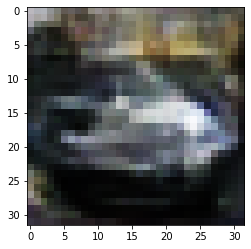

-> Epoch 166, Batch numero 1/78 -> Disc. loss on real images: 0.57311, Disc. loss on fake images: 0.53062, Generator loss: 1.42190
-> Epoch 166, Batch numero 2/78 -> Disc. loss on real images: 0.45298, Disc. loss on fake images: 0.53026, Generator loss: 1.32293
-> Epoch 166, Batch numero 3/78 -> Disc. loss on real images: 0.57044, Disc. loss on fake images: 0.42780, Generator loss: 1.38468
-> Epoch 166, Batch numero 4/78 -> Disc. loss on real images: 0.50532, Disc. loss on fake images: 0.50587, Generator loss: 1.10898
-> Epoch 166, Batch numero 5/78 -> Disc. loss on real images: 0.46939, Disc. loss on fake images: 0.54867, Generator loss: 1.39142
-> Epoch 166, Batch numero 6/78 -> Disc. loss on real images: 0.63038, Disc. loss on fake images: 0.43265, Generator loss: 1.51224
-> Epoch 166, Batch numero 7/78 -> Disc. loss on real images: 0.72608, Disc. loss on fake images: 0.57451, Generator loss: 1.29052
-> Epoch 166, Batch numero 8/78 -> Disc. loss on real images: 0.37758, Disc. loss o

-> Epoch 166, Batch numero 64/78 -> Disc. loss on real images: 0.56215, Disc. loss on fake images: 0.40675, Generator loss: 1.51976
-> Epoch 166, Batch numero 65/78 -> Disc. loss on real images: 0.46330, Disc. loss on fake images: 0.41088, Generator loss: 1.60777
-> Epoch 166, Batch numero 66/78 -> Disc. loss on real images: 0.63727, Disc. loss on fake images: 0.53344, Generator loss: 1.45733
-> Epoch 166, Batch numero 67/78 -> Disc. loss on real images: 0.56142, Disc. loss on fake images: 0.54354, Generator loss: 1.41373
-> Epoch 166, Batch numero 68/78 -> Disc. loss on real images: 0.52681, Disc. loss on fake images: 0.49812, Generator loss: 1.27301
-> Epoch 166, Batch numero 69/78 -> Disc. loss on real images: 0.46895, Disc. loss on fake images: 0.49077, Generator loss: 1.27385
-> Epoch 166, Batch numero 70/78 -> Disc. loss on real images: 0.47190, Disc. loss on fake images: 0.43224, Generator loss: 1.10391
-> Epoch 166, Batch numero 71/78 -> Disc. loss on real images: 0.33483, Disc

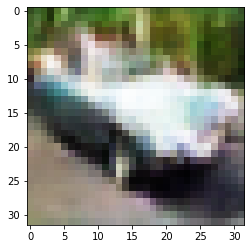

-> Epoch 167, Batch numero 1/78 -> Disc. loss on real images: 0.33849, Disc. loss on fake images: 0.43212, Generator loss: 1.40933
-> Epoch 167, Batch numero 2/78 -> Disc. loss on real images: 0.68779, Disc. loss on fake images: 0.51082, Generator loss: 1.53714
-> Epoch 167, Batch numero 3/78 -> Disc. loss on real images: 0.48211, Disc. loss on fake images: 0.48815, Generator loss: 1.28645
-> Epoch 167, Batch numero 4/78 -> Disc. loss on real images: 0.55155, Disc. loss on fake images: 0.54108, Generator loss: 1.38137
-> Epoch 167, Batch numero 5/78 -> Disc. loss on real images: 0.57351, Disc. loss on fake images: 0.44753, Generator loss: 1.39730
-> Epoch 167, Batch numero 6/78 -> Disc. loss on real images: 0.57223, Disc. loss on fake images: 0.43545, Generator loss: 1.22216
-> Epoch 167, Batch numero 7/78 -> Disc. loss on real images: 0.55392, Disc. loss on fake images: 0.52352, Generator loss: 1.16576
-> Epoch 167, Batch numero 8/78 -> Disc. loss on real images: 0.53389, Disc. loss o

-> Epoch 167, Batch numero 66/78 -> Disc. loss on real images: 0.53429, Disc. loss on fake images: 0.49911, Generator loss: 1.34577
-> Epoch 167, Batch numero 67/78 -> Disc. loss on real images: 0.43879, Disc. loss on fake images: 0.54407, Generator loss: 1.49305
-> Epoch 167, Batch numero 68/78 -> Disc. loss on real images: 0.41550, Disc. loss on fake images: 0.42922, Generator loss: 1.41188
-> Epoch 167, Batch numero 69/78 -> Disc. loss on real images: 0.53747, Disc. loss on fake images: 0.48664, Generator loss: 1.36369
-> Epoch 167, Batch numero 70/78 -> Disc. loss on real images: 0.63435, Disc. loss on fake images: 0.54994, Generator loss: 1.32028
-> Epoch 167, Batch numero 71/78 -> Disc. loss on real images: 0.56389, Disc. loss on fake images: 0.44098, Generator loss: 1.36100
-> Epoch 167, Batch numero 72/78 -> Disc. loss on real images: 0.57647, Disc. loss on fake images: 0.48777, Generator loss: 1.28881
-> Epoch 167, Batch numero 73/78 -> Disc. loss on real images: 0.50002, Disc

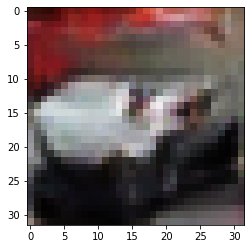

-> Epoch 168, Batch numero 1/78 -> Disc. loss on real images: 0.55307, Disc. loss on fake images: 0.64690, Generator loss: 1.35131
-> Epoch 168, Batch numero 2/78 -> Disc. loss on real images: 0.58183, Disc. loss on fake images: 0.38088, Generator loss: 1.17780
-> Epoch 168, Batch numero 3/78 -> Disc. loss on real images: 0.45439, Disc. loss on fake images: 0.60080, Generator loss: 1.45021
-> Epoch 168, Batch numero 4/78 -> Disc. loss on real images: 0.48327, Disc. loss on fake images: 0.74725, Generator loss: 1.21750
-> Epoch 168, Batch numero 5/78 -> Disc. loss on real images: 0.51063, Disc. loss on fake images: 0.33050, Generator loss: 1.39095
-> Epoch 168, Batch numero 6/78 -> Disc. loss on real images: 0.49516, Disc. loss on fake images: 0.52293, Generator loss: 1.41095
-> Epoch 168, Batch numero 7/78 -> Disc. loss on real images: 0.51320, Disc. loss on fake images: 0.50987, Generator loss: 1.41104
-> Epoch 168, Batch numero 8/78 -> Disc. loss on real images: 0.54663, Disc. loss o

-> Epoch 168, Batch numero 66/78 -> Disc. loss on real images: 0.55597, Disc. loss on fake images: 0.53238, Generator loss: 1.34129
-> Epoch 168, Batch numero 67/78 -> Disc. loss on real images: 0.42694, Disc. loss on fake images: 0.64213, Generator loss: 1.47985
-> Epoch 168, Batch numero 68/78 -> Disc. loss on real images: 0.57141, Disc. loss on fake images: 0.34501, Generator loss: 1.29847
-> Epoch 168, Batch numero 69/78 -> Disc. loss on real images: 0.57090, Disc. loss on fake images: 0.49132, Generator loss: 1.36062
-> Epoch 168, Batch numero 70/78 -> Disc. loss on real images: 0.57266, Disc. loss on fake images: 0.56527, Generator loss: 1.22782
-> Epoch 168, Batch numero 71/78 -> Disc. loss on real images: 0.60091, Disc. loss on fake images: 0.61517, Generator loss: 1.40022
-> Epoch 168, Batch numero 72/78 -> Disc. loss on real images: 0.51503, Disc. loss on fake images: 0.64670, Generator loss: 1.60250
-> Epoch 168, Batch numero 73/78 -> Disc. loss on real images: 0.55112, Disc

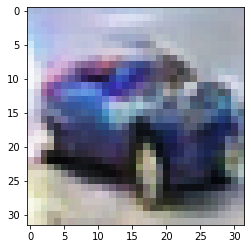

-> Epoch 169, Batch numero 1/78 -> Disc. loss on real images: 0.49898, Disc. loss on fake images: 0.59622, Generator loss: 1.29996
-> Epoch 169, Batch numero 2/78 -> Disc. loss on real images: 0.64056, Disc. loss on fake images: 0.56901, Generator loss: 1.30793
-> Epoch 169, Batch numero 3/78 -> Disc. loss on real images: 0.51253, Disc. loss on fake images: 0.47518, Generator loss: 1.43592
-> Epoch 169, Batch numero 4/78 -> Disc. loss on real images: 0.53613, Disc. loss on fake images: 0.50853, Generator loss: 1.49154
-> Epoch 169, Batch numero 5/78 -> Disc. loss on real images: 0.34324, Disc. loss on fake images: 0.43431, Generator loss: 1.47819
-> Epoch 169, Batch numero 6/78 -> Disc. loss on real images: 0.66108, Disc. loss on fake images: 0.58671, Generator loss: 1.55721
-> Epoch 169, Batch numero 7/78 -> Disc. loss on real images: 0.41797, Disc. loss on fake images: 0.50803, Generator loss: 1.47629
-> Epoch 169, Batch numero 8/78 -> Disc. loss on real images: 0.63384, Disc. loss o

-> Epoch 169, Batch numero 64/78 -> Disc. loss on real images: 0.48706, Disc. loss on fake images: 0.56560, Generator loss: 1.40615
-> Epoch 169, Batch numero 65/78 -> Disc. loss on real images: 0.41702, Disc. loss on fake images: 0.44144, Generator loss: 1.47532
-> Epoch 169, Batch numero 66/78 -> Disc. loss on real images: 0.47623, Disc. loss on fake images: 0.53054, Generator loss: 1.32515
-> Epoch 169, Batch numero 67/78 -> Disc. loss on real images: 0.59165, Disc. loss on fake images: 0.47379, Generator loss: 1.41576
-> Epoch 169, Batch numero 68/78 -> Disc. loss on real images: 0.54110, Disc. loss on fake images: 0.48222, Generator loss: 1.32264
-> Epoch 169, Batch numero 69/78 -> Disc. loss on real images: 0.51305, Disc. loss on fake images: 0.55192, Generator loss: 1.24708
-> Epoch 169, Batch numero 70/78 -> Disc. loss on real images: 0.46866, Disc. loss on fake images: 0.49697, Generator loss: 1.40743
-> Epoch 169, Batch numero 71/78 -> Disc. loss on real images: 0.45866, Disc

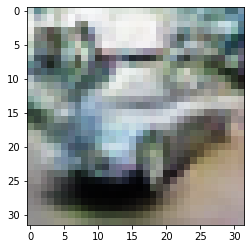

-> Epoch 170, Batch numero 1/78 -> Disc. loss on real images: 0.50414, Disc. loss on fake images: 0.40557, Generator loss: 1.69091
-> Epoch 170, Batch numero 2/78 -> Disc. loss on real images: 0.55465, Disc. loss on fake images: 0.79986, Generator loss: 1.51196
-> Epoch 170, Batch numero 3/78 -> Disc. loss on real images: 0.43360, Disc. loss on fake images: 0.44682, Generator loss: 1.46336
-> Epoch 170, Batch numero 4/78 -> Disc. loss on real images: 0.56012, Disc. loss on fake images: 0.39476, Generator loss: 1.51761
-> Epoch 170, Batch numero 5/78 -> Disc. loss on real images: 0.69949, Disc. loss on fake images: 0.46555, Generator loss: 1.39385
-> Epoch 170, Batch numero 6/78 -> Disc. loss on real images: 0.65642, Disc. loss on fake images: 0.45543, Generator loss: 1.37658
-> Epoch 170, Batch numero 7/78 -> Disc. loss on real images: 0.51304, Disc. loss on fake images: 0.63349, Generator loss: 1.28076
-> Epoch 170, Batch numero 8/78 -> Disc. loss on real images: 0.47341, Disc. loss o

-> Epoch 170, Batch numero 64/78 -> Disc. loss on real images: 0.39483, Disc. loss on fake images: 0.57217, Generator loss: 1.39735
-> Epoch 170, Batch numero 65/78 -> Disc. loss on real images: 0.50669, Disc. loss on fake images: 0.36620, Generator loss: 1.49160
-> Epoch 170, Batch numero 66/78 -> Disc. loss on real images: 0.38933, Disc. loss on fake images: 0.39692, Generator loss: 1.32774
-> Epoch 170, Batch numero 67/78 -> Disc. loss on real images: 0.49393, Disc. loss on fake images: 0.44869, Generator loss: 1.48560
-> Epoch 170, Batch numero 68/78 -> Disc. loss on real images: 0.48746, Disc. loss on fake images: 0.41137, Generator loss: 1.31687
-> Epoch 170, Batch numero 69/78 -> Disc. loss on real images: 0.43513, Disc. loss on fake images: 0.44765, Generator loss: 1.29976
-> Epoch 170, Batch numero 70/78 -> Disc. loss on real images: 0.51305, Disc. loss on fake images: 0.63259, Generator loss: 1.40538
-> Epoch 170, Batch numero 71/78 -> Disc. loss on real images: 0.45755, Disc

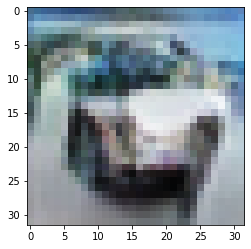

-> Epoch 171, Batch numero 1/78 -> Disc. loss on real images: 0.52833, Disc. loss on fake images: 0.39976, Generator loss: 1.29355
-> Epoch 171, Batch numero 2/78 -> Disc. loss on real images: 0.46848, Disc. loss on fake images: 0.52935, Generator loss: 1.35457
-> Epoch 171, Batch numero 3/78 -> Disc. loss on real images: 0.41685, Disc. loss on fake images: 0.54815, Generator loss: 1.71573
-> Epoch 171, Batch numero 4/78 -> Disc. loss on real images: 0.65738, Disc. loss on fake images: 0.48340, Generator loss: 1.51571
-> Epoch 171, Batch numero 5/78 -> Disc. loss on real images: 0.50015, Disc. loss on fake images: 0.47192, Generator loss: 1.44119
-> Epoch 171, Batch numero 6/78 -> Disc. loss on real images: 0.60269, Disc. loss on fake images: 0.41843, Generator loss: 1.35128
-> Epoch 171, Batch numero 7/78 -> Disc. loss on real images: 0.42627, Disc. loss on fake images: 0.65242, Generator loss: 1.45426
-> Epoch 171, Batch numero 8/78 -> Disc. loss on real images: 0.36357, Disc. loss o

-> Epoch 171, Batch numero 64/78 -> Disc. loss on real images: 0.41382, Disc. loss on fake images: 0.52005, Generator loss: 1.54711
-> Epoch 171, Batch numero 65/78 -> Disc. loss on real images: 0.48094, Disc. loss on fake images: 0.44555, Generator loss: 1.71142
-> Epoch 171, Batch numero 66/78 -> Disc. loss on real images: 0.61102, Disc. loss on fake images: 0.40464, Generator loss: 1.64476
-> Epoch 171, Batch numero 67/78 -> Disc. loss on real images: 0.61517, Disc. loss on fake images: 0.45815, Generator loss: 1.43821
-> Epoch 171, Batch numero 68/78 -> Disc. loss on real images: 0.61656, Disc. loss on fake images: 0.52121, Generator loss: 1.32117
-> Epoch 171, Batch numero 69/78 -> Disc. loss on real images: 0.52720, Disc. loss on fake images: 0.70297, Generator loss: 1.31208
-> Epoch 171, Batch numero 70/78 -> Disc. loss on real images: 0.53477, Disc. loss on fake images: 0.47927, Generator loss: 1.38308
-> Epoch 171, Batch numero 71/78 -> Disc. loss on real images: 0.38633, Disc

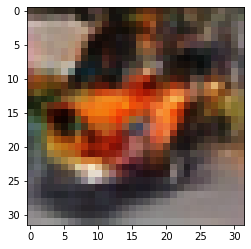

-> Epoch 172, Batch numero 1/78 -> Disc. loss on real images: 0.51684, Disc. loss on fake images: 0.36860, Generator loss: 1.39795
-> Epoch 172, Batch numero 2/78 -> Disc. loss on real images: 0.51547, Disc. loss on fake images: 0.50635, Generator loss: 1.35527
-> Epoch 172, Batch numero 3/78 -> Disc. loss on real images: 0.45940, Disc. loss on fake images: 0.48075, Generator loss: 1.31661
-> Epoch 172, Batch numero 4/78 -> Disc. loss on real images: 0.47393, Disc. loss on fake images: 0.64178, Generator loss: 1.43269
-> Epoch 172, Batch numero 5/78 -> Disc. loss on real images: 0.56037, Disc. loss on fake images: 0.40942, Generator loss: 1.39688
-> Epoch 172, Batch numero 6/78 -> Disc. loss on real images: 0.60282, Disc. loss on fake images: 0.48424, Generator loss: 1.19565
-> Epoch 172, Batch numero 7/78 -> Disc. loss on real images: 0.43049, Disc. loss on fake images: 0.58419, Generator loss: 1.11616
-> Epoch 172, Batch numero 8/78 -> Disc. loss on real images: 0.44446, Disc. loss o

-> Epoch 172, Batch numero 64/78 -> Disc. loss on real images: 0.51228, Disc. loss on fake images: 0.49231, Generator loss: 1.45157
-> Epoch 172, Batch numero 65/78 -> Disc. loss on real images: 0.40609, Disc. loss on fake images: 0.39596, Generator loss: 1.32666
-> Epoch 172, Batch numero 66/78 -> Disc. loss on real images: 0.48260, Disc. loss on fake images: 0.47216, Generator loss: 1.35337
-> Epoch 172, Batch numero 67/78 -> Disc. loss on real images: 0.39236, Disc. loss on fake images: 0.61587, Generator loss: 1.45986
-> Epoch 172, Batch numero 68/78 -> Disc. loss on real images: 0.40470, Disc. loss on fake images: 0.38579, Generator loss: 1.58698
-> Epoch 172, Batch numero 69/78 -> Disc. loss on real images: 0.40941, Disc. loss on fake images: 0.37318, Generator loss: 1.39276
-> Epoch 172, Batch numero 70/78 -> Disc. loss on real images: 0.50769, Disc. loss on fake images: 0.56974, Generator loss: 1.28544
-> Epoch 172, Batch numero 71/78 -> Disc. loss on real images: 0.39946, Disc

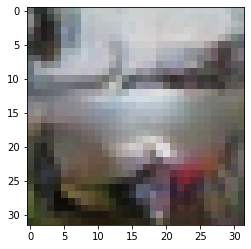

-> Epoch 173, Batch numero 1/78 -> Disc. loss on real images: 0.57681, Disc. loss on fake images: 0.49403, Generator loss: 1.39821
-> Epoch 173, Batch numero 2/78 -> Disc. loss on real images: 0.43466, Disc. loss on fake images: 0.47495, Generator loss: 1.31098
-> Epoch 173, Batch numero 3/78 -> Disc. loss on real images: 0.49949, Disc. loss on fake images: 0.57645, Generator loss: 1.46936
-> Epoch 173, Batch numero 4/78 -> Disc. loss on real images: 0.53217, Disc. loss on fake images: 0.48149, Generator loss: 1.45089
-> Epoch 173, Batch numero 5/78 -> Disc. loss on real images: 0.49247, Disc. loss on fake images: 0.41720, Generator loss: 1.59055
-> Epoch 173, Batch numero 6/78 -> Disc. loss on real images: 0.54616, Disc. loss on fake images: 0.50244, Generator loss: 1.32220
-> Epoch 173, Batch numero 7/78 -> Disc. loss on real images: 0.53962, Disc. loss on fake images: 0.34916, Generator loss: 1.46955
-> Epoch 173, Batch numero 8/78 -> Disc. loss on real images: 0.54605, Disc. loss o

-> Epoch 173, Batch numero 64/78 -> Disc. loss on real images: 0.42725, Disc. loss on fake images: 0.43159, Generator loss: 1.46286
-> Epoch 173, Batch numero 65/78 -> Disc. loss on real images: 0.62207, Disc. loss on fake images: 0.44916, Generator loss: 1.50142
-> Epoch 173, Batch numero 66/78 -> Disc. loss on real images: 0.50535, Disc. loss on fake images: 0.54016, Generator loss: 1.48549
-> Epoch 173, Batch numero 67/78 -> Disc. loss on real images: 0.62520, Disc. loss on fake images: 0.46640, Generator loss: 1.31586
-> Epoch 173, Batch numero 68/78 -> Disc. loss on real images: 0.57337, Disc. loss on fake images: 0.48220, Generator loss: 1.32913
-> Epoch 173, Batch numero 69/78 -> Disc. loss on real images: 0.45020, Disc. loss on fake images: 0.53513, Generator loss: 1.32224
-> Epoch 173, Batch numero 70/78 -> Disc. loss on real images: 0.39938, Disc. loss on fake images: 0.59297, Generator loss: 1.55867
-> Epoch 173, Batch numero 71/78 -> Disc. loss on real images: 0.44257, Disc

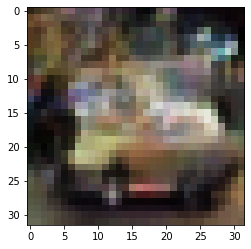

-> Epoch 174, Batch numero 1/78 -> Disc. loss on real images: 0.54229, Disc. loss on fake images: 0.50597, Generator loss: 1.51309
-> Epoch 174, Batch numero 2/78 -> Disc. loss on real images: 0.52260, Disc. loss on fake images: 0.46311, Generator loss: 1.44755
-> Epoch 174, Batch numero 3/78 -> Disc. loss on real images: 0.50136, Disc. loss on fake images: 0.47845, Generator loss: 1.33413
-> Epoch 174, Batch numero 4/78 -> Disc. loss on real images: 0.52908, Disc. loss on fake images: 0.53941, Generator loss: 1.51018
-> Epoch 174, Batch numero 5/78 -> Disc. loss on real images: 0.61590, Disc. loss on fake images: 0.40422, Generator loss: 1.39326
-> Epoch 174, Batch numero 6/78 -> Disc. loss on real images: 0.41344, Disc. loss on fake images: 0.44086, Generator loss: 1.05661
-> Epoch 174, Batch numero 7/78 -> Disc. loss on real images: 0.60814, Disc. loss on fake images: 0.71604, Generator loss: 1.19090
-> Epoch 174, Batch numero 8/78 -> Disc. loss on real images: 0.59172, Disc. loss o

-> Epoch 174, Batch numero 65/78 -> Disc. loss on real images: 0.51439, Disc. loss on fake images: 0.60607, Generator loss: 1.61099
-> Epoch 174, Batch numero 66/78 -> Disc. loss on real images: 0.44263, Disc. loss on fake images: 0.46644, Generator loss: 1.53462
-> Epoch 174, Batch numero 67/78 -> Disc. loss on real images: 0.44698, Disc. loss on fake images: 0.49877, Generator loss: 1.78958
-> Epoch 174, Batch numero 68/78 -> Disc. loss on real images: 0.71433, Disc. loss on fake images: 0.35334, Generator loss: 1.50514
-> Epoch 174, Batch numero 69/78 -> Disc. loss on real images: 0.52170, Disc. loss on fake images: 0.44723, Generator loss: 1.29821
-> Epoch 174, Batch numero 70/78 -> Disc. loss on real images: 0.32042, Disc. loss on fake images: 0.44669, Generator loss: 1.31679
-> Epoch 174, Batch numero 71/78 -> Disc. loss on real images: 0.56481, Disc. loss on fake images: 0.56988, Generator loss: 1.49094
-> Epoch 174, Batch numero 72/78 -> Disc. loss on real images: 0.45923, Disc

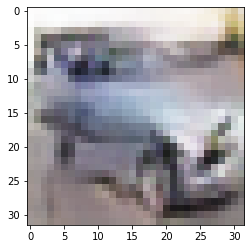

-> Epoch 175, Batch numero 1/78 -> Disc. loss on real images: 0.53067, Disc. loss on fake images: 0.52173, Generator loss: 1.48982
-> Epoch 175, Batch numero 2/78 -> Disc. loss on real images: 0.63535, Disc. loss on fake images: 0.40877, Generator loss: 1.36314
-> Epoch 175, Batch numero 3/78 -> Disc. loss on real images: 0.62632, Disc. loss on fake images: 0.66077, Generator loss: 1.59575
-> Epoch 175, Batch numero 4/78 -> Disc. loss on real images: 0.51732, Disc. loss on fake images: 0.52599, Generator loss: 1.46972
-> Epoch 175, Batch numero 5/78 -> Disc. loss on real images: 0.46312, Disc. loss on fake images: 0.41245, Generator loss: 1.45135
-> Epoch 175, Batch numero 6/78 -> Disc. loss on real images: 0.51486, Disc. loss on fake images: 0.47703, Generator loss: 1.52876
-> Epoch 175, Batch numero 7/78 -> Disc. loss on real images: 0.53914, Disc. loss on fake images: 0.44088, Generator loss: 1.58975
-> Epoch 175, Batch numero 8/78 -> Disc. loss on real images: 0.40321, Disc. loss o

-> Epoch 175, Batch numero 66/78 -> Disc. loss on real images: 0.51951, Disc. loss on fake images: 0.55798, Generator loss: 1.49605
-> Epoch 175, Batch numero 67/78 -> Disc. loss on real images: 0.57361, Disc. loss on fake images: 0.43466, Generator loss: 1.29377
-> Epoch 175, Batch numero 68/78 -> Disc. loss on real images: 0.43465, Disc. loss on fake images: 0.60825, Generator loss: 1.53351
-> Epoch 175, Batch numero 69/78 -> Disc. loss on real images: 0.50627, Disc. loss on fake images: 0.46640, Generator loss: 1.50206
-> Epoch 175, Batch numero 70/78 -> Disc. loss on real images: 0.69987, Disc. loss on fake images: 0.50816, Generator loss: 1.36578
-> Epoch 175, Batch numero 71/78 -> Disc. loss on real images: 0.44611, Disc. loss on fake images: 0.48321, Generator loss: 1.48578
-> Epoch 175, Batch numero 72/78 -> Disc. loss on real images: 0.43652, Disc. loss on fake images: 0.54760, Generator loss: 1.44779
-> Epoch 175, Batch numero 73/78 -> Disc. loss on real images: 0.51391, Disc

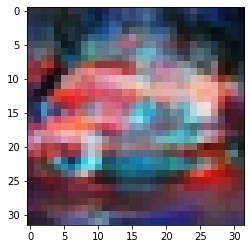

-> Epoch 176, Batch numero 1/78 -> Disc. loss on real images: 0.59000, Disc. loss on fake images: 0.37866, Generator loss: 1.39023
-> Epoch 176, Batch numero 2/78 -> Disc. loss on real images: 0.37200, Disc. loss on fake images: 0.65848, Generator loss: 1.39366
-> Epoch 176, Batch numero 3/78 -> Disc. loss on real images: 0.50702, Disc. loss on fake images: 0.53207, Generator loss: 1.36110
-> Epoch 176, Batch numero 4/78 -> Disc. loss on real images: 0.45838, Disc. loss on fake images: 0.61840, Generator loss: 1.63340
-> Epoch 176, Batch numero 5/78 -> Disc. loss on real images: 0.72266, Disc. loss on fake images: 0.53749, Generator loss: 1.39034
-> Epoch 176, Batch numero 6/78 -> Disc. loss on real images: 0.53610, Disc. loss on fake images: 0.54751, Generator loss: 1.59890
-> Epoch 176, Batch numero 7/78 -> Disc. loss on real images: 0.45405, Disc. loss on fake images: 0.48462, Generator loss: 1.40831
-> Epoch 176, Batch numero 8/78 -> Disc. loss on real images: 0.42054, Disc. loss o

-> Epoch 176, Batch numero 65/78 -> Disc. loss on real images: 0.64406, Disc. loss on fake images: 0.35921, Generator loss: 1.50065
-> Epoch 176, Batch numero 66/78 -> Disc. loss on real images: 0.46932, Disc. loss on fake images: 0.43089, Generator loss: 1.44179
-> Epoch 176, Batch numero 67/78 -> Disc. loss on real images: 0.56497, Disc. loss on fake images: 0.40782, Generator loss: 1.32566
-> Epoch 176, Batch numero 68/78 -> Disc. loss on real images: 0.49332, Disc. loss on fake images: 0.51296, Generator loss: 1.44414
-> Epoch 176, Batch numero 69/78 -> Disc. loss on real images: 0.53713, Disc. loss on fake images: 0.55528, Generator loss: 1.54095
-> Epoch 176, Batch numero 70/78 -> Disc. loss on real images: 0.38577, Disc. loss on fake images: 0.44963, Generator loss: 1.32998
-> Epoch 176, Batch numero 71/78 -> Disc. loss on real images: 0.55327, Disc. loss on fake images: 0.47662, Generator loss: 1.35818
-> Epoch 176, Batch numero 72/78 -> Disc. loss on real images: 0.49654, Disc

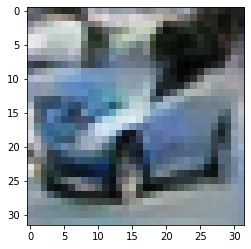

-> Epoch 177, Batch numero 1/78 -> Disc. loss on real images: 0.51089, Disc. loss on fake images: 0.49845, Generator loss: 1.53334
-> Epoch 177, Batch numero 2/78 -> Disc. loss on real images: 0.60819, Disc. loss on fake images: 0.52335, Generator loss: 1.44214
-> Epoch 177, Batch numero 3/78 -> Disc. loss on real images: 0.43549, Disc. loss on fake images: 0.46579, Generator loss: 1.40367
-> Epoch 177, Batch numero 4/78 -> Disc. loss on real images: 0.64193, Disc. loss on fake images: 0.58187, Generator loss: 1.21809
-> Epoch 177, Batch numero 5/78 -> Disc. loss on real images: 0.59294, Disc. loss on fake images: 0.58738, Generator loss: 1.24683
-> Epoch 177, Batch numero 6/78 -> Disc. loss on real images: 0.58318, Disc. loss on fake images: 0.52790, Generator loss: 1.15321
-> Epoch 177, Batch numero 7/78 -> Disc. loss on real images: 0.33572, Disc. loss on fake images: 0.43794, Generator loss: 1.21799
-> Epoch 177, Batch numero 8/78 -> Disc. loss on real images: 0.46538, Disc. loss o

-> Epoch 177, Batch numero 66/78 -> Disc. loss on real images: 0.50146, Disc. loss on fake images: 0.43279, Generator loss: 1.40237
-> Epoch 177, Batch numero 67/78 -> Disc. loss on real images: 0.52093, Disc. loss on fake images: 0.74801, Generator loss: 1.61904
-> Epoch 177, Batch numero 68/78 -> Disc. loss on real images: 0.44593, Disc. loss on fake images: 0.41709, Generator loss: 1.65959
-> Epoch 177, Batch numero 69/78 -> Disc. loss on real images: 0.65541, Disc. loss on fake images: 0.44201, Generator loss: 1.43646
-> Epoch 177, Batch numero 70/78 -> Disc. loss on real images: 0.48962, Disc. loss on fake images: 0.37630, Generator loss: 1.50053
-> Epoch 177, Batch numero 71/78 -> Disc. loss on real images: 0.58622, Disc. loss on fake images: 0.54864, Generator loss: 1.41227
-> Epoch 177, Batch numero 72/78 -> Disc. loss on real images: 0.39014, Disc. loss on fake images: 0.47154, Generator loss: 1.43962
-> Epoch 177, Batch numero 73/78 -> Disc. loss on real images: 0.39821, Disc

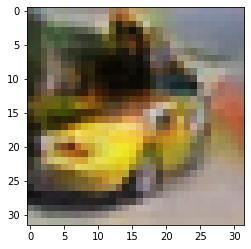

-> Epoch 178, Batch numero 1/78 -> Disc. loss on real images: 0.56508, Disc. loss on fake images: 0.41437, Generator loss: 1.38136
-> Epoch 178, Batch numero 2/78 -> Disc. loss on real images: 0.49496, Disc. loss on fake images: 0.64533, Generator loss: 1.53842
-> Epoch 178, Batch numero 3/78 -> Disc. loss on real images: 0.49253, Disc. loss on fake images: 0.43708, Generator loss: 1.69462
-> Epoch 178, Batch numero 4/78 -> Disc. loss on real images: 0.50515, Disc. loss on fake images: 0.34234, Generator loss: 1.43203
-> Epoch 178, Batch numero 5/78 -> Disc. loss on real images: 0.55245, Disc. loss on fake images: 0.58662, Generator loss: 1.51455
-> Epoch 178, Batch numero 6/78 -> Disc. loss on real images: 0.52572, Disc. loss on fake images: 0.45757, Generator loss: 1.48319
-> Epoch 178, Batch numero 7/78 -> Disc. loss on real images: 0.38220, Disc. loss on fake images: 0.48024, Generator loss: 1.55610
-> Epoch 178, Batch numero 8/78 -> Disc. loss on real images: 0.53671, Disc. loss o

-> Epoch 178, Batch numero 64/78 -> Disc. loss on real images: 0.66883, Disc. loss on fake images: 0.57686, Generator loss: 1.45123
-> Epoch 178, Batch numero 65/78 -> Disc. loss on real images: 0.70585, Disc. loss on fake images: 0.62284, Generator loss: 1.44534
-> Epoch 178, Batch numero 66/78 -> Disc. loss on real images: 0.60917, Disc. loss on fake images: 0.52633, Generator loss: 1.41277
-> Epoch 178, Batch numero 67/78 -> Disc. loss on real images: 0.48320, Disc. loss on fake images: 0.53138, Generator loss: 1.36759
-> Epoch 178, Batch numero 68/78 -> Disc. loss on real images: 0.38763, Disc. loss on fake images: 0.43934, Generator loss: 1.42968
-> Epoch 178, Batch numero 69/78 -> Disc. loss on real images: 0.55490, Disc. loss on fake images: 0.37810, Generator loss: 1.38892
-> Epoch 178, Batch numero 70/78 -> Disc. loss on real images: 0.46872, Disc. loss on fake images: 0.60300, Generator loss: 1.51015
-> Epoch 178, Batch numero 71/78 -> Disc. loss on real images: 0.40902, Disc

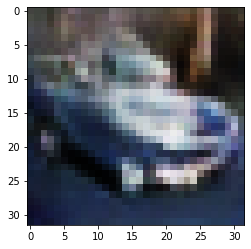

-> Epoch 179, Batch numero 1/78 -> Disc. loss on real images: 0.48257, Disc. loss on fake images: 0.35546, Generator loss: 1.57234
-> Epoch 179, Batch numero 2/78 -> Disc. loss on real images: 0.31183, Disc. loss on fake images: 0.52270, Generator loss: 1.52016
-> Epoch 179, Batch numero 3/78 -> Disc. loss on real images: 0.37297, Disc. loss on fake images: 0.43828, Generator loss: 1.48184
-> Epoch 179, Batch numero 4/78 -> Disc. loss on real images: 0.46441, Disc. loss on fake images: 0.54528, Generator loss: 1.60207
-> Epoch 179, Batch numero 5/78 -> Disc. loss on real images: 0.53132, Disc. loss on fake images: 0.42170, Generator loss: 1.71531
-> Epoch 179, Batch numero 6/78 -> Disc. loss on real images: 0.54053, Disc. loss on fake images: 0.42598, Generator loss: 1.45772
-> Epoch 179, Batch numero 7/78 -> Disc. loss on real images: 0.63419, Disc. loss on fake images: 0.49268, Generator loss: 1.35737
-> Epoch 179, Batch numero 8/78 -> Disc. loss on real images: 0.63233, Disc. loss o

-> Epoch 179, Batch numero 65/78 -> Disc. loss on real images: 0.47052, Disc. loss on fake images: 0.47686, Generator loss: 1.65648
-> Epoch 179, Batch numero 66/78 -> Disc. loss on real images: 0.45467, Disc. loss on fake images: 0.64062, Generator loss: 1.63451
-> Epoch 179, Batch numero 67/78 -> Disc. loss on real images: 0.57359, Disc. loss on fake images: 0.43114, Generator loss: 1.52915
-> Epoch 179, Batch numero 68/78 -> Disc. loss on real images: 0.67104, Disc. loss on fake images: 0.49572, Generator loss: 1.45478
-> Epoch 179, Batch numero 69/78 -> Disc. loss on real images: 0.48429, Disc. loss on fake images: 0.47727, Generator loss: 1.59779
-> Epoch 179, Batch numero 70/78 -> Disc. loss on real images: 0.41344, Disc. loss on fake images: 0.52827, Generator loss: 1.58497
-> Epoch 179, Batch numero 71/78 -> Disc. loss on real images: 0.65227, Disc. loss on fake images: 0.41753, Generator loss: 1.45372
-> Epoch 179, Batch numero 72/78 -> Disc. loss on real images: 0.47066, Disc

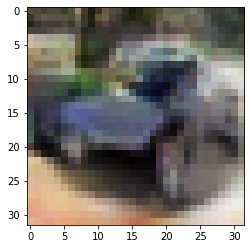

-> Epoch 180, Batch numero 1/78 -> Disc. loss on real images: 0.49309, Disc. loss on fake images: 0.46162, Generator loss: 1.43725
-> Epoch 180, Batch numero 2/78 -> Disc. loss on real images: 0.40618, Disc. loss on fake images: 0.50498, Generator loss: 1.21368
-> Epoch 180, Batch numero 3/78 -> Disc. loss on real images: 0.51388, Disc. loss on fake images: 0.56735, Generator loss: 1.23667
-> Epoch 180, Batch numero 4/78 -> Disc. loss on real images: 0.37868, Disc. loss on fake images: 0.45785, Generator loss: 1.46908
-> Epoch 180, Batch numero 5/78 -> Disc. loss on real images: 0.34660, Disc. loss on fake images: 0.49201, Generator loss: 1.35317
-> Epoch 180, Batch numero 6/78 -> Disc. loss on real images: 0.49330, Disc. loss on fake images: 0.46502, Generator loss: 1.51456
-> Epoch 180, Batch numero 7/78 -> Disc. loss on real images: 0.40606, Disc. loss on fake images: 0.41295, Generator loss: 1.35910
-> Epoch 180, Batch numero 8/78 -> Disc. loss on real images: 0.52417, Disc. loss o

-> Epoch 180, Batch numero 65/78 -> Disc. loss on real images: 0.52316, Disc. loss on fake images: 0.51417, Generator loss: 1.65197
-> Epoch 180, Batch numero 66/78 -> Disc. loss on real images: 0.54930, Disc. loss on fake images: 0.46476, Generator loss: 1.45701
-> Epoch 180, Batch numero 67/78 -> Disc. loss on real images: 0.52628, Disc. loss on fake images: 0.35107, Generator loss: 1.48888
-> Epoch 180, Batch numero 68/78 -> Disc. loss on real images: 0.48411, Disc. loss on fake images: 0.64414, Generator loss: 1.46435
-> Epoch 180, Batch numero 69/78 -> Disc. loss on real images: 0.51036, Disc. loss on fake images: 0.43911, Generator loss: 1.18269
-> Epoch 180, Batch numero 70/78 -> Disc. loss on real images: 0.38539, Disc. loss on fake images: 0.69950, Generator loss: 1.49621
-> Epoch 180, Batch numero 71/78 -> Disc. loss on real images: 0.41400, Disc. loss on fake images: 0.40571, Generator loss: 1.59008
-> Epoch 180, Batch numero 72/78 -> Disc. loss on real images: 0.55339, Disc

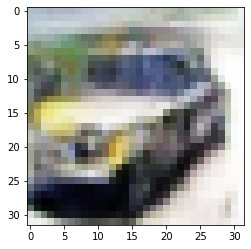

-> Epoch 181, Batch numero 1/78 -> Disc. loss on real images: 0.54896, Disc. loss on fake images: 0.42192, Generator loss: 1.17772
-> Epoch 181, Batch numero 2/78 -> Disc. loss on real images: 0.30395, Disc. loss on fake images: 0.65328, Generator loss: 1.52456
-> Epoch 181, Batch numero 3/78 -> Disc. loss on real images: 0.47305, Disc. loss on fake images: 0.42043, Generator loss: 1.52687
-> Epoch 181, Batch numero 4/78 -> Disc. loss on real images: 0.58073, Disc. loss on fake images: 0.37529, Generator loss: 1.60833
-> Epoch 181, Batch numero 5/78 -> Disc. loss on real images: 0.40571, Disc. loss on fake images: 0.39263, Generator loss: 1.61481
-> Epoch 181, Batch numero 6/78 -> Disc. loss on real images: 0.54113, Disc. loss on fake images: 0.50909, Generator loss: 1.18250
-> Epoch 181, Batch numero 7/78 -> Disc. loss on real images: 0.57557, Disc. loss on fake images: 0.54308, Generator loss: 1.49207
-> Epoch 181, Batch numero 8/78 -> Disc. loss on real images: 0.44972, Disc. loss o

-> Epoch 181, Batch numero 66/78 -> Disc. loss on real images: 0.62934, Disc. loss on fake images: 0.55454, Generator loss: 1.25992
-> Epoch 181, Batch numero 67/78 -> Disc. loss on real images: 0.61079, Disc. loss on fake images: 0.55537, Generator loss: 1.34332
-> Epoch 181, Batch numero 68/78 -> Disc. loss on real images: 0.55825, Disc. loss on fake images: 0.43214, Generator loss: 1.28293
-> Epoch 181, Batch numero 69/78 -> Disc. loss on real images: 0.43832, Disc. loss on fake images: 0.55406, Generator loss: 1.41985
-> Epoch 181, Batch numero 70/78 -> Disc. loss on real images: 0.43106, Disc. loss on fake images: 0.56045, Generator loss: 1.40784
-> Epoch 181, Batch numero 71/78 -> Disc. loss on real images: 0.69043, Disc. loss on fake images: 0.51808, Generator loss: 1.27496
-> Epoch 181, Batch numero 72/78 -> Disc. loss on real images: 0.45943, Disc. loss on fake images: 0.45276, Generator loss: 1.36552
-> Epoch 181, Batch numero 73/78 -> Disc. loss on real images: 0.53789, Disc

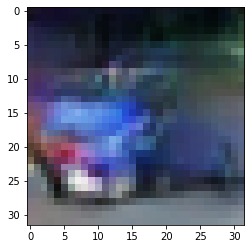

-> Epoch 182, Batch numero 1/78 -> Disc. loss on real images: 0.41567, Disc. loss on fake images: 0.48008, Generator loss: 1.74254
-> Epoch 182, Batch numero 2/78 -> Disc. loss on real images: 0.45689, Disc. loss on fake images: 0.52249, Generator loss: 1.72839
-> Epoch 182, Batch numero 3/78 -> Disc. loss on real images: 0.53113, Disc. loss on fake images: 0.43821, Generator loss: 1.66925
-> Epoch 182, Batch numero 4/78 -> Disc. loss on real images: 0.47033, Disc. loss on fake images: 0.39385, Generator loss: 1.68291
-> Epoch 182, Batch numero 5/78 -> Disc. loss on real images: 0.46180, Disc. loss on fake images: 0.56893, Generator loss: 1.29549
-> Epoch 182, Batch numero 6/78 -> Disc. loss on real images: 0.43775, Disc. loss on fake images: 0.50167, Generator loss: 1.47512
-> Epoch 182, Batch numero 7/78 -> Disc. loss on real images: 0.47999, Disc. loss on fake images: 0.36642, Generator loss: 1.51171
-> Epoch 182, Batch numero 8/78 -> Disc. loss on real images: 0.36965, Disc. loss o

-> Epoch 182, Batch numero 64/78 -> Disc. loss on real images: 0.41053, Disc. loss on fake images: 0.49716, Generator loss: 1.59594
-> Epoch 182, Batch numero 65/78 -> Disc. loss on real images: 0.46921, Disc. loss on fake images: 0.51452, Generator loss: 1.58700
-> Epoch 182, Batch numero 66/78 -> Disc. loss on real images: 0.68287, Disc. loss on fake images: 0.43545, Generator loss: 1.54881
-> Epoch 182, Batch numero 67/78 -> Disc. loss on real images: 0.64734, Disc. loss on fake images: 0.60204, Generator loss: 1.48436
-> Epoch 182, Batch numero 68/78 -> Disc. loss on real images: 0.54088, Disc. loss on fake images: 0.48070, Generator loss: 1.34380
-> Epoch 182, Batch numero 69/78 -> Disc. loss on real images: 0.42123, Disc. loss on fake images: 0.48372, Generator loss: 1.54833
-> Epoch 182, Batch numero 70/78 -> Disc. loss on real images: 0.45025, Disc. loss on fake images: 0.46309, Generator loss: 1.82030
-> Epoch 182, Batch numero 71/78 -> Disc. loss on real images: 0.35829, Disc

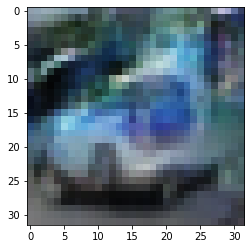

-> Epoch 183, Batch numero 1/78 -> Disc. loss on real images: 0.59320, Disc. loss on fake images: 0.45312, Generator loss: 1.44977
-> Epoch 183, Batch numero 2/78 -> Disc. loss on real images: 0.49468, Disc. loss on fake images: 0.63339, Generator loss: 1.47032
-> Epoch 183, Batch numero 3/78 -> Disc. loss on real images: 0.58632, Disc. loss on fake images: 0.63989, Generator loss: 1.40919
-> Epoch 183, Batch numero 4/78 -> Disc. loss on real images: 0.45193, Disc. loss on fake images: 0.50796, Generator loss: 1.60738
-> Epoch 183, Batch numero 5/78 -> Disc. loss on real images: 0.60788, Disc. loss on fake images: 0.40376, Generator loss: 1.59759
-> Epoch 183, Batch numero 6/78 -> Disc. loss on real images: 0.54107, Disc. loss on fake images: 0.50492, Generator loss: 1.59269
-> Epoch 183, Batch numero 7/78 -> Disc. loss on real images: 0.54805, Disc. loss on fake images: 0.44148, Generator loss: 1.47021
-> Epoch 183, Batch numero 8/78 -> Disc. loss on real images: 0.53000, Disc. loss o

-> Epoch 183, Batch numero 64/78 -> Disc. loss on real images: 0.46616, Disc. loss on fake images: 0.63179, Generator loss: 1.43555
-> Epoch 183, Batch numero 65/78 -> Disc. loss on real images: 0.53146, Disc. loss on fake images: 0.43247, Generator loss: 1.58645
-> Epoch 183, Batch numero 66/78 -> Disc. loss on real images: 0.60864, Disc. loss on fake images: 0.44424, Generator loss: 1.39398
-> Epoch 183, Batch numero 67/78 -> Disc. loss on real images: 0.58111, Disc. loss on fake images: 0.49649, Generator loss: 1.43690
-> Epoch 183, Batch numero 68/78 -> Disc. loss on real images: 0.47105, Disc. loss on fake images: 0.45196, Generator loss: 1.35383
-> Epoch 183, Batch numero 69/78 -> Disc. loss on real images: 0.40909, Disc. loss on fake images: 0.46772, Generator loss: 1.50929
-> Epoch 183, Batch numero 70/78 -> Disc. loss on real images: 0.54360, Disc. loss on fake images: 0.49190, Generator loss: 1.49132
-> Epoch 183, Batch numero 71/78 -> Disc. loss on real images: 0.50792, Disc

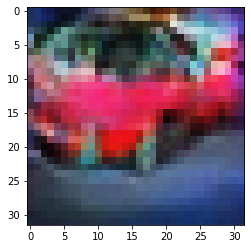

-> Epoch 184, Batch numero 1/78 -> Disc. loss on real images: 0.51517, Disc. loss on fake images: 0.60363, Generator loss: 1.61118
-> Epoch 184, Batch numero 2/78 -> Disc. loss on real images: 0.49181, Disc. loss on fake images: 0.36149, Generator loss: 1.36685
-> Epoch 184, Batch numero 3/78 -> Disc. loss on real images: 0.56715, Disc. loss on fake images: 0.49293, Generator loss: 1.50374
-> Epoch 184, Batch numero 4/78 -> Disc. loss on real images: 0.48714, Disc. loss on fake images: 0.60972, Generator loss: 1.56002
-> Epoch 184, Batch numero 5/78 -> Disc. loss on real images: 0.38993, Disc. loss on fake images: 0.39561, Generator loss: 1.42706
-> Epoch 184, Batch numero 6/78 -> Disc. loss on real images: 0.60364, Disc. loss on fake images: 0.41176, Generator loss: 1.47712
-> Epoch 184, Batch numero 7/78 -> Disc. loss on real images: 0.35795, Disc. loss on fake images: 0.42971, Generator loss: 1.38107
-> Epoch 184, Batch numero 8/78 -> Disc. loss on real images: 0.52330, Disc. loss o

-> Epoch 184, Batch numero 64/78 -> Disc. loss on real images: 0.46237, Disc. loss on fake images: 0.44939, Generator loss: 1.65208
-> Epoch 184, Batch numero 65/78 -> Disc. loss on real images: 0.52113, Disc. loss on fake images: 0.49968, Generator loss: 1.52439
-> Epoch 184, Batch numero 66/78 -> Disc. loss on real images: 0.55222, Disc. loss on fake images: 0.59295, Generator loss: 1.56890
-> Epoch 184, Batch numero 67/78 -> Disc. loss on real images: 0.56815, Disc. loss on fake images: 0.40709, Generator loss: 1.62458
-> Epoch 184, Batch numero 68/78 -> Disc. loss on real images: 0.45806, Disc. loss on fake images: 0.56335, Generator loss: 1.63728
-> Epoch 184, Batch numero 69/78 -> Disc. loss on real images: 0.46231, Disc. loss on fake images: 0.44700, Generator loss: 1.54306
-> Epoch 184, Batch numero 70/78 -> Disc. loss on real images: 0.38424, Disc. loss on fake images: 0.34818, Generator loss: 1.51097
-> Epoch 184, Batch numero 71/78 -> Disc. loss on real images: 0.50884, Disc

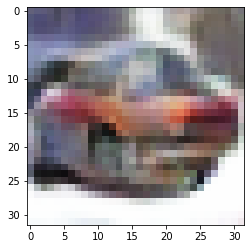

-> Epoch 185, Batch numero 1/78 -> Disc. loss on real images: 0.43496, Disc. loss on fake images: 0.45924, Generator loss: 1.55823
-> Epoch 185, Batch numero 2/78 -> Disc. loss on real images: 0.42009, Disc. loss on fake images: 0.43452, Generator loss: 1.49838
-> Epoch 185, Batch numero 3/78 -> Disc. loss on real images: 0.39256, Disc. loss on fake images: 0.36275, Generator loss: 1.56434
-> Epoch 185, Batch numero 4/78 -> Disc. loss on real images: 0.56983, Disc. loss on fake images: 0.55065, Generator loss: 1.52916
-> Epoch 185, Batch numero 5/78 -> Disc. loss on real images: 0.34286, Disc. loss on fake images: 0.49003, Generator loss: 1.63366
-> Epoch 185, Batch numero 6/78 -> Disc. loss on real images: 0.46240, Disc. loss on fake images: 0.47872, Generator loss: 1.55378
-> Epoch 185, Batch numero 7/78 -> Disc. loss on real images: 0.66710, Disc. loss on fake images: 0.44437, Generator loss: 1.53493
-> Epoch 185, Batch numero 8/78 -> Disc. loss on real images: 0.50389, Disc. loss o

-> Epoch 185, Batch numero 64/78 -> Disc. loss on real images: 0.69973, Disc. loss on fake images: 0.59453, Generator loss: 1.45264
-> Epoch 185, Batch numero 65/78 -> Disc. loss on real images: 0.55399, Disc. loss on fake images: 0.53738, Generator loss: 1.43879
-> Epoch 185, Batch numero 66/78 -> Disc. loss on real images: 0.57455, Disc. loss on fake images: 0.43242, Generator loss: 1.66040
-> Epoch 185, Batch numero 67/78 -> Disc. loss on real images: 0.43978, Disc. loss on fake images: 0.43802, Generator loss: 1.43723
-> Epoch 185, Batch numero 68/78 -> Disc. loss on real images: 0.58027, Disc. loss on fake images: 0.45921, Generator loss: 1.54161
-> Epoch 185, Batch numero 69/78 -> Disc. loss on real images: 0.55255, Disc. loss on fake images: 0.51441, Generator loss: 1.43857
-> Epoch 185, Batch numero 70/78 -> Disc. loss on real images: 0.43948, Disc. loss on fake images: 0.44870, Generator loss: 1.44880
-> Epoch 185, Batch numero 71/78 -> Disc. loss on real images: 0.47911, Disc

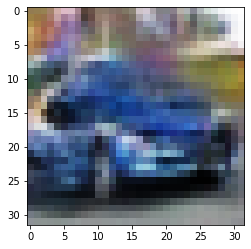

-> Epoch 186, Batch numero 1/78 -> Disc. loss on real images: 0.38705, Disc. loss on fake images: 0.57854, Generator loss: 1.56048
-> Epoch 186, Batch numero 2/78 -> Disc. loss on real images: 0.43713, Disc. loss on fake images: 0.50561, Generator loss: 1.43795
-> Epoch 186, Batch numero 3/78 -> Disc. loss on real images: 0.35591, Disc. loss on fake images: 0.45847, Generator loss: 1.49989
-> Epoch 186, Batch numero 4/78 -> Disc. loss on real images: 0.49630, Disc. loss on fake images: 0.43911, Generator loss: 1.48806
-> Epoch 186, Batch numero 5/78 -> Disc. loss on real images: 0.56842, Disc. loss on fake images: 0.47247, Generator loss: 1.25712
-> Epoch 186, Batch numero 6/78 -> Disc. loss on real images: 0.40598, Disc. loss on fake images: 0.43729, Generator loss: 1.40146
-> Epoch 186, Batch numero 7/78 -> Disc. loss on real images: 0.52563, Disc. loss on fake images: 0.39077, Generator loss: 1.40260
-> Epoch 186, Batch numero 8/78 -> Disc. loss on real images: 0.50974, Disc. loss o

-> Epoch 186, Batch numero 64/78 -> Disc. loss on real images: 0.47888, Disc. loss on fake images: 0.54718, Generator loss: 1.81375
-> Epoch 186, Batch numero 65/78 -> Disc. loss on real images: 0.47160, Disc. loss on fake images: 0.35516, Generator loss: 1.71222
-> Epoch 186, Batch numero 66/78 -> Disc. loss on real images: 0.50298, Disc. loss on fake images: 0.42050, Generator loss: 1.73895
-> Epoch 186, Batch numero 67/78 -> Disc. loss on real images: 0.46133, Disc. loss on fake images: 0.50018, Generator loss: 1.59400
-> Epoch 186, Batch numero 68/78 -> Disc. loss on real images: 0.35379, Disc. loss on fake images: 0.41137, Generator loss: 1.58378
-> Epoch 186, Batch numero 69/78 -> Disc. loss on real images: 0.48421, Disc. loss on fake images: 0.34576, Generator loss: 1.46349
-> Epoch 186, Batch numero 70/78 -> Disc. loss on real images: 0.58647, Disc. loss on fake images: 0.41786, Generator loss: 1.36539
-> Epoch 186, Batch numero 71/78 -> Disc. loss on real images: 0.36933, Disc

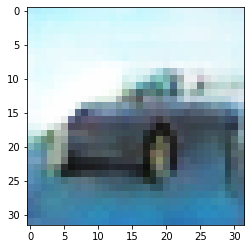

-> Epoch 187, Batch numero 1/78 -> Disc. loss on real images: 0.54882, Disc. loss on fake images: 0.59767, Generator loss: 1.58068
-> Epoch 187, Batch numero 2/78 -> Disc. loss on real images: 0.43022, Disc. loss on fake images: 0.55991, Generator loss: 1.72161
-> Epoch 187, Batch numero 3/78 -> Disc. loss on real images: 0.59165, Disc. loss on fake images: 0.58651, Generator loss: 1.52112
-> Epoch 187, Batch numero 4/78 -> Disc. loss on real images: 0.50002, Disc. loss on fake images: 0.44954, Generator loss: 1.75123
-> Epoch 187, Batch numero 5/78 -> Disc. loss on real images: 0.52690, Disc. loss on fake images: 0.51066, Generator loss: 1.72019
-> Epoch 187, Batch numero 6/78 -> Disc. loss on real images: 0.44797, Disc. loss on fake images: 0.50524, Generator loss: 1.63589
-> Epoch 187, Batch numero 7/78 -> Disc. loss on real images: 0.60996, Disc. loss on fake images: 0.30887, Generator loss: 1.37683
-> Epoch 187, Batch numero 8/78 -> Disc. loss on real images: 0.54400, Disc. loss o

-> Epoch 187, Batch numero 64/78 -> Disc. loss on real images: 0.36813, Disc. loss on fake images: 0.54068, Generator loss: 1.73122
-> Epoch 187, Batch numero 65/78 -> Disc. loss on real images: 0.59756, Disc. loss on fake images: 0.31254, Generator loss: 1.54496
-> Epoch 187, Batch numero 66/78 -> Disc. loss on real images: 0.49837, Disc. loss on fake images: 0.46239, Generator loss: 1.77870
-> Epoch 187, Batch numero 67/78 -> Disc. loss on real images: 0.40724, Disc. loss on fake images: 0.34413, Generator loss: 1.70617
-> Epoch 187, Batch numero 68/78 -> Disc. loss on real images: 0.32141, Disc. loss on fake images: 0.34989, Generator loss: 1.54736
-> Epoch 187, Batch numero 69/78 -> Disc. loss on real images: 0.37803, Disc. loss on fake images: 0.53413, Generator loss: 1.51338
-> Epoch 187, Batch numero 70/78 -> Disc. loss on real images: 0.53699, Disc. loss on fake images: 0.52737, Generator loss: 1.64587
-> Epoch 187, Batch numero 71/78 -> Disc. loss on real images: 0.42673, Disc

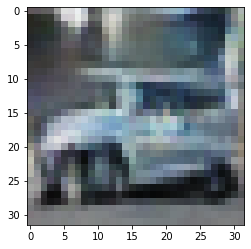

-> Epoch 188, Batch numero 1/78 -> Disc. loss on real images: 0.33333, Disc. loss on fake images: 0.48020, Generator loss: 1.53613
-> Epoch 188, Batch numero 2/78 -> Disc. loss on real images: 0.40004, Disc. loss on fake images: 0.54908, Generator loss: 1.48401
-> Epoch 188, Batch numero 3/78 -> Disc. loss on real images: 0.37745, Disc. loss on fake images: 0.33533, Generator loss: 1.43163
-> Epoch 188, Batch numero 4/78 -> Disc. loss on real images: 0.49386, Disc. loss on fake images: 0.39706, Generator loss: 1.42023
-> Epoch 188, Batch numero 5/78 -> Disc. loss on real images: 0.54449, Disc. loss on fake images: 0.55060, Generator loss: 1.36587
-> Epoch 188, Batch numero 6/78 -> Disc. loss on real images: 0.33227, Disc. loss on fake images: 0.57193, Generator loss: 1.51649
-> Epoch 188, Batch numero 7/78 -> Disc. loss on real images: 0.56735, Disc. loss on fake images: 0.42610, Generator loss: 1.54443
-> Epoch 188, Batch numero 8/78 -> Disc. loss on real images: 0.47070, Disc. loss o

-> Epoch 188, Batch numero 64/78 -> Disc. loss on real images: 0.36426, Disc. loss on fake images: 0.39408, Generator loss: 1.46898
-> Epoch 188, Batch numero 65/78 -> Disc. loss on real images: 0.55324, Disc. loss on fake images: 0.52186, Generator loss: 1.34222
-> Epoch 188, Batch numero 66/78 -> Disc. loss on real images: 0.35360, Disc. loss on fake images: 0.47579, Generator loss: 1.44838
-> Epoch 188, Batch numero 67/78 -> Disc. loss on real images: 0.41770, Disc. loss on fake images: 0.48222, Generator loss: 1.40389
-> Epoch 188, Batch numero 68/78 -> Disc. loss on real images: 0.51744, Disc. loss on fake images: 0.44075, Generator loss: 1.37872
-> Epoch 188, Batch numero 69/78 -> Disc. loss on real images: 0.36913, Disc. loss on fake images: 0.45799, Generator loss: 1.54335
-> Epoch 188, Batch numero 70/78 -> Disc. loss on real images: 0.64537, Disc. loss on fake images: 0.52026, Generator loss: 1.70271
-> Epoch 188, Batch numero 71/78 -> Disc. loss on real images: 0.46655, Disc

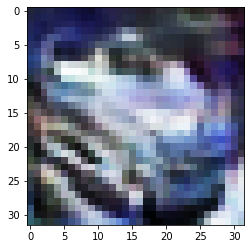

-> Epoch 189, Batch numero 1/78 -> Disc. loss on real images: 0.36135, Disc. loss on fake images: 0.50323, Generator loss: 1.49888
-> Epoch 189, Batch numero 2/78 -> Disc. loss on real images: 0.43883, Disc. loss on fake images: 0.45035, Generator loss: 1.66463
-> Epoch 189, Batch numero 3/78 -> Disc. loss on real images: 0.35637, Disc. loss on fake images: 0.35758, Generator loss: 1.56338
-> Epoch 189, Batch numero 4/78 -> Disc. loss on real images: 0.51582, Disc. loss on fake images: 0.55378, Generator loss: 1.49280
-> Epoch 189, Batch numero 5/78 -> Disc. loss on real images: 0.49321, Disc. loss on fake images: 0.45362, Generator loss: 1.40867
-> Epoch 189, Batch numero 6/78 -> Disc. loss on real images: 0.48908, Disc. loss on fake images: 0.54358, Generator loss: 1.58922
-> Epoch 189, Batch numero 7/78 -> Disc. loss on real images: 0.42015, Disc. loss on fake images: 0.59328, Generator loss: 1.51595
-> Epoch 189, Batch numero 8/78 -> Disc. loss on real images: 0.46273, Disc. loss o

-> Epoch 189, Batch numero 64/78 -> Disc. loss on real images: 0.73174, Disc. loss on fake images: 0.45982, Generator loss: 1.57226
-> Epoch 189, Batch numero 65/78 -> Disc. loss on real images: 0.49237, Disc. loss on fake images: 0.43697, Generator loss: 1.51887
-> Epoch 189, Batch numero 66/78 -> Disc. loss on real images: 0.50709, Disc. loss on fake images: 0.37180, Generator loss: 1.44181
-> Epoch 189, Batch numero 67/78 -> Disc. loss on real images: 0.46435, Disc. loss on fake images: 0.50740, Generator loss: 1.34217
-> Epoch 189, Batch numero 68/78 -> Disc. loss on real images: 0.49052, Disc. loss on fake images: 0.63322, Generator loss: 1.32837
-> Epoch 189, Batch numero 69/78 -> Disc. loss on real images: 0.59783, Disc. loss on fake images: 0.60914, Generator loss: 1.52359
-> Epoch 189, Batch numero 70/78 -> Disc. loss on real images: 0.36845, Disc. loss on fake images: 0.36037, Generator loss: 1.55002
-> Epoch 189, Batch numero 71/78 -> Disc. loss on real images: 0.50210, Disc

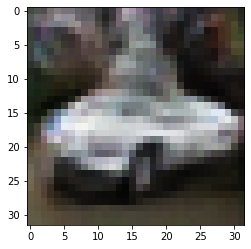

-> Epoch 190, Batch numero 1/78 -> Disc. loss on real images: 0.36817, Disc. loss on fake images: 0.48003, Generator loss: 1.52636
-> Epoch 190, Batch numero 2/78 -> Disc. loss on real images: 0.51765, Disc. loss on fake images: 0.41864, Generator loss: 1.30083
-> Epoch 190, Batch numero 3/78 -> Disc. loss on real images: 0.39021, Disc. loss on fake images: 0.47264, Generator loss: 1.65275
-> Epoch 190, Batch numero 4/78 -> Disc. loss on real images: 0.39620, Disc. loss on fake images: 0.38745, Generator loss: 1.60676
-> Epoch 190, Batch numero 5/78 -> Disc. loss on real images: 0.57289, Disc. loss on fake images: 0.36715, Generator loss: 1.56877
-> Epoch 190, Batch numero 6/78 -> Disc. loss on real images: 0.61364, Disc. loss on fake images: 0.50257, Generator loss: 1.65684
-> Epoch 190, Batch numero 7/78 -> Disc. loss on real images: 0.40050, Disc. loss on fake images: 0.39762, Generator loss: 1.43950
-> Epoch 190, Batch numero 8/78 -> Disc. loss on real images: 0.50397, Disc. loss o

-> Epoch 190, Batch numero 64/78 -> Disc. loss on real images: 0.51463, Disc. loss on fake images: 0.30192, Generator loss: 1.67583
-> Epoch 190, Batch numero 65/78 -> Disc. loss on real images: 0.52229, Disc. loss on fake images: 0.50015, Generator loss: 1.60407
-> Epoch 190, Batch numero 66/78 -> Disc. loss on real images: 0.56950, Disc. loss on fake images: 0.42294, Generator loss: 1.53592
-> Epoch 190, Batch numero 67/78 -> Disc. loss on real images: 0.32965, Disc. loss on fake images: 0.52043, Generator loss: 1.55544
-> Epoch 190, Batch numero 68/78 -> Disc. loss on real images: 0.42084, Disc. loss on fake images: 0.37956, Generator loss: 1.51582
-> Epoch 190, Batch numero 69/78 -> Disc. loss on real images: 0.38941, Disc. loss on fake images: 0.33840, Generator loss: 1.71233
-> Epoch 190, Batch numero 70/78 -> Disc. loss on real images: 0.52395, Disc. loss on fake images: 0.43721, Generator loss: 1.63551
-> Epoch 190, Batch numero 71/78 -> Disc. loss on real images: 0.40857, Disc

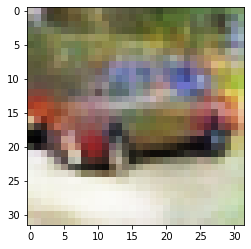

-> Epoch 191, Batch numero 1/78 -> Disc. loss on real images: 0.43910, Disc. loss on fake images: 0.43246, Generator loss: 1.28157
-> Epoch 191, Batch numero 2/78 -> Disc. loss on real images: 0.37265, Disc. loss on fake images: 0.43013, Generator loss: 1.48342
-> Epoch 191, Batch numero 3/78 -> Disc. loss on real images: 0.50604, Disc. loss on fake images: 0.50624, Generator loss: 1.44813
-> Epoch 191, Batch numero 4/78 -> Disc. loss on real images: 0.42556, Disc. loss on fake images: 0.50355, Generator loss: 1.35783
-> Epoch 191, Batch numero 5/78 -> Disc. loss on real images: 0.33214, Disc. loss on fake images: 0.53774, Generator loss: 1.61523
-> Epoch 191, Batch numero 6/78 -> Disc. loss on real images: 0.44508, Disc. loss on fake images: 0.37323, Generator loss: 1.61692
-> Epoch 191, Batch numero 7/78 -> Disc. loss on real images: 0.37234, Disc. loss on fake images: 0.50150, Generator loss: 1.53911
-> Epoch 191, Batch numero 8/78 -> Disc. loss on real images: 0.74834, Disc. loss o

-> Epoch 191, Batch numero 64/78 -> Disc. loss on real images: 0.57960, Disc. loss on fake images: 0.60285, Generator loss: 1.38986
-> Epoch 191, Batch numero 65/78 -> Disc. loss on real images: 0.46707, Disc. loss on fake images: 0.48178, Generator loss: 1.60259
-> Epoch 191, Batch numero 66/78 -> Disc. loss on real images: 0.37273, Disc. loss on fake images: 0.36079, Generator loss: 1.44284
-> Epoch 191, Batch numero 67/78 -> Disc. loss on real images: 0.51466, Disc. loss on fake images: 0.40226, Generator loss: 1.43421
-> Epoch 191, Batch numero 68/78 -> Disc. loss on real images: 0.36719, Disc. loss on fake images: 0.54180, Generator loss: 1.43813
-> Epoch 191, Batch numero 69/78 -> Disc. loss on real images: 0.52638, Disc. loss on fake images: 0.40368, Generator loss: 1.52510
-> Epoch 191, Batch numero 70/78 -> Disc. loss on real images: 0.33243, Disc. loss on fake images: 0.41179, Generator loss: 1.66089
-> Epoch 191, Batch numero 71/78 -> Disc. loss on real images: 0.57749, Disc

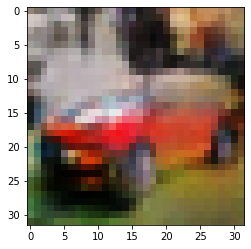

-> Epoch 192, Batch numero 1/78 -> Disc. loss on real images: 0.38938, Disc. loss on fake images: 0.35664, Generator loss: 1.50087
-> Epoch 192, Batch numero 2/78 -> Disc. loss on real images: 0.51324, Disc. loss on fake images: 0.52860, Generator loss: 1.55803
-> Epoch 192, Batch numero 3/78 -> Disc. loss on real images: 0.49616, Disc. loss on fake images: 0.46506, Generator loss: 1.60266
-> Epoch 192, Batch numero 4/78 -> Disc. loss on real images: 0.52082, Disc. loss on fake images: 0.64793, Generator loss: 1.75685
-> Epoch 192, Batch numero 5/78 -> Disc. loss on real images: 0.68448, Disc. loss on fake images: 0.43258, Generator loss: 1.41612
-> Epoch 192, Batch numero 6/78 -> Disc. loss on real images: 0.42844, Disc. loss on fake images: 0.50053, Generator loss: 1.48118
-> Epoch 192, Batch numero 7/78 -> Disc. loss on real images: 0.65582, Disc. loss on fake images: 0.51566, Generator loss: 1.46383
-> Epoch 192, Batch numero 8/78 -> Disc. loss on real images: 0.58182, Disc. loss o

-> Epoch 192, Batch numero 64/78 -> Disc. loss on real images: 0.39970, Disc. loss on fake images: 0.46352, Generator loss: 1.59405
-> Epoch 192, Batch numero 65/78 -> Disc. loss on real images: 0.50189, Disc. loss on fake images: 0.40424, Generator loss: 1.36480
-> Epoch 192, Batch numero 66/78 -> Disc. loss on real images: 0.51402, Disc. loss on fake images: 0.61762, Generator loss: 1.42988
-> Epoch 192, Batch numero 67/78 -> Disc. loss on real images: 0.63053, Disc. loss on fake images: 0.53914, Generator loss: 1.60399
-> Epoch 192, Batch numero 68/78 -> Disc. loss on real images: 0.47160, Disc. loss on fake images: 0.41622, Generator loss: 1.44539
-> Epoch 192, Batch numero 69/78 -> Disc. loss on real images: 0.51348, Disc. loss on fake images: 0.40555, Generator loss: 1.55652
-> Epoch 192, Batch numero 70/78 -> Disc. loss on real images: 0.36299, Disc. loss on fake images: 0.44576, Generator loss: 1.72292
-> Epoch 192, Batch numero 71/78 -> Disc. loss on real images: 0.42739, Disc

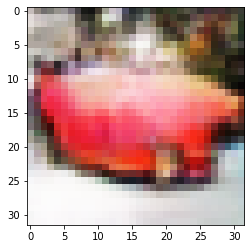

-> Epoch 193, Batch numero 1/78 -> Disc. loss on real images: 0.42223, Disc. loss on fake images: 0.51313, Generator loss: 1.47219
-> Epoch 193, Batch numero 2/78 -> Disc. loss on real images: 0.40087, Disc. loss on fake images: 0.57742, Generator loss: 1.59716
-> Epoch 193, Batch numero 3/78 -> Disc. loss on real images: 0.41217, Disc. loss on fake images: 0.42635, Generator loss: 1.84690
-> Epoch 193, Batch numero 4/78 -> Disc. loss on real images: 0.62745, Disc. loss on fake images: 0.40129, Generator loss: 1.53030
-> Epoch 193, Batch numero 5/78 -> Disc. loss on real images: 0.49083, Disc. loss on fake images: 0.46370, Generator loss: 1.45265
-> Epoch 193, Batch numero 6/78 -> Disc. loss on real images: 0.44280, Disc. loss on fake images: 0.46478, Generator loss: 1.23692
-> Epoch 193, Batch numero 7/78 -> Disc. loss on real images: 0.40287, Disc. loss on fake images: 0.54867, Generator loss: 1.34867
-> Epoch 193, Batch numero 8/78 -> Disc. loss on real images: 0.38566, Disc. loss o

-> Epoch 193, Batch numero 64/78 -> Disc. loss on real images: 0.53145, Disc. loss on fake images: 0.53477, Generator loss: 1.47595
-> Epoch 193, Batch numero 65/78 -> Disc. loss on real images: 0.49927, Disc. loss on fake images: 0.45852, Generator loss: 1.54978
-> Epoch 193, Batch numero 66/78 -> Disc. loss on real images: 0.41354, Disc. loss on fake images: 0.37619, Generator loss: 1.65756
-> Epoch 193, Batch numero 67/78 -> Disc. loss on real images: 0.48322, Disc. loss on fake images: 0.46272, Generator loss: 1.61130
-> Epoch 193, Batch numero 68/78 -> Disc. loss on real images: 0.47379, Disc. loss on fake images: 0.48107, Generator loss: 1.74351
-> Epoch 193, Batch numero 69/78 -> Disc. loss on real images: 0.46284, Disc. loss on fake images: 0.40519, Generator loss: 1.63171
-> Epoch 193, Batch numero 70/78 -> Disc. loss on real images: 0.55461, Disc. loss on fake images: 0.53824, Generator loss: 1.57954
-> Epoch 193, Batch numero 71/78 -> Disc. loss on real images: 0.49283, Disc

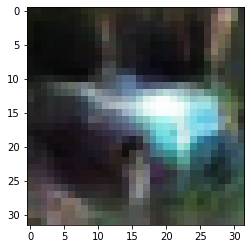

-> Epoch 194, Batch numero 1/78 -> Disc. loss on real images: 0.38053, Disc. loss on fake images: 0.44462, Generator loss: 1.48884
-> Epoch 194, Batch numero 2/78 -> Disc. loss on real images: 0.43605, Disc. loss on fake images: 0.47583, Generator loss: 1.59144
-> Epoch 194, Batch numero 3/78 -> Disc. loss on real images: 0.32765, Disc. loss on fake images: 0.35858, Generator loss: 1.70042
-> Epoch 194, Batch numero 4/78 -> Disc. loss on real images: 0.55004, Disc. loss on fake images: 0.37773, Generator loss: 1.52808
-> Epoch 194, Batch numero 5/78 -> Disc. loss on real images: 0.32833, Disc. loss on fake images: 0.58080, Generator loss: 1.74149
-> Epoch 194, Batch numero 6/78 -> Disc. loss on real images: 0.50355, Disc. loss on fake images: 0.57312, Generator loss: 1.58138
-> Epoch 194, Batch numero 7/78 -> Disc. loss on real images: 0.34278, Disc. loss on fake images: 0.45362, Generator loss: 1.72882
-> Epoch 194, Batch numero 8/78 -> Disc. loss on real images: 0.63450, Disc. loss o

-> Epoch 194, Batch numero 64/78 -> Disc. loss on real images: 0.61412, Disc. loss on fake images: 0.47899, Generator loss: 1.56798
-> Epoch 194, Batch numero 65/78 -> Disc. loss on real images: 0.45834, Disc. loss on fake images: 0.40637, Generator loss: 1.63562
-> Epoch 194, Batch numero 66/78 -> Disc. loss on real images: 0.68671, Disc. loss on fake images: 0.40195, Generator loss: 1.54402
-> Epoch 194, Batch numero 67/78 -> Disc. loss on real images: 0.35071, Disc. loss on fake images: 0.45602, Generator loss: 1.52381
-> Epoch 194, Batch numero 68/78 -> Disc. loss on real images: 0.42884, Disc. loss on fake images: 0.54911, Generator loss: 1.57653
-> Epoch 194, Batch numero 69/78 -> Disc. loss on real images: 0.41237, Disc. loss on fake images: 0.50592, Generator loss: 1.62029
-> Epoch 194, Batch numero 70/78 -> Disc. loss on real images: 0.41886, Disc. loss on fake images: 0.37569, Generator loss: 1.88113
-> Epoch 194, Batch numero 71/78 -> Disc. loss on real images: 0.48980, Disc

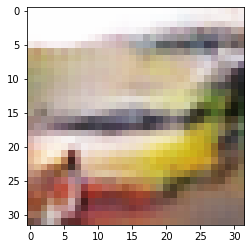

-> Epoch 195, Batch numero 1/78 -> Disc. loss on real images: 0.53076, Disc. loss on fake images: 0.62324, Generator loss: 1.65598
-> Epoch 195, Batch numero 2/78 -> Disc. loss on real images: 0.60018, Disc. loss on fake images: 0.33547, Generator loss: 1.73628
-> Epoch 195, Batch numero 3/78 -> Disc. loss on real images: 0.49018, Disc. loss on fake images: 0.44773, Generator loss: 1.57613
-> Epoch 195, Batch numero 4/78 -> Disc. loss on real images: 0.46559, Disc. loss on fake images: 0.29239, Generator loss: 1.47021
-> Epoch 195, Batch numero 5/78 -> Disc. loss on real images: 0.49302, Disc. loss on fake images: 0.56925, Generator loss: 1.38193
-> Epoch 195, Batch numero 6/78 -> Disc. loss on real images: 0.49782, Disc. loss on fake images: 0.51854, Generator loss: 1.23562
-> Epoch 195, Batch numero 7/78 -> Disc. loss on real images: 0.26609, Disc. loss on fake images: 0.54144, Generator loss: 1.44446
-> Epoch 195, Batch numero 8/78 -> Disc. loss on real images: 0.37348, Disc. loss o

-> Epoch 195, Batch numero 64/78 -> Disc. loss on real images: 0.43267, Disc. loss on fake images: 0.44776, Generator loss: 1.46640
-> Epoch 195, Batch numero 65/78 -> Disc. loss on real images: 0.54048, Disc. loss on fake images: 0.34717, Generator loss: 1.60656
-> Epoch 195, Batch numero 66/78 -> Disc. loss on real images: 0.50868, Disc. loss on fake images: 0.47843, Generator loss: 1.39491
-> Epoch 195, Batch numero 67/78 -> Disc. loss on real images: 0.42337, Disc. loss on fake images: 0.56566, Generator loss: 1.39532
-> Epoch 195, Batch numero 68/78 -> Disc. loss on real images: 0.25041, Disc. loss on fake images: 0.43396, Generator loss: 1.71534
-> Epoch 195, Batch numero 69/78 -> Disc. loss on real images: 0.48485, Disc. loss on fake images: 0.60799, Generator loss: 1.42384
-> Epoch 195, Batch numero 70/78 -> Disc. loss on real images: 0.52970, Disc. loss on fake images: 0.43864, Generator loss: 1.87985
-> Epoch 195, Batch numero 71/78 -> Disc. loss on real images: 0.61235, Disc

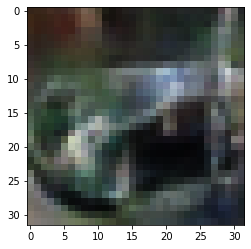

-> Epoch 196, Batch numero 1/78 -> Disc. loss on real images: 0.43782, Disc. loss on fake images: 0.27892, Generator loss: 1.44837
-> Epoch 196, Batch numero 2/78 -> Disc. loss on real images: 0.27296, Disc. loss on fake images: 0.54076, Generator loss: 1.56961
-> Epoch 196, Batch numero 3/78 -> Disc. loss on real images: 0.50600, Disc. loss on fake images: 0.56951, Generator loss: 1.80988
-> Epoch 196, Batch numero 4/78 -> Disc. loss on real images: 0.53833, Disc. loss on fake images: 0.37353, Generator loss: 1.61568
-> Epoch 196, Batch numero 5/78 -> Disc. loss on real images: 0.44362, Disc. loss on fake images: 0.33623, Generator loss: 1.62712
-> Epoch 196, Batch numero 6/78 -> Disc. loss on real images: 0.33480, Disc. loss on fake images: 0.52798, Generator loss: 1.58834
-> Epoch 196, Batch numero 7/78 -> Disc. loss on real images: 0.57189, Disc. loss on fake images: 0.47269, Generator loss: 1.51663
-> Epoch 196, Batch numero 8/78 -> Disc. loss on real images: 0.36466, Disc. loss o

-> Epoch 196, Batch numero 64/78 -> Disc. loss on real images: 0.45730, Disc. loss on fake images: 0.44992, Generator loss: 1.45991
-> Epoch 196, Batch numero 65/78 -> Disc. loss on real images: 0.45645, Disc. loss on fake images: 0.60774, Generator loss: 1.65502
-> Epoch 196, Batch numero 66/78 -> Disc. loss on real images: 0.43538, Disc. loss on fake images: 0.44905, Generator loss: 1.55215
-> Epoch 196, Batch numero 67/78 -> Disc. loss on real images: 0.68150, Disc. loss on fake images: 0.44592, Generator loss: 1.70359
-> Epoch 196, Batch numero 68/78 -> Disc. loss on real images: 0.43371, Disc. loss on fake images: 0.36863, Generator loss: 1.74841
-> Epoch 196, Batch numero 69/78 -> Disc. loss on real images: 0.44716, Disc. loss on fake images: 0.55528, Generator loss: 1.66630
-> Epoch 196, Batch numero 70/78 -> Disc. loss on real images: 0.66119, Disc. loss on fake images: 0.37679, Generator loss: 1.51561
-> Epoch 196, Batch numero 71/78 -> Disc. loss on real images: 0.34430, Disc

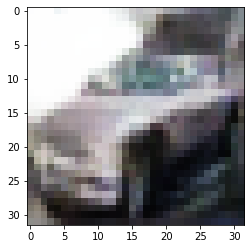

-> Epoch 197, Batch numero 1/78 -> Disc. loss on real images: 0.41003, Disc. loss on fake images: 0.46817, Generator loss: 1.73069
-> Epoch 197, Batch numero 2/78 -> Disc. loss on real images: 0.56943, Disc. loss on fake images: 0.64890, Generator loss: 1.67186
-> Epoch 197, Batch numero 3/78 -> Disc. loss on real images: 0.64307, Disc. loss on fake images: 0.36876, Generator loss: 1.58076
-> Epoch 197, Batch numero 4/78 -> Disc. loss on real images: 0.38043, Disc. loss on fake images: 0.47308, Generator loss: 1.60532
-> Epoch 197, Batch numero 5/78 -> Disc. loss on real images: 0.42194, Disc. loss on fake images: 0.32111, Generator loss: 1.75793
-> Epoch 197, Batch numero 6/78 -> Disc. loss on real images: 0.36190, Disc. loss on fake images: 0.39910, Generator loss: 1.60303
-> Epoch 197, Batch numero 7/78 -> Disc. loss on real images: 0.38270, Disc. loss on fake images: 0.51732, Generator loss: 1.71390
-> Epoch 197, Batch numero 8/78 -> Disc. loss on real images: 0.40649, Disc. loss o

-> Epoch 197, Batch numero 64/78 -> Disc. loss on real images: 0.40419, Disc. loss on fake images: 0.53430, Generator loss: 1.50258
-> Epoch 197, Batch numero 65/78 -> Disc. loss on real images: 0.36789, Disc. loss on fake images: 0.43556, Generator loss: 1.54248
-> Epoch 197, Batch numero 66/78 -> Disc. loss on real images: 0.40578, Disc. loss on fake images: 0.34353, Generator loss: 1.36040
-> Epoch 197, Batch numero 67/78 -> Disc. loss on real images: 0.40969, Disc. loss on fake images: 0.35340, Generator loss: 1.20971
-> Epoch 197, Batch numero 68/78 -> Disc. loss on real images: 0.42504, Disc. loss on fake images: 0.52250, Generator loss: 1.31287
-> Epoch 197, Batch numero 69/78 -> Disc. loss on real images: 0.38485, Disc. loss on fake images: 0.41862, Generator loss: 1.61054
-> Epoch 197, Batch numero 70/78 -> Disc. loss on real images: 0.43189, Disc. loss on fake images: 0.34132, Generator loss: 1.70673
-> Epoch 197, Batch numero 71/78 -> Disc. loss on real images: 0.27759, Disc

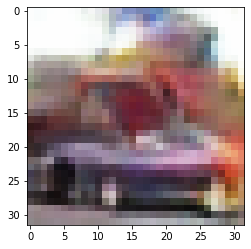

-> Epoch 198, Batch numero 1/78 -> Disc. loss on real images: 0.42589, Disc. loss on fake images: 0.39252, Generator loss: 1.67746
-> Epoch 198, Batch numero 2/78 -> Disc. loss on real images: 0.43378, Disc. loss on fake images: 0.37475, Generator loss: 1.47187
-> Epoch 198, Batch numero 3/78 -> Disc. loss on real images: 0.37760, Disc. loss on fake images: 0.53055, Generator loss: 1.68571
-> Epoch 198, Batch numero 4/78 -> Disc. loss on real images: 0.44235, Disc. loss on fake images: 0.47650, Generator loss: 1.81846
-> Epoch 198, Batch numero 5/78 -> Disc. loss on real images: 0.40751, Disc. loss on fake images: 0.49135, Generator loss: 1.81804
-> Epoch 198, Batch numero 6/78 -> Disc. loss on real images: 0.73515, Disc. loss on fake images: 0.52280, Generator loss: 1.79190
-> Epoch 198, Batch numero 7/78 -> Disc. loss on real images: 0.49832, Disc. loss on fake images: 0.38635, Generator loss: 1.49552
-> Epoch 198, Batch numero 8/78 -> Disc. loss on real images: 0.36916, Disc. loss o

-> Epoch 198, Batch numero 64/78 -> Disc. loss on real images: 0.59754, Disc. loss on fake images: 0.37552, Generator loss: 1.60990
-> Epoch 198, Batch numero 65/78 -> Disc. loss on real images: 0.45431, Disc. loss on fake images: 0.54825, Generator loss: 1.49206
-> Epoch 198, Batch numero 66/78 -> Disc. loss on real images: 0.47912, Disc. loss on fake images: 0.36565, Generator loss: 1.30324
-> Epoch 198, Batch numero 67/78 -> Disc. loss on real images: 0.50191, Disc. loss on fake images: 0.48026, Generator loss: 1.49070
-> Epoch 198, Batch numero 68/78 -> Disc. loss on real images: 0.44275, Disc. loss on fake images: 0.46223, Generator loss: 1.52071
-> Epoch 198, Batch numero 69/78 -> Disc. loss on real images: 0.50457, Disc. loss on fake images: 0.67203, Generator loss: 1.66093
-> Epoch 198, Batch numero 70/78 -> Disc. loss on real images: 0.52490, Disc. loss on fake images: 0.47254, Generator loss: 1.57839
-> Epoch 198, Batch numero 71/78 -> Disc. loss on real images: 0.55045, Disc

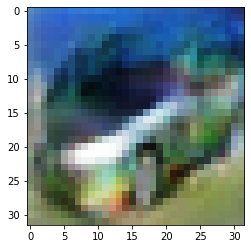

-> Epoch 199, Batch numero 1/78 -> Disc. loss on real images: 0.46352, Disc. loss on fake images: 0.54452, Generator loss: 1.47909
-> Epoch 199, Batch numero 2/78 -> Disc. loss on real images: 0.34693, Disc. loss on fake images: 0.41781, Generator loss: 1.51813
-> Epoch 199, Batch numero 3/78 -> Disc. loss on real images: 0.41599, Disc. loss on fake images: 0.40757, Generator loss: 1.67990
-> Epoch 199, Batch numero 4/78 -> Disc. loss on real images: 0.50810, Disc. loss on fake images: 0.54790, Generator loss: 1.54207
-> Epoch 199, Batch numero 5/78 -> Disc. loss on real images: 0.52935, Disc. loss on fake images: 0.37857, Generator loss: 1.75731
-> Epoch 199, Batch numero 6/78 -> Disc. loss on real images: 0.43180, Disc. loss on fake images: 0.52812, Generator loss: 1.51606
-> Epoch 199, Batch numero 7/78 -> Disc. loss on real images: 0.35699, Disc. loss on fake images: 0.45111, Generator loss: 1.59960
-> Epoch 199, Batch numero 8/78 -> Disc. loss on real images: 0.46951, Disc. loss o

-> Epoch 199, Batch numero 64/78 -> Disc. loss on real images: 0.48079, Disc. loss on fake images: 0.34522, Generator loss: 1.60819
-> Epoch 199, Batch numero 65/78 -> Disc. loss on real images: 0.37510, Disc. loss on fake images: 0.43944, Generator loss: 1.67252
-> Epoch 199, Batch numero 66/78 -> Disc. loss on real images: 0.51400, Disc. loss on fake images: 0.35986, Generator loss: 1.70395
-> Epoch 199, Batch numero 67/78 -> Disc. loss on real images: 0.39434, Disc. loss on fake images: 0.42919, Generator loss: 1.68443
-> Epoch 199, Batch numero 68/78 -> Disc. loss on real images: 0.34144, Disc. loss on fake images: 0.40576, Generator loss: 1.67526
-> Epoch 199, Batch numero 69/78 -> Disc. loss on real images: 0.42732, Disc. loss on fake images: 0.39035, Generator loss: 1.73844
-> Epoch 199, Batch numero 70/78 -> Disc. loss on real images: 0.38734, Disc. loss on fake images: 0.43159, Generator loss: 1.62861
-> Epoch 199, Batch numero 71/78 -> Disc. loss on real images: 0.49479, Disc

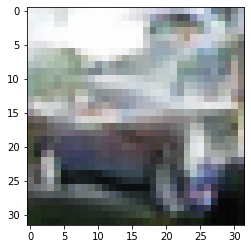

-> Epoch 200, Batch numero 1/78 -> Disc. loss on real images: 0.48633, Disc. loss on fake images: 0.33895, Generator loss: 1.65111
-> Epoch 200, Batch numero 2/78 -> Disc. loss on real images: 0.37934, Disc. loss on fake images: 0.41957, Generator loss: 1.88235
-> Epoch 200, Batch numero 3/78 -> Disc. loss on real images: 0.49134, Disc. loss on fake images: 0.56312, Generator loss: 1.71981
-> Epoch 200, Batch numero 4/78 -> Disc. loss on real images: 0.55207, Disc. loss on fake images: 0.37668, Generator loss: 1.63975
-> Epoch 200, Batch numero 5/78 -> Disc. loss on real images: 0.56025, Disc. loss on fake images: 0.46461, Generator loss: 1.61851
-> Epoch 200, Batch numero 6/78 -> Disc. loss on real images: 0.43956, Disc. loss on fake images: 0.35577, Generator loss: 1.55059
-> Epoch 200, Batch numero 7/78 -> Disc. loss on real images: 0.32579, Disc. loss on fake images: 0.48575, Generator loss: 1.71207
-> Epoch 200, Batch numero 8/78 -> Disc. loss on real images: 0.41157, Disc. loss o

-> Epoch 200, Batch numero 64/78 -> Disc. loss on real images: 0.37204, Disc. loss on fake images: 0.46921, Generator loss: 1.66889
-> Epoch 200, Batch numero 65/78 -> Disc. loss on real images: 0.53397, Disc. loss on fake images: 0.41961, Generator loss: 1.54029
-> Epoch 200, Batch numero 66/78 -> Disc. loss on real images: 0.43692, Disc. loss on fake images: 0.43982, Generator loss: 1.68661
-> Epoch 200, Batch numero 67/78 -> Disc. loss on real images: 0.48134, Disc. loss on fake images: 0.52250, Generator loss: 1.70676
-> Epoch 200, Batch numero 68/78 -> Disc. loss on real images: 0.51333, Disc. loss on fake images: 0.51362, Generator loss: 1.62278
-> Epoch 200, Batch numero 69/78 -> Disc. loss on real images: 0.47682, Disc. loss on fake images: 0.37385, Generator loss: 1.68915
-> Epoch 200, Batch numero 70/78 -> Disc. loss on real images: 0.45363, Disc. loss on fake images: 0.41591, Generator loss: 1.84691
-> Epoch 200, Batch numero 71/78 -> Disc. loss on real images: 0.61344, Disc

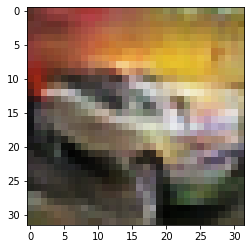

-> Epoch 201, Batch numero 1/78 -> Disc. loss on real images: 0.61101, Disc. loss on fake images: 0.41628, Generator loss: 1.56666
-> Epoch 201, Batch numero 2/78 -> Disc. loss on real images: 0.44946, Disc. loss on fake images: 0.50925, Generator loss: 1.58810
-> Epoch 201, Batch numero 3/78 -> Disc. loss on real images: 0.37737, Disc. loss on fake images: 0.31940, Generator loss: 1.63883
-> Epoch 201, Batch numero 4/78 -> Disc. loss on real images: 0.50487, Disc. loss on fake images: 0.60534, Generator loss: 1.62464
-> Epoch 201, Batch numero 5/78 -> Disc. loss on real images: 0.37828, Disc. loss on fake images: 0.45461, Generator loss: 1.57383
-> Epoch 201, Batch numero 6/78 -> Disc. loss on real images: 0.41253, Disc. loss on fake images: 0.37611, Generator loss: 1.67228
-> Epoch 201, Batch numero 7/78 -> Disc. loss on real images: 0.61644, Disc. loss on fake images: 0.47176, Generator loss: 1.66915
-> Epoch 201, Batch numero 8/78 -> Disc. loss on real images: 0.61203, Disc. loss o

-> Epoch 201, Batch numero 64/78 -> Disc. loss on real images: 0.58022, Disc. loss on fake images: 0.31163, Generator loss: 1.78662
-> Epoch 201, Batch numero 65/78 -> Disc. loss on real images: 0.38614, Disc. loss on fake images: 0.44877, Generator loss: 1.47134
-> Epoch 201, Batch numero 66/78 -> Disc. loss on real images: 0.50901, Disc. loss on fake images: 0.44473, Generator loss: 1.63614
-> Epoch 201, Batch numero 67/78 -> Disc. loss on real images: 0.46694, Disc. loss on fake images: 0.50177, Generator loss: 1.54924
-> Epoch 201, Batch numero 68/78 -> Disc. loss on real images: 0.44366, Disc. loss on fake images: 0.53453, Generator loss: 1.60559
-> Epoch 201, Batch numero 69/78 -> Disc. loss on real images: 0.33188, Disc. loss on fake images: 0.48250, Generator loss: 1.69185
-> Epoch 201, Batch numero 70/78 -> Disc. loss on real images: 0.59848, Disc. loss on fake images: 0.45865, Generator loss: 1.90107
-> Epoch 201, Batch numero 71/78 -> Disc. loss on real images: 0.54231, Disc

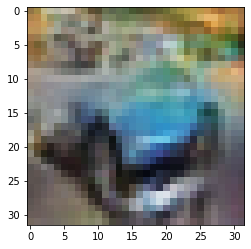

-> Epoch 202, Batch numero 1/78 -> Disc. loss on real images: 0.36026, Disc. loss on fake images: 0.41845, Generator loss: 1.62970
-> Epoch 202, Batch numero 2/78 -> Disc. loss on real images: 0.53575, Disc. loss on fake images: 0.53269, Generator loss: 1.73902
-> Epoch 202, Batch numero 3/78 -> Disc. loss on real images: 0.45394, Disc. loss on fake images: 0.48544, Generator loss: 1.69369
-> Epoch 202, Batch numero 4/78 -> Disc. loss on real images: 0.52143, Disc. loss on fake images: 0.33917, Generator loss: 1.54314
-> Epoch 202, Batch numero 5/78 -> Disc. loss on real images: 0.41953, Disc. loss on fake images: 0.48913, Generator loss: 1.94407
-> Epoch 202, Batch numero 6/78 -> Disc. loss on real images: 0.36666, Disc. loss on fake images: 0.39973, Generator loss: 1.52252
-> Epoch 202, Batch numero 7/78 -> Disc. loss on real images: 0.55991, Disc. loss on fake images: 0.49619, Generator loss: 1.49215
-> Epoch 202, Batch numero 8/78 -> Disc. loss on real images: 0.44230, Disc. loss o

-> Epoch 202, Batch numero 64/78 -> Disc. loss on real images: 0.65591, Disc. loss on fake images: 0.32494, Generator loss: 1.78381
-> Epoch 202, Batch numero 65/78 -> Disc. loss on real images: 0.57579, Disc. loss on fake images: 0.38313, Generator loss: 1.56664
-> Epoch 202, Batch numero 66/78 -> Disc. loss on real images: 0.48032, Disc. loss on fake images: 0.48813, Generator loss: 1.58289
-> Epoch 202, Batch numero 67/78 -> Disc. loss on real images: 0.44592, Disc. loss on fake images: 0.54392, Generator loss: 1.67452
-> Epoch 202, Batch numero 68/78 -> Disc. loss on real images: 0.43054, Disc. loss on fake images: 0.43556, Generator loss: 1.63180
-> Epoch 202, Batch numero 69/78 -> Disc. loss on real images: 0.54044, Disc. loss on fake images: 0.40148, Generator loss: 1.57969
-> Epoch 202, Batch numero 70/78 -> Disc. loss on real images: 0.40742, Disc. loss on fake images: 0.42236, Generator loss: 1.48894
-> Epoch 202, Batch numero 71/78 -> Disc. loss on real images: 0.43353, Disc

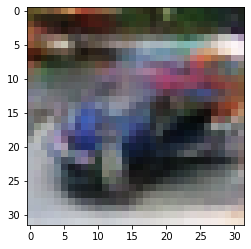

-> Epoch 203, Batch numero 1/78 -> Disc. loss on real images: 0.61663, Disc. loss on fake images: 0.35600, Generator loss: 1.41230
-> Epoch 203, Batch numero 2/78 -> Disc. loss on real images: 0.41688, Disc. loss on fake images: 0.40929, Generator loss: 1.50296
-> Epoch 203, Batch numero 3/78 -> Disc. loss on real images: 0.41018, Disc. loss on fake images: 0.46579, Generator loss: 1.60955
-> Epoch 203, Batch numero 4/78 -> Disc. loss on real images: 0.40679, Disc. loss on fake images: 0.49855, Generator loss: 1.62201
-> Epoch 203, Batch numero 5/78 -> Disc. loss on real images: 0.66653, Disc. loss on fake images: 0.42893, Generator loss: 1.57002
-> Epoch 203, Batch numero 6/78 -> Disc. loss on real images: 0.49854, Disc. loss on fake images: 0.54193, Generator loss: 1.62577
-> Epoch 203, Batch numero 7/78 -> Disc. loss on real images: 0.39863, Disc. loss on fake images: 0.59029, Generator loss: 1.55881
-> Epoch 203, Batch numero 8/78 -> Disc. loss on real images: 0.55238, Disc. loss o

-> Epoch 203, Batch numero 64/78 -> Disc. loss on real images: 0.31976, Disc. loss on fake images: 0.52378, Generator loss: 2.03644
-> Epoch 203, Batch numero 65/78 -> Disc. loss on real images: 0.63193, Disc. loss on fake images: 0.37697, Generator loss: 1.53003
-> Epoch 203, Batch numero 66/78 -> Disc. loss on real images: 0.51372, Disc. loss on fake images: 0.46600, Generator loss: 1.53032
-> Epoch 203, Batch numero 67/78 -> Disc. loss on real images: 0.42001, Disc. loss on fake images: 0.38323, Generator loss: 1.52825
-> Epoch 203, Batch numero 68/78 -> Disc. loss on real images: 0.31688, Disc. loss on fake images: 0.48037, Generator loss: 1.49294
-> Epoch 203, Batch numero 69/78 -> Disc. loss on real images: 0.38590, Disc. loss on fake images: 0.26690, Generator loss: 1.43066
-> Epoch 203, Batch numero 70/78 -> Disc. loss on real images: 0.47840, Disc. loss on fake images: 0.58787, Generator loss: 1.48191
-> Epoch 203, Batch numero 71/78 -> Disc. loss on real images: 0.37691, Disc

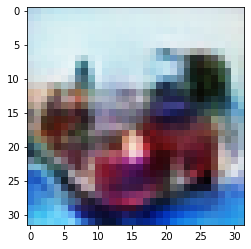

-> Epoch 204, Batch numero 1/78 -> Disc. loss on real images: 0.47892, Disc. loss on fake images: 0.51083, Generator loss: 1.73722
-> Epoch 204, Batch numero 2/78 -> Disc. loss on real images: 0.39710, Disc. loss on fake images: 0.45396, Generator loss: 1.44311
-> Epoch 204, Batch numero 3/78 -> Disc. loss on real images: 0.31018, Disc. loss on fake images: 0.31831, Generator loss: 1.18351
-> Epoch 204, Batch numero 4/78 -> Disc. loss on real images: 0.33853, Disc. loss on fake images: 0.49363, Generator loss: 1.60435
-> Epoch 204, Batch numero 5/78 -> Disc. loss on real images: 0.50373, Disc. loss on fake images: 0.35892, Generator loss: 1.72697
-> Epoch 204, Batch numero 6/78 -> Disc. loss on real images: 0.33423, Disc. loss on fake images: 0.48974, Generator loss: 1.83557
-> Epoch 204, Batch numero 7/78 -> Disc. loss on real images: 0.41183, Disc. loss on fake images: 0.36379, Generator loss: 1.62558
-> Epoch 204, Batch numero 8/78 -> Disc. loss on real images: 0.46504, Disc. loss o

-> Epoch 204, Batch numero 64/78 -> Disc. loss on real images: 0.59813, Disc. loss on fake images: 0.50893, Generator loss: 1.61329
-> Epoch 204, Batch numero 65/78 -> Disc. loss on real images: 0.55222, Disc. loss on fake images: 0.57906, Generator loss: 1.70344
-> Epoch 204, Batch numero 66/78 -> Disc. loss on real images: 0.55296, Disc. loss on fake images: 0.66174, Generator loss: 1.82249
-> Epoch 204, Batch numero 67/78 -> Disc. loss on real images: 0.50101, Disc. loss on fake images: 0.46160, Generator loss: 1.49105
-> Epoch 204, Batch numero 68/78 -> Disc. loss on real images: 0.36452, Disc. loss on fake images: 0.36272, Generator loss: 1.88678
-> Epoch 204, Batch numero 69/78 -> Disc. loss on real images: 0.56310, Disc. loss on fake images: 0.55574, Generator loss: 1.55077
-> Epoch 204, Batch numero 70/78 -> Disc. loss on real images: 0.53543, Disc. loss on fake images: 0.28042, Generator loss: 1.65205
-> Epoch 204, Batch numero 71/78 -> Disc. loss on real images: 0.20967, Disc

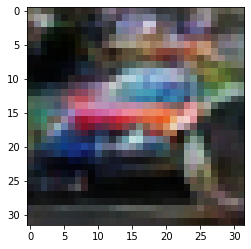

-> Epoch 205, Batch numero 1/78 -> Disc. loss on real images: 0.55058, Disc. loss on fake images: 0.52228, Generator loss: 1.77602
-> Epoch 205, Batch numero 2/78 -> Disc. loss on real images: 0.41935, Disc. loss on fake images: 0.43286, Generator loss: 1.84374
-> Epoch 205, Batch numero 3/78 -> Disc. loss on real images: 0.41830, Disc. loss on fake images: 0.44778, Generator loss: 1.87206
-> Epoch 205, Batch numero 4/78 -> Disc. loss on real images: 0.43945, Disc. loss on fake images: 0.40754, Generator loss: 1.71782
-> Epoch 205, Batch numero 5/78 -> Disc. loss on real images: 0.48637, Disc. loss on fake images: 0.47132, Generator loss: 1.58793
-> Epoch 205, Batch numero 6/78 -> Disc. loss on real images: 0.34078, Disc. loss on fake images: 0.39153, Generator loss: 1.56704
-> Epoch 205, Batch numero 7/78 -> Disc. loss on real images: 0.49816, Disc. loss on fake images: 0.36786, Generator loss: 1.60259
-> Epoch 205, Batch numero 8/78 -> Disc. loss on real images: 0.38023, Disc. loss o

-> Epoch 205, Batch numero 64/78 -> Disc. loss on real images: 0.36402, Disc. loss on fake images: 0.29249, Generator loss: 1.80900
-> Epoch 205, Batch numero 65/78 -> Disc. loss on real images: 0.42239, Disc. loss on fake images: 0.49041, Generator loss: 1.71118
-> Epoch 205, Batch numero 66/78 -> Disc. loss on real images: 0.53933, Disc. loss on fake images: 0.53151, Generator loss: 1.62186
-> Epoch 205, Batch numero 67/78 -> Disc. loss on real images: 0.34521, Disc. loss on fake images: 0.28047, Generator loss: 1.67221
-> Epoch 205, Batch numero 68/78 -> Disc. loss on real images: 0.39863, Disc. loss on fake images: 0.43270, Generator loss: 1.67194
-> Epoch 205, Batch numero 69/78 -> Disc. loss on real images: 0.34042, Disc. loss on fake images: 0.37358, Generator loss: 1.65579
-> Epoch 205, Batch numero 70/78 -> Disc. loss on real images: 0.39940, Disc. loss on fake images: 0.65180, Generator loss: 1.80219
-> Epoch 205, Batch numero 71/78 -> Disc. loss on real images: 0.57839, Disc

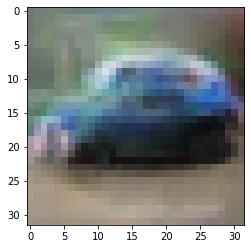

-> Epoch 206, Batch numero 1/78 -> Disc. loss on real images: 0.35705, Disc. loss on fake images: 0.41823, Generator loss: 1.61098
-> Epoch 206, Batch numero 2/78 -> Disc. loss on real images: 0.52757, Disc. loss on fake images: 0.47706, Generator loss: 1.65160
-> Epoch 206, Batch numero 3/78 -> Disc. loss on real images: 0.50107, Disc. loss on fake images: 0.50564, Generator loss: 1.50886
-> Epoch 206, Batch numero 4/78 -> Disc. loss on real images: 0.36578, Disc. loss on fake images: 0.61263, Generator loss: 1.73592
-> Epoch 206, Batch numero 5/78 -> Disc. loss on real images: 0.55498, Disc. loss on fake images: 0.46178, Generator loss: 1.72584
-> Epoch 206, Batch numero 6/78 -> Disc. loss on real images: 0.36101, Disc. loss on fake images: 0.38386, Generator loss: 1.66833
-> Epoch 206, Batch numero 7/78 -> Disc. loss on real images: 0.30554, Disc. loss on fake images: 0.45546, Generator loss: 1.72510
-> Epoch 206, Batch numero 8/78 -> Disc. loss on real images: 0.30988, Disc. loss o

-> Epoch 206, Batch numero 65/78 -> Disc. loss on real images: 0.36906, Disc. loss on fake images: 0.40885, Generator loss: 1.77352
-> Epoch 206, Batch numero 66/78 -> Disc. loss on real images: 0.49497, Disc. loss on fake images: 0.63573, Generator loss: 1.98982
-> Epoch 206, Batch numero 67/78 -> Disc. loss on real images: 0.61431, Disc. loss on fake images: 0.42861, Generator loss: 1.94640
-> Epoch 206, Batch numero 68/78 -> Disc. loss on real images: 0.51552, Disc. loss on fake images: 0.46790, Generator loss: 1.57171
-> Epoch 206, Batch numero 69/78 -> Disc. loss on real images: 0.53079, Disc. loss on fake images: 0.42506, Generator loss: 1.65524
-> Epoch 206, Batch numero 70/78 -> Disc. loss on real images: 0.33951, Disc. loss on fake images: 0.40397, Generator loss: 1.57568
-> Epoch 206, Batch numero 71/78 -> Disc. loss on real images: 0.26245, Disc. loss on fake images: 0.64730, Generator loss: 1.93808
-> Epoch 206, Batch numero 72/78 -> Disc. loss on real images: 0.46877, Disc

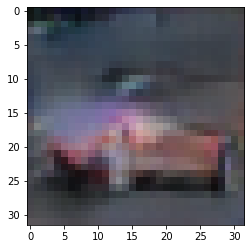

-> Epoch 207, Batch numero 1/78 -> Disc. loss on real images: 0.42872, Disc. loss on fake images: 0.40325, Generator loss: 1.44810
-> Epoch 207, Batch numero 2/78 -> Disc. loss on real images: 0.42641, Disc. loss on fake images: 0.47646, Generator loss: 1.67071
-> Epoch 207, Batch numero 3/78 -> Disc. loss on real images: 0.38020, Disc. loss on fake images: 0.33451, Generator loss: 1.96149
-> Epoch 207, Batch numero 4/78 -> Disc. loss on real images: 0.49387, Disc. loss on fake images: 0.30552, Generator loss: 1.61815
-> Epoch 207, Batch numero 5/78 -> Disc. loss on real images: 0.42722, Disc. loss on fake images: 0.49750, Generator loss: 1.62295
-> Epoch 207, Batch numero 6/78 -> Disc. loss on real images: 0.34284, Disc. loss on fake images: 0.34340, Generator loss: 1.60575
-> Epoch 207, Batch numero 7/78 -> Disc. loss on real images: 0.32451, Disc. loss on fake images: 0.39706, Generator loss: 1.84206
-> Epoch 207, Batch numero 8/78 -> Disc. loss on real images: 0.42423, Disc. loss o

-> Epoch 207, Batch numero 64/78 -> Disc. loss on real images: 0.35692, Disc. loss on fake images: 0.52326, Generator loss: 1.65635
-> Epoch 207, Batch numero 65/78 -> Disc. loss on real images: 0.31050, Disc. loss on fake images: 0.37847, Generator loss: 1.94476
-> Epoch 207, Batch numero 66/78 -> Disc. loss on real images: 0.38374, Disc. loss on fake images: 0.46989, Generator loss: 1.79878
-> Epoch 207, Batch numero 67/78 -> Disc. loss on real images: 0.35906, Disc. loss on fake images: 0.44869, Generator loss: 1.77221
-> Epoch 207, Batch numero 68/78 -> Disc. loss on real images: 0.36134, Disc. loss on fake images: 0.44348, Generator loss: 1.77628
-> Epoch 207, Batch numero 69/78 -> Disc. loss on real images: 0.49097, Disc. loss on fake images: 0.35288, Generator loss: 1.72452
-> Epoch 207, Batch numero 70/78 -> Disc. loss on real images: 0.34851, Disc. loss on fake images: 0.45481, Generator loss: 1.76716
-> Epoch 207, Batch numero 71/78 -> Disc. loss on real images: 0.46638, Disc

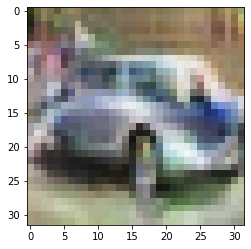

-> Epoch 208, Batch numero 1/78 -> Disc. loss on real images: 0.44208, Disc. loss on fake images: 0.34704, Generator loss: 1.76558
-> Epoch 208, Batch numero 2/78 -> Disc. loss on real images: 0.42608, Disc. loss on fake images: 0.42500, Generator loss: 1.66358
-> Epoch 208, Batch numero 3/78 -> Disc. loss on real images: 0.33562, Disc. loss on fake images: 0.48896, Generator loss: 1.63944
-> Epoch 208, Batch numero 4/78 -> Disc. loss on real images: 0.49451, Disc. loss on fake images: 0.49061, Generator loss: 1.80342
-> Epoch 208, Batch numero 5/78 -> Disc. loss on real images: 0.51108, Disc. loss on fake images: 0.57160, Generator loss: 1.66584
-> Epoch 208, Batch numero 6/78 -> Disc. loss on real images: 0.46865, Disc. loss on fake images: 0.49149, Generator loss: 1.62554
-> Epoch 208, Batch numero 7/78 -> Disc. loss on real images: 0.46256, Disc. loss on fake images: 0.44859, Generator loss: 1.75634
-> Epoch 208, Batch numero 8/78 -> Disc. loss on real images: 0.49117, Disc. loss o

-> Epoch 208, Batch numero 64/78 -> Disc. loss on real images: 0.65298, Disc. loss on fake images: 0.51213, Generator loss: 1.96692
-> Epoch 208, Batch numero 65/78 -> Disc. loss on real images: 0.28073, Disc. loss on fake images: 0.36847, Generator loss: 1.70245
-> Epoch 208, Batch numero 66/78 -> Disc. loss on real images: 0.39890, Disc. loss on fake images: 0.47348, Generator loss: 1.79704
-> Epoch 208, Batch numero 67/78 -> Disc. loss on real images: 0.53414, Disc. loss on fake images: 0.39549, Generator loss: 1.77103
-> Epoch 208, Batch numero 68/78 -> Disc. loss on real images: 0.49850, Disc. loss on fake images: 0.50753, Generator loss: 1.60608
-> Epoch 208, Batch numero 69/78 -> Disc. loss on real images: 0.41334, Disc. loss on fake images: 0.41913, Generator loss: 1.80096
-> Epoch 208, Batch numero 70/78 -> Disc. loss on real images: 0.58810, Disc. loss on fake images: 0.34438, Generator loss: 1.64622
-> Epoch 208, Batch numero 71/78 -> Disc. loss on real images: 0.54174, Disc

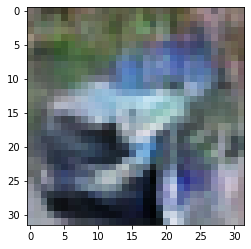

-> Epoch 209, Batch numero 1/78 -> Disc. loss on real images: 0.37703, Disc. loss on fake images: 0.53528, Generator loss: 1.74852
-> Epoch 209, Batch numero 2/78 -> Disc. loss on real images: 0.61418, Disc. loss on fake images: 0.37787, Generator loss: 1.95069
-> Epoch 209, Batch numero 3/78 -> Disc. loss on real images: 0.51238, Disc. loss on fake images: 0.69693, Generator loss: 1.78235
-> Epoch 209, Batch numero 4/78 -> Disc. loss on real images: 0.58401, Disc. loss on fake images: 0.47126, Generator loss: 1.58921
-> Epoch 209, Batch numero 5/78 -> Disc. loss on real images: 0.35160, Disc. loss on fake images: 0.33359, Generator loss: 1.78082
-> Epoch 209, Batch numero 6/78 -> Disc. loss on real images: 0.56236, Disc. loss on fake images: 0.41272, Generator loss: 1.55417
-> Epoch 209, Batch numero 7/78 -> Disc. loss on real images: 0.37382, Disc. loss on fake images: 0.37333, Generator loss: 1.74082
-> Epoch 209, Batch numero 8/78 -> Disc. loss on real images: 0.36813, Disc. loss o

-> Epoch 209, Batch numero 64/78 -> Disc. loss on real images: 0.39975, Disc. loss on fake images: 0.45765, Generator loss: 1.60398
-> Epoch 209, Batch numero 65/78 -> Disc. loss on real images: 0.49098, Disc. loss on fake images: 0.44858, Generator loss: 1.58060
-> Epoch 209, Batch numero 66/78 -> Disc. loss on real images: 0.60651, Disc. loss on fake images: 0.43402, Generator loss: 1.57757
-> Epoch 209, Batch numero 67/78 -> Disc. loss on real images: 0.41952, Disc. loss on fake images: 0.47219, Generator loss: 1.68115
-> Epoch 209, Batch numero 68/78 -> Disc. loss on real images: 0.41076, Disc. loss on fake images: 0.41746, Generator loss: 1.66102
-> Epoch 209, Batch numero 69/78 -> Disc. loss on real images: 0.41925, Disc. loss on fake images: 0.59340, Generator loss: 1.58897
-> Epoch 209, Batch numero 70/78 -> Disc. loss on real images: 0.53428, Disc. loss on fake images: 0.39314, Generator loss: 1.62484
-> Epoch 209, Batch numero 71/78 -> Disc. loss on real images: 0.46955, Disc

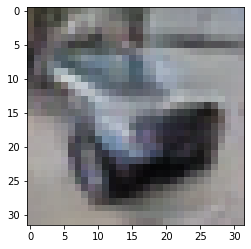

-> Epoch 210, Batch numero 1/78 -> Disc. loss on real images: 0.34470, Disc. loss on fake images: 0.31314, Generator loss: 1.73435
-> Epoch 210, Batch numero 2/78 -> Disc. loss on real images: 0.43261, Disc. loss on fake images: 0.51400, Generator loss: 1.79350
-> Epoch 210, Batch numero 3/78 -> Disc. loss on real images: 0.38887, Disc. loss on fake images: 0.39329, Generator loss: 1.83699
-> Epoch 210, Batch numero 4/78 -> Disc. loss on real images: 0.43229, Disc. loss on fake images: 0.50576, Generator loss: 1.68054
-> Epoch 210, Batch numero 5/78 -> Disc. loss on real images: 0.57939, Disc. loss on fake images: 0.54605, Generator loss: 1.63709
-> Epoch 210, Batch numero 6/78 -> Disc. loss on real images: 0.32166, Disc. loss on fake images: 0.38640, Generator loss: 1.97054
-> Epoch 210, Batch numero 7/78 -> Disc. loss on real images: 0.45765, Disc. loss on fake images: 0.39137, Generator loss: 1.71292
-> Epoch 210, Batch numero 8/78 -> Disc. loss on real images: 0.46822, Disc. loss o

-> Epoch 210, Batch numero 64/78 -> Disc. loss on real images: 0.48904, Disc. loss on fake images: 0.71346, Generator loss: 1.77464
-> Epoch 210, Batch numero 65/78 -> Disc. loss on real images: 0.55397, Disc. loss on fake images: 0.38197, Generator loss: 1.82529
-> Epoch 210, Batch numero 66/78 -> Disc. loss on real images: 0.52860, Disc. loss on fake images: 0.35510, Generator loss: 1.83846
-> Epoch 210, Batch numero 67/78 -> Disc. loss on real images: 0.46473, Disc. loss on fake images: 0.39756, Generator loss: 1.70428
-> Epoch 210, Batch numero 68/78 -> Disc. loss on real images: 0.36943, Disc. loss on fake images: 0.34398, Generator loss: 1.46588
-> Epoch 210, Batch numero 69/78 -> Disc. loss on real images: 0.34762, Disc. loss on fake images: 0.55010, Generator loss: 1.55017
-> Epoch 210, Batch numero 70/78 -> Disc. loss on real images: 0.52968, Disc. loss on fake images: 0.49171, Generator loss: 1.75346
-> Epoch 210, Batch numero 71/78 -> Disc. loss on real images: 0.24306, Disc

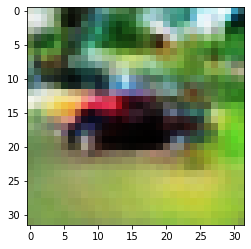

-> Epoch 211, Batch numero 1/78 -> Disc. loss on real images: 0.41709, Disc. loss on fake images: 0.44328, Generator loss: 1.79195
-> Epoch 211, Batch numero 2/78 -> Disc. loss on real images: 0.48471, Disc. loss on fake images: 0.45400, Generator loss: 1.86959
-> Epoch 211, Batch numero 3/78 -> Disc. loss on real images: 0.44039, Disc. loss on fake images: 0.49662, Generator loss: 1.82678
-> Epoch 211, Batch numero 4/78 -> Disc. loss on real images: 0.54095, Disc. loss on fake images: 0.33413, Generator loss: 1.51478
-> Epoch 211, Batch numero 5/78 -> Disc. loss on real images: 0.38522, Disc. loss on fake images: 0.72612, Generator loss: 1.84256
-> Epoch 211, Batch numero 6/78 -> Disc. loss on real images: 0.45773, Disc. loss on fake images: 0.31515, Generator loss: 1.97149
-> Epoch 211, Batch numero 7/78 -> Disc. loss on real images: 0.43540, Disc. loss on fake images: 0.49656, Generator loss: 1.52950
-> Epoch 211, Batch numero 8/78 -> Disc. loss on real images: 0.47471, Disc. loss o

-> Epoch 211, Batch numero 64/78 -> Disc. loss on real images: 0.48393, Disc. loss on fake images: 0.53826, Generator loss: 1.61092
-> Epoch 211, Batch numero 65/78 -> Disc. loss on real images: 0.44593, Disc. loss on fake images: 0.44213, Generator loss: 1.71567
-> Epoch 211, Batch numero 66/78 -> Disc. loss on real images: 0.37895, Disc. loss on fake images: 0.51395, Generator loss: 2.05586
-> Epoch 211, Batch numero 67/78 -> Disc. loss on real images: 0.37429, Disc. loss on fake images: 0.33453, Generator loss: 2.04893
-> Epoch 211, Batch numero 68/78 -> Disc. loss on real images: 0.51249, Disc. loss on fake images: 0.38865, Generator loss: 1.79511
-> Epoch 211, Batch numero 69/78 -> Disc. loss on real images: 0.52665, Disc. loss on fake images: 0.30249, Generator loss: 1.69613
-> Epoch 211, Batch numero 70/78 -> Disc. loss on real images: 0.36230, Disc. loss on fake images: 0.40966, Generator loss: 1.48067
-> Epoch 211, Batch numero 71/78 -> Disc. loss on real images: 0.32829, Disc

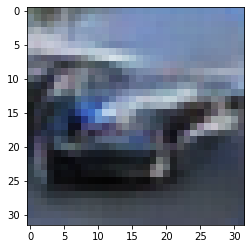

-> Epoch 212, Batch numero 1/78 -> Disc. loss on real images: 0.43902, Disc. loss on fake images: 0.36087, Generator loss: 1.92493
-> Epoch 212, Batch numero 2/78 -> Disc. loss on real images: 0.37487, Disc. loss on fake images: 0.38360, Generator loss: 1.70966
-> Epoch 212, Batch numero 3/78 -> Disc. loss on real images: 0.40419, Disc. loss on fake images: 0.43128, Generator loss: 1.73701
-> Epoch 212, Batch numero 4/78 -> Disc. loss on real images: 0.57605, Disc. loss on fake images: 0.32696, Generator loss: 1.40030
-> Epoch 212, Batch numero 5/78 -> Disc. loss on real images: 0.28698, Disc. loss on fake images: 0.51478, Generator loss: 1.66489
-> Epoch 212, Batch numero 6/78 -> Disc. loss on real images: 0.44871, Disc. loss on fake images: 0.43665, Generator loss: 1.66963
-> Epoch 212, Batch numero 7/78 -> Disc. loss on real images: 0.43296, Disc. loss on fake images: 0.53697, Generator loss: 1.61373
-> Epoch 212, Batch numero 8/78 -> Disc. loss on real images: 0.51203, Disc. loss o

-> Epoch 212, Batch numero 64/78 -> Disc. loss on real images: 0.59461, Disc. loss on fake images: 0.39485, Generator loss: 1.91588
-> Epoch 212, Batch numero 65/78 -> Disc. loss on real images: 0.44196, Disc. loss on fake images: 0.34599, Generator loss: 1.74675
-> Epoch 212, Batch numero 66/78 -> Disc. loss on real images: 0.46483, Disc. loss on fake images: 0.47936, Generator loss: 1.82570
-> Epoch 212, Batch numero 67/78 -> Disc. loss on real images: 0.28281, Disc. loss on fake images: 0.49826, Generator loss: 1.99661
-> Epoch 212, Batch numero 68/78 -> Disc. loss on real images: 0.48100, Disc. loss on fake images: 0.39211, Generator loss: 1.84998
-> Epoch 212, Batch numero 69/78 -> Disc. loss on real images: 0.51974, Disc. loss on fake images: 0.36706, Generator loss: 1.70069
-> Epoch 212, Batch numero 70/78 -> Disc. loss on real images: 0.47896, Disc. loss on fake images: 0.42623, Generator loss: 1.66015
-> Epoch 212, Batch numero 71/78 -> Disc. loss on real images: 0.32755, Disc

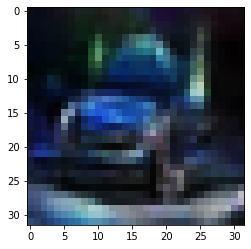

-> Epoch 213, Batch numero 1/78 -> Disc. loss on real images: 0.50101, Disc. loss on fake images: 0.46674, Generator loss: 1.79119
-> Epoch 213, Batch numero 2/78 -> Disc. loss on real images: 0.39916, Disc. loss on fake images: 0.47102, Generator loss: 1.87459
-> Epoch 213, Batch numero 3/78 -> Disc. loss on real images: 0.46645, Disc. loss on fake images: 0.34799, Generator loss: 1.64481
-> Epoch 213, Batch numero 4/78 -> Disc. loss on real images: 0.55080, Disc. loss on fake images: 0.39675, Generator loss: 1.62896
-> Epoch 213, Batch numero 5/78 -> Disc. loss on real images: 0.46836, Disc. loss on fake images: 0.44398, Generator loss: 1.63462
-> Epoch 213, Batch numero 6/78 -> Disc. loss on real images: 0.61140, Disc. loss on fake images: 0.61806, Generator loss: 1.55542
-> Epoch 213, Batch numero 7/78 -> Disc. loss on real images: 0.36985, Disc. loss on fake images: 0.51712, Generator loss: 2.10854
-> Epoch 213, Batch numero 8/78 -> Disc. loss on real images: 0.53751, Disc. loss o

-> Epoch 213, Batch numero 64/78 -> Disc. loss on real images: 0.39099, Disc. loss on fake images: 0.38910, Generator loss: 1.63382
-> Epoch 213, Batch numero 65/78 -> Disc. loss on real images: 0.38659, Disc. loss on fake images: 0.39222, Generator loss: 1.81703
-> Epoch 213, Batch numero 66/78 -> Disc. loss on real images: 0.34845, Disc. loss on fake images: 0.50517, Generator loss: 1.73308
-> Epoch 213, Batch numero 67/78 -> Disc. loss on real images: 0.33930, Disc. loss on fake images: 0.49066, Generator loss: 1.69697
-> Epoch 213, Batch numero 68/78 -> Disc. loss on real images: 0.49274, Disc. loss on fake images: 0.32690, Generator loss: 1.60414
-> Epoch 213, Batch numero 69/78 -> Disc. loss on real images: 0.62378, Disc. loss on fake images: 0.35094, Generator loss: 1.56013
-> Epoch 213, Batch numero 70/78 -> Disc. loss on real images: 0.37889, Disc. loss on fake images: 0.60263, Generator loss: 1.69822
-> Epoch 213, Batch numero 71/78 -> Disc. loss on real images: 0.58503, Disc

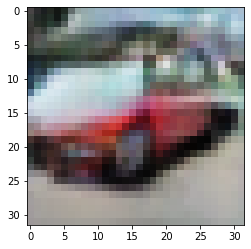

-> Epoch 214, Batch numero 1/78 -> Disc. loss on real images: 0.34845, Disc. loss on fake images: 0.54167, Generator loss: 2.02262
-> Epoch 214, Batch numero 2/78 -> Disc. loss on real images: 0.37622, Disc. loss on fake images: 0.30693, Generator loss: 2.07534
-> Epoch 214, Batch numero 3/78 -> Disc. loss on real images: 0.59721, Disc. loss on fake images: 0.49967, Generator loss: 2.03402
-> Epoch 214, Batch numero 4/78 -> Disc. loss on real images: 0.38932, Disc. loss on fake images: 0.31683, Generator loss: 1.74210
-> Epoch 214, Batch numero 5/78 -> Disc. loss on real images: 0.43768, Disc. loss on fake images: 0.32674, Generator loss: 1.59776
-> Epoch 214, Batch numero 6/78 -> Disc. loss on real images: 0.38081, Disc. loss on fake images: 0.46201, Generator loss: 1.63890
-> Epoch 214, Batch numero 7/78 -> Disc. loss on real images: 0.41577, Disc. loss on fake images: 0.37937, Generator loss: 1.70704
-> Epoch 214, Batch numero 8/78 -> Disc. loss on real images: 0.44391, Disc. loss o

-> Epoch 214, Batch numero 64/78 -> Disc. loss on real images: 0.51026, Disc. loss on fake images: 0.46098, Generator loss: 1.86193
-> Epoch 214, Batch numero 65/78 -> Disc. loss on real images: 0.51018, Disc. loss on fake images: 0.39611, Generator loss: 2.10612
-> Epoch 214, Batch numero 66/78 -> Disc. loss on real images: 0.53881, Disc. loss on fake images: 0.43498, Generator loss: 1.50481
-> Epoch 214, Batch numero 67/78 -> Disc. loss on real images: 0.46594, Disc. loss on fake images: 0.64840, Generator loss: 1.76651
-> Epoch 214, Batch numero 68/78 -> Disc. loss on real images: 0.39352, Disc. loss on fake images: 0.33738, Generator loss: 1.75803
-> Epoch 214, Batch numero 69/78 -> Disc. loss on real images: 0.53860, Disc. loss on fake images: 0.47694, Generator loss: 1.77016
-> Epoch 214, Batch numero 70/78 -> Disc. loss on real images: 0.46073, Disc. loss on fake images: 0.34988, Generator loss: 1.99054
-> Epoch 214, Batch numero 71/78 -> Disc. loss on real images: 0.57895, Disc

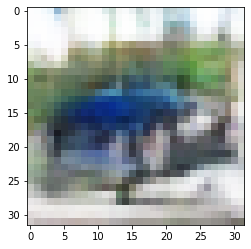

-> Epoch 215, Batch numero 1/78 -> Disc. loss on real images: 0.41948, Disc. loss on fake images: 0.39867, Generator loss: 1.79070
-> Epoch 215, Batch numero 2/78 -> Disc. loss on real images: 0.36552, Disc. loss on fake images: 0.36628, Generator loss: 1.62175
-> Epoch 215, Batch numero 3/78 -> Disc. loss on real images: 0.36498, Disc. loss on fake images: 0.37996, Generator loss: 1.70587
-> Epoch 215, Batch numero 4/78 -> Disc. loss on real images: 0.35149, Disc. loss on fake images: 0.33484, Generator loss: 1.89119
-> Epoch 215, Batch numero 5/78 -> Disc. loss on real images: 0.40825, Disc. loss on fake images: 0.40010, Generator loss: 1.54223
-> Epoch 215, Batch numero 6/78 -> Disc. loss on real images: 0.34836, Disc. loss on fake images: 0.54900, Generator loss: 1.69818
-> Epoch 215, Batch numero 7/78 -> Disc. loss on real images: 0.31801, Disc. loss on fake images: 0.37251, Generator loss: 1.76025
-> Epoch 215, Batch numero 8/78 -> Disc. loss on real images: 0.43213, Disc. loss o

-> Epoch 215, Batch numero 64/78 -> Disc. loss on real images: 0.33969, Disc. loss on fake images: 0.41096, Generator loss: 1.72929
-> Epoch 215, Batch numero 65/78 -> Disc. loss on real images: 0.41770, Disc. loss on fake images: 0.62851, Generator loss: 1.99494
-> Epoch 215, Batch numero 66/78 -> Disc. loss on real images: 0.54074, Disc. loss on fake images: 0.24716, Generator loss: 1.60087
-> Epoch 215, Batch numero 67/78 -> Disc. loss on real images: 0.42698, Disc. loss on fake images: 0.36726, Generator loss: 1.68223
-> Epoch 215, Batch numero 68/78 -> Disc. loss on real images: 0.28806, Disc. loss on fake images: 0.46213, Generator loss: 1.65944
-> Epoch 215, Batch numero 69/78 -> Disc. loss on real images: 0.40055, Disc. loss on fake images: 0.55448, Generator loss: 1.80451
-> Epoch 215, Batch numero 70/78 -> Disc. loss on real images: 0.43776, Disc. loss on fake images: 0.32342, Generator loss: 2.02275
-> Epoch 215, Batch numero 71/78 -> Disc. loss on real images: 0.53833, Disc

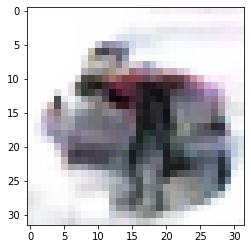

-> Epoch 216, Batch numero 1/78 -> Disc. loss on real images: 0.49503, Disc. loss on fake images: 0.51880, Generator loss: 2.09798
-> Epoch 216, Batch numero 2/78 -> Disc. loss on real images: 0.45328, Disc. loss on fake images: 0.29712, Generator loss: 1.79374
-> Epoch 216, Batch numero 3/78 -> Disc. loss on real images: 0.35580, Disc. loss on fake images: 0.33001, Generator loss: 1.88343
-> Epoch 216, Batch numero 4/78 -> Disc. loss on real images: 0.33075, Disc. loss on fake images: 0.58200, Generator loss: 1.96121
-> Epoch 216, Batch numero 5/78 -> Disc. loss on real images: 0.44717, Disc. loss on fake images: 0.29063, Generator loss: 1.67612
-> Epoch 216, Batch numero 6/78 -> Disc. loss on real images: 0.41277, Disc. loss on fake images: 0.51439, Generator loss: 1.78707
-> Epoch 216, Batch numero 7/78 -> Disc. loss on real images: 0.40271, Disc. loss on fake images: 0.47451, Generator loss: 1.69914
-> Epoch 216, Batch numero 8/78 -> Disc. loss on real images: 0.41399, Disc. loss o

-> Epoch 216, Batch numero 64/78 -> Disc. loss on real images: 0.39938, Disc. loss on fake images: 0.59310, Generator loss: 1.68373
-> Epoch 216, Batch numero 65/78 -> Disc. loss on real images: 0.36931, Disc. loss on fake images: 0.37209, Generator loss: 1.82311
-> Epoch 216, Batch numero 66/78 -> Disc. loss on real images: 0.60356, Disc. loss on fake images: 0.33522, Generator loss: 1.79683
-> Epoch 216, Batch numero 67/78 -> Disc. loss on real images: 0.30602, Disc. loss on fake images: 0.33472, Generator loss: 1.66772
-> Epoch 216, Batch numero 68/78 -> Disc. loss on real images: 0.36433, Disc. loss on fake images: 0.47291, Generator loss: 1.71475
-> Epoch 216, Batch numero 69/78 -> Disc. loss on real images: 0.46995, Disc. loss on fake images: 0.52816, Generator loss: 2.04941
-> Epoch 216, Batch numero 70/78 -> Disc. loss on real images: 0.50959, Disc. loss on fake images: 0.39121, Generator loss: 1.97168
-> Epoch 216, Batch numero 71/78 -> Disc. loss on real images: 0.40305, Disc

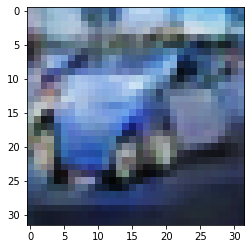

-> Epoch 217, Batch numero 1/78 -> Disc. loss on real images: 0.45681, Disc. loss on fake images: 0.49131, Generator loss: 1.59017
-> Epoch 217, Batch numero 2/78 -> Disc. loss on real images: 0.35195, Disc. loss on fake images: 0.39123, Generator loss: 1.87146
-> Epoch 217, Batch numero 3/78 -> Disc. loss on real images: 0.43680, Disc. loss on fake images: 0.35266, Generator loss: 1.62731
-> Epoch 217, Batch numero 4/78 -> Disc. loss on real images: 0.38424, Disc. loss on fake images: 0.53088, Generator loss: 1.75542
-> Epoch 217, Batch numero 5/78 -> Disc. loss on real images: 0.26871, Disc. loss on fake images: 0.42907, Generator loss: 1.98456
-> Epoch 217, Batch numero 6/78 -> Disc. loss on real images: 0.56352, Disc. loss on fake images: 0.30495, Generator loss: 1.96888
-> Epoch 217, Batch numero 7/78 -> Disc. loss on real images: 0.30463, Disc. loss on fake images: 0.43915, Generator loss: 1.63597
-> Epoch 217, Batch numero 8/78 -> Disc. loss on real images: 0.58877, Disc. loss o

-> Epoch 217, Batch numero 64/78 -> Disc. loss on real images: 0.41081, Disc. loss on fake images: 0.32425, Generator loss: 1.87091
-> Epoch 217, Batch numero 65/78 -> Disc. loss on real images: 0.47423, Disc. loss on fake images: 0.38197, Generator loss: 1.94349
-> Epoch 217, Batch numero 66/78 -> Disc. loss on real images: 0.29805, Disc. loss on fake images: 0.75168, Generator loss: 1.90680
-> Epoch 217, Batch numero 67/78 -> Disc. loss on real images: 0.53251, Disc. loss on fake images: 0.27224, Generator loss: 2.17499
-> Epoch 217, Batch numero 68/78 -> Disc. loss on real images: 0.43144, Disc. loss on fake images: 0.42581, Generator loss: 1.85149
-> Epoch 217, Batch numero 69/78 -> Disc. loss on real images: 0.48957, Disc. loss on fake images: 0.46544, Generator loss: 1.70673
-> Epoch 217, Batch numero 70/78 -> Disc. loss on real images: 0.41803, Disc. loss on fake images: 0.26974, Generator loss: 1.60544
-> Epoch 217, Batch numero 71/78 -> Disc. loss on real images: 0.33720, Disc

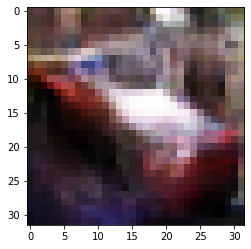

-> Epoch 218, Batch numero 1/78 -> Disc. loss on real images: 0.37970, Disc. loss on fake images: 0.46883, Generator loss: 2.04856
-> Epoch 218, Batch numero 2/78 -> Disc. loss on real images: 0.50622, Disc. loss on fake images: 0.38426, Generator loss: 1.90012
-> Epoch 218, Batch numero 3/78 -> Disc. loss on real images: 0.37956, Disc. loss on fake images: 0.39730, Generator loss: 1.61734
-> Epoch 218, Batch numero 4/78 -> Disc. loss on real images: 0.36895, Disc. loss on fake images: 0.46527, Generator loss: 1.80494
-> Epoch 218, Batch numero 5/78 -> Disc. loss on real images: 0.49793, Disc. loss on fake images: 0.48677, Generator loss: 1.74345
-> Epoch 218, Batch numero 6/78 -> Disc. loss on real images: 0.50586, Disc. loss on fake images: 0.43110, Generator loss: 1.89763
-> Epoch 218, Batch numero 7/78 -> Disc. loss on real images: 0.61095, Disc. loss on fake images: 0.44848, Generator loss: 1.96234
-> Epoch 218, Batch numero 8/78 -> Disc. loss on real images: 0.33447, Disc. loss o

-> Epoch 218, Batch numero 64/78 -> Disc. loss on real images: 0.45997, Disc. loss on fake images: 0.56495, Generator loss: 1.79563
-> Epoch 218, Batch numero 65/78 -> Disc. loss on real images: 0.37194, Disc. loss on fake images: 0.35338, Generator loss: 1.66949
-> Epoch 218, Batch numero 66/78 -> Disc. loss on real images: 0.36818, Disc. loss on fake images: 0.34424, Generator loss: 1.56660
-> Epoch 218, Batch numero 67/78 -> Disc. loss on real images: 0.43199, Disc. loss on fake images: 0.33557, Generator loss: 1.71059
-> Epoch 218, Batch numero 68/78 -> Disc. loss on real images: 0.53392, Disc. loss on fake images: 0.58922, Generator loss: 1.74075
-> Epoch 218, Batch numero 69/78 -> Disc. loss on real images: 0.41449, Disc. loss on fake images: 0.29871, Generator loss: 1.77872
-> Epoch 218, Batch numero 70/78 -> Disc. loss on real images: 0.41716, Disc. loss on fake images: 0.46965, Generator loss: 1.78648
-> Epoch 218, Batch numero 71/78 -> Disc. loss on real images: 0.47673, Disc

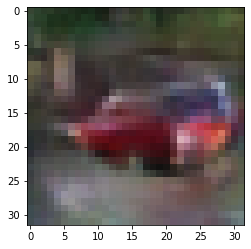

-> Epoch 219, Batch numero 1/78 -> Disc. loss on real images: 0.42390, Disc. loss on fake images: 0.61789, Generator loss: 1.88072
-> Epoch 219, Batch numero 2/78 -> Disc. loss on real images: 0.40438, Disc. loss on fake images: 0.40724, Generator loss: 1.84049
-> Epoch 219, Batch numero 3/78 -> Disc. loss on real images: 0.53747, Disc. loss on fake images: 0.44832, Generator loss: 1.92924
-> Epoch 219, Batch numero 4/78 -> Disc. loss on real images: 0.28901, Disc. loss on fake images: 0.37360, Generator loss: 1.60454
-> Epoch 219, Batch numero 5/78 -> Disc. loss on real images: 0.45494, Disc. loss on fake images: 0.31547, Generator loss: 1.99078
-> Epoch 219, Batch numero 6/78 -> Disc. loss on real images: 0.41699, Disc. loss on fake images: 0.57841, Generator loss: 2.06542
-> Epoch 219, Batch numero 7/78 -> Disc. loss on real images: 0.37407, Disc. loss on fake images: 0.30652, Generator loss: 1.83931
-> Epoch 219, Batch numero 8/78 -> Disc. loss on real images: 0.51836, Disc. loss o

-> Epoch 219, Batch numero 64/78 -> Disc. loss on real images: 0.46264, Disc. loss on fake images: 0.26688, Generator loss: 2.05016
-> Epoch 219, Batch numero 65/78 -> Disc. loss on real images: 0.46896, Disc. loss on fake images: 0.56969, Generator loss: 1.98224
-> Epoch 219, Batch numero 66/78 -> Disc. loss on real images: 0.48042, Disc. loss on fake images: 0.48247, Generator loss: 2.05018
-> Epoch 219, Batch numero 67/78 -> Disc. loss on real images: 0.48671, Disc. loss on fake images: 0.27737, Generator loss: 1.99236
-> Epoch 219, Batch numero 68/78 -> Disc. loss on real images: 0.45955, Disc. loss on fake images: 0.57103, Generator loss: 1.96217
-> Epoch 219, Batch numero 69/78 -> Disc. loss on real images: 0.41229, Disc. loss on fake images: 0.33514, Generator loss: 1.85786
-> Epoch 219, Batch numero 70/78 -> Disc. loss on real images: 0.47129, Disc. loss on fake images: 0.42683, Generator loss: 1.84446
-> Epoch 219, Batch numero 71/78 -> Disc. loss on real images: 0.50665, Disc

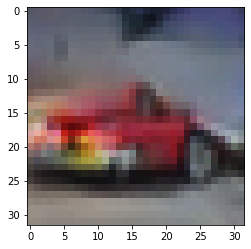

-> Epoch 220, Batch numero 1/78 -> Disc. loss on real images: 0.32180, Disc. loss on fake images: 0.53521, Generator loss: 1.76403
-> Epoch 220, Batch numero 2/78 -> Disc. loss on real images: 0.55874, Disc. loss on fake images: 0.34066, Generator loss: 1.86461
-> Epoch 220, Batch numero 3/78 -> Disc. loss on real images: 0.25207, Disc. loss on fake images: 0.30968, Generator loss: 1.65167
-> Epoch 220, Batch numero 4/78 -> Disc. loss on real images: 0.36568, Disc. loss on fake images: 0.54615, Generator loss: 2.08025
-> Epoch 220, Batch numero 5/78 -> Disc. loss on real images: 0.55217, Disc. loss on fake images: 0.32828, Generator loss: 1.77018
-> Epoch 220, Batch numero 6/78 -> Disc. loss on real images: 0.55497, Disc. loss on fake images: 0.45626, Generator loss: 1.65110
-> Epoch 220, Batch numero 7/78 -> Disc. loss on real images: 0.46553, Disc. loss on fake images: 0.42492, Generator loss: 1.80922
-> Epoch 220, Batch numero 8/78 -> Disc. loss on real images: 0.38505, Disc. loss o

-> Epoch 220, Batch numero 64/78 -> Disc. loss on real images: 0.34501, Disc. loss on fake images: 0.53584, Generator loss: 2.06066
-> Epoch 220, Batch numero 65/78 -> Disc. loss on real images: 0.47188, Disc. loss on fake images: 0.44305, Generator loss: 1.94473
-> Epoch 220, Batch numero 66/78 -> Disc. loss on real images: 0.50665, Disc. loss on fake images: 0.30964, Generator loss: 1.78389
-> Epoch 220, Batch numero 67/78 -> Disc. loss on real images: 0.48787, Disc. loss on fake images: 0.43610, Generator loss: 1.75300
-> Epoch 220, Batch numero 68/78 -> Disc. loss on real images: 0.38962, Disc. loss on fake images: 0.55503, Generator loss: 1.98445
-> Epoch 220, Batch numero 69/78 -> Disc. loss on real images: 0.51530, Disc. loss on fake images: 0.28415, Generator loss: 1.82679
-> Epoch 220, Batch numero 70/78 -> Disc. loss on real images: 0.44621, Disc. loss on fake images: 0.42842, Generator loss: 1.83993
-> Epoch 220, Batch numero 71/78 -> Disc. loss on real images: 0.39469, Disc

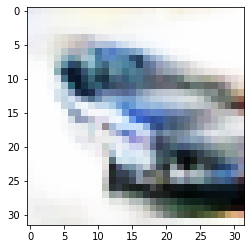

-> Epoch 221, Batch numero 1/78 -> Disc. loss on real images: 0.27554, Disc. loss on fake images: 0.34871, Generator loss: 1.79553
-> Epoch 221, Batch numero 2/78 -> Disc. loss on real images: 0.46940, Disc. loss on fake images: 0.43844, Generator loss: 1.57278
-> Epoch 221, Batch numero 3/78 -> Disc. loss on real images: 0.40261, Disc. loss on fake images: 0.33774, Generator loss: 1.85947
-> Epoch 221, Batch numero 4/78 -> Disc. loss on real images: 0.34464, Disc. loss on fake images: 0.34797, Generator loss: 1.69763
-> Epoch 221, Batch numero 5/78 -> Disc. loss on real images: 0.43148, Disc. loss on fake images: 0.43916, Generator loss: 1.77747
-> Epoch 221, Batch numero 6/78 -> Disc. loss on real images: 0.49176, Disc. loss on fake images: 0.44476, Generator loss: 1.61038
-> Epoch 221, Batch numero 7/78 -> Disc. loss on real images: 0.45027, Disc. loss on fake images: 0.43972, Generator loss: 1.56768
-> Epoch 221, Batch numero 8/78 -> Disc. loss on real images: 0.34448, Disc. loss o

-> Epoch 221, Batch numero 64/78 -> Disc. loss on real images: 0.33620, Disc. loss on fake images: 0.28227, Generator loss: 1.91502
-> Epoch 221, Batch numero 65/78 -> Disc. loss on real images: 0.27383, Disc. loss on fake images: 0.38642, Generator loss: 1.73496
-> Epoch 221, Batch numero 66/78 -> Disc. loss on real images: 0.32614, Disc. loss on fake images: 0.48992, Generator loss: 1.79867
-> Epoch 221, Batch numero 67/78 -> Disc. loss on real images: 0.35512, Disc. loss on fake images: 0.37636, Generator loss: 1.73403
-> Epoch 221, Batch numero 68/78 -> Disc. loss on real images: 0.41822, Disc. loss on fake images: 0.42299, Generator loss: 1.72829
-> Epoch 221, Batch numero 69/78 -> Disc. loss on real images: 0.54725, Disc. loss on fake images: 0.56169, Generator loss: 1.67807
-> Epoch 221, Batch numero 70/78 -> Disc. loss on real images: 0.39182, Disc. loss on fake images: 0.44619, Generator loss: 1.56040
-> Epoch 221, Batch numero 71/78 -> Disc. loss on real images: 0.57427, Disc

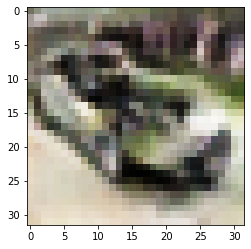

-> Epoch 222, Batch numero 1/78 -> Disc. loss on real images: 0.33985, Disc. loss on fake images: 0.29230, Generator loss: 1.80403
-> Epoch 222, Batch numero 2/78 -> Disc. loss on real images: 0.59786, Disc. loss on fake images: 0.45798, Generator loss: 2.05088
-> Epoch 222, Batch numero 3/78 -> Disc. loss on real images: 0.37580, Disc. loss on fake images: 0.52154, Generator loss: 1.83214
-> Epoch 222, Batch numero 4/78 -> Disc. loss on real images: 0.50436, Disc. loss on fake images: 0.25129, Generator loss: 1.96199
-> Epoch 222, Batch numero 5/78 -> Disc. loss on real images: 0.43816, Disc. loss on fake images: 0.54240, Generator loss: 1.77306
-> Epoch 222, Batch numero 6/78 -> Disc. loss on real images: 0.39970, Disc. loss on fake images: 0.34043, Generator loss: 1.44619
-> Epoch 222, Batch numero 7/78 -> Disc. loss on real images: 0.44164, Disc. loss on fake images: 0.44612, Generator loss: 1.69491
-> Epoch 222, Batch numero 8/78 -> Disc. loss on real images: 0.28281, Disc. loss o

-> Epoch 222, Batch numero 65/78 -> Disc. loss on real images: 0.31322, Disc. loss on fake images: 0.23841, Generator loss: 1.83153
-> Epoch 222, Batch numero 66/78 -> Disc. loss on real images: 0.28626, Disc. loss on fake images: 0.43362, Generator loss: 1.81608
-> Epoch 222, Batch numero 67/78 -> Disc. loss on real images: 0.33781, Disc. loss on fake images: 0.66607, Generator loss: 2.05360
-> Epoch 222, Batch numero 68/78 -> Disc. loss on real images: 0.62586, Disc. loss on fake images: 0.40186, Generator loss: 1.99737
-> Epoch 222, Batch numero 69/78 -> Disc. loss on real images: 0.38356, Disc. loss on fake images: 0.35135, Generator loss: 2.02097
-> Epoch 222, Batch numero 70/78 -> Disc. loss on real images: 0.62643, Disc. loss on fake images: 0.35986, Generator loss: 2.07884
-> Epoch 222, Batch numero 71/78 -> Disc. loss on real images: 0.38497, Disc. loss on fake images: 0.37639, Generator loss: 1.79527
-> Epoch 222, Batch numero 72/78 -> Disc. loss on real images: 0.41051, Disc

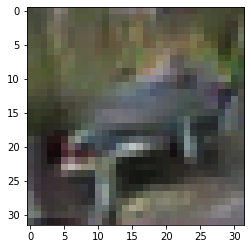

-> Epoch 223, Batch numero 1/78 -> Disc. loss on real images: 0.31685, Disc. loss on fake images: 0.56536, Generator loss: 1.65464
-> Epoch 223, Batch numero 2/78 -> Disc. loss on real images: 0.35109, Disc. loss on fake images: 0.37338, Generator loss: 1.83502
-> Epoch 223, Batch numero 3/78 -> Disc. loss on real images: 0.54255, Disc. loss on fake images: 0.52672, Generator loss: 1.78003
-> Epoch 223, Batch numero 4/78 -> Disc. loss on real images: 0.32983, Disc. loss on fake images: 0.42729, Generator loss: 1.68310
-> Epoch 223, Batch numero 5/78 -> Disc. loss on real images: 0.43600, Disc. loss on fake images: 0.44779, Generator loss: 1.81266
-> Epoch 223, Batch numero 6/78 -> Disc. loss on real images: 0.43786, Disc. loss on fake images: 0.35626, Generator loss: 1.82598
-> Epoch 223, Batch numero 7/78 -> Disc. loss on real images: 0.28725, Disc. loss on fake images: 0.43329, Generator loss: 1.68209
-> Epoch 223, Batch numero 8/78 -> Disc. loss on real images: 0.41675, Disc. loss o

-> Epoch 223, Batch numero 66/78 -> Disc. loss on real images: 0.44113, Disc. loss on fake images: 0.43990, Generator loss: 1.84466
-> Epoch 223, Batch numero 67/78 -> Disc. loss on real images: 0.34048, Disc. loss on fake images: 0.45255, Generator loss: 1.87869
-> Epoch 223, Batch numero 68/78 -> Disc. loss on real images: 0.40465, Disc. loss on fake images: 0.43545, Generator loss: 1.92092
-> Epoch 223, Batch numero 69/78 -> Disc. loss on real images: 0.39268, Disc. loss on fake images: 0.36779, Generator loss: 2.03577
-> Epoch 223, Batch numero 70/78 -> Disc. loss on real images: 0.44926, Disc. loss on fake images: 0.28908, Generator loss: 1.72402
-> Epoch 223, Batch numero 71/78 -> Disc. loss on real images: 0.47883, Disc. loss on fake images: 0.46203, Generator loss: 1.70307
-> Epoch 223, Batch numero 72/78 -> Disc. loss on real images: 0.33808, Disc. loss on fake images: 0.40637, Generator loss: 1.90250
-> Epoch 223, Batch numero 73/78 -> Disc. loss on real images: 0.33256, Disc

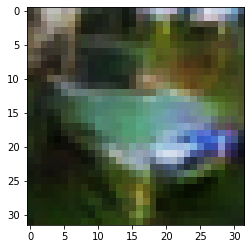

-> Epoch 224, Batch numero 1/78 -> Disc. loss on real images: 0.33046, Disc. loss on fake images: 0.38893, Generator loss: 2.06260
-> Epoch 224, Batch numero 2/78 -> Disc. loss on real images: 0.39276, Disc. loss on fake images: 0.37746, Generator loss: 2.00431
-> Epoch 224, Batch numero 3/78 -> Disc. loss on real images: 0.48870, Disc. loss on fake images: 0.27587, Generator loss: 1.50703
-> Epoch 224, Batch numero 4/78 -> Disc. loss on real images: 0.39482, Disc. loss on fake images: 0.38324, Generator loss: 1.84119
-> Epoch 224, Batch numero 5/78 -> Disc. loss on real images: 0.38696, Disc. loss on fake images: 0.49957, Generator loss: 1.65859
-> Epoch 224, Batch numero 6/78 -> Disc. loss on real images: 0.37905, Disc. loss on fake images: 0.40414, Generator loss: 1.86788
-> Epoch 224, Batch numero 7/78 -> Disc. loss on real images: 0.42183, Disc. loss on fake images: 0.60792, Generator loss: 1.85498
-> Epoch 224, Batch numero 8/78 -> Disc. loss on real images: 0.53755, Disc. loss o

-> Epoch 224, Batch numero 64/78 -> Disc. loss on real images: 0.54846, Disc. loss on fake images: 0.44924, Generator loss: 1.75193
-> Epoch 224, Batch numero 65/78 -> Disc. loss on real images: 0.46162, Disc. loss on fake images: 0.36112, Generator loss: 1.83181
-> Epoch 224, Batch numero 66/78 -> Disc. loss on real images: 0.44628, Disc. loss on fake images: 0.42564, Generator loss: 1.66930
-> Epoch 224, Batch numero 67/78 -> Disc. loss on real images: 0.31977, Disc. loss on fake images: 0.39931, Generator loss: 1.67416
-> Epoch 224, Batch numero 68/78 -> Disc. loss on real images: 0.39423, Disc. loss on fake images: 0.38261, Generator loss: 1.71233
-> Epoch 224, Batch numero 69/78 -> Disc. loss on real images: 0.51563, Disc. loss on fake images: 0.74644, Generator loss: 1.82771
-> Epoch 224, Batch numero 70/78 -> Disc. loss on real images: 0.56755, Disc. loss on fake images: 0.33700, Generator loss: 1.78603
-> Epoch 224, Batch numero 71/78 -> Disc. loss on real images: 0.41192, Disc

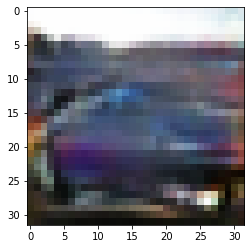

-> Epoch 225, Batch numero 1/78 -> Disc. loss on real images: 0.44240, Disc. loss on fake images: 0.34922, Generator loss: 2.01499
-> Epoch 225, Batch numero 2/78 -> Disc. loss on real images: 0.39134, Disc. loss on fake images: 0.30533, Generator loss: 1.97107
-> Epoch 225, Batch numero 3/78 -> Disc. loss on real images: 0.38652, Disc. loss on fake images: 0.62630, Generator loss: 1.86970
-> Epoch 225, Batch numero 4/78 -> Disc. loss on real images: 0.50510, Disc. loss on fake images: 0.46567, Generator loss: 1.75600
-> Epoch 225, Batch numero 5/78 -> Disc. loss on real images: 0.42614, Disc. loss on fake images: 0.62560, Generator loss: 1.99266
-> Epoch 225, Batch numero 6/78 -> Disc. loss on real images: 0.31484, Disc. loss on fake images: 0.25319, Generator loss: 2.11497
-> Epoch 225, Batch numero 7/78 -> Disc. loss on real images: 0.42922, Disc. loss on fake images: 0.38485, Generator loss: 1.98060
-> Epoch 225, Batch numero 8/78 -> Disc. loss on real images: 0.39782, Disc. loss o

-> Epoch 225, Batch numero 64/78 -> Disc. loss on real images: 0.34473, Disc. loss on fake images: 0.48505, Generator loss: 1.74314
-> Epoch 225, Batch numero 65/78 -> Disc. loss on real images: 0.40174, Disc. loss on fake images: 0.38508, Generator loss: 1.83167
-> Epoch 225, Batch numero 66/78 -> Disc. loss on real images: 0.35886, Disc. loss on fake images: 0.33438, Generator loss: 1.88477
-> Epoch 225, Batch numero 67/78 -> Disc. loss on real images: 0.39575, Disc. loss on fake images: 0.24567, Generator loss: 1.74980
-> Epoch 225, Batch numero 68/78 -> Disc. loss on real images: 0.30754, Disc. loss on fake images: 0.53019, Generator loss: 1.73814
-> Epoch 225, Batch numero 69/78 -> Disc. loss on real images: 0.46454, Disc. loss on fake images: 0.50641, Generator loss: 1.64688
-> Epoch 225, Batch numero 70/78 -> Disc. loss on real images: 0.28757, Disc. loss on fake images: 0.37161, Generator loss: 2.10347
-> Epoch 225, Batch numero 71/78 -> Disc. loss on real images: 0.45688, Disc

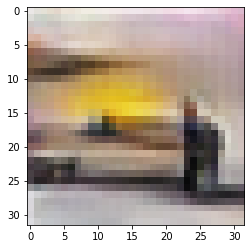

-> Epoch 226, Batch numero 1/78 -> Disc. loss on real images: 0.41572, Disc. loss on fake images: 0.51518, Generator loss: 1.87523
-> Epoch 226, Batch numero 2/78 -> Disc. loss on real images: 0.44520, Disc. loss on fake images: 0.50784, Generator loss: 1.75418
-> Epoch 226, Batch numero 3/78 -> Disc. loss on real images: 0.31437, Disc. loss on fake images: 0.32091, Generator loss: 1.97662
-> Epoch 226, Batch numero 4/78 -> Disc. loss on real images: 0.53175, Disc. loss on fake images: 0.36422, Generator loss: 1.86428
-> Epoch 226, Batch numero 5/78 -> Disc. loss on real images: 0.38836, Disc. loss on fake images: 0.31878, Generator loss: 1.68852
-> Epoch 226, Batch numero 6/78 -> Disc. loss on real images: 0.40631, Disc. loss on fake images: 0.55780, Generator loss: 1.78726
-> Epoch 226, Batch numero 7/78 -> Disc. loss on real images: 0.48300, Disc. loss on fake images: 0.47696, Generator loss: 1.90433
-> Epoch 226, Batch numero 8/78 -> Disc. loss on real images: 0.32726, Disc. loss o

-> Epoch 226, Batch numero 64/78 -> Disc. loss on real images: 0.47512, Disc. loss on fake images: 0.42882, Generator loss: 1.91434
-> Epoch 226, Batch numero 65/78 -> Disc. loss on real images: 0.38140, Disc. loss on fake images: 0.45371, Generator loss: 2.11901
-> Epoch 226, Batch numero 66/78 -> Disc. loss on real images: 0.43086, Disc. loss on fake images: 0.26159, Generator loss: 1.97244
-> Epoch 226, Batch numero 67/78 -> Disc. loss on real images: 0.29568, Disc. loss on fake images: 0.24819, Generator loss: 1.69963
-> Epoch 226, Batch numero 68/78 -> Disc. loss on real images: 0.34148, Disc. loss on fake images: 0.60396, Generator loss: 1.98332
-> Epoch 226, Batch numero 69/78 -> Disc. loss on real images: 0.43380, Disc. loss on fake images: 0.40165, Generator loss: 1.78624
-> Epoch 226, Batch numero 70/78 -> Disc. loss on real images: 0.57515, Disc. loss on fake images: 0.31089, Generator loss: 1.82589
-> Epoch 226, Batch numero 71/78 -> Disc. loss on real images: 0.36316, Disc

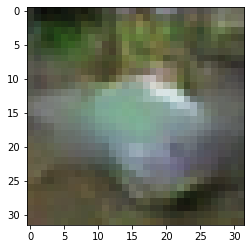

-> Epoch 227, Batch numero 1/78 -> Disc. loss on real images: 0.44452, Disc. loss on fake images: 0.66505, Generator loss: 1.79886
-> Epoch 227, Batch numero 2/78 -> Disc. loss on real images: 0.30836, Disc. loss on fake images: 0.37189, Generator loss: 1.89908
-> Epoch 227, Batch numero 3/78 -> Disc. loss on real images: 0.43821, Disc. loss on fake images: 0.44331, Generator loss: 1.87187
-> Epoch 227, Batch numero 4/78 -> Disc. loss on real images: 0.42215, Disc. loss on fake images: 0.33533, Generator loss: 1.74870
-> Epoch 227, Batch numero 5/78 -> Disc. loss on real images: 0.52698, Disc. loss on fake images: 0.45788, Generator loss: 1.78432
-> Epoch 227, Batch numero 6/78 -> Disc. loss on real images: 0.36598, Disc. loss on fake images: 0.49443, Generator loss: 1.77188
-> Epoch 227, Batch numero 7/78 -> Disc. loss on real images: 0.52639, Disc. loss on fake images: 0.49355, Generator loss: 1.83777
-> Epoch 227, Batch numero 8/78 -> Disc. loss on real images: 0.46252, Disc. loss o

-> Epoch 227, Batch numero 64/78 -> Disc. loss on real images: 0.24937, Disc. loss on fake images: 0.52469, Generator loss: 1.67172
-> Epoch 227, Batch numero 65/78 -> Disc. loss on real images: 0.44685, Disc. loss on fake images: 0.49448, Generator loss: 1.73496
-> Epoch 227, Batch numero 66/78 -> Disc. loss on real images: 0.36736, Disc. loss on fake images: 0.47950, Generator loss: 1.93798
-> Epoch 227, Batch numero 67/78 -> Disc. loss on real images: 0.50462, Disc. loss on fake images: 0.37682, Generator loss: 1.71097
-> Epoch 227, Batch numero 68/78 -> Disc. loss on real images: 0.35454, Disc. loss on fake images: 0.41518, Generator loss: 2.02183
-> Epoch 227, Batch numero 69/78 -> Disc. loss on real images: 0.49893, Disc. loss on fake images: 0.36183, Generator loss: 1.65513
-> Epoch 227, Batch numero 70/78 -> Disc. loss on real images: 0.52790, Disc. loss on fake images: 0.42412, Generator loss: 1.60590
-> Epoch 227, Batch numero 71/78 -> Disc. loss on real images: 0.29337, Disc

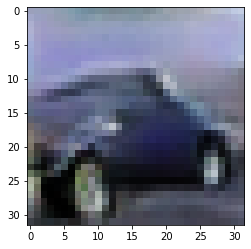

-> Epoch 228, Batch numero 1/78 -> Disc. loss on real images: 0.33145, Disc. loss on fake images: 0.42042, Generator loss: 1.98012
-> Epoch 228, Batch numero 2/78 -> Disc. loss on real images: 0.45692, Disc. loss on fake images: 0.43080, Generator loss: 1.88612
-> Epoch 228, Batch numero 3/78 -> Disc. loss on real images: 0.62960, Disc. loss on fake images: 0.36585, Generator loss: 1.69285
-> Epoch 228, Batch numero 4/78 -> Disc. loss on real images: 0.37148, Disc. loss on fake images: 0.35171, Generator loss: 1.78760
-> Epoch 228, Batch numero 5/78 -> Disc. loss on real images: 0.26855, Disc. loss on fake images: 0.66379, Generator loss: 1.94115
-> Epoch 228, Batch numero 6/78 -> Disc. loss on real images: 0.28759, Disc. loss on fake images: 0.29068, Generator loss: 1.99112
-> Epoch 228, Batch numero 7/78 -> Disc. loss on real images: 0.53936, Disc. loss on fake images: 0.37430, Generator loss: 1.87856
-> Epoch 228, Batch numero 8/78 -> Disc. loss on real images: 0.33128, Disc. loss o

-> Epoch 228, Batch numero 64/78 -> Disc. loss on real images: 0.34545, Disc. loss on fake images: 0.41287, Generator loss: 1.92161
-> Epoch 228, Batch numero 65/78 -> Disc. loss on real images: 0.47947, Disc. loss on fake images: 0.44972, Generator loss: 1.81096
-> Epoch 228, Batch numero 66/78 -> Disc. loss on real images: 0.38667, Disc. loss on fake images: 0.42710, Generator loss: 1.84385
-> Epoch 228, Batch numero 67/78 -> Disc. loss on real images: 0.35617, Disc. loss on fake images: 0.26321, Generator loss: 1.85193
-> Epoch 228, Batch numero 68/78 -> Disc. loss on real images: 0.37063, Disc. loss on fake images: 0.59305, Generator loss: 1.63045
-> Epoch 228, Batch numero 69/78 -> Disc. loss on real images: 0.35715, Disc. loss on fake images: 0.36193, Generator loss: 1.94611
-> Epoch 228, Batch numero 70/78 -> Disc. loss on real images: 0.40087, Disc. loss on fake images: 0.33266, Generator loss: 1.90643
-> Epoch 228, Batch numero 71/78 -> Disc. loss on real images: 0.53944, Disc

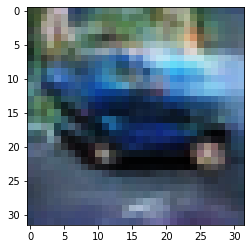

-> Epoch 229, Batch numero 1/78 -> Disc. loss on real images: 0.44003, Disc. loss on fake images: 0.33271, Generator loss: 2.01344
-> Epoch 229, Batch numero 2/78 -> Disc. loss on real images: 0.41664, Disc. loss on fake images: 0.48639, Generator loss: 1.72465
-> Epoch 229, Batch numero 3/78 -> Disc. loss on real images: 0.45353, Disc. loss on fake images: 0.43726, Generator loss: 1.86263
-> Epoch 229, Batch numero 4/78 -> Disc. loss on real images: 0.34452, Disc. loss on fake images: 0.27714, Generator loss: 1.78581
-> Epoch 229, Batch numero 5/78 -> Disc. loss on real images: 0.30762, Disc. loss on fake images: 0.43313, Generator loss: 2.09091
-> Epoch 229, Batch numero 6/78 -> Disc. loss on real images: 0.37300, Disc. loss on fake images: 0.49132, Generator loss: 1.97882
-> Epoch 229, Batch numero 7/78 -> Disc. loss on real images: 0.42243, Disc. loss on fake images: 0.53783, Generator loss: 1.94882
-> Epoch 229, Batch numero 8/78 -> Disc. loss on real images: 0.39724, Disc. loss o

-> Epoch 229, Batch numero 64/78 -> Disc. loss on real images: 0.50015, Disc. loss on fake images: 0.44385, Generator loss: 2.16577
-> Epoch 229, Batch numero 65/78 -> Disc. loss on real images: 0.33031, Disc. loss on fake images: 0.39962, Generator loss: 1.98953
-> Epoch 229, Batch numero 66/78 -> Disc. loss on real images: 0.47685, Disc. loss on fake images: 0.38607, Generator loss: 1.80061
-> Epoch 229, Batch numero 67/78 -> Disc. loss on real images: 0.47160, Disc. loss on fake images: 0.55059, Generator loss: 1.78782
-> Epoch 229, Batch numero 68/78 -> Disc. loss on real images: 0.40404, Disc. loss on fake images: 0.43649, Generator loss: 1.78539
-> Epoch 229, Batch numero 69/78 -> Disc. loss on real images: 0.48377, Disc. loss on fake images: 0.35042, Generator loss: 1.68491
-> Epoch 229, Batch numero 70/78 -> Disc. loss on real images: 0.37212, Disc. loss on fake images: 0.52960, Generator loss: 1.81779
-> Epoch 229, Batch numero 71/78 -> Disc. loss on real images: 0.43263, Disc

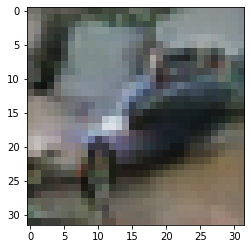

-> Epoch 230, Batch numero 1/78 -> Disc. loss on real images: 0.46445, Disc. loss on fake images: 0.39849, Generator loss: 1.99559
-> Epoch 230, Batch numero 2/78 -> Disc. loss on real images: 0.57649, Disc. loss on fake images: 0.51214, Generator loss: 2.13511
-> Epoch 230, Batch numero 3/78 -> Disc. loss on real images: 0.53576, Disc. loss on fake images: 0.32655, Generator loss: 1.89065
-> Epoch 230, Batch numero 4/78 -> Disc. loss on real images: 0.42975, Disc. loss on fake images: 0.38742, Generator loss: 1.93659
-> Epoch 230, Batch numero 5/78 -> Disc. loss on real images: 0.33977, Disc. loss on fake images: 0.38160, Generator loss: 1.72783
-> Epoch 230, Batch numero 6/78 -> Disc. loss on real images: 0.47728, Disc. loss on fake images: 0.60438, Generator loss: 1.93968
-> Epoch 230, Batch numero 7/78 -> Disc. loss on real images: 0.41656, Disc. loss on fake images: 0.47932, Generator loss: 2.04846
-> Epoch 230, Batch numero 8/78 -> Disc. loss on real images: 0.58271, Disc. loss o

-> Epoch 230, Batch numero 65/78 -> Disc. loss on real images: 0.41289, Disc. loss on fake images: 0.28147, Generator loss: 1.65637
-> Epoch 230, Batch numero 66/78 -> Disc. loss on real images: 0.60392, Disc. loss on fake images: 0.33919, Generator loss: 1.53528
-> Epoch 230, Batch numero 67/78 -> Disc. loss on real images: 0.27878, Disc. loss on fake images: 0.45885, Generator loss: 1.66063
-> Epoch 230, Batch numero 68/78 -> Disc. loss on real images: 0.34876, Disc. loss on fake images: 0.59172, Generator loss: 2.01986
-> Epoch 230, Batch numero 69/78 -> Disc. loss on real images: 0.41584, Disc. loss on fake images: 0.35833, Generator loss: 2.01408
-> Epoch 230, Batch numero 70/78 -> Disc. loss on real images: 0.50102, Disc. loss on fake images: 0.39709, Generator loss: 1.83238
-> Epoch 230, Batch numero 71/78 -> Disc. loss on real images: 0.40639, Disc. loss on fake images: 0.42317, Generator loss: 1.93411
-> Epoch 230, Batch numero 72/78 -> Disc. loss on real images: 0.38357, Disc

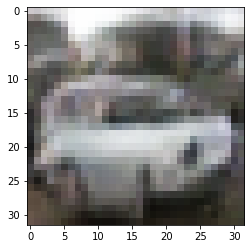

-> Epoch 231, Batch numero 1/78 -> Disc. loss on real images: 0.42397, Disc. loss on fake images: 0.26276, Generator loss: 2.06855
-> Epoch 231, Batch numero 2/78 -> Disc. loss on real images: 0.37263, Disc. loss on fake images: 0.43303, Generator loss: 1.92292
-> Epoch 231, Batch numero 3/78 -> Disc. loss on real images: 0.51153, Disc. loss on fake images: 0.37903, Generator loss: 1.98819
-> Epoch 231, Batch numero 4/78 -> Disc. loss on real images: 0.44512, Disc. loss on fake images: 0.47593, Generator loss: 1.82097
-> Epoch 231, Batch numero 5/78 -> Disc. loss on real images: 0.69804, Disc. loss on fake images: 0.27544, Generator loss: 1.99161
-> Epoch 231, Batch numero 6/78 -> Disc. loss on real images: 0.27563, Disc. loss on fake images: 0.51586, Generator loss: 1.97843
-> Epoch 231, Batch numero 7/78 -> Disc. loss on real images: 0.45473, Disc. loss on fake images: 0.55643, Generator loss: 1.91034
-> Epoch 231, Batch numero 8/78 -> Disc. loss on real images: 0.35404, Disc. loss o

-> Epoch 231, Batch numero 64/78 -> Disc. loss on real images: 0.37212, Disc. loss on fake images: 0.29382, Generator loss: 2.10233
-> Epoch 231, Batch numero 65/78 -> Disc. loss on real images: 0.28590, Disc. loss on fake images: 0.26568, Generator loss: 1.73987
-> Epoch 231, Batch numero 66/78 -> Disc. loss on real images: 0.53984, Disc. loss on fake images: 0.44852, Generator loss: 1.92346
-> Epoch 231, Batch numero 67/78 -> Disc. loss on real images: 0.23959, Disc. loss on fake images: 0.41393, Generator loss: 2.01148
-> Epoch 231, Batch numero 68/78 -> Disc. loss on real images: 0.38954, Disc. loss on fake images: 0.43214, Generator loss: 1.98798
-> Epoch 231, Batch numero 69/78 -> Disc. loss on real images: 0.66248, Disc. loss on fake images: 0.40994, Generator loss: 2.03913
-> Epoch 231, Batch numero 70/78 -> Disc. loss on real images: 0.40688, Disc. loss on fake images: 0.35684, Generator loss: 1.91030
-> Epoch 231, Batch numero 71/78 -> Disc. loss on real images: 0.32341, Disc

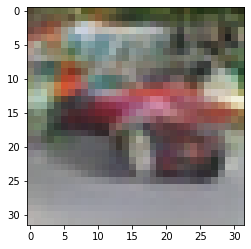

-> Epoch 232, Batch numero 1/78 -> Disc. loss on real images: 0.44831, Disc. loss on fake images: 0.26443, Generator loss: 1.81823
-> Epoch 232, Batch numero 2/78 -> Disc. loss on real images: 0.39386, Disc. loss on fake images: 0.59342, Generator loss: 2.17041
-> Epoch 232, Batch numero 3/78 -> Disc. loss on real images: 0.36198, Disc. loss on fake images: 0.41853, Generator loss: 2.04869
-> Epoch 232, Batch numero 4/78 -> Disc. loss on real images: 0.45833, Disc. loss on fake images: 0.41213, Generator loss: 1.87839
-> Epoch 232, Batch numero 5/78 -> Disc. loss on real images: 0.48831, Disc. loss on fake images: 0.37449, Generator loss: 1.66830
-> Epoch 232, Batch numero 6/78 -> Disc. loss on real images: 0.29886, Disc. loss on fake images: 0.37666, Generator loss: 2.10434
-> Epoch 232, Batch numero 7/78 -> Disc. loss on real images: 0.39097, Disc. loss on fake images: 0.43321, Generator loss: 2.15874
-> Epoch 232, Batch numero 8/78 -> Disc. loss on real images: 0.36367, Disc. loss o

-> Epoch 232, Batch numero 64/78 -> Disc. loss on real images: 0.44304, Disc. loss on fake images: 0.40325, Generator loss: 2.05712
-> Epoch 232, Batch numero 65/78 -> Disc. loss on real images: 0.30098, Disc. loss on fake images: 0.51833, Generator loss: 1.89560
-> Epoch 232, Batch numero 66/78 -> Disc. loss on real images: 0.57359, Disc. loss on fake images: 0.48250, Generator loss: 1.97998
-> Epoch 232, Batch numero 67/78 -> Disc. loss on real images: 0.39159, Disc. loss on fake images: 0.27366, Generator loss: 1.85103
-> Epoch 232, Batch numero 68/78 -> Disc. loss on real images: 0.29304, Disc. loss on fake images: 0.38890, Generator loss: 1.70285
-> Epoch 232, Batch numero 69/78 -> Disc. loss on real images: 0.31498, Disc. loss on fake images: 0.47351, Generator loss: 2.05259
-> Epoch 232, Batch numero 70/78 -> Disc. loss on real images: 0.43131, Disc. loss on fake images: 0.42844, Generator loss: 1.94251
-> Epoch 232, Batch numero 71/78 -> Disc. loss on real images: 0.44193, Disc

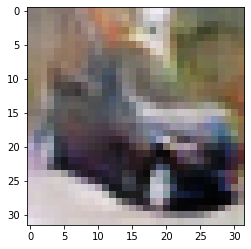

-> Epoch 233, Batch numero 1/78 -> Disc. loss on real images: 0.64965, Disc. loss on fake images: 0.58996, Generator loss: 1.60903
-> Epoch 233, Batch numero 2/78 -> Disc. loss on real images: 0.46792, Disc. loss on fake images: 0.38725, Generator loss: 1.99253
-> Epoch 233, Batch numero 3/78 -> Disc. loss on real images: 0.51407, Disc. loss on fake images: 0.40571, Generator loss: 1.90513
-> Epoch 233, Batch numero 4/78 -> Disc. loss on real images: 0.36008, Disc. loss on fake images: 0.50705, Generator loss: 1.90000
-> Epoch 233, Batch numero 5/78 -> Disc. loss on real images: 0.48563, Disc. loss on fake images: 0.55409, Generator loss: 2.19592
-> Epoch 233, Batch numero 6/78 -> Disc. loss on real images: 0.51147, Disc. loss on fake images: 0.34623, Generator loss: 2.08482
-> Epoch 233, Batch numero 7/78 -> Disc. loss on real images: 0.42694, Disc. loss on fake images: 0.24385, Generator loss: 1.86785
-> Epoch 233, Batch numero 8/78 -> Disc. loss on real images: 0.24709, Disc. loss o

-> Epoch 233, Batch numero 64/78 -> Disc. loss on real images: 0.49406, Disc. loss on fake images: 0.43147, Generator loss: 1.94074
-> Epoch 233, Batch numero 65/78 -> Disc. loss on real images: 0.38762, Disc. loss on fake images: 0.30617, Generator loss: 1.80411
-> Epoch 233, Batch numero 66/78 -> Disc. loss on real images: 0.41992, Disc. loss on fake images: 0.53473, Generator loss: 1.84798
-> Epoch 233, Batch numero 67/78 -> Disc. loss on real images: 0.39592, Disc. loss on fake images: 0.49035, Generator loss: 1.91499
-> Epoch 233, Batch numero 68/78 -> Disc. loss on real images: 0.45506, Disc. loss on fake images: 0.41759, Generator loss: 2.17485
-> Epoch 233, Batch numero 69/78 -> Disc. loss on real images: 0.54744, Disc. loss on fake images: 0.42949, Generator loss: 1.87392
-> Epoch 233, Batch numero 70/78 -> Disc. loss on real images: 0.32806, Disc. loss on fake images: 0.39458, Generator loss: 1.85755
-> Epoch 233, Batch numero 71/78 -> Disc. loss on real images: 0.25269, Disc

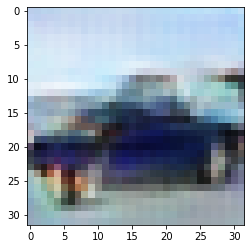

-> Epoch 234, Batch numero 1/78 -> Disc. loss on real images: 0.46791, Disc. loss on fake images: 0.51015, Generator loss: 1.99491
-> Epoch 234, Batch numero 2/78 -> Disc. loss on real images: 0.38824, Disc. loss on fake images: 0.36328, Generator loss: 1.94508
-> Epoch 234, Batch numero 3/78 -> Disc. loss on real images: 0.55900, Disc. loss on fake images: 0.30012, Generator loss: 1.69751
-> Epoch 234, Batch numero 4/78 -> Disc. loss on real images: 0.36265, Disc. loss on fake images: 0.46489, Generator loss: 1.71945
-> Epoch 234, Batch numero 5/78 -> Disc. loss on real images: 0.33930, Disc. loss on fake images: 0.50329, Generator loss: 2.01006
-> Epoch 234, Batch numero 6/78 -> Disc. loss on real images: 0.58695, Disc. loss on fake images: 0.28014, Generator loss: 1.81100
-> Epoch 234, Batch numero 7/78 -> Disc. loss on real images: 0.38029, Disc. loss on fake images: 0.65214, Generator loss: 1.79597
-> Epoch 234, Batch numero 8/78 -> Disc. loss on real images: 0.32497, Disc. loss o

-> Epoch 234, Batch numero 64/78 -> Disc. loss on real images: 0.47380, Disc. loss on fake images: 0.36028, Generator loss: 1.86093
-> Epoch 234, Batch numero 65/78 -> Disc. loss on real images: 0.27287, Disc. loss on fake images: 0.51826, Generator loss: 2.06598
-> Epoch 234, Batch numero 66/78 -> Disc. loss on real images: 0.38084, Disc. loss on fake images: 0.29847, Generator loss: 2.02425
-> Epoch 234, Batch numero 67/78 -> Disc. loss on real images: 0.47140, Disc. loss on fake images: 0.29854, Generator loss: 2.11170
-> Epoch 234, Batch numero 68/78 -> Disc. loss on real images: 0.37056, Disc. loss on fake images: 0.55409, Generator loss: 1.92223
-> Epoch 234, Batch numero 69/78 -> Disc. loss on real images: 0.44351, Disc. loss on fake images: 0.42123, Generator loss: 1.98558
-> Epoch 234, Batch numero 70/78 -> Disc. loss on real images: 0.61469, Disc. loss on fake images: 0.30206, Generator loss: 1.81045
-> Epoch 234, Batch numero 71/78 -> Disc. loss on real images: 0.45600, Disc

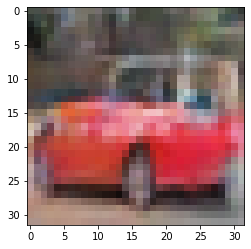

-> Epoch 235, Batch numero 1/78 -> Disc. loss on real images: 0.24923, Disc. loss on fake images: 0.33954, Generator loss: 1.78581
-> Epoch 235, Batch numero 2/78 -> Disc. loss on real images: 0.38277, Disc. loss on fake images: 0.65285, Generator loss: 2.25628
-> Epoch 235, Batch numero 3/78 -> Disc. loss on real images: 0.48738, Disc. loss on fake images: 0.30600, Generator loss: 1.91616
-> Epoch 235, Batch numero 4/78 -> Disc. loss on real images: 0.47569, Disc. loss on fake images: 0.26986, Generator loss: 2.01152
-> Epoch 235, Batch numero 5/78 -> Disc. loss on real images: 0.35085, Disc. loss on fake images: 0.44357, Generator loss: 1.85521
-> Epoch 235, Batch numero 6/78 -> Disc. loss on real images: 0.35547, Disc. loss on fake images: 0.44440, Generator loss: 1.90156
-> Epoch 235, Batch numero 7/78 -> Disc. loss on real images: 0.42012, Disc. loss on fake images: 0.25596, Generator loss: 1.79764
-> Epoch 235, Batch numero 8/78 -> Disc. loss on real images: 0.28272, Disc. loss o

-> Epoch 235, Batch numero 65/78 -> Disc. loss on real images: 0.55644, Disc. loss on fake images: 0.33703, Generator loss: 1.81218
-> Epoch 235, Batch numero 66/78 -> Disc. loss on real images: 0.42599, Disc. loss on fake images: 0.57803, Generator loss: 2.32594
-> Epoch 235, Batch numero 67/78 -> Disc. loss on real images: 0.43583, Disc. loss on fake images: 0.22462, Generator loss: 2.04123
-> Epoch 235, Batch numero 68/78 -> Disc. loss on real images: 0.38257, Disc. loss on fake images: 0.30546, Generator loss: 1.79604
-> Epoch 235, Batch numero 69/78 -> Disc. loss on real images: 0.33057, Disc. loss on fake images: 0.41279, Generator loss: 2.01737
-> Epoch 235, Batch numero 70/78 -> Disc. loss on real images: 0.36041, Disc. loss on fake images: 0.31411, Generator loss: 1.84737
-> Epoch 235, Batch numero 71/78 -> Disc. loss on real images: 0.29937, Disc. loss on fake images: 0.23971, Generator loss: 2.03395
-> Epoch 235, Batch numero 72/78 -> Disc. loss on real images: 0.21254, Disc

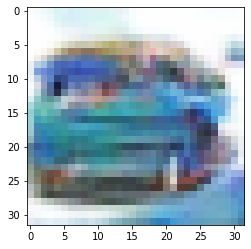

-> Epoch 236, Batch numero 1/78 -> Disc. loss on real images: 0.42278, Disc. loss on fake images: 0.58934, Generator loss: 1.87768
-> Epoch 236, Batch numero 2/78 -> Disc. loss on real images: 0.40756, Disc. loss on fake images: 0.32439, Generator loss: 2.00493
-> Epoch 236, Batch numero 3/78 -> Disc. loss on real images: 0.29555, Disc. loss on fake images: 0.37733, Generator loss: 1.91494
-> Epoch 236, Batch numero 4/78 -> Disc. loss on real images: 0.41095, Disc. loss on fake images: 0.42730, Generator loss: 2.07461
-> Epoch 236, Batch numero 5/78 -> Disc. loss on real images: 0.56216, Disc. loss on fake images: 0.45068, Generator loss: 2.03654
-> Epoch 236, Batch numero 6/78 -> Disc. loss on real images: 0.34117, Disc. loss on fake images: 0.39555, Generator loss: 1.89023
-> Epoch 236, Batch numero 7/78 -> Disc. loss on real images: 0.40153, Disc. loss on fake images: 0.36177, Generator loss: 2.09625
-> Epoch 236, Batch numero 8/78 -> Disc. loss on real images: 0.49654, Disc. loss o

-> Epoch 236, Batch numero 64/78 -> Disc. loss on real images: 0.55774, Disc. loss on fake images: 0.26395, Generator loss: 2.06426
-> Epoch 236, Batch numero 65/78 -> Disc. loss on real images: 0.63157, Disc. loss on fake images: 0.33131, Generator loss: 2.13646
-> Epoch 236, Batch numero 66/78 -> Disc. loss on real images: 0.62127, Disc. loss on fake images: 0.53420, Generator loss: 2.15984
-> Epoch 236, Batch numero 67/78 -> Disc. loss on real images: 0.43736, Disc. loss on fake images: 0.34936, Generator loss: 1.93463
-> Epoch 236, Batch numero 68/78 -> Disc. loss on real images: 0.39317, Disc. loss on fake images: 0.38986, Generator loss: 2.15880
-> Epoch 236, Batch numero 69/78 -> Disc. loss on real images: 0.34068, Disc. loss on fake images: 0.57597, Generator loss: 1.94891
-> Epoch 236, Batch numero 70/78 -> Disc. loss on real images: 0.44628, Disc. loss on fake images: 0.36500, Generator loss: 2.24653
-> Epoch 236, Batch numero 71/78 -> Disc. loss on real images: 0.47668, Disc

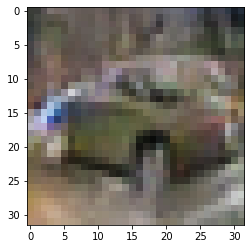

-> Epoch 237, Batch numero 1/78 -> Disc. loss on real images: 0.53621, Disc. loss on fake images: 0.24912, Generator loss: 2.03211
-> Epoch 237, Batch numero 2/78 -> Disc. loss on real images: 0.34056, Disc. loss on fake images: 0.39511, Generator loss: 1.86251
-> Epoch 237, Batch numero 3/78 -> Disc. loss on real images: 0.48876, Disc. loss on fake images: 0.29684, Generator loss: 1.73199
-> Epoch 237, Batch numero 4/78 -> Disc. loss on real images: 0.48758, Disc. loss on fake images: 0.42037, Generator loss: 1.82839
-> Epoch 237, Batch numero 5/78 -> Disc. loss on real images: 0.15608, Disc. loss on fake images: 0.18133, Generator loss: 1.90117
-> Epoch 237, Batch numero 6/78 -> Disc. loss on real images: 0.34939, Disc. loss on fake images: 0.49057, Generator loss: 1.86281
-> Epoch 237, Batch numero 7/78 -> Disc. loss on real images: 0.33052, Disc. loss on fake images: 0.56013, Generator loss: 1.96883
-> Epoch 237, Batch numero 8/78 -> Disc. loss on real images: 0.49967, Disc. loss o

-> Epoch 237, Batch numero 64/78 -> Disc. loss on real images: 0.42562, Disc. loss on fake images: 0.53285, Generator loss: 2.15121
-> Epoch 237, Batch numero 65/78 -> Disc. loss on real images: 0.39080, Disc. loss on fake images: 0.37694, Generator loss: 2.11758
-> Epoch 237, Batch numero 66/78 -> Disc. loss on real images: 0.46394, Disc. loss on fake images: 0.50308, Generator loss: 2.01230
-> Epoch 237, Batch numero 67/78 -> Disc. loss on real images: 0.33565, Disc. loss on fake images: 0.37914, Generator loss: 2.10917
-> Epoch 237, Batch numero 68/78 -> Disc. loss on real images: 0.62673, Disc. loss on fake images: 0.46683, Generator loss: 2.01064
-> Epoch 237, Batch numero 69/78 -> Disc. loss on real images: 0.57194, Disc. loss on fake images: 0.53397, Generator loss: 2.08390
-> Epoch 237, Batch numero 70/78 -> Disc. loss on real images: 0.43668, Disc. loss on fake images: 0.37183, Generator loss: 1.77808
-> Epoch 237, Batch numero 71/78 -> Disc. loss on real images: 0.33460, Disc

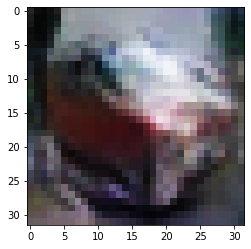

-> Epoch 238, Batch numero 1/78 -> Disc. loss on real images: 0.30141, Disc. loss on fake images: 0.38132, Generator loss: 2.36670
-> Epoch 238, Batch numero 2/78 -> Disc. loss on real images: 0.53841, Disc. loss on fake images: 0.34692, Generator loss: 1.97706
-> Epoch 238, Batch numero 3/78 -> Disc. loss on real images: 0.46577, Disc. loss on fake images: 0.60758, Generator loss: 2.18231
-> Epoch 238, Batch numero 4/78 -> Disc. loss on real images: 0.56827, Disc. loss on fake images: 0.32190, Generator loss: 1.71641
-> Epoch 238, Batch numero 5/78 -> Disc. loss on real images: 0.37706, Disc. loss on fake images: 0.40584, Generator loss: 1.74058
-> Epoch 238, Batch numero 6/78 -> Disc. loss on real images: 0.31905, Disc. loss on fake images: 0.54411, Generator loss: 1.86862
-> Epoch 238, Batch numero 7/78 -> Disc. loss on real images: 0.36719, Disc. loss on fake images: 0.31365, Generator loss: 1.99145
-> Epoch 238, Batch numero 8/78 -> Disc. loss on real images: 0.49008, Disc. loss o

-> Epoch 238, Batch numero 64/78 -> Disc. loss on real images: 0.35381, Disc. loss on fake images: 0.29898, Generator loss: 1.83647
-> Epoch 238, Batch numero 65/78 -> Disc. loss on real images: 0.42008, Disc. loss on fake images: 0.55048, Generator loss: 1.90640
-> Epoch 238, Batch numero 66/78 -> Disc. loss on real images: 0.53760, Disc. loss on fake images: 0.53750, Generator loss: 2.14032
-> Epoch 238, Batch numero 67/78 -> Disc. loss on real images: 0.47693, Disc. loss on fake images: 0.41127, Generator loss: 1.90463
-> Epoch 238, Batch numero 68/78 -> Disc. loss on real images: 0.32300, Disc. loss on fake images: 0.23573, Generator loss: 2.01141
-> Epoch 238, Batch numero 69/78 -> Disc. loss on real images: 0.44120, Disc. loss on fake images: 0.40417, Generator loss: 1.75275
-> Epoch 238, Batch numero 70/78 -> Disc. loss on real images: 0.34893, Disc. loss on fake images: 0.27629, Generator loss: 1.93947
-> Epoch 238, Batch numero 71/78 -> Disc. loss on real images: 0.31506, Disc

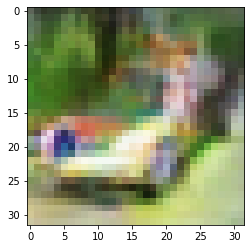

-> Epoch 239, Batch numero 1/78 -> Disc. loss on real images: 0.33304, Disc. loss on fake images: 0.47939, Generator loss: 1.74858
-> Epoch 239, Batch numero 2/78 -> Disc. loss on real images: 0.21854, Disc. loss on fake images: 0.33664, Generator loss: 2.34783
-> Epoch 239, Batch numero 3/78 -> Disc. loss on real images: 0.43754, Disc. loss on fake images: 0.22586, Generator loss: 1.93847
-> Epoch 239, Batch numero 4/78 -> Disc. loss on real images: 0.39023, Disc. loss on fake images: 0.37549, Generator loss: 2.09712
-> Epoch 239, Batch numero 5/78 -> Disc. loss on real images: 0.44198, Disc. loss on fake images: 0.40140, Generator loss: 1.77548
-> Epoch 239, Batch numero 6/78 -> Disc. loss on real images: 0.43113, Disc. loss on fake images: 0.48640, Generator loss: 1.90019
-> Epoch 239, Batch numero 7/78 -> Disc. loss on real images: 0.25985, Disc. loss on fake images: 0.21786, Generator loss: 2.23033
-> Epoch 239, Batch numero 8/78 -> Disc. loss on real images: 0.41555, Disc. loss o

-> Epoch 239, Batch numero 64/78 -> Disc. loss on real images: 0.50805, Disc. loss on fake images: 0.44395, Generator loss: 2.08652
-> Epoch 239, Batch numero 65/78 -> Disc. loss on real images: 0.40357, Disc. loss on fake images: 0.25478, Generator loss: 1.73230
-> Epoch 239, Batch numero 66/78 -> Disc. loss on real images: 0.36550, Disc. loss on fake images: 0.54331, Generator loss: 2.15311
-> Epoch 239, Batch numero 67/78 -> Disc. loss on real images: 0.37953, Disc. loss on fake images: 0.33648, Generator loss: 2.02745
-> Epoch 239, Batch numero 68/78 -> Disc. loss on real images: 0.40318, Disc. loss on fake images: 0.35706, Generator loss: 2.08777
-> Epoch 239, Batch numero 69/78 -> Disc. loss on real images: 0.33238, Disc. loss on fake images: 0.39191, Generator loss: 2.01539
-> Epoch 239, Batch numero 70/78 -> Disc. loss on real images: 0.29208, Disc. loss on fake images: 0.38853, Generator loss: 2.18937
-> Epoch 239, Batch numero 71/78 -> Disc. loss on real images: 0.46417, Disc

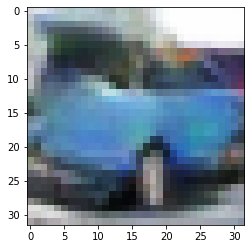

-> Epoch 240, Batch numero 1/78 -> Disc. loss on real images: 0.30018, Disc. loss on fake images: 0.43163, Generator loss: 2.10826
-> Epoch 240, Batch numero 2/78 -> Disc. loss on real images: 0.38534, Disc. loss on fake images: 0.30801, Generator loss: 2.25101
-> Epoch 240, Batch numero 3/78 -> Disc. loss on real images: 0.29075, Disc. loss on fake images: 0.27294, Generator loss: 2.22649
-> Epoch 240, Batch numero 4/78 -> Disc. loss on real images: 0.41653, Disc. loss on fake images: 0.27298, Generator loss: 2.13191
-> Epoch 240, Batch numero 5/78 -> Disc. loss on real images: 0.35529, Disc. loss on fake images: 0.41152, Generator loss: 1.96298
-> Epoch 240, Batch numero 6/78 -> Disc. loss on real images: 0.30443, Disc. loss on fake images: 0.31058, Generator loss: 1.99129
-> Epoch 240, Batch numero 7/78 -> Disc. loss on real images: 0.65036, Disc. loss on fake images: 0.40556, Generator loss: 1.95339
-> Epoch 240, Batch numero 8/78 -> Disc. loss on real images: 0.39168, Disc. loss o

-> Epoch 240, Batch numero 64/78 -> Disc. loss on real images: 0.48315, Disc. loss on fake images: 0.27186, Generator loss: 2.08254
-> Epoch 240, Batch numero 65/78 -> Disc. loss on real images: 0.36498, Disc. loss on fake images: 0.48552, Generator loss: 2.02784
-> Epoch 240, Batch numero 66/78 -> Disc. loss on real images: 0.36532, Disc. loss on fake images: 0.34429, Generator loss: 2.19650
-> Epoch 240, Batch numero 67/78 -> Disc. loss on real images: 0.32584, Disc. loss on fake images: 0.38236, Generator loss: 2.11108
-> Epoch 240, Batch numero 68/78 -> Disc. loss on real images: 0.31480, Disc. loss on fake images: 0.37056, Generator loss: 1.95268
-> Epoch 240, Batch numero 69/78 -> Disc. loss on real images: 0.51588, Disc. loss on fake images: 0.24551, Generator loss: 1.95800
-> Epoch 240, Batch numero 70/78 -> Disc. loss on real images: 0.53822, Disc. loss on fake images: 0.66533, Generator loss: 1.95155
-> Epoch 240, Batch numero 71/78 -> Disc. loss on real images: 0.44328, Disc

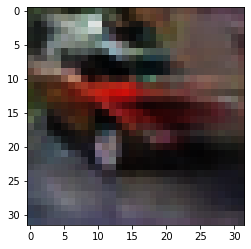

-> Epoch 241, Batch numero 1/78 -> Disc. loss on real images: 0.56365, Disc. loss on fake images: 0.47547, Generator loss: 1.98241
-> Epoch 241, Batch numero 2/78 -> Disc. loss on real images: 0.38501, Disc. loss on fake images: 0.53856, Generator loss: 2.05328
-> Epoch 241, Batch numero 3/78 -> Disc. loss on real images: 0.37266, Disc. loss on fake images: 0.56169, Generator loss: 2.26159
-> Epoch 241, Batch numero 4/78 -> Disc. loss on real images: 0.59221, Disc. loss on fake images: 0.31704, Generator loss: 2.07686
-> Epoch 241, Batch numero 5/78 -> Disc. loss on real images: 0.43504, Disc. loss on fake images: 0.45308, Generator loss: 1.96071
-> Epoch 241, Batch numero 6/78 -> Disc. loss on real images: 0.25370, Disc. loss on fake images: 0.35850, Generator loss: 1.90800
-> Epoch 241, Batch numero 7/78 -> Disc. loss on real images: 0.44363, Disc. loss on fake images: 0.43260, Generator loss: 2.01867
-> Epoch 241, Batch numero 8/78 -> Disc. loss on real images: 0.33066, Disc. loss o

-> Epoch 241, Batch numero 64/78 -> Disc. loss on real images: 0.44054, Disc. loss on fake images: 0.35917, Generator loss: 2.05635
-> Epoch 241, Batch numero 65/78 -> Disc. loss on real images: 0.33803, Disc. loss on fake images: 0.56072, Generator loss: 2.06360
-> Epoch 241, Batch numero 66/78 -> Disc. loss on real images: 0.49211, Disc. loss on fake images: 0.33213, Generator loss: 1.68699
-> Epoch 241, Batch numero 67/78 -> Disc. loss on real images: 0.33125, Disc. loss on fake images: 0.52367, Generator loss: 1.92410
-> Epoch 241, Batch numero 68/78 -> Disc. loss on real images: 0.43692, Disc. loss on fake images: 0.33901, Generator loss: 1.93752
-> Epoch 241, Batch numero 69/78 -> Disc. loss on real images: 0.48898, Disc. loss on fake images: 0.50719, Generator loss: 1.94621
-> Epoch 241, Batch numero 70/78 -> Disc. loss on real images: 0.45119, Disc. loss on fake images: 0.44562, Generator loss: 2.09056
-> Epoch 241, Batch numero 71/78 -> Disc. loss on real images: 0.51332, Disc

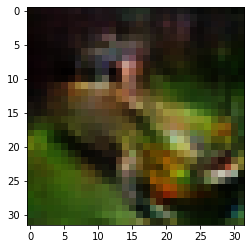

-> Epoch 242, Batch numero 1/78 -> Disc. loss on real images: 0.31191, Disc. loss on fake images: 0.24703, Generator loss: 2.36921
-> Epoch 242, Batch numero 2/78 -> Disc. loss on real images: 0.30737, Disc. loss on fake images: 0.35605, Generator loss: 1.99986
-> Epoch 242, Batch numero 3/78 -> Disc. loss on real images: 0.29123, Disc. loss on fake images: 0.22370, Generator loss: 2.16153
-> Epoch 242, Batch numero 4/78 -> Disc. loss on real images: 0.33597, Disc. loss on fake images: 0.40541, Generator loss: 2.05424
-> Epoch 242, Batch numero 5/78 -> Disc. loss on real images: 0.28571, Disc. loss on fake images: 0.38060, Generator loss: 2.21260
-> Epoch 242, Batch numero 6/78 -> Disc. loss on real images: 0.34707, Disc. loss on fake images: 0.39312, Generator loss: 2.11031
-> Epoch 242, Batch numero 7/78 -> Disc. loss on real images: 0.56055, Disc. loss on fake images: 0.41659, Generator loss: 2.02475
-> Epoch 242, Batch numero 8/78 -> Disc. loss on real images: 0.28124, Disc. loss o

-> Epoch 242, Batch numero 64/78 -> Disc. loss on real images: 0.39665, Disc. loss on fake images: 0.30124, Generator loss: 1.94304
-> Epoch 242, Batch numero 65/78 -> Disc. loss on real images: 0.45116, Disc. loss on fake images: 0.28383, Generator loss: 1.71181
-> Epoch 242, Batch numero 66/78 -> Disc. loss on real images: 0.35855, Disc. loss on fake images: 0.41684, Generator loss: 1.65345
-> Epoch 242, Batch numero 67/78 -> Disc. loss on real images: 0.23104, Disc. loss on fake images: 0.60467, Generator loss: 2.12161
-> Epoch 242, Batch numero 68/78 -> Disc. loss on real images: 0.42026, Disc. loss on fake images: 0.30716, Generator loss: 1.85410
-> Epoch 242, Batch numero 69/78 -> Disc. loss on real images: 0.43062, Disc. loss on fake images: 0.27267, Generator loss: 2.14119
-> Epoch 242, Batch numero 70/78 -> Disc. loss on real images: 0.34362, Disc. loss on fake images: 0.37131, Generator loss: 1.81207
-> Epoch 242, Batch numero 71/78 -> Disc. loss on real images: 0.33687, Disc

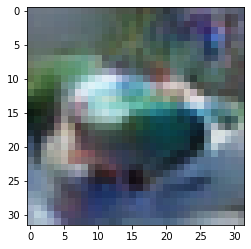

-> Epoch 243, Batch numero 1/78 -> Disc. loss on real images: 0.38825, Disc. loss on fake images: 0.60845, Generator loss: 1.92503
-> Epoch 243, Batch numero 2/78 -> Disc. loss on real images: 0.38948, Disc. loss on fake images: 0.38792, Generator loss: 2.38337
-> Epoch 243, Batch numero 3/78 -> Disc. loss on real images: 0.36806, Disc. loss on fake images: 0.37051, Generator loss: 2.16787
-> Epoch 243, Batch numero 4/78 -> Disc. loss on real images: 0.40904, Disc. loss on fake images: 0.37882, Generator loss: 2.20353
-> Epoch 243, Batch numero 5/78 -> Disc. loss on real images: 0.40795, Disc. loss on fake images: 0.57144, Generator loss: 2.03726
-> Epoch 243, Batch numero 6/78 -> Disc. loss on real images: 0.22499, Disc. loss on fake images: 0.46478, Generator loss: 2.57781
-> Epoch 243, Batch numero 7/78 -> Disc. loss on real images: 0.51950, Disc. loss on fake images: 0.32770, Generator loss: 2.18989
-> Epoch 243, Batch numero 8/78 -> Disc. loss on real images: 0.35397, Disc. loss o

-> Epoch 243, Batch numero 64/78 -> Disc. loss on real images: 0.26836, Disc. loss on fake images: 0.35851, Generator loss: 2.09942
-> Epoch 243, Batch numero 65/78 -> Disc. loss on real images: 0.33759, Disc. loss on fake images: 0.26733, Generator loss: 2.11723
-> Epoch 243, Batch numero 66/78 -> Disc. loss on real images: 0.47179, Disc. loss on fake images: 0.26719, Generator loss: 2.16472
-> Epoch 243, Batch numero 67/78 -> Disc. loss on real images: 0.42458, Disc. loss on fake images: 0.37988, Generator loss: 1.77581
-> Epoch 243, Batch numero 68/78 -> Disc. loss on real images: 0.16711, Disc. loss on fake images: 0.43286, Generator loss: 1.88606
-> Epoch 243, Batch numero 69/78 -> Disc. loss on real images: 0.43869, Disc. loss on fake images: 0.47426, Generator loss: 1.94490
-> Epoch 243, Batch numero 70/78 -> Disc. loss on real images: 0.34996, Disc. loss on fake images: 0.39206, Generator loss: 1.91635
-> Epoch 243, Batch numero 71/78 -> Disc. loss on real images: 0.34341, Disc

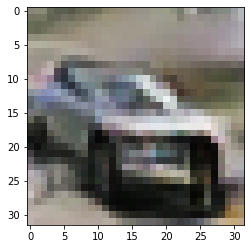

-> Epoch 244, Batch numero 1/78 -> Disc. loss on real images: 0.46093, Disc. loss on fake images: 0.40725, Generator loss: 1.98515
-> Epoch 244, Batch numero 2/78 -> Disc. loss on real images: 0.39354, Disc. loss on fake images: 0.26153, Generator loss: 1.83610
-> Epoch 244, Batch numero 3/78 -> Disc. loss on real images: 0.32947, Disc. loss on fake images: 0.30252, Generator loss: 1.95557
-> Epoch 244, Batch numero 4/78 -> Disc. loss on real images: 0.38354, Disc. loss on fake images: 0.55531, Generator loss: 1.87999
-> Epoch 244, Batch numero 5/78 -> Disc. loss on real images: 0.38032, Disc. loss on fake images: 0.40159, Generator loss: 2.11413
-> Epoch 244, Batch numero 6/78 -> Disc. loss on real images: 0.42442, Disc. loss on fake images: 0.31924, Generator loss: 2.01170
-> Epoch 244, Batch numero 7/78 -> Disc. loss on real images: 0.34319, Disc. loss on fake images: 0.46763, Generator loss: 1.92103
-> Epoch 244, Batch numero 8/78 -> Disc. loss on real images: 0.50354, Disc. loss o

-> Epoch 244, Batch numero 64/78 -> Disc. loss on real images: 0.38678, Disc. loss on fake images: 0.26833, Generator loss: 2.07444
-> Epoch 244, Batch numero 65/78 -> Disc. loss on real images: 0.38486, Disc. loss on fake images: 0.37921, Generator loss: 1.87962
-> Epoch 244, Batch numero 66/78 -> Disc. loss on real images: 0.38392, Disc. loss on fake images: 0.36990, Generator loss: 2.03990
-> Epoch 244, Batch numero 67/78 -> Disc. loss on real images: 0.25690, Disc. loss on fake images: 0.53146, Generator loss: 2.31414
-> Epoch 244, Batch numero 68/78 -> Disc. loss on real images: 0.52446, Disc. loss on fake images: 0.26305, Generator loss: 1.89238
-> Epoch 244, Batch numero 69/78 -> Disc. loss on real images: 0.33954, Disc. loss on fake images: 0.33549, Generator loss: 1.86537
-> Epoch 244, Batch numero 70/78 -> Disc. loss on real images: 0.42840, Disc. loss on fake images: 0.33362, Generator loss: 2.10283
-> Epoch 244, Batch numero 71/78 -> Disc. loss on real images: 0.37175, Disc

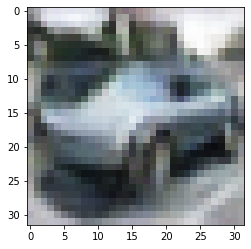

-> Epoch 245, Batch numero 1/78 -> Disc. loss on real images: 0.49930, Disc. loss on fake images: 0.44641, Generator loss: 2.26276
-> Epoch 245, Batch numero 2/78 -> Disc. loss on real images: 0.31907, Disc. loss on fake images: 0.51001, Generator loss: 2.33297
-> Epoch 245, Batch numero 3/78 -> Disc. loss on real images: 0.35929, Disc. loss on fake images: 0.49091, Generator loss: 2.42168
-> Epoch 245, Batch numero 4/78 -> Disc. loss on real images: 0.64206, Disc. loss on fake images: 0.18521, Generator loss: 2.18939
-> Epoch 245, Batch numero 5/78 -> Disc. loss on real images: 0.60517, Disc. loss on fake images: 0.33568, Generator loss: 1.78316
-> Epoch 245, Batch numero 6/78 -> Disc. loss on real images: 0.32953, Disc. loss on fake images: 0.64739, Generator loss: 2.10612
-> Epoch 245, Batch numero 7/78 -> Disc. loss on real images: 0.29343, Disc. loss on fake images: 0.64856, Generator loss: 2.08990
-> Epoch 245, Batch numero 8/78 -> Disc. loss on real images: 0.47878, Disc. loss o

-> Epoch 245, Batch numero 64/78 -> Disc. loss on real images: 0.34313, Disc. loss on fake images: 0.42665, Generator loss: 2.33400
-> Epoch 245, Batch numero 65/78 -> Disc. loss on real images: 0.40647, Disc. loss on fake images: 0.39730, Generator loss: 2.18995
-> Epoch 245, Batch numero 66/78 -> Disc. loss on real images: 0.42988, Disc. loss on fake images: 0.30445, Generator loss: 2.29342
-> Epoch 245, Batch numero 67/78 -> Disc. loss on real images: 0.21963, Disc. loss on fake images: 0.40358, Generator loss: 2.23274
-> Epoch 245, Batch numero 68/78 -> Disc. loss on real images: 0.38352, Disc. loss on fake images: 0.38222, Generator loss: 2.28985
-> Epoch 245, Batch numero 69/78 -> Disc. loss on real images: 0.56655, Disc. loss on fake images: 0.38181, Generator loss: 2.06303
-> Epoch 245, Batch numero 70/78 -> Disc. loss on real images: 0.36165, Disc. loss on fake images: 0.44000, Generator loss: 2.17675
-> Epoch 245, Batch numero 71/78 -> Disc. loss on real images: 0.64534, Disc

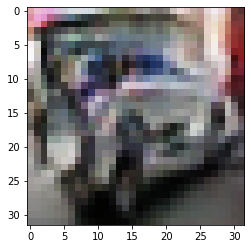

-> Epoch 246, Batch numero 1/78 -> Disc. loss on real images: 0.34119, Disc. loss on fake images: 0.36568, Generator loss: 1.77523
-> Epoch 246, Batch numero 2/78 -> Disc. loss on real images: 0.34341, Disc. loss on fake images: 0.37599, Generator loss: 2.09143
-> Epoch 246, Batch numero 3/78 -> Disc. loss on real images: 0.27957, Disc. loss on fake images: 0.33585, Generator loss: 1.98554
-> Epoch 246, Batch numero 4/78 -> Disc. loss on real images: 0.33213, Disc. loss on fake images: 0.45673, Generator loss: 2.07665
-> Epoch 246, Batch numero 5/78 -> Disc. loss on real images: 0.39261, Disc. loss on fake images: 0.28294, Generator loss: 2.18611
-> Epoch 246, Batch numero 6/78 -> Disc. loss on real images: 0.42512, Disc. loss on fake images: 0.31747, Generator loss: 1.87691
-> Epoch 246, Batch numero 7/78 -> Disc. loss on real images: 0.31555, Disc. loss on fake images: 0.50405, Generator loss: 2.32801
-> Epoch 246, Batch numero 8/78 -> Disc. loss on real images: 0.38516, Disc. loss o

-> Epoch 246, Batch numero 64/78 -> Disc. loss on real images: 0.46426, Disc. loss on fake images: 0.58996, Generator loss: 1.98015
-> Epoch 246, Batch numero 65/78 -> Disc. loss on real images: 0.43931, Disc. loss on fake images: 0.26200, Generator loss: 2.08525
-> Epoch 246, Batch numero 66/78 -> Disc. loss on real images: 0.47663, Disc. loss on fake images: 0.42804, Generator loss: 2.18735
-> Epoch 246, Batch numero 67/78 -> Disc. loss on real images: 0.32661, Disc. loss on fake images: 0.23662, Generator loss: 1.94435
-> Epoch 246, Batch numero 68/78 -> Disc. loss on real images: 0.33437, Disc. loss on fake images: 0.35019, Generator loss: 2.09569
-> Epoch 246, Batch numero 69/78 -> Disc. loss on real images: 0.36560, Disc. loss on fake images: 0.31049, Generator loss: 2.01451
-> Epoch 246, Batch numero 70/78 -> Disc. loss on real images: 0.36760, Disc. loss on fake images: 0.50958, Generator loss: 1.84486
-> Epoch 246, Batch numero 71/78 -> Disc. loss on real images: 0.32910, Disc

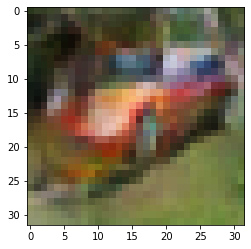

-> Epoch 247, Batch numero 1/78 -> Disc. loss on real images: 0.33231, Disc. loss on fake images: 0.33531, Generator loss: 2.00504
-> Epoch 247, Batch numero 2/78 -> Disc. loss on real images: 0.46082, Disc. loss on fake images: 0.43713, Generator loss: 2.06486
-> Epoch 247, Batch numero 3/78 -> Disc. loss on real images: 0.34849, Disc. loss on fake images: 0.36133, Generator loss: 2.00993
-> Epoch 247, Batch numero 4/78 -> Disc. loss on real images: 0.43545, Disc. loss on fake images: 0.43662, Generator loss: 2.06755
-> Epoch 247, Batch numero 5/78 -> Disc. loss on real images: 0.46152, Disc. loss on fake images: 0.40998, Generator loss: 2.04431
-> Epoch 247, Batch numero 6/78 -> Disc. loss on real images: 0.49603, Disc. loss on fake images: 0.32019, Generator loss: 1.70362
-> Epoch 247, Batch numero 7/78 -> Disc. loss on real images: 0.35525, Disc. loss on fake images: 0.56002, Generator loss: 1.85441
-> Epoch 247, Batch numero 8/78 -> Disc. loss on real images: 0.36309, Disc. loss o

-> Epoch 247, Batch numero 64/78 -> Disc. loss on real images: 0.24218, Disc. loss on fake images: 0.49637, Generator loss: 1.73941
-> Epoch 247, Batch numero 65/78 -> Disc. loss on real images: 0.48191, Disc. loss on fake images: 0.43548, Generator loss: 2.17980
-> Epoch 247, Batch numero 66/78 -> Disc. loss on real images: 0.26337, Disc. loss on fake images: 0.41015, Generator loss: 2.13243
-> Epoch 247, Batch numero 67/78 -> Disc. loss on real images: 0.37857, Disc. loss on fake images: 0.35802, Generator loss: 1.89521
-> Epoch 247, Batch numero 68/78 -> Disc. loss on real images: 0.20449, Disc. loss on fake images: 0.30542, Generator loss: 2.15845
-> Epoch 247, Batch numero 69/78 -> Disc. loss on real images: 0.24087, Disc. loss on fake images: 0.22770, Generator loss: 2.30309
-> Epoch 247, Batch numero 70/78 -> Disc. loss on real images: 0.63130, Disc. loss on fake images: 0.36599, Generator loss: 2.30026
-> Epoch 247, Batch numero 71/78 -> Disc. loss on real images: 0.40535, Disc

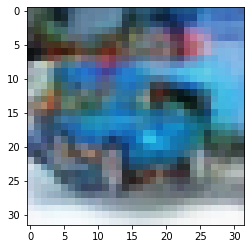

-> Epoch 248, Batch numero 1/78 -> Disc. loss on real images: 0.28009, Disc. loss on fake images: 0.29093, Generator loss: 1.85002
-> Epoch 248, Batch numero 2/78 -> Disc. loss on real images: 0.26989, Disc. loss on fake images: 0.46933, Generator loss: 1.92199
-> Epoch 248, Batch numero 3/78 -> Disc. loss on real images: 0.18451, Disc. loss on fake images: 0.36366, Generator loss: 2.11174
-> Epoch 248, Batch numero 4/78 -> Disc. loss on real images: 0.37080, Disc. loss on fake images: 0.35666, Generator loss: 2.21343
-> Epoch 248, Batch numero 5/78 -> Disc. loss on real images: 0.41416, Disc. loss on fake images: 0.19347, Generator loss: 2.12168
-> Epoch 248, Batch numero 6/78 -> Disc. loss on real images: 0.38372, Disc. loss on fake images: 0.46080, Generator loss: 2.08780
-> Epoch 248, Batch numero 7/78 -> Disc. loss on real images: 0.29536, Disc. loss on fake images: 0.37612, Generator loss: 2.13114
-> Epoch 248, Batch numero 8/78 -> Disc. loss on real images: 0.55285, Disc. loss o

-> Epoch 248, Batch numero 64/78 -> Disc. loss on real images: 0.29544, Disc. loss on fake images: 0.32467, Generator loss: 2.54472
-> Epoch 248, Batch numero 65/78 -> Disc. loss on real images: 0.52090, Disc. loss on fake images: 0.44013, Generator loss: 2.09766
-> Epoch 248, Batch numero 66/78 -> Disc. loss on real images: 0.67807, Disc. loss on fake images: 0.33116, Generator loss: 1.67775
-> Epoch 248, Batch numero 67/78 -> Disc. loss on real images: 0.22508, Disc. loss on fake images: 0.27918, Generator loss: 1.90401
-> Epoch 248, Batch numero 68/78 -> Disc. loss on real images: 0.40948, Disc. loss on fake images: 0.39298, Generator loss: 2.13414
-> Epoch 248, Batch numero 69/78 -> Disc. loss on real images: 0.29634, Disc. loss on fake images: 0.32361, Generator loss: 1.88302
-> Epoch 248, Batch numero 70/78 -> Disc. loss on real images: 0.36991, Disc. loss on fake images: 0.43962, Generator loss: 2.09571
-> Epoch 248, Batch numero 71/78 -> Disc. loss on real images: 0.34849, Disc

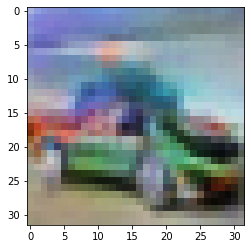

-> Epoch 249, Batch numero 1/78 -> Disc. loss on real images: 0.18624, Disc. loss on fake images: 0.38986, Generator loss: 2.40124
-> Epoch 249, Batch numero 2/78 -> Disc. loss on real images: 0.51227, Disc. loss on fake images: 0.21249, Generator loss: 2.19540
-> Epoch 249, Batch numero 3/78 -> Disc. loss on real images: 0.44451, Disc. loss on fake images: 0.53168, Generator loss: 1.98426
-> Epoch 249, Batch numero 4/78 -> Disc. loss on real images: 0.43000, Disc. loss on fake images: 0.47324, Generator loss: 2.33307
-> Epoch 249, Batch numero 5/78 -> Disc. loss on real images: 0.35192, Disc. loss on fake images: 0.35964, Generator loss: 2.45199
-> Epoch 249, Batch numero 6/78 -> Disc. loss on real images: 0.34444, Disc. loss on fake images: 0.40585, Generator loss: 2.38931
-> Epoch 249, Batch numero 7/78 -> Disc. loss on real images: 0.39730, Disc. loss on fake images: 0.36451, Generator loss: 2.41325
-> Epoch 249, Batch numero 8/78 -> Disc. loss on real images: 0.38856, Disc. loss o

-> Epoch 249, Batch numero 64/78 -> Disc. loss on real images: 0.65117, Disc. loss on fake images: 0.30454, Generator loss: 2.08926
-> Epoch 249, Batch numero 65/78 -> Disc. loss on real images: 0.31192, Disc. loss on fake images: 0.36902, Generator loss: 2.22579
-> Epoch 249, Batch numero 66/78 -> Disc. loss on real images: 0.35139, Disc. loss on fake images: 0.29542, Generator loss: 1.86602
-> Epoch 249, Batch numero 67/78 -> Disc. loss on real images: 0.30785, Disc. loss on fake images: 0.57237, Generator loss: 1.89828
-> Epoch 249, Batch numero 68/78 -> Disc. loss on real images: 0.57611, Disc. loss on fake images: 0.48135, Generator loss: 1.90927
-> Epoch 249, Batch numero 69/78 -> Disc. loss on real images: 0.39176, Disc. loss on fake images: 0.38759, Generator loss: 2.30064
-> Epoch 249, Batch numero 70/78 -> Disc. loss on real images: 0.30613, Disc. loss on fake images: 0.26294, Generator loss: 2.24487
-> Epoch 249, Batch numero 71/78 -> Disc. loss on real images: 0.52310, Disc

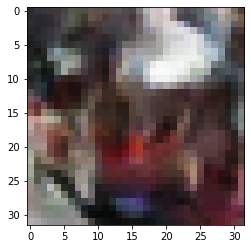

-> Epoch 250, Batch numero 1/78 -> Disc. loss on real images: 0.30656, Disc. loss on fake images: 0.30475, Generator loss: 1.99611
-> Epoch 250, Batch numero 2/78 -> Disc. loss on real images: 0.30411, Disc. loss on fake images: 0.51602, Generator loss: 2.12690
-> Epoch 250, Batch numero 3/78 -> Disc. loss on real images: 0.25305, Disc. loss on fake images: 0.25213, Generator loss: 2.57087
-> Epoch 250, Batch numero 4/78 -> Disc. loss on real images: 0.51092, Disc. loss on fake images: 0.41493, Generator loss: 2.19364
-> Epoch 250, Batch numero 5/78 -> Disc. loss on real images: 0.49537, Disc. loss on fake images: 0.33743, Generator loss: 1.80711
-> Epoch 250, Batch numero 6/78 -> Disc. loss on real images: 0.30986, Disc. loss on fake images: 0.42728, Generator loss: 1.83995
-> Epoch 250, Batch numero 7/78 -> Disc. loss on real images: 0.26137, Disc. loss on fake images: 0.34768, Generator loss: 1.90177
-> Epoch 250, Batch numero 8/78 -> Disc. loss on real images: 0.38718, Disc. loss o

-> Epoch 250, Batch numero 65/78 -> Disc. loss on real images: 0.37606, Disc. loss on fake images: 0.38292, Generator loss: 1.81012
-> Epoch 250, Batch numero 66/78 -> Disc. loss on real images: 0.22844, Disc. loss on fake images: 0.56096, Generator loss: 2.50866
-> Epoch 250, Batch numero 67/78 -> Disc. loss on real images: 0.42916, Disc. loss on fake images: 0.24809, Generator loss: 1.96167
-> Epoch 250, Batch numero 68/78 -> Disc. loss on real images: 0.52533, Disc. loss on fake images: 0.23382, Generator loss: 1.72877
-> Epoch 250, Batch numero 69/78 -> Disc. loss on real images: 0.32306, Disc. loss on fake images: 0.51584, Generator loss: 1.94793
-> Epoch 250, Batch numero 70/78 -> Disc. loss on real images: 0.28415, Disc. loss on fake images: 0.20934, Generator loss: 2.05258
-> Epoch 250, Batch numero 71/78 -> Disc. loss on real images: 0.42188, Disc. loss on fake images: 0.38527, Generator loss: 2.34479
-> Epoch 250, Batch numero 72/78 -> Disc. loss on real images: 0.27336, Disc

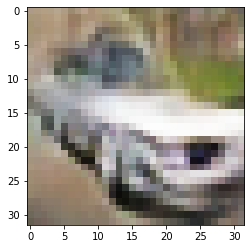

-> Epoch 251, Batch numero 1/78 -> Disc. loss on real images: 0.40986, Disc. loss on fake images: 0.39552, Generator loss: 1.81933
-> Epoch 251, Batch numero 2/78 -> Disc. loss on real images: 0.28877, Disc. loss on fake images: 0.31866, Generator loss: 1.77629
-> Epoch 251, Batch numero 3/78 -> Disc. loss on real images: 0.39109, Disc. loss on fake images: 0.38705, Generator loss: 1.91605
-> Epoch 251, Batch numero 4/78 -> Disc. loss on real images: 0.28107, Disc. loss on fake images: 0.45206, Generator loss: 2.08513
-> Epoch 251, Batch numero 5/78 -> Disc. loss on real images: 0.34660, Disc. loss on fake images: 0.47627, Generator loss: 2.17497
-> Epoch 251, Batch numero 6/78 -> Disc. loss on real images: 0.32492, Disc. loss on fake images: 0.35979, Generator loss: 2.31688
-> Epoch 251, Batch numero 7/78 -> Disc. loss on real images: 0.39333, Disc. loss on fake images: 0.28763, Generator loss: 2.22637
-> Epoch 251, Batch numero 8/78 -> Disc. loss on real images: 0.54276, Disc. loss o

-> Epoch 251, Batch numero 64/78 -> Disc. loss on real images: 0.43836, Disc. loss on fake images: 0.24120, Generator loss: 2.26974
-> Epoch 251, Batch numero 65/78 -> Disc. loss on real images: 0.47492, Disc. loss on fake images: 0.35802, Generator loss: 1.78339
-> Epoch 251, Batch numero 66/78 -> Disc. loss on real images: 0.30136, Disc. loss on fake images: 0.49534, Generator loss: 1.65768
-> Epoch 251, Batch numero 67/78 -> Disc. loss on real images: 0.31188, Disc. loss on fake images: 0.39694, Generator loss: 1.95268
-> Epoch 251, Batch numero 68/78 -> Disc. loss on real images: 0.25489, Disc. loss on fake images: 0.33287, Generator loss: 1.90693
-> Epoch 251, Batch numero 69/78 -> Disc. loss on real images: 0.32108, Disc. loss on fake images: 0.33746, Generator loss: 2.15200
-> Epoch 251, Batch numero 70/78 -> Disc. loss on real images: 0.38303, Disc. loss on fake images: 0.37074, Generator loss: 1.85621
-> Epoch 251, Batch numero 71/78 -> Disc. loss on real images: 0.30691, Disc

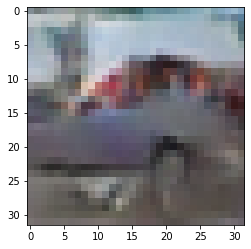

-> Epoch 252, Batch numero 1/78 -> Disc. loss on real images: 0.29516, Disc. loss on fake images: 0.48442, Generator loss: 2.22385
-> Epoch 252, Batch numero 2/78 -> Disc. loss on real images: 0.31622, Disc. loss on fake images: 0.35995, Generator loss: 2.33982
-> Epoch 252, Batch numero 3/78 -> Disc. loss on real images: 0.48277, Disc. loss on fake images: 0.27220, Generator loss: 2.13342
-> Epoch 252, Batch numero 4/78 -> Disc. loss on real images: 0.54268, Disc. loss on fake images: 0.29981, Generator loss: 1.92933
-> Epoch 252, Batch numero 5/78 -> Disc. loss on real images: 0.28341, Disc. loss on fake images: 0.41115, Generator loss: 1.72453
-> Epoch 252, Batch numero 6/78 -> Disc. loss on real images: 0.32715, Disc. loss on fake images: 0.41326, Generator loss: 1.91978
-> Epoch 252, Batch numero 7/78 -> Disc. loss on real images: 0.23348, Disc. loss on fake images: 0.39920, Generator loss: 1.86743
-> Epoch 252, Batch numero 8/78 -> Disc. loss on real images: 0.41688, Disc. loss o

-> Epoch 252, Batch numero 64/78 -> Disc. loss on real images: 0.53040, Disc. loss on fake images: 0.21429, Generator loss: 1.80940
-> Epoch 252, Batch numero 65/78 -> Disc. loss on real images: 0.32440, Disc. loss on fake images: 0.47835, Generator loss: 2.12450
-> Epoch 252, Batch numero 66/78 -> Disc. loss on real images: 0.44455, Disc. loss on fake images: 0.41077, Generator loss: 1.73045
-> Epoch 252, Batch numero 67/78 -> Disc. loss on real images: 0.36465, Disc. loss on fake images: 0.48442, Generator loss: 1.78906
-> Epoch 252, Batch numero 68/78 -> Disc. loss on real images: 0.22290, Disc. loss on fake images: 0.58837, Generator loss: 2.23266
-> Epoch 252, Batch numero 69/78 -> Disc. loss on real images: 0.44474, Disc. loss on fake images: 0.30902, Generator loss: 2.07144
-> Epoch 252, Batch numero 70/78 -> Disc. loss on real images: 0.37931, Disc. loss on fake images: 0.41054, Generator loss: 1.85647
-> Epoch 252, Batch numero 71/78 -> Disc. loss on real images: 0.38411, Disc

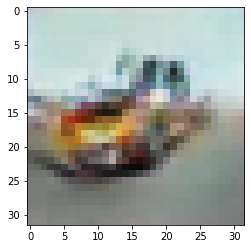

-> Epoch 253, Batch numero 1/78 -> Disc. loss on real images: 0.32034, Disc. loss on fake images: 0.40504, Generator loss: 2.05723
-> Epoch 253, Batch numero 2/78 -> Disc. loss on real images: 0.32582, Disc. loss on fake images: 0.27610, Generator loss: 2.19607
-> Epoch 253, Batch numero 3/78 -> Disc. loss on real images: 0.38507, Disc. loss on fake images: 0.42821, Generator loss: 2.27936
-> Epoch 253, Batch numero 4/78 -> Disc. loss on real images: 0.34439, Disc. loss on fake images: 0.57584, Generator loss: 2.35894
-> Epoch 253, Batch numero 5/78 -> Disc. loss on real images: 0.55028, Disc. loss on fake images: 0.35945, Generator loss: 2.22806
-> Epoch 253, Batch numero 6/78 -> Disc. loss on real images: 0.50934, Disc. loss on fake images: 0.23980, Generator loss: 2.12229
-> Epoch 253, Batch numero 7/78 -> Disc. loss on real images: 0.45908, Disc. loss on fake images: 0.47702, Generator loss: 1.76548
-> Epoch 253, Batch numero 8/78 -> Disc. loss on real images: 0.25270, Disc. loss o

-> Epoch 253, Batch numero 65/78 -> Disc. loss on real images: 0.45957, Disc. loss on fake images: 0.40501, Generator loss: 1.79232
-> Epoch 253, Batch numero 66/78 -> Disc. loss on real images: 0.38904, Disc. loss on fake images: 0.55617, Generator loss: 2.40519
-> Epoch 253, Batch numero 67/78 -> Disc. loss on real images: 0.37696, Disc. loss on fake images: 0.32990, Generator loss: 2.09393
-> Epoch 253, Batch numero 68/78 -> Disc. loss on real images: 0.36709, Disc. loss on fake images: 0.28424, Generator loss: 1.90439
-> Epoch 253, Batch numero 69/78 -> Disc. loss on real images: 0.42240, Disc. loss on fake images: 0.20200, Generator loss: 1.87484
-> Epoch 253, Batch numero 70/78 -> Disc. loss on real images: 0.44548, Disc. loss on fake images: 0.68101, Generator loss: 1.88903
-> Epoch 253, Batch numero 71/78 -> Disc. loss on real images: 0.33704, Disc. loss on fake images: 0.37762, Generator loss: 2.34857
-> Epoch 253, Batch numero 72/78 -> Disc. loss on real images: 0.41690, Disc

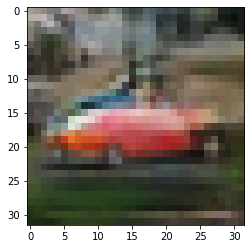

-> Epoch 254, Batch numero 1/78 -> Disc. loss on real images: 0.49429, Disc. loss on fake images: 0.30175, Generator loss: 1.76979
-> Epoch 254, Batch numero 2/78 -> Disc. loss on real images: 0.34006, Disc. loss on fake images: 0.25345, Generator loss: 2.18758
-> Epoch 254, Batch numero 3/78 -> Disc. loss on real images: 0.30857, Disc. loss on fake images: 0.42496, Generator loss: 2.02754
-> Epoch 254, Batch numero 4/78 -> Disc. loss on real images: 0.25044, Disc. loss on fake images: 0.29842, Generator loss: 2.11122
-> Epoch 254, Batch numero 5/78 -> Disc. loss on real images: 0.43423, Disc. loss on fake images: 0.27018, Generator loss: 2.02906
-> Epoch 254, Batch numero 6/78 -> Disc. loss on real images: 0.26206, Disc. loss on fake images: 0.44359, Generator loss: 1.73430
-> Epoch 254, Batch numero 7/78 -> Disc. loss on real images: 0.49452, Disc. loss on fake images: 0.75566, Generator loss: 2.28701
-> Epoch 254, Batch numero 8/78 -> Disc. loss on real images: 0.33087, Disc. loss o

-> Epoch 254, Batch numero 66/78 -> Disc. loss on real images: 0.33558, Disc. loss on fake images: 0.41463, Generator loss: 2.27316
-> Epoch 254, Batch numero 67/78 -> Disc. loss on real images: 0.37889, Disc. loss on fake images: 0.37053, Generator loss: 2.12682
-> Epoch 254, Batch numero 68/78 -> Disc. loss on real images: 0.36699, Disc. loss on fake images: 0.40846, Generator loss: 2.08815
-> Epoch 254, Batch numero 69/78 -> Disc. loss on real images: 0.31263, Disc. loss on fake images: 0.27031, Generator loss: 1.80935
-> Epoch 254, Batch numero 70/78 -> Disc. loss on real images: 0.24638, Disc. loss on fake images: 0.42157, Generator loss: 2.00385
-> Epoch 254, Batch numero 71/78 -> Disc. loss on real images: 0.35291, Disc. loss on fake images: 0.30168, Generator loss: 2.13152
-> Epoch 254, Batch numero 72/78 -> Disc. loss on real images: 0.22387, Disc. loss on fake images: 0.36846, Generator loss: 2.33757
-> Epoch 254, Batch numero 73/78 -> Disc. loss on real images: 0.43793, Disc

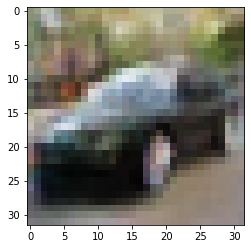

-> Epoch 255, Batch numero 1/78 -> Disc. loss on real images: 0.26735, Disc. loss on fake images: 0.41736, Generator loss: 2.25230
-> Epoch 255, Batch numero 2/78 -> Disc. loss on real images: 0.41305, Disc. loss on fake images: 0.44992, Generator loss: 2.09825
-> Epoch 255, Batch numero 3/78 -> Disc. loss on real images: 0.41810, Disc. loss on fake images: 0.38293, Generator loss: 1.83466
-> Epoch 255, Batch numero 4/78 -> Disc. loss on real images: 0.46146, Disc. loss on fake images: 0.43658, Generator loss: 2.42334
-> Epoch 255, Batch numero 5/78 -> Disc. loss on real images: 0.37820, Disc. loss on fake images: 0.36790, Generator loss: 2.25160
-> Epoch 255, Batch numero 6/78 -> Disc. loss on real images: 0.29602, Disc. loss on fake images: 0.63380, Generator loss: 2.21824
-> Epoch 255, Batch numero 7/78 -> Disc. loss on real images: 0.61602, Disc. loss on fake images: 0.37577, Generator loss: 2.13595
-> Epoch 255, Batch numero 8/78 -> Disc. loss on real images: 0.34400, Disc. loss o

-> Epoch 255, Batch numero 64/78 -> Disc. loss on real images: 0.45077, Disc. loss on fake images: 0.27099, Generator loss: 2.13401
-> Epoch 255, Batch numero 65/78 -> Disc. loss on real images: 0.37382, Disc. loss on fake images: 0.29665, Generator loss: 2.24416
-> Epoch 255, Batch numero 66/78 -> Disc. loss on real images: 0.45777, Disc. loss on fake images: 0.29637, Generator loss: 1.93736
-> Epoch 255, Batch numero 67/78 -> Disc. loss on real images: 0.25708, Disc. loss on fake images: 0.51939, Generator loss: 2.10689
-> Epoch 255, Batch numero 68/78 -> Disc. loss on real images: 0.46963, Disc. loss on fake images: 0.44159, Generator loss: 2.21062
-> Epoch 255, Batch numero 69/78 -> Disc. loss on real images: 0.32041, Disc. loss on fake images: 0.36117, Generator loss: 1.88967
-> Epoch 255, Batch numero 70/78 -> Disc. loss on real images: 0.32338, Disc. loss on fake images: 0.29960, Generator loss: 2.25332
-> Epoch 255, Batch numero 71/78 -> Disc. loss on real images: 0.27123, Disc

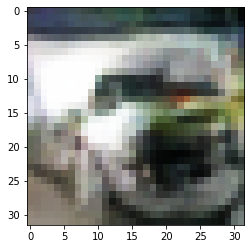

-> Epoch 256, Batch numero 1/78 -> Disc. loss on real images: 0.27799, Disc. loss on fake images: 0.38328, Generator loss: 1.95744
-> Epoch 256, Batch numero 2/78 -> Disc. loss on real images: 0.29564, Disc. loss on fake images: 0.38262, Generator loss: 2.30944
-> Epoch 256, Batch numero 3/78 -> Disc. loss on real images: 0.37332, Disc. loss on fake images: 0.28875, Generator loss: 2.38230
-> Epoch 256, Batch numero 4/78 -> Disc. loss on real images: 0.40834, Disc. loss on fake images: 0.33385, Generator loss: 2.08502
-> Epoch 256, Batch numero 5/78 -> Disc. loss on real images: 0.36809, Disc. loss on fake images: 0.47112, Generator loss: 2.34367
-> Epoch 256, Batch numero 6/78 -> Disc. loss on real images: 0.63502, Disc. loss on fake images: 0.21881, Generator loss: 1.98455
-> Epoch 256, Batch numero 7/78 -> Disc. loss on real images: 0.37050, Disc. loss on fake images: 0.49496, Generator loss: 1.74773
-> Epoch 256, Batch numero 8/78 -> Disc. loss on real images: 0.35244, Disc. loss o

-> Epoch 256, Batch numero 66/78 -> Disc. loss on real images: 0.40871, Disc. loss on fake images: 0.46102, Generator loss: 2.52156
-> Epoch 256, Batch numero 67/78 -> Disc. loss on real images: 0.47537, Disc. loss on fake images: 0.48156, Generator loss: 2.02778
-> Epoch 256, Batch numero 68/78 -> Disc. loss on real images: 0.35274, Disc. loss on fake images: 0.26093, Generator loss: 2.38438
-> Epoch 256, Batch numero 69/78 -> Disc. loss on real images: 0.28629, Disc. loss on fake images: 0.46944, Generator loss: 2.27815
-> Epoch 256, Batch numero 70/78 -> Disc. loss on real images: 0.38026, Disc. loss on fake images: 0.31501, Generator loss: 2.35100
-> Epoch 256, Batch numero 71/78 -> Disc. loss on real images: 0.36974, Disc. loss on fake images: 0.26243, Generator loss: 1.94758
-> Epoch 256, Batch numero 72/78 -> Disc. loss on real images: 0.31263, Disc. loss on fake images: 0.44767, Generator loss: 2.41576
-> Epoch 256, Batch numero 73/78 -> Disc. loss on real images: 0.37533, Disc

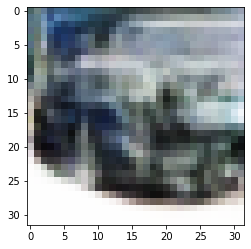

-> Epoch 257, Batch numero 1/78 -> Disc. loss on real images: 0.28937, Disc. loss on fake images: 0.26593, Generator loss: 2.25229
-> Epoch 257, Batch numero 2/78 -> Disc. loss on real images: 0.30107, Disc. loss on fake images: 0.28692, Generator loss: 2.06022
-> Epoch 257, Batch numero 3/78 -> Disc. loss on real images: 0.37942, Disc. loss on fake images: 0.29806, Generator loss: 2.19244
-> Epoch 257, Batch numero 4/78 -> Disc. loss on real images: 0.32180, Disc. loss on fake images: 0.39992, Generator loss: 2.16828
-> Epoch 257, Batch numero 5/78 -> Disc. loss on real images: 0.32399, Disc. loss on fake images: 0.40754, Generator loss: 2.34351
-> Epoch 257, Batch numero 6/78 -> Disc. loss on real images: 0.49534, Disc. loss on fake images: 0.33503, Generator loss: 1.97191
-> Epoch 257, Batch numero 7/78 -> Disc. loss on real images: 0.24806, Disc. loss on fake images: 0.28806, Generator loss: 1.90553
-> Epoch 257, Batch numero 8/78 -> Disc. loss on real images: 0.31595, Disc. loss o

-> Epoch 257, Batch numero 64/78 -> Disc. loss on real images: 0.20797, Disc. loss on fake images: 0.39828, Generator loss: 2.40758
-> Epoch 257, Batch numero 65/78 -> Disc. loss on real images: 0.37582, Disc. loss on fake images: 0.22696, Generator loss: 2.28159
-> Epoch 257, Batch numero 66/78 -> Disc. loss on real images: 0.38770, Disc. loss on fake images: 0.39158, Generator loss: 2.47462
-> Epoch 257, Batch numero 67/78 -> Disc. loss on real images: 0.27208, Disc. loss on fake images: 0.40233, Generator loss: 2.31596
-> Epoch 257, Batch numero 68/78 -> Disc. loss on real images: 0.34706, Disc. loss on fake images: 0.41986, Generator loss: 2.47825
-> Epoch 257, Batch numero 69/78 -> Disc. loss on real images: 0.51362, Disc. loss on fake images: 0.41551, Generator loss: 2.22338
-> Epoch 257, Batch numero 70/78 -> Disc. loss on real images: 0.44561, Disc. loss on fake images: 0.34679, Generator loss: 2.30630
-> Epoch 257, Batch numero 71/78 -> Disc. loss on real images: 0.41620, Disc

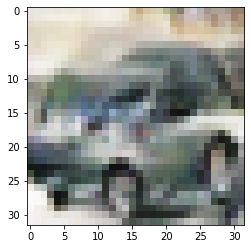

-> Epoch 258, Batch numero 1/78 -> Disc. loss on real images: 0.27647, Disc. loss on fake images: 0.28680, Generator loss: 1.97575
-> Epoch 258, Batch numero 2/78 -> Disc. loss on real images: 0.27891, Disc. loss on fake images: 0.55542, Generator loss: 2.32863
-> Epoch 258, Batch numero 3/78 -> Disc. loss on real images: 0.43091, Disc. loss on fake images: 0.26602, Generator loss: 2.18319
-> Epoch 258, Batch numero 4/78 -> Disc. loss on real images: 0.47967, Disc. loss on fake images: 0.51569, Generator loss: 1.86015
-> Epoch 258, Batch numero 5/78 -> Disc. loss on real images: 0.53444, Disc. loss on fake images: 0.31007, Generator loss: 1.92598
-> Epoch 258, Batch numero 6/78 -> Disc. loss on real images: 0.21198, Disc. loss on fake images: 0.41722, Generator loss: 2.44895
-> Epoch 258, Batch numero 7/78 -> Disc. loss on real images: 0.38096, Disc. loss on fake images: 0.27214, Generator loss: 2.38449
-> Epoch 258, Batch numero 8/78 -> Disc. loss on real images: 0.32473, Disc. loss o

-> Epoch 258, Batch numero 64/78 -> Disc. loss on real images: 0.34943, Disc. loss on fake images: 0.25018, Generator loss: 2.27076
-> Epoch 258, Batch numero 65/78 -> Disc. loss on real images: 0.41753, Disc. loss on fake images: 0.28927, Generator loss: 1.83954
-> Epoch 258, Batch numero 66/78 -> Disc. loss on real images: 0.21972, Disc. loss on fake images: 0.25320, Generator loss: 2.22766
-> Epoch 258, Batch numero 67/78 -> Disc. loss on real images: 0.27039, Disc. loss on fake images: 0.30631, Generator loss: 2.41101
-> Epoch 258, Batch numero 68/78 -> Disc. loss on real images: 0.30637, Disc. loss on fake images: 0.29836, Generator loss: 2.46308
-> Epoch 258, Batch numero 69/78 -> Disc. loss on real images: 0.37774, Disc. loss on fake images: 0.23714, Generator loss: 2.39040
-> Epoch 258, Batch numero 70/78 -> Disc. loss on real images: 0.37446, Disc. loss on fake images: 0.34235, Generator loss: 2.04888
-> Epoch 258, Batch numero 71/78 -> Disc. loss on real images: 0.30234, Disc

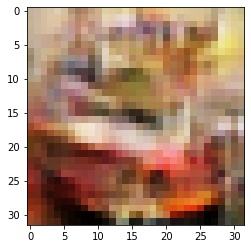

-> Epoch 259, Batch numero 1/78 -> Disc. loss on real images: 0.33256, Disc. loss on fake images: 0.32417, Generator loss: 1.90460
-> Epoch 259, Batch numero 2/78 -> Disc. loss on real images: 0.26859, Disc. loss on fake images: 0.51998, Generator loss: 2.54672
-> Epoch 259, Batch numero 3/78 -> Disc. loss on real images: 0.47229, Disc. loss on fake images: 0.23672, Generator loss: 1.96557
-> Epoch 259, Batch numero 4/78 -> Disc. loss on real images: 0.25593, Disc. loss on fake images: 0.28552, Generator loss: 2.12382
-> Epoch 259, Batch numero 5/78 -> Disc. loss on real images: 0.43191, Disc. loss on fake images: 0.47805, Generator loss: 2.44114
-> Epoch 259, Batch numero 6/78 -> Disc. loss on real images: 0.33857, Disc. loss on fake images: 0.26535, Generator loss: 2.10582
-> Epoch 259, Batch numero 7/78 -> Disc. loss on real images: 0.37842, Disc. loss on fake images: 0.26836, Generator loss: 2.20804
-> Epoch 259, Batch numero 8/78 -> Disc. loss on real images: 0.27774, Disc. loss o

-> Epoch 259, Batch numero 64/78 -> Disc. loss on real images: 0.37194, Disc. loss on fake images: 0.28047, Generator loss: 2.13924
-> Epoch 259, Batch numero 65/78 -> Disc. loss on real images: 0.30192, Disc. loss on fake images: 0.32094, Generator loss: 2.31731
-> Epoch 259, Batch numero 66/78 -> Disc. loss on real images: 0.45835, Disc. loss on fake images: 0.46465, Generator loss: 2.12198
-> Epoch 259, Batch numero 67/78 -> Disc. loss on real images: 0.41578, Disc. loss on fake images: 0.24073, Generator loss: 2.20611
-> Epoch 259, Batch numero 68/78 -> Disc. loss on real images: 0.31295, Disc. loss on fake images: 0.28726, Generator loss: 2.19497
-> Epoch 259, Batch numero 69/78 -> Disc. loss on real images: 0.42283, Disc. loss on fake images: 0.26971, Generator loss: 2.07005
-> Epoch 259, Batch numero 70/78 -> Disc. loss on real images: 0.16852, Disc. loss on fake images: 0.36261, Generator loss: 2.41436
-> Epoch 259, Batch numero 71/78 -> Disc. loss on real images: 0.37127, Disc

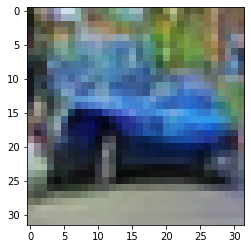

-> Epoch 260, Batch numero 1/78 -> Disc. loss on real images: 0.38124, Disc. loss on fake images: 0.21817, Generator loss: 1.90390
-> Epoch 260, Batch numero 2/78 -> Disc. loss on real images: 0.42435, Disc. loss on fake images: 0.36961, Generator loss: 1.85799
-> Epoch 260, Batch numero 3/78 -> Disc. loss on real images: 0.26079, Disc. loss on fake images: 0.36748, Generator loss: 1.67017
-> Epoch 260, Batch numero 4/78 -> Disc. loss on real images: 0.31754, Disc. loss on fake images: 0.41049, Generator loss: 2.22549
-> Epoch 260, Batch numero 5/78 -> Disc. loss on real images: 0.43593, Disc. loss on fake images: 0.21062, Generator loss: 2.26426
-> Epoch 260, Batch numero 6/78 -> Disc. loss on real images: 0.44222, Disc. loss on fake images: 0.31794, Generator loss: 2.14202
-> Epoch 260, Batch numero 7/78 -> Disc. loss on real images: 0.38018, Disc. loss on fake images: 0.50604, Generator loss: 2.20107
-> Epoch 260, Batch numero 8/78 -> Disc. loss on real images: 0.20272, Disc. loss o

-> Epoch 260, Batch numero 64/78 -> Disc. loss on real images: 0.43965, Disc. loss on fake images: 0.32673, Generator loss: 2.23875
-> Epoch 260, Batch numero 65/78 -> Disc. loss on real images: 0.34774, Disc. loss on fake images: 0.40813, Generator loss: 2.35008
-> Epoch 260, Batch numero 66/78 -> Disc. loss on real images: 0.34834, Disc. loss on fake images: 0.38097, Generator loss: 1.76390
-> Epoch 260, Batch numero 67/78 -> Disc. loss on real images: 0.28029, Disc. loss on fake images: 0.43297, Generator loss: 2.53805
-> Epoch 260, Batch numero 68/78 -> Disc. loss on real images: 0.50353, Disc. loss on fake images: 0.50703, Generator loss: 2.40110
-> Epoch 260, Batch numero 69/78 -> Disc. loss on real images: 0.34270, Disc. loss on fake images: 0.24996, Generator loss: 2.38230
-> Epoch 260, Batch numero 70/78 -> Disc. loss on real images: 0.34994, Disc. loss on fake images: 0.32271, Generator loss: 2.01592
-> Epoch 260, Batch numero 71/78 -> Disc. loss on real images: 0.30435, Disc

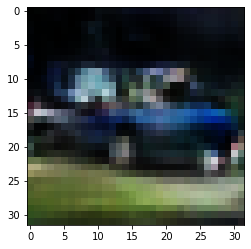

-> Epoch 261, Batch numero 1/78 -> Disc. loss on real images: 0.40977, Disc. loss on fake images: 0.27217, Generator loss: 2.08034
-> Epoch 261, Batch numero 2/78 -> Disc. loss on real images: 0.19970, Disc. loss on fake images: 0.41251, Generator loss: 2.30767
-> Epoch 261, Batch numero 3/78 -> Disc. loss on real images: 0.33028, Disc. loss on fake images: 0.18122, Generator loss: 2.22149
-> Epoch 261, Batch numero 4/78 -> Disc. loss on real images: 0.42850, Disc. loss on fake images: 0.24943, Generator loss: 2.03132
-> Epoch 261, Batch numero 5/78 -> Disc. loss on real images: 0.20090, Disc. loss on fake images: 0.30631, Generator loss: 1.94204
-> Epoch 261, Batch numero 6/78 -> Disc. loss on real images: 0.16035, Disc. loss on fake images: 0.45420, Generator loss: 2.48350
-> Epoch 261, Batch numero 7/78 -> Disc. loss on real images: 0.32593, Disc. loss on fake images: 0.27608, Generator loss: 2.67087
-> Epoch 261, Batch numero 8/78 -> Disc. loss on real images: 0.52204, Disc. loss o

-> Epoch 261, Batch numero 64/78 -> Disc. loss on real images: 0.45493, Disc. loss on fake images: 0.25346, Generator loss: 2.24655
-> Epoch 261, Batch numero 65/78 -> Disc. loss on real images: 0.41152, Disc. loss on fake images: 0.35904, Generator loss: 2.18047
-> Epoch 261, Batch numero 66/78 -> Disc. loss on real images: 0.32945, Disc. loss on fake images: 0.45248, Generator loss: 2.45709
-> Epoch 261, Batch numero 67/78 -> Disc. loss on real images: 0.28464, Disc. loss on fake images: 0.26711, Generator loss: 1.95287
-> Epoch 261, Batch numero 68/78 -> Disc. loss on real images: 0.38082, Disc. loss on fake images: 0.44226, Generator loss: 2.13324
-> Epoch 261, Batch numero 69/78 -> Disc. loss on real images: 0.32237, Disc. loss on fake images: 0.27055, Generator loss: 2.05323
-> Epoch 261, Batch numero 70/78 -> Disc. loss on real images: 0.18189, Disc. loss on fake images: 0.25243, Generator loss: 2.22063
-> Epoch 261, Batch numero 71/78 -> Disc. loss on real images: 0.30755, Disc

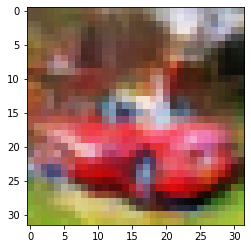

-> Epoch 262, Batch numero 1/78 -> Disc. loss on real images: 0.28315, Disc. loss on fake images: 0.33182, Generator loss: 2.25234
-> Epoch 262, Batch numero 2/78 -> Disc. loss on real images: 0.49638, Disc. loss on fake images: 0.33100, Generator loss: 1.82381
-> Epoch 262, Batch numero 3/78 -> Disc. loss on real images: 0.40465, Disc. loss on fake images: 0.33673, Generator loss: 1.56918
-> Epoch 262, Batch numero 4/78 -> Disc. loss on real images: 0.34781, Disc. loss on fake images: 0.36564, Generator loss: 1.97374
-> Epoch 262, Batch numero 5/78 -> Disc. loss on real images: 0.29962, Disc. loss on fake images: 0.51152, Generator loss: 2.32629
-> Epoch 262, Batch numero 6/78 -> Disc. loss on real images: 0.26161, Disc. loss on fake images: 0.30767, Generator loss: 2.17821
-> Epoch 262, Batch numero 7/78 -> Disc. loss on real images: 0.31696, Disc. loss on fake images: 0.41422, Generator loss: 2.43807
-> Epoch 262, Batch numero 8/78 -> Disc. loss on real images: 0.31410, Disc. loss o

-> Epoch 262, Batch numero 64/78 -> Disc. loss on real images: 0.25310, Disc. loss on fake images: 0.26201, Generator loss: 2.31520
-> Epoch 262, Batch numero 65/78 -> Disc. loss on real images: 0.37592, Disc. loss on fake images: 0.24169, Generator loss: 2.08333
-> Epoch 262, Batch numero 66/78 -> Disc. loss on real images: 0.30106, Disc. loss on fake images: 0.56309, Generator loss: 2.18752
-> Epoch 262, Batch numero 67/78 -> Disc. loss on real images: 0.48635, Disc. loss on fake images: 0.41866, Generator loss: 2.61640
-> Epoch 262, Batch numero 68/78 -> Disc. loss on real images: 0.34365, Disc. loss on fake images: 0.25074, Generator loss: 2.16453
-> Epoch 262, Batch numero 69/78 -> Disc. loss on real images: 0.37292, Disc. loss on fake images: 0.37033, Generator loss: 1.92595
-> Epoch 262, Batch numero 70/78 -> Disc. loss on real images: 0.47970, Disc. loss on fake images: 0.41723, Generator loss: 2.27930
-> Epoch 262, Batch numero 71/78 -> Disc. loss on real images: 0.22863, Disc

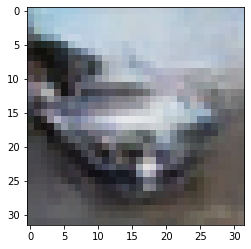

-> Epoch 263, Batch numero 1/78 -> Disc. loss on real images: 0.21595, Disc. loss on fake images: 0.52058, Generator loss: 1.95160
-> Epoch 263, Batch numero 2/78 -> Disc. loss on real images: 0.37211, Disc. loss on fake images: 0.39539, Generator loss: 2.16766
-> Epoch 263, Batch numero 3/78 -> Disc. loss on real images: 0.29360, Disc. loss on fake images: 0.27210, Generator loss: 2.27217
-> Epoch 263, Batch numero 4/78 -> Disc. loss on real images: 0.36461, Disc. loss on fake images: 0.60028, Generator loss: 2.50039
-> Epoch 263, Batch numero 5/78 -> Disc. loss on real images: 0.60172, Disc. loss on fake images: 0.27743, Generator loss: 2.18945
-> Epoch 263, Batch numero 6/78 -> Disc. loss on real images: 0.44413, Disc. loss on fake images: 0.41696, Generator loss: 2.32644
-> Epoch 263, Batch numero 7/78 -> Disc. loss on real images: 0.37844, Disc. loss on fake images: 0.30491, Generator loss: 2.33385
-> Epoch 263, Batch numero 8/78 -> Disc. loss on real images: 0.29632, Disc. loss o

-> Epoch 263, Batch numero 64/78 -> Disc. loss on real images: 0.46289, Disc. loss on fake images: 0.30718, Generator loss: 2.31581
-> Epoch 263, Batch numero 65/78 -> Disc. loss on real images: 0.30931, Disc. loss on fake images: 0.42695, Generator loss: 2.20006
-> Epoch 263, Batch numero 66/78 -> Disc. loss on real images: 0.44449, Disc. loss on fake images: 0.33615, Generator loss: 2.25606
-> Epoch 263, Batch numero 67/78 -> Disc. loss on real images: 0.27776, Disc. loss on fake images: 0.22583, Generator loss: 2.23111
-> Epoch 263, Batch numero 68/78 -> Disc. loss on real images: 0.45094, Disc. loss on fake images: 0.29352, Generator loss: 1.89790
-> Epoch 263, Batch numero 69/78 -> Disc. loss on real images: 0.22156, Disc. loss on fake images: 0.40480, Generator loss: 1.89191
-> Epoch 263, Batch numero 70/78 -> Disc. loss on real images: 0.31198, Disc. loss on fake images: 0.31210, Generator loss: 2.05011
-> Epoch 263, Batch numero 71/78 -> Disc. loss on real images: 0.35324, Disc

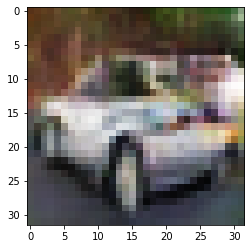

-> Epoch 264, Batch numero 1/78 -> Disc. loss on real images: 0.35195, Disc. loss on fake images: 0.29484, Generator loss: 1.60486
-> Epoch 264, Batch numero 2/78 -> Disc. loss on real images: 0.22634, Disc. loss on fake images: 0.50844, Generator loss: 2.32940
-> Epoch 264, Batch numero 3/78 -> Disc. loss on real images: 0.33196, Disc. loss on fake images: 0.39718, Generator loss: 2.14116
-> Epoch 264, Batch numero 4/78 -> Disc. loss on real images: 0.45001, Disc. loss on fake images: 0.31849, Generator loss: 2.48475
-> Epoch 264, Batch numero 5/78 -> Disc. loss on real images: 0.25147, Disc. loss on fake images: 0.38549, Generator loss: 2.77412
-> Epoch 264, Batch numero 6/78 -> Disc. loss on real images: 0.37131, Disc. loss on fake images: 0.26732, Generator loss: 2.62088
-> Epoch 264, Batch numero 7/78 -> Disc. loss on real images: 0.49645, Disc. loss on fake images: 0.39074, Generator loss: 2.19100
-> Epoch 264, Batch numero 8/78 -> Disc. loss on real images: 0.37421, Disc. loss o

-> Epoch 264, Batch numero 64/78 -> Disc. loss on real images: 0.28016, Disc. loss on fake images: 0.37736, Generator loss: 2.02772
-> Epoch 264, Batch numero 65/78 -> Disc. loss on real images: 0.36759, Disc. loss on fake images: 0.39351, Generator loss: 1.95782
-> Epoch 264, Batch numero 66/78 -> Disc. loss on real images: 0.40459, Disc. loss on fake images: 0.78997, Generator loss: 2.11384
-> Epoch 264, Batch numero 67/78 -> Disc. loss on real images: 0.24149, Disc. loss on fake images: 0.23513, Generator loss: 2.28287
-> Epoch 264, Batch numero 68/78 -> Disc. loss on real images: 0.37447, Disc. loss on fake images: 0.17880, Generator loss: 2.40035
-> Epoch 264, Batch numero 69/78 -> Disc. loss on real images: 0.37068, Disc. loss on fake images: 0.58215, Generator loss: 2.30795
-> Epoch 264, Batch numero 70/78 -> Disc. loss on real images: 0.33602, Disc. loss on fake images: 0.23960, Generator loss: 2.50654
-> Epoch 264, Batch numero 71/78 -> Disc. loss on real images: 0.35915, Disc

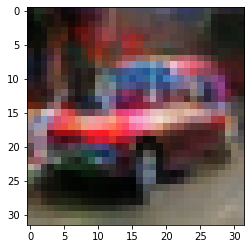

-> Epoch 265, Batch numero 1/78 -> Disc. loss on real images: 0.49649, Disc. loss on fake images: 0.54598, Generator loss: 1.99898
-> Epoch 265, Batch numero 2/78 -> Disc. loss on real images: 0.35181, Disc. loss on fake images: 0.34858, Generator loss: 2.06236
-> Epoch 265, Batch numero 3/78 -> Disc. loss on real images: 0.40920, Disc. loss on fake images: 0.31656, Generator loss: 2.14072
-> Epoch 265, Batch numero 4/78 -> Disc. loss on real images: 0.49240, Disc. loss on fake images: 0.34595, Generator loss: 2.12090
-> Epoch 265, Batch numero 5/78 -> Disc. loss on real images: 0.20370, Disc. loss on fake images: 0.37010, Generator loss: 2.25316
-> Epoch 265, Batch numero 6/78 -> Disc. loss on real images: 0.50684, Disc. loss on fake images: 0.28904, Generator loss: 2.15016
-> Epoch 265, Batch numero 7/78 -> Disc. loss on real images: 0.26587, Disc. loss on fake images: 0.50026, Generator loss: 2.28964
-> Epoch 265, Batch numero 8/78 -> Disc. loss on real images: 0.37519, Disc. loss o

-> Epoch 265, Batch numero 64/78 -> Disc. loss on real images: 0.18538, Disc. loss on fake images: 0.41392, Generator loss: 2.25907
-> Epoch 265, Batch numero 65/78 -> Disc. loss on real images: 0.36604, Disc. loss on fake images: 0.25362, Generator loss: 2.33645
-> Epoch 265, Batch numero 66/78 -> Disc. loss on real images: 0.34705, Disc. loss on fake images: 0.52302, Generator loss: 2.24869
-> Epoch 265, Batch numero 67/78 -> Disc. loss on real images: 0.37077, Disc. loss on fake images: 0.28890, Generator loss: 2.57314
-> Epoch 265, Batch numero 68/78 -> Disc. loss on real images: 0.42574, Disc. loss on fake images: 0.45836, Generator loss: 2.39448
-> Epoch 265, Batch numero 69/78 -> Disc. loss on real images: 0.31587, Disc. loss on fake images: 0.36279, Generator loss: 2.03469
-> Epoch 265, Batch numero 70/78 -> Disc. loss on real images: 0.42822, Disc. loss on fake images: 0.29768, Generator loss: 2.01626
-> Epoch 265, Batch numero 71/78 -> Disc. loss on real images: 0.36297, Disc

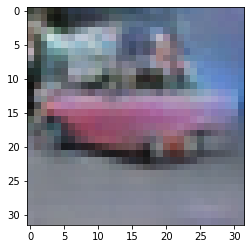

-> Epoch 266, Batch numero 1/78 -> Disc. loss on real images: 0.31407, Disc. loss on fake images: 0.26679, Generator loss: 2.22599
-> Epoch 266, Batch numero 2/78 -> Disc. loss on real images: 0.30828, Disc. loss on fake images: 0.37957, Generator loss: 2.11957
-> Epoch 266, Batch numero 3/78 -> Disc. loss on real images: 0.37472, Disc. loss on fake images: 0.24183, Generator loss: 2.07399
-> Epoch 266, Batch numero 4/78 -> Disc. loss on real images: 0.18652, Disc. loss on fake images: 0.49653, Generator loss: 2.22721
-> Epoch 266, Batch numero 5/78 -> Disc. loss on real images: 0.35521, Disc. loss on fake images: 0.29734, Generator loss: 2.30883
-> Epoch 266, Batch numero 6/78 -> Disc. loss on real images: 0.43095, Disc. loss on fake images: 0.33545, Generator loss: 2.07091
-> Epoch 266, Batch numero 7/78 -> Disc. loss on real images: 0.23947, Disc. loss on fake images: 0.44749, Generator loss: 2.44773
-> Epoch 266, Batch numero 8/78 -> Disc. loss on real images: 0.40978, Disc. loss o

-> Epoch 266, Batch numero 65/78 -> Disc. loss on real images: 0.26520, Disc. loss on fake images: 0.27725, Generator loss: 2.22962
-> Epoch 266, Batch numero 66/78 -> Disc. loss on real images: 0.31157, Disc. loss on fake images: 0.38590, Generator loss: 2.39727
-> Epoch 266, Batch numero 67/78 -> Disc. loss on real images: 0.48212, Disc. loss on fake images: 0.39230, Generator loss: 2.20078
-> Epoch 266, Batch numero 68/78 -> Disc. loss on real images: 0.30518, Disc. loss on fake images: 0.44849, Generator loss: 2.23247
-> Epoch 266, Batch numero 69/78 -> Disc. loss on real images: 0.48384, Disc. loss on fake images: 0.38252, Generator loss: 2.25303
-> Epoch 266, Batch numero 70/78 -> Disc. loss on real images: 0.41988, Disc. loss on fake images: 0.40906, Generator loss: 2.32818
-> Epoch 266, Batch numero 71/78 -> Disc. loss on real images: 0.48918, Disc. loss on fake images: 0.37974, Generator loss: 1.84381
-> Epoch 266, Batch numero 72/78 -> Disc. loss on real images: 0.27338, Disc

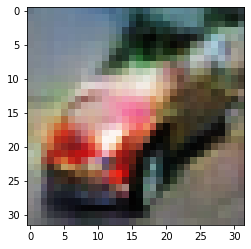

-> Epoch 267, Batch numero 1/78 -> Disc. loss on real images: 0.24960, Disc. loss on fake images: 0.34993, Generator loss: 2.19796
-> Epoch 267, Batch numero 2/78 -> Disc. loss on real images: 0.43964, Disc. loss on fake images: 0.31129, Generator loss: 2.24586
-> Epoch 267, Batch numero 3/78 -> Disc. loss on real images: 0.25902, Disc. loss on fake images: 0.25509, Generator loss: 2.24797
-> Epoch 267, Batch numero 4/78 -> Disc. loss on real images: 0.24709, Disc. loss on fake images: 0.43610, Generator loss: 2.31609
-> Epoch 267, Batch numero 5/78 -> Disc. loss on real images: 0.40706, Disc. loss on fake images: 0.36329, Generator loss: 2.16232
-> Epoch 267, Batch numero 6/78 -> Disc. loss on real images: 0.28019, Disc. loss on fake images: 0.40048, Generator loss: 2.62956
-> Epoch 267, Batch numero 7/78 -> Disc. loss on real images: 0.59135, Disc. loss on fake images: 0.57915, Generator loss: 2.36160
-> Epoch 267, Batch numero 8/78 -> Disc. loss on real images: 0.34732, Disc. loss o

-> Epoch 267, Batch numero 64/78 -> Disc. loss on real images: 0.41021, Disc. loss on fake images: 0.37603, Generator loss: 1.97963
-> Epoch 267, Batch numero 65/78 -> Disc. loss on real images: 0.28627, Disc. loss on fake images: 0.40131, Generator loss: 2.02893
-> Epoch 267, Batch numero 66/78 -> Disc. loss on real images: 0.22981, Disc. loss on fake images: 0.32569, Generator loss: 2.08394
-> Epoch 267, Batch numero 67/78 -> Disc. loss on real images: 0.30183, Disc. loss on fake images: 0.29658, Generator loss: 2.14429
-> Epoch 267, Batch numero 68/78 -> Disc. loss on real images: 0.16532, Disc. loss on fake images: 0.33819, Generator loss: 2.54688
-> Epoch 267, Batch numero 69/78 -> Disc. loss on real images: 0.36440, Disc. loss on fake images: 0.36870, Generator loss: 2.49141
-> Epoch 267, Batch numero 70/78 -> Disc. loss on real images: 0.35180, Disc. loss on fake images: 0.35151, Generator loss: 2.50533
-> Epoch 267, Batch numero 71/78 -> Disc. loss on real images: 0.29185, Disc

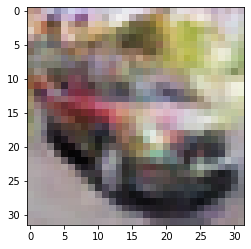

-> Epoch 268, Batch numero 1/78 -> Disc. loss on real images: 0.32661, Disc. loss on fake images: 0.28498, Generator loss: 2.36246
-> Epoch 268, Batch numero 2/78 -> Disc. loss on real images: 0.27002, Disc. loss on fake images: 0.37883, Generator loss: 2.60532
-> Epoch 268, Batch numero 3/78 -> Disc. loss on real images: 0.38803, Disc. loss on fake images: 0.28736, Generator loss: 2.25290
-> Epoch 268, Batch numero 4/78 -> Disc. loss on real images: 0.27170, Disc. loss on fake images: 0.28353, Generator loss: 2.35717
-> Epoch 268, Batch numero 5/78 -> Disc. loss on real images: 0.33967, Disc. loss on fake images: 0.42686, Generator loss: 2.38171
-> Epoch 268, Batch numero 6/78 -> Disc. loss on real images: 0.29641, Disc. loss on fake images: 0.39872, Generator loss: 2.46544
-> Epoch 268, Batch numero 7/78 -> Disc. loss on real images: 0.37863, Disc. loss on fake images: 0.28601, Generator loss: 2.49769
-> Epoch 268, Batch numero 8/78 -> Disc. loss on real images: 0.47660, Disc. loss o

-> Epoch 268, Batch numero 64/78 -> Disc. loss on real images: 0.24479, Disc. loss on fake images: 0.31185, Generator loss: 1.81913
-> Epoch 268, Batch numero 65/78 -> Disc. loss on real images: 0.25862, Disc. loss on fake images: 0.40891, Generator loss: 2.41190
-> Epoch 268, Batch numero 66/78 -> Disc. loss on real images: 0.48820, Disc. loss on fake images: 0.43443, Generator loss: 2.36109
-> Epoch 268, Batch numero 67/78 -> Disc. loss on real images: 0.38594, Disc. loss on fake images: 0.26455, Generator loss: 2.43444
-> Epoch 268, Batch numero 68/78 -> Disc. loss on real images: 0.44329, Disc. loss on fake images: 0.35734, Generator loss: 2.23658
-> Epoch 268, Batch numero 69/78 -> Disc. loss on real images: 0.29936, Disc. loss on fake images: 0.37806, Generator loss: 2.45148
-> Epoch 268, Batch numero 70/78 -> Disc. loss on real images: 0.29468, Disc. loss on fake images: 0.27227, Generator loss: 2.44020
-> Epoch 268, Batch numero 71/78 -> Disc. loss on real images: 0.36414, Disc

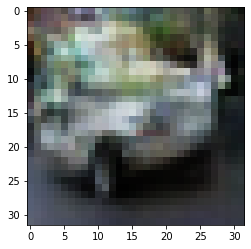

-> Epoch 269, Batch numero 1/78 -> Disc. loss on real images: 0.24464, Disc. loss on fake images: 0.41141, Generator loss: 2.44680
-> Epoch 269, Batch numero 2/78 -> Disc. loss on real images: 0.36114, Disc. loss on fake images: 0.20104, Generator loss: 2.39076
-> Epoch 269, Batch numero 3/78 -> Disc. loss on real images: 0.29040, Disc. loss on fake images: 0.36063, Generator loss: 2.19193
-> Epoch 269, Batch numero 4/78 -> Disc. loss on real images: 0.42138, Disc. loss on fake images: 0.42814, Generator loss: 2.19377
-> Epoch 269, Batch numero 5/78 -> Disc. loss on real images: 0.35327, Disc. loss on fake images: 0.28595, Generator loss: 2.17860
-> Epoch 269, Batch numero 6/78 -> Disc. loss on real images: 0.28620, Disc. loss on fake images: 0.45382, Generator loss: 2.45645
-> Epoch 269, Batch numero 7/78 -> Disc. loss on real images: 0.25680, Disc. loss on fake images: 0.34585, Generator loss: 2.26494
-> Epoch 269, Batch numero 8/78 -> Disc. loss on real images: 0.31970, Disc. loss o

-> Epoch 269, Batch numero 64/78 -> Disc. loss on real images: 0.28115, Disc. loss on fake images: 0.50413, Generator loss: 2.05777
-> Epoch 269, Batch numero 65/78 -> Disc. loss on real images: 0.49430, Disc. loss on fake images: 0.31660, Generator loss: 2.11648
-> Epoch 269, Batch numero 66/78 -> Disc. loss on real images: 0.30563, Disc. loss on fake images: 0.46446, Generator loss: 2.21062
-> Epoch 269, Batch numero 67/78 -> Disc. loss on real images: 0.50708, Disc. loss on fake images: 0.35617, Generator loss: 2.16070
-> Epoch 269, Batch numero 68/78 -> Disc. loss on real images: 0.28181, Disc. loss on fake images: 0.48253, Generator loss: 2.15131
-> Epoch 269, Batch numero 69/78 -> Disc. loss on real images: 0.26607, Disc. loss on fake images: 0.35058, Generator loss: 2.42073
-> Epoch 269, Batch numero 70/78 -> Disc. loss on real images: 0.53152, Disc. loss on fake images: 0.25940, Generator loss: 2.19302
-> Epoch 269, Batch numero 71/78 -> Disc. loss on real images: 0.53378, Disc

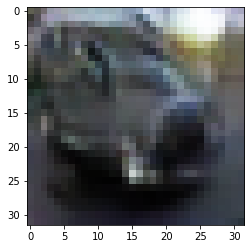

-> Epoch 270, Batch numero 1/78 -> Disc. loss on real images: 0.26785, Disc. loss on fake images: 0.31962, Generator loss: 2.39171
-> Epoch 270, Batch numero 2/78 -> Disc. loss on real images: 0.35295, Disc. loss on fake images: 0.32482, Generator loss: 2.26288
-> Epoch 270, Batch numero 3/78 -> Disc. loss on real images: 0.41640, Disc. loss on fake images: 0.32377, Generator loss: 2.04030
-> Epoch 270, Batch numero 4/78 -> Disc. loss on real images: 0.43304, Disc. loss on fake images: 0.37904, Generator loss: 2.51482
-> Epoch 270, Batch numero 5/78 -> Disc. loss on real images: 0.29080, Disc. loss on fake images: 0.31871, Generator loss: 2.13238
-> Epoch 270, Batch numero 6/78 -> Disc. loss on real images: 0.29476, Disc. loss on fake images: 0.29434, Generator loss: 2.24275
-> Epoch 270, Batch numero 7/78 -> Disc. loss on real images: 0.27687, Disc. loss on fake images: 0.42871, Generator loss: 2.41637
-> Epoch 270, Batch numero 8/78 -> Disc. loss on real images: 0.33414, Disc. loss o

-> Epoch 270, Batch numero 64/78 -> Disc. loss on real images: 0.33402, Disc. loss on fake images: 0.55347, Generator loss: 2.25221
-> Epoch 270, Batch numero 65/78 -> Disc. loss on real images: 0.50277, Disc. loss on fake images: 0.24673, Generator loss: 2.15746
-> Epoch 270, Batch numero 66/78 -> Disc. loss on real images: 0.37257, Disc. loss on fake images: 0.25886, Generator loss: 1.99118
-> Epoch 270, Batch numero 67/78 -> Disc. loss on real images: 0.23426, Disc. loss on fake images: 0.51831, Generator loss: 2.27181
-> Epoch 270, Batch numero 68/78 -> Disc. loss on real images: 0.26498, Disc. loss on fake images: 0.33828, Generator loss: 2.24957
-> Epoch 270, Batch numero 69/78 -> Disc. loss on real images: 0.57495, Disc. loss on fake images: 0.41074, Generator loss: 2.45388
-> Epoch 270, Batch numero 70/78 -> Disc. loss on real images: 0.31550, Disc. loss on fake images: 0.42368, Generator loss: 2.37231
-> Epoch 270, Batch numero 71/78 -> Disc. loss on real images: 0.49133, Disc

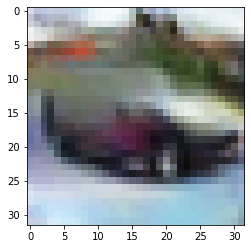

-> Epoch 271, Batch numero 1/78 -> Disc. loss on real images: 0.28820, Disc. loss on fake images: 0.37923, Generator loss: 2.75007
-> Epoch 271, Batch numero 2/78 -> Disc. loss on real images: 0.37225, Disc. loss on fake images: 0.33907, Generator loss: 2.61851
-> Epoch 271, Batch numero 3/78 -> Disc. loss on real images: 0.70544, Disc. loss on fake images: 0.35199, Generator loss: 2.22357
-> Epoch 271, Batch numero 4/78 -> Disc. loss on real images: 0.34981, Disc. loss on fake images: 0.39768, Generator loss: 2.03174
-> Epoch 271, Batch numero 5/78 -> Disc. loss on real images: 0.38824, Disc. loss on fake images: 0.32795, Generator loss: 2.19252
-> Epoch 271, Batch numero 6/78 -> Disc. loss on real images: 0.41179, Disc. loss on fake images: 0.54488, Generator loss: 2.02655
-> Epoch 271, Batch numero 7/78 -> Disc. loss on real images: 0.27027, Disc. loss on fake images: 0.49539, Generator loss: 2.59562
-> Epoch 271, Batch numero 8/78 -> Disc. loss on real images: 0.47568, Disc. loss o

-> Epoch 271, Batch numero 64/78 -> Disc. loss on real images: 0.22442, Disc. loss on fake images: 0.23345, Generator loss: 2.37518
-> Epoch 271, Batch numero 65/78 -> Disc. loss on real images: 0.28696, Disc. loss on fake images: 0.29162, Generator loss: 2.40683
-> Epoch 271, Batch numero 66/78 -> Disc. loss on real images: 0.37045, Disc. loss on fake images: 0.27569, Generator loss: 2.16849
-> Epoch 271, Batch numero 67/78 -> Disc. loss on real images: 0.49929, Disc. loss on fake images: 0.35722, Generator loss: 2.08093
-> Epoch 271, Batch numero 68/78 -> Disc. loss on real images: 0.21385, Disc. loss on fake images: 0.58550, Generator loss: 2.21245
-> Epoch 271, Batch numero 69/78 -> Disc. loss on real images: 0.35330, Disc. loss on fake images: 0.16900, Generator loss: 2.05499
-> Epoch 271, Batch numero 70/78 -> Disc. loss on real images: 0.16196, Disc. loss on fake images: 0.48503, Generator loss: 2.36329
-> Epoch 271, Batch numero 71/78 -> Disc. loss on real images: 0.21239, Disc

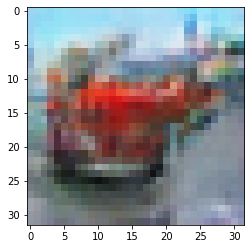

-> Epoch 272, Batch numero 1/78 -> Disc. loss on real images: 0.33039, Disc. loss on fake images: 0.56700, Generator loss: 2.75310
-> Epoch 272, Batch numero 2/78 -> Disc. loss on real images: 0.53371, Disc. loss on fake images: 0.26268, Generator loss: 2.62272
-> Epoch 272, Batch numero 3/78 -> Disc. loss on real images: 0.37156, Disc. loss on fake images: 0.32588, Generator loss: 2.35910
-> Epoch 272, Batch numero 4/78 -> Disc. loss on real images: 0.19825, Disc. loss on fake images: 0.23645, Generator loss: 2.09337
-> Epoch 272, Batch numero 5/78 -> Disc. loss on real images: 0.26470, Disc. loss on fake images: 0.27965, Generator loss: 2.29640
-> Epoch 272, Batch numero 6/78 -> Disc. loss on real images: 0.30732, Disc. loss on fake images: 0.41108, Generator loss: 2.35710
-> Epoch 272, Batch numero 7/78 -> Disc. loss on real images: 0.28360, Disc. loss on fake images: 0.31061, Generator loss: 2.37281
-> Epoch 272, Batch numero 8/78 -> Disc. loss on real images: 0.28973, Disc. loss o

-> Epoch 272, Batch numero 64/78 -> Disc. loss on real images: 0.34690, Disc. loss on fake images: 0.19963, Generator loss: 2.08257
-> Epoch 272, Batch numero 65/78 -> Disc. loss on real images: 0.17910, Disc. loss on fake images: 0.46550, Generator loss: 1.99123
-> Epoch 272, Batch numero 66/78 -> Disc. loss on real images: 0.25625, Disc. loss on fake images: 0.37259, Generator loss: 2.62008
-> Epoch 272, Batch numero 67/78 -> Disc. loss on real images: 0.54243, Disc. loss on fake images: 0.23959, Generator loss: 2.36134
-> Epoch 272, Batch numero 68/78 -> Disc. loss on real images: 0.37953, Disc. loss on fake images: 0.26537, Generator loss: 2.10274
-> Epoch 272, Batch numero 69/78 -> Disc. loss on real images: 0.26325, Disc. loss on fake images: 0.55180, Generator loss: 2.19187
-> Epoch 272, Batch numero 70/78 -> Disc. loss on real images: 0.29771, Disc. loss on fake images: 0.23421, Generator loss: 2.39804
-> Epoch 272, Batch numero 71/78 -> Disc. loss on real images: 0.45808, Disc

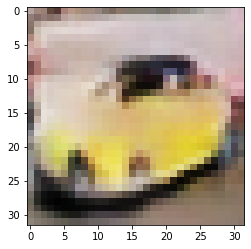

-> Epoch 273, Batch numero 1/78 -> Disc. loss on real images: 0.33226, Disc. loss on fake images: 0.18298, Generator loss: 2.06084
-> Epoch 273, Batch numero 2/78 -> Disc. loss on real images: 0.31861, Disc. loss on fake images: 0.42778, Generator loss: 2.35624
-> Epoch 273, Batch numero 3/78 -> Disc. loss on real images: 0.29206, Disc. loss on fake images: 0.48652, Generator loss: 2.15295
-> Epoch 273, Batch numero 4/78 -> Disc. loss on real images: 0.44792, Disc. loss on fake images: 0.30764, Generator loss: 2.08855
-> Epoch 273, Batch numero 5/78 -> Disc. loss on real images: 0.40703, Disc. loss on fake images: 0.29878, Generator loss: 1.84277
-> Epoch 273, Batch numero 6/78 -> Disc. loss on real images: 0.27058, Disc. loss on fake images: 0.37250, Generator loss: 2.07068
-> Epoch 273, Batch numero 7/78 -> Disc. loss on real images: 0.25198, Disc. loss on fake images: 0.31519, Generator loss: 2.22059
-> Epoch 273, Batch numero 8/78 -> Disc. loss on real images: 0.33490, Disc. loss o

-> Epoch 273, Batch numero 64/78 -> Disc. loss on real images: 0.45641, Disc. loss on fake images: 0.34138, Generator loss: 2.22999
-> Epoch 273, Batch numero 65/78 -> Disc. loss on real images: 0.38676, Disc. loss on fake images: 0.58744, Generator loss: 2.68366
-> Epoch 273, Batch numero 66/78 -> Disc. loss on real images: 0.45860, Disc. loss on fake images: 0.16672, Generator loss: 2.36433
-> Epoch 273, Batch numero 67/78 -> Disc. loss on real images: 0.31871, Disc. loss on fake images: 0.28613, Generator loss: 2.41963
-> Epoch 273, Batch numero 68/78 -> Disc. loss on real images: 0.39655, Disc. loss on fake images: 0.32997, Generator loss: 2.46868
-> Epoch 273, Batch numero 69/78 -> Disc. loss on real images: 0.36350, Disc. loss on fake images: 0.25404, Generator loss: 2.04603
-> Epoch 273, Batch numero 70/78 -> Disc. loss on real images: 0.30831, Disc. loss on fake images: 0.38538, Generator loss: 2.09373
-> Epoch 273, Batch numero 71/78 -> Disc. loss on real images: 0.25359, Disc

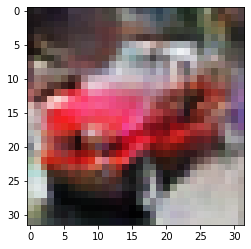

-> Epoch 274, Batch numero 1/78 -> Disc. loss on real images: 0.52031, Disc. loss on fake images: 0.34809, Generator loss: 2.29807
-> Epoch 274, Batch numero 2/78 -> Disc. loss on real images: 0.45094, Disc. loss on fake images: 0.56379, Generator loss: 2.19053
-> Epoch 274, Batch numero 3/78 -> Disc. loss on real images: 0.20373, Disc. loss on fake images: 0.28240, Generator loss: 2.22961
-> Epoch 274, Batch numero 4/78 -> Disc. loss on real images: 0.48550, Disc. loss on fake images: 0.54550, Generator loss: 2.51108
-> Epoch 274, Batch numero 5/78 -> Disc. loss on real images: 0.34472, Disc. loss on fake images: 0.36104, Generator loss: 2.25137
-> Epoch 274, Batch numero 6/78 -> Disc. loss on real images: 0.35464, Disc. loss on fake images: 0.34391, Generator loss: 2.29662
-> Epoch 274, Batch numero 7/78 -> Disc. loss on real images: 0.33207, Disc. loss on fake images: 0.34090, Generator loss: 2.15916
-> Epoch 274, Batch numero 8/78 -> Disc. loss on real images: 0.25974, Disc. loss o

-> Epoch 274, Batch numero 64/78 -> Disc. loss on real images: 0.25239, Disc. loss on fake images: 0.26093, Generator loss: 2.61277
-> Epoch 274, Batch numero 65/78 -> Disc. loss on real images: 0.28022, Disc. loss on fake images: 0.37053, Generator loss: 2.81841
-> Epoch 274, Batch numero 66/78 -> Disc. loss on real images: 0.26310, Disc. loss on fake images: 0.27381, Generator loss: 2.57796
-> Epoch 274, Batch numero 67/78 -> Disc. loss on real images: 0.43169, Disc. loss on fake images: 0.28703, Generator loss: 2.38073
-> Epoch 274, Batch numero 68/78 -> Disc. loss on real images: 0.48406, Disc. loss on fake images: 0.38140, Generator loss: 2.09929
-> Epoch 274, Batch numero 69/78 -> Disc. loss on real images: 0.20466, Disc. loss on fake images: 0.45722, Generator loss: 2.50163
-> Epoch 274, Batch numero 70/78 -> Disc. loss on real images: 0.35877, Disc. loss on fake images: 0.42053, Generator loss: 2.39134
-> Epoch 274, Batch numero 71/78 -> Disc. loss on real images: 0.34358, Disc

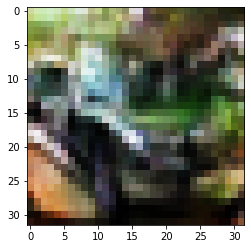

-> Epoch 275, Batch numero 1/78 -> Disc. loss on real images: 0.50407, Disc. loss on fake images: 0.33890, Generator loss: 2.24231
-> Epoch 275, Batch numero 2/78 -> Disc. loss on real images: 0.23324, Disc. loss on fake images: 0.39556, Generator loss: 2.53851
-> Epoch 275, Batch numero 3/78 -> Disc. loss on real images: 0.38787, Disc. loss on fake images: 0.23439, Generator loss: 2.87122
-> Epoch 275, Batch numero 4/78 -> Disc. loss on real images: 0.32413, Disc. loss on fake images: 0.20710, Generator loss: 2.73764
-> Epoch 275, Batch numero 5/78 -> Disc. loss on real images: 0.24983, Disc. loss on fake images: 0.24773, Generator loss: 2.40010
-> Epoch 275, Batch numero 6/78 -> Disc. loss on real images: 0.33538, Disc. loss on fake images: 0.56931, Generator loss: 2.37050
-> Epoch 275, Batch numero 7/78 -> Disc. loss on real images: 0.28005, Disc. loss on fake images: 0.46069, Generator loss: 2.64465
-> Epoch 275, Batch numero 8/78 -> Disc. loss on real images: 0.35237, Disc. loss o

-> Epoch 275, Batch numero 64/78 -> Disc. loss on real images: 0.12326, Disc. loss on fake images: 0.21947, Generator loss: 2.50716
-> Epoch 275, Batch numero 65/78 -> Disc. loss on real images: 0.58144, Disc. loss on fake images: 0.39673, Generator loss: 2.19319
-> Epoch 275, Batch numero 66/78 -> Disc. loss on real images: 0.43822, Disc. loss on fake images: 0.34396, Generator loss: 2.52519
-> Epoch 275, Batch numero 67/78 -> Disc. loss on real images: 0.38643, Disc. loss on fake images: 0.33058, Generator loss: 2.34341
-> Epoch 275, Batch numero 68/78 -> Disc. loss on real images: 0.41305, Disc. loss on fake images: 0.63118, Generator loss: 2.30945
-> Epoch 275, Batch numero 69/78 -> Disc. loss on real images: 0.31159, Disc. loss on fake images: 0.31802, Generator loss: 2.44702
-> Epoch 275, Batch numero 70/78 -> Disc. loss on real images: 0.50951, Disc. loss on fake images: 0.30216, Generator loss: 2.53978
-> Epoch 275, Batch numero 71/78 -> Disc. loss on real images: 0.36580, Disc

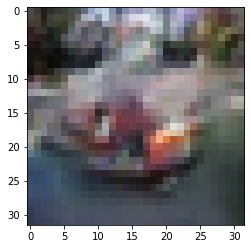

-> Epoch 276, Batch numero 1/78 -> Disc. loss on real images: 0.40888, Disc. loss on fake images: 0.25285, Generator loss: 2.08287
-> Epoch 276, Batch numero 2/78 -> Disc. loss on real images: 0.33691, Disc. loss on fake images: 0.43361, Generator loss: 2.47313
-> Epoch 276, Batch numero 3/78 -> Disc. loss on real images: 0.39587, Disc. loss on fake images: 0.21931, Generator loss: 2.19078
-> Epoch 276, Batch numero 4/78 -> Disc. loss on real images: 0.29597, Disc. loss on fake images: 0.58850, Generator loss: 2.27334
-> Epoch 276, Batch numero 5/78 -> Disc. loss on real images: 0.28451, Disc. loss on fake images: 0.25665, Generator loss: 2.36680
-> Epoch 276, Batch numero 6/78 -> Disc. loss on real images: 0.38477, Disc. loss on fake images: 0.35252, Generator loss: 2.52715
-> Epoch 276, Batch numero 7/78 -> Disc. loss on real images: 0.34800, Disc. loss on fake images: 0.26672, Generator loss: 2.47099
-> Epoch 276, Batch numero 8/78 -> Disc. loss on real images: 0.37389, Disc. loss o

-> Epoch 276, Batch numero 64/78 -> Disc. loss on real images: 0.26746, Disc. loss on fake images: 0.47848, Generator loss: 2.35762
-> Epoch 276, Batch numero 65/78 -> Disc. loss on real images: 0.42090, Disc. loss on fake images: 0.48903, Generator loss: 2.00417
-> Epoch 276, Batch numero 66/78 -> Disc. loss on real images: 0.25157, Disc. loss on fake images: 0.29665, Generator loss: 2.39900
-> Epoch 276, Batch numero 67/78 -> Disc. loss on real images: 0.30621, Disc. loss on fake images: 0.21724, Generator loss: 2.04938
-> Epoch 276, Batch numero 68/78 -> Disc. loss on real images: 0.27108, Disc. loss on fake images: 0.42307, Generator loss: 2.19822
-> Epoch 276, Batch numero 69/78 -> Disc. loss on real images: 0.44101, Disc. loss on fake images: 0.40795, Generator loss: 2.40714
-> Epoch 276, Batch numero 70/78 -> Disc. loss on real images: 0.39182, Disc. loss on fake images: 0.37492, Generator loss: 2.46306
-> Epoch 276, Batch numero 71/78 -> Disc. loss on real images: 0.42029, Disc

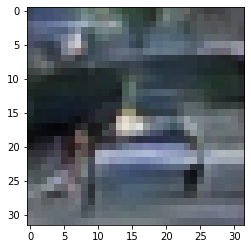

-> Epoch 277, Batch numero 1/78 -> Disc. loss on real images: 0.56491, Disc. loss on fake images: 0.47832, Generator loss: 2.11024
-> Epoch 277, Batch numero 2/78 -> Disc. loss on real images: 0.37682, Disc. loss on fake images: 0.34593, Generator loss: 2.24312
-> Epoch 277, Batch numero 3/78 -> Disc. loss on real images: 0.33831, Disc. loss on fake images: 0.86608, Generator loss: 2.34988
-> Epoch 277, Batch numero 4/78 -> Disc. loss on real images: 0.23482, Disc. loss on fake images: 0.48999, Generator loss: 2.70425
-> Epoch 277, Batch numero 5/78 -> Disc. loss on real images: 0.46459, Disc. loss on fake images: 0.19190, Generator loss: 2.59691
-> Epoch 277, Batch numero 6/78 -> Disc. loss on real images: 0.30550, Disc. loss on fake images: 0.30140, Generator loss: 2.48988
-> Epoch 277, Batch numero 7/78 -> Disc. loss on real images: 0.37678, Disc. loss on fake images: 0.54520, Generator loss: 2.22258
-> Epoch 277, Batch numero 8/78 -> Disc. loss on real images: 0.18749, Disc. loss o

-> Epoch 277, Batch numero 64/78 -> Disc. loss on real images: 0.16185, Disc. loss on fake images: 0.33627, Generator loss: 2.49049
-> Epoch 277, Batch numero 65/78 -> Disc. loss on real images: 0.25913, Disc. loss on fake images: 0.30735, Generator loss: 2.63275
-> Epoch 277, Batch numero 66/78 -> Disc. loss on real images: 0.34204, Disc. loss on fake images: 0.29894, Generator loss: 2.40857
-> Epoch 277, Batch numero 67/78 -> Disc. loss on real images: 0.35231, Disc. loss on fake images: 0.26369, Generator loss: 2.63557
-> Epoch 277, Batch numero 68/78 -> Disc. loss on real images: 0.43620, Disc. loss on fake images: 0.39132, Generator loss: 2.29940
-> Epoch 277, Batch numero 69/78 -> Disc. loss on real images: 0.59114, Disc. loss on fake images: 0.41374, Generator loss: 1.72653
-> Epoch 277, Batch numero 70/78 -> Disc. loss on real images: 0.20852, Disc. loss on fake images: 0.44294, Generator loss: 2.40947
-> Epoch 277, Batch numero 71/78 -> Disc. loss on real images: 0.31771, Disc

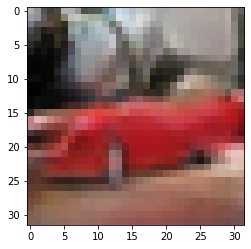

-> Epoch 278, Batch numero 1/78 -> Disc. loss on real images: 0.27471, Disc. loss on fake images: 0.28278, Generator loss: 2.22140
-> Epoch 278, Batch numero 2/78 -> Disc. loss on real images: 0.33184, Disc. loss on fake images: 0.48344, Generator loss: 2.51716
-> Epoch 278, Batch numero 3/78 -> Disc. loss on real images: 0.34307, Disc. loss on fake images: 0.10301, Generator loss: 2.38723
-> Epoch 278, Batch numero 4/78 -> Disc. loss on real images: 0.16810, Disc. loss on fake images: 0.30386, Generator loss: 2.60635
-> Epoch 278, Batch numero 5/78 -> Disc. loss on real images: 0.28316, Disc. loss on fake images: 0.35346, Generator loss: 2.31285
-> Epoch 278, Batch numero 6/78 -> Disc. loss on real images: 0.39653, Disc. loss on fake images: 0.33602, Generator loss: 2.57680
-> Epoch 278, Batch numero 7/78 -> Disc. loss on real images: 0.42821, Disc. loss on fake images: 0.29115, Generator loss: 2.47635
-> Epoch 278, Batch numero 8/78 -> Disc. loss on real images: 0.39859, Disc. loss o

-> Epoch 278, Batch numero 64/78 -> Disc. loss on real images: 0.31188, Disc. loss on fake images: 0.42078, Generator loss: 2.45429
-> Epoch 278, Batch numero 65/78 -> Disc. loss on real images: 0.41882, Disc. loss on fake images: 0.26245, Generator loss: 1.83979
-> Epoch 278, Batch numero 66/78 -> Disc. loss on real images: 0.26480, Disc. loss on fake images: 0.29033, Generator loss: 2.27311
-> Epoch 278, Batch numero 67/78 -> Disc. loss on real images: 0.26913, Disc. loss on fake images: 0.36383, Generator loss: 2.07557
-> Epoch 278, Batch numero 68/78 -> Disc. loss on real images: 0.28690, Disc. loss on fake images: 0.39235, Generator loss: 2.20635
-> Epoch 278, Batch numero 69/78 -> Disc. loss on real images: 0.29179, Disc. loss on fake images: 0.22815, Generator loss: 2.23618
-> Epoch 278, Batch numero 70/78 -> Disc. loss on real images: 0.46365, Disc. loss on fake images: 0.44468, Generator loss: 2.17410
-> Epoch 278, Batch numero 71/78 -> Disc. loss on real images: 0.31790, Disc

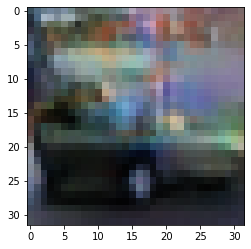

-> Epoch 279, Batch numero 1/78 -> Disc. loss on real images: 0.25065, Disc. loss on fake images: 0.24909, Generator loss: 2.61180
-> Epoch 279, Batch numero 2/78 -> Disc. loss on real images: 0.35446, Disc. loss on fake images: 0.57022, Generator loss: 2.32084
-> Epoch 279, Batch numero 3/78 -> Disc. loss on real images: 0.29689, Disc. loss on fake images: 0.32316, Generator loss: 2.09220
-> Epoch 279, Batch numero 4/78 -> Disc. loss on real images: 0.37932, Disc. loss on fake images: 0.32052, Generator loss: 2.40751
-> Epoch 279, Batch numero 5/78 -> Disc. loss on real images: 0.22479, Disc. loss on fake images: 0.22831, Generator loss: 2.47520
-> Epoch 279, Batch numero 6/78 -> Disc. loss on real images: 0.53685, Disc. loss on fake images: 0.34257, Generator loss: 1.99474
-> Epoch 279, Batch numero 7/78 -> Disc. loss on real images: 0.35773, Disc. loss on fake images: 0.51890, Generator loss: 2.13430
-> Epoch 279, Batch numero 8/78 -> Disc. loss on real images: 0.33576, Disc. loss o

-> Epoch 279, Batch numero 64/78 -> Disc. loss on real images: 0.40418, Disc. loss on fake images: 0.43410, Generator loss: 2.38732
-> Epoch 279, Batch numero 65/78 -> Disc. loss on real images: 0.38690, Disc. loss on fake images: 0.35430, Generator loss: 2.29072
-> Epoch 279, Batch numero 66/78 -> Disc. loss on real images: 0.28799, Disc. loss on fake images: 0.35988, Generator loss: 2.55266
-> Epoch 279, Batch numero 67/78 -> Disc. loss on real images: 0.37479, Disc. loss on fake images: 0.33733, Generator loss: 2.47514
-> Epoch 279, Batch numero 68/78 -> Disc. loss on real images: 0.55073, Disc. loss on fake images: 0.34964, Generator loss: 2.22589
-> Epoch 279, Batch numero 69/78 -> Disc. loss on real images: 0.24428, Disc. loss on fake images: 0.39593, Generator loss: 2.13428
-> Epoch 279, Batch numero 70/78 -> Disc. loss on real images: 0.24620, Disc. loss on fake images: 0.26078, Generator loss: 2.47040
-> Epoch 279, Batch numero 71/78 -> Disc. loss on real images: 0.43310, Disc

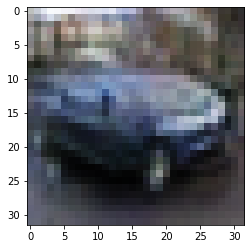

-> Epoch 280, Batch numero 1/78 -> Disc. loss on real images: 0.39972, Disc. loss on fake images: 0.36122, Generator loss: 2.46827
-> Epoch 280, Batch numero 2/78 -> Disc. loss on real images: 0.34756, Disc. loss on fake images: 0.37208, Generator loss: 2.28481
-> Epoch 280, Batch numero 3/78 -> Disc. loss on real images: 0.26249, Disc. loss on fake images: 0.35429, Generator loss: 2.59209
-> Epoch 280, Batch numero 4/78 -> Disc. loss on real images: 0.33522, Disc. loss on fake images: 0.35491, Generator loss: 2.61040
-> Epoch 280, Batch numero 5/78 -> Disc. loss on real images: 0.26471, Disc. loss on fake images: 0.22183, Generator loss: 2.56054
-> Epoch 280, Batch numero 6/78 -> Disc. loss on real images: 0.52661, Disc. loss on fake images: 0.40934, Generator loss: 2.47412
-> Epoch 280, Batch numero 7/78 -> Disc. loss on real images: 0.25865, Disc. loss on fake images: 0.18730, Generator loss: 2.30394
-> Epoch 280, Batch numero 8/78 -> Disc. loss on real images: 0.32627, Disc. loss o

-> Epoch 280, Batch numero 64/78 -> Disc. loss on real images: 0.28749, Disc. loss on fake images: 0.38920, Generator loss: 2.52002
-> Epoch 280, Batch numero 65/78 -> Disc. loss on real images: 0.35457, Disc. loss on fake images: 0.24235, Generator loss: 2.82273
-> Epoch 280, Batch numero 66/78 -> Disc. loss on real images: 0.32135, Disc. loss on fake images: 0.31193, Generator loss: 2.35993
-> Epoch 280, Batch numero 67/78 -> Disc. loss on real images: 0.35653, Disc. loss on fake images: 0.37767, Generator loss: 2.51829
-> Epoch 280, Batch numero 68/78 -> Disc. loss on real images: 0.21692, Disc. loss on fake images: 0.36381, Generator loss: 2.12909
-> Epoch 280, Batch numero 69/78 -> Disc. loss on real images: 0.37291, Disc. loss on fake images: 0.20962, Generator loss: 2.72834
-> Epoch 280, Batch numero 70/78 -> Disc. loss on real images: 0.31663, Disc. loss on fake images: 0.35300, Generator loss: 2.33287
-> Epoch 280, Batch numero 71/78 -> Disc. loss on real images: 0.24835, Disc

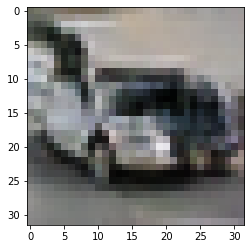

-> Epoch 281, Batch numero 1/78 -> Disc. loss on real images: 0.41820, Disc. loss on fake images: 0.24205, Generator loss: 2.34087
-> Epoch 281, Batch numero 2/78 -> Disc. loss on real images: 0.28065, Disc. loss on fake images: 0.41821, Generator loss: 2.38372
-> Epoch 281, Batch numero 3/78 -> Disc. loss on real images: 0.26580, Disc. loss on fake images: 0.32246, Generator loss: 2.23614
-> Epoch 281, Batch numero 4/78 -> Disc. loss on real images: 0.20092, Disc. loss on fake images: 0.28591, Generator loss: 2.41456
-> Epoch 281, Batch numero 5/78 -> Disc. loss on real images: 0.44475, Disc. loss on fake images: 0.40165, Generator loss: 2.47008
-> Epoch 281, Batch numero 6/78 -> Disc. loss on real images: 0.39279, Disc. loss on fake images: 0.41834, Generator loss: 2.85185
-> Epoch 281, Batch numero 7/78 -> Disc. loss on real images: 0.34790, Disc. loss on fake images: 0.25381, Generator loss: 2.82629
-> Epoch 281, Batch numero 8/78 -> Disc. loss on real images: 0.46452, Disc. loss o

-> Epoch 281, Batch numero 64/78 -> Disc. loss on real images: 0.23167, Disc. loss on fake images: 0.20345, Generator loss: 2.45906
-> Epoch 281, Batch numero 65/78 -> Disc. loss on real images: 0.25798, Disc. loss on fake images: 0.20968, Generator loss: 2.29434
-> Epoch 281, Batch numero 66/78 -> Disc. loss on real images: 0.26061, Disc. loss on fake images: 0.32959, Generator loss: 2.48394
-> Epoch 281, Batch numero 67/78 -> Disc. loss on real images: 0.31689, Disc. loss on fake images: 0.39045, Generator loss: 2.30342
-> Epoch 281, Batch numero 68/78 -> Disc. loss on real images: 0.25955, Disc. loss on fake images: 0.25370, Generator loss: 2.42340
-> Epoch 281, Batch numero 69/78 -> Disc. loss on real images: 0.26563, Disc. loss on fake images: 0.22446, Generator loss: 2.17462
-> Epoch 281, Batch numero 70/78 -> Disc. loss on real images: 0.45261, Disc. loss on fake images: 0.54225, Generator loss: 2.52987
-> Epoch 281, Batch numero 71/78 -> Disc. loss on real images: 0.33092, Disc

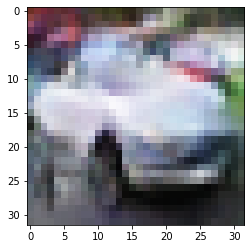

-> Epoch 282, Batch numero 1/78 -> Disc. loss on real images: 0.45222, Disc. loss on fake images: 0.49423, Generator loss: 2.37248
-> Epoch 282, Batch numero 2/78 -> Disc. loss on real images: 0.31238, Disc. loss on fake images: 0.42476, Generator loss: 2.45743
-> Epoch 282, Batch numero 3/78 -> Disc. loss on real images: 0.24960, Disc. loss on fake images: 0.20800, Generator loss: 2.54731
-> Epoch 282, Batch numero 4/78 -> Disc. loss on real images: 0.30290, Disc. loss on fake images: 0.33949, Generator loss: 2.82026
-> Epoch 282, Batch numero 5/78 -> Disc. loss on real images: 0.25923, Disc. loss on fake images: 0.24306, Generator loss: 2.39780
-> Epoch 282, Batch numero 6/78 -> Disc. loss on real images: 0.40159, Disc. loss on fake images: 0.15373, Generator loss: 2.42318
-> Epoch 282, Batch numero 7/78 -> Disc. loss on real images: 0.47078, Disc. loss on fake images: 0.40291, Generator loss: 2.26566
-> Epoch 282, Batch numero 8/78 -> Disc. loss on real images: 0.20051, Disc. loss o

-> Epoch 282, Batch numero 64/78 -> Disc. loss on real images: 0.39539, Disc. loss on fake images: 0.28833, Generator loss: 2.53530
-> Epoch 282, Batch numero 65/78 -> Disc. loss on real images: 0.38057, Disc. loss on fake images: 0.48232, Generator loss: 2.47300
-> Epoch 282, Batch numero 66/78 -> Disc. loss on real images: 0.44312, Disc. loss on fake images: 0.30735, Generator loss: 2.73576
-> Epoch 282, Batch numero 67/78 -> Disc. loss on real images: 0.32185, Disc. loss on fake images: 0.31728, Generator loss: 2.31271
-> Epoch 282, Batch numero 68/78 -> Disc. loss on real images: 0.32620, Disc. loss on fake images: 0.41717, Generator loss: 2.45475
-> Epoch 282, Batch numero 69/78 -> Disc. loss on real images: 0.42736, Disc. loss on fake images: 0.42514, Generator loss: 2.86208
-> Epoch 282, Batch numero 70/78 -> Disc. loss on real images: 0.44636, Disc. loss on fake images: 0.20923, Generator loss: 2.40456
-> Epoch 282, Batch numero 71/78 -> Disc. loss on real images: 0.25109, Disc

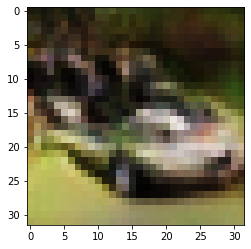

-> Epoch 283, Batch numero 1/78 -> Disc. loss on real images: 0.35300, Disc. loss on fake images: 0.28523, Generator loss: 2.40671
-> Epoch 283, Batch numero 2/78 -> Disc. loss on real images: 0.33372, Disc. loss on fake images: 0.28797, Generator loss: 1.85704
-> Epoch 283, Batch numero 3/78 -> Disc. loss on real images: 0.32852, Disc. loss on fake images: 0.33705, Generator loss: 1.97481
-> Epoch 283, Batch numero 4/78 -> Disc. loss on real images: 0.24970, Disc. loss on fake images: 0.24021, Generator loss: 2.46997
-> Epoch 283, Batch numero 5/78 -> Disc. loss on real images: 0.24486, Disc. loss on fake images: 0.28373, Generator loss: 2.09335
-> Epoch 283, Batch numero 6/78 -> Disc. loss on real images: 0.37813, Disc. loss on fake images: 0.42558, Generator loss: 2.33083
-> Epoch 283, Batch numero 7/78 -> Disc. loss on real images: 0.34768, Disc. loss on fake images: 0.46192, Generator loss: 2.26830
-> Epoch 283, Batch numero 8/78 -> Disc. loss on real images: 0.31365, Disc. loss o

-> Epoch 283, Batch numero 64/78 -> Disc. loss on real images: 0.26221, Disc. loss on fake images: 0.39951, Generator loss: 2.60812
-> Epoch 283, Batch numero 65/78 -> Disc. loss on real images: 0.41097, Disc. loss on fake images: 0.29846, Generator loss: 2.31858
-> Epoch 283, Batch numero 66/78 -> Disc. loss on real images: 0.29507, Disc. loss on fake images: 0.31414, Generator loss: 2.40277
-> Epoch 283, Batch numero 67/78 -> Disc. loss on real images: 0.33980, Disc. loss on fake images: 0.25860, Generator loss: 2.45312
-> Epoch 283, Batch numero 68/78 -> Disc. loss on real images: 0.32097, Disc. loss on fake images: 0.32036, Generator loss: 2.15759
-> Epoch 283, Batch numero 69/78 -> Disc. loss on real images: 0.23083, Disc. loss on fake images: 0.44144, Generator loss: 2.29736
-> Epoch 283, Batch numero 70/78 -> Disc. loss on real images: 0.30750, Disc. loss on fake images: 0.53216, Generator loss: 2.73241
-> Epoch 283, Batch numero 71/78 -> Disc. loss on real images: 0.28748, Disc

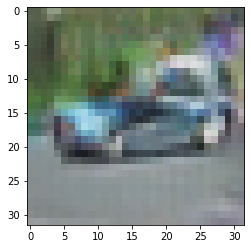

-> Epoch 284, Batch numero 1/78 -> Disc. loss on real images: 0.45774, Disc. loss on fake images: 0.22822, Generator loss: 2.46088
-> Epoch 284, Batch numero 2/78 -> Disc. loss on real images: 0.27339, Disc. loss on fake images: 0.38624, Generator loss: 2.56452
-> Epoch 284, Batch numero 3/78 -> Disc. loss on real images: 0.52488, Disc. loss on fake images: 0.48630, Generator loss: 2.44260
-> Epoch 284, Batch numero 4/78 -> Disc. loss on real images: 0.34234, Disc. loss on fake images: 0.50590, Generator loss: 2.32676
-> Epoch 284, Batch numero 5/78 -> Disc. loss on real images: 0.56222, Disc. loss on fake images: 0.45540, Generator loss: 2.32845
-> Epoch 284, Batch numero 6/78 -> Disc. loss on real images: 0.25349, Disc. loss on fake images: 0.24248, Generator loss: 2.57042
-> Epoch 284, Batch numero 7/78 -> Disc. loss on real images: 0.34052, Disc. loss on fake images: 0.34052, Generator loss: 2.32762
-> Epoch 284, Batch numero 8/78 -> Disc. loss on real images: 0.30201, Disc. loss o

-> Epoch 284, Batch numero 65/78 -> Disc. loss on real images: 0.39965, Disc. loss on fake images: 0.21387, Generator loss: 2.74089
-> Epoch 284, Batch numero 66/78 -> Disc. loss on real images: 0.22792, Disc. loss on fake images: 0.36528, Generator loss: 2.54269
-> Epoch 284, Batch numero 67/78 -> Disc. loss on real images: 0.26492, Disc. loss on fake images: 0.17748, Generator loss: 2.37538
-> Epoch 284, Batch numero 68/78 -> Disc. loss on real images: 0.26492, Disc. loss on fake images: 0.22910, Generator loss: 2.10994
-> Epoch 284, Batch numero 69/78 -> Disc. loss on real images: 0.40415, Disc. loss on fake images: 0.32495, Generator loss: 2.44248
-> Epoch 284, Batch numero 70/78 -> Disc. loss on real images: 0.33222, Disc. loss on fake images: 0.28460, Generator loss: 2.49421
-> Epoch 284, Batch numero 71/78 -> Disc. loss on real images: 0.43012, Disc. loss on fake images: 0.37605, Generator loss: 2.35881
-> Epoch 284, Batch numero 72/78 -> Disc. loss on real images: 0.20097, Disc

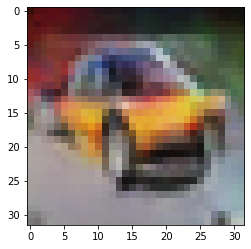

-> Epoch 285, Batch numero 1/78 -> Disc. loss on real images: 0.35121, Disc. loss on fake images: 0.48235, Generator loss: 2.43309
-> Epoch 285, Batch numero 2/78 -> Disc. loss on real images: 0.24359, Disc. loss on fake images: 0.18904, Generator loss: 2.49047
-> Epoch 285, Batch numero 3/78 -> Disc. loss on real images: 0.35669, Disc. loss on fake images: 0.30005, Generator loss: 2.43816
-> Epoch 285, Batch numero 4/78 -> Disc. loss on real images: 0.39184, Disc. loss on fake images: 0.25880, Generator loss: 2.27935
-> Epoch 285, Batch numero 5/78 -> Disc. loss on real images: 0.27738, Disc. loss on fake images: 0.43535, Generator loss: 2.08937
-> Epoch 285, Batch numero 6/78 -> Disc. loss on real images: 0.21288, Disc. loss on fake images: 0.29198, Generator loss: 2.53752
-> Epoch 285, Batch numero 7/78 -> Disc. loss on real images: 0.29427, Disc. loss on fake images: 0.58671, Generator loss: 2.55867
-> Epoch 285, Batch numero 8/78 -> Disc. loss on real images: 0.40085, Disc. loss o

-> Epoch 285, Batch numero 64/78 -> Disc. loss on real images: 0.22253, Disc. loss on fake images: 0.54123, Generator loss: 2.24721
-> Epoch 285, Batch numero 65/78 -> Disc. loss on real images: 0.28579, Disc. loss on fake images: 0.21562, Generator loss: 2.61055
-> Epoch 285, Batch numero 66/78 -> Disc. loss on real images: 0.37397, Disc. loss on fake images: 0.28780, Generator loss: 2.17503
-> Epoch 285, Batch numero 67/78 -> Disc. loss on real images: 0.32413, Disc. loss on fake images: 0.37622, Generator loss: 2.26043
-> Epoch 285, Batch numero 68/78 -> Disc. loss on real images: 0.31742, Disc. loss on fake images: 0.52051, Generator loss: 2.58928
-> Epoch 285, Batch numero 69/78 -> Disc. loss on real images: 0.26871, Disc. loss on fake images: 0.27780, Generator loss: 2.67892
-> Epoch 285, Batch numero 70/78 -> Disc. loss on real images: 0.72974, Disc. loss on fake images: 0.32483, Generator loss: 2.28654
-> Epoch 285, Batch numero 71/78 -> Disc. loss on real images: 0.23025, Disc

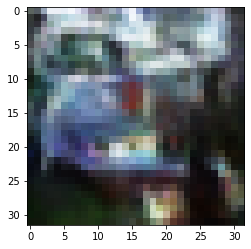

-> Epoch 286, Batch numero 1/78 -> Disc. loss on real images: 0.25579, Disc. loss on fake images: 0.32272, Generator loss: 2.36675
-> Epoch 286, Batch numero 2/78 -> Disc. loss on real images: 0.21129, Disc. loss on fake images: 0.30069, Generator loss: 2.46927
-> Epoch 286, Batch numero 3/78 -> Disc. loss on real images: 0.20831, Disc. loss on fake images: 0.22517, Generator loss: 2.73171
-> Epoch 286, Batch numero 4/78 -> Disc. loss on real images: 0.28260, Disc. loss on fake images: 0.25687, Generator loss: 2.54054
-> Epoch 286, Batch numero 5/78 -> Disc. loss on real images: 0.38080, Disc. loss on fake images: 0.31157, Generator loss: 2.40529
-> Epoch 286, Batch numero 6/78 -> Disc. loss on real images: 0.24336, Disc. loss on fake images: 0.37007, Generator loss: 2.53595
-> Epoch 286, Batch numero 7/78 -> Disc. loss on real images: 0.26590, Disc. loss on fake images: 0.20933, Generator loss: 2.31997
-> Epoch 286, Batch numero 8/78 -> Disc. loss on real images: 0.40846, Disc. loss o

-> Epoch 286, Batch numero 64/78 -> Disc. loss on real images: 0.45777, Disc. loss on fake images: 0.22538, Generator loss: 2.62637
-> Epoch 286, Batch numero 65/78 -> Disc. loss on real images: 0.41938, Disc. loss on fake images: 0.42731, Generator loss: 2.17833
-> Epoch 286, Batch numero 66/78 -> Disc. loss on real images: 0.32128, Disc. loss on fake images: 0.25529, Generator loss: 2.55596
-> Epoch 286, Batch numero 67/78 -> Disc. loss on real images: 0.30174, Disc. loss on fake images: 0.20297, Generator loss: 2.24279
-> Epoch 286, Batch numero 68/78 -> Disc. loss on real images: 0.22635, Disc. loss on fake images: 0.47110, Generator loss: 2.29993
-> Epoch 286, Batch numero 69/78 -> Disc. loss on real images: 0.30522, Disc. loss on fake images: 0.19226, Generator loss: 2.32453
-> Epoch 286, Batch numero 70/78 -> Disc. loss on real images: 0.31343, Disc. loss on fake images: 0.69492, Generator loss: 2.29500
-> Epoch 286, Batch numero 71/78 -> Disc. loss on real images: 0.15473, Disc

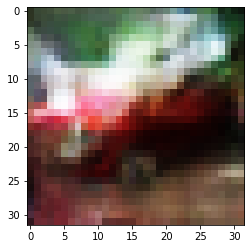

-> Epoch 287, Batch numero 1/78 -> Disc. loss on real images: 0.39701, Disc. loss on fake images: 0.30977, Generator loss: 2.34762
-> Epoch 287, Batch numero 2/78 -> Disc. loss on real images: 0.31701, Disc. loss on fake images: 0.46019, Generator loss: 2.47958
-> Epoch 287, Batch numero 3/78 -> Disc. loss on real images: 0.35905, Disc. loss on fake images: 0.28251, Generator loss: 2.33472
-> Epoch 287, Batch numero 4/78 -> Disc. loss on real images: 0.27445, Disc. loss on fake images: 0.18195, Generator loss: 2.30842
-> Epoch 287, Batch numero 5/78 -> Disc. loss on real images: 0.17980, Disc. loss on fake images: 0.23501, Generator loss: 2.07432
-> Epoch 287, Batch numero 6/78 -> Disc. loss on real images: 0.26632, Disc. loss on fake images: 0.30799, Generator loss: 2.36150
-> Epoch 287, Batch numero 7/78 -> Disc. loss on real images: 0.32891, Disc. loss on fake images: 0.49768, Generator loss: 2.45565
-> Epoch 287, Batch numero 8/78 -> Disc. loss on real images: 0.33437, Disc. loss o

-> Epoch 287, Batch numero 64/78 -> Disc. loss on real images: 0.41913, Disc. loss on fake images: 0.39310, Generator loss: 2.83867
-> Epoch 287, Batch numero 65/78 -> Disc. loss on real images: 0.32711, Disc. loss on fake images: 0.24335, Generator loss: 2.99348
-> Epoch 287, Batch numero 66/78 -> Disc. loss on real images: 0.49290, Disc. loss on fake images: 0.60607, Generator loss: 2.63800
-> Epoch 287, Batch numero 67/78 -> Disc. loss on real images: 0.31232, Disc. loss on fake images: 0.17436, Generator loss: 2.57182
-> Epoch 287, Batch numero 68/78 -> Disc. loss on real images: 0.43196, Disc. loss on fake images: 0.66816, Generator loss: 2.71742
-> Epoch 287, Batch numero 69/78 -> Disc. loss on real images: 0.41549, Disc. loss on fake images: 0.37478, Generator loss: 3.10362
-> Epoch 287, Batch numero 70/78 -> Disc. loss on real images: 0.37458, Disc. loss on fake images: 0.14773, Generator loss: 2.63942
-> Epoch 287, Batch numero 71/78 -> Disc. loss on real images: 0.20216, Disc

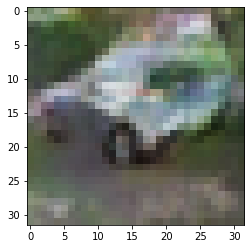

-> Epoch 288, Batch numero 1/78 -> Disc. loss on real images: 0.30890, Disc. loss on fake images: 0.35626, Generator loss: 1.99216
-> Epoch 288, Batch numero 2/78 -> Disc. loss on real images: 0.36697, Disc. loss on fake images: 0.37814, Generator loss: 2.11827
-> Epoch 288, Batch numero 3/78 -> Disc. loss on real images: 0.26112, Disc. loss on fake images: 0.41594, Generator loss: 2.26970
-> Epoch 288, Batch numero 4/78 -> Disc. loss on real images: 0.57769, Disc. loss on fake images: 0.34490, Generator loss: 2.47961
-> Epoch 288, Batch numero 5/78 -> Disc. loss on real images: 0.23427, Disc. loss on fake images: 0.30023, Generator loss: 2.50059
-> Epoch 288, Batch numero 6/78 -> Disc. loss on real images: 0.16987, Disc. loss on fake images: 0.36897, Generator loss: 2.69382
-> Epoch 288, Batch numero 7/78 -> Disc. loss on real images: 0.25253, Disc. loss on fake images: 0.29107, Generator loss: 2.35602
-> Epoch 288, Batch numero 8/78 -> Disc. loss on real images: 0.36843, Disc. loss o

-> Epoch 288, Batch numero 64/78 -> Disc. loss on real images: 0.55030, Disc. loss on fake images: 0.26763, Generator loss: 2.56782
-> Epoch 288, Batch numero 65/78 -> Disc. loss on real images: 0.20114, Disc. loss on fake images: 0.33082, Generator loss: 2.19165
-> Epoch 288, Batch numero 66/78 -> Disc. loss on real images: 0.22482, Disc. loss on fake images: 0.28429, Generator loss: 2.76039
-> Epoch 288, Batch numero 67/78 -> Disc. loss on real images: 0.39098, Disc. loss on fake images: 0.17669, Generator loss: 2.06841
-> Epoch 288, Batch numero 68/78 -> Disc. loss on real images: 0.30719, Disc. loss on fake images: 0.21857, Generator loss: 1.80808
-> Epoch 288, Batch numero 69/78 -> Disc. loss on real images: 0.21075, Disc. loss on fake images: 0.26559, Generator loss: 2.06588
-> Epoch 288, Batch numero 70/78 -> Disc. loss on real images: 0.22950, Disc. loss on fake images: 0.59057, Generator loss: 2.52982
-> Epoch 288, Batch numero 71/78 -> Disc. loss on real images: 0.24951, Disc

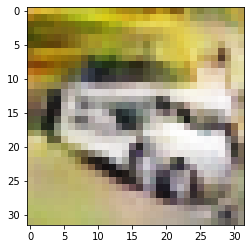

-> Epoch 289, Batch numero 1/78 -> Disc. loss on real images: 0.29001, Disc. loss on fake images: 0.18687, Generator loss: 2.53287
-> Epoch 289, Batch numero 2/78 -> Disc. loss on real images: 0.31551, Disc. loss on fake images: 0.42434, Generator loss: 2.35983
-> Epoch 289, Batch numero 3/78 -> Disc. loss on real images: 0.15369, Disc. loss on fake images: 0.31703, Generator loss: 2.82068
-> Epoch 289, Batch numero 4/78 -> Disc. loss on real images: 0.43702, Disc. loss on fake images: 0.23997, Generator loss: 2.86934
-> Epoch 289, Batch numero 5/78 -> Disc. loss on real images: 0.53025, Disc. loss on fake images: 0.26702, Generator loss: 2.51267
-> Epoch 289, Batch numero 6/78 -> Disc. loss on real images: 0.39233, Disc. loss on fake images: 0.40792, Generator loss: 2.35943
-> Epoch 289, Batch numero 7/78 -> Disc. loss on real images: 0.32853, Disc. loss on fake images: 0.33501, Generator loss: 2.29110
-> Epoch 289, Batch numero 8/78 -> Disc. loss on real images: 0.17123, Disc. loss o

-> Epoch 289, Batch numero 64/78 -> Disc. loss on real images: 0.29374, Disc. loss on fake images: 0.14209, Generator loss: 2.41340
-> Epoch 289, Batch numero 65/78 -> Disc. loss on real images: 0.37152, Disc. loss on fake images: 0.29192, Generator loss: 2.21292
-> Epoch 289, Batch numero 66/78 -> Disc. loss on real images: 0.51379, Disc. loss on fake images: 0.33449, Generator loss: 2.23543
-> Epoch 289, Batch numero 67/78 -> Disc. loss on real images: 0.20729, Disc. loss on fake images: 0.36701, Generator loss: 2.43262
-> Epoch 289, Batch numero 68/78 -> Disc. loss on real images: 0.17363, Disc. loss on fake images: 0.21292, Generator loss: 2.78678
-> Epoch 289, Batch numero 69/78 -> Disc. loss on real images: 0.37972, Disc. loss on fake images: 0.38094, Generator loss: 2.61829
-> Epoch 289, Batch numero 70/78 -> Disc. loss on real images: 0.42273, Disc. loss on fake images: 0.33967, Generator loss: 2.36369
-> Epoch 289, Batch numero 71/78 -> Disc. loss on real images: 0.24661, Disc

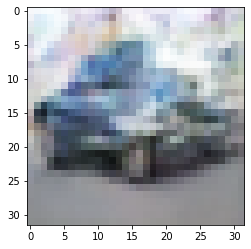

-> Epoch 290, Batch numero 1/78 -> Disc. loss on real images: 0.42241, Disc. loss on fake images: 0.40206, Generator loss: 2.66214
-> Epoch 290, Batch numero 2/78 -> Disc. loss on real images: 0.31328, Disc. loss on fake images: 0.31404, Generator loss: 2.86660
-> Epoch 290, Batch numero 3/78 -> Disc. loss on real images: 0.41948, Disc. loss on fake images: 0.27402, Generator loss: 2.35578
-> Epoch 290, Batch numero 4/78 -> Disc. loss on real images: 0.27699, Disc. loss on fake images: 0.31254, Generator loss: 2.22906
-> Epoch 290, Batch numero 5/78 -> Disc. loss on real images: 0.20978, Disc. loss on fake images: 0.28906, Generator loss: 2.59118
-> Epoch 290, Batch numero 6/78 -> Disc. loss on real images: 0.48565, Disc. loss on fake images: 0.55361, Generator loss: 2.48179
-> Epoch 290, Batch numero 7/78 -> Disc. loss on real images: 0.48163, Disc. loss on fake images: 0.24285, Generator loss: 2.18427
-> Epoch 290, Batch numero 8/78 -> Disc. loss on real images: 0.31189, Disc. loss o

-> Epoch 290, Batch numero 64/78 -> Disc. loss on real images: 0.27487, Disc. loss on fake images: 0.19276, Generator loss: 2.31275
-> Epoch 290, Batch numero 65/78 -> Disc. loss on real images: 0.38004, Disc. loss on fake images: 0.34380, Generator loss: 2.22133
-> Epoch 290, Batch numero 66/78 -> Disc. loss on real images: 0.29202, Disc. loss on fake images: 0.19922, Generator loss: 2.78028
-> Epoch 290, Batch numero 67/78 -> Disc. loss on real images: 0.25694, Disc. loss on fake images: 0.21311, Generator loss: 2.60353
-> Epoch 290, Batch numero 68/78 -> Disc. loss on real images: 0.19111, Disc. loss on fake images: 0.26036, Generator loss: 2.72254
-> Epoch 290, Batch numero 69/78 -> Disc. loss on real images: 0.39418, Disc. loss on fake images: 0.37294, Generator loss: 2.62724
-> Epoch 290, Batch numero 70/78 -> Disc. loss on real images: 0.28080, Disc. loss on fake images: 0.46220, Generator loss: 2.53881
-> Epoch 290, Batch numero 71/78 -> Disc. loss on real images: 0.38826, Disc

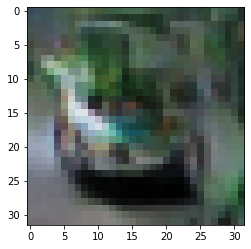

-> Epoch 291, Batch numero 1/78 -> Disc. loss on real images: 0.16255, Disc. loss on fake images: 0.33572, Generator loss: 2.48220
-> Epoch 291, Batch numero 2/78 -> Disc. loss on real images: 0.30686, Disc. loss on fake images: 0.22469, Generator loss: 2.59746
-> Epoch 291, Batch numero 3/78 -> Disc. loss on real images: 0.48870, Disc. loss on fake images: 0.27072, Generator loss: 2.03261
-> Epoch 291, Batch numero 4/78 -> Disc. loss on real images: 0.28856, Disc. loss on fake images: 0.37197, Generator loss: 2.21675
-> Epoch 291, Batch numero 5/78 -> Disc. loss on real images: 0.25439, Disc. loss on fake images: 0.41715, Generator loss: 2.51078
-> Epoch 291, Batch numero 6/78 -> Disc. loss on real images: 0.18871, Disc. loss on fake images: 0.24980, Generator loss: 2.55975
-> Epoch 291, Batch numero 7/78 -> Disc. loss on real images: 0.37466, Disc. loss on fake images: 0.38094, Generator loss: 2.86013
-> Epoch 291, Batch numero 8/78 -> Disc. loss on real images: 0.29560, Disc. loss o

-> Epoch 291, Batch numero 64/78 -> Disc. loss on real images: 0.24821, Disc. loss on fake images: 0.21479, Generator loss: 2.46143
-> Epoch 291, Batch numero 65/78 -> Disc. loss on real images: 0.46130, Disc. loss on fake images: 0.53648, Generator loss: 2.63904
-> Epoch 291, Batch numero 66/78 -> Disc. loss on real images: 0.22088, Disc. loss on fake images: 0.34139, Generator loss: 2.27133
-> Epoch 291, Batch numero 67/78 -> Disc. loss on real images: 0.34222, Disc. loss on fake images: 0.27414, Generator loss: 2.47113
-> Epoch 291, Batch numero 68/78 -> Disc. loss on real images: 0.27926, Disc. loss on fake images: 0.40733, Generator loss: 2.44596
-> Epoch 291, Batch numero 69/78 -> Disc. loss on real images: 0.43941, Disc. loss on fake images: 0.24047, Generator loss: 2.34372
-> Epoch 291, Batch numero 70/78 -> Disc. loss on real images: 0.19240, Disc. loss on fake images: 0.21447, Generator loss: 2.57635
-> Epoch 291, Batch numero 71/78 -> Disc. loss on real images: 0.16699, Disc

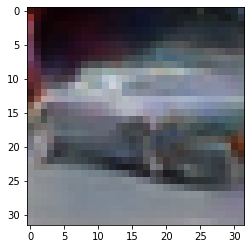

-> Epoch 292, Batch numero 1/78 -> Disc. loss on real images: 0.40574, Disc. loss on fake images: 0.31924, Generator loss: 2.07550
-> Epoch 292, Batch numero 2/78 -> Disc. loss on real images: 0.43002, Disc. loss on fake images: 0.52740, Generator loss: 2.25659
-> Epoch 292, Batch numero 3/78 -> Disc. loss on real images: 0.12664, Disc. loss on fake images: 0.49252, Generator loss: 2.52733
-> Epoch 292, Batch numero 4/78 -> Disc. loss on real images: 0.58814, Disc. loss on fake images: 0.26181, Generator loss: 2.36098
-> Epoch 292, Batch numero 5/78 -> Disc. loss on real images: 0.32519, Disc. loss on fake images: 0.32497, Generator loss: 2.31453
-> Epoch 292, Batch numero 6/78 -> Disc. loss on real images: 0.25588, Disc. loss on fake images: 0.40918, Generator loss: 2.72435
-> Epoch 292, Batch numero 7/78 -> Disc. loss on real images: 0.33403, Disc. loss on fake images: 0.50347, Generator loss: 2.82113
-> Epoch 292, Batch numero 8/78 -> Disc. loss on real images: 0.35841, Disc. loss o

-> Epoch 292, Batch numero 65/78 -> Disc. loss on real images: 0.43563, Disc. loss on fake images: 0.26084, Generator loss: 2.38525
-> Epoch 292, Batch numero 66/78 -> Disc. loss on real images: 0.17814, Disc. loss on fake images: 0.29920, Generator loss: 2.26204
-> Epoch 292, Batch numero 67/78 -> Disc. loss on real images: 0.37851, Disc. loss on fake images: 0.36057, Generator loss: 2.10089
-> Epoch 292, Batch numero 68/78 -> Disc. loss on real images: 0.12742, Disc. loss on fake images: 0.35777, Generator loss: 2.58039
-> Epoch 292, Batch numero 69/78 -> Disc. loss on real images: 0.40129, Disc. loss on fake images: 0.36794, Generator loss: 2.73767
-> Epoch 292, Batch numero 70/78 -> Disc. loss on real images: 0.52057, Disc. loss on fake images: 0.22666, Generator loss: 2.60273
-> Epoch 292, Batch numero 71/78 -> Disc. loss on real images: 0.31284, Disc. loss on fake images: 0.20868, Generator loss: 2.35085
-> Epoch 292, Batch numero 72/78 -> Disc. loss on real images: 0.22953, Disc

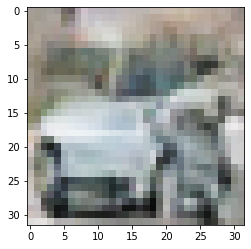

-> Epoch 293, Batch numero 1/78 -> Disc. loss on real images: 0.41281, Disc. loss on fake images: 0.24640, Generator loss: 2.96302
-> Epoch 293, Batch numero 2/78 -> Disc. loss on real images: 0.55884, Disc. loss on fake images: 0.25317, Generator loss: 2.08928
-> Epoch 293, Batch numero 3/78 -> Disc. loss on real images: 0.34584, Disc. loss on fake images: 0.41049, Generator loss: 2.00554
-> Epoch 293, Batch numero 4/78 -> Disc. loss on real images: 0.17959, Disc. loss on fake images: 0.33875, Generator loss: 2.35694
-> Epoch 293, Batch numero 5/78 -> Disc. loss on real images: 0.24529, Disc. loss on fake images: 0.40572, Generator loss: 2.83730
-> Epoch 293, Batch numero 6/78 -> Disc. loss on real images: 0.30927, Disc. loss on fake images: 0.19099, Generator loss: 2.68492
-> Epoch 293, Batch numero 7/78 -> Disc. loss on real images: 0.39655, Disc. loss on fake images: 0.25206, Generator loss: 2.68310
-> Epoch 293, Batch numero 8/78 -> Disc. loss on real images: 0.36158, Disc. loss o

-> Epoch 293, Batch numero 64/78 -> Disc. loss on real images: 0.25481, Disc. loss on fake images: 0.33910, Generator loss: 2.82961
-> Epoch 293, Batch numero 65/78 -> Disc. loss on real images: 0.30033, Disc. loss on fake images: 0.16969, Generator loss: 2.81092
-> Epoch 293, Batch numero 66/78 -> Disc. loss on real images: 0.38623, Disc. loss on fake images: 0.16853, Generator loss: 2.57109
-> Epoch 293, Batch numero 67/78 -> Disc. loss on real images: 0.29489, Disc. loss on fake images: 0.63951, Generator loss: 2.28029
-> Epoch 293, Batch numero 68/78 -> Disc. loss on real images: 0.39605, Disc. loss on fake images: 0.26372, Generator loss: 2.80023
-> Epoch 293, Batch numero 69/78 -> Disc. loss on real images: 0.27976, Disc. loss on fake images: 0.57698, Generator loss: 2.60685
-> Epoch 293, Batch numero 70/78 -> Disc. loss on real images: 0.36077, Disc. loss on fake images: 0.44546, Generator loss: 2.35908
-> Epoch 293, Batch numero 71/78 -> Disc. loss on real images: 0.32803, Disc

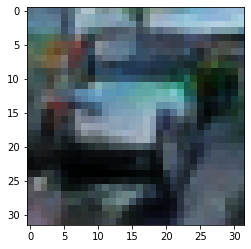

-> Epoch 294, Batch numero 1/78 -> Disc. loss on real images: 0.40277, Disc. loss on fake images: 0.24501, Generator loss: 2.40096
-> Epoch 294, Batch numero 2/78 -> Disc. loss on real images: 0.18796, Disc. loss on fake images: 0.50502, Generator loss: 2.65242
-> Epoch 294, Batch numero 3/78 -> Disc. loss on real images: 0.33560, Disc. loss on fake images: 0.25893, Generator loss: 2.38268
-> Epoch 294, Batch numero 4/78 -> Disc. loss on real images: 0.33969, Disc. loss on fake images: 0.34887, Generator loss: 2.64493
-> Epoch 294, Batch numero 5/78 -> Disc. loss on real images: 0.34178, Disc. loss on fake images: 0.40326, Generator loss: 2.38850
-> Epoch 294, Batch numero 6/78 -> Disc. loss on real images: 0.24551, Disc. loss on fake images: 0.21167, Generator loss: 2.34592
-> Epoch 294, Batch numero 7/78 -> Disc. loss on real images: 0.45728, Disc. loss on fake images: 0.42145, Generator loss: 2.58332
-> Epoch 294, Batch numero 8/78 -> Disc. loss on real images: 0.33712, Disc. loss o

-> Epoch 294, Batch numero 65/78 -> Disc. loss on real images: 0.20143, Disc. loss on fake images: 0.29786, Generator loss: 2.52374
-> Epoch 294, Batch numero 66/78 -> Disc. loss on real images: 0.35044, Disc. loss on fake images: 0.42507, Generator loss: 2.64994
-> Epoch 294, Batch numero 67/78 -> Disc. loss on real images: 0.35300, Disc. loss on fake images: 0.38019, Generator loss: 2.49112
-> Epoch 294, Batch numero 68/78 -> Disc. loss on real images: 0.22577, Disc. loss on fake images: 0.31794, Generator loss: 2.64403
-> Epoch 294, Batch numero 69/78 -> Disc. loss on real images: 0.38179, Disc. loss on fake images: 0.40002, Generator loss: 2.75604
-> Epoch 294, Batch numero 70/78 -> Disc. loss on real images: 0.38205, Disc. loss on fake images: 0.15340, Generator loss: 2.44832
-> Epoch 294, Batch numero 71/78 -> Disc. loss on real images: 0.30505, Disc. loss on fake images: 0.36930, Generator loss: 2.63744
-> Epoch 294, Batch numero 72/78 -> Disc. loss on real images: 0.20970, Disc

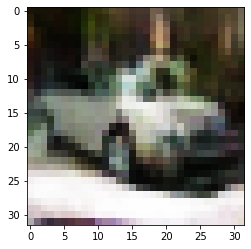

-> Epoch 295, Batch numero 1/78 -> Disc. loss on real images: 0.17786, Disc. loss on fake images: 0.53969, Generator loss: 2.59885
-> Epoch 295, Batch numero 2/78 -> Disc. loss on real images: 0.21540, Disc. loss on fake images: 0.27215, Generator loss: 2.63133
-> Epoch 295, Batch numero 3/78 -> Disc. loss on real images: 0.49576, Disc. loss on fake images: 0.24885, Generator loss: 2.21085
-> Epoch 295, Batch numero 4/78 -> Disc. loss on real images: 0.15435, Disc. loss on fake images: 0.33326, Generator loss: 2.46793
-> Epoch 295, Batch numero 5/78 -> Disc. loss on real images: 0.35196, Disc. loss on fake images: 0.65489, Generator loss: 2.93243
-> Epoch 295, Batch numero 6/78 -> Disc. loss on real images: 0.34761, Disc. loss on fake images: 0.18947, Generator loss: 2.33060
-> Epoch 295, Batch numero 7/78 -> Disc. loss on real images: 0.18488, Disc. loss on fake images: 0.35913, Generator loss: 2.39174
-> Epoch 295, Batch numero 8/78 -> Disc. loss on real images: 0.37939, Disc. loss o

-> Epoch 295, Batch numero 64/78 -> Disc. loss on real images: 0.40245, Disc. loss on fake images: 0.24452, Generator loss: 2.50755
-> Epoch 295, Batch numero 65/78 -> Disc. loss on real images: 0.42231, Disc. loss on fake images: 0.25633, Generator loss: 2.57011
-> Epoch 295, Batch numero 66/78 -> Disc. loss on real images: 0.29277, Disc. loss on fake images: 0.62395, Generator loss: 2.53670
-> Epoch 295, Batch numero 67/78 -> Disc. loss on real images: 0.38536, Disc. loss on fake images: 0.30469, Generator loss: 2.82206
-> Epoch 295, Batch numero 68/78 -> Disc. loss on real images: 0.38649, Disc. loss on fake images: 0.27182, Generator loss: 2.77048
-> Epoch 295, Batch numero 69/78 -> Disc. loss on real images: 0.26335, Disc. loss on fake images: 0.40565, Generator loss: 2.37264
-> Epoch 295, Batch numero 70/78 -> Disc. loss on real images: 0.33048, Disc. loss on fake images: 0.37364, Generator loss: 2.81685
-> Epoch 295, Batch numero 71/78 -> Disc. loss on real images: 0.37015, Disc

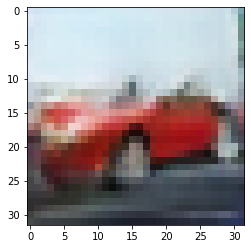

-> Epoch 296, Batch numero 1/78 -> Disc. loss on real images: 0.29595, Disc. loss on fake images: 0.46370, Generator loss: 2.42413
-> Epoch 296, Batch numero 2/78 -> Disc. loss on real images: 0.29837, Disc. loss on fake images: 0.41105, Generator loss: 2.70411
-> Epoch 296, Batch numero 3/78 -> Disc. loss on real images: 0.28886, Disc. loss on fake images: 0.11822, Generator loss: 2.60874
-> Epoch 296, Batch numero 4/78 -> Disc. loss on real images: 0.31032, Disc. loss on fake images: 0.36841, Generator loss: 2.61667
-> Epoch 296, Batch numero 5/78 -> Disc. loss on real images: 0.28896, Disc. loss on fake images: 0.38072, Generator loss: 2.96163
-> Epoch 296, Batch numero 6/78 -> Disc. loss on real images: 0.27078, Disc. loss on fake images: 0.45227, Generator loss: 2.63586
-> Epoch 296, Batch numero 7/78 -> Disc. loss on real images: 0.33843, Disc. loss on fake images: 0.23896, Generator loss: 2.79832
-> Epoch 296, Batch numero 8/78 -> Disc. loss on real images: 0.35195, Disc. loss o

-> Epoch 296, Batch numero 64/78 -> Disc. loss on real images: 0.28824, Disc. loss on fake images: 0.41501, Generator loss: 2.35478
-> Epoch 296, Batch numero 65/78 -> Disc. loss on real images: 0.49344, Disc. loss on fake images: 0.41007, Generator loss: 2.24441
-> Epoch 296, Batch numero 66/78 -> Disc. loss on real images: 0.34452, Disc. loss on fake images: 0.28041, Generator loss: 2.50632
-> Epoch 296, Batch numero 67/78 -> Disc. loss on real images: 0.25559, Disc. loss on fake images: 0.49797, Generator loss: 2.28965
-> Epoch 296, Batch numero 68/78 -> Disc. loss on real images: 0.22745, Disc. loss on fake images: 0.20852, Generator loss: 2.78130
-> Epoch 296, Batch numero 69/78 -> Disc. loss on real images: 0.30629, Disc. loss on fake images: 0.32124, Generator loss: 2.64772
-> Epoch 296, Batch numero 70/78 -> Disc. loss on real images: 0.42356, Disc. loss on fake images: 0.29130, Generator loss: 2.33890
-> Epoch 296, Batch numero 71/78 -> Disc. loss on real images: 0.25181, Disc

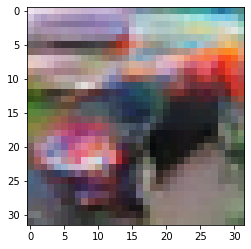

-> Epoch 297, Batch numero 1/78 -> Disc. loss on real images: 0.25437, Disc. loss on fake images: 0.39902, Generator loss: 2.76679
-> Epoch 297, Batch numero 2/78 -> Disc. loss on real images: 0.37184, Disc. loss on fake images: 0.31708, Generator loss: 2.48551
-> Epoch 297, Batch numero 3/78 -> Disc. loss on real images: 0.24945, Disc. loss on fake images: 0.27562, Generator loss: 2.31449
-> Epoch 297, Batch numero 4/78 -> Disc. loss on real images: 0.26613, Disc. loss on fake images: 0.21584, Generator loss: 2.69350
-> Epoch 297, Batch numero 5/78 -> Disc. loss on real images: 0.35428, Disc. loss on fake images: 0.27465, Generator loss: 2.32950
-> Epoch 297, Batch numero 6/78 -> Disc. loss on real images: 0.30480, Disc. loss on fake images: 0.33312, Generator loss: 2.38578
-> Epoch 297, Batch numero 7/78 -> Disc. loss on real images: 0.33008, Disc. loss on fake images: 0.31653, Generator loss: 2.51115
-> Epoch 297, Batch numero 8/78 -> Disc. loss on real images: 0.21254, Disc. loss o

-> Epoch 297, Batch numero 64/78 -> Disc. loss on real images: 0.18489, Disc. loss on fake images: 0.31649, Generator loss: 2.49977
-> Epoch 297, Batch numero 65/78 -> Disc. loss on real images: 0.17783, Disc. loss on fake images: 0.25540, Generator loss: 3.02148
-> Epoch 297, Batch numero 66/78 -> Disc. loss on real images: 0.28182, Disc. loss on fake images: 0.34320, Generator loss: 2.69646
-> Epoch 297, Batch numero 67/78 -> Disc. loss on real images: 0.48745, Disc. loss on fake images: 0.28126, Generator loss: 2.13231
-> Epoch 297, Batch numero 68/78 -> Disc. loss on real images: 0.18991, Disc. loss on fake images: 0.41985, Generator loss: 2.61398
-> Epoch 297, Batch numero 69/78 -> Disc. loss on real images: 0.25407, Disc. loss on fake images: 0.33913, Generator loss: 2.89151
-> Epoch 297, Batch numero 70/78 -> Disc. loss on real images: 0.28707, Disc. loss on fake images: 0.43822, Generator loss: 3.19533
-> Epoch 297, Batch numero 71/78 -> Disc. loss on real images: 0.24455, Disc

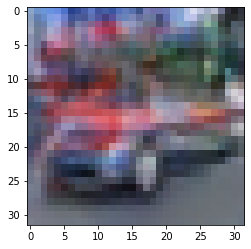

-> Epoch 298, Batch numero 1/78 -> Disc. loss on real images: 0.47988, Disc. loss on fake images: 0.31703, Generator loss: 2.39171
-> Epoch 298, Batch numero 2/78 -> Disc. loss on real images: 0.30085, Disc. loss on fake images: 0.30799, Generator loss: 2.41455
-> Epoch 298, Batch numero 3/78 -> Disc. loss on real images: 0.21744, Disc. loss on fake images: 0.25455, Generator loss: 2.59462
-> Epoch 298, Batch numero 4/78 -> Disc. loss on real images: 0.20814, Disc. loss on fake images: 0.27320, Generator loss: 2.57346
-> Epoch 298, Batch numero 5/78 -> Disc. loss on real images: 0.37165, Disc. loss on fake images: 0.22791, Generator loss: 2.61489
-> Epoch 298, Batch numero 6/78 -> Disc. loss on real images: 0.30443, Disc. loss on fake images: 0.26884, Generator loss: 2.57099
-> Epoch 298, Batch numero 7/78 -> Disc. loss on real images: 0.28630, Disc. loss on fake images: 0.31211, Generator loss: 2.49321
-> Epoch 298, Batch numero 8/78 -> Disc. loss on real images: 0.28891, Disc. loss o

-> Epoch 298, Batch numero 64/78 -> Disc. loss on real images: 0.52366, Disc. loss on fake images: 0.35596, Generator loss: 2.32598
-> Epoch 298, Batch numero 65/78 -> Disc. loss on real images: 0.26649, Disc. loss on fake images: 0.21962, Generator loss: 2.73622
-> Epoch 298, Batch numero 66/78 -> Disc. loss on real images: 0.24670, Disc. loss on fake images: 0.42894, Generator loss: 2.58812
-> Epoch 298, Batch numero 67/78 -> Disc. loss on real images: 0.33548, Disc. loss on fake images: 0.35104, Generator loss: 2.37433
-> Epoch 298, Batch numero 68/78 -> Disc. loss on real images: 0.32865, Disc. loss on fake images: 0.27717, Generator loss: 2.54778
-> Epoch 298, Batch numero 69/78 -> Disc. loss on real images: 0.21184, Disc. loss on fake images: 0.30841, Generator loss: 2.57683
-> Epoch 298, Batch numero 70/78 -> Disc. loss on real images: 0.41677, Disc. loss on fake images: 0.20733, Generator loss: 2.57388
-> Epoch 298, Batch numero 71/78 -> Disc. loss on real images: 0.16407, Disc

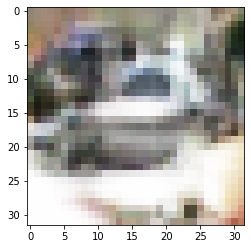

-> Epoch 299, Batch numero 1/78 -> Disc. loss on real images: 0.25429, Disc. loss on fake images: 0.28671, Generator loss: 2.84192
-> Epoch 299, Batch numero 2/78 -> Disc. loss on real images: 0.34302, Disc. loss on fake images: 0.26410, Generator loss: 2.99456
-> Epoch 299, Batch numero 3/78 -> Disc. loss on real images: 0.36611, Disc. loss on fake images: 0.29474, Generator loss: 2.44278
-> Epoch 299, Batch numero 4/78 -> Disc. loss on real images: 0.18775, Disc. loss on fake images: 0.31229, Generator loss: 2.89929
-> Epoch 299, Batch numero 5/78 -> Disc. loss on real images: 0.48903, Disc. loss on fake images: 0.28353, Generator loss: 2.39803
-> Epoch 299, Batch numero 6/78 -> Disc. loss on real images: 0.19702, Disc. loss on fake images: 0.36182, Generator loss: 2.84884
-> Epoch 299, Batch numero 7/78 -> Disc. loss on real images: 0.32609, Disc. loss on fake images: 0.51625, Generator loss: 2.64490
-> Epoch 299, Batch numero 8/78 -> Disc. loss on real images: 0.42082, Disc. loss o

-> Epoch 299, Batch numero 64/78 -> Disc. loss on real images: 0.20912, Disc. loss on fake images: 0.32700, Generator loss: 2.74919
-> Epoch 299, Batch numero 65/78 -> Disc. loss on real images: 0.22569, Disc. loss on fake images: 0.26884, Generator loss: 2.82975
-> Epoch 299, Batch numero 66/78 -> Disc. loss on real images: 0.39539, Disc. loss on fake images: 0.27430, Generator loss: 2.70739
-> Epoch 299, Batch numero 67/78 -> Disc. loss on real images: 0.33382, Disc. loss on fake images: 0.24014, Generator loss: 2.27391
-> Epoch 299, Batch numero 68/78 -> Disc. loss on real images: 0.21519, Disc. loss on fake images: 0.40853, Generator loss: 2.65676
-> Epoch 299, Batch numero 69/78 -> Disc. loss on real images: 0.22451, Disc. loss on fake images: 0.27521, Generator loss: 2.81404
-> Epoch 299, Batch numero 70/78 -> Disc. loss on real images: 0.35592, Disc. loss on fake images: 0.23498, Generator loss: 2.54024
-> Epoch 299, Batch numero 71/78 -> Disc. loss on real images: 0.45307, Disc

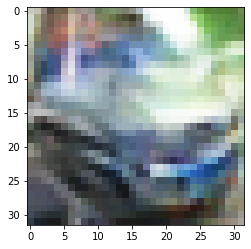

-> Epoch 300, Batch numero 1/78 -> Disc. loss on real images: 0.39139, Disc. loss on fake images: 0.29155, Generator loss: 2.71177
-> Epoch 300, Batch numero 2/78 -> Disc. loss on real images: 0.36772, Disc. loss on fake images: 0.29957, Generator loss: 2.43095
-> Epoch 300, Batch numero 3/78 -> Disc. loss on real images: 0.25596, Disc. loss on fake images: 0.30701, Generator loss: 2.35715
-> Epoch 300, Batch numero 4/78 -> Disc. loss on real images: 0.40546, Disc. loss on fake images: 0.48064, Generator loss: 2.47568
-> Epoch 300, Batch numero 5/78 -> Disc. loss on real images: 0.39561, Disc. loss on fake images: 0.52101, Generator loss: 2.81757
-> Epoch 300, Batch numero 6/78 -> Disc. loss on real images: 0.27729, Disc. loss on fake images: 0.24415, Generator loss: 2.65659
-> Epoch 300, Batch numero 7/78 -> Disc. loss on real images: 0.41410, Disc. loss on fake images: 0.47071, Generator loss: 2.65772
-> Epoch 300, Batch numero 8/78 -> Disc. loss on real images: 0.31990, Disc. loss o

-> Epoch 300, Batch numero 64/78 -> Disc. loss on real images: 0.35443, Disc. loss on fake images: 0.41694, Generator loss: 2.14372
-> Epoch 300, Batch numero 65/78 -> Disc. loss on real images: 0.18943, Disc. loss on fake images: 0.39646, Generator loss: 2.43922
-> Epoch 300, Batch numero 66/78 -> Disc. loss on real images: 0.21293, Disc. loss on fake images: 0.22999, Generator loss: 2.48490
-> Epoch 300, Batch numero 67/78 -> Disc. loss on real images: 0.38271, Disc. loss on fake images: 0.30004, Generator loss: 2.35784
-> Epoch 300, Batch numero 68/78 -> Disc. loss on real images: 0.34680, Disc. loss on fake images: 0.43806, Generator loss: 2.18325
-> Epoch 300, Batch numero 69/78 -> Disc. loss on real images: 0.36812, Disc. loss on fake images: 0.29038, Generator loss: 2.43450
-> Epoch 300, Batch numero 70/78 -> Disc. loss on real images: 0.24840, Disc. loss on fake images: 0.25963, Generator loss: 2.64981
-> Epoch 300, Batch numero 71/78 -> Disc. loss on real images: 0.28843, Disc

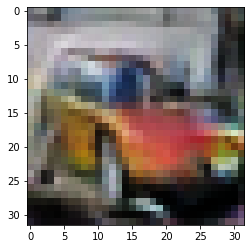

-> Epoch 301, Batch numero 1/78 -> Disc. loss on real images: 0.24673, Disc. loss on fake images: 0.41607, Generator loss: 2.54596
-> Epoch 301, Batch numero 2/78 -> Disc. loss on real images: 0.20358, Disc. loss on fake images: 0.53179, Generator loss: 3.04656
-> Epoch 301, Batch numero 3/78 -> Disc. loss on real images: 0.37463, Disc. loss on fake images: 0.24192, Generator loss: 2.91596
-> Epoch 301, Batch numero 4/78 -> Disc. loss on real images: 0.45027, Disc. loss on fake images: 0.22512, Generator loss: 2.55464
-> Epoch 301, Batch numero 5/78 -> Disc. loss on real images: 0.27791, Disc. loss on fake images: 0.30126, Generator loss: 2.38529
-> Epoch 301, Batch numero 6/78 -> Disc. loss on real images: 0.30355, Disc. loss on fake images: 0.30502, Generator loss: 2.38470
-> Epoch 301, Batch numero 7/78 -> Disc. loss on real images: 0.26921, Disc. loss on fake images: 0.52013, Generator loss: 2.53170
-> Epoch 301, Batch numero 8/78 -> Disc. loss on real images: 0.37207, Disc. loss o

-> Epoch 301, Batch numero 64/78 -> Disc. loss on real images: 0.23463, Disc. loss on fake images: 0.36270, Generator loss: 2.71843
-> Epoch 301, Batch numero 65/78 -> Disc. loss on real images: 0.28136, Disc. loss on fake images: 0.20995, Generator loss: 2.33186
-> Epoch 301, Batch numero 66/78 -> Disc. loss on real images: 0.37289, Disc. loss on fake images: 0.36132, Generator loss: 2.30279
-> Epoch 301, Batch numero 67/78 -> Disc. loss on real images: 0.28870, Disc. loss on fake images: 0.43659, Generator loss: 2.66747
-> Epoch 301, Batch numero 68/78 -> Disc. loss on real images: 0.30597, Disc. loss on fake images: 0.29781, Generator loss: 2.45158
-> Epoch 301, Batch numero 69/78 -> Disc. loss on real images: 0.27839, Disc. loss on fake images: 0.20676, Generator loss: 2.55508
-> Epoch 301, Batch numero 70/78 -> Disc. loss on real images: 0.37619, Disc. loss on fake images: 0.28169, Generator loss: 2.57794
-> Epoch 301, Batch numero 71/78 -> Disc. loss on real images: 0.23793, Disc

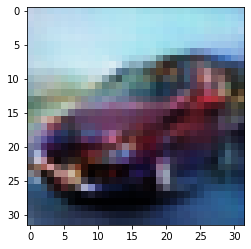

-> Epoch 302, Batch numero 1/78 -> Disc. loss on real images: 0.42967, Disc. loss on fake images: 0.30154, Generator loss: 2.26460
-> Epoch 302, Batch numero 2/78 -> Disc. loss on real images: 0.27310, Disc. loss on fake images: 0.24806, Generator loss: 2.13691
-> Epoch 302, Batch numero 3/78 -> Disc. loss on real images: 0.16428, Disc. loss on fake images: 0.38940, Generator loss: 2.75336
-> Epoch 302, Batch numero 4/78 -> Disc. loss on real images: 0.17360, Disc. loss on fake images: 0.37268, Generator loss: 3.05679
-> Epoch 302, Batch numero 5/78 -> Disc. loss on real images: 0.31695, Disc. loss on fake images: 0.19821, Generator loss: 2.59572
-> Epoch 302, Batch numero 6/78 -> Disc. loss on real images: 0.35686, Disc. loss on fake images: 0.20120, Generator loss: 2.50981
-> Epoch 302, Batch numero 7/78 -> Disc. loss on real images: 0.56289, Disc. loss on fake images: 0.40131, Generator loss: 2.23368
-> Epoch 302, Batch numero 8/78 -> Disc. loss on real images: 0.27768, Disc. loss o

-> Epoch 302, Batch numero 64/78 -> Disc. loss on real images: 0.22538, Disc. loss on fake images: 0.33933, Generator loss: 2.63620
-> Epoch 302, Batch numero 65/78 -> Disc. loss on real images: 0.34985, Disc. loss on fake images: 0.25581, Generator loss: 2.79578
-> Epoch 302, Batch numero 66/78 -> Disc. loss on real images: 0.19848, Disc. loss on fake images: 0.29611, Generator loss: 2.54834
-> Epoch 302, Batch numero 67/78 -> Disc. loss on real images: 0.46742, Disc. loss on fake images: 0.18870, Generator loss: 2.54044
-> Epoch 302, Batch numero 68/78 -> Disc. loss on real images: 0.31136, Disc. loss on fake images: 0.34720, Generator loss: 2.47291
-> Epoch 302, Batch numero 69/78 -> Disc. loss on real images: 0.22269, Disc. loss on fake images: 0.39617, Generator loss: 2.30462
-> Epoch 302, Batch numero 70/78 -> Disc. loss on real images: 0.33930, Disc. loss on fake images: 0.37423, Generator loss: 2.62240
-> Epoch 302, Batch numero 71/78 -> Disc. loss on real images: 0.20280, Disc

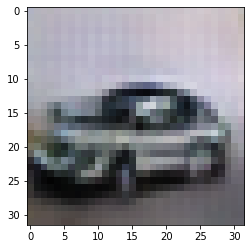

-> Epoch 303, Batch numero 1/78 -> Disc. loss on real images: 0.18903, Disc. loss on fake images: 0.31280, Generator loss: 2.82156
-> Epoch 303, Batch numero 2/78 -> Disc. loss on real images: 0.26723, Disc. loss on fake images: 0.25554, Generator loss: 2.60655
-> Epoch 303, Batch numero 3/78 -> Disc. loss on real images: 0.30165, Disc. loss on fake images: 0.50134, Generator loss: 3.02982
-> Epoch 303, Batch numero 4/78 -> Disc. loss on real images: 0.42654, Disc. loss on fake images: 0.35020, Generator loss: 2.77307
-> Epoch 303, Batch numero 5/78 -> Disc. loss on real images: 0.33928, Disc. loss on fake images: 0.29976, Generator loss: 2.48022
-> Epoch 303, Batch numero 6/78 -> Disc. loss on real images: 0.59146, Disc. loss on fake images: 0.33977, Generator loss: 2.63129
-> Epoch 303, Batch numero 7/78 -> Disc. loss on real images: 0.11121, Disc. loss on fake images: 0.24149, Generator loss: 2.51630
-> Epoch 303, Batch numero 8/78 -> Disc. loss on real images: 0.27143, Disc. loss o

-> Epoch 303, Batch numero 64/78 -> Disc. loss on real images: 0.47535, Disc. loss on fake images: 0.23974, Generator loss: 2.75733
-> Epoch 303, Batch numero 65/78 -> Disc. loss on real images: 0.35663, Disc. loss on fake images: 0.36758, Generator loss: 1.97940
-> Epoch 303, Batch numero 66/78 -> Disc. loss on real images: 0.28663, Disc. loss on fake images: 0.49950, Generator loss: 2.33833
-> Epoch 303, Batch numero 67/78 -> Disc. loss on real images: 0.42363, Disc. loss on fake images: 0.47136, Generator loss: 2.56726
-> Epoch 303, Batch numero 68/78 -> Disc. loss on real images: 0.42648, Disc. loss on fake images: 0.30792, Generator loss: 2.83923
-> Epoch 303, Batch numero 69/78 -> Disc. loss on real images: 0.35130, Disc. loss on fake images: 0.42214, Generator loss: 3.03678
-> Epoch 303, Batch numero 70/78 -> Disc. loss on real images: 0.28875, Disc. loss on fake images: 0.14035, Generator loss: 2.53044
-> Epoch 303, Batch numero 71/78 -> Disc. loss on real images: 0.34361, Disc

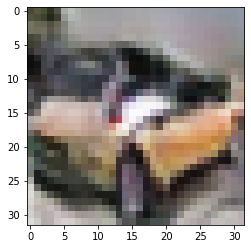

-> Epoch 304, Batch numero 1/78 -> Disc. loss on real images: 0.23157, Disc. loss on fake images: 0.46199, Generator loss: 2.39759
-> Epoch 304, Batch numero 2/78 -> Disc. loss on real images: 0.19765, Disc. loss on fake images: 0.32631, Generator loss: 2.37975
-> Epoch 304, Batch numero 3/78 -> Disc. loss on real images: 0.32119, Disc. loss on fake images: 0.23818, Generator loss: 2.92626
-> Epoch 304, Batch numero 4/78 -> Disc. loss on real images: 0.31722, Disc. loss on fake images: 0.47556, Generator loss: 2.80402
-> Epoch 304, Batch numero 5/78 -> Disc. loss on real images: 0.22080, Disc. loss on fake images: 0.33414, Generator loss: 2.91806
-> Epoch 304, Batch numero 6/78 -> Disc. loss on real images: 0.30856, Disc. loss on fake images: 0.21828, Generator loss: 2.64485
-> Epoch 304, Batch numero 7/78 -> Disc. loss on real images: 0.42964, Disc. loss on fake images: 0.34311, Generator loss: 2.43430
-> Epoch 304, Batch numero 8/78 -> Disc. loss on real images: 0.23810, Disc. loss o

-> Epoch 304, Batch numero 64/78 -> Disc. loss on real images: 0.56293, Disc. loss on fake images: 0.26361, Generator loss: 2.40769
-> Epoch 304, Batch numero 65/78 -> Disc. loss on real images: 0.29535, Disc. loss on fake images: 0.33330, Generator loss: 2.59874
-> Epoch 304, Batch numero 66/78 -> Disc. loss on real images: 0.17880, Disc. loss on fake images: 0.42497, Generator loss: 2.78484
-> Epoch 304, Batch numero 67/78 -> Disc. loss on real images: 0.52884, Disc. loss on fake images: 0.33388, Generator loss: 2.91311
-> Epoch 304, Batch numero 68/78 -> Disc. loss on real images: 0.31277, Disc. loss on fake images: 0.37379, Generator loss: 2.96383
-> Epoch 304, Batch numero 69/78 -> Disc. loss on real images: 0.40040, Disc. loss on fake images: 0.45330, Generator loss: 2.35380
-> Epoch 304, Batch numero 70/78 -> Disc. loss on real images: 0.28945, Disc. loss on fake images: 0.28106, Generator loss: 2.86935
-> Epoch 304, Batch numero 71/78 -> Disc. loss on real images: 0.33141, Disc

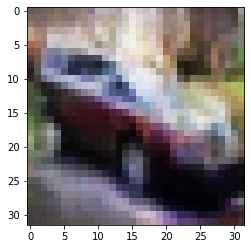

-> Epoch 305, Batch numero 1/78 -> Disc. loss on real images: 0.25391, Disc. loss on fake images: 0.30620, Generator loss: 2.77721
-> Epoch 305, Batch numero 2/78 -> Disc. loss on real images: 0.39556, Disc. loss on fake images: 0.35335, Generator loss: 2.84021
-> Epoch 305, Batch numero 3/78 -> Disc. loss on real images: 0.38118, Disc. loss on fake images: 0.22265, Generator loss: 2.73980
-> Epoch 305, Batch numero 4/78 -> Disc. loss on real images: 0.10440, Disc. loss on fake images: 0.25630, Generator loss: 3.16100
-> Epoch 305, Batch numero 5/78 -> Disc. loss on real images: 0.41149, Disc. loss on fake images: 0.33052, Generator loss: 2.34628
-> Epoch 305, Batch numero 6/78 -> Disc. loss on real images: 0.36502, Disc. loss on fake images: 0.48080, Generator loss: 3.26684
-> Epoch 305, Batch numero 7/78 -> Disc. loss on real images: 0.35172, Disc. loss on fake images: 0.27282, Generator loss: 2.49520
-> Epoch 305, Batch numero 8/78 -> Disc. loss on real images: 0.31819, Disc. loss o

-> Epoch 305, Batch numero 64/78 -> Disc. loss on real images: 0.31759, Disc. loss on fake images: 0.43439, Generator loss: 2.70394
-> Epoch 305, Batch numero 65/78 -> Disc. loss on real images: 0.29016, Disc. loss on fake images: 0.27682, Generator loss: 3.00378
-> Epoch 305, Batch numero 66/78 -> Disc. loss on real images: 0.47275, Disc. loss on fake images: 0.28793, Generator loss: 2.61917
-> Epoch 305, Batch numero 67/78 -> Disc. loss on real images: 0.20516, Disc. loss on fake images: 0.21334, Generator loss: 2.94249
-> Epoch 305, Batch numero 68/78 -> Disc. loss on real images: 0.36978, Disc. loss on fake images: 0.24179, Generator loss: 2.38390
-> Epoch 305, Batch numero 69/78 -> Disc. loss on real images: 0.32170, Disc. loss on fake images: 0.43836, Generator loss: 2.70938
-> Epoch 305, Batch numero 70/78 -> Disc. loss on real images: 0.20923, Disc. loss on fake images: 0.41684, Generator loss: 2.76099
-> Epoch 305, Batch numero 71/78 -> Disc. loss on real images: 0.28419, Disc

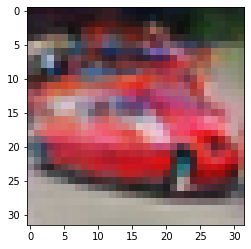

-> Epoch 306, Batch numero 1/78 -> Disc. loss on real images: 0.29099, Disc. loss on fake images: 0.29843, Generator loss: 2.33748
-> Epoch 306, Batch numero 2/78 -> Disc. loss on real images: 0.21317, Disc. loss on fake images: 0.27314, Generator loss: 2.81548
-> Epoch 306, Batch numero 3/78 -> Disc. loss on real images: 0.34230, Disc. loss on fake images: 0.16400, Generator loss: 2.21519
-> Epoch 306, Batch numero 4/78 -> Disc. loss on real images: 0.34135, Disc. loss on fake images: 0.38043, Generator loss: 2.41564
-> Epoch 306, Batch numero 5/78 -> Disc. loss on real images: 0.14274, Disc. loss on fake images: 0.71432, Generator loss: 2.78145
-> Epoch 306, Batch numero 6/78 -> Disc. loss on real images: 0.29886, Disc. loss on fake images: 0.34972, Generator loss: 3.31268
-> Epoch 306, Batch numero 7/78 -> Disc. loss on real images: 0.67510, Disc. loss on fake images: 0.31864, Generator loss: 2.82965
-> Epoch 306, Batch numero 8/78 -> Disc. loss on real images: 0.35839, Disc. loss o

-> Epoch 306, Batch numero 64/78 -> Disc. loss on real images: 0.25682, Disc. loss on fake images: 0.35251, Generator loss: 2.66926
-> Epoch 306, Batch numero 65/78 -> Disc. loss on real images: 0.22792, Disc. loss on fake images: 0.24850, Generator loss: 2.60993
-> Epoch 306, Batch numero 66/78 -> Disc. loss on real images: 0.23133, Disc. loss on fake images: 0.47148, Generator loss: 3.04592
-> Epoch 306, Batch numero 67/78 -> Disc. loss on real images: 0.25324, Disc. loss on fake images: 0.19980, Generator loss: 2.49240
-> Epoch 306, Batch numero 68/78 -> Disc. loss on real images: 0.29985, Disc. loss on fake images: 0.36310, Generator loss: 2.70675
-> Epoch 306, Batch numero 69/78 -> Disc. loss on real images: 0.27872, Disc. loss on fake images: 0.35759, Generator loss: 2.71623
-> Epoch 306, Batch numero 70/78 -> Disc. loss on real images: 0.20537, Disc. loss on fake images: 0.25193, Generator loss: 2.75854
-> Epoch 306, Batch numero 71/78 -> Disc. loss on real images: 0.42053, Disc

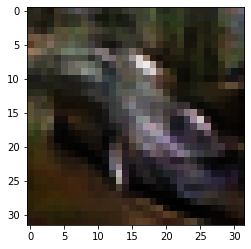

-> Epoch 307, Batch numero 1/78 -> Disc. loss on real images: 0.23473, Disc. loss on fake images: 0.64210, Generator loss: 3.13592
-> Epoch 307, Batch numero 2/78 -> Disc. loss on real images: 0.26269, Disc. loss on fake images: 0.23834, Generator loss: 3.04035
-> Epoch 307, Batch numero 3/78 -> Disc. loss on real images: 0.49102, Disc. loss on fake images: 0.19309, Generator loss: 2.59563
-> Epoch 307, Batch numero 4/78 -> Disc. loss on real images: 0.19894, Disc. loss on fake images: 0.47587, Generator loss: 3.07784
-> Epoch 307, Batch numero 5/78 -> Disc. loss on real images: 0.39682, Disc. loss on fake images: 0.17520, Generator loss: 2.76940
-> Epoch 307, Batch numero 6/78 -> Disc. loss on real images: 0.25864, Disc. loss on fake images: 0.46789, Generator loss: 2.67376
-> Epoch 307, Batch numero 7/78 -> Disc. loss on real images: 0.44747, Disc. loss on fake images: 0.21690, Generator loss: 2.54177
-> Epoch 307, Batch numero 8/78 -> Disc. loss on real images: 0.24970, Disc. loss o

-> Epoch 307, Batch numero 64/78 -> Disc. loss on real images: 0.41667, Disc. loss on fake images: 0.18538, Generator loss: 2.95735
-> Epoch 307, Batch numero 65/78 -> Disc. loss on real images: 0.32519, Disc. loss on fake images: 0.38639, Generator loss: 2.67615
-> Epoch 307, Batch numero 66/78 -> Disc. loss on real images: 0.16969, Disc. loss on fake images: 0.38580, Generator loss: 3.17407
-> Epoch 307, Batch numero 67/78 -> Disc. loss on real images: 0.29630, Disc. loss on fake images: 0.20769, Generator loss: 2.81687
-> Epoch 307, Batch numero 68/78 -> Disc. loss on real images: 0.24888, Disc. loss on fake images: 0.28710, Generator loss: 2.73522
-> Epoch 307, Batch numero 69/78 -> Disc. loss on real images: 0.27697, Disc. loss on fake images: 0.23135, Generator loss: 2.59032
-> Epoch 307, Batch numero 70/78 -> Disc. loss on real images: 0.12739, Disc. loss on fake images: 0.18049, Generator loss: 2.89808
-> Epoch 307, Batch numero 71/78 -> Disc. loss on real images: 0.24559, Disc

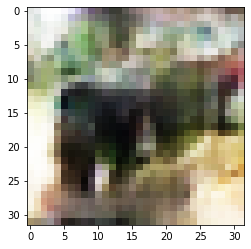

-> Epoch 308, Batch numero 1/78 -> Disc. loss on real images: 0.23400, Disc. loss on fake images: 0.38561, Generator loss: 2.60482
-> Epoch 308, Batch numero 2/78 -> Disc. loss on real images: 0.50470, Disc. loss on fake images: 0.48626, Generator loss: 2.81723
-> Epoch 308, Batch numero 3/78 -> Disc. loss on real images: 0.31389, Disc. loss on fake images: 0.17870, Generator loss: 2.78194
-> Epoch 308, Batch numero 4/78 -> Disc. loss on real images: 0.33052, Disc. loss on fake images: 0.18040, Generator loss: 2.35095
-> Epoch 308, Batch numero 5/78 -> Disc. loss on real images: 0.22057, Disc. loss on fake images: 0.25681, Generator loss: 2.42466
-> Epoch 308, Batch numero 6/78 -> Disc. loss on real images: 0.24051, Disc. loss on fake images: 0.35547, Generator loss: 2.38328
-> Epoch 308, Batch numero 7/78 -> Disc. loss on real images: 0.42450, Disc. loss on fake images: 0.22259, Generator loss: 2.46181
-> Epoch 308, Batch numero 8/78 -> Disc. loss on real images: 0.18258, Disc. loss o

-> Epoch 308, Batch numero 66/78 -> Disc. loss on real images: 0.54250, Disc. loss on fake images: 0.43266, Generator loss: 2.79029
-> Epoch 308, Batch numero 67/78 -> Disc. loss on real images: 0.41046, Disc. loss on fake images: 0.27634, Generator loss: 2.93448
-> Epoch 308, Batch numero 68/78 -> Disc. loss on real images: 0.41414, Disc. loss on fake images: 0.44126, Generator loss: 2.75256
-> Epoch 308, Batch numero 69/78 -> Disc. loss on real images: 0.24269, Disc. loss on fake images: 0.28658, Generator loss: 2.76851
-> Epoch 308, Batch numero 70/78 -> Disc. loss on real images: 0.47164, Disc. loss on fake images: 0.27035, Generator loss: 2.51189
-> Epoch 308, Batch numero 71/78 -> Disc. loss on real images: 0.29301, Disc. loss on fake images: 0.21398, Generator loss: 2.21279
-> Epoch 308, Batch numero 72/78 -> Disc. loss on real images: 0.21389, Disc. loss on fake images: 0.23673, Generator loss: 2.36935
-> Epoch 308, Batch numero 73/78 -> Disc. loss on real images: 0.30436, Disc

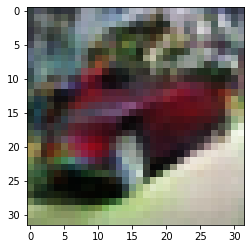

-> Epoch 309, Batch numero 1/78 -> Disc. loss on real images: 0.40993, Disc. loss on fake images: 0.22744, Generator loss: 2.28616
-> Epoch 309, Batch numero 2/78 -> Disc. loss on real images: 0.24986, Disc. loss on fake images: 0.39792, Generator loss: 2.30434
-> Epoch 309, Batch numero 3/78 -> Disc. loss on real images: 0.17728, Disc. loss on fake images: 0.40388, Generator loss: 2.65206
-> Epoch 309, Batch numero 4/78 -> Disc. loss on real images: 0.40622, Disc. loss on fake images: 0.51925, Generator loss: 2.87691
-> Epoch 309, Batch numero 5/78 -> Disc. loss on real images: 0.20679, Disc. loss on fake images: 0.18750, Generator loss: 3.07409
-> Epoch 309, Batch numero 6/78 -> Disc. loss on real images: 0.32793, Disc. loss on fake images: 0.18817, Generator loss: 2.94592
-> Epoch 309, Batch numero 7/78 -> Disc. loss on real images: 0.28648, Disc. loss on fake images: 0.31089, Generator loss: 2.70012
-> Epoch 309, Batch numero 8/78 -> Disc. loss on real images: 0.27806, Disc. loss o

-> Epoch 309, Batch numero 64/78 -> Disc. loss on real images: 0.39527, Disc. loss on fake images: 0.22328, Generator loss: 2.43139
-> Epoch 309, Batch numero 65/78 -> Disc. loss on real images: 0.32242, Disc. loss on fake images: 0.25222, Generator loss: 2.25606
-> Epoch 309, Batch numero 66/78 -> Disc. loss on real images: 0.25917, Disc. loss on fake images: 0.49055, Generator loss: 2.49260
-> Epoch 309, Batch numero 67/78 -> Disc. loss on real images: 0.34722, Disc. loss on fake images: 0.41001, Generator loss: 2.71939
-> Epoch 309, Batch numero 68/78 -> Disc. loss on real images: 0.32759, Disc. loss on fake images: 0.25550, Generator loss: 2.67761
-> Epoch 309, Batch numero 69/78 -> Disc. loss on real images: 0.20059, Disc. loss on fake images: 0.30784, Generator loss: 2.94420
-> Epoch 309, Batch numero 70/78 -> Disc. loss on real images: 0.40973, Disc. loss on fake images: 0.20406, Generator loss: 2.51774
-> Epoch 309, Batch numero 71/78 -> Disc. loss on real images: 0.39303, Disc

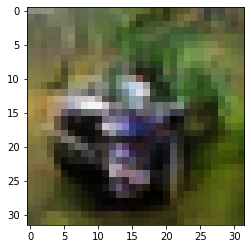

-> Epoch 310, Batch numero 1/78 -> Disc. loss on real images: 0.23026, Disc. loss on fake images: 0.36683, Generator loss: 2.37584
-> Epoch 310, Batch numero 2/78 -> Disc. loss on real images: 0.19599, Disc. loss on fake images: 0.53769, Generator loss: 2.67769
-> Epoch 310, Batch numero 3/78 -> Disc. loss on real images: 0.53883, Disc. loss on fake images: 0.23843, Generator loss: 2.63770
-> Epoch 310, Batch numero 4/78 -> Disc. loss on real images: 0.23810, Disc. loss on fake images: 0.48477, Generator loss: 2.31070
-> Epoch 310, Batch numero 5/78 -> Disc. loss on real images: 0.39101, Disc. loss on fake images: 0.30093, Generator loss: 2.71978
-> Epoch 310, Batch numero 6/78 -> Disc. loss on real images: 0.36338, Disc. loss on fake images: 0.24957, Generator loss: 2.47275
-> Epoch 310, Batch numero 7/78 -> Disc. loss on real images: 0.27629, Disc. loss on fake images: 0.42594, Generator loss: 2.64323
-> Epoch 310, Batch numero 8/78 -> Disc. loss on real images: 0.14183, Disc. loss o

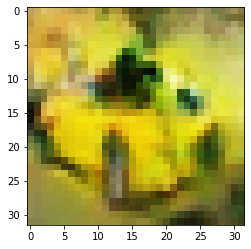

-> Epoch 311, Batch numero 1/78 -> Disc. loss on real images: 0.30705, Disc. loss on fake images: 0.47838, Generator loss: 2.80982
-> Epoch 311, Batch numero 2/78 -> Disc. loss on real images: 0.34237, Disc. loss on fake images: 0.40301, Generator loss: 2.55510
-> Epoch 311, Batch numero 3/78 -> Disc. loss on real images: 0.26103, Disc. loss on fake images: 0.23634, Generator loss: 2.59065
-> Epoch 311, Batch numero 4/78 -> Disc. loss on real images: 0.33127, Disc. loss on fake images: 0.33592, Generator loss: 2.48757
-> Epoch 311, Batch numero 5/78 -> Disc. loss on real images: 0.18852, Disc. loss on fake images: 0.42901, Generator loss: 2.89115
-> Epoch 311, Batch numero 6/78 -> Disc. loss on real images: 0.25515, Disc. loss on fake images: 0.29455, Generator loss: 2.86967
-> Epoch 311, Batch numero 7/78 -> Disc. loss on real images: 0.39558, Disc. loss on fake images: 0.43462, Generator loss: 2.70010
-> Epoch 311, Batch numero 8/78 -> Disc. loss on real images: 0.31307, Disc. loss o

-> Epoch 311, Batch numero 66/78 -> Disc. loss on real images: 0.17834, Disc. loss on fake images: 0.30861, Generator loss: 2.75226
-> Epoch 311, Batch numero 67/78 -> Disc. loss on real images: 0.16539, Disc. loss on fake images: 0.13533, Generator loss: 2.87944
-> Epoch 311, Batch numero 68/78 -> Disc. loss on real images: 0.44658, Disc. loss on fake images: 0.34832, Generator loss: 2.69535
-> Epoch 311, Batch numero 69/78 -> Disc. loss on real images: 0.22878, Disc. loss on fake images: 0.45418, Generator loss: 2.77446
-> Epoch 311, Batch numero 70/78 -> Disc. loss on real images: 0.19641, Disc. loss on fake images: 0.16973, Generator loss: 3.12705
-> Epoch 311, Batch numero 71/78 -> Disc. loss on real images: 0.38597, Disc. loss on fake images: 0.43546, Generator loss: 2.81602
-> Epoch 311, Batch numero 72/78 -> Disc. loss on real images: 0.37757, Disc. loss on fake images: 0.33976, Generator loss: 2.98449
-> Epoch 311, Batch numero 73/78 -> Disc. loss on real images: 0.27520, Disc

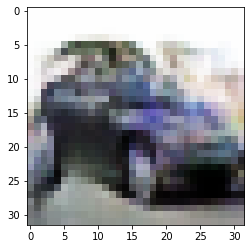

-> Epoch 312, Batch numero 1/78 -> Disc. loss on real images: 0.33150, Disc. loss on fake images: 0.22767, Generator loss: 2.35835
-> Epoch 312, Batch numero 2/78 -> Disc. loss on real images: 0.28664, Disc. loss on fake images: 0.22483, Generator loss: 2.45200
-> Epoch 312, Batch numero 3/78 -> Disc. loss on real images: 0.20180, Disc. loss on fake images: 0.38837, Generator loss: 2.41625
-> Epoch 312, Batch numero 4/78 -> Disc. loss on real images: 0.40046, Disc. loss on fake images: 0.47611, Generator loss: 2.51745
-> Epoch 312, Batch numero 5/78 -> Disc. loss on real images: 0.20524, Disc. loss on fake images: 0.21182, Generator loss: 3.03999
-> Epoch 312, Batch numero 6/78 -> Disc. loss on real images: 0.32462, Disc. loss on fake images: 0.34296, Generator loss: 3.06312
-> Epoch 312, Batch numero 7/78 -> Disc. loss on real images: 0.43008, Disc. loss on fake images: 0.34920, Generator loss: 2.66785
-> Epoch 312, Batch numero 8/78 -> Disc. loss on real images: 0.33965, Disc. loss o

-> Epoch 312, Batch numero 64/78 -> Disc. loss on real images: 0.22226, Disc. loss on fake images: 0.47000, Generator loss: 2.76815
-> Epoch 312, Batch numero 65/78 -> Disc. loss on real images: 0.61750, Disc. loss on fake images: 0.30583, Generator loss: 2.83182
-> Epoch 312, Batch numero 66/78 -> Disc. loss on real images: 0.27993, Disc. loss on fake images: 0.20929, Generator loss: 2.38929
-> Epoch 312, Batch numero 67/78 -> Disc. loss on real images: 0.25355, Disc. loss on fake images: 0.15628, Generator loss: 2.42779
-> Epoch 312, Batch numero 68/78 -> Disc. loss on real images: 0.46074, Disc. loss on fake images: 0.35351, Generator loss: 2.15414
-> Epoch 312, Batch numero 69/78 -> Disc. loss on real images: 0.18698, Disc. loss on fake images: 0.26962, Generator loss: 2.43385
-> Epoch 312, Batch numero 70/78 -> Disc. loss on real images: 0.32856, Disc. loss on fake images: 0.59269, Generator loss: 2.75262
-> Epoch 312, Batch numero 71/78 -> Disc. loss on real images: 0.25530, Disc

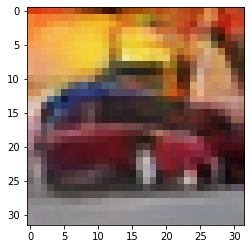

-> Epoch 313, Batch numero 1/78 -> Disc. loss on real images: 0.36913, Disc. loss on fake images: 0.27228, Generator loss: 3.05315
-> Epoch 313, Batch numero 2/78 -> Disc. loss on real images: 0.26707, Disc. loss on fake images: 0.36816, Generator loss: 3.03296
-> Epoch 313, Batch numero 3/78 -> Disc. loss on real images: 0.25567, Disc. loss on fake images: 0.25553, Generator loss: 2.57326
-> Epoch 313, Batch numero 4/78 -> Disc. loss on real images: 0.40101, Disc. loss on fake images: 0.31152, Generator loss: 2.57850
-> Epoch 313, Batch numero 5/78 -> Disc. loss on real images: 0.32732, Disc. loss on fake images: 0.42523, Generator loss: 2.53870
-> Epoch 313, Batch numero 6/78 -> Disc. loss on real images: 0.41722, Disc. loss on fake images: 0.31235, Generator loss: 2.92698
-> Epoch 313, Batch numero 7/78 -> Disc. loss on real images: 0.35903, Disc. loss on fake images: 0.33833, Generator loss: 2.75618
-> Epoch 313, Batch numero 8/78 -> Disc. loss on real images: 0.12394, Disc. loss o

-> Epoch 313, Batch numero 64/78 -> Disc. loss on real images: 0.26608, Disc. loss on fake images: 0.38476, Generator loss: 2.98984
-> Epoch 313, Batch numero 65/78 -> Disc. loss on real images: 0.24784, Disc. loss on fake images: 0.21653, Generator loss: 2.73132
-> Epoch 313, Batch numero 66/78 -> Disc. loss on real images: 0.14083, Disc. loss on fake images: 0.43450, Generator loss: 3.30437
-> Epoch 313, Batch numero 67/78 -> Disc. loss on real images: 0.44317, Disc. loss on fake images: 0.09046, Generator loss: 2.90636
-> Epoch 313, Batch numero 68/78 -> Disc. loss on real images: 0.46931, Disc. loss on fake images: 0.38219, Generator loss: 2.73320
-> Epoch 313, Batch numero 69/78 -> Disc. loss on real images: 0.21800, Disc. loss on fake images: 0.26362, Generator loss: 2.99842
-> Epoch 313, Batch numero 70/78 -> Disc. loss on real images: 0.28869, Disc. loss on fake images: 0.50632, Generator loss: 2.70100
-> Epoch 313, Batch numero 71/78 -> Disc. loss on real images: 0.24066, Disc

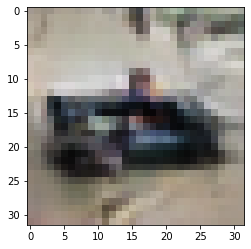

-> Epoch 314, Batch numero 1/78 -> Disc. loss on real images: 0.38950, Disc. loss on fake images: 0.27590, Generator loss: 2.72641
-> Epoch 314, Batch numero 2/78 -> Disc. loss on real images: 0.23742, Disc. loss on fake images: 0.34892, Generator loss: 3.00513
-> Epoch 314, Batch numero 3/78 -> Disc. loss on real images: 0.22050, Disc. loss on fake images: 0.28233, Generator loss: 3.13273
-> Epoch 314, Batch numero 4/78 -> Disc. loss on real images: 0.41319, Disc. loss on fake images: 0.34512, Generator loss: 3.13239
-> Epoch 314, Batch numero 5/78 -> Disc. loss on real images: 0.38303, Disc. loss on fake images: 0.40944, Generator loss: 2.64725
-> Epoch 314, Batch numero 6/78 -> Disc. loss on real images: 0.31515, Disc. loss on fake images: 0.45482, Generator loss: 2.69805
-> Epoch 314, Batch numero 7/78 -> Disc. loss on real images: 0.33342, Disc. loss on fake images: 0.19230, Generator loss: 2.84592
-> Epoch 314, Batch numero 8/78 -> Disc. loss on real images: 0.39241, Disc. loss o

-> Epoch 314, Batch numero 64/78 -> Disc. loss on real images: 0.35741, Disc. loss on fake images: 0.33464, Generator loss: 2.83120
-> Epoch 314, Batch numero 65/78 -> Disc. loss on real images: 0.26908, Disc. loss on fake images: 0.14298, Generator loss: 2.51159
-> Epoch 314, Batch numero 66/78 -> Disc. loss on real images: 0.30828, Disc. loss on fake images: 0.28248, Generator loss: 1.97381
-> Epoch 314, Batch numero 67/78 -> Disc. loss on real images: 0.09879, Disc. loss on fake images: 0.20557, Generator loss: 2.42046
-> Epoch 314, Batch numero 68/78 -> Disc. loss on real images: 0.29071, Disc. loss on fake images: 0.27773, Generator loss: 2.58155
-> Epoch 314, Batch numero 69/78 -> Disc. loss on real images: 0.26804, Disc. loss on fake images: 0.21335, Generator loss: 2.94497
-> Epoch 314, Batch numero 70/78 -> Disc. loss on real images: 0.17627, Disc. loss on fake images: 0.17328, Generator loss: 2.69362
-> Epoch 314, Batch numero 71/78 -> Disc. loss on real images: 0.20954, Disc

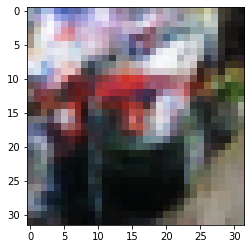

-> Epoch 315, Batch numero 1/78 -> Disc. loss on real images: 0.16199, Disc. loss on fake images: 0.43933, Generator loss: 2.95628
-> Epoch 315, Batch numero 2/78 -> Disc. loss on real images: 0.52300, Disc. loss on fake images: 0.28695, Generator loss: 2.46134
-> Epoch 315, Batch numero 3/78 -> Disc. loss on real images: 0.20714, Disc. loss on fake images: 0.23546, Generator loss: 2.76482
-> Epoch 315, Batch numero 4/78 -> Disc. loss on real images: 0.32681, Disc. loss on fake images: 0.40802, Generator loss: 2.83167
-> Epoch 315, Batch numero 5/78 -> Disc. loss on real images: 0.24540, Disc. loss on fake images: 0.18392, Generator loss: 2.95335
-> Epoch 315, Batch numero 6/78 -> Disc. loss on real images: 0.29871, Disc. loss on fake images: 0.14809, Generator loss: 2.49504
-> Epoch 315, Batch numero 7/78 -> Disc. loss on real images: 0.13382, Disc. loss on fake images: 0.26853, Generator loss: 2.71097
-> Epoch 315, Batch numero 8/78 -> Disc. loss on real images: 0.31506, Disc. loss o

-> Epoch 315, Batch numero 64/78 -> Disc. loss on real images: 0.22440, Disc. loss on fake images: 0.28028, Generator loss: 2.67730
-> Epoch 315, Batch numero 65/78 -> Disc. loss on real images: 0.24590, Disc. loss on fake images: 0.19742, Generator loss: 2.99235
-> Epoch 315, Batch numero 66/78 -> Disc. loss on real images: 0.33680, Disc. loss on fake images: 0.34629, Generator loss: 2.73343
-> Epoch 315, Batch numero 67/78 -> Disc. loss on real images: 0.34221, Disc. loss on fake images: 0.28519, Generator loss: 2.64551
-> Epoch 315, Batch numero 68/78 -> Disc. loss on real images: 0.28941, Disc. loss on fake images: 0.25931, Generator loss: 2.85845
-> Epoch 315, Batch numero 69/78 -> Disc. loss on real images: 0.38054, Disc. loss on fake images: 0.47136, Generator loss: 2.71492
-> Epoch 315, Batch numero 70/78 -> Disc. loss on real images: 0.24411, Disc. loss on fake images: 0.27393, Generator loss: 3.02943
-> Epoch 315, Batch numero 71/78 -> Disc. loss on real images: 0.37613, Disc

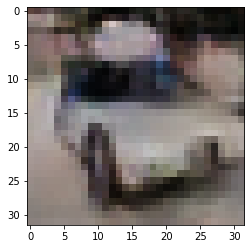

-> Epoch 316, Batch numero 1/78 -> Disc. loss on real images: 0.17280, Disc. loss on fake images: 0.24999, Generator loss: 3.07004
-> Epoch 316, Batch numero 2/78 -> Disc. loss on real images: 0.22630, Disc. loss on fake images: 0.15026, Generator loss: 3.33411
-> Epoch 316, Batch numero 3/78 -> Disc. loss on real images: 0.30517, Disc. loss on fake images: 0.33021, Generator loss: 2.95455
-> Epoch 316, Batch numero 4/78 -> Disc. loss on real images: 0.31560, Disc. loss on fake images: 0.41016, Generator loss: 2.49858
-> Epoch 316, Batch numero 5/78 -> Disc. loss on real images: 0.28378, Disc. loss on fake images: 0.23496, Generator loss: 2.99001
-> Epoch 316, Batch numero 6/78 -> Disc. loss on real images: 0.36394, Disc. loss on fake images: 0.24337, Generator loss: 3.26380
-> Epoch 316, Batch numero 7/78 -> Disc. loss on real images: 0.18447, Disc. loss on fake images: 0.23377, Generator loss: 2.78870
-> Epoch 316, Batch numero 8/78 -> Disc. loss on real images: 0.15155, Disc. loss o

-> Epoch 316, Batch numero 66/78 -> Disc. loss on real images: 0.32722, Disc. loss on fake images: 0.19231, Generator loss: 2.79248
-> Epoch 316, Batch numero 67/78 -> Disc. loss on real images: 0.50091, Disc. loss on fake images: 0.32094, Generator loss: 2.54060
-> Epoch 316, Batch numero 68/78 -> Disc. loss on real images: 0.30728, Disc. loss on fake images: 0.39966, Generator loss: 2.54167
-> Epoch 316, Batch numero 69/78 -> Disc. loss on real images: 0.15614, Disc. loss on fake images: 0.31859, Generator loss: 2.75217
-> Epoch 316, Batch numero 70/78 -> Disc. loss on real images: 0.26403, Disc. loss on fake images: 0.19726, Generator loss: 2.74824
-> Epoch 316, Batch numero 71/78 -> Disc. loss on real images: 0.39453, Disc. loss on fake images: 0.28917, Generator loss: 2.52016
-> Epoch 316, Batch numero 72/78 -> Disc. loss on real images: 0.30626, Disc. loss on fake images: 0.28353, Generator loss: 2.66629
-> Epoch 316, Batch numero 73/78 -> Disc. loss on real images: 0.14546, Disc

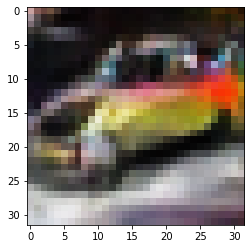

-> Epoch 317, Batch numero 1/78 -> Disc. loss on real images: 0.21716, Disc. loss on fake images: 0.17636, Generator loss: 2.42604
-> Epoch 317, Batch numero 2/78 -> Disc. loss on real images: 0.22417, Disc. loss on fake images: 0.34223, Generator loss: 2.62031
-> Epoch 317, Batch numero 3/78 -> Disc. loss on real images: 0.31980, Disc. loss on fake images: 0.31317, Generator loss: 3.01678
-> Epoch 317, Batch numero 4/78 -> Disc. loss on real images: 0.39684, Disc. loss on fake images: 0.49108, Generator loss: 2.99884
-> Epoch 317, Batch numero 5/78 -> Disc. loss on real images: 0.41330, Disc. loss on fake images: 0.28631, Generator loss: 2.64001
-> Epoch 317, Batch numero 6/78 -> Disc. loss on real images: 0.16382, Disc. loss on fake images: 0.38855, Generator loss: 2.69295
-> Epoch 317, Batch numero 7/78 -> Disc. loss on real images: 0.25044, Disc. loss on fake images: 0.39289, Generator loss: 2.74432
-> Epoch 317, Batch numero 8/78 -> Disc. loss on real images: 0.32009, Disc. loss o

-> Epoch 317, Batch numero 64/78 -> Disc. loss on real images: 0.14703, Disc. loss on fake images: 0.20724, Generator loss: 2.77697
-> Epoch 317, Batch numero 65/78 -> Disc. loss on real images: 0.25265, Disc. loss on fake images: 0.40474, Generator loss: 3.13414
-> Epoch 317, Batch numero 66/78 -> Disc. loss on real images: 0.20896, Disc. loss on fake images: 0.38185, Generator loss: 2.92660
-> Epoch 317, Batch numero 67/78 -> Disc. loss on real images: 0.44861, Disc. loss on fake images: 0.14620, Generator loss: 2.90839
-> Epoch 317, Batch numero 68/78 -> Disc. loss on real images: 0.30133, Disc. loss on fake images: 0.15666, Generator loss: 2.90703
-> Epoch 317, Batch numero 69/78 -> Disc. loss on real images: 0.25694, Disc. loss on fake images: 0.52168, Generator loss: 3.01152
-> Epoch 317, Batch numero 70/78 -> Disc. loss on real images: 0.40043, Disc. loss on fake images: 0.18185, Generator loss: 3.10581
-> Epoch 317, Batch numero 71/78 -> Disc. loss on real images: 0.56213, Disc

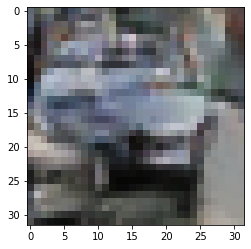

-> Epoch 318, Batch numero 1/78 -> Disc. loss on real images: 0.41488, Disc. loss on fake images: 0.44914, Generator loss: 3.03650
-> Epoch 318, Batch numero 2/78 -> Disc. loss on real images: 0.22579, Disc. loss on fake images: 0.17340, Generator loss: 2.87995
-> Epoch 318, Batch numero 3/78 -> Disc. loss on real images: 0.18411, Disc. loss on fake images: 0.28876, Generator loss: 2.64836
-> Epoch 318, Batch numero 4/78 -> Disc. loss on real images: 0.27565, Disc. loss on fake images: 0.25444, Generator loss: 2.92313
-> Epoch 318, Batch numero 5/78 -> Disc. loss on real images: 0.38276, Disc. loss on fake images: 0.24661, Generator loss: 2.63619
-> Epoch 318, Batch numero 6/78 -> Disc. loss on real images: 0.16526, Disc. loss on fake images: 0.33980, Generator loss: 2.58066
-> Epoch 318, Batch numero 7/78 -> Disc. loss on real images: 0.30299, Disc. loss on fake images: 0.27390, Generator loss: 2.97857
-> Epoch 318, Batch numero 8/78 -> Disc. loss on real images: 0.20595, Disc. loss o

-> Epoch 318, Batch numero 64/78 -> Disc. loss on real images: 0.33975, Disc. loss on fake images: 0.49105, Generator loss: 3.25319
-> Epoch 318, Batch numero 65/78 -> Disc. loss on real images: 0.36437, Disc. loss on fake images: 0.10152, Generator loss: 2.91653
-> Epoch 318, Batch numero 66/78 -> Disc. loss on real images: 0.36131, Disc. loss on fake images: 0.22118, Generator loss: 2.41077
-> Epoch 318, Batch numero 67/78 -> Disc. loss on real images: 0.17709, Disc. loss on fake images: 0.41350, Generator loss: 2.57918
-> Epoch 318, Batch numero 68/78 -> Disc. loss on real images: 0.19081, Disc. loss on fake images: 0.18215, Generator loss: 2.95429
-> Epoch 318, Batch numero 69/78 -> Disc. loss on real images: 0.21344, Disc. loss on fake images: 0.27802, Generator loss: 2.94242
-> Epoch 318, Batch numero 70/78 -> Disc. loss on real images: 0.30437, Disc. loss on fake images: 0.40782, Generator loss: 3.07979
-> Epoch 318, Batch numero 71/78 -> Disc. loss on real images: 0.19808, Disc

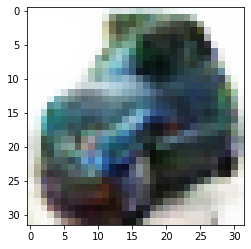

-> Epoch 319, Batch numero 1/78 -> Disc. loss on real images: 0.26602, Disc. loss on fake images: 0.41133, Generator loss: 3.12462
-> Epoch 319, Batch numero 2/78 -> Disc. loss on real images: 0.30078, Disc. loss on fake images: 0.26576, Generator loss: 2.81474
-> Epoch 319, Batch numero 3/78 -> Disc. loss on real images: 0.24178, Disc. loss on fake images: 0.15534, Generator loss: 2.26967
-> Epoch 319, Batch numero 4/78 -> Disc. loss on real images: 0.22592, Disc. loss on fake images: 0.26711, Generator loss: 2.23148
-> Epoch 319, Batch numero 5/78 -> Disc. loss on real images: 0.15722, Disc. loss on fake images: 0.22500, Generator loss: 2.65011
-> Epoch 319, Batch numero 6/78 -> Disc. loss on real images: 0.19655, Disc. loss on fake images: 0.20516, Generator loss: 2.57719
-> Epoch 319, Batch numero 7/78 -> Disc. loss on real images: 0.20119, Disc. loss on fake images: 0.14993, Generator loss: 2.34752
-> Epoch 319, Batch numero 8/78 -> Disc. loss on real images: 0.27043, Disc. loss o

-> Epoch 319, Batch numero 64/78 -> Disc. loss on real images: 0.25699, Disc. loss on fake images: 0.21912, Generator loss: 2.68270
-> Epoch 319, Batch numero 65/78 -> Disc. loss on real images: 0.22184, Disc. loss on fake images: 0.58485, Generator loss: 3.06635
-> Epoch 319, Batch numero 66/78 -> Disc. loss on real images: 0.43608, Disc. loss on fake images: 0.24015, Generator loss: 2.69625
-> Epoch 319, Batch numero 67/78 -> Disc. loss on real images: 0.43497, Disc. loss on fake images: 0.21456, Generator loss: 2.59474
-> Epoch 319, Batch numero 68/78 -> Disc. loss on real images: 0.25153, Disc. loss on fake images: 0.36893, Generator loss: 2.74024
-> Epoch 319, Batch numero 69/78 -> Disc. loss on real images: 0.26053, Disc. loss on fake images: 0.28507, Generator loss: 2.73013
-> Epoch 319, Batch numero 70/78 -> Disc. loss on real images: 0.23918, Disc. loss on fake images: 0.43159, Generator loss: 3.21086
-> Epoch 319, Batch numero 71/78 -> Disc. loss on real images: 0.22825, Disc

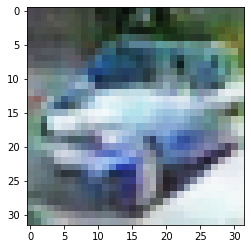

-> Epoch 320, Batch numero 1/78 -> Disc. loss on real images: 0.28167, Disc. loss on fake images: 0.26173, Generator loss: 2.90491
-> Epoch 320, Batch numero 2/78 -> Disc. loss on real images: 0.33442, Disc. loss on fake images: 0.21193, Generator loss: 2.75626
-> Epoch 320, Batch numero 3/78 -> Disc. loss on real images: 0.21685, Disc. loss on fake images: 0.39918, Generator loss: 2.59934
-> Epoch 320, Batch numero 4/78 -> Disc. loss on real images: 0.36831, Disc. loss on fake images: 0.34317, Generator loss: 2.78235
-> Epoch 320, Batch numero 5/78 -> Disc. loss on real images: 0.18341, Disc. loss on fake images: 0.23939, Generator loss: 2.89876
-> Epoch 320, Batch numero 6/78 -> Disc. loss on real images: 0.43987, Disc. loss on fake images: 0.28422, Generator loss: 2.81109
-> Epoch 320, Batch numero 7/78 -> Disc. loss on real images: 0.18982, Disc. loss on fake images: 0.33285, Generator loss: 3.43153
-> Epoch 320, Batch numero 8/78 -> Disc. loss on real images: 0.24917, Disc. loss o

-> Epoch 320, Batch numero 65/78 -> Disc. loss on real images: 0.45960, Disc. loss on fake images: 0.35332, Generator loss: 2.86498
-> Epoch 320, Batch numero 66/78 -> Disc. loss on real images: 0.50054, Disc. loss on fake images: 0.32376, Generator loss: 2.82941
-> Epoch 320, Batch numero 67/78 -> Disc. loss on real images: 0.26680, Disc. loss on fake images: 0.38810, Generator loss: 2.90818
-> Epoch 320, Batch numero 68/78 -> Disc. loss on real images: 0.31420, Disc. loss on fake images: 0.20486, Generator loss: 2.91521
-> Epoch 320, Batch numero 69/78 -> Disc. loss on real images: 0.25215, Disc. loss on fake images: 0.31882, Generator loss: 2.53140
-> Epoch 320, Batch numero 70/78 -> Disc. loss on real images: 0.20912, Disc. loss on fake images: 0.17270, Generator loss: 2.55294
-> Epoch 320, Batch numero 71/78 -> Disc. loss on real images: 0.22393, Disc. loss on fake images: 0.22557, Generator loss: 2.58565
-> Epoch 320, Batch numero 72/78 -> Disc. loss on real images: 0.10551, Disc

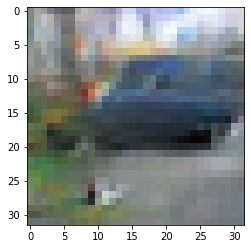

-> Epoch 321, Batch numero 1/78 -> Disc. loss on real images: 0.11885, Disc. loss on fake images: 0.41708, Generator loss: 2.94730
-> Epoch 321, Batch numero 2/78 -> Disc. loss on real images: 0.37984, Disc. loss on fake images: 0.24697, Generator loss: 2.59114
-> Epoch 321, Batch numero 3/78 -> Disc. loss on real images: 0.24459, Disc. loss on fake images: 0.49814, Generator loss: 3.24584
-> Epoch 321, Batch numero 4/78 -> Disc. loss on real images: 0.49151, Disc. loss on fake images: 0.16624, Generator loss: 2.92963
-> Epoch 321, Batch numero 5/78 -> Disc. loss on real images: 0.18711, Disc. loss on fake images: 0.22448, Generator loss: 2.26058
-> Epoch 321, Batch numero 6/78 -> Disc. loss on real images: 0.27608, Disc. loss on fake images: 0.43703, Generator loss: 2.77565
-> Epoch 321, Batch numero 7/78 -> Disc. loss on real images: 0.11643, Disc. loss on fake images: 0.25089, Generator loss: 3.12672
-> Epoch 321, Batch numero 8/78 -> Disc. loss on real images: 0.32858, Disc. loss o

-> Epoch 321, Batch numero 64/78 -> Disc. loss on real images: 0.12619, Disc. loss on fake images: 0.45327, Generator loss: 2.90215
-> Epoch 321, Batch numero 65/78 -> Disc. loss on real images: 0.22932, Disc. loss on fake images: 0.27116, Generator loss: 3.21942
-> Epoch 321, Batch numero 66/78 -> Disc. loss on real images: 0.29320, Disc. loss on fake images: 0.18792, Generator loss: 2.67622
-> Epoch 321, Batch numero 67/78 -> Disc. loss on real images: 0.29339, Disc. loss on fake images: 0.30664, Generator loss: 2.91637
-> Epoch 321, Batch numero 68/78 -> Disc. loss on real images: 0.22604, Disc. loss on fake images: 0.41739, Generator loss: 2.68186
-> Epoch 321, Batch numero 69/78 -> Disc. loss on real images: 0.20018, Disc. loss on fake images: 0.30572, Generator loss: 2.86456
-> Epoch 321, Batch numero 70/78 -> Disc. loss on real images: 0.32986, Disc. loss on fake images: 0.23076, Generator loss: 2.74348
-> Epoch 321, Batch numero 71/78 -> Disc. loss on real images: 0.36320, Disc

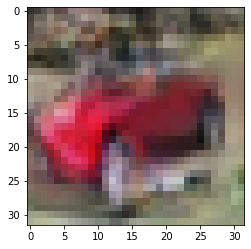

-> Epoch 322, Batch numero 1/78 -> Disc. loss on real images: 0.19550, Disc. loss on fake images: 0.19765, Generator loss: 3.04446
-> Epoch 322, Batch numero 2/78 -> Disc. loss on real images: 0.17423, Disc. loss on fake images: 0.23669, Generator loss: 2.68361
-> Epoch 322, Batch numero 3/78 -> Disc. loss on real images: 0.26253, Disc. loss on fake images: 0.28966, Generator loss: 3.04635
-> Epoch 322, Batch numero 4/78 -> Disc. loss on real images: 0.20706, Disc. loss on fake images: 0.35841, Generator loss: 2.79341
-> Epoch 322, Batch numero 5/78 -> Disc. loss on real images: 0.41420, Disc. loss on fake images: 0.27625, Generator loss: 2.70637
-> Epoch 322, Batch numero 6/78 -> Disc. loss on real images: 0.30546, Disc. loss on fake images: 0.33733, Generator loss: 3.19083
-> Epoch 322, Batch numero 7/78 -> Disc. loss on real images: 0.21052, Disc. loss on fake images: 0.14523, Generator loss: 2.88097
-> Epoch 322, Batch numero 8/78 -> Disc. loss on real images: 0.35135, Disc. loss o

-> Epoch 322, Batch numero 64/78 -> Disc. loss on real images: 0.23942, Disc. loss on fake images: 0.16252, Generator loss: 2.89070
-> Epoch 322, Batch numero 65/78 -> Disc. loss on real images: 0.31328, Disc. loss on fake images: 0.22069, Generator loss: 2.68172
-> Epoch 322, Batch numero 66/78 -> Disc. loss on real images: 0.23588, Disc. loss on fake images: 0.20201, Generator loss: 2.75803
-> Epoch 322, Batch numero 67/78 -> Disc. loss on real images: 0.37390, Disc. loss on fake images: 0.39201, Generator loss: 2.94890
-> Epoch 322, Batch numero 68/78 -> Disc. loss on real images: 0.27191, Disc. loss on fake images: 0.19012, Generator loss: 2.85066
-> Epoch 322, Batch numero 69/78 -> Disc. loss on real images: 0.19114, Disc. loss on fake images: 0.40704, Generator loss: 3.23340
-> Epoch 322, Batch numero 70/78 -> Disc. loss on real images: 0.36473, Disc. loss on fake images: 0.14622, Generator loss: 2.90009
-> Epoch 322, Batch numero 71/78 -> Disc. loss on real images: 0.48493, Disc

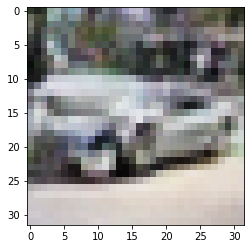

-> Epoch 323, Batch numero 1/78 -> Disc. loss on real images: 0.47221, Disc. loss on fake images: 0.44002, Generator loss: 2.79510
-> Epoch 323, Batch numero 2/78 -> Disc. loss on real images: 0.21367, Disc. loss on fake images: 0.18886, Generator loss: 2.75256
-> Epoch 323, Batch numero 3/78 -> Disc. loss on real images: 0.36825, Disc. loss on fake images: 0.22406, Generator loss: 2.78882
-> Epoch 323, Batch numero 4/78 -> Disc. loss on real images: 0.26868, Disc. loss on fake images: 0.27207, Generator loss: 2.69087
-> Epoch 323, Batch numero 5/78 -> Disc. loss on real images: 0.16742, Disc. loss on fake images: 0.47506, Generator loss: 2.91631
-> Epoch 323, Batch numero 6/78 -> Disc. loss on real images: 0.19605, Disc. loss on fake images: 0.18862, Generator loss: 3.20901
-> Epoch 323, Batch numero 7/78 -> Disc. loss on real images: 0.24152, Disc. loss on fake images: 0.28901, Generator loss: 3.06399
-> Epoch 323, Batch numero 8/78 -> Disc. loss on real images: 0.27847, Disc. loss o

-> Epoch 323, Batch numero 64/78 -> Disc. loss on real images: 0.29186, Disc. loss on fake images: 0.48886, Generator loss: 3.08866
-> Epoch 323, Batch numero 65/78 -> Disc. loss on real images: 0.34872, Disc. loss on fake images: 0.20970, Generator loss: 2.85836
-> Epoch 323, Batch numero 66/78 -> Disc. loss on real images: 0.32380, Disc. loss on fake images: 0.28324, Generator loss: 2.77403
-> Epoch 323, Batch numero 67/78 -> Disc. loss on real images: 0.30346, Disc. loss on fake images: 0.27146, Generator loss: 2.35524
-> Epoch 323, Batch numero 68/78 -> Disc. loss on real images: 0.35819, Disc. loss on fake images: 0.41405, Generator loss: 2.54171
-> Epoch 323, Batch numero 69/78 -> Disc. loss on real images: 0.13075, Disc. loss on fake images: 0.38101, Generator loss: 2.39963
-> Epoch 323, Batch numero 70/78 -> Disc. loss on real images: 0.25593, Disc. loss on fake images: 0.29461, Generator loss: 2.90476
-> Epoch 323, Batch numero 71/78 -> Disc. loss on real images: 0.29678, Disc

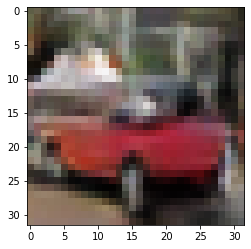

-> Epoch 324, Batch numero 1/78 -> Disc. loss on real images: 0.22041, Disc. loss on fake images: 0.43535, Generator loss: 3.38331
-> Epoch 324, Batch numero 2/78 -> Disc. loss on real images: 0.27691, Disc. loss on fake images: 0.20795, Generator loss: 2.90425
-> Epoch 324, Batch numero 3/78 -> Disc. loss on real images: 0.47480, Disc. loss on fake images: 0.25750, Generator loss: 2.61842
-> Epoch 324, Batch numero 4/78 -> Disc. loss on real images: 0.15693, Disc. loss on fake images: 0.30428, Generator loss: 2.91357
-> Epoch 324, Batch numero 5/78 -> Disc. loss on real images: 0.26623, Disc. loss on fake images: 0.19881, Generator loss: 3.00853
-> Epoch 324, Batch numero 6/78 -> Disc. loss on real images: 0.26368, Disc. loss on fake images: 0.58799, Generator loss: 3.12391
-> Epoch 324, Batch numero 7/78 -> Disc. loss on real images: 0.22725, Disc. loss on fake images: 0.26989, Generator loss: 3.44452
-> Epoch 324, Batch numero 8/78 -> Disc. loss on real images: 0.41889, Disc. loss o

-> Epoch 324, Batch numero 64/78 -> Disc. loss on real images: 0.30799, Disc. loss on fake images: 0.25508, Generator loss: 2.43972
-> Epoch 324, Batch numero 65/78 -> Disc. loss on real images: 0.28008, Disc. loss on fake images: 0.34544, Generator loss: 2.78198
-> Epoch 324, Batch numero 66/78 -> Disc. loss on real images: 0.27193, Disc. loss on fake images: 0.40632, Generator loss: 3.36686
-> Epoch 324, Batch numero 67/78 -> Disc. loss on real images: 0.25349, Disc. loss on fake images: 0.26687, Generator loss: 3.42457
-> Epoch 324, Batch numero 68/78 -> Disc. loss on real images: 0.29312, Disc. loss on fake images: 0.16180, Generator loss: 2.73845
-> Epoch 324, Batch numero 69/78 -> Disc. loss on real images: 0.31712, Disc. loss on fake images: 0.33157, Generator loss: 2.57726
-> Epoch 324, Batch numero 70/78 -> Disc. loss on real images: 0.28963, Disc. loss on fake images: 0.34999, Generator loss: 2.70040
-> Epoch 324, Batch numero 71/78 -> Disc. loss on real images: 0.36723, Disc

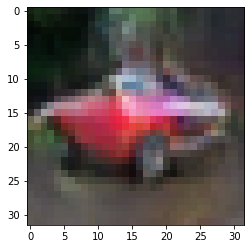

-> Epoch 325, Batch numero 1/78 -> Disc. loss on real images: 0.26513, Disc. loss on fake images: 0.26151, Generator loss: 2.68551
-> Epoch 325, Batch numero 2/78 -> Disc. loss on real images: 0.28942, Disc. loss on fake images: 0.35232, Generator loss: 3.14916
-> Epoch 325, Batch numero 3/78 -> Disc. loss on real images: 0.34435, Disc. loss on fake images: 0.32053, Generator loss: 2.28709
-> Epoch 325, Batch numero 4/78 -> Disc. loss on real images: 0.35448, Disc. loss on fake images: 0.32669, Generator loss: 2.65189
-> Epoch 325, Batch numero 5/78 -> Disc. loss on real images: 0.23761, Disc. loss on fake images: 0.22766, Generator loss: 2.39413
-> Epoch 325, Batch numero 6/78 -> Disc. loss on real images: 0.21994, Disc. loss on fake images: 0.37252, Generator loss: 2.71363
-> Epoch 325, Batch numero 7/78 -> Disc. loss on real images: 0.16902, Disc. loss on fake images: 0.16714, Generator loss: 2.47281
-> Epoch 325, Batch numero 8/78 -> Disc. loss on real images: 0.27570, Disc. loss o

-> Epoch 325, Batch numero 64/78 -> Disc. loss on real images: 0.35022, Disc. loss on fake images: 0.09362, Generator loss: 3.03763
-> Epoch 325, Batch numero 65/78 -> Disc. loss on real images: 0.28280, Disc. loss on fake images: 0.20647, Generator loss: 2.70493
-> Epoch 325, Batch numero 66/78 -> Disc. loss on real images: 0.20351, Disc. loss on fake images: 0.20774, Generator loss: 3.03063
-> Epoch 325, Batch numero 67/78 -> Disc. loss on real images: 0.35107, Disc. loss on fake images: 0.31738, Generator loss: 2.79236
-> Epoch 325, Batch numero 68/78 -> Disc. loss on real images: 0.25814, Disc. loss on fake images: 0.48792, Generator loss: 3.57359
-> Epoch 325, Batch numero 69/78 -> Disc. loss on real images: 0.45032, Disc. loss on fake images: 0.27518, Generator loss: 3.00685
-> Epoch 325, Batch numero 70/78 -> Disc. loss on real images: 0.24848, Disc. loss on fake images: 0.27726, Generator loss: 2.76596
-> Epoch 325, Batch numero 71/78 -> Disc. loss on real images: 0.28629, Disc

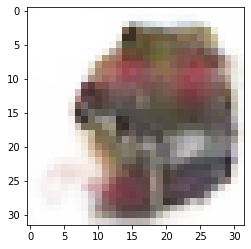

-> Epoch 326, Batch numero 1/78 -> Disc. loss on real images: 0.20694, Disc. loss on fake images: 0.32843, Generator loss: 2.86504
-> Epoch 326, Batch numero 2/78 -> Disc. loss on real images: 0.18810, Disc. loss on fake images: 0.40233, Generator loss: 3.00156
-> Epoch 326, Batch numero 3/78 -> Disc. loss on real images: 0.28066, Disc. loss on fake images: 0.21990, Generator loss: 2.63072
-> Epoch 326, Batch numero 4/78 -> Disc. loss on real images: 0.37652, Disc. loss on fake images: 0.39274, Generator loss: 2.80680
-> Epoch 326, Batch numero 5/78 -> Disc. loss on real images: 0.30874, Disc. loss on fake images: 0.17197, Generator loss: 2.74972
-> Epoch 326, Batch numero 6/78 -> Disc. loss on real images: 0.28298, Disc. loss on fake images: 0.22235, Generator loss: 2.44504
-> Epoch 326, Batch numero 7/78 -> Disc. loss on real images: 0.16864, Disc. loss on fake images: 0.28435, Generator loss: 2.55058
-> Epoch 326, Batch numero 8/78 -> Disc. loss on real images: 0.35640, Disc. loss o

-> Epoch 326, Batch numero 64/78 -> Disc. loss on real images: 0.33552, Disc. loss on fake images: 0.52025, Generator loss: 3.06668
-> Epoch 326, Batch numero 65/78 -> Disc. loss on real images: 0.29238, Disc. loss on fake images: 0.24455, Generator loss: 3.24341
-> Epoch 326, Batch numero 66/78 -> Disc. loss on real images: 0.33429, Disc. loss on fake images: 0.32187, Generator loss: 3.54241
-> Epoch 326, Batch numero 67/78 -> Disc. loss on real images: 0.37194, Disc. loss on fake images: 0.31272, Generator loss: 2.90233
-> Epoch 326, Batch numero 68/78 -> Disc. loss on real images: 0.30073, Disc. loss on fake images: 0.19373, Generator loss: 3.02629
-> Epoch 326, Batch numero 69/78 -> Disc. loss on real images: 0.17772, Disc. loss on fake images: 0.20293, Generator loss: 2.52652
-> Epoch 326, Batch numero 70/78 -> Disc. loss on real images: 0.23535, Disc. loss on fake images: 0.17049, Generator loss: 2.79400
-> Epoch 326, Batch numero 71/78 -> Disc. loss on real images: 0.29360, Disc

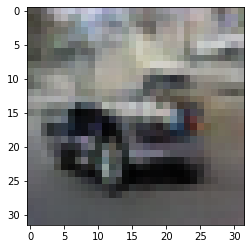

-> Epoch 327, Batch numero 1/78 -> Disc. loss on real images: 0.26103, Disc. loss on fake images: 0.56957, Generator loss: 2.76466
-> Epoch 327, Batch numero 2/78 -> Disc. loss on real images: 0.22356, Disc. loss on fake images: 0.37501, Generator loss: 3.27269
-> Epoch 327, Batch numero 3/78 -> Disc. loss on real images: 0.37462, Disc. loss on fake images: 0.10195, Generator loss: 3.15263
-> Epoch 327, Batch numero 4/78 -> Disc. loss on real images: 0.42487, Disc. loss on fake images: 0.34675, Generator loss: 2.36043
-> Epoch 327, Batch numero 5/78 -> Disc. loss on real images: 0.20998, Disc. loss on fake images: 0.35559, Generator loss: 2.58874
-> Epoch 327, Batch numero 6/78 -> Disc. loss on real images: 0.28820, Disc. loss on fake images: 0.25196, Generator loss: 2.76475
-> Epoch 327, Batch numero 7/78 -> Disc. loss on real images: 0.28914, Disc. loss on fake images: 0.42002, Generator loss: 2.64307
-> Epoch 327, Batch numero 8/78 -> Disc. loss on real images: 0.30851, Disc. loss o

-> Epoch 327, Batch numero 64/78 -> Disc. loss on real images: 0.22798, Disc. loss on fake images: 0.18039, Generator loss: 3.05633
-> Epoch 327, Batch numero 65/78 -> Disc. loss on real images: 0.30653, Disc. loss on fake images: 0.23833, Generator loss: 2.90411
-> Epoch 327, Batch numero 66/78 -> Disc. loss on real images: 0.16277, Disc. loss on fake images: 0.27989, Generator loss: 3.39848
-> Epoch 327, Batch numero 67/78 -> Disc. loss on real images: 0.27422, Disc. loss on fake images: 0.25335, Generator loss: 3.11725
-> Epoch 327, Batch numero 68/78 -> Disc. loss on real images: 0.27429, Disc. loss on fake images: 0.27676, Generator loss: 3.09722
-> Epoch 327, Batch numero 69/78 -> Disc. loss on real images: 0.34135, Disc. loss on fake images: 0.15532, Generator loss: 2.79190
-> Epoch 327, Batch numero 70/78 -> Disc. loss on real images: 0.18675, Disc. loss on fake images: 0.36051, Generator loss: 2.97848
-> Epoch 327, Batch numero 71/78 -> Disc. loss on real images: 0.49264, Disc

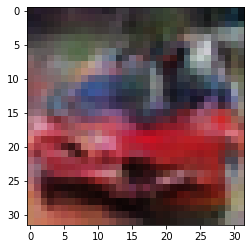

-> Epoch 328, Batch numero 1/78 -> Disc. loss on real images: 0.26260, Disc. loss on fake images: 0.34411, Generator loss: 2.69943
-> Epoch 328, Batch numero 2/78 -> Disc. loss on real images: 0.29344, Disc. loss on fake images: 0.27772, Generator loss: 2.65776
-> Epoch 328, Batch numero 3/78 -> Disc. loss on real images: 0.23112, Disc. loss on fake images: 0.42386, Generator loss: 3.20426
-> Epoch 328, Batch numero 4/78 -> Disc. loss on real images: 0.34875, Disc. loss on fake images: 0.22580, Generator loss: 2.63789
-> Epoch 328, Batch numero 5/78 -> Disc. loss on real images: 0.36081, Disc. loss on fake images: 0.83065, Generator loss: 2.70324
-> Epoch 328, Batch numero 6/78 -> Disc. loss on real images: 0.27838, Disc. loss on fake images: 0.17523, Generator loss: 2.59861
-> Epoch 328, Batch numero 7/78 -> Disc. loss on real images: 0.39315, Disc. loss on fake images: 0.34773, Generator loss: 2.44432
-> Epoch 328, Batch numero 8/78 -> Disc. loss on real images: 0.25159, Disc. loss o

-> Epoch 328, Batch numero 64/78 -> Disc. loss on real images: 0.24312, Disc. loss on fake images: 0.33452, Generator loss: 3.27673
-> Epoch 328, Batch numero 65/78 -> Disc. loss on real images: 0.27433, Disc. loss on fake images: 0.19840, Generator loss: 3.37646
-> Epoch 328, Batch numero 66/78 -> Disc. loss on real images: 0.24803, Disc. loss on fake images: 0.19975, Generator loss: 3.48499
-> Epoch 328, Batch numero 67/78 -> Disc. loss on real images: 0.27670, Disc. loss on fake images: 0.17491, Generator loss: 2.84838
-> Epoch 328, Batch numero 68/78 -> Disc. loss on real images: 0.18562, Disc. loss on fake images: 0.35011, Generator loss: 2.77592
-> Epoch 328, Batch numero 69/78 -> Disc. loss on real images: 0.22778, Disc. loss on fake images: 0.38776, Generator loss: 3.40466
-> Epoch 328, Batch numero 70/78 -> Disc. loss on real images: 0.22520, Disc. loss on fake images: 0.50361, Generator loss: 3.30890
-> Epoch 328, Batch numero 71/78 -> Disc. loss on real images: 0.19228, Disc

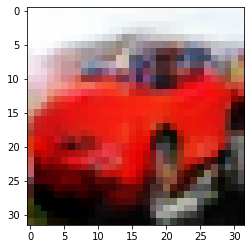

-> Epoch 329, Batch numero 1/78 -> Disc. loss on real images: 0.27576, Disc. loss on fake images: 0.54392, Generator loss: 3.44277
-> Epoch 329, Batch numero 2/78 -> Disc. loss on real images: 0.37496, Disc. loss on fake images: 0.30568, Generator loss: 3.07331
-> Epoch 329, Batch numero 3/78 -> Disc. loss on real images: 0.33695, Disc. loss on fake images: 0.38908, Generator loss: 2.95033
-> Epoch 329, Batch numero 4/78 -> Disc. loss on real images: 0.27339, Disc. loss on fake images: 0.21839, Generator loss: 3.02993
-> Epoch 329, Batch numero 5/78 -> Disc. loss on real images: 0.37774, Disc. loss on fake images: 0.23270, Generator loss: 2.76003
-> Epoch 329, Batch numero 6/78 -> Disc. loss on real images: 0.23142, Disc. loss on fake images: 0.23832, Generator loss: 2.88549
-> Epoch 329, Batch numero 7/78 -> Disc. loss on real images: 0.20460, Disc. loss on fake images: 0.25176, Generator loss: 2.93998
-> Epoch 329, Batch numero 8/78 -> Disc. loss on real images: 0.23851, Disc. loss o

-> Epoch 329, Batch numero 64/78 -> Disc. loss on real images: 0.29908, Disc. loss on fake images: 0.23415, Generator loss: 3.26776
-> Epoch 329, Batch numero 65/78 -> Disc. loss on real images: 0.18365, Disc. loss on fake images: 0.19579, Generator loss: 3.03908
-> Epoch 329, Batch numero 66/78 -> Disc. loss on real images: 0.35063, Disc. loss on fake images: 0.28913, Generator loss: 2.63061
-> Epoch 329, Batch numero 67/78 -> Disc. loss on real images: 0.12844, Disc. loss on fake images: 0.28703, Generator loss: 3.17274
-> Epoch 329, Batch numero 68/78 -> Disc. loss on real images: 0.28604, Disc. loss on fake images: 0.18733, Generator loss: 2.51766
-> Epoch 329, Batch numero 69/78 -> Disc. loss on real images: 0.15471, Disc. loss on fake images: 0.14365, Generator loss: 2.83002
-> Epoch 329, Batch numero 70/78 -> Disc. loss on real images: 0.15263, Disc. loss on fake images: 0.24577, Generator loss: 2.52953
-> Epoch 329, Batch numero 71/78 -> Disc. loss on real images: 0.28550, Disc

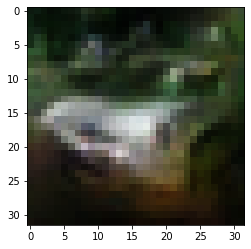

-> Epoch 330, Batch numero 1/78 -> Disc. loss on real images: 0.24427, Disc. loss on fake images: 0.26607, Generator loss: 2.92159
-> Epoch 330, Batch numero 2/78 -> Disc. loss on real images: 0.25664, Disc. loss on fake images: 0.32526, Generator loss: 2.60247
-> Epoch 330, Batch numero 3/78 -> Disc. loss on real images: 0.23766, Disc. loss on fake images: 0.32379, Generator loss: 2.82897
-> Epoch 330, Batch numero 4/78 -> Disc. loss on real images: 0.29538, Disc. loss on fake images: 0.23181, Generator loss: 2.94501
-> Epoch 330, Batch numero 5/78 -> Disc. loss on real images: 0.26651, Disc. loss on fake images: 0.46913, Generator loss: 2.98693
-> Epoch 330, Batch numero 6/78 -> Disc. loss on real images: 0.24994, Disc. loss on fake images: 0.33410, Generator loss: 3.16495
-> Epoch 330, Batch numero 7/78 -> Disc. loss on real images: 0.40066, Disc. loss on fake images: 0.36127, Generator loss: 2.91232
-> Epoch 330, Batch numero 8/78 -> Disc. loss on real images: 0.29045, Disc. loss o

-> Epoch 330, Batch numero 64/78 -> Disc. loss on real images: 0.43417, Disc. loss on fake images: 0.24996, Generator loss: 2.90001
-> Epoch 330, Batch numero 65/78 -> Disc. loss on real images: 0.12746, Disc. loss on fake images: 0.45867, Generator loss: 2.88937
-> Epoch 330, Batch numero 66/78 -> Disc. loss on real images: 0.18508, Disc. loss on fake images: 0.21100, Generator loss: 3.14386
-> Epoch 330, Batch numero 67/78 -> Disc. loss on real images: 0.50755, Disc. loss on fake images: 0.25872, Generator loss: 2.74887
-> Epoch 330, Batch numero 68/78 -> Disc. loss on real images: 0.18706, Disc. loss on fake images: 0.36922, Generator loss: 3.36163
-> Epoch 330, Batch numero 69/78 -> Disc. loss on real images: 0.33300, Disc. loss on fake images: 0.16381, Generator loss: 2.66018
-> Epoch 330, Batch numero 70/78 -> Disc. loss on real images: 0.53802, Disc. loss on fake images: 0.58581, Generator loss: 2.99470
-> Epoch 330, Batch numero 71/78 -> Disc. loss on real images: 0.29861, Disc

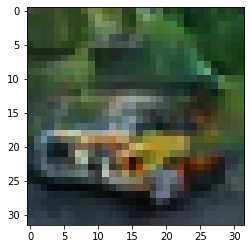

-> Epoch 331, Batch numero 1/78 -> Disc. loss on real images: 0.24699, Disc. loss on fake images: 0.21087, Generator loss: 3.07460
-> Epoch 331, Batch numero 2/78 -> Disc. loss on real images: 0.18132, Disc. loss on fake images: 0.19791, Generator loss: 2.57641
-> Epoch 331, Batch numero 3/78 -> Disc. loss on real images: 0.17486, Disc. loss on fake images: 0.19161, Generator loss: 2.96089
-> Epoch 331, Batch numero 4/78 -> Disc. loss on real images: 0.39128, Disc. loss on fake images: 0.31767, Generator loss: 2.38276
-> Epoch 331, Batch numero 5/78 -> Disc. loss on real images: 0.27015, Disc. loss on fake images: 0.46159, Generator loss: 2.88375
-> Epoch 331, Batch numero 6/78 -> Disc. loss on real images: 0.28235, Disc. loss on fake images: 0.26192, Generator loss: 3.23005
-> Epoch 331, Batch numero 7/78 -> Disc. loss on real images: 0.35033, Disc. loss on fake images: 0.28850, Generator loss: 2.71593
-> Epoch 331, Batch numero 8/78 -> Disc. loss on real images: 0.21162, Disc. loss o

-> Epoch 331, Batch numero 64/78 -> Disc. loss on real images: 0.18680, Disc. loss on fake images: 0.17627, Generator loss: 2.88877
-> Epoch 331, Batch numero 65/78 -> Disc. loss on real images: 0.40761, Disc. loss on fake images: 0.24231, Generator loss: 3.07181
-> Epoch 331, Batch numero 66/78 -> Disc. loss on real images: 0.27040, Disc. loss on fake images: 0.21867, Generator loss: 3.04379
-> Epoch 331, Batch numero 67/78 -> Disc. loss on real images: 0.37922, Disc. loss on fake images: 0.53915, Generator loss: 2.87515
-> Epoch 331, Batch numero 68/78 -> Disc. loss on real images: 0.17513, Disc. loss on fake images: 0.25684, Generator loss: 3.30319
-> Epoch 331, Batch numero 69/78 -> Disc. loss on real images: 0.43876, Disc. loss on fake images: 0.37564, Generator loss: 2.64342
-> Epoch 331, Batch numero 70/78 -> Disc. loss on real images: 0.34140, Disc. loss on fake images: 0.22549, Generator loss: 2.85819
-> Epoch 331, Batch numero 71/78 -> Disc. loss on real images: 0.31229, Disc

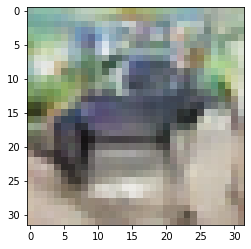

-> Epoch 332, Batch numero 1/78 -> Disc. loss on real images: 0.14901, Disc. loss on fake images: 0.30069, Generator loss: 3.25427
-> Epoch 332, Batch numero 2/78 -> Disc. loss on real images: 0.36276, Disc. loss on fake images: 0.37219, Generator loss: 2.94330
-> Epoch 332, Batch numero 3/78 -> Disc. loss on real images: 0.28311, Disc. loss on fake images: 0.37166, Generator loss: 3.32566
-> Epoch 332, Batch numero 4/78 -> Disc. loss on real images: 0.24560, Disc. loss on fake images: 0.16171, Generator loss: 2.65787
-> Epoch 332, Batch numero 5/78 -> Disc. loss on real images: 0.42682, Disc. loss on fake images: 0.41792, Generator loss: 2.72389
-> Epoch 332, Batch numero 6/78 -> Disc. loss on real images: 0.40708, Disc. loss on fake images: 0.29205, Generator loss: 3.08023
-> Epoch 332, Batch numero 7/78 -> Disc. loss on real images: 0.17622, Disc. loss on fake images: 0.28490, Generator loss: 2.65477
-> Epoch 332, Batch numero 8/78 -> Disc. loss on real images: 0.20912, Disc. loss o

-> Epoch 332, Batch numero 64/78 -> Disc. loss on real images: 0.22473, Disc. loss on fake images: 0.27518, Generator loss: 2.87016
-> Epoch 332, Batch numero 65/78 -> Disc. loss on real images: 0.24198, Disc. loss on fake images: 0.40083, Generator loss: 2.68781
-> Epoch 332, Batch numero 66/78 -> Disc. loss on real images: 0.22065, Disc. loss on fake images: 0.19892, Generator loss: 2.15149
-> Epoch 332, Batch numero 67/78 -> Disc. loss on real images: 0.21229, Disc. loss on fake images: 0.15915, Generator loss: 2.50993
-> Epoch 332, Batch numero 68/78 -> Disc. loss on real images: 0.28444, Disc. loss on fake images: 0.15206, Generator loss: 2.89696
-> Epoch 332, Batch numero 69/78 -> Disc. loss on real images: 0.17265, Disc. loss on fake images: 0.31147, Generator loss: 2.90662
-> Epoch 332, Batch numero 70/78 -> Disc. loss on real images: 0.35253, Disc. loss on fake images: 0.37941, Generator loss: 2.82091
-> Epoch 332, Batch numero 71/78 -> Disc. loss on real images: 0.19995, Disc

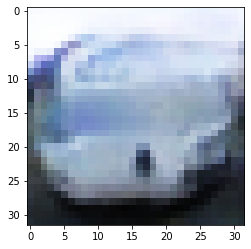

-> Epoch 333, Batch numero 1/78 -> Disc. loss on real images: 0.37881, Disc. loss on fake images: 0.31564, Generator loss: 3.05874
-> Epoch 333, Batch numero 2/78 -> Disc. loss on real images: 0.34442, Disc. loss on fake images: 0.34776, Generator loss: 3.11699
-> Epoch 333, Batch numero 3/78 -> Disc. loss on real images: 0.15283, Disc. loss on fake images: 0.16694, Generator loss: 2.81340
-> Epoch 333, Batch numero 4/78 -> Disc. loss on real images: 0.29273, Disc. loss on fake images: 0.29056, Generator loss: 2.86231
-> Epoch 333, Batch numero 5/78 -> Disc. loss on real images: 0.17542, Disc. loss on fake images: 0.33861, Generator loss: 2.90003
-> Epoch 333, Batch numero 6/78 -> Disc. loss on real images: 0.46002, Disc. loss on fake images: 0.11130, Generator loss: 2.69412
-> Epoch 333, Batch numero 7/78 -> Disc. loss on real images: 0.45517, Disc. loss on fake images: 0.34218, Generator loss: 2.39134
-> Epoch 333, Batch numero 8/78 -> Disc. loss on real images: 0.13004, Disc. loss o

-> Epoch 333, Batch numero 64/78 -> Disc. loss on real images: 0.35475, Disc. loss on fake images: 0.21514, Generator loss: 2.50672
-> Epoch 333, Batch numero 65/78 -> Disc. loss on real images: 0.24126, Disc. loss on fake images: 0.37307, Generator loss: 2.78650
-> Epoch 333, Batch numero 66/78 -> Disc. loss on real images: 0.33096, Disc. loss on fake images: 0.28066, Generator loss: 2.74839
-> Epoch 333, Batch numero 67/78 -> Disc. loss on real images: 0.23346, Disc. loss on fake images: 0.26942, Generator loss: 3.36205
-> Epoch 333, Batch numero 68/78 -> Disc. loss on real images: 0.22649, Disc. loss on fake images: 0.35012, Generator loss: 2.76349
-> Epoch 333, Batch numero 69/78 -> Disc. loss on real images: 0.33013, Disc. loss on fake images: 0.19797, Generator loss: 2.64085
-> Epoch 333, Batch numero 70/78 -> Disc. loss on real images: 0.38297, Disc. loss on fake images: 0.18401, Generator loss: 2.62608
-> Epoch 333, Batch numero 71/78 -> Disc. loss on real images: 0.15647, Disc

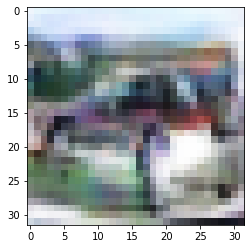

-> Epoch 334, Batch numero 1/78 -> Disc. loss on real images: 0.27775, Disc. loss on fake images: 0.25879, Generator loss: 2.61350
-> Epoch 334, Batch numero 2/78 -> Disc. loss on real images: 0.19880, Disc. loss on fake images: 0.47005, Generator loss: 3.08857
-> Epoch 334, Batch numero 3/78 -> Disc. loss on real images: 0.10457, Disc. loss on fake images: 0.19793, Generator loss: 3.34929
-> Epoch 334, Batch numero 4/78 -> Disc. loss on real images: 0.36823, Disc. loss on fake images: 0.15062, Generator loss: 2.68080
-> Epoch 334, Batch numero 5/78 -> Disc. loss on real images: 0.15881, Disc. loss on fake images: 0.42211, Generator loss: 3.18156
-> Epoch 334, Batch numero 6/78 -> Disc. loss on real images: 0.32701, Disc. loss on fake images: 0.12085, Generator loss: 2.84812
-> Epoch 334, Batch numero 7/78 -> Disc. loss on real images: 0.36922, Disc. loss on fake images: 0.31204, Generator loss: 2.88533
-> Epoch 334, Batch numero 8/78 -> Disc. loss on real images: 0.21131, Disc. loss o

-> Epoch 334, Batch numero 64/78 -> Disc. loss on real images: 0.35515, Disc. loss on fake images: 0.41419, Generator loss: 2.96623
-> Epoch 334, Batch numero 65/78 -> Disc. loss on real images: 0.34808, Disc. loss on fake images: 0.22649, Generator loss: 3.03720
-> Epoch 334, Batch numero 66/78 -> Disc. loss on real images: 0.29933, Disc. loss on fake images: 0.23282, Generator loss: 3.09596
-> Epoch 334, Batch numero 67/78 -> Disc. loss on real images: 0.21664, Disc. loss on fake images: 0.23692, Generator loss: 2.72875
-> Epoch 334, Batch numero 68/78 -> Disc. loss on real images: 0.26705, Disc. loss on fake images: 0.26788, Generator loss: 2.51231
-> Epoch 334, Batch numero 69/78 -> Disc. loss on real images: 0.27929, Disc. loss on fake images: 0.33909, Generator loss: 2.65313
-> Epoch 334, Batch numero 70/78 -> Disc. loss on real images: 0.25215, Disc. loss on fake images: 0.27073, Generator loss: 2.86479
-> Epoch 334, Batch numero 71/78 -> Disc. loss on real images: 0.22638, Disc

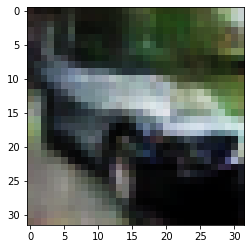

-> Epoch 335, Batch numero 1/78 -> Disc. loss on real images: 0.18846, Disc. loss on fake images: 0.24560, Generator loss: 2.85675
-> Epoch 335, Batch numero 2/78 -> Disc. loss on real images: 0.35561, Disc. loss on fake images: 0.26396, Generator loss: 2.92708
-> Epoch 335, Batch numero 3/78 -> Disc. loss on real images: 0.25251, Disc. loss on fake images: 0.15779, Generator loss: 2.77743
-> Epoch 335, Batch numero 4/78 -> Disc. loss on real images: 0.27951, Disc. loss on fake images: 0.33293, Generator loss: 2.74771
-> Epoch 335, Batch numero 5/78 -> Disc. loss on real images: 0.41505, Disc. loss on fake images: 0.36045, Generator loss: 2.37992
-> Epoch 335, Batch numero 6/78 -> Disc. loss on real images: 0.27203, Disc. loss on fake images: 0.56138, Generator loss: 3.11612
-> Epoch 335, Batch numero 7/78 -> Disc. loss on real images: 0.24912, Disc. loss on fake images: 0.13595, Generator loss: 2.99333
-> Epoch 335, Batch numero 8/78 -> Disc. loss on real images: 0.25216, Disc. loss o

-> Epoch 335, Batch numero 64/78 -> Disc. loss on real images: 0.12951, Disc. loss on fake images: 0.19313, Generator loss: 3.52387
-> Epoch 335, Batch numero 65/78 -> Disc. loss on real images: 0.30421, Disc. loss on fake images: 0.33933, Generator loss: 3.14297
-> Epoch 335, Batch numero 66/78 -> Disc. loss on real images: 0.24722, Disc. loss on fake images: 0.27060, Generator loss: 2.92580
-> Epoch 335, Batch numero 67/78 -> Disc. loss on real images: 0.16121, Disc. loss on fake images: 0.25021, Generator loss: 3.39959
-> Epoch 335, Batch numero 68/78 -> Disc. loss on real images: 0.26048, Disc. loss on fake images: 0.17625, Generator loss: 2.95616
-> Epoch 335, Batch numero 69/78 -> Disc. loss on real images: 0.26771, Disc. loss on fake images: 0.19702, Generator loss: 2.97533
-> Epoch 335, Batch numero 70/78 -> Disc. loss on real images: 0.13319, Disc. loss on fake images: 0.50740, Generator loss: 3.15118
-> Epoch 335, Batch numero 71/78 -> Disc. loss on real images: 0.42497, Disc

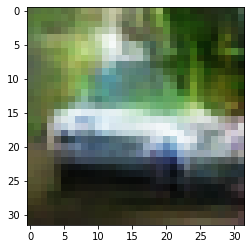

-> Epoch 336, Batch numero 1/78 -> Disc. loss on real images: 0.26945, Disc. loss on fake images: 0.38582, Generator loss: 3.01814
-> Epoch 336, Batch numero 2/78 -> Disc. loss on real images: 0.23816, Disc. loss on fake images: 0.18950, Generator loss: 2.85475
-> Epoch 336, Batch numero 3/78 -> Disc. loss on real images: 0.26171, Disc. loss on fake images: 0.12730, Generator loss: 3.06592
-> Epoch 336, Batch numero 4/78 -> Disc. loss on real images: 0.18298, Disc. loss on fake images: 0.36262, Generator loss: 2.58635
-> Epoch 336, Batch numero 5/78 -> Disc. loss on real images: 0.27706, Disc. loss on fake images: 0.48673, Generator loss: 3.04413
-> Epoch 336, Batch numero 6/78 -> Disc. loss on real images: 0.29376, Disc. loss on fake images: 0.39749, Generator loss: 3.31352
-> Epoch 336, Batch numero 7/78 -> Disc. loss on real images: 0.47192, Disc. loss on fake images: 0.17007, Generator loss: 2.74462
-> Epoch 336, Batch numero 8/78 -> Disc. loss on real images: 0.19355, Disc. loss o

-> Epoch 336, Batch numero 64/78 -> Disc. loss on real images: 0.43307, Disc. loss on fake images: 0.21740, Generator loss: 2.62359
-> Epoch 336, Batch numero 65/78 -> Disc. loss on real images: 0.23318, Disc. loss on fake images: 0.25820, Generator loss: 2.50886
-> Epoch 336, Batch numero 66/78 -> Disc. loss on real images: 0.26724, Disc. loss on fake images: 0.54039, Generator loss: 2.68310
-> Epoch 336, Batch numero 67/78 -> Disc. loss on real images: 0.21666, Disc. loss on fake images: 0.16282, Generator loss: 3.07838
-> Epoch 336, Batch numero 68/78 -> Disc. loss on real images: 0.28279, Disc. loss on fake images: 0.26888, Generator loss: 3.27189
-> Epoch 336, Batch numero 69/78 -> Disc. loss on real images: 0.45408, Disc. loss on fake images: 0.19740, Generator loss: 3.03500
-> Epoch 336, Batch numero 70/78 -> Disc. loss on real images: 0.33840, Disc. loss on fake images: 0.29106, Generator loss: 2.60104
-> Epoch 336, Batch numero 71/78 -> Disc. loss on real images: 0.16850, Disc

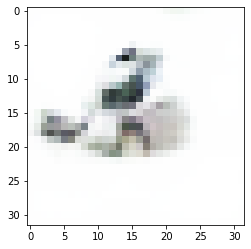

-> Epoch 337, Batch numero 1/78 -> Disc. loss on real images: 0.17069, Disc. loss on fake images: 0.14121, Generator loss: 3.14350
-> Epoch 337, Batch numero 2/78 -> Disc. loss on real images: 0.17164, Disc. loss on fake images: 0.27878, Generator loss: 3.09669
-> Epoch 337, Batch numero 3/78 -> Disc. loss on real images: 0.22349, Disc. loss on fake images: 0.18365, Generator loss: 2.75168
-> Epoch 337, Batch numero 4/78 -> Disc. loss on real images: 0.12418, Disc. loss on fake images: 0.09492, Generator loss: 2.71262
-> Epoch 337, Batch numero 5/78 -> Disc. loss on real images: 0.15728, Disc. loss on fake images: 0.30031, Generator loss: 3.31843
-> Epoch 337, Batch numero 6/78 -> Disc. loss on real images: 0.31719, Disc. loss on fake images: 0.37343, Generator loss: 2.83113
-> Epoch 337, Batch numero 7/78 -> Disc. loss on real images: 0.37314, Disc. loss on fake images: 0.29979, Generator loss: 3.09414
-> Epoch 337, Batch numero 8/78 -> Disc. loss on real images: 0.23292, Disc. loss o

-> Epoch 337, Batch numero 64/78 -> Disc. loss on real images: 0.09641, Disc. loss on fake images: 0.26264, Generator loss: 2.88929
-> Epoch 337, Batch numero 65/78 -> Disc. loss on real images: 0.20660, Disc. loss on fake images: 0.21981, Generator loss: 3.21520
-> Epoch 337, Batch numero 66/78 -> Disc. loss on real images: 0.21865, Disc. loss on fake images: 0.27382, Generator loss: 3.19384
-> Epoch 337, Batch numero 67/78 -> Disc. loss on real images: 0.65836, Disc. loss on fake images: 0.22665, Generator loss: 2.66581
-> Epoch 337, Batch numero 68/78 -> Disc. loss on real images: 0.29385, Disc. loss on fake images: 0.29683, Generator loss: 2.59391
-> Epoch 337, Batch numero 69/78 -> Disc. loss on real images: 0.10042, Disc. loss on fake images: 0.50555, Generator loss: 2.80915
-> Epoch 337, Batch numero 70/78 -> Disc. loss on real images: 0.13888, Disc. loss on fake images: 0.26619, Generator loss: 3.24119
-> Epoch 337, Batch numero 71/78 -> Disc. loss on real images: 0.31311, Disc

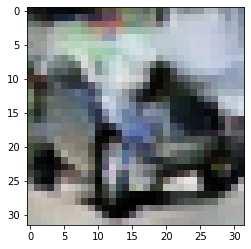

-> Epoch 338, Batch numero 1/78 -> Disc. loss on real images: 0.35291, Disc. loss on fake images: 0.14132, Generator loss: 3.25518
-> Epoch 338, Batch numero 2/78 -> Disc. loss on real images: 0.20824, Disc. loss on fake images: 0.16749, Generator loss: 2.90545
-> Epoch 338, Batch numero 3/78 -> Disc. loss on real images: 0.13194, Disc. loss on fake images: 0.21286, Generator loss: 2.98616
-> Epoch 338, Batch numero 4/78 -> Disc. loss on real images: 0.13114, Disc. loss on fake images: 0.35122, Generator loss: 3.04948
-> Epoch 338, Batch numero 5/78 -> Disc. loss on real images: 0.25737, Disc. loss on fake images: 0.25783, Generator loss: 2.76156
-> Epoch 338, Batch numero 6/78 -> Disc. loss on real images: 0.19405, Disc. loss on fake images: 0.19434, Generator loss: 3.38988
-> Epoch 338, Batch numero 7/78 -> Disc. loss on real images: 0.30730, Disc. loss on fake images: 0.22390, Generator loss: 2.75050
-> Epoch 338, Batch numero 8/78 -> Disc. loss on real images: 0.27304, Disc. loss o

-> Epoch 338, Batch numero 65/78 -> Disc. loss on real images: 0.39049, Disc. loss on fake images: 0.39472, Generator loss: 3.20755
-> Epoch 338, Batch numero 66/78 -> Disc. loss on real images: 0.19790, Disc. loss on fake images: 0.20225, Generator loss: 2.99925
-> Epoch 338, Batch numero 67/78 -> Disc. loss on real images: 0.20162, Disc. loss on fake images: 0.36668, Generator loss: 2.90001
-> Epoch 338, Batch numero 68/78 -> Disc. loss on real images: 0.36351, Disc. loss on fake images: 0.46340, Generator loss: 3.06001
-> Epoch 338, Batch numero 69/78 -> Disc. loss on real images: 0.37204, Disc. loss on fake images: 0.24046, Generator loss: 2.81285
-> Epoch 338, Batch numero 70/78 -> Disc. loss on real images: 0.14651, Disc. loss on fake images: 0.20119, Generator loss: 3.27007
-> Epoch 338, Batch numero 71/78 -> Disc. loss on real images: 0.20529, Disc. loss on fake images: 0.18768, Generator loss: 3.09712
-> Epoch 338, Batch numero 72/78 -> Disc. loss on real images: 0.20211, Disc

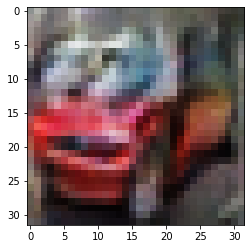

-> Epoch 339, Batch numero 1/78 -> Disc. loss on real images: 0.20326, Disc. loss on fake images: 0.38416, Generator loss: 3.12219
-> Epoch 339, Batch numero 2/78 -> Disc. loss on real images: 0.23748, Disc. loss on fake images: 0.56697, Generator loss: 3.03091
-> Epoch 339, Batch numero 3/78 -> Disc. loss on real images: 0.28341, Disc. loss on fake images: 0.20226, Generator loss: 3.41416
-> Epoch 339, Batch numero 4/78 -> Disc. loss on real images: 0.40750, Disc. loss on fake images: 0.21168, Generator loss: 2.69787
-> Epoch 339, Batch numero 5/78 -> Disc. loss on real images: 0.24337, Disc. loss on fake images: 0.39928, Generator loss: 2.99130
-> Epoch 339, Batch numero 6/78 -> Disc. loss on real images: 0.15671, Disc. loss on fake images: 0.13783, Generator loss: 3.23675
-> Epoch 339, Batch numero 7/78 -> Disc. loss on real images: 0.28142, Disc. loss on fake images: 0.21913, Generator loss: 2.61801
-> Epoch 339, Batch numero 8/78 -> Disc. loss on real images: 0.16795, Disc. loss o

-> Epoch 339, Batch numero 64/78 -> Disc. loss on real images: 0.15160, Disc. loss on fake images: 0.25688, Generator loss: 3.02626
-> Epoch 339, Batch numero 65/78 -> Disc. loss on real images: 0.22530, Disc. loss on fake images: 0.37729, Generator loss: 3.39471
-> Epoch 339, Batch numero 66/78 -> Disc. loss on real images: 0.31764, Disc. loss on fake images: 0.07094, Generator loss: 3.10604
-> Epoch 339, Batch numero 67/78 -> Disc. loss on real images: 0.15417, Disc. loss on fake images: 0.36754, Generator loss: 3.33276
-> Epoch 339, Batch numero 68/78 -> Disc. loss on real images: 0.28897, Disc. loss on fake images: 0.30475, Generator loss: 2.81626
-> Epoch 339, Batch numero 69/78 -> Disc. loss on real images: 0.29205, Disc. loss on fake images: 0.21467, Generator loss: 2.86002
-> Epoch 339, Batch numero 70/78 -> Disc. loss on real images: 0.24072, Disc. loss on fake images: 0.42491, Generator loss: 3.40677
-> Epoch 339, Batch numero 71/78 -> Disc. loss on real images: 0.42921, Disc

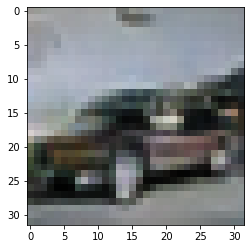

-> Epoch 340, Batch numero 1/78 -> Disc. loss on real images: 0.16568, Disc. loss on fake images: 0.13180, Generator loss: 2.79086
-> Epoch 340, Batch numero 2/78 -> Disc. loss on real images: 0.20578, Disc. loss on fake images: 0.26645, Generator loss: 3.00875
-> Epoch 340, Batch numero 3/78 -> Disc. loss on real images: 0.31800, Disc. loss on fake images: 0.25916, Generator loss: 2.88462
-> Epoch 340, Batch numero 4/78 -> Disc. loss on real images: 0.19875, Disc. loss on fake images: 0.30082, Generator loss: 2.75715
-> Epoch 340, Batch numero 5/78 -> Disc. loss on real images: 0.27215, Disc. loss on fake images: 0.21378, Generator loss: 2.65125
-> Epoch 340, Batch numero 6/78 -> Disc. loss on real images: 0.35937, Disc. loss on fake images: 0.34468, Generator loss: 2.99047
-> Epoch 340, Batch numero 7/78 -> Disc. loss on real images: 0.26080, Disc. loss on fake images: 0.33419, Generator loss: 3.08854
-> Epoch 340, Batch numero 8/78 -> Disc. loss on real images: 0.20546, Disc. loss o

-> Epoch 340, Batch numero 64/78 -> Disc. loss on real images: 0.28220, Disc. loss on fake images: 0.24992, Generator loss: 3.28278
-> Epoch 340, Batch numero 65/78 -> Disc. loss on real images: 0.27586, Disc. loss on fake images: 0.19581, Generator loss: 3.10635
-> Epoch 340, Batch numero 66/78 -> Disc. loss on real images: 0.23614, Disc. loss on fake images: 0.38730, Generator loss: 3.43862
-> Epoch 340, Batch numero 67/78 -> Disc. loss on real images: 0.31821, Disc. loss on fake images: 0.17725, Generator loss: 2.68520
-> Epoch 340, Batch numero 68/78 -> Disc. loss on real images: 0.38671, Disc. loss on fake images: 0.49124, Generator loss: 2.87652
-> Epoch 340, Batch numero 69/78 -> Disc. loss on real images: 0.23061, Disc. loss on fake images: 0.48908, Generator loss: 3.09853
-> Epoch 340, Batch numero 70/78 -> Disc. loss on real images: 0.18145, Disc. loss on fake images: 0.12571, Generator loss: 2.91406
-> Epoch 340, Batch numero 71/78 -> Disc. loss on real images: 0.25085, Disc

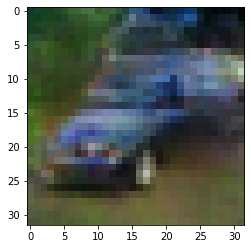

-> Epoch 341, Batch numero 1/78 -> Disc. loss on real images: 0.23772, Disc. loss on fake images: 0.26395, Generator loss: 2.64871
-> Epoch 341, Batch numero 2/78 -> Disc. loss on real images: 0.17198, Disc. loss on fake images: 0.21943, Generator loss: 3.32753
-> Epoch 341, Batch numero 3/78 -> Disc. loss on real images: 0.23729, Disc. loss on fake images: 0.30807, Generator loss: 3.24638
-> Epoch 341, Batch numero 4/78 -> Disc. loss on real images: 0.20281, Disc. loss on fake images: 0.21594, Generator loss: 3.01738
-> Epoch 341, Batch numero 5/78 -> Disc. loss on real images: 0.18629, Disc. loss on fake images: 0.16805, Generator loss: 3.04284
-> Epoch 341, Batch numero 6/78 -> Disc. loss on real images: 0.33570, Disc. loss on fake images: 0.24355, Generator loss: 2.96960
-> Epoch 341, Batch numero 7/78 -> Disc. loss on real images: 0.20908, Disc. loss on fake images: 0.37013, Generator loss: 3.38994
-> Epoch 341, Batch numero 8/78 -> Disc. loss on real images: 0.36426, Disc. loss o

-> Epoch 341, Batch numero 64/78 -> Disc. loss on real images: 0.22760, Disc. loss on fake images: 0.09313, Generator loss: 3.06275
-> Epoch 341, Batch numero 65/78 -> Disc. loss on real images: 0.37866, Disc. loss on fake images: 0.32223, Generator loss: 3.03668
-> Epoch 341, Batch numero 66/78 -> Disc. loss on real images: 0.13941, Disc. loss on fake images: 0.13164, Generator loss: 2.59762
-> Epoch 341, Batch numero 67/78 -> Disc. loss on real images: 0.20665, Disc. loss on fake images: 0.24448, Generator loss: 3.23847
-> Epoch 341, Batch numero 68/78 -> Disc. loss on real images: 0.20377, Disc. loss on fake images: 0.23061, Generator loss: 3.12138
-> Epoch 341, Batch numero 69/78 -> Disc. loss on real images: 0.26695, Disc. loss on fake images: 0.44637, Generator loss: 3.10276
-> Epoch 341, Batch numero 70/78 -> Disc. loss on real images: 0.34195, Disc. loss on fake images: 0.48621, Generator loss: 3.53694
-> Epoch 341, Batch numero 71/78 -> Disc. loss on real images: 0.33406, Disc

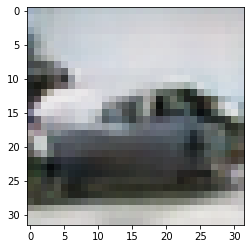

-> Epoch 342, Batch numero 1/78 -> Disc. loss on real images: 0.29933, Disc. loss on fake images: 0.38095, Generator loss: 2.60490
-> Epoch 342, Batch numero 2/78 -> Disc. loss on real images: 0.16327, Disc. loss on fake images: 0.26951, Generator loss: 3.31322
-> Epoch 342, Batch numero 3/78 -> Disc. loss on real images: 0.31064, Disc. loss on fake images: 0.19263, Generator loss: 3.15748
-> Epoch 342, Batch numero 4/78 -> Disc. loss on real images: 0.33481, Disc. loss on fake images: 0.44088, Generator loss: 3.71420
-> Epoch 342, Batch numero 5/78 -> Disc. loss on real images: 0.24275, Disc. loss on fake images: 0.21229, Generator loss: 3.47318
-> Epoch 342, Batch numero 6/78 -> Disc. loss on real images: 0.32842, Disc. loss on fake images: 0.16773, Generator loss: 2.93268
-> Epoch 342, Batch numero 7/78 -> Disc. loss on real images: 0.20128, Disc. loss on fake images: 0.21970, Generator loss: 2.64049
-> Epoch 342, Batch numero 8/78 -> Disc. loss on real images: 0.18624, Disc. loss o

-> Epoch 342, Batch numero 64/78 -> Disc. loss on real images: 0.39873, Disc. loss on fake images: 0.28810, Generator loss: 2.69225
-> Epoch 342, Batch numero 65/78 -> Disc. loss on real images: 0.25527, Disc. loss on fake images: 0.31396, Generator loss: 2.82808
-> Epoch 342, Batch numero 66/78 -> Disc. loss on real images: 0.21978, Disc. loss on fake images: 0.29551, Generator loss: 3.30337
-> Epoch 342, Batch numero 67/78 -> Disc. loss on real images: 0.29977, Disc. loss on fake images: 0.27136, Generator loss: 2.66790
-> Epoch 342, Batch numero 68/78 -> Disc. loss on real images: 0.26489, Disc. loss on fake images: 0.17387, Generator loss: 2.61994
-> Epoch 342, Batch numero 69/78 -> Disc. loss on real images: 0.17794, Disc. loss on fake images: 0.69820, Generator loss: 3.07193
-> Epoch 342, Batch numero 70/78 -> Disc. loss on real images: 0.29840, Disc. loss on fake images: 0.09731, Generator loss: 3.35936
-> Epoch 342, Batch numero 71/78 -> Disc. loss on real images: 0.14779, Disc

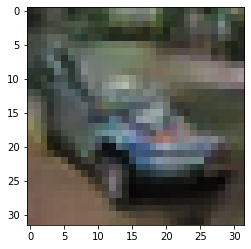

-> Epoch 343, Batch numero 1/78 -> Disc. loss on real images: 0.17129, Disc. loss on fake images: 0.23740, Generator loss: 2.87950
-> Epoch 343, Batch numero 2/78 -> Disc. loss on real images: 0.21383, Disc. loss on fake images: 0.28390, Generator loss: 3.03330
-> Epoch 343, Batch numero 3/78 -> Disc. loss on real images: 0.46278, Disc. loss on fake images: 0.37095, Generator loss: 3.02677
-> Epoch 343, Batch numero 4/78 -> Disc. loss on real images: 0.23435, Disc. loss on fake images: 0.17501, Generator loss: 2.91612
-> Epoch 343, Batch numero 5/78 -> Disc. loss on real images: 0.37831, Disc. loss on fake images: 0.16063, Generator loss: 2.82018
-> Epoch 343, Batch numero 6/78 -> Disc. loss on real images: 0.09097, Disc. loss on fake images: 0.26125, Generator loss: 2.44566
-> Epoch 343, Batch numero 7/78 -> Disc. loss on real images: 0.17486, Disc. loss on fake images: 0.29094, Generator loss: 2.75736
-> Epoch 343, Batch numero 8/78 -> Disc. loss on real images: 0.28365, Disc. loss o

-> Epoch 343, Batch numero 64/78 -> Disc. loss on real images: 0.25107, Disc. loss on fake images: 0.18044, Generator loss: 2.93423
-> Epoch 343, Batch numero 65/78 -> Disc. loss on real images: 0.23065, Disc. loss on fake images: 0.24545, Generator loss: 2.63244
-> Epoch 343, Batch numero 66/78 -> Disc. loss on real images: 0.29657, Disc. loss on fake images: 0.46243, Generator loss: 3.05573
-> Epoch 343, Batch numero 67/78 -> Disc. loss on real images: 0.32318, Disc. loss on fake images: 0.16093, Generator loss: 3.23802
-> Epoch 343, Batch numero 68/78 -> Disc. loss on real images: 0.21426, Disc. loss on fake images: 0.29731, Generator loss: 3.28028
-> Epoch 343, Batch numero 69/78 -> Disc. loss on real images: 0.36506, Disc. loss on fake images: 0.21995, Generator loss: 3.36131
-> Epoch 343, Batch numero 70/78 -> Disc. loss on real images: 0.19972, Disc. loss on fake images: 0.25167, Generator loss: 3.04424
-> Epoch 343, Batch numero 71/78 -> Disc. loss on real images: 0.30528, Disc

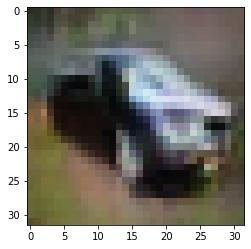

-> Epoch 344, Batch numero 1/78 -> Disc. loss on real images: 0.49109, Disc. loss on fake images: 0.13400, Generator loss: 3.10207
-> Epoch 344, Batch numero 2/78 -> Disc. loss on real images: 0.17686, Disc. loss on fake images: 0.18184, Generator loss: 2.98539
-> Epoch 344, Batch numero 3/78 -> Disc. loss on real images: 0.22752, Disc. loss on fake images: 0.17367, Generator loss: 2.55497
-> Epoch 344, Batch numero 4/78 -> Disc. loss on real images: 0.14631, Disc. loss on fake images: 0.23185, Generator loss: 3.05240
-> Epoch 344, Batch numero 5/78 -> Disc. loss on real images: 0.39332, Disc. loss on fake images: 0.38765, Generator loss: 3.06432
-> Epoch 344, Batch numero 6/78 -> Disc. loss on real images: 0.33531, Disc. loss on fake images: 0.22222, Generator loss: 3.08400
-> Epoch 344, Batch numero 7/78 -> Disc. loss on real images: 0.26590, Disc. loss on fake images: 0.25688, Generator loss: 3.02663
-> Epoch 344, Batch numero 8/78 -> Disc. loss on real images: 0.28598, Disc. loss o

-> Epoch 344, Batch numero 64/78 -> Disc. loss on real images: 0.38389, Disc. loss on fake images: 0.25499, Generator loss: 2.55554
-> Epoch 344, Batch numero 65/78 -> Disc. loss on real images: 0.27866, Disc. loss on fake images: 0.20982, Generator loss: 2.55120
-> Epoch 344, Batch numero 66/78 -> Disc. loss on real images: 0.07980, Disc. loss on fake images: 0.33866, Generator loss: 3.15618
-> Epoch 344, Batch numero 67/78 -> Disc. loss on real images: 0.15961, Disc. loss on fake images: 0.20507, Generator loss: 3.18745
-> Epoch 344, Batch numero 68/78 -> Disc. loss on real images: 0.25111, Disc. loss on fake images: 0.10900, Generator loss: 2.80972
-> Epoch 344, Batch numero 69/78 -> Disc. loss on real images: 0.25951, Disc. loss on fake images: 0.28633, Generator loss: 2.64700
-> Epoch 344, Batch numero 70/78 -> Disc. loss on real images: 0.21000, Disc. loss on fake images: 0.19607, Generator loss: 2.67957
-> Epoch 344, Batch numero 71/78 -> Disc. loss on real images: 0.19736, Disc

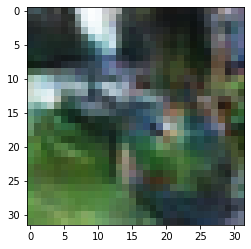

-> Epoch 345, Batch numero 1/78 -> Disc. loss on real images: 0.21009, Disc. loss on fake images: 0.22018, Generator loss: 2.83693
-> Epoch 345, Batch numero 2/78 -> Disc. loss on real images: 0.19920, Disc. loss on fake images: 0.24329, Generator loss: 3.03771
-> Epoch 345, Batch numero 3/78 -> Disc. loss on real images: 0.29618, Disc. loss on fake images: 0.26938, Generator loss: 3.23002
-> Epoch 345, Batch numero 4/78 -> Disc. loss on real images: 0.15005, Disc. loss on fake images: 0.18055, Generator loss: 2.95658
-> Epoch 345, Batch numero 5/78 -> Disc. loss on real images: 0.16669, Disc. loss on fake images: 0.22729, Generator loss: 2.87616
-> Epoch 345, Batch numero 6/78 -> Disc. loss on real images: 0.20986, Disc. loss on fake images: 0.12037, Generator loss: 3.42026
-> Epoch 345, Batch numero 7/78 -> Disc. loss on real images: 0.39259, Disc. loss on fake images: 0.36187, Generator loss: 2.90207
-> Epoch 345, Batch numero 8/78 -> Disc. loss on real images: 0.41098, Disc. loss o

-> Epoch 345, Batch numero 66/78 -> Disc. loss on real images: 0.22518, Disc. loss on fake images: 0.28389, Generator loss: 3.27645
-> Epoch 345, Batch numero 67/78 -> Disc. loss on real images: 0.15313, Disc. loss on fake images: 0.10880, Generator loss: 3.19161
-> Epoch 345, Batch numero 68/78 -> Disc. loss on real images: 0.23658, Disc. loss on fake images: 0.33505, Generator loss: 2.67854
-> Epoch 345, Batch numero 69/78 -> Disc. loss on real images: 0.21417, Disc. loss on fake images: 0.22326, Generator loss: 3.03080
-> Epoch 345, Batch numero 70/78 -> Disc. loss on real images: 0.22574, Disc. loss on fake images: 0.18581, Generator loss: 3.04525
-> Epoch 345, Batch numero 71/78 -> Disc. loss on real images: 0.25718, Disc. loss on fake images: 0.47214, Generator loss: 3.78669
-> Epoch 345, Batch numero 72/78 -> Disc. loss on real images: 0.23285, Disc. loss on fake images: 0.16164, Generator loss: 3.23049
-> Epoch 345, Batch numero 73/78 -> Disc. loss on real images: 0.23974, Disc

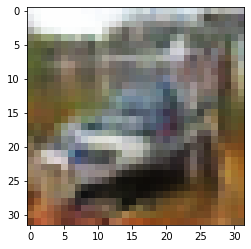

-> Epoch 346, Batch numero 1/78 -> Disc. loss on real images: 0.29421, Disc. loss on fake images: 0.33294, Generator loss: 3.48988
-> Epoch 346, Batch numero 2/78 -> Disc. loss on real images: 0.33012, Disc. loss on fake images: 0.20498, Generator loss: 3.10521
-> Epoch 346, Batch numero 3/78 -> Disc. loss on real images: 0.23723, Disc. loss on fake images: 0.39837, Generator loss: 2.90113
-> Epoch 346, Batch numero 4/78 -> Disc. loss on real images: 0.22786, Disc. loss on fake images: 0.23311, Generator loss: 3.07940
-> Epoch 346, Batch numero 5/78 -> Disc. loss on real images: 0.17212, Disc. loss on fake images: 0.18834, Generator loss: 2.67214
-> Epoch 346, Batch numero 6/78 -> Disc. loss on real images: 0.18054, Disc. loss on fake images: 0.27110, Generator loss: 3.40250
-> Epoch 346, Batch numero 7/78 -> Disc. loss on real images: 0.31367, Disc. loss on fake images: 0.37996, Generator loss: 3.06321
-> Epoch 346, Batch numero 8/78 -> Disc. loss on real images: 0.10076, Disc. loss o

-> Epoch 346, Batch numero 64/78 -> Disc. loss on real images: 0.13468, Disc. loss on fake images: 0.47758, Generator loss: 2.93872
-> Epoch 346, Batch numero 65/78 -> Disc. loss on real images: 0.27583, Disc. loss on fake images: 0.17525, Generator loss: 2.91818
-> Epoch 346, Batch numero 66/78 -> Disc. loss on real images: 0.29112, Disc. loss on fake images: 0.12778, Generator loss: 3.21663
-> Epoch 346, Batch numero 67/78 -> Disc. loss on real images: 0.24311, Disc. loss on fake images: 0.15830, Generator loss: 3.13140
-> Epoch 346, Batch numero 68/78 -> Disc. loss on real images: 0.22712, Disc. loss on fake images: 0.49980, Generator loss: 3.15587
-> Epoch 346, Batch numero 69/78 -> Disc. loss on real images: 0.47542, Disc. loss on fake images: 0.35522, Generator loss: 2.89514
-> Epoch 346, Batch numero 70/78 -> Disc. loss on real images: 0.15418, Disc. loss on fake images: 0.18388, Generator loss: 2.98214
-> Epoch 346, Batch numero 71/78 -> Disc. loss on real images: 0.30342, Disc

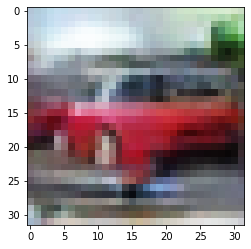

-> Epoch 347, Batch numero 1/78 -> Disc. loss on real images: 0.22003, Disc. loss on fake images: 0.39358, Generator loss: 2.70305
-> Epoch 347, Batch numero 2/78 -> Disc. loss on real images: 0.20322, Disc. loss on fake images: 0.11756, Generator loss: 3.38653
-> Epoch 347, Batch numero 3/78 -> Disc. loss on real images: 0.15727, Disc. loss on fake images: 0.21767, Generator loss: 3.09532
-> Epoch 347, Batch numero 4/78 -> Disc. loss on real images: 0.15784, Disc. loss on fake images: 0.20709, Generator loss: 3.19765
-> Epoch 347, Batch numero 5/78 -> Disc. loss on real images: 0.31058, Disc. loss on fake images: 0.17885, Generator loss: 3.39577
-> Epoch 347, Batch numero 6/78 -> Disc. loss on real images: 0.31514, Disc. loss on fake images: 0.31399, Generator loss: 2.80720
-> Epoch 347, Batch numero 7/78 -> Disc. loss on real images: 0.17748, Disc. loss on fake images: 0.13737, Generator loss: 3.20658
-> Epoch 347, Batch numero 8/78 -> Disc. loss on real images: 0.21159, Disc. loss o

-> Epoch 347, Batch numero 65/78 -> Disc. loss on real images: 0.18720, Disc. loss on fake images: 0.27126, Generator loss: 3.14396
-> Epoch 347, Batch numero 66/78 -> Disc. loss on real images: 0.31119, Disc. loss on fake images: 0.07174, Generator loss: 3.09955
-> Epoch 347, Batch numero 67/78 -> Disc. loss on real images: 0.22802, Disc. loss on fake images: 0.53286, Generator loss: 2.45064
-> Epoch 347, Batch numero 68/78 -> Disc. loss on real images: 0.12406, Disc. loss on fake images: 0.20582, Generator loss: 2.75669
-> Epoch 347, Batch numero 69/78 -> Disc. loss on real images: 0.18267, Disc. loss on fake images: 0.36674, Generator loss: 2.99903
-> Epoch 347, Batch numero 70/78 -> Disc. loss on real images: 0.30304, Disc. loss on fake images: 0.16390, Generator loss: 3.04636
-> Epoch 347, Batch numero 71/78 -> Disc. loss on real images: 0.19993, Disc. loss on fake images: 0.34739, Generator loss: 3.50627
-> Epoch 347, Batch numero 72/78 -> Disc. loss on real images: 0.41446, Disc

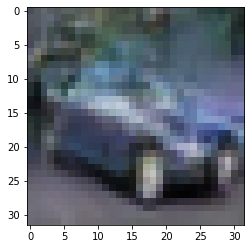

-> Epoch 348, Batch numero 1/78 -> Disc. loss on real images: 0.21996, Disc. loss on fake images: 0.23998, Generator loss: 3.43956
-> Epoch 348, Batch numero 2/78 -> Disc. loss on real images: 0.42125, Disc. loss on fake images: 0.20917, Generator loss: 2.70594
-> Epoch 348, Batch numero 3/78 -> Disc. loss on real images: 0.34188, Disc. loss on fake images: 0.29079, Generator loss: 2.78535
-> Epoch 348, Batch numero 4/78 -> Disc. loss on real images: 0.10913, Disc. loss on fake images: 0.48718, Generator loss: 2.48717
-> Epoch 348, Batch numero 5/78 -> Disc. loss on real images: 0.15191, Disc. loss on fake images: 0.03243, Generator loss: 2.57639
-> Epoch 348, Batch numero 6/78 -> Disc. loss on real images: 0.28648, Disc. loss on fake images: 0.26952, Generator loss: 2.61426
-> Epoch 348, Batch numero 7/78 -> Disc. loss on real images: 0.17668, Disc. loss on fake images: 0.42897, Generator loss: 3.22686
-> Epoch 348, Batch numero 8/78 -> Disc. loss on real images: 0.38615, Disc. loss o

-> Epoch 348, Batch numero 66/78 -> Disc. loss on real images: 0.22834, Disc. loss on fake images: 0.28286, Generator loss: 2.97696
-> Epoch 348, Batch numero 67/78 -> Disc. loss on real images: 0.32036, Disc. loss on fake images: 0.28672, Generator loss: 3.03624
-> Epoch 348, Batch numero 68/78 -> Disc. loss on real images: 0.14673, Disc. loss on fake images: 0.13794, Generator loss: 3.09785
-> Epoch 348, Batch numero 69/78 -> Disc. loss on real images: 0.28354, Disc. loss on fake images: 0.46010, Generator loss: 2.93150
-> Epoch 348, Batch numero 70/78 -> Disc. loss on real images: 0.16270, Disc. loss on fake images: 0.36653, Generator loss: 3.06814
-> Epoch 348, Batch numero 71/78 -> Disc. loss on real images: 0.28709, Disc. loss on fake images: 0.15750, Generator loss: 3.29154
-> Epoch 348, Batch numero 72/78 -> Disc. loss on real images: 0.16880, Disc. loss on fake images: 0.21960, Generator loss: 3.11571
-> Epoch 348, Batch numero 73/78 -> Disc. loss on real images: 0.16358, Disc

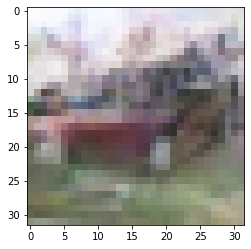

-> Epoch 349, Batch numero 1/78 -> Disc. loss on real images: 0.59604, Disc. loss on fake images: 0.35534, Generator loss: 2.87408
-> Epoch 349, Batch numero 2/78 -> Disc. loss on real images: 0.17158, Disc. loss on fake images: 0.30215, Generator loss: 2.97868
-> Epoch 349, Batch numero 3/78 -> Disc. loss on real images: 0.18163, Disc. loss on fake images: 0.30868, Generator loss: 3.36958
-> Epoch 349, Batch numero 4/78 -> Disc. loss on real images: 0.20064, Disc. loss on fake images: 0.10431, Generator loss: 2.71619
-> Epoch 349, Batch numero 5/78 -> Disc. loss on real images: 0.31352, Disc. loss on fake images: 0.34181, Generator loss: 2.57052
-> Epoch 349, Batch numero 6/78 -> Disc. loss on real images: 0.14113, Disc. loss on fake images: 0.51109, Generator loss: 3.44386
-> Epoch 349, Batch numero 7/78 -> Disc. loss on real images: 0.30676, Disc. loss on fake images: 0.15910, Generator loss: 3.53214
-> Epoch 349, Batch numero 8/78 -> Disc. loss on real images: 0.23948, Disc. loss o

-> Epoch 349, Batch numero 64/78 -> Disc. loss on real images: 0.18694, Disc. loss on fake images: 0.15133, Generator loss: 2.84503
-> Epoch 349, Batch numero 65/78 -> Disc. loss on real images: 0.21968, Disc. loss on fake images: 0.46732, Generator loss: 2.88828
-> Epoch 349, Batch numero 66/78 -> Disc. loss on real images: 0.18469, Disc. loss on fake images: 0.25012, Generator loss: 3.15981
-> Epoch 349, Batch numero 67/78 -> Disc. loss on real images: 0.31781, Disc. loss on fake images: 0.23311, Generator loss: 2.64863
-> Epoch 349, Batch numero 68/78 -> Disc. loss on real images: 0.21747, Disc. loss on fake images: 0.16061, Generator loss: 2.90046
-> Epoch 349, Batch numero 69/78 -> Disc. loss on real images: 0.25635, Disc. loss on fake images: 0.21561, Generator loss: 3.22852
-> Epoch 349, Batch numero 70/78 -> Disc. loss on real images: 0.21686, Disc. loss on fake images: 0.25562, Generator loss: 3.01773
-> Epoch 349, Batch numero 71/78 -> Disc. loss on real images: 0.15696, Disc

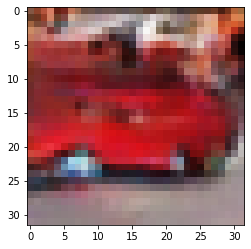

-> Epoch 350, Batch numero 1/78 -> Disc. loss on real images: 0.17190, Disc. loss on fake images: 0.35173, Generator loss: 3.45411
-> Epoch 350, Batch numero 2/78 -> Disc. loss on real images: 0.27315, Disc. loss on fake images: 0.27185, Generator loss: 3.19782
-> Epoch 350, Batch numero 3/78 -> Disc. loss on real images: 0.33040, Disc. loss on fake images: 0.40873, Generator loss: 3.56904
-> Epoch 350, Batch numero 4/78 -> Disc. loss on real images: 0.17408, Disc. loss on fake images: 0.19124, Generator loss: 3.76467
-> Epoch 350, Batch numero 5/78 -> Disc. loss on real images: 0.31261, Disc. loss on fake images: 0.37390, Generator loss: 3.37867
-> Epoch 350, Batch numero 6/78 -> Disc. loss on real images: 0.33908, Disc. loss on fake images: 0.21926, Generator loss: 2.98061
-> Epoch 350, Batch numero 7/78 -> Disc. loss on real images: 0.20813, Disc. loss on fake images: 0.41352, Generator loss: 2.93999
-> Epoch 350, Batch numero 8/78 -> Disc. loss on real images: 0.22047, Disc. loss o

-> Epoch 350, Batch numero 64/78 -> Disc. loss on real images: 0.21171, Disc. loss on fake images: 0.18175, Generator loss: 3.28290
-> Epoch 350, Batch numero 65/78 -> Disc. loss on real images: 0.43876, Disc. loss on fake images: 0.13988, Generator loss: 2.70234
-> Epoch 350, Batch numero 66/78 -> Disc. loss on real images: 0.22184, Disc. loss on fake images: 0.32738, Generator loss: 2.53186
-> Epoch 350, Batch numero 67/78 -> Disc. loss on real images: 0.10009, Disc. loss on fake images: 0.25712, Generator loss: 3.02513
-> Epoch 350, Batch numero 68/78 -> Disc. loss on real images: 0.16960, Disc. loss on fake images: 0.23278, Generator loss: 3.11468
-> Epoch 350, Batch numero 69/78 -> Disc. loss on real images: 0.57118, Disc. loss on fake images: 0.16967, Generator loss: 2.35394
-> Epoch 350, Batch numero 70/78 -> Disc. loss on real images: 0.16628, Disc. loss on fake images: 0.43746, Generator loss: 2.40798
-> Epoch 350, Batch numero 71/78 -> Disc. loss on real images: 0.20157, Disc

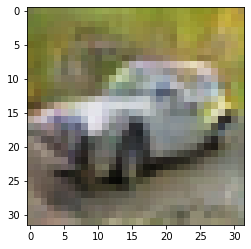

-> Epoch 351, Batch numero 1/78 -> Disc. loss on real images: 0.14367, Disc. loss on fake images: 0.29664, Generator loss: 2.73020
-> Epoch 351, Batch numero 2/78 -> Disc. loss on real images: 0.25444, Disc. loss on fake images: 0.29791, Generator loss: 2.87744
-> Epoch 351, Batch numero 3/78 -> Disc. loss on real images: 0.22628, Disc. loss on fake images: 0.11808, Generator loss: 3.24271
-> Epoch 351, Batch numero 4/78 -> Disc. loss on real images: 0.26053, Disc. loss on fake images: 0.35002, Generator loss: 2.54756
-> Epoch 351, Batch numero 5/78 -> Disc. loss on real images: 0.21305, Disc. loss on fake images: 0.25476, Generator loss: 3.29421
-> Epoch 351, Batch numero 6/78 -> Disc. loss on real images: 0.19749, Disc. loss on fake images: 0.26051, Generator loss: 3.32135
-> Epoch 351, Batch numero 7/78 -> Disc. loss on real images: 0.36687, Disc. loss on fake images: 0.27190, Generator loss: 2.94449
-> Epoch 351, Batch numero 8/78 -> Disc. loss on real images: 0.16872, Disc. loss o

-> Epoch 351, Batch numero 64/78 -> Disc. loss on real images: 0.13380, Disc. loss on fake images: 0.11459, Generator loss: 3.29146
-> Epoch 351, Batch numero 65/78 -> Disc. loss on real images: 0.25407, Disc. loss on fake images: 0.46460, Generator loss: 2.75534
-> Epoch 351, Batch numero 66/78 -> Disc. loss on real images: 0.39096, Disc. loss on fake images: 0.28750, Generator loss: 2.97568
-> Epoch 351, Batch numero 67/78 -> Disc. loss on real images: 0.25380, Disc. loss on fake images: 0.33127, Generator loss: 3.21066
-> Epoch 351, Batch numero 68/78 -> Disc. loss on real images: 0.16801, Disc. loss on fake images: 0.20140, Generator loss: 3.11552
-> Epoch 351, Batch numero 69/78 -> Disc. loss on real images: 0.22102, Disc. loss on fake images: 0.14143, Generator loss: 3.15280
-> Epoch 351, Batch numero 70/78 -> Disc. loss on real images: 0.19757, Disc. loss on fake images: 0.49002, Generator loss: 3.30068
-> Epoch 351, Batch numero 71/78 -> Disc. loss on real images: 0.24042, Disc

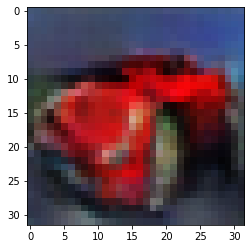

-> Epoch 352, Batch numero 1/78 -> Disc. loss on real images: 0.18723, Disc. loss on fake images: 0.35638, Generator loss: 3.16373
-> Epoch 352, Batch numero 2/78 -> Disc. loss on real images: 0.17366, Disc. loss on fake images: 0.10813, Generator loss: 2.90559
-> Epoch 352, Batch numero 3/78 -> Disc. loss on real images: 0.34780, Disc. loss on fake images: 0.53465, Generator loss: 2.96254
-> Epoch 352, Batch numero 4/78 -> Disc. loss on real images: 0.24075, Disc. loss on fake images: 0.16162, Generator loss: 3.71363
-> Epoch 352, Batch numero 5/78 -> Disc. loss on real images: 0.24781, Disc. loss on fake images: 0.20115, Generator loss: 3.14795
-> Epoch 352, Batch numero 6/78 -> Disc. loss on real images: 0.55094, Disc. loss on fake images: 0.35841, Generator loss: 2.56701
-> Epoch 352, Batch numero 7/78 -> Disc. loss on real images: 0.07435, Disc. loss on fake images: 0.50506, Generator loss: 3.01143
-> Epoch 352, Batch numero 8/78 -> Disc. loss on real images: 0.28208, Disc. loss o

-> Epoch 352, Batch numero 64/78 -> Disc. loss on real images: 0.13802, Disc. loss on fake images: 0.36921, Generator loss: 3.35819
-> Epoch 352, Batch numero 65/78 -> Disc. loss on real images: 0.45558, Disc. loss on fake images: 0.20930, Generator loss: 2.98026
-> Epoch 352, Batch numero 66/78 -> Disc. loss on real images: 0.14071, Disc. loss on fake images: 0.15934, Generator loss: 2.91419
-> Epoch 352, Batch numero 67/78 -> Disc. loss on real images: 0.20424, Disc. loss on fake images: 0.26337, Generator loss: 3.13429
-> Epoch 352, Batch numero 68/78 -> Disc. loss on real images: 0.17392, Disc. loss on fake images: 0.30261, Generator loss: 3.23640
-> Epoch 352, Batch numero 69/78 -> Disc. loss on real images: 0.27097, Disc. loss on fake images: 0.17584, Generator loss: 2.89306
-> Epoch 352, Batch numero 70/78 -> Disc. loss on real images: 0.19298, Disc. loss on fake images: 0.12760, Generator loss: 3.09610
-> Epoch 352, Batch numero 71/78 -> Disc. loss on real images: 0.11597, Disc

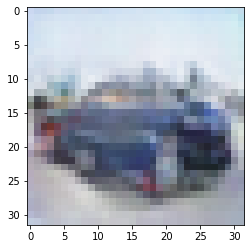

-> Epoch 353, Batch numero 1/78 -> Disc. loss on real images: 0.16793, Disc. loss on fake images: 0.53618, Generator loss: 3.40599
-> Epoch 353, Batch numero 2/78 -> Disc. loss on real images: 0.23203, Disc. loss on fake images: 0.21891, Generator loss: 2.87461
-> Epoch 353, Batch numero 3/78 -> Disc. loss on real images: 0.26090, Disc. loss on fake images: 0.62046, Generator loss: 3.38579
-> Epoch 353, Batch numero 4/78 -> Disc. loss on real images: 0.23241, Disc. loss on fake images: 0.11798, Generator loss: 3.56900
-> Epoch 353, Batch numero 5/78 -> Disc. loss on real images: 0.44091, Disc. loss on fake images: 0.17086, Generator loss: 3.17435
-> Epoch 353, Batch numero 6/78 -> Disc. loss on real images: 0.15296, Disc. loss on fake images: 0.29706, Generator loss: 3.10451
-> Epoch 353, Batch numero 7/78 -> Disc. loss on real images: 0.31047, Disc. loss on fake images: 0.43899, Generator loss: 3.28535
-> Epoch 353, Batch numero 8/78 -> Disc. loss on real images: 0.42336, Disc. loss o

-> Epoch 353, Batch numero 64/78 -> Disc. loss on real images: 0.24806, Disc. loss on fake images: 0.39022, Generator loss: 3.91012
-> Epoch 353, Batch numero 65/78 -> Disc. loss on real images: 0.39214, Disc. loss on fake images: 0.37628, Generator loss: 3.42558
-> Epoch 353, Batch numero 66/78 -> Disc. loss on real images: 0.34978, Disc. loss on fake images: 0.33996, Generator loss: 2.85520
-> Epoch 353, Batch numero 67/78 -> Disc. loss on real images: 0.16528, Disc. loss on fake images: 0.31145, Generator loss: 3.06998
-> Epoch 353, Batch numero 68/78 -> Disc. loss on real images: 0.20427, Disc. loss on fake images: 0.11356, Generator loss: 3.11491
-> Epoch 353, Batch numero 69/78 -> Disc. loss on real images: 0.32562, Disc. loss on fake images: 0.22638, Generator loss: 2.51094
-> Epoch 353, Batch numero 70/78 -> Disc. loss on real images: 0.15499, Disc. loss on fake images: 0.27671, Generator loss: 2.95256
-> Epoch 353, Batch numero 71/78 -> Disc. loss on real images: 0.16790, Disc

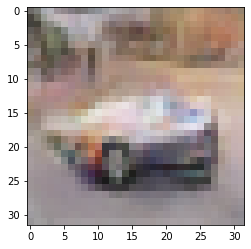

-> Epoch 354, Batch numero 1/78 -> Disc. loss on real images: 0.16018, Disc. loss on fake images: 0.37218, Generator loss: 3.79018
-> Epoch 354, Batch numero 2/78 -> Disc. loss on real images: 0.22126, Disc. loss on fake images: 0.16808, Generator loss: 3.61546
-> Epoch 354, Batch numero 3/78 -> Disc. loss on real images: 0.38922, Disc. loss on fake images: 0.27115, Generator loss: 3.36041
-> Epoch 354, Batch numero 4/78 -> Disc. loss on real images: 0.26866, Disc. loss on fake images: 0.45723, Generator loss: 3.47943
-> Epoch 354, Batch numero 5/78 -> Disc. loss on real images: 0.17092, Disc. loss on fake images: 0.31159, Generator loss: 3.62416
-> Epoch 354, Batch numero 6/78 -> Disc. loss on real images: 0.24535, Disc. loss on fake images: 0.28234, Generator loss: 3.19514
-> Epoch 354, Batch numero 7/78 -> Disc. loss on real images: 0.16561, Disc. loss on fake images: 0.32063, Generator loss: 3.76115
-> Epoch 354, Batch numero 8/78 -> Disc. loss on real images: 0.42302, Disc. loss o

-> Epoch 354, Batch numero 64/78 -> Disc. loss on real images: 0.18504, Disc. loss on fake images: 0.11004, Generator loss: 3.21968
-> Epoch 354, Batch numero 65/78 -> Disc. loss on real images: 0.14414, Disc. loss on fake images: 0.15416, Generator loss: 3.79290
-> Epoch 354, Batch numero 66/78 -> Disc. loss on real images: 0.24508, Disc. loss on fake images: 0.22039, Generator loss: 2.59968
-> Epoch 354, Batch numero 67/78 -> Disc. loss on real images: 0.21274, Disc. loss on fake images: 0.40191, Generator loss: 2.96154
-> Epoch 354, Batch numero 68/78 -> Disc. loss on real images: 0.30166, Disc. loss on fake images: 0.14399, Generator loss: 3.29782
-> Epoch 354, Batch numero 69/78 -> Disc. loss on real images: 0.24170, Disc. loss on fake images: 0.49147, Generator loss: 3.28705
-> Epoch 354, Batch numero 70/78 -> Disc. loss on real images: 0.20678, Disc. loss on fake images: 0.12741, Generator loss: 3.29950
-> Epoch 354, Batch numero 71/78 -> Disc. loss on real images: 0.22113, Disc

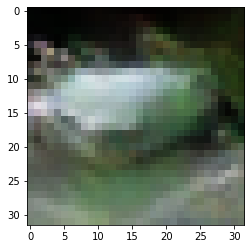

-> Epoch 355, Batch numero 1/78 -> Disc. loss on real images: 0.23105, Disc. loss on fake images: 0.19409, Generator loss: 3.11438
-> Epoch 355, Batch numero 2/78 -> Disc. loss on real images: 0.25004, Disc. loss on fake images: 0.17254, Generator loss: 2.84982
-> Epoch 355, Batch numero 3/78 -> Disc. loss on real images: 0.25515, Disc. loss on fake images: 0.16300, Generator loss: 2.89842
-> Epoch 355, Batch numero 4/78 -> Disc. loss on real images: 0.29387, Disc. loss on fake images: 0.57291, Generator loss: 3.22961
-> Epoch 355, Batch numero 5/78 -> Disc. loss on real images: 0.24809, Disc. loss on fake images: 0.29275, Generator loss: 3.30763
-> Epoch 355, Batch numero 6/78 -> Disc. loss on real images: 0.29153, Disc. loss on fake images: 0.11671, Generator loss: 2.67944
-> Epoch 355, Batch numero 7/78 -> Disc. loss on real images: 0.21638, Disc. loss on fake images: 0.34279, Generator loss: 3.13493
-> Epoch 355, Batch numero 8/78 -> Disc. loss on real images: 0.25075, Disc. loss o

-> Epoch 355, Batch numero 66/78 -> Disc. loss on real images: 0.30158, Disc. loss on fake images: 0.27557, Generator loss: 2.94167
-> Epoch 355, Batch numero 67/78 -> Disc. loss on real images: 0.16159, Disc. loss on fake images: 0.22507, Generator loss: 3.18505
-> Epoch 355, Batch numero 68/78 -> Disc. loss on real images: 0.25329, Disc. loss on fake images: 0.31356, Generator loss: 2.98680
-> Epoch 355, Batch numero 69/78 -> Disc. loss on real images: 0.18294, Disc. loss on fake images: 0.18445, Generator loss: 3.39749
-> Epoch 355, Batch numero 70/78 -> Disc. loss on real images: 0.29557, Disc. loss on fake images: 0.22165, Generator loss: 2.88396
-> Epoch 355, Batch numero 71/78 -> Disc. loss on real images: 0.14451, Disc. loss on fake images: 0.30270, Generator loss: 3.08303
-> Epoch 355, Batch numero 72/78 -> Disc. loss on real images: 0.13881, Disc. loss on fake images: 0.18003, Generator loss: 3.72609
-> Epoch 355, Batch numero 73/78 -> Disc. loss on real images: 0.34388, Disc

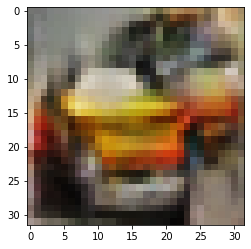

-> Epoch 356, Batch numero 1/78 -> Disc. loss on real images: 0.09226, Disc. loss on fake images: 0.30295, Generator loss: 3.37009
-> Epoch 356, Batch numero 2/78 -> Disc. loss on real images: 0.19012, Disc. loss on fake images: 0.15206, Generator loss: 3.37115
-> Epoch 356, Batch numero 3/78 -> Disc. loss on real images: 0.14298, Disc. loss on fake images: 0.24616, Generator loss: 3.06966
-> Epoch 356, Batch numero 4/78 -> Disc. loss on real images: 0.29506, Disc. loss on fake images: 0.29873, Generator loss: 2.86440
-> Epoch 356, Batch numero 5/78 -> Disc. loss on real images: 0.18598, Disc. loss on fake images: 0.25833, Generator loss: 2.96794
-> Epoch 356, Batch numero 6/78 -> Disc. loss on real images: 0.16104, Disc. loss on fake images: 0.26602, Generator loss: 3.81552
-> Epoch 356, Batch numero 7/78 -> Disc. loss on real images: 0.40010, Disc. loss on fake images: 0.22889, Generator loss: 2.93376
-> Epoch 356, Batch numero 8/78 -> Disc. loss on real images: 0.28013, Disc. loss o

-> Epoch 356, Batch numero 64/78 -> Disc. loss on real images: 0.20574, Disc. loss on fake images: 0.16733, Generator loss: 3.06129
-> Epoch 356, Batch numero 65/78 -> Disc. loss on real images: 0.23738, Disc. loss on fake images: 0.22876, Generator loss: 3.27899
-> Epoch 356, Batch numero 66/78 -> Disc. loss on real images: 0.30500, Disc. loss on fake images: 0.20191, Generator loss: 2.78063
-> Epoch 356, Batch numero 67/78 -> Disc. loss on real images: 0.17311, Disc. loss on fake images: 0.42102, Generator loss: 3.16111
-> Epoch 356, Batch numero 68/78 -> Disc. loss on real images: 0.27859, Disc. loss on fake images: 0.21300, Generator loss: 3.48608
-> Epoch 356, Batch numero 69/78 -> Disc. loss on real images: 0.21499, Disc. loss on fake images: 0.27527, Generator loss: 3.22597
-> Epoch 356, Batch numero 70/78 -> Disc. loss on real images: 0.24444, Disc. loss on fake images: 0.30088, Generator loss: 3.19029
-> Epoch 356, Batch numero 71/78 -> Disc. loss on real images: 0.16525, Disc

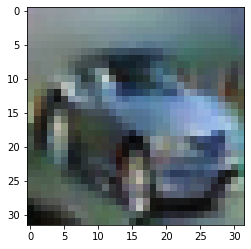

-> Epoch 357, Batch numero 1/78 -> Disc. loss on real images: 0.25623, Disc. loss on fake images: 0.20588, Generator loss: 2.79961
-> Epoch 357, Batch numero 2/78 -> Disc. loss on real images: 0.15137, Disc. loss on fake images: 0.34504, Generator loss: 3.26588
-> Epoch 357, Batch numero 3/78 -> Disc. loss on real images: 0.21843, Disc. loss on fake images: 0.32378, Generator loss: 3.73120
-> Epoch 357, Batch numero 4/78 -> Disc. loss on real images: 0.16250, Disc. loss on fake images: 0.17208, Generator loss: 3.43803
-> Epoch 357, Batch numero 5/78 -> Disc. loss on real images: 0.26031, Disc. loss on fake images: 0.28738, Generator loss: 3.32424
-> Epoch 357, Batch numero 6/78 -> Disc. loss on real images: 0.23833, Disc. loss on fake images: 0.28388, Generator loss: 3.52090
-> Epoch 357, Batch numero 7/78 -> Disc. loss on real images: 0.27649, Disc. loss on fake images: 0.12368, Generator loss: 3.39586
-> Epoch 357, Batch numero 8/78 -> Disc. loss on real images: 0.39988, Disc. loss o

-> Epoch 357, Batch numero 64/78 -> Disc. loss on real images: 0.11857, Disc. loss on fake images: 0.17360, Generator loss: 2.82221
-> Epoch 357, Batch numero 65/78 -> Disc. loss on real images: 0.13696, Disc. loss on fake images: 0.26951, Generator loss: 3.30504
-> Epoch 357, Batch numero 66/78 -> Disc. loss on real images: 0.18883, Disc. loss on fake images: 0.18280, Generator loss: 2.81104
-> Epoch 357, Batch numero 67/78 -> Disc. loss on real images: 0.30973, Disc. loss on fake images: 0.21683, Generator loss: 2.75369
-> Epoch 357, Batch numero 68/78 -> Disc. loss on real images: 0.13392, Disc. loss on fake images: 0.25476, Generator loss: 3.58066
-> Epoch 357, Batch numero 69/78 -> Disc. loss on real images: 0.27386, Disc. loss on fake images: 0.17652, Generator loss: 2.70675
-> Epoch 357, Batch numero 70/78 -> Disc. loss on real images: 0.37631, Disc. loss on fake images: 0.31117, Generator loss: 3.09284
-> Epoch 357, Batch numero 71/78 -> Disc. loss on real images: 0.25395, Disc

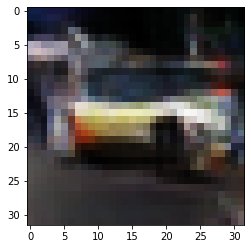

-> Epoch 358, Batch numero 1/78 -> Disc. loss on real images: 0.18746, Disc. loss on fake images: 0.46107, Generator loss: 3.05961
-> Epoch 358, Batch numero 2/78 -> Disc. loss on real images: 0.15659, Disc. loss on fake images: 0.33291, Generator loss: 3.07151
-> Epoch 358, Batch numero 3/78 -> Disc. loss on real images: 0.26839, Disc. loss on fake images: 0.21081, Generator loss: 3.33839
-> Epoch 358, Batch numero 4/78 -> Disc. loss on real images: 0.27715, Disc. loss on fake images: 0.23738, Generator loss: 3.33030
-> Epoch 358, Batch numero 5/78 -> Disc. loss on real images: 0.33496, Disc. loss on fake images: 0.17066, Generator loss: 3.17817
-> Epoch 358, Batch numero 6/78 -> Disc. loss on real images: 0.23243, Disc. loss on fake images: 0.24989, Generator loss: 3.22159
-> Epoch 358, Batch numero 7/78 -> Disc. loss on real images: 0.15081, Disc. loss on fake images: 0.26161, Generator loss: 3.20052
-> Epoch 358, Batch numero 8/78 -> Disc. loss on real images: 0.30082, Disc. loss o

-> Epoch 358, Batch numero 64/78 -> Disc. loss on real images: 0.33054, Disc. loss on fake images: 0.26441, Generator loss: 2.92708
-> Epoch 358, Batch numero 65/78 -> Disc. loss on real images: 0.18572, Disc. loss on fake images: 0.37273, Generator loss: 3.19662
-> Epoch 358, Batch numero 66/78 -> Disc. loss on real images: 0.22328, Disc. loss on fake images: 0.20920, Generator loss: 3.02384
-> Epoch 358, Batch numero 67/78 -> Disc. loss on real images: 0.26348, Disc. loss on fake images: 0.44085, Generator loss: 3.38480
-> Epoch 358, Batch numero 68/78 -> Disc. loss on real images: 0.28706, Disc. loss on fake images: 0.14231, Generator loss: 2.94420
-> Epoch 358, Batch numero 69/78 -> Disc. loss on real images: 0.25844, Disc. loss on fake images: 0.42503, Generator loss: 2.97115
-> Epoch 358, Batch numero 70/78 -> Disc. loss on real images: 0.17270, Disc. loss on fake images: 0.22773, Generator loss: 3.24766
-> Epoch 358, Batch numero 71/78 -> Disc. loss on real images: 0.28153, Disc

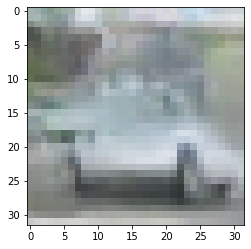

-> Epoch 359, Batch numero 1/78 -> Disc. loss on real images: 0.20565, Disc. loss on fake images: 0.37205, Generator loss: 3.66745
-> Epoch 359, Batch numero 2/78 -> Disc. loss on real images: 0.16856, Disc. loss on fake images: 0.19777, Generator loss: 3.43560
-> Epoch 359, Batch numero 3/78 -> Disc. loss on real images: 0.24628, Disc. loss on fake images: 0.11848, Generator loss: 3.89447
-> Epoch 359, Batch numero 4/78 -> Disc. loss on real images: 0.30169, Disc. loss on fake images: 0.17239, Generator loss: 2.98055
-> Epoch 359, Batch numero 5/78 -> Disc. loss on real images: 0.19962, Disc. loss on fake images: 0.38698, Generator loss: 3.06783
-> Epoch 359, Batch numero 6/78 -> Disc. loss on real images: 0.30007, Disc. loss on fake images: 0.20071, Generator loss: 2.59824
-> Epoch 359, Batch numero 7/78 -> Disc. loss on real images: 0.10698, Disc. loss on fake images: 0.14609, Generator loss: 3.25763
-> Epoch 359, Batch numero 8/78 -> Disc. loss on real images: 0.19458, Disc. loss o

-> Epoch 359, Batch numero 64/78 -> Disc. loss on real images: 0.28516, Disc. loss on fake images: 0.26040, Generator loss: 3.56479
-> Epoch 359, Batch numero 65/78 -> Disc. loss on real images: 0.31558, Disc. loss on fake images: 0.18953, Generator loss: 3.18151
-> Epoch 359, Batch numero 66/78 -> Disc. loss on real images: 0.20854, Disc. loss on fake images: 0.18987, Generator loss: 3.68082
-> Epoch 359, Batch numero 67/78 -> Disc. loss on real images: 0.25058, Disc. loss on fake images: 0.19728, Generator loss: 3.09598
-> Epoch 359, Batch numero 68/78 -> Disc. loss on real images: 0.34392, Disc. loss on fake images: 0.53924, Generator loss: 2.93085
-> Epoch 359, Batch numero 69/78 -> Disc. loss on real images: 0.11666, Disc. loss on fake images: 0.29887, Generator loss: 3.89170
-> Epoch 359, Batch numero 70/78 -> Disc. loss on real images: 0.23621, Disc. loss on fake images: 0.12090, Generator loss: 3.28430
-> Epoch 359, Batch numero 71/78 -> Disc. loss on real images: 0.42178, Disc

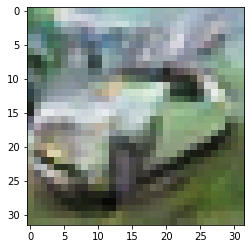

-> Epoch 360, Batch numero 1/78 -> Disc. loss on real images: 0.15287, Disc. loss on fake images: 0.21349, Generator loss: 3.30814
-> Epoch 360, Batch numero 2/78 -> Disc. loss on real images: 0.26934, Disc. loss on fake images: 0.25519, Generator loss: 3.64842
-> Epoch 360, Batch numero 3/78 -> Disc. loss on real images: 0.37374, Disc. loss on fake images: 0.24212, Generator loss: 3.18202
-> Epoch 360, Batch numero 4/78 -> Disc. loss on real images: 0.20403, Disc. loss on fake images: 0.48044, Generator loss: 3.66836
-> Epoch 360, Batch numero 5/78 -> Disc. loss on real images: 0.23100, Disc. loss on fake images: 0.28176, Generator loss: 3.92430
-> Epoch 360, Batch numero 6/78 -> Disc. loss on real images: 0.55182, Disc. loss on fake images: 0.32151, Generator loss: 3.42894
-> Epoch 360, Batch numero 7/78 -> Disc. loss on real images: 0.20722, Disc. loss on fake images: 0.34706, Generator loss: 3.83825
-> Epoch 360, Batch numero 8/78 -> Disc. loss on real images: 0.21356, Disc. loss o

-> Epoch 360, Batch numero 64/78 -> Disc. loss on real images: 0.52587, Disc. loss on fake images: 0.21582, Generator loss: 2.86799
-> Epoch 360, Batch numero 65/78 -> Disc. loss on real images: 0.11901, Disc. loss on fake images: 0.47165, Generator loss: 2.95244
-> Epoch 360, Batch numero 66/78 -> Disc. loss on real images: 0.32166, Disc. loss on fake images: 0.14453, Generator loss: 3.02116
-> Epoch 360, Batch numero 67/78 -> Disc. loss on real images: 0.20018, Disc. loss on fake images: 0.35745, Generator loss: 3.17474
-> Epoch 360, Batch numero 68/78 -> Disc. loss on real images: 0.32250, Disc. loss on fake images: 0.22065, Generator loss: 3.06807
-> Epoch 360, Batch numero 69/78 -> Disc. loss on real images: 0.26916, Disc. loss on fake images: 0.40456, Generator loss: 3.25642
-> Epoch 360, Batch numero 70/78 -> Disc. loss on real images: 0.16068, Disc. loss on fake images: 0.13628, Generator loss: 3.09943
-> Epoch 360, Batch numero 71/78 -> Disc. loss on real images: 0.32398, Disc

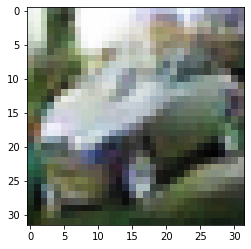

-> Epoch 361, Batch numero 1/78 -> Disc. loss on real images: 0.12123, Disc. loss on fake images: 0.17645, Generator loss: 3.30033
-> Epoch 361, Batch numero 2/78 -> Disc. loss on real images: 0.22680, Disc. loss on fake images: 0.17753, Generator loss: 3.18783
-> Epoch 361, Batch numero 3/78 -> Disc. loss on real images: 0.19422, Disc. loss on fake images: 0.18606, Generator loss: 2.97999
-> Epoch 361, Batch numero 4/78 -> Disc. loss on real images: 0.15752, Disc. loss on fake images: 0.23534, Generator loss: 3.16928
-> Epoch 361, Batch numero 5/78 -> Disc. loss on real images: 0.27240, Disc. loss on fake images: 0.44626, Generator loss: 3.57860
-> Epoch 361, Batch numero 6/78 -> Disc. loss on real images: 0.21493, Disc. loss on fake images: 0.21172, Generator loss: 3.37718
-> Epoch 361, Batch numero 7/78 -> Disc. loss on real images: 0.31225, Disc. loss on fake images: 0.12174, Generator loss: 2.87012
-> Epoch 361, Batch numero 8/78 -> Disc. loss on real images: 0.18298, Disc. loss o

-> Epoch 361, Batch numero 64/78 -> Disc. loss on real images: 0.33455, Disc. loss on fake images: 0.21953, Generator loss: 3.12735
-> Epoch 361, Batch numero 65/78 -> Disc. loss on real images: 0.19121, Disc. loss on fake images: 0.15469, Generator loss: 2.92440
-> Epoch 361, Batch numero 66/78 -> Disc. loss on real images: 0.19864, Disc. loss on fake images: 0.29912, Generator loss: 2.64273
-> Epoch 361, Batch numero 67/78 -> Disc. loss on real images: 0.14386, Disc. loss on fake images: 0.37064, Generator loss: 3.02047
-> Epoch 361, Batch numero 68/78 -> Disc. loss on real images: 0.23654, Disc. loss on fake images: 0.14248, Generator loss: 3.29526
-> Epoch 361, Batch numero 69/78 -> Disc. loss on real images: 0.23346, Disc. loss on fake images: 0.26888, Generator loss: 3.05995
-> Epoch 361, Batch numero 70/78 -> Disc. loss on real images: 0.13596, Disc. loss on fake images: 0.22983, Generator loss: 3.25289
-> Epoch 361, Batch numero 71/78 -> Disc. loss on real images: 0.24165, Disc

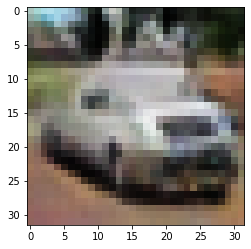

-> Epoch 362, Batch numero 1/78 -> Disc. loss on real images: 0.20796, Disc. loss on fake images: 0.18711, Generator loss: 3.37689
-> Epoch 362, Batch numero 2/78 -> Disc. loss on real images: 0.21334, Disc. loss on fake images: 0.13573, Generator loss: 3.08859
-> Epoch 362, Batch numero 3/78 -> Disc. loss on real images: 0.14022, Disc. loss on fake images: 0.18372, Generator loss: 3.02720
-> Epoch 362, Batch numero 4/78 -> Disc. loss on real images: 0.14572, Disc. loss on fake images: 0.29739, Generator loss: 3.21627
-> Epoch 362, Batch numero 5/78 -> Disc. loss on real images: 0.25504, Disc. loss on fake images: 0.26918, Generator loss: 3.68516
-> Epoch 362, Batch numero 6/78 -> Disc. loss on real images: 0.18534, Disc. loss on fake images: 0.09726, Generator loss: 3.47560
-> Epoch 362, Batch numero 7/78 -> Disc. loss on real images: 0.17867, Disc. loss on fake images: 0.17081, Generator loss: 3.41383
-> Epoch 362, Batch numero 8/78 -> Disc. loss on real images: 0.18689, Disc. loss o

-> Epoch 362, Batch numero 64/78 -> Disc. loss on real images: 0.18713, Disc. loss on fake images: 0.28461, Generator loss: 3.12224
-> Epoch 362, Batch numero 65/78 -> Disc. loss on real images: 0.18058, Disc. loss on fake images: 0.21721, Generator loss: 3.60297
-> Epoch 362, Batch numero 66/78 -> Disc. loss on real images: 0.17742, Disc. loss on fake images: 0.15477, Generator loss: 2.94227
-> Epoch 362, Batch numero 67/78 -> Disc. loss on real images: 0.14388, Disc. loss on fake images: 0.32946, Generator loss: 3.08539
-> Epoch 362, Batch numero 68/78 -> Disc. loss on real images: 0.13819, Disc. loss on fake images: 0.13986, Generator loss: 3.18538
-> Epoch 362, Batch numero 69/78 -> Disc. loss on real images: 0.07759, Disc. loss on fake images: 0.22417, Generator loss: 3.41424
-> Epoch 362, Batch numero 70/78 -> Disc. loss on real images: 0.26839, Disc. loss on fake images: 0.20011, Generator loss: 3.16555
-> Epoch 362, Batch numero 71/78 -> Disc. loss on real images: 0.27563, Disc

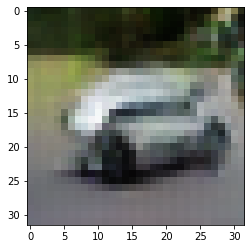

-> Epoch 363, Batch numero 1/78 -> Disc. loss on real images: 0.38815, Disc. loss on fake images: 0.27826, Generator loss: 3.23993
-> Epoch 363, Batch numero 2/78 -> Disc. loss on real images: 0.14729, Disc. loss on fake images: 0.09104, Generator loss: 2.72172
-> Epoch 363, Batch numero 3/78 -> Disc. loss on real images: 0.14284, Disc. loss on fake images: 0.24762, Generator loss: 3.35191
-> Epoch 363, Batch numero 4/78 -> Disc. loss on real images: 0.31788, Disc. loss on fake images: 0.40955, Generator loss: 3.13110
-> Epoch 363, Batch numero 5/78 -> Disc. loss on real images: 0.19894, Disc. loss on fake images: 0.49281, Generator loss: 3.57616
-> Epoch 363, Batch numero 6/78 -> Disc. loss on real images: 0.28282, Disc. loss on fake images: 0.06873, Generator loss: 3.29626
-> Epoch 363, Batch numero 7/78 -> Disc. loss on real images: 0.23387, Disc. loss on fake images: 0.19487, Generator loss: 2.96106
-> Epoch 363, Batch numero 8/78 -> Disc. loss on real images: 0.13868, Disc. loss o

-> Epoch 363, Batch numero 64/78 -> Disc. loss on real images: 0.16455, Disc. loss on fake images: 0.25504, Generator loss: 2.81268
-> Epoch 363, Batch numero 65/78 -> Disc. loss on real images: 0.11803, Disc. loss on fake images: 0.45021, Generator loss: 3.00088
-> Epoch 363, Batch numero 66/78 -> Disc. loss on real images: 0.33302, Disc. loss on fake images: 0.39961, Generator loss: 3.44888
-> Epoch 363, Batch numero 67/78 -> Disc. loss on real images: 0.28788, Disc. loss on fake images: 0.09326, Generator loss: 3.21543
-> Epoch 363, Batch numero 68/78 -> Disc. loss on real images: 0.18289, Disc. loss on fake images: 0.25388, Generator loss: 3.34835
-> Epoch 363, Batch numero 69/78 -> Disc. loss on real images: 0.17804, Disc. loss on fake images: 0.22658, Generator loss: 3.47545
-> Epoch 363, Batch numero 70/78 -> Disc. loss on real images: 0.24516, Disc. loss on fake images: 0.27257, Generator loss: 3.48114
-> Epoch 363, Batch numero 71/78 -> Disc. loss on real images: 0.44092, Disc

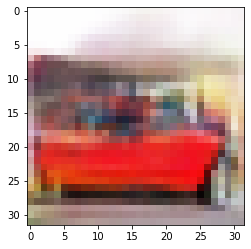

-> Epoch 364, Batch numero 1/78 -> Disc. loss on real images: 0.22148, Disc. loss on fake images: 0.14716, Generator loss: 3.55624
-> Epoch 364, Batch numero 2/78 -> Disc. loss on real images: 0.26703, Disc. loss on fake images: 0.17496, Generator loss: 3.17698
-> Epoch 364, Batch numero 3/78 -> Disc. loss on real images: 0.38194, Disc. loss on fake images: 0.39728, Generator loss: 3.01221
-> Epoch 364, Batch numero 4/78 -> Disc. loss on real images: 0.23932, Disc. loss on fake images: 0.22239, Generator loss: 3.14747
-> Epoch 364, Batch numero 5/78 -> Disc. loss on real images: 0.30172, Disc. loss on fake images: 0.29981, Generator loss: 2.87652
-> Epoch 364, Batch numero 6/78 -> Disc. loss on real images: 0.17290, Disc. loss on fake images: 0.19037, Generator loss: 3.07641
-> Epoch 364, Batch numero 7/78 -> Disc. loss on real images: 0.16068, Disc. loss on fake images: 0.15012, Generator loss: 3.42276
-> Epoch 364, Batch numero 8/78 -> Disc. loss on real images: 0.23606, Disc. loss o

-> Epoch 364, Batch numero 64/78 -> Disc. loss on real images: 0.27717, Disc. loss on fake images: 0.12385, Generator loss: 2.92970
-> Epoch 364, Batch numero 65/78 -> Disc. loss on real images: 0.13704, Disc. loss on fake images: 0.25343, Generator loss: 2.77433
-> Epoch 364, Batch numero 66/78 -> Disc. loss on real images: 0.10938, Disc. loss on fake images: 0.39009, Generator loss: 3.49432
-> Epoch 364, Batch numero 67/78 -> Disc. loss on real images: 0.36737, Disc. loss on fake images: 0.16530, Generator loss: 3.11518
-> Epoch 364, Batch numero 68/78 -> Disc. loss on real images: 0.14459, Disc. loss on fake images: 0.24763, Generator loss: 4.12315
-> Epoch 364, Batch numero 69/78 -> Disc. loss on real images: 0.43041, Disc. loss on fake images: 0.35615, Generator loss: 3.16637
-> Epoch 364, Batch numero 70/78 -> Disc. loss on real images: 0.23082, Disc. loss on fake images: 0.20943, Generator loss: 3.05297
-> Epoch 364, Batch numero 71/78 -> Disc. loss on real images: 0.31648, Disc

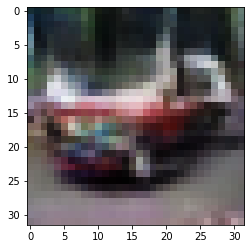

-> Epoch 365, Batch numero 1/78 -> Disc. loss on real images: 0.31554, Disc. loss on fake images: 0.27550, Generator loss: 2.95238
-> Epoch 365, Batch numero 2/78 -> Disc. loss on real images: 0.21795, Disc. loss on fake images: 0.31605, Generator loss: 2.84061
-> Epoch 365, Batch numero 3/78 -> Disc. loss on real images: 0.29100, Disc. loss on fake images: 0.54329, Generator loss: 3.04507
-> Epoch 365, Batch numero 4/78 -> Disc. loss on real images: 0.13897, Disc. loss on fake images: 0.23539, Generator loss: 3.84857
-> Epoch 365, Batch numero 5/78 -> Disc. loss on real images: 0.23711, Disc. loss on fake images: 0.28289, Generator loss: 3.24515
-> Epoch 365, Batch numero 6/78 -> Disc. loss on real images: 0.24705, Disc. loss on fake images: 0.08270, Generator loss: 3.38209
-> Epoch 365, Batch numero 7/78 -> Disc. loss on real images: 0.32278, Disc. loss on fake images: 0.21385, Generator loss: 3.23001
-> Epoch 365, Batch numero 8/78 -> Disc. loss on real images: 0.08873, Disc. loss o

-> Epoch 365, Batch numero 64/78 -> Disc. loss on real images: 0.33846, Disc. loss on fake images: 0.32128, Generator loss: 3.06456
-> Epoch 365, Batch numero 65/78 -> Disc. loss on real images: 0.28110, Disc. loss on fake images: 0.27838, Generator loss: 3.49529
-> Epoch 365, Batch numero 66/78 -> Disc. loss on real images: 0.18491, Disc. loss on fake images: 0.09532, Generator loss: 2.95402
-> Epoch 365, Batch numero 67/78 -> Disc. loss on real images: 0.17384, Disc. loss on fake images: 0.30451, Generator loss: 2.69391
-> Epoch 365, Batch numero 68/78 -> Disc. loss on real images: 0.25079, Disc. loss on fake images: 0.20131, Generator loss: 2.86951
-> Epoch 365, Batch numero 69/78 -> Disc. loss on real images: 0.15801, Disc. loss on fake images: 0.30653, Generator loss: 2.81748
-> Epoch 365, Batch numero 70/78 -> Disc. loss on real images: 0.20193, Disc. loss on fake images: 0.13599, Generator loss: 3.35400
-> Epoch 365, Batch numero 71/78 -> Disc. loss on real images: 0.16230, Disc

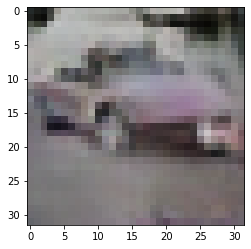

-> Epoch 366, Batch numero 1/78 -> Disc. loss on real images: 0.46394, Disc. loss on fake images: 0.26551, Generator loss: 3.45797
-> Epoch 366, Batch numero 2/78 -> Disc. loss on real images: 0.28376, Disc. loss on fake images: 0.35665, Generator loss: 3.22676
-> Epoch 366, Batch numero 3/78 -> Disc. loss on real images: 0.38136, Disc. loss on fake images: 0.21489, Generator loss: 3.03429
-> Epoch 366, Batch numero 4/78 -> Disc. loss on real images: 0.20882, Disc. loss on fake images: 0.27127, Generator loss: 3.05242
-> Epoch 366, Batch numero 5/78 -> Disc. loss on real images: 0.11458, Disc. loss on fake images: 0.15742, Generator loss: 3.09025
-> Epoch 366, Batch numero 6/78 -> Disc. loss on real images: 0.25487, Disc. loss on fake images: 0.15062, Generator loss: 2.99761
-> Epoch 366, Batch numero 7/78 -> Disc. loss on real images: 0.07122, Disc. loss on fake images: 0.36967, Generator loss: 3.61095
-> Epoch 366, Batch numero 8/78 -> Disc. loss on real images: 0.30631, Disc. loss o

-> Epoch 366, Batch numero 64/78 -> Disc. loss on real images: 0.14588, Disc. loss on fake images: 0.29754, Generator loss: 3.33153
-> Epoch 366, Batch numero 65/78 -> Disc. loss on real images: 0.31364, Disc. loss on fake images: 0.31867, Generator loss: 3.18640
-> Epoch 366, Batch numero 66/78 -> Disc. loss on real images: 0.31629, Disc. loss on fake images: 0.19599, Generator loss: 3.89056
-> Epoch 366, Batch numero 67/78 -> Disc. loss on real images: 0.29296, Disc. loss on fake images: 0.18998, Generator loss: 3.48026
-> Epoch 366, Batch numero 68/78 -> Disc. loss on real images: 0.34168, Disc. loss on fake images: 0.28210, Generator loss: 3.22957
-> Epoch 366, Batch numero 69/78 -> Disc. loss on real images: 0.18312, Disc. loss on fake images: 0.22323, Generator loss: 3.34327
-> Epoch 366, Batch numero 70/78 -> Disc. loss on real images: 0.15589, Disc. loss on fake images: 0.19830, Generator loss: 3.14316
-> Epoch 366, Batch numero 71/78 -> Disc. loss on real images: 0.11005, Disc

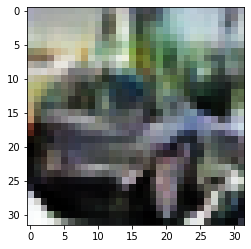

-> Epoch 367, Batch numero 1/78 -> Disc. loss on real images: 0.21253, Disc. loss on fake images: 0.43813, Generator loss: 3.55918
-> Epoch 367, Batch numero 2/78 -> Disc. loss on real images: 0.20270, Disc. loss on fake images: 0.10362, Generator loss: 3.67148
-> Epoch 367, Batch numero 3/78 -> Disc. loss on real images: 0.26138, Disc. loss on fake images: 0.20940, Generator loss: 3.36796
-> Epoch 367, Batch numero 4/78 -> Disc. loss on real images: 0.16725, Disc. loss on fake images: 0.27312, Generator loss: 3.62275
-> Epoch 367, Batch numero 5/78 -> Disc. loss on real images: 0.15111, Disc. loss on fake images: 0.30372, Generator loss: 4.05178
-> Epoch 367, Batch numero 6/78 -> Disc. loss on real images: 0.27483, Disc. loss on fake images: 0.25009, Generator loss: 3.74652
-> Epoch 367, Batch numero 7/78 -> Disc. loss on real images: 0.40299, Disc. loss on fake images: 0.12141, Generator loss: 2.79227
-> Epoch 367, Batch numero 8/78 -> Disc. loss on real images: 0.21766, Disc. loss o

-> Epoch 367, Batch numero 64/78 -> Disc. loss on real images: 0.29809, Disc. loss on fake images: 0.26570, Generator loss: 3.87665
-> Epoch 367, Batch numero 65/78 -> Disc. loss on real images: 0.38647, Disc. loss on fake images: 0.24320, Generator loss: 2.97708
-> Epoch 367, Batch numero 66/78 -> Disc. loss on real images: 0.19901, Disc. loss on fake images: 0.31833, Generator loss: 3.18488
-> Epoch 367, Batch numero 67/78 -> Disc. loss on real images: 0.19172, Disc. loss on fake images: 0.22018, Generator loss: 3.53550
-> Epoch 367, Batch numero 68/78 -> Disc. loss on real images: 0.24554, Disc. loss on fake images: 0.22217, Generator loss: 3.44845
-> Epoch 367, Batch numero 69/78 -> Disc. loss on real images: 0.24442, Disc. loss on fake images: 0.35356, Generator loss: 3.40776
-> Epoch 367, Batch numero 70/78 -> Disc. loss on real images: 0.29297, Disc. loss on fake images: 0.25290, Generator loss: 3.24629
-> Epoch 367, Batch numero 71/78 -> Disc. loss on real images: 0.16988, Disc

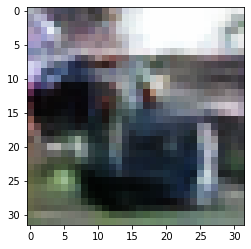

-> Epoch 368, Batch numero 1/78 -> Disc. loss on real images: 0.25568, Disc. loss on fake images: 0.26992, Generator loss: 3.91243
-> Epoch 368, Batch numero 2/78 -> Disc. loss on real images: 0.23180, Disc. loss on fake images: 0.08997, Generator loss: 3.42223
-> Epoch 368, Batch numero 3/78 -> Disc. loss on real images: 0.29983, Disc. loss on fake images: 0.36206, Generator loss: 3.18660
-> Epoch 368, Batch numero 4/78 -> Disc. loss on real images: 0.15673, Disc. loss on fake images: 0.20876, Generator loss: 3.68840
-> Epoch 368, Batch numero 5/78 -> Disc. loss on real images: 0.13889, Disc. loss on fake images: 0.15439, Generator loss: 3.44451
-> Epoch 368, Batch numero 6/78 -> Disc. loss on real images: 0.23322, Disc. loss on fake images: 0.28090, Generator loss: 3.76365
-> Epoch 368, Batch numero 7/78 -> Disc. loss on real images: 0.32887, Disc. loss on fake images: 0.19702, Generator loss: 3.51735
-> Epoch 368, Batch numero 8/78 -> Disc. loss on real images: 0.19063, Disc. loss o

-> Epoch 368, Batch numero 64/78 -> Disc. loss on real images: 0.12240, Disc. loss on fake images: 0.29872, Generator loss: 3.67807
-> Epoch 368, Batch numero 65/78 -> Disc. loss on real images: 0.41401, Disc. loss on fake images: 0.27851, Generator loss: 3.73412
-> Epoch 368, Batch numero 66/78 -> Disc. loss on real images: 0.30000, Disc. loss on fake images: 0.23455, Generator loss: 3.97442
-> Epoch 368, Batch numero 67/78 -> Disc. loss on real images: 0.25221, Disc. loss on fake images: 0.13506, Generator loss: 3.44313
-> Epoch 368, Batch numero 68/78 -> Disc. loss on real images: 0.16504, Disc. loss on fake images: 0.11445, Generator loss: 3.35276
-> Epoch 368, Batch numero 69/78 -> Disc. loss on real images: 0.36191, Disc. loss on fake images: 0.26465, Generator loss: 2.57866
-> Epoch 368, Batch numero 70/78 -> Disc. loss on real images: 0.22381, Disc. loss on fake images: 0.57008, Generator loss: 3.22855
-> Epoch 368, Batch numero 71/78 -> Disc. loss on real images: 0.17992, Disc

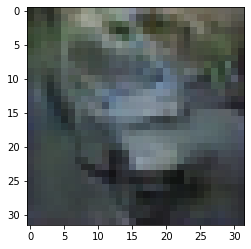

-> Epoch 369, Batch numero 1/78 -> Disc. loss on real images: 0.42951, Disc. loss on fake images: 0.39506, Generator loss: 3.16838
-> Epoch 369, Batch numero 2/78 -> Disc. loss on real images: 0.21392, Disc. loss on fake images: 0.25698, Generator loss: 3.21165
-> Epoch 369, Batch numero 3/78 -> Disc. loss on real images: 0.18614, Disc. loss on fake images: 0.52686, Generator loss: 3.87701
-> Epoch 369, Batch numero 4/78 -> Disc. loss on real images: 0.31528, Disc. loss on fake images: 0.23003, Generator loss: 3.61592
-> Epoch 369, Batch numero 5/78 -> Disc. loss on real images: 0.33281, Disc. loss on fake images: 0.14322, Generator loss: 3.02205
-> Epoch 369, Batch numero 6/78 -> Disc. loss on real images: 0.25607, Disc. loss on fake images: 0.58899, Generator loss: 3.33287
-> Epoch 369, Batch numero 7/78 -> Disc. loss on real images: 0.14747, Disc. loss on fake images: 0.26228, Generator loss: 3.60547
-> Epoch 369, Batch numero 8/78 -> Disc. loss on real images: 0.35094, Disc. loss o

-> Epoch 369, Batch numero 64/78 -> Disc. loss on real images: 0.11560, Disc. loss on fake images: 0.34137, Generator loss: 3.23265
-> Epoch 369, Batch numero 65/78 -> Disc. loss on real images: 0.17334, Disc. loss on fake images: 0.21846, Generator loss: 3.63840
-> Epoch 369, Batch numero 66/78 -> Disc. loss on real images: 0.33339, Disc. loss on fake images: 0.42509, Generator loss: 3.18306
-> Epoch 369, Batch numero 67/78 -> Disc. loss on real images: 0.19959, Disc. loss on fake images: 0.22316, Generator loss: 3.33612
-> Epoch 369, Batch numero 68/78 -> Disc. loss on real images: 0.23421, Disc. loss on fake images: 0.11276, Generator loss: 3.37431
-> Epoch 369, Batch numero 69/78 -> Disc. loss on real images: 0.23912, Disc. loss on fake images: 0.32982, Generator loss: 3.42680
-> Epoch 369, Batch numero 70/78 -> Disc. loss on real images: 0.11488, Disc. loss on fake images: 0.25236, Generator loss: 3.80005
-> Epoch 369, Batch numero 71/78 -> Disc. loss on real images: 0.36660, Disc

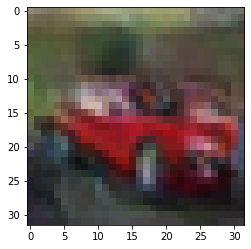

-> Epoch 370, Batch numero 1/78 -> Disc. loss on real images: 0.18309, Disc. loss on fake images: 0.31424, Generator loss: 3.85968
-> Epoch 370, Batch numero 2/78 -> Disc. loss on real images: 0.21725, Disc. loss on fake images: 0.20953, Generator loss: 3.84304
-> Epoch 370, Batch numero 3/78 -> Disc. loss on real images: 0.31904, Disc. loss on fake images: 0.12935, Generator loss: 3.11158
-> Epoch 370, Batch numero 4/78 -> Disc. loss on real images: 0.32537, Disc. loss on fake images: 0.21695, Generator loss: 3.16306
-> Epoch 370, Batch numero 5/78 -> Disc. loss on real images: 0.12661, Disc. loss on fake images: 0.45465, Generator loss: 3.19535
-> Epoch 370, Batch numero 6/78 -> Disc. loss on real images: 0.12503, Disc. loss on fake images: 0.25504, Generator loss: 3.92980
-> Epoch 370, Batch numero 7/78 -> Disc. loss on real images: 0.53177, Disc. loss on fake images: 0.17954, Generator loss: 3.06692
-> Epoch 370, Batch numero 8/78 -> Disc. loss on real images: 0.24632, Disc. loss o

-> Epoch 370, Batch numero 64/78 -> Disc. loss on real images: 0.20720, Disc. loss on fake images: 0.27939, Generator loss: 3.21297
-> Epoch 370, Batch numero 65/78 -> Disc. loss on real images: 0.18760, Disc. loss on fake images: 0.28792, Generator loss: 3.14109
-> Epoch 370, Batch numero 66/78 -> Disc. loss on real images: 0.27587, Disc. loss on fake images: 0.17261, Generator loss: 2.95558
-> Epoch 370, Batch numero 67/78 -> Disc. loss on real images: 0.17926, Disc. loss on fake images: 0.29712, Generator loss: 3.04764
-> Epoch 370, Batch numero 68/78 -> Disc. loss on real images: 0.11705, Disc. loss on fake images: 0.21510, Generator loss: 3.25919
-> Epoch 370, Batch numero 69/78 -> Disc. loss on real images: 0.24284, Disc. loss on fake images: 0.15487, Generator loss: 3.39140
-> Epoch 370, Batch numero 70/78 -> Disc. loss on real images: 0.15767, Disc. loss on fake images: 0.13291, Generator loss: 3.09291
-> Epoch 370, Batch numero 71/78 -> Disc. loss on real images: 0.15926, Disc

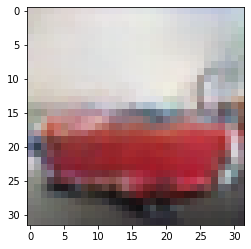

-> Epoch 371, Batch numero 1/78 -> Disc. loss on real images: 0.31280, Disc. loss on fake images: 0.23747, Generator loss: 3.19889
-> Epoch 371, Batch numero 2/78 -> Disc. loss on real images: 0.21713, Disc. loss on fake images: 0.34878, Generator loss: 3.07116
-> Epoch 371, Batch numero 3/78 -> Disc. loss on real images: 0.11585, Disc. loss on fake images: 0.21980, Generator loss: 3.11680
-> Epoch 371, Batch numero 4/78 -> Disc. loss on real images: 0.27290, Disc. loss on fake images: 0.13444, Generator loss: 3.54826
-> Epoch 371, Batch numero 5/78 -> Disc. loss on real images: 0.25550, Disc. loss on fake images: 0.28460, Generator loss: 3.40957
-> Epoch 371, Batch numero 6/78 -> Disc. loss on real images: 0.27423, Disc. loss on fake images: 0.14666, Generator loss: 3.31617
-> Epoch 371, Batch numero 7/78 -> Disc. loss on real images: 0.25370, Disc. loss on fake images: 0.17237, Generator loss: 2.98940
-> Epoch 371, Batch numero 8/78 -> Disc. loss on real images: 0.18158, Disc. loss o

-> Epoch 371, Batch numero 64/78 -> Disc. loss on real images: 0.22109, Disc. loss on fake images: 0.31523, Generator loss: 3.41449
-> Epoch 371, Batch numero 65/78 -> Disc. loss on real images: 0.19517, Disc. loss on fake images: 0.21745, Generator loss: 3.35180
-> Epoch 371, Batch numero 66/78 -> Disc. loss on real images: 0.14045, Disc. loss on fake images: 0.17106, Generator loss: 3.28201
-> Epoch 371, Batch numero 67/78 -> Disc. loss on real images: 0.28304, Disc. loss on fake images: 0.54856, Generator loss: 2.98064
-> Epoch 371, Batch numero 68/78 -> Disc. loss on real images: 0.14985, Disc. loss on fake images: 0.12624, Generator loss: 3.29821
-> Epoch 371, Batch numero 69/78 -> Disc. loss on real images: 0.23859, Disc. loss on fake images: 0.37406, Generator loss: 3.36946
-> Epoch 371, Batch numero 70/78 -> Disc. loss on real images: 0.30027, Disc. loss on fake images: 0.22349, Generator loss: 3.23303
-> Epoch 371, Batch numero 71/78 -> Disc. loss on real images: 0.28006, Disc

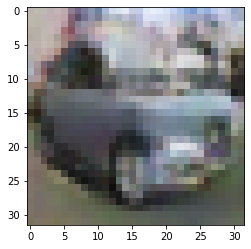

-> Epoch 372, Batch numero 1/78 -> Disc. loss on real images: 0.27912, Disc. loss on fake images: 0.11048, Generator loss: 3.01403
-> Epoch 372, Batch numero 2/78 -> Disc. loss on real images: 0.10733, Disc. loss on fake images: 0.21122, Generator loss: 3.35960
-> Epoch 372, Batch numero 3/78 -> Disc. loss on real images: 0.24549, Disc. loss on fake images: 0.17963, Generator loss: 3.14087
-> Epoch 372, Batch numero 4/78 -> Disc. loss on real images: 0.23617, Disc. loss on fake images: 0.34799, Generator loss: 3.72425
-> Epoch 372, Batch numero 5/78 -> Disc. loss on real images: 0.33340, Disc. loss on fake images: 0.20389, Generator loss: 3.54446
-> Epoch 372, Batch numero 6/78 -> Disc. loss on real images: 0.23608, Disc. loss on fake images: 0.26246, Generator loss: 3.46797
-> Epoch 372, Batch numero 7/78 -> Disc. loss on real images: 0.18728, Disc. loss on fake images: 0.21220, Generator loss: 3.79784
-> Epoch 372, Batch numero 8/78 -> Disc. loss on real images: 0.26689, Disc. loss o

-> Epoch 372, Batch numero 64/78 -> Disc. loss on real images: 0.27339, Disc. loss on fake images: 0.26555, Generator loss: 3.54601
-> Epoch 372, Batch numero 65/78 -> Disc. loss on real images: 0.34387, Disc. loss on fake images: 0.16218, Generator loss: 3.03343
-> Epoch 372, Batch numero 66/78 -> Disc. loss on real images: 0.16516, Disc. loss on fake images: 0.16901, Generator loss: 2.78351
-> Epoch 372, Batch numero 67/78 -> Disc. loss on real images: 0.11961, Disc. loss on fake images: 0.27970, Generator loss: 3.08952
-> Epoch 372, Batch numero 68/78 -> Disc. loss on real images: 0.12484, Disc. loss on fake images: 0.18270, Generator loss: 3.01826
-> Epoch 372, Batch numero 69/78 -> Disc. loss on real images: 0.17650, Disc. loss on fake images: 0.18523, Generator loss: 3.37993
-> Epoch 372, Batch numero 70/78 -> Disc. loss on real images: 0.34276, Disc. loss on fake images: 0.17483, Generator loss: 3.08873
-> Epoch 372, Batch numero 71/78 -> Disc. loss on real images: 0.14543, Disc

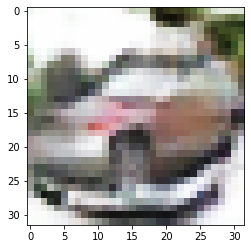

-> Epoch 373, Batch numero 1/78 -> Disc. loss on real images: 0.27229, Disc. loss on fake images: 0.21688, Generator loss: 3.24557
-> Epoch 373, Batch numero 2/78 -> Disc. loss on real images: 0.11258, Disc. loss on fake images: 0.16655, Generator loss: 3.64667
-> Epoch 373, Batch numero 3/78 -> Disc. loss on real images: 0.17546, Disc. loss on fake images: 0.10721, Generator loss: 3.26830
-> Epoch 373, Batch numero 4/78 -> Disc. loss on real images: 0.21767, Disc. loss on fake images: 0.13466, Generator loss: 3.76775
-> Epoch 373, Batch numero 5/78 -> Disc. loss on real images: 0.12437, Disc. loss on fake images: 0.24016, Generator loss: 4.01744
-> Epoch 373, Batch numero 6/78 -> Disc. loss on real images: 0.25092, Disc. loss on fake images: 0.20999, Generator loss: 3.46183
-> Epoch 373, Batch numero 7/78 -> Disc. loss on real images: 0.23895, Disc. loss on fake images: 0.36744, Generator loss: 3.33963
-> Epoch 373, Batch numero 8/78 -> Disc. loss on real images: 0.23084, Disc. loss o

-> Epoch 373, Batch numero 64/78 -> Disc. loss on real images: 0.23374, Disc. loss on fake images: 0.16547, Generator loss: 3.09609
-> Epoch 373, Batch numero 65/78 -> Disc. loss on real images: 0.28348, Disc. loss on fake images: 0.40127, Generator loss: 3.69911
-> Epoch 373, Batch numero 66/78 -> Disc. loss on real images: 0.22921, Disc. loss on fake images: 0.14378, Generator loss: 3.57114
-> Epoch 373, Batch numero 67/78 -> Disc. loss on real images: 0.32378, Disc. loss on fake images: 0.25947, Generator loss: 3.06425
-> Epoch 373, Batch numero 68/78 -> Disc. loss on real images: 0.27909, Disc. loss on fake images: 0.31405, Generator loss: 3.58161
-> Epoch 373, Batch numero 69/78 -> Disc. loss on real images: 0.22572, Disc. loss on fake images: 0.17251, Generator loss: 3.32623
-> Epoch 373, Batch numero 70/78 -> Disc. loss on real images: 0.34117, Disc. loss on fake images: 0.18222, Generator loss: 3.56491
-> Epoch 373, Batch numero 71/78 -> Disc. loss on real images: 0.20669, Disc

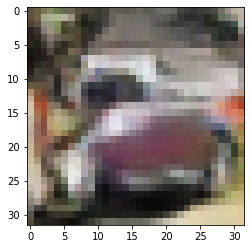

-> Epoch 374, Batch numero 1/78 -> Disc. loss on real images: 0.12014, Disc. loss on fake images: 0.16270, Generator loss: 3.75180
-> Epoch 374, Batch numero 2/78 -> Disc. loss on real images: 0.42298, Disc. loss on fake images: 0.23616, Generator loss: 3.00208
-> Epoch 374, Batch numero 3/78 -> Disc. loss on real images: 0.14535, Disc. loss on fake images: 0.32639, Generator loss: 3.31965
-> Epoch 374, Batch numero 4/78 -> Disc. loss on real images: 0.07798, Disc. loss on fake images: 0.31523, Generator loss: 3.62529
-> Epoch 374, Batch numero 5/78 -> Disc. loss on real images: 0.22507, Disc. loss on fake images: 0.14541, Generator loss: 3.71517
-> Epoch 374, Batch numero 6/78 -> Disc. loss on real images: 0.43638, Disc. loss on fake images: 0.17943, Generator loss: 3.49919
-> Epoch 374, Batch numero 7/78 -> Disc. loss on real images: 0.23869, Disc. loss on fake images: 0.54321, Generator loss: 3.84451
-> Epoch 374, Batch numero 8/78 -> Disc. loss on real images: 0.26981, Disc. loss o

-> Epoch 374, Batch numero 66/78 -> Disc. loss on real images: 0.35032, Disc. loss on fake images: 0.16076, Generator loss: 3.31941
-> Epoch 374, Batch numero 67/78 -> Disc. loss on real images: 0.25019, Disc. loss on fake images: 0.27647, Generator loss: 3.47607
-> Epoch 374, Batch numero 68/78 -> Disc. loss on real images: 0.21586, Disc. loss on fake images: 0.17467, Generator loss: 3.28498
-> Epoch 374, Batch numero 69/78 -> Disc. loss on real images: 0.15544, Disc. loss on fake images: 0.21530, Generator loss: 3.01268
-> Epoch 374, Batch numero 70/78 -> Disc. loss on real images: 0.33209, Disc. loss on fake images: 0.27088, Generator loss: 3.24257
-> Epoch 374, Batch numero 71/78 -> Disc. loss on real images: 0.17021, Disc. loss on fake images: 0.46945, Generator loss: 3.22807
-> Epoch 374, Batch numero 72/78 -> Disc. loss on real images: 0.25238, Disc. loss on fake images: 0.17438, Generator loss: 3.50746
-> Epoch 374, Batch numero 73/78 -> Disc. loss on real images: 0.40242, Disc

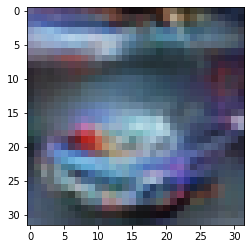

-> Epoch 375, Batch numero 1/78 -> Disc. loss on real images: 0.26385, Disc. loss on fake images: 0.24200, Generator loss: 3.39763
-> Epoch 375, Batch numero 2/78 -> Disc. loss on real images: 0.22751, Disc. loss on fake images: 0.27568, Generator loss: 2.83004
-> Epoch 375, Batch numero 3/78 -> Disc. loss on real images: 0.10906, Disc. loss on fake images: 0.11252, Generator loss: 3.02014
-> Epoch 375, Batch numero 4/78 -> Disc. loss on real images: 0.16575, Disc. loss on fake images: 0.24690, Generator loss: 3.46860
-> Epoch 375, Batch numero 5/78 -> Disc. loss on real images: 0.12973, Disc. loss on fake images: 0.30985, Generator loss: 3.48352
-> Epoch 375, Batch numero 6/78 -> Disc. loss on real images: 0.38573, Disc. loss on fake images: 0.27785, Generator loss: 3.06526
-> Epoch 375, Batch numero 7/78 -> Disc. loss on real images: 0.24910, Disc. loss on fake images: 0.12326, Generator loss: 3.35443
-> Epoch 375, Batch numero 8/78 -> Disc. loss on real images: 0.21393, Disc. loss o

-> Epoch 375, Batch numero 64/78 -> Disc. loss on real images: 0.15728, Disc. loss on fake images: 0.05692, Generator loss: 3.69562
-> Epoch 375, Batch numero 65/78 -> Disc. loss on real images: 0.36389, Disc. loss on fake images: 0.37422, Generator loss: 3.13659
-> Epoch 375, Batch numero 66/78 -> Disc. loss on real images: 0.12041, Disc. loss on fake images: 0.19818, Generator loss: 3.27261
-> Epoch 375, Batch numero 67/78 -> Disc. loss on real images: 0.35285, Disc. loss on fake images: 0.16131, Generator loss: 3.26361
-> Epoch 375, Batch numero 68/78 -> Disc. loss on real images: 0.12795, Disc. loss on fake images: 0.33762, Generator loss: 3.13938
-> Epoch 375, Batch numero 69/78 -> Disc. loss on real images: 0.27580, Disc. loss on fake images: 0.15700, Generator loss: 3.08843
-> Epoch 375, Batch numero 70/78 -> Disc. loss on real images: 0.17810, Disc. loss on fake images: 0.28708, Generator loss: 4.02494
-> Epoch 375, Batch numero 71/78 -> Disc. loss on real images: 0.28169, Disc

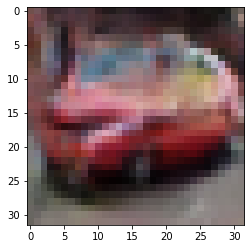

-> Epoch 376, Batch numero 1/78 -> Disc. loss on real images: 0.14824, Disc. loss on fake images: 0.20611, Generator loss: 3.45432
-> Epoch 376, Batch numero 2/78 -> Disc. loss on real images: 0.14512, Disc. loss on fake images: 0.18492, Generator loss: 3.32112
-> Epoch 376, Batch numero 3/78 -> Disc. loss on real images: 0.20262, Disc. loss on fake images: 0.17185, Generator loss: 3.44585
-> Epoch 376, Batch numero 4/78 -> Disc. loss on real images: 0.15484, Disc. loss on fake images: 0.17009, Generator loss: 3.43618
-> Epoch 376, Batch numero 5/78 -> Disc. loss on real images: 0.16132, Disc. loss on fake images: 0.25801, Generator loss: 3.48137
-> Epoch 376, Batch numero 6/78 -> Disc. loss on real images: 0.24047, Disc. loss on fake images: 0.23175, Generator loss: 3.68387
-> Epoch 376, Batch numero 7/78 -> Disc. loss on real images: 0.21312, Disc. loss on fake images: 0.27098, Generator loss: 3.04580
-> Epoch 376, Batch numero 8/78 -> Disc. loss on real images: 0.10329, Disc. loss o

-> Epoch 376, Batch numero 64/78 -> Disc. loss on real images: 0.21340, Disc. loss on fake images: 0.12824, Generator loss: 3.75595
-> Epoch 376, Batch numero 65/78 -> Disc. loss on real images: 0.30002, Disc. loss on fake images: 0.21445, Generator loss: 2.92089
-> Epoch 376, Batch numero 66/78 -> Disc. loss on real images: 0.29688, Disc. loss on fake images: 0.26356, Generator loss: 2.36091
-> Epoch 376, Batch numero 67/78 -> Disc. loss on real images: 0.12512, Disc. loss on fake images: 0.31639, Generator loss: 2.82637
-> Epoch 376, Batch numero 68/78 -> Disc. loss on real images: 0.14347, Disc. loss on fake images: 0.45806, Generator loss: 3.51874
-> Epoch 376, Batch numero 69/78 -> Disc. loss on real images: 0.26435, Disc. loss on fake images: 0.31153, Generator loss: 3.56184
-> Epoch 376, Batch numero 70/78 -> Disc. loss on real images: 0.33808, Disc. loss on fake images: 0.10736, Generator loss: 3.00454
-> Epoch 376, Batch numero 71/78 -> Disc. loss on real images: 0.21058, Disc

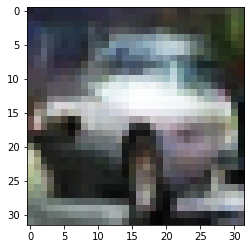

-> Epoch 377, Batch numero 1/78 -> Disc. loss on real images: 0.17272, Disc. loss on fake images: 0.35120, Generator loss: 3.51927
-> Epoch 377, Batch numero 2/78 -> Disc. loss on real images: 0.23865, Disc. loss on fake images: 0.13335, Generator loss: 3.97366
-> Epoch 377, Batch numero 3/78 -> Disc. loss on real images: 0.27388, Disc. loss on fake images: 0.31644, Generator loss: 4.06410
-> Epoch 377, Batch numero 4/78 -> Disc. loss on real images: 0.35389, Disc. loss on fake images: 0.29591, Generator loss: 3.62401
-> Epoch 377, Batch numero 5/78 -> Disc. loss on real images: 0.34360, Disc. loss on fake images: 0.30273, Generator loss: 3.21781
-> Epoch 377, Batch numero 6/78 -> Disc. loss on real images: 0.25099, Disc. loss on fake images: 0.26964, Generator loss: 3.68465
-> Epoch 377, Batch numero 7/78 -> Disc. loss on real images: 0.22120, Disc. loss on fake images: 0.28701, Generator loss: 3.69009
-> Epoch 377, Batch numero 8/78 -> Disc. loss on real images: 0.23187, Disc. loss o

-> Epoch 377, Batch numero 64/78 -> Disc. loss on real images: 0.24445, Disc. loss on fake images: 0.22899, Generator loss: 3.64580
-> Epoch 377, Batch numero 65/78 -> Disc. loss on real images: 0.16420, Disc. loss on fake images: 0.19225, Generator loss: 2.84515
-> Epoch 377, Batch numero 66/78 -> Disc. loss on real images: 0.26821, Disc. loss on fake images: 0.21219, Generator loss: 3.21165
-> Epoch 377, Batch numero 67/78 -> Disc. loss on real images: 0.30532, Disc. loss on fake images: 0.13220, Generator loss: 2.80246
-> Epoch 377, Batch numero 68/78 -> Disc. loss on real images: 0.16545, Disc. loss on fake images: 0.29360, Generator loss: 3.33364
-> Epoch 377, Batch numero 69/78 -> Disc. loss on real images: 0.15609, Disc. loss on fake images: 0.25995, Generator loss: 3.41369
-> Epoch 377, Batch numero 70/78 -> Disc. loss on real images: 0.19917, Disc. loss on fake images: 0.35135, Generator loss: 3.75072
-> Epoch 377, Batch numero 71/78 -> Disc. loss on real images: 0.12443, Disc

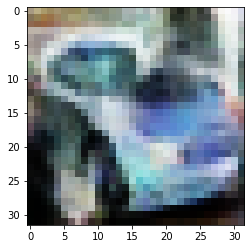

-> Epoch 378, Batch numero 1/78 -> Disc. loss on real images: 0.38182, Disc. loss on fake images: 0.14425, Generator loss: 3.01884
-> Epoch 378, Batch numero 2/78 -> Disc. loss on real images: 0.12504, Disc. loss on fake images: 0.22012, Generator loss: 3.05817
-> Epoch 378, Batch numero 3/78 -> Disc. loss on real images: 0.19721, Disc. loss on fake images: 0.39114, Generator loss: 3.60508
-> Epoch 378, Batch numero 4/78 -> Disc. loss on real images: 0.15318, Disc. loss on fake images: 0.14280, Generator loss: 3.83944
-> Epoch 378, Batch numero 5/78 -> Disc. loss on real images: 0.15002, Disc. loss on fake images: 0.23302, Generator loss: 3.70559
-> Epoch 378, Batch numero 6/78 -> Disc. loss on real images: 0.31891, Disc. loss on fake images: 0.14393, Generator loss: 3.25700
-> Epoch 378, Batch numero 7/78 -> Disc. loss on real images: 0.25307, Disc. loss on fake images: 0.17219, Generator loss: 3.33612
-> Epoch 378, Batch numero 8/78 -> Disc. loss on real images: 0.27761, Disc. loss o

-> Epoch 378, Batch numero 64/78 -> Disc. loss on real images: 0.16778, Disc. loss on fake images: 0.24795, Generator loss: 3.46526
-> Epoch 378, Batch numero 65/78 -> Disc. loss on real images: 0.28065, Disc. loss on fake images: 0.27320, Generator loss: 3.19394
-> Epoch 378, Batch numero 66/78 -> Disc. loss on real images: 0.33985, Disc. loss on fake images: 0.22280, Generator loss: 3.08120
-> Epoch 378, Batch numero 67/78 -> Disc. loss on real images: 0.09073, Disc. loss on fake images: 0.24721, Generator loss: 3.59917
-> Epoch 378, Batch numero 68/78 -> Disc. loss on real images: 0.17279, Disc. loss on fake images: 0.08983, Generator loss: 3.26269
-> Epoch 378, Batch numero 69/78 -> Disc. loss on real images: 0.15043, Disc. loss on fake images: 0.30487, Generator loss: 3.48814
-> Epoch 378, Batch numero 70/78 -> Disc. loss on real images: 0.22346, Disc. loss on fake images: 0.24072, Generator loss: 3.32739
-> Epoch 378, Batch numero 71/78 -> Disc. loss on real images: 0.16966, Disc

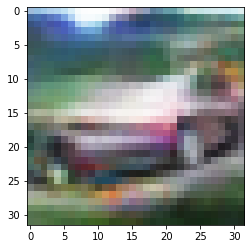

-> Epoch 379, Batch numero 1/78 -> Disc. loss on real images: 0.46691, Disc. loss on fake images: 0.36653, Generator loss: 3.00872
-> Epoch 379, Batch numero 2/78 -> Disc. loss on real images: 0.12620, Disc. loss on fake images: 0.60017, Generator loss: 3.73836
-> Epoch 379, Batch numero 3/78 -> Disc. loss on real images: 0.13596, Disc. loss on fake images: 0.19592, Generator loss: 3.31109
-> Epoch 379, Batch numero 4/78 -> Disc. loss on real images: 0.23668, Disc. loss on fake images: 0.16289, Generator loss: 3.61222
-> Epoch 379, Batch numero 5/78 -> Disc. loss on real images: 0.31564, Disc. loss on fake images: 0.56013, Generator loss: 3.60102
-> Epoch 379, Batch numero 6/78 -> Disc. loss on real images: 0.21716, Disc. loss on fake images: 0.26185, Generator loss: 3.57123
-> Epoch 379, Batch numero 7/78 -> Disc. loss on real images: 0.34403, Disc. loss on fake images: 0.24613, Generator loss: 3.78948
-> Epoch 379, Batch numero 8/78 -> Disc. loss on real images: 0.26685, Disc. loss o

-> Epoch 379, Batch numero 64/78 -> Disc. loss on real images: 0.31945, Disc. loss on fake images: 0.32655, Generator loss: 3.19854
-> Epoch 379, Batch numero 65/78 -> Disc. loss on real images: 0.22993, Disc. loss on fake images: 0.12644, Generator loss: 2.89432
-> Epoch 379, Batch numero 66/78 -> Disc. loss on real images: 0.20569, Disc. loss on fake images: 0.33029, Generator loss: 2.97178
-> Epoch 379, Batch numero 67/78 -> Disc. loss on real images: 0.12116, Disc. loss on fake images: 0.32732, Generator loss: 3.93398
-> Epoch 379, Batch numero 68/78 -> Disc. loss on real images: 0.18597, Disc. loss on fake images: 0.08168, Generator loss: 3.47117
-> Epoch 379, Batch numero 69/78 -> Disc. loss on real images: 0.17743, Disc. loss on fake images: 0.18199, Generator loss: 3.48825
-> Epoch 379, Batch numero 70/78 -> Disc. loss on real images: 0.23520, Disc. loss on fake images: 0.38704, Generator loss: 3.55611
-> Epoch 379, Batch numero 71/78 -> Disc. loss on real images: 0.15345, Disc

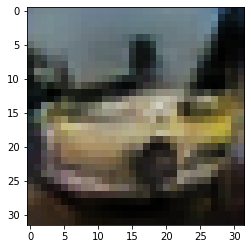

-> Epoch 380, Batch numero 1/78 -> Disc. loss on real images: 0.43208, Disc. loss on fake images: 0.27899, Generator loss: 3.19631
-> Epoch 380, Batch numero 2/78 -> Disc. loss on real images: 0.27860, Disc. loss on fake images: 0.31395, Generator loss: 3.40290
-> Epoch 380, Batch numero 3/78 -> Disc. loss on real images: 0.23194, Disc. loss on fake images: 0.29687, Generator loss: 3.62236
-> Epoch 380, Batch numero 4/78 -> Disc. loss on real images: 0.17385, Disc. loss on fake images: 0.37835, Generator loss: 3.62818
-> Epoch 380, Batch numero 5/78 -> Disc. loss on real images: 0.21838, Disc. loss on fake images: 0.11069, Generator loss: 3.49516
-> Epoch 380, Batch numero 6/78 -> Disc. loss on real images: 0.28087, Disc. loss on fake images: 0.32315, Generator loss: 3.55223
-> Epoch 380, Batch numero 7/78 -> Disc. loss on real images: 0.14462, Disc. loss on fake images: 0.25580, Generator loss: 3.81913
-> Epoch 380, Batch numero 8/78 -> Disc. loss on real images: 0.27282, Disc. loss o

-> Epoch 380, Batch numero 64/78 -> Disc. loss on real images: 0.17076, Disc. loss on fake images: 0.16533, Generator loss: 3.71939
-> Epoch 380, Batch numero 65/78 -> Disc. loss on real images: 0.16668, Disc. loss on fake images: 0.27413, Generator loss: 3.44000
-> Epoch 380, Batch numero 66/78 -> Disc. loss on real images: 0.34255, Disc. loss on fake images: 0.17380, Generator loss: 3.52919
-> Epoch 380, Batch numero 67/78 -> Disc. loss on real images: 0.30483, Disc. loss on fake images: 0.39036, Generator loss: 3.65636
-> Epoch 380, Batch numero 68/78 -> Disc. loss on real images: 0.37110, Disc. loss on fake images: 0.24525, Generator loss: 2.85552
-> Epoch 380, Batch numero 69/78 -> Disc. loss on real images: 0.16079, Disc. loss on fake images: 0.23120, Generator loss: 3.16127
-> Epoch 380, Batch numero 70/78 -> Disc. loss on real images: 0.18914, Disc. loss on fake images: 0.26966, Generator loss: 3.24846
-> Epoch 380, Batch numero 71/78 -> Disc. loss on real images: 0.11501, Disc

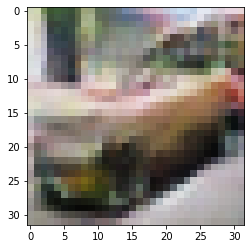

-> Epoch 381, Batch numero 1/78 -> Disc. loss on real images: 0.17238, Disc. loss on fake images: 0.20178, Generator loss: 3.46787
-> Epoch 381, Batch numero 2/78 -> Disc. loss on real images: 0.44791, Disc. loss on fake images: 0.26941, Generator loss: 2.95087
-> Epoch 381, Batch numero 3/78 -> Disc. loss on real images: 0.12443, Disc. loss on fake images: 0.40533, Generator loss: 3.14606
-> Epoch 381, Batch numero 4/78 -> Disc. loss on real images: 0.32648, Disc. loss on fake images: 0.14274, Generator loss: 2.87610
-> Epoch 381, Batch numero 5/78 -> Disc. loss on real images: 0.24531, Disc. loss on fake images: 0.36410, Generator loss: 2.85275
-> Epoch 381, Batch numero 6/78 -> Disc. loss on real images: 0.11273, Disc. loss on fake images: 0.23363, Generator loss: 3.13647
-> Epoch 381, Batch numero 7/78 -> Disc. loss on real images: 0.11765, Disc. loss on fake images: 0.23014, Generator loss: 3.54693
-> Epoch 381, Batch numero 8/78 -> Disc. loss on real images: 0.26951, Disc. loss o

-> Epoch 381, Batch numero 64/78 -> Disc. loss on real images: 0.32646, Disc. loss on fake images: 0.43340, Generator loss: 3.66590
-> Epoch 381, Batch numero 65/78 -> Disc. loss on real images: 0.19397, Disc. loss on fake images: 0.31548, Generator loss: 3.68242
-> Epoch 381, Batch numero 66/78 -> Disc. loss on real images: 0.22582, Disc. loss on fake images: 0.31908, Generator loss: 3.61263
-> Epoch 381, Batch numero 67/78 -> Disc. loss on real images: 0.46808, Disc. loss on fake images: 0.16795, Generator loss: 3.14142
-> Epoch 381, Batch numero 68/78 -> Disc. loss on real images: 0.17969, Disc. loss on fake images: 0.10496, Generator loss: 2.96177
-> Epoch 381, Batch numero 69/78 -> Disc. loss on real images: 0.19650, Disc. loss on fake images: 0.37866, Generator loss: 3.10775
-> Epoch 381, Batch numero 70/78 -> Disc. loss on real images: 0.10236, Disc. loss on fake images: 0.31390, Generator loss: 3.33752
-> Epoch 381, Batch numero 71/78 -> Disc. loss on real images: 0.11856, Disc

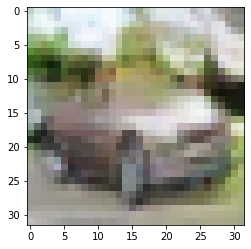

-> Epoch 382, Batch numero 1/78 -> Disc. loss on real images: 0.12262, Disc. loss on fake images: 0.10967, Generator loss: 3.27714
-> Epoch 382, Batch numero 2/78 -> Disc. loss on real images: 0.13771, Disc. loss on fake images: 0.20066, Generator loss: 3.28420
-> Epoch 382, Batch numero 3/78 -> Disc. loss on real images: 0.16375, Disc. loss on fake images: 0.25833, Generator loss: 3.05569
-> Epoch 382, Batch numero 4/78 -> Disc. loss on real images: 0.17055, Disc. loss on fake images: 0.10698, Generator loss: 3.09717
-> Epoch 382, Batch numero 5/78 -> Disc. loss on real images: 0.32465, Disc. loss on fake images: 0.34335, Generator loss: 3.28465
-> Epoch 382, Batch numero 6/78 -> Disc. loss on real images: 0.10752, Disc. loss on fake images: 0.17924, Generator loss: 3.65591
-> Epoch 382, Batch numero 7/78 -> Disc. loss on real images: 0.33296, Disc. loss on fake images: 0.15452, Generator loss: 3.36874
-> Epoch 382, Batch numero 8/78 -> Disc. loss on real images: 0.20627, Disc. loss o

-> Epoch 382, Batch numero 65/78 -> Disc. loss on real images: 0.20252, Disc. loss on fake images: 0.41812, Generator loss: 3.92915
-> Epoch 382, Batch numero 66/78 -> Disc. loss on real images: 0.12412, Disc. loss on fake images: 0.28824, Generator loss: 4.17301
-> Epoch 382, Batch numero 67/78 -> Disc. loss on real images: 0.52005, Disc. loss on fake images: 0.13190, Generator loss: 2.97141
-> Epoch 382, Batch numero 68/78 -> Disc. loss on real images: 0.18320, Disc. loss on fake images: 0.30156, Generator loss: 2.96067
-> Epoch 382, Batch numero 69/78 -> Disc. loss on real images: 0.16393, Disc. loss on fake images: 0.29400, Generator loss: 3.31432
-> Epoch 382, Batch numero 70/78 -> Disc. loss on real images: 0.34528, Disc. loss on fake images: 0.17267, Generator loss: 3.37967
-> Epoch 382, Batch numero 71/78 -> Disc. loss on real images: 0.21931, Disc. loss on fake images: 0.19132, Generator loss: 3.31067
-> Epoch 382, Batch numero 72/78 -> Disc. loss on real images: 0.12390, Disc

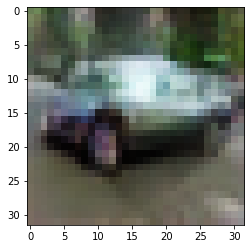

-> Epoch 383, Batch numero 1/78 -> Disc. loss on real images: 0.19546, Disc. loss on fake images: 0.10725, Generator loss: 3.65425
-> Epoch 383, Batch numero 2/78 -> Disc. loss on real images: 0.27401, Disc. loss on fake images: 0.29841, Generator loss: 3.76993
-> Epoch 383, Batch numero 3/78 -> Disc. loss on real images: 0.20789, Disc. loss on fake images: 0.25110, Generator loss: 3.52656
-> Epoch 383, Batch numero 4/78 -> Disc. loss on real images: 0.22747, Disc. loss on fake images: 0.22577, Generator loss: 3.61488
-> Epoch 383, Batch numero 5/78 -> Disc. loss on real images: 0.25642, Disc. loss on fake images: 0.19322, Generator loss: 3.28384
-> Epoch 383, Batch numero 6/78 -> Disc. loss on real images: 0.16668, Disc. loss on fake images: 0.18399, Generator loss: 2.97047
-> Epoch 383, Batch numero 7/78 -> Disc. loss on real images: 0.10884, Disc. loss on fake images: 0.16063, Generator loss: 3.02938
-> Epoch 383, Batch numero 8/78 -> Disc. loss on real images: 0.10080, Disc. loss o

-> Epoch 383, Batch numero 66/78 -> Disc. loss on real images: 0.15636, Disc. loss on fake images: 0.08904, Generator loss: 3.43108
-> Epoch 383, Batch numero 67/78 -> Disc. loss on real images: 0.34156, Disc. loss on fake images: 0.29355, Generator loss: 3.02604
-> Epoch 383, Batch numero 68/78 -> Disc. loss on real images: 0.07042, Disc. loss on fake images: 0.16440, Generator loss: 3.23158
-> Epoch 383, Batch numero 69/78 -> Disc. loss on real images: 0.13686, Disc. loss on fake images: 0.23731, Generator loss: 3.09326
-> Epoch 383, Batch numero 70/78 -> Disc. loss on real images: 0.21724, Disc. loss on fake images: 0.15434, Generator loss: 3.46319
-> Epoch 383, Batch numero 71/78 -> Disc. loss on real images: 0.06430, Disc. loss on fake images: 0.24997, Generator loss: 4.18391
-> Epoch 383, Batch numero 72/78 -> Disc. loss on real images: 0.20826, Disc. loss on fake images: 0.20069, Generator loss: 3.78925
-> Epoch 383, Batch numero 73/78 -> Disc. loss on real images: 0.16602, Disc

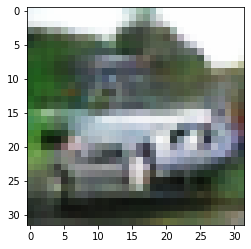

-> Epoch 384, Batch numero 1/78 -> Disc. loss on real images: 0.22593, Disc. loss on fake images: 0.08263, Generator loss: 3.76412
-> Epoch 384, Batch numero 2/78 -> Disc. loss on real images: 0.16189, Disc. loss on fake images: 0.23820, Generator loss: 3.41170
-> Epoch 384, Batch numero 3/78 -> Disc. loss on real images: 0.23487, Disc. loss on fake images: 0.27030, Generator loss: 2.96390
-> Epoch 384, Batch numero 4/78 -> Disc. loss on real images: 0.30267, Disc. loss on fake images: 0.28583, Generator loss: 3.12744
-> Epoch 384, Batch numero 5/78 -> Disc. loss on real images: 0.21280, Disc. loss on fake images: 0.39042, Generator loss: 3.76435
-> Epoch 384, Batch numero 6/78 -> Disc. loss on real images: 0.26912, Disc. loss on fake images: 0.09823, Generator loss: 3.51389
-> Epoch 384, Batch numero 7/78 -> Disc. loss on real images: 0.15047, Disc. loss on fake images: 0.19778, Generator loss: 3.30476
-> Epoch 384, Batch numero 8/78 -> Disc. loss on real images: 0.28736, Disc. loss o

-> Epoch 384, Batch numero 64/78 -> Disc. loss on real images: 0.25412, Disc. loss on fake images: 0.35031, Generator loss: 4.02018
-> Epoch 384, Batch numero 65/78 -> Disc. loss on real images: 0.37012, Disc. loss on fake images: 0.16704, Generator loss: 3.88495
-> Epoch 384, Batch numero 66/78 -> Disc. loss on real images: 0.19103, Disc. loss on fake images: 0.16960, Generator loss: 3.66518
-> Epoch 384, Batch numero 67/78 -> Disc. loss on real images: 0.20051, Disc. loss on fake images: 0.30751, Generator loss: 3.65752
-> Epoch 384, Batch numero 68/78 -> Disc. loss on real images: 0.13121, Disc. loss on fake images: 0.18716, Generator loss: 3.67164
-> Epoch 384, Batch numero 69/78 -> Disc. loss on real images: 0.27198, Disc. loss on fake images: 0.29478, Generator loss: 3.71972
-> Epoch 384, Batch numero 70/78 -> Disc. loss on real images: 0.20740, Disc. loss on fake images: 0.19166, Generator loss: 3.87573
-> Epoch 384, Batch numero 71/78 -> Disc. loss on real images: 0.15450, Disc

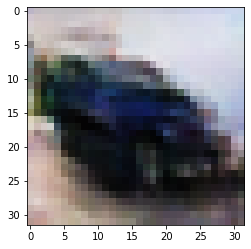

-> Epoch 385, Batch numero 1/78 -> Disc. loss on real images: 0.16180, Disc. loss on fake images: 0.30109, Generator loss: 4.23994
-> Epoch 385, Batch numero 2/78 -> Disc. loss on real images: 0.22371, Disc. loss on fake images: 0.04539, Generator loss: 3.82833
-> Epoch 385, Batch numero 3/78 -> Disc. loss on real images: 0.22125, Disc. loss on fake images: 0.21042, Generator loss: 3.71436
-> Epoch 385, Batch numero 4/78 -> Disc. loss on real images: 0.17034, Disc. loss on fake images: 0.08918, Generator loss: 3.35166
-> Epoch 385, Batch numero 5/78 -> Disc. loss on real images: 0.13411, Disc. loss on fake images: 0.19166, Generator loss: 3.13839
-> Epoch 385, Batch numero 6/78 -> Disc. loss on real images: 0.17609, Disc. loss on fake images: 0.34182, Generator loss: 2.99714
-> Epoch 385, Batch numero 7/78 -> Disc. loss on real images: 0.32489, Disc. loss on fake images: 0.12088, Generator loss: 3.36012
-> Epoch 385, Batch numero 8/78 -> Disc. loss on real images: 0.19416, Disc. loss o

-> Epoch 385, Batch numero 64/78 -> Disc. loss on real images: 0.39158, Disc. loss on fake images: 0.10292, Generator loss: 3.34809
-> Epoch 385, Batch numero 65/78 -> Disc. loss on real images: 0.26989, Disc. loss on fake images: 0.36072, Generator loss: 3.14493
-> Epoch 385, Batch numero 66/78 -> Disc. loss on real images: 0.26191, Disc. loss on fake images: 0.30719, Generator loss: 3.03651
-> Epoch 385, Batch numero 67/78 -> Disc. loss on real images: 0.11967, Disc. loss on fake images: 0.37374, Generator loss: 3.87421
-> Epoch 385, Batch numero 68/78 -> Disc. loss on real images: 0.17874, Disc. loss on fake images: 0.17626, Generator loss: 3.56014
-> Epoch 385, Batch numero 69/78 -> Disc. loss on real images: 0.40464, Disc. loss on fake images: 0.20263, Generator loss: 3.72161
-> Epoch 385, Batch numero 70/78 -> Disc. loss on real images: 0.16521, Disc. loss on fake images: 0.16161, Generator loss: 3.57194
-> Epoch 385, Batch numero 71/78 -> Disc. loss on real images: 0.48794, Disc

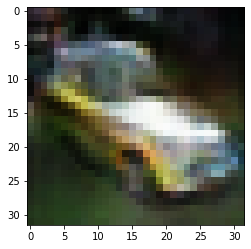

-> Epoch 386, Batch numero 1/78 -> Disc. loss on real images: 0.21943, Disc. loss on fake images: 0.12386, Generator loss: 3.44335
-> Epoch 386, Batch numero 2/78 -> Disc. loss on real images: 0.24093, Disc. loss on fake images: 0.16850, Generator loss: 3.90219
-> Epoch 386, Batch numero 3/78 -> Disc. loss on real images: 0.08923, Disc. loss on fake images: 0.28469, Generator loss: 3.73460
-> Epoch 386, Batch numero 4/78 -> Disc. loss on real images: 0.25491, Disc. loss on fake images: 0.17313, Generator loss: 4.12937
-> Epoch 386, Batch numero 5/78 -> Disc. loss on real images: 0.30250, Disc. loss on fake images: 0.17136, Generator loss: 2.98968
-> Epoch 386, Batch numero 6/78 -> Disc. loss on real images: 0.15935, Disc. loss on fake images: 0.38220, Generator loss: 3.78308
-> Epoch 386, Batch numero 7/78 -> Disc. loss on real images: 0.22246, Disc. loss on fake images: 0.36350, Generator loss: 3.65657
-> Epoch 386, Batch numero 8/78 -> Disc. loss on real images: 0.37084, Disc. loss o

-> Epoch 386, Batch numero 64/78 -> Disc. loss on real images: 0.14051, Disc. loss on fake images: 0.44089, Generator loss: 3.64354
-> Epoch 386, Batch numero 65/78 -> Disc. loss on real images: 0.27636, Disc. loss on fake images: 0.25292, Generator loss: 4.08063
-> Epoch 386, Batch numero 66/78 -> Disc. loss on real images: 0.28097, Disc. loss on fake images: 0.13963, Generator loss: 2.99956
-> Epoch 386, Batch numero 67/78 -> Disc. loss on real images: 0.16521, Disc. loss on fake images: 0.27864, Generator loss: 3.53799
-> Epoch 386, Batch numero 68/78 -> Disc. loss on real images: 0.12844, Disc. loss on fake images: 0.10286, Generator loss: 3.75839
-> Epoch 386, Batch numero 69/78 -> Disc. loss on real images: 0.10335, Disc. loss on fake images: 0.21470, Generator loss: 3.65001
-> Epoch 386, Batch numero 70/78 -> Disc. loss on real images: 0.23440, Disc. loss on fake images: 0.39384, Generator loss: 3.59490
-> Epoch 386, Batch numero 71/78 -> Disc. loss on real images: 0.29522, Disc

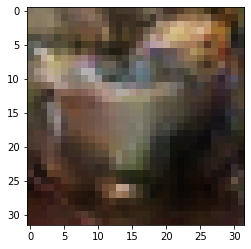

-> Epoch 387, Batch numero 1/78 -> Disc. loss on real images: 0.23312, Disc. loss on fake images: 0.24274, Generator loss: 3.54275
-> Epoch 387, Batch numero 2/78 -> Disc. loss on real images: 0.11796, Disc. loss on fake images: 0.17416, Generator loss: 3.58665
-> Epoch 387, Batch numero 3/78 -> Disc. loss on real images: 0.14697, Disc. loss on fake images: 0.26132, Generator loss: 3.98102
-> Epoch 387, Batch numero 4/78 -> Disc. loss on real images: 0.26284, Disc. loss on fake images: 0.18442, Generator loss: 3.44952
-> Epoch 387, Batch numero 5/78 -> Disc. loss on real images: 0.25905, Disc. loss on fake images: 0.18885, Generator loss: 3.53365
-> Epoch 387, Batch numero 6/78 -> Disc. loss on real images: 0.08635, Disc. loss on fake images: 0.22492, Generator loss: 3.92802
-> Epoch 387, Batch numero 7/78 -> Disc. loss on real images: 0.16059, Disc. loss on fake images: 0.14642, Generator loss: 3.94499
-> Epoch 387, Batch numero 8/78 -> Disc. loss on real images: 0.28821, Disc. loss o

-> Epoch 387, Batch numero 64/78 -> Disc. loss on real images: 0.18016, Disc. loss on fake images: 0.38392, Generator loss: 3.89764
-> Epoch 387, Batch numero 65/78 -> Disc. loss on real images: 0.10662, Disc. loss on fake images: 0.08922, Generator loss: 4.55170
-> Epoch 387, Batch numero 66/78 -> Disc. loss on real images: 0.20260, Disc. loss on fake images: 0.05964, Generator loss: 3.60695
-> Epoch 387, Batch numero 67/78 -> Disc. loss on real images: 0.24083, Disc. loss on fake images: 0.16597, Generator loss: 2.58482
-> Epoch 387, Batch numero 68/78 -> Disc. loss on real images: 0.17136, Disc. loss on fake images: 0.21553, Generator loss: 3.42406
-> Epoch 387, Batch numero 69/78 -> Disc. loss on real images: 0.17789, Disc. loss on fake images: 0.22433, Generator loss: 3.63996
-> Epoch 387, Batch numero 70/78 -> Disc. loss on real images: 0.17516, Disc. loss on fake images: 0.21707, Generator loss: 4.25420
-> Epoch 387, Batch numero 71/78 -> Disc. loss on real images: 0.30878, Disc

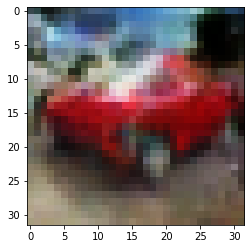

-> Epoch 388, Batch numero 1/78 -> Disc. loss on real images: 0.18956, Disc. loss on fake images: 0.29377, Generator loss: 4.10375
-> Epoch 388, Batch numero 2/78 -> Disc. loss on real images: 0.24460, Disc. loss on fake images: 0.11530, Generator loss: 3.45051
-> Epoch 388, Batch numero 3/78 -> Disc. loss on real images: 0.30568, Disc. loss on fake images: 0.23189, Generator loss: 3.40406
-> Epoch 388, Batch numero 4/78 -> Disc. loss on real images: 0.37226, Disc. loss on fake images: 0.21941, Generator loss: 2.98558
-> Epoch 388, Batch numero 5/78 -> Disc. loss on real images: 0.20508, Disc. loss on fake images: 0.41932, Generator loss: 3.45541
-> Epoch 388, Batch numero 6/78 -> Disc. loss on real images: 0.23219, Disc. loss on fake images: 0.18334, Generator loss: 3.37200
-> Epoch 388, Batch numero 7/78 -> Disc. loss on real images: 0.18156, Disc. loss on fake images: 0.16936, Generator loss: 3.46584
-> Epoch 388, Batch numero 8/78 -> Disc. loss on real images: 0.19612, Disc. loss o

-> Epoch 388, Batch numero 64/78 -> Disc. loss on real images: 0.13215, Disc. loss on fake images: 0.24286, Generator loss: 3.74463
-> Epoch 388, Batch numero 65/78 -> Disc. loss on real images: 0.18050, Disc. loss on fake images: 0.25767, Generator loss: 3.95552
-> Epoch 388, Batch numero 66/78 -> Disc. loss on real images: 0.40207, Disc. loss on fake images: 0.29498, Generator loss: 3.81221
-> Epoch 388, Batch numero 67/78 -> Disc. loss on real images: 0.21370, Disc. loss on fake images: 0.34343, Generator loss: 3.74171
-> Epoch 388, Batch numero 68/78 -> Disc. loss on real images: 0.26153, Disc. loss on fake images: 0.19771, Generator loss: 3.48249
-> Epoch 388, Batch numero 69/78 -> Disc. loss on real images: 0.57320, Disc. loss on fake images: 0.55795, Generator loss: 3.45684
-> Epoch 388, Batch numero 70/78 -> Disc. loss on real images: 0.16121, Disc. loss on fake images: 0.06305, Generator loss: 3.61784
-> Epoch 388, Batch numero 71/78 -> Disc. loss on real images: 0.18733, Disc

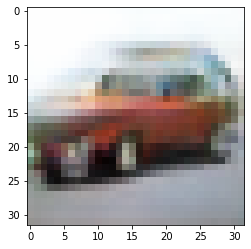

-> Epoch 389, Batch numero 1/78 -> Disc. loss on real images: 0.21509, Disc. loss on fake images: 0.20607, Generator loss: 4.07377
-> Epoch 389, Batch numero 2/78 -> Disc. loss on real images: 0.17742, Disc. loss on fake images: 0.12425, Generator loss: 3.48332
-> Epoch 389, Batch numero 3/78 -> Disc. loss on real images: 0.19678, Disc. loss on fake images: 0.18395, Generator loss: 3.22311
-> Epoch 389, Batch numero 4/78 -> Disc. loss on real images: 0.13654, Disc. loss on fake images: 0.18979, Generator loss: 2.94230
-> Epoch 389, Batch numero 5/78 -> Disc. loss on real images: 0.16114, Disc. loss on fake images: 0.23207, Generator loss: 3.16214
-> Epoch 389, Batch numero 6/78 -> Disc. loss on real images: 0.24374, Disc. loss on fake images: 0.30569, Generator loss: 3.00232
-> Epoch 389, Batch numero 7/78 -> Disc. loss on real images: 0.22493, Disc. loss on fake images: 0.23112, Generator loss: 3.15596
-> Epoch 389, Batch numero 8/78 -> Disc. loss on real images: 0.12579, Disc. loss o

-> Epoch 389, Batch numero 64/78 -> Disc. loss on real images: 0.13367, Disc. loss on fake images: 0.13574, Generator loss: 3.69949
-> Epoch 389, Batch numero 65/78 -> Disc. loss on real images: 0.32855, Disc. loss on fake images: 0.12638, Generator loss: 3.51117
-> Epoch 389, Batch numero 66/78 -> Disc. loss on real images: 0.15658, Disc. loss on fake images: 0.50199, Generator loss: 3.28518
-> Epoch 389, Batch numero 67/78 -> Disc. loss on real images: 0.22336, Disc. loss on fake images: 0.15864, Generator loss: 3.71498
-> Epoch 389, Batch numero 68/78 -> Disc. loss on real images: 0.30177, Disc. loss on fake images: 0.32831, Generator loss: 3.89304
-> Epoch 389, Batch numero 69/78 -> Disc. loss on real images: 0.27716, Disc. loss on fake images: 0.32796, Generator loss: 2.65897
-> Epoch 389, Batch numero 70/78 -> Disc. loss on real images: 0.20450, Disc. loss on fake images: 0.19963, Generator loss: 3.80674
-> Epoch 389, Batch numero 71/78 -> Disc. loss on real images: 0.34268, Disc

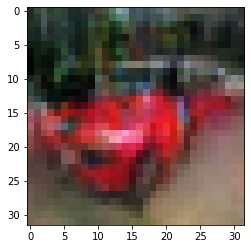

-> Epoch 390, Batch numero 1/78 -> Disc. loss on real images: 0.25006, Disc. loss on fake images: 0.43243, Generator loss: 3.60157
-> Epoch 390, Batch numero 2/78 -> Disc. loss on real images: 0.38638, Disc. loss on fake images: 0.17300, Generator loss: 3.04275
-> Epoch 390, Batch numero 3/78 -> Disc. loss on real images: 0.11138, Disc. loss on fake images: 0.04950, Generator loss: 2.80854
-> Epoch 390, Batch numero 4/78 -> Disc. loss on real images: 0.08032, Disc. loss on fake images: 0.32974, Generator loss: 3.51509
-> Epoch 390, Batch numero 5/78 -> Disc. loss on real images: 0.14397, Disc. loss on fake images: 0.23330, Generator loss: 3.77417
-> Epoch 390, Batch numero 6/78 -> Disc. loss on real images: 0.17242, Disc. loss on fake images: 0.13811, Generator loss: 3.49596
-> Epoch 390, Batch numero 7/78 -> Disc. loss on real images: 0.32445, Disc. loss on fake images: 0.21984, Generator loss: 3.58415
-> Epoch 390, Batch numero 8/78 -> Disc. loss on real images: 0.11405, Disc. loss o

-> Epoch 390, Batch numero 66/78 -> Disc. loss on real images: 0.24818, Disc. loss on fake images: 0.29564, Generator loss: 3.63691
-> Epoch 390, Batch numero 67/78 -> Disc. loss on real images: 0.19802, Disc. loss on fake images: 0.34727, Generator loss: 3.49038
-> Epoch 390, Batch numero 68/78 -> Disc. loss on real images: 0.20251, Disc. loss on fake images: 0.19818, Generator loss: 3.81697
-> Epoch 390, Batch numero 69/78 -> Disc. loss on real images: 0.30978, Disc. loss on fake images: 0.36082, Generator loss: 3.66846
-> Epoch 390, Batch numero 70/78 -> Disc. loss on real images: 0.37498, Disc. loss on fake images: 0.11392, Generator loss: 3.01894
-> Epoch 390, Batch numero 71/78 -> Disc. loss on real images: 0.12074, Disc. loss on fake images: 0.38883, Generator loss: 3.05393
-> Epoch 390, Batch numero 72/78 -> Disc. loss on real images: 0.20317, Disc. loss on fake images: 0.31388, Generator loss: 3.79311
-> Epoch 390, Batch numero 73/78 -> Disc. loss on real images: 0.16117, Disc

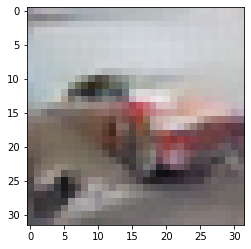

-> Epoch 391, Batch numero 1/78 -> Disc. loss on real images: 0.31300, Disc. loss on fake images: 0.20436, Generator loss: 3.30412
-> Epoch 391, Batch numero 2/78 -> Disc. loss on real images: 0.08806, Disc. loss on fake images: 0.29860, Generator loss: 3.48424
-> Epoch 391, Batch numero 3/78 -> Disc. loss on real images: 0.13141, Disc. loss on fake images: 0.20506, Generator loss: 3.63545
-> Epoch 391, Batch numero 4/78 -> Disc. loss on real images: 0.19007, Disc. loss on fake images: 0.17609, Generator loss: 4.01926
-> Epoch 391, Batch numero 5/78 -> Disc. loss on real images: 0.27142, Disc. loss on fake images: 0.10319, Generator loss: 3.62762
-> Epoch 391, Batch numero 6/78 -> Disc. loss on real images: 0.14145, Disc. loss on fake images: 0.19943, Generator loss: 3.41810
-> Epoch 391, Batch numero 7/78 -> Disc. loss on real images: 0.07233, Disc. loss on fake images: 0.14720, Generator loss: 3.49746
-> Epoch 391, Batch numero 8/78 -> Disc. loss on real images: 0.14393, Disc. loss o

-> Epoch 391, Batch numero 65/78 -> Disc. loss on real images: 0.29681, Disc. loss on fake images: 0.13380, Generator loss: 3.92948
-> Epoch 391, Batch numero 66/78 -> Disc. loss on real images: 0.29725, Disc. loss on fake images: 0.28013, Generator loss: 4.04185
-> Epoch 391, Batch numero 67/78 -> Disc. loss on real images: 0.26616, Disc. loss on fake images: 0.36455, Generator loss: 3.33496
-> Epoch 391, Batch numero 68/78 -> Disc. loss on real images: 0.24097, Disc. loss on fake images: 0.23841, Generator loss: 3.92846
-> Epoch 391, Batch numero 69/78 -> Disc. loss on real images: 0.24778, Disc. loss on fake images: 0.13082, Generator loss: 3.27424
-> Epoch 391, Batch numero 70/78 -> Disc. loss on real images: 0.15559, Disc. loss on fake images: 0.39712, Generator loss: 3.57838
-> Epoch 391, Batch numero 71/78 -> Disc. loss on real images: 0.21649, Disc. loss on fake images: 0.20023, Generator loss: 3.39424
-> Epoch 391, Batch numero 72/78 -> Disc. loss on real images: 0.15706, Disc

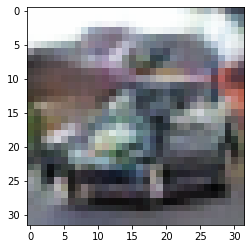

-> Epoch 392, Batch numero 1/78 -> Disc. loss on real images: 0.16875, Disc. loss on fake images: 0.10163, Generator loss: 3.72356
-> Epoch 392, Batch numero 2/78 -> Disc. loss on real images: 0.14653, Disc. loss on fake images: 0.34264, Generator loss: 3.19517
-> Epoch 392, Batch numero 3/78 -> Disc. loss on real images: 0.28703, Disc. loss on fake images: 0.28611, Generator loss: 3.49053
-> Epoch 392, Batch numero 4/78 -> Disc. loss on real images: 0.29826, Disc. loss on fake images: 0.19320, Generator loss: 3.28936
-> Epoch 392, Batch numero 5/78 -> Disc. loss on real images: 0.30687, Disc. loss on fake images: 0.36289, Generator loss: 3.08751
-> Epoch 392, Batch numero 6/78 -> Disc. loss on real images: 0.18020, Disc. loss on fake images: 0.50176, Generator loss: 3.38226
-> Epoch 392, Batch numero 7/78 -> Disc. loss on real images: 0.14095, Disc. loss on fake images: 0.22510, Generator loss: 3.82971
-> Epoch 392, Batch numero 8/78 -> Disc. loss on real images: 0.37198, Disc. loss o

-> Epoch 392, Batch numero 66/78 -> Disc. loss on real images: 0.11107, Disc. loss on fake images: 0.20057, Generator loss: 3.48884
-> Epoch 392, Batch numero 67/78 -> Disc. loss on real images: 0.12168, Disc. loss on fake images: 0.40285, Generator loss: 4.26303
-> Epoch 392, Batch numero 68/78 -> Disc. loss on real images: 0.19350, Disc. loss on fake images: 0.12609, Generator loss: 4.39509
-> Epoch 392, Batch numero 69/78 -> Disc. loss on real images: 0.24578, Disc. loss on fake images: 0.23299, Generator loss: 3.94616
-> Epoch 392, Batch numero 70/78 -> Disc. loss on real images: 0.33375, Disc. loss on fake images: 0.44050, Generator loss: 3.92519
-> Epoch 392, Batch numero 71/78 -> Disc. loss on real images: 0.12036, Disc. loss on fake images: 0.12530, Generator loss: 3.50373
-> Epoch 392, Batch numero 72/78 -> Disc. loss on real images: 0.40482, Disc. loss on fake images: 0.22695, Generator loss: 3.62009
-> Epoch 392, Batch numero 73/78 -> Disc. loss on real images: 0.21300, Disc

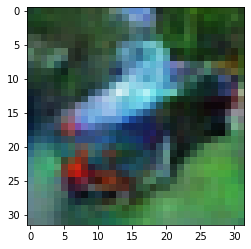

-> Epoch 393, Batch numero 1/78 -> Disc. loss on real images: 0.16596, Disc. loss on fake images: 0.49208, Generator loss: 3.67944
-> Epoch 393, Batch numero 2/78 -> Disc. loss on real images: 0.20530, Disc. loss on fake images: 0.15581, Generator loss: 3.13869
-> Epoch 393, Batch numero 3/78 -> Disc. loss on real images: 0.11313, Disc. loss on fake images: 0.05392, Generator loss: 3.68010
-> Epoch 393, Batch numero 4/78 -> Disc. loss on real images: 0.14242, Disc. loss on fake images: 0.33619, Generator loss: 3.57800
-> Epoch 393, Batch numero 5/78 -> Disc. loss on real images: 0.55063, Disc. loss on fake images: 0.22416, Generator loss: 3.48820
-> Epoch 393, Batch numero 6/78 -> Disc. loss on real images: 0.18428, Disc. loss on fake images: 0.14486, Generator loss: 3.24200
-> Epoch 393, Batch numero 7/78 -> Disc. loss on real images: 0.24439, Disc. loss on fake images: 0.32151, Generator loss: 3.46704
-> Epoch 393, Batch numero 8/78 -> Disc. loss on real images: 0.10587, Disc. loss o

-> Epoch 393, Batch numero 64/78 -> Disc. loss on real images: 0.12519, Disc. loss on fake images: 0.16120, Generator loss: 3.15055
-> Epoch 393, Batch numero 65/78 -> Disc. loss on real images: 0.19043, Disc. loss on fake images: 0.45808, Generator loss: 3.85324
-> Epoch 393, Batch numero 66/78 -> Disc. loss on real images: 0.31357, Disc. loss on fake images: 0.06389, Generator loss: 3.78089
-> Epoch 393, Batch numero 67/78 -> Disc. loss on real images: 0.26715, Disc. loss on fake images: 0.32949, Generator loss: 3.19297
-> Epoch 393, Batch numero 68/78 -> Disc. loss on real images: 0.17395, Disc. loss on fake images: 0.55741, Generator loss: 3.55701
-> Epoch 393, Batch numero 69/78 -> Disc. loss on real images: 0.25123, Disc. loss on fake images: 0.10818, Generator loss: 4.27380
-> Epoch 393, Batch numero 70/78 -> Disc. loss on real images: 0.20390, Disc. loss on fake images: 0.18824, Generator loss: 3.53682
-> Epoch 393, Batch numero 71/78 -> Disc. loss on real images: 0.26001, Disc

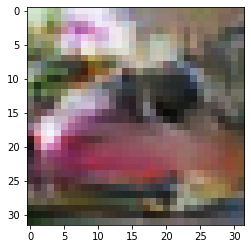

-> Epoch 394, Batch numero 1/78 -> Disc. loss on real images: 0.18873, Disc. loss on fake images: 0.19728, Generator loss: 3.43842
-> Epoch 394, Batch numero 2/78 -> Disc. loss on real images: 0.22688, Disc. loss on fake images: 0.28044, Generator loss: 3.54873
-> Epoch 394, Batch numero 3/78 -> Disc. loss on real images: 0.26644, Disc. loss on fake images: 0.28516, Generator loss: 3.59860
-> Epoch 394, Batch numero 4/78 -> Disc. loss on real images: 0.35532, Disc. loss on fake images: 0.39329, Generator loss: 3.13531
-> Epoch 394, Batch numero 5/78 -> Disc. loss on real images: 0.22875, Disc. loss on fake images: 0.31012, Generator loss: 3.40176
-> Epoch 394, Batch numero 6/78 -> Disc. loss on real images: 0.20715, Disc. loss on fake images: 0.05278, Generator loss: 3.58389
-> Epoch 394, Batch numero 7/78 -> Disc. loss on real images: 0.33462, Disc. loss on fake images: 0.19355, Generator loss: 2.99109
-> Epoch 394, Batch numero 8/78 -> Disc. loss on real images: 0.07375, Disc. loss o

-> Epoch 394, Batch numero 64/78 -> Disc. loss on real images: 0.16667, Disc. loss on fake images: 0.24360, Generator loss: 3.20593
-> Epoch 394, Batch numero 65/78 -> Disc. loss on real images: 0.22239, Disc. loss on fake images: 0.21919, Generator loss: 3.43650
-> Epoch 394, Batch numero 66/78 -> Disc. loss on real images: 0.14075, Disc. loss on fake images: 0.29486, Generator loss: 4.07286
-> Epoch 394, Batch numero 67/78 -> Disc. loss on real images: 0.21754, Disc. loss on fake images: 0.18217, Generator loss: 4.01225
-> Epoch 394, Batch numero 68/78 -> Disc. loss on real images: 0.23900, Disc. loss on fake images: 0.19504, Generator loss: 3.38677
-> Epoch 394, Batch numero 69/78 -> Disc. loss on real images: 0.34350, Disc. loss on fake images: 0.29164, Generator loss: 3.33932
-> Epoch 394, Batch numero 70/78 -> Disc. loss on real images: 0.18198, Disc. loss on fake images: 0.33273, Generator loss: 3.78060
-> Epoch 394, Batch numero 71/78 -> Disc. loss on real images: 0.20887, Disc

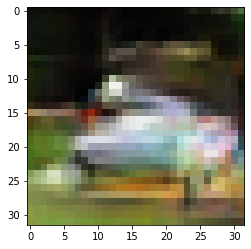

-> Epoch 395, Batch numero 1/78 -> Disc. loss on real images: 0.20282, Disc. loss on fake images: 0.26755, Generator loss: 3.74799
-> Epoch 395, Batch numero 2/78 -> Disc. loss on real images: 0.40676, Disc. loss on fake images: 0.24457, Generator loss: 3.34464
-> Epoch 395, Batch numero 3/78 -> Disc. loss on real images: 0.10162, Disc. loss on fake images: 0.15925, Generator loss: 3.45835
-> Epoch 395, Batch numero 4/78 -> Disc. loss on real images: 0.18459, Disc. loss on fake images: 0.15057, Generator loss: 3.70666
-> Epoch 395, Batch numero 5/78 -> Disc. loss on real images: 0.17156, Disc. loss on fake images: 0.23619, Generator loss: 3.09782
-> Epoch 395, Batch numero 6/78 -> Disc. loss on real images: 0.23893, Disc. loss on fake images: 0.16082, Generator loss: 3.24491
-> Epoch 395, Batch numero 7/78 -> Disc. loss on real images: 0.09772, Disc. loss on fake images: 0.19573, Generator loss: 3.74221
-> Epoch 395, Batch numero 8/78 -> Disc. loss on real images: 0.15755, Disc. loss o

-> Epoch 395, Batch numero 64/78 -> Disc. loss on real images: 0.17736, Disc. loss on fake images: 0.33899, Generator loss: 3.23813
-> Epoch 395, Batch numero 65/78 -> Disc. loss on real images: 0.30893, Disc. loss on fake images: 0.43571, Generator loss: 3.59297
-> Epoch 395, Batch numero 66/78 -> Disc. loss on real images: 0.21871, Disc. loss on fake images: 0.11416, Generator loss: 3.73417
-> Epoch 395, Batch numero 67/78 -> Disc. loss on real images: 0.20610, Disc. loss on fake images: 0.11120, Generator loss: 3.40053
-> Epoch 395, Batch numero 68/78 -> Disc. loss on real images: 0.07797, Disc. loss on fake images: 0.31181, Generator loss: 3.65161
-> Epoch 395, Batch numero 69/78 -> Disc. loss on real images: 0.21534, Disc. loss on fake images: 0.22581, Generator loss: 3.84715
-> Epoch 395, Batch numero 70/78 -> Disc. loss on real images: 0.14279, Disc. loss on fake images: 0.15232, Generator loss: 4.02190
-> Epoch 395, Batch numero 71/78 -> Disc. loss on real images: 0.31446, Disc

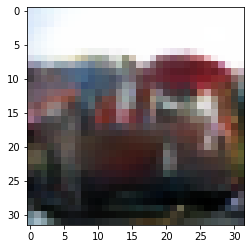

-> Epoch 396, Batch numero 1/78 -> Disc. loss on real images: 0.24412, Disc. loss on fake images: 0.22769, Generator loss: 3.75929
-> Epoch 396, Batch numero 2/78 -> Disc. loss on real images: 0.27799, Disc. loss on fake images: 0.26232, Generator loss: 3.43967
-> Epoch 396, Batch numero 3/78 -> Disc. loss on real images: 0.04546, Disc. loss on fake images: 0.29821, Generator loss: 3.36250
-> Epoch 396, Batch numero 4/78 -> Disc. loss on real images: 0.30816, Disc. loss on fake images: 0.18492, Generator loss: 3.38982
-> Epoch 396, Batch numero 5/78 -> Disc. loss on real images: 0.33988, Disc. loss on fake images: 0.15248, Generator loss: 3.06154
-> Epoch 396, Batch numero 6/78 -> Disc. loss on real images: 0.09830, Disc. loss on fake images: 0.20577, Generator loss: 3.47988
-> Epoch 396, Batch numero 7/78 -> Disc. loss on real images: 0.25644, Disc. loss on fake images: 0.14893, Generator loss: 3.11980
-> Epoch 396, Batch numero 8/78 -> Disc. loss on real images: 0.18703, Disc. loss o

-> Epoch 396, Batch numero 64/78 -> Disc. loss on real images: 0.09542, Disc. loss on fake images: 0.43803, Generator loss: 3.82978
-> Epoch 396, Batch numero 65/78 -> Disc. loss on real images: 0.19288, Disc. loss on fake images: 0.11298, Generator loss: 3.52925
-> Epoch 396, Batch numero 66/78 -> Disc. loss on real images: 0.31874, Disc. loss on fake images: 0.15665, Generator loss: 3.74545
-> Epoch 396, Batch numero 67/78 -> Disc. loss on real images: 0.10907, Disc. loss on fake images: 0.20623, Generator loss: 3.30857
-> Epoch 396, Batch numero 68/78 -> Disc. loss on real images: 0.20294, Disc. loss on fake images: 0.27399, Generator loss: 3.55504
-> Epoch 396, Batch numero 69/78 -> Disc. loss on real images: 0.29491, Disc. loss on fake images: 0.16091, Generator loss: 3.74318
-> Epoch 396, Batch numero 70/78 -> Disc. loss on real images: 0.25505, Disc. loss on fake images: 0.17450, Generator loss: 3.35324
-> Epoch 396, Batch numero 71/78 -> Disc. loss on real images: 0.30625, Disc

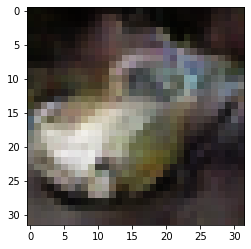

-> Epoch 397, Batch numero 1/78 -> Disc. loss on real images: 0.16101, Disc. loss on fake images: 0.35362, Generator loss: 4.27594
-> Epoch 397, Batch numero 2/78 -> Disc. loss on real images: 0.23144, Disc. loss on fake images: 0.30283, Generator loss: 3.80502
-> Epoch 397, Batch numero 3/78 -> Disc. loss on real images: 0.30257, Disc. loss on fake images: 0.08251, Generator loss: 3.52980
-> Epoch 397, Batch numero 4/78 -> Disc. loss on real images: 0.27381, Disc. loss on fake images: 0.47603, Generator loss: 3.61104
-> Epoch 397, Batch numero 5/78 -> Disc. loss on real images: 0.36521, Disc. loss on fake images: 0.13633, Generator loss: 3.12896
-> Epoch 397, Batch numero 6/78 -> Disc. loss on real images: 0.20385, Disc. loss on fake images: 0.42034, Generator loss: 3.67049
-> Epoch 397, Batch numero 7/78 -> Disc. loss on real images: 0.17337, Disc. loss on fake images: 0.10984, Generator loss: 3.63436
-> Epoch 397, Batch numero 8/78 -> Disc. loss on real images: 0.35285, Disc. loss o

-> Epoch 397, Batch numero 64/78 -> Disc. loss on real images: 0.16402, Disc. loss on fake images: 0.29756, Generator loss: 4.11244
-> Epoch 397, Batch numero 65/78 -> Disc. loss on real images: 0.31686, Disc. loss on fake images: 0.42824, Generator loss: 3.60587
-> Epoch 397, Batch numero 66/78 -> Disc. loss on real images: 0.26393, Disc. loss on fake images: 0.05070, Generator loss: 3.11900
-> Epoch 397, Batch numero 67/78 -> Disc. loss on real images: 0.08938, Disc. loss on fake images: 0.31621, Generator loss: 3.22532
-> Epoch 397, Batch numero 68/78 -> Disc. loss on real images: 0.16182, Disc. loss on fake images: 0.35684, Generator loss: 3.71898
-> Epoch 397, Batch numero 69/78 -> Disc. loss on real images: 0.14604, Disc. loss on fake images: 0.18463, Generator loss: 3.67154
-> Epoch 397, Batch numero 70/78 -> Disc. loss on real images: 0.37891, Disc. loss on fake images: 0.23255, Generator loss: 3.46360
-> Epoch 397, Batch numero 71/78 -> Disc. loss on real images: 0.19597, Disc

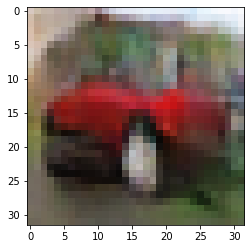

-> Epoch 398, Batch numero 1/78 -> Disc. loss on real images: 0.16637, Disc. loss on fake images: 0.36795, Generator loss: 3.92786
-> Epoch 398, Batch numero 2/78 -> Disc. loss on real images: 0.14861, Disc. loss on fake images: 0.29965, Generator loss: 3.89983
-> Epoch 398, Batch numero 3/78 -> Disc. loss on real images: 0.23066, Disc. loss on fake images: 0.36505, Generator loss: 4.54446
-> Epoch 398, Batch numero 4/78 -> Disc. loss on real images: 0.28048, Disc. loss on fake images: 0.24973, Generator loss: 4.07756
-> Epoch 398, Batch numero 5/78 -> Disc. loss on real images: 0.29217, Disc. loss on fake images: 0.20200, Generator loss: 3.08027
-> Epoch 398, Batch numero 6/78 -> Disc. loss on real images: 0.36061, Disc. loss on fake images: 0.10189, Generator loss: 3.48174
-> Epoch 398, Batch numero 7/78 -> Disc. loss on real images: 0.24172, Disc. loss on fake images: 0.19642, Generator loss: 3.39293
-> Epoch 398, Batch numero 8/78 -> Disc. loss on real images: 0.08346, Disc. loss o

-> Epoch 398, Batch numero 64/78 -> Disc. loss on real images: 0.22339, Disc. loss on fake images: 0.24983, Generator loss: 3.10277
-> Epoch 398, Batch numero 65/78 -> Disc. loss on real images: 0.20835, Disc. loss on fake images: 0.22850, Generator loss: 3.08237
-> Epoch 398, Batch numero 66/78 -> Disc. loss on real images: 0.14266, Disc. loss on fake images: 0.44326, Generator loss: 3.15726
-> Epoch 398, Batch numero 67/78 -> Disc. loss on real images: 0.23297, Disc. loss on fake images: 0.23677, Generator loss: 4.21627
-> Epoch 398, Batch numero 68/78 -> Disc. loss on real images: 0.16605, Disc. loss on fake images: 0.12066, Generator loss: 3.07484
-> Epoch 398, Batch numero 69/78 -> Disc. loss on real images: 0.43557, Disc. loss on fake images: 0.27224, Generator loss: 3.14128
-> Epoch 398, Batch numero 70/78 -> Disc. loss on real images: 0.05790, Disc. loss on fake images: 0.52641, Generator loss: 3.50520
-> Epoch 398, Batch numero 71/78 -> Disc. loss on real images: 0.28224, Disc

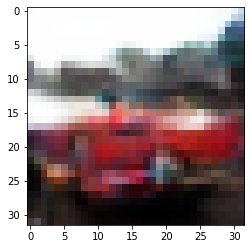

-> Epoch 399, Batch numero 1/78 -> Disc. loss on real images: 0.16916, Disc. loss on fake images: 0.32796, Generator loss: 3.71962
-> Epoch 399, Batch numero 2/78 -> Disc. loss on real images: 0.15273, Disc. loss on fake images: 0.29841, Generator loss: 4.23058
-> Epoch 399, Batch numero 3/78 -> Disc. loss on real images: 0.25534, Disc. loss on fake images: 0.09821, Generator loss: 3.45146
-> Epoch 399, Batch numero 4/78 -> Disc. loss on real images: 0.26545, Disc. loss on fake images: 0.58784, Generator loss: 3.85493
-> Epoch 399, Batch numero 5/78 -> Disc. loss on real images: 0.19072, Disc. loss on fake images: 0.21839, Generator loss: 3.88594
-> Epoch 399, Batch numero 6/78 -> Disc. loss on real images: 0.13851, Disc. loss on fake images: 0.19421, Generator loss: 3.66541
-> Epoch 399, Batch numero 7/78 -> Disc. loss on real images: 0.19671, Disc. loss on fake images: 0.23826, Generator loss: 3.26272
-> Epoch 399, Batch numero 8/78 -> Disc. loss on real images: 0.23849, Disc. loss o

-> Epoch 399, Batch numero 64/78 -> Disc. loss on real images: 0.17869, Disc. loss on fake images: 0.17844, Generator loss: 4.73663
-> Epoch 399, Batch numero 65/78 -> Disc. loss on real images: 0.29258, Disc. loss on fake images: 0.14109, Generator loss: 3.22342
-> Epoch 399, Batch numero 66/78 -> Disc. loss on real images: 0.15309, Disc. loss on fake images: 0.17953, Generator loss: 3.30551
-> Epoch 399, Batch numero 67/78 -> Disc. loss on real images: 0.11505, Disc. loss on fake images: 0.21446, Generator loss: 4.01330
-> Epoch 399, Batch numero 68/78 -> Disc. loss on real images: 0.13644, Disc. loss on fake images: 0.11024, Generator loss: 3.55965
-> Epoch 399, Batch numero 69/78 -> Disc. loss on real images: 0.23475, Disc. loss on fake images: 0.33716, Generator loss: 3.59364
-> Epoch 399, Batch numero 70/78 -> Disc. loss on real images: 0.22019, Disc. loss on fake images: 0.26801, Generator loss: 3.97181
-> Epoch 399, Batch numero 71/78 -> Disc. loss on real images: 0.33607, Disc

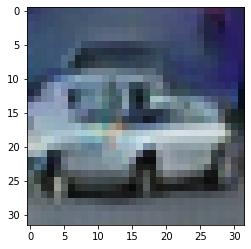

-> Epoch 400, Batch numero 1/78 -> Disc. loss on real images: 0.14215, Disc. loss on fake images: 0.21611, Generator loss: 3.45201
-> Epoch 400, Batch numero 2/78 -> Disc. loss on real images: 0.14479, Disc. loss on fake images: 0.17885, Generator loss: 3.85559
-> Epoch 400, Batch numero 3/78 -> Disc. loss on real images: 0.21099, Disc. loss on fake images: 0.14641, Generator loss: 3.56612
-> Epoch 400, Batch numero 4/78 -> Disc. loss on real images: 0.11265, Disc. loss on fake images: 0.22928, Generator loss: 4.05944
-> Epoch 400, Batch numero 5/78 -> Disc. loss on real images: 0.11825, Disc. loss on fake images: 0.31608, Generator loss: 4.06903
-> Epoch 400, Batch numero 6/78 -> Disc. loss on real images: 0.25975, Disc. loss on fake images: 0.20940, Generator loss: 3.67567
-> Epoch 400, Batch numero 7/78 -> Disc. loss on real images: 0.16235, Disc. loss on fake images: 0.37314, Generator loss: 2.98541
-> Epoch 400, Batch numero 8/78 -> Disc. loss on real images: 0.28111, Disc. loss o

-> Epoch 400, Batch numero 64/78 -> Disc. loss on real images: 0.18287, Disc. loss on fake images: 0.17606, Generator loss: 3.71956
-> Epoch 400, Batch numero 65/78 -> Disc. loss on real images: 0.20224, Disc. loss on fake images: 0.09495, Generator loss: 3.60591
-> Epoch 400, Batch numero 66/78 -> Disc. loss on real images: 0.14723, Disc. loss on fake images: 0.23586, Generator loss: 3.97693
-> Epoch 400, Batch numero 67/78 -> Disc. loss on real images: 0.20381, Disc. loss on fake images: 0.22743, Generator loss: 3.25603
-> Epoch 400, Batch numero 68/78 -> Disc. loss on real images: 0.17981, Disc. loss on fake images: 0.20493, Generator loss: 2.91462
-> Epoch 400, Batch numero 69/78 -> Disc. loss on real images: 0.36551, Disc. loss on fake images: 0.21130, Generator loss: 2.97587
-> Epoch 400, Batch numero 70/78 -> Disc. loss on real images: 0.06813, Disc. loss on fake images: 0.12804, Generator loss: 3.08984
-> Epoch 400, Batch numero 71/78 -> Disc. loss on real images: 0.10283, Disc

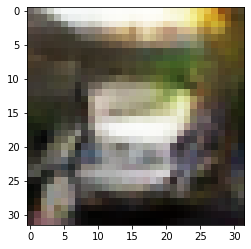

-> Epoch 401, Batch numero 1/78 -> Disc. loss on real images: 0.12826, Disc. loss on fake images: 0.27495, Generator loss: 3.63864
-> Epoch 401, Batch numero 2/78 -> Disc. loss on real images: 0.22825, Disc. loss on fake images: 0.15844, Generator loss: 4.05408
-> Epoch 401, Batch numero 3/78 -> Disc. loss on real images: 0.13433, Disc. loss on fake images: 0.12199, Generator loss: 3.69717
-> Epoch 401, Batch numero 4/78 -> Disc. loss on real images: 0.50741, Disc. loss on fake images: 0.32350, Generator loss: 3.58730
-> Epoch 401, Batch numero 5/78 -> Disc. loss on real images: 0.12661, Disc. loss on fake images: 0.30806, Generator loss: 3.32689
-> Epoch 401, Batch numero 6/78 -> Disc. loss on real images: 0.19614, Disc. loss on fake images: 0.31823, Generator loss: 3.87548
-> Epoch 401, Batch numero 7/78 -> Disc. loss on real images: 0.26049, Disc. loss on fake images: 0.30264, Generator loss: 4.03841
-> Epoch 401, Batch numero 8/78 -> Disc. loss on real images: 0.27448, Disc. loss o

-> Epoch 401, Batch numero 66/78 -> Disc. loss on real images: 0.24244, Disc. loss on fake images: 0.46075, Generator loss: 3.84597
-> Epoch 401, Batch numero 67/78 -> Disc. loss on real images: 0.33528, Disc. loss on fake images: 0.23588, Generator loss: 3.87761
-> Epoch 401, Batch numero 68/78 -> Disc. loss on real images: 0.13506, Disc. loss on fake images: 0.36563, Generator loss: 3.90301
-> Epoch 401, Batch numero 69/78 -> Disc. loss on real images: 0.40683, Disc. loss on fake images: 0.12236, Generator loss: 3.75803
-> Epoch 401, Batch numero 70/78 -> Disc. loss on real images: 0.17505, Disc. loss on fake images: 0.23514, Generator loss: 3.95502
-> Epoch 401, Batch numero 71/78 -> Disc. loss on real images: 0.33210, Disc. loss on fake images: 0.22188, Generator loss: 3.29335
-> Epoch 401, Batch numero 72/78 -> Disc. loss on real images: 0.11874, Disc. loss on fake images: 0.27679, Generator loss: 3.99354
-> Epoch 401, Batch numero 73/78 -> Disc. loss on real images: 0.33186, Disc

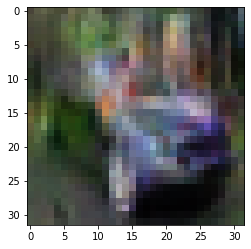

-> Epoch 402, Batch numero 1/78 -> Disc. loss on real images: 0.42883, Disc. loss on fake images: 0.18128, Generator loss: 3.50756
-> Epoch 402, Batch numero 2/78 -> Disc. loss on real images: 0.18881, Disc. loss on fake images: 0.09963, Generator loss: 3.23801
-> Epoch 402, Batch numero 3/78 -> Disc. loss on real images: 0.03688, Disc. loss on fake images: 0.36217, Generator loss: 4.15270
-> Epoch 402, Batch numero 4/78 -> Disc. loss on real images: 0.11343, Disc. loss on fake images: 0.09877, Generator loss: 4.02756
-> Epoch 402, Batch numero 5/78 -> Disc. loss on real images: 0.13629, Disc. loss on fake images: 0.04721, Generator loss: 4.36990
-> Epoch 402, Batch numero 6/78 -> Disc. loss on real images: 0.31266, Disc. loss on fake images: 0.30524, Generator loss: 3.48101
-> Epoch 402, Batch numero 7/78 -> Disc. loss on real images: 0.17728, Disc. loss on fake images: 0.15886, Generator loss: 3.99418
-> Epoch 402, Batch numero 8/78 -> Disc. loss on real images: 0.23785, Disc. loss o

-> Epoch 402, Batch numero 64/78 -> Disc. loss on real images: 0.08452, Disc. loss on fake images: 0.14851, Generator loss: 3.48870
-> Epoch 402, Batch numero 65/78 -> Disc. loss on real images: 0.16951, Disc. loss on fake images: 0.10994, Generator loss: 3.26212
-> Epoch 402, Batch numero 66/78 -> Disc. loss on real images: 0.12833, Disc. loss on fake images: 0.30071, Generator loss: 3.25844
-> Epoch 402, Batch numero 67/78 -> Disc. loss on real images: 0.23276, Disc. loss on fake images: 0.16654, Generator loss: 3.01007
-> Epoch 402, Batch numero 68/78 -> Disc. loss on real images: 0.07953, Disc. loss on fake images: 0.17454, Generator loss: 3.77348
-> Epoch 402, Batch numero 69/78 -> Disc. loss on real images: 0.23426, Disc. loss on fake images: 0.25737, Generator loss: 3.68081
-> Epoch 402, Batch numero 70/78 -> Disc. loss on real images: 0.29236, Disc. loss on fake images: 0.12293, Generator loss: 3.92279
-> Epoch 402, Batch numero 71/78 -> Disc. loss on real images: 0.16422, Disc

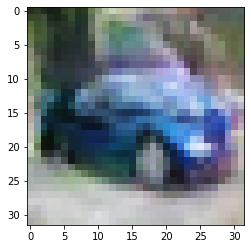

-> Epoch 403, Batch numero 1/78 -> Disc. loss on real images: 0.18610, Disc. loss on fake images: 0.10296, Generator loss: 3.23148
-> Epoch 403, Batch numero 2/78 -> Disc. loss on real images: 0.05840, Disc. loss on fake images: 0.32873, Generator loss: 3.97215
-> Epoch 403, Batch numero 3/78 -> Disc. loss on real images: 0.33819, Disc. loss on fake images: 0.28208, Generator loss: 4.02931
-> Epoch 403, Batch numero 4/78 -> Disc. loss on real images: 0.12076, Disc. loss on fake images: 0.16874, Generator loss: 4.03589
-> Epoch 403, Batch numero 5/78 -> Disc. loss on real images: 0.27136, Disc. loss on fake images: 0.28417, Generator loss: 3.55332
-> Epoch 403, Batch numero 6/78 -> Disc. loss on real images: 0.26373, Disc. loss on fake images: 0.31737, Generator loss: 4.06451
-> Epoch 403, Batch numero 7/78 -> Disc. loss on real images: 0.14371, Disc. loss on fake images: 0.21772, Generator loss: 3.74406
-> Epoch 403, Batch numero 8/78 -> Disc. loss on real images: 0.34472, Disc. loss o

-> Epoch 403, Batch numero 64/78 -> Disc. loss on real images: 0.12978, Disc. loss on fake images: 0.21099, Generator loss: 3.64084
-> Epoch 403, Batch numero 65/78 -> Disc. loss on real images: 0.21412, Disc. loss on fake images: 0.21096, Generator loss: 4.22949
-> Epoch 403, Batch numero 66/78 -> Disc. loss on real images: 0.25927, Disc. loss on fake images: 0.22542, Generator loss: 3.29752
-> Epoch 403, Batch numero 67/78 -> Disc. loss on real images: 0.39019, Disc. loss on fake images: 0.35301, Generator loss: 3.59550
-> Epoch 403, Batch numero 68/78 -> Disc. loss on real images: 0.15647, Disc. loss on fake images: 0.17785, Generator loss: 3.67108
-> Epoch 403, Batch numero 69/78 -> Disc. loss on real images: 0.16876, Disc. loss on fake images: 0.28275, Generator loss: 4.24503
-> Epoch 403, Batch numero 70/78 -> Disc. loss on real images: 0.22269, Disc. loss on fake images: 0.09007, Generator loss: 3.75731
-> Epoch 403, Batch numero 71/78 -> Disc. loss on real images: 0.37736, Disc

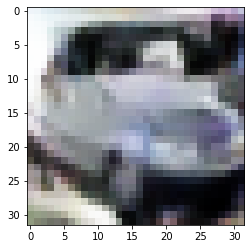

-> Epoch 404, Batch numero 1/78 -> Disc. loss on real images: 0.27518, Disc. loss on fake images: 0.18850, Generator loss: 3.14235
-> Epoch 404, Batch numero 2/78 -> Disc. loss on real images: 0.19937, Disc. loss on fake images: 0.17829, Generator loss: 3.39070
-> Epoch 404, Batch numero 3/78 -> Disc. loss on real images: 0.16330, Disc. loss on fake images: 0.28050, Generator loss: 3.26290
-> Epoch 404, Batch numero 4/78 -> Disc. loss on real images: 0.18523, Disc. loss on fake images: 0.17692, Generator loss: 3.81161
-> Epoch 404, Batch numero 5/78 -> Disc. loss on real images: 0.21426, Disc. loss on fake images: 0.30496, Generator loss: 3.69278
-> Epoch 404, Batch numero 6/78 -> Disc. loss on real images: 0.24279, Disc. loss on fake images: 0.09214, Generator loss: 3.83041
-> Epoch 404, Batch numero 7/78 -> Disc. loss on real images: 0.09357, Disc. loss on fake images: 0.43093, Generator loss: 3.66405
-> Epoch 404, Batch numero 8/78 -> Disc. loss on real images: 0.21508, Disc. loss o

-> Epoch 404, Batch numero 64/78 -> Disc. loss on real images: 0.05392, Disc. loss on fake images: 0.20376, Generator loss: 3.22140
-> Epoch 404, Batch numero 65/78 -> Disc. loss on real images: 0.08455, Disc. loss on fake images: 0.38021, Generator loss: 3.78821
-> Epoch 404, Batch numero 66/78 -> Disc. loss on real images: 0.31887, Disc. loss on fake images: 0.13790, Generator loss: 3.75074
-> Epoch 404, Batch numero 67/78 -> Disc. loss on real images: 0.35808, Disc. loss on fake images: 0.34472, Generator loss: 3.73112
-> Epoch 404, Batch numero 68/78 -> Disc. loss on real images: 0.11530, Disc. loss on fake images: 0.08643, Generator loss: 3.39344
-> Epoch 404, Batch numero 69/78 -> Disc. loss on real images: 0.14931, Disc. loss on fake images: 0.35304, Generator loss: 3.54384
-> Epoch 404, Batch numero 70/78 -> Disc. loss on real images: 0.41998, Disc. loss on fake images: 0.12459, Generator loss: 3.50739
-> Epoch 404, Batch numero 71/78 -> Disc. loss on real images: 0.13172, Disc

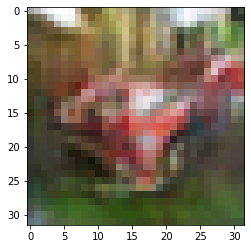

-> Epoch 405, Batch numero 1/78 -> Disc. loss on real images: 0.08725, Disc. loss on fake images: 0.21972, Generator loss: 4.17955
-> Epoch 405, Batch numero 2/78 -> Disc. loss on real images: 0.16603, Disc. loss on fake images: 0.15974, Generator loss: 4.13314
-> Epoch 405, Batch numero 3/78 -> Disc. loss on real images: 0.28446, Disc. loss on fake images: 0.16866, Generator loss: 3.64980
-> Epoch 405, Batch numero 4/78 -> Disc. loss on real images: 0.16100, Disc. loss on fake images: 0.14080, Generator loss: 3.79350
-> Epoch 405, Batch numero 5/78 -> Disc. loss on real images: 0.09536, Disc. loss on fake images: 0.23939, Generator loss: 3.54480
-> Epoch 405, Batch numero 6/78 -> Disc. loss on real images: 0.30784, Disc. loss on fake images: 0.23066, Generator loss: 3.66005
-> Epoch 405, Batch numero 7/78 -> Disc. loss on real images: 0.20180, Disc. loss on fake images: 0.24316, Generator loss: 3.79001
-> Epoch 405, Batch numero 8/78 -> Disc. loss on real images: 0.25922, Disc. loss o

-> Epoch 405, Batch numero 64/78 -> Disc. loss on real images: 0.04015, Disc. loss on fake images: 0.17619, Generator loss: 3.55104
-> Epoch 405, Batch numero 65/78 -> Disc. loss on real images: 0.24147, Disc. loss on fake images: 0.21944, Generator loss: 3.58604
-> Epoch 405, Batch numero 66/78 -> Disc. loss on real images: 0.11219, Disc. loss on fake images: 0.13790, Generator loss: 3.86503
-> Epoch 405, Batch numero 67/78 -> Disc. loss on real images: 0.21586, Disc. loss on fake images: 0.18658, Generator loss: 3.01525
-> Epoch 405, Batch numero 68/78 -> Disc. loss on real images: 0.12035, Disc. loss on fake images: 0.06232, Generator loss: 3.34687
-> Epoch 405, Batch numero 69/78 -> Disc. loss on real images: 0.15302, Disc. loss on fake images: 0.24926, Generator loss: 3.79075
-> Epoch 405, Batch numero 70/78 -> Disc. loss on real images: 0.23133, Disc. loss on fake images: 0.36164, Generator loss: 4.19364
-> Epoch 405, Batch numero 71/78 -> Disc. loss on real images: 0.16593, Disc

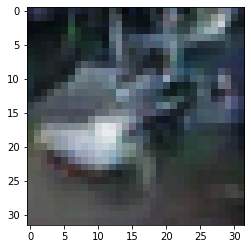

-> Epoch 406, Batch numero 1/78 -> Disc. loss on real images: 0.13818, Disc. loss on fake images: 0.33856, Generator loss: 3.93941
-> Epoch 406, Batch numero 2/78 -> Disc. loss on real images: 0.19474, Disc. loss on fake images: 0.19357, Generator loss: 3.97121
-> Epoch 406, Batch numero 3/78 -> Disc. loss on real images: 0.32757, Disc. loss on fake images: 0.16637, Generator loss: 3.24718
-> Epoch 406, Batch numero 4/78 -> Disc. loss on real images: 0.22929, Disc. loss on fake images: 0.08068, Generator loss: 2.89962
-> Epoch 406, Batch numero 5/78 -> Disc. loss on real images: 0.09497, Disc. loss on fake images: 0.46471, Generator loss: 3.76464
-> Epoch 406, Batch numero 6/78 -> Disc. loss on real images: 0.22253, Disc. loss on fake images: 0.26322, Generator loss: 3.60929
-> Epoch 406, Batch numero 7/78 -> Disc. loss on real images: 0.13279, Disc. loss on fake images: 0.38370, Generator loss: 3.77758
-> Epoch 406, Batch numero 8/78 -> Disc. loss on real images: 0.10842, Disc. loss o

-> Epoch 406, Batch numero 64/78 -> Disc. loss on real images: 0.12665, Disc. loss on fake images: 0.14569, Generator loss: 3.84600
-> Epoch 406, Batch numero 65/78 -> Disc. loss on real images: 0.24141, Disc. loss on fake images: 0.17780, Generator loss: 3.10300
-> Epoch 406, Batch numero 66/78 -> Disc. loss on real images: 0.14609, Disc. loss on fake images: 0.60542, Generator loss: 3.44596
-> Epoch 406, Batch numero 67/78 -> Disc. loss on real images: 0.14233, Disc. loss on fake images: 0.18860, Generator loss: 3.95714
-> Epoch 406, Batch numero 68/78 -> Disc. loss on real images: 0.20801, Disc. loss on fake images: 0.23507, Generator loss: 3.98479
-> Epoch 406, Batch numero 69/78 -> Disc. loss on real images: 0.25729, Disc. loss on fake images: 0.11767, Generator loss: 3.61967
-> Epoch 406, Batch numero 70/78 -> Disc. loss on real images: 0.32098, Disc. loss on fake images: 0.23288, Generator loss: 3.33337
-> Epoch 406, Batch numero 71/78 -> Disc. loss on real images: 0.12329, Disc

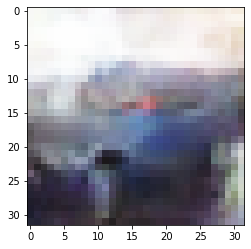

-> Epoch 407, Batch numero 1/78 -> Disc. loss on real images: 0.15164, Disc. loss on fake images: 0.17396, Generator loss: 4.32177
-> Epoch 407, Batch numero 2/78 -> Disc. loss on real images: 0.30913, Disc. loss on fake images: 0.12070, Generator loss: 4.15806
-> Epoch 407, Batch numero 3/78 -> Disc. loss on real images: 0.11038, Disc. loss on fake images: 0.36504, Generator loss: 4.50426
-> Epoch 407, Batch numero 4/78 -> Disc. loss on real images: 0.11583, Disc. loss on fake images: 0.27524, Generator loss: 3.95710
-> Epoch 407, Batch numero 5/78 -> Disc. loss on real images: 0.26509, Disc. loss on fake images: 0.08387, Generator loss: 3.74374
-> Epoch 407, Batch numero 6/78 -> Disc. loss on real images: 0.09896, Disc. loss on fake images: 0.17174, Generator loss: 3.77075
-> Epoch 407, Batch numero 7/78 -> Disc. loss on real images: 0.25870, Disc. loss on fake images: 0.23954, Generator loss: 4.38241
-> Epoch 407, Batch numero 8/78 -> Disc. loss on real images: 0.21899, Disc. loss o

-> Epoch 407, Batch numero 64/78 -> Disc. loss on real images: 0.15761, Disc. loss on fake images: 0.22108, Generator loss: 3.36542
-> Epoch 407, Batch numero 65/78 -> Disc. loss on real images: 0.05898, Disc. loss on fake images: 0.32922, Generator loss: 3.87822
-> Epoch 407, Batch numero 66/78 -> Disc. loss on real images: 0.51088, Disc. loss on fake images: 0.16520, Generator loss: 3.61972
-> Epoch 407, Batch numero 67/78 -> Disc. loss on real images: 0.23233, Disc. loss on fake images: 0.13376, Generator loss: 3.07281
-> Epoch 407, Batch numero 68/78 -> Disc. loss on real images: 0.11102, Disc. loss on fake images: 0.24114, Generator loss: 3.17156
-> Epoch 407, Batch numero 69/78 -> Disc. loss on real images: 0.22019, Disc. loss on fake images: 0.36189, Generator loss: 3.88085
-> Epoch 407, Batch numero 70/78 -> Disc. loss on real images: 0.32079, Disc. loss on fake images: 0.34072, Generator loss: 3.27844
-> Epoch 407, Batch numero 71/78 -> Disc. loss on real images: 0.13325, Disc

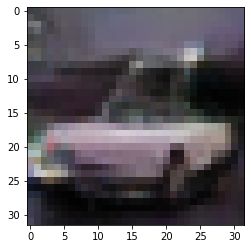

-> Epoch 408, Batch numero 1/78 -> Disc. loss on real images: 0.14975, Disc. loss on fake images: 0.15493, Generator loss: 4.34302
-> Epoch 408, Batch numero 2/78 -> Disc. loss on real images: 0.23465, Disc. loss on fake images: 0.37663, Generator loss: 3.92244
-> Epoch 408, Batch numero 3/78 -> Disc. loss on real images: 0.21115, Disc. loss on fake images: 0.18660, Generator loss: 3.41073
-> Epoch 408, Batch numero 4/78 -> Disc. loss on real images: 0.12898, Disc. loss on fake images: 0.41340, Generator loss: 4.05530
-> Epoch 408, Batch numero 5/78 -> Disc. loss on real images: 0.32216, Disc. loss on fake images: 0.18165, Generator loss: 3.53281
-> Epoch 408, Batch numero 6/78 -> Disc. loss on real images: 0.18788, Disc. loss on fake images: 0.15712, Generator loss: 3.73410
-> Epoch 408, Batch numero 7/78 -> Disc. loss on real images: 0.19259, Disc. loss on fake images: 0.13000, Generator loss: 3.68642
-> Epoch 408, Batch numero 8/78 -> Disc. loss on real images: 0.35187, Disc. loss o

-> Epoch 408, Batch numero 64/78 -> Disc. loss on real images: 0.11982, Disc. loss on fake images: 0.20785, Generator loss: 3.76168
-> Epoch 408, Batch numero 65/78 -> Disc. loss on real images: 0.28119, Disc. loss on fake images: 0.42433, Generator loss: 3.17815
-> Epoch 408, Batch numero 66/78 -> Disc. loss on real images: 0.09820, Disc. loss on fake images: 0.25849, Generator loss: 3.61520
-> Epoch 408, Batch numero 67/78 -> Disc. loss on real images: 0.31171, Disc. loss on fake images: 0.36659, Generator loss: 4.13843
-> Epoch 408, Batch numero 68/78 -> Disc. loss on real images: 0.28389, Disc. loss on fake images: 0.15602, Generator loss: 3.51153
-> Epoch 408, Batch numero 69/78 -> Disc. loss on real images: 0.16692, Disc. loss on fake images: 0.31947, Generator loss: 3.88522
-> Epoch 408, Batch numero 70/78 -> Disc. loss on real images: 0.37110, Disc. loss on fake images: 0.20505, Generator loss: 3.93414
-> Epoch 408, Batch numero 71/78 -> Disc. loss on real images: 0.13018, Disc

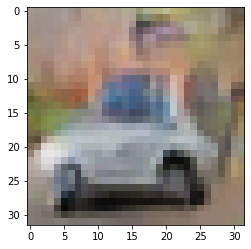

-> Epoch 409, Batch numero 1/78 -> Disc. loss on real images: 0.19705, Disc. loss on fake images: 0.09529, Generator loss: 3.71043
-> Epoch 409, Batch numero 2/78 -> Disc. loss on real images: 0.19311, Disc. loss on fake images: 0.17048, Generator loss: 3.59105
-> Epoch 409, Batch numero 3/78 -> Disc. loss on real images: 0.14761, Disc. loss on fake images: 0.29367, Generator loss: 3.68329
-> Epoch 409, Batch numero 4/78 -> Disc. loss on real images: 0.12388, Disc. loss on fake images: 0.21470, Generator loss: 4.02649
-> Epoch 409, Batch numero 5/78 -> Disc. loss on real images: 0.21088, Disc. loss on fake images: 0.25068, Generator loss: 4.05112
-> Epoch 409, Batch numero 6/78 -> Disc. loss on real images: 0.38508, Disc. loss on fake images: 0.27821, Generator loss: 3.24277
-> Epoch 409, Batch numero 7/78 -> Disc. loss on real images: 0.20190, Disc. loss on fake images: 0.71229, Generator loss: 3.27532
-> Epoch 409, Batch numero 8/78 -> Disc. loss on real images: 0.23996, Disc. loss o

-> Epoch 409, Batch numero 64/78 -> Disc. loss on real images: 0.21184, Disc. loss on fake images: 0.20635, Generator loss: 4.00402
-> Epoch 409, Batch numero 65/78 -> Disc. loss on real images: 0.39427, Disc. loss on fake images: 0.24085, Generator loss: 3.40395
-> Epoch 409, Batch numero 66/78 -> Disc. loss on real images: 0.10931, Disc. loss on fake images: 0.07071, Generator loss: 3.38076
-> Epoch 409, Batch numero 67/78 -> Disc. loss on real images: 0.34873, Disc. loss on fake images: 0.39684, Generator loss: 3.71942
-> Epoch 409, Batch numero 68/78 -> Disc. loss on real images: 0.12301, Disc. loss on fake images: 0.10839, Generator loss: 3.84162
-> Epoch 409, Batch numero 69/78 -> Disc. loss on real images: 0.19860, Disc. loss on fake images: 0.34936, Generator loss: 4.05672
-> Epoch 409, Batch numero 70/78 -> Disc. loss on real images: 0.43354, Disc. loss on fake images: 0.29890, Generator loss: 3.87319
-> Epoch 409, Batch numero 71/78 -> Disc. loss on real images: 0.32993, Disc

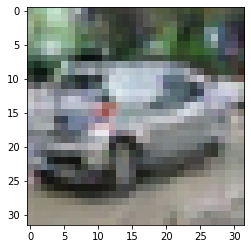

-> Epoch 410, Batch numero 1/78 -> Disc. loss on real images: 0.18619, Disc. loss on fake images: 0.20693, Generator loss: 3.11208
-> Epoch 410, Batch numero 2/78 -> Disc. loss on real images: 0.17583, Disc. loss on fake images: 0.43014, Generator loss: 3.48326
-> Epoch 410, Batch numero 3/78 -> Disc. loss on real images: 0.30067, Disc. loss on fake images: 0.06027, Generator loss: 3.43149
-> Epoch 410, Batch numero 4/78 -> Disc. loss on real images: 0.10336, Disc. loss on fake images: 0.43174, Generator loss: 4.27522
-> Epoch 410, Batch numero 5/78 -> Disc. loss on real images: 0.27954, Disc. loss on fake images: 0.17728, Generator loss: 3.90642
-> Epoch 410, Batch numero 6/78 -> Disc. loss on real images: 0.19219, Disc. loss on fake images: 0.27093, Generator loss: 3.69124
-> Epoch 410, Batch numero 7/78 -> Disc. loss on real images: 0.23031, Disc. loss on fake images: 0.07469, Generator loss: 3.82527
-> Epoch 410, Batch numero 8/78 -> Disc. loss on real images: 0.23105, Disc. loss o

-> Epoch 410, Batch numero 64/78 -> Disc. loss on real images: 0.14637, Disc. loss on fake images: 0.33816, Generator loss: 3.58959
-> Epoch 410, Batch numero 65/78 -> Disc. loss on real images: 0.13809, Disc. loss on fake images: 0.10726, Generator loss: 3.42548
-> Epoch 410, Batch numero 66/78 -> Disc. loss on real images: 0.12494, Disc. loss on fake images: 0.13798, Generator loss: 3.38246
-> Epoch 410, Batch numero 67/78 -> Disc. loss on real images: 0.18385, Disc. loss on fake images: 0.29627, Generator loss: 3.60333
-> Epoch 410, Batch numero 68/78 -> Disc. loss on real images: 0.11778, Disc. loss on fake images: 0.14383, Generator loss: 2.74339
-> Epoch 410, Batch numero 69/78 -> Disc. loss on real images: 0.11147, Disc. loss on fake images: 0.25857, Generator loss: 3.89408
-> Epoch 410, Batch numero 70/78 -> Disc. loss on real images: 0.12456, Disc. loss on fake images: 0.10839, Generator loss: 3.87830
-> Epoch 410, Batch numero 71/78 -> Disc. loss on real images: 0.16742, Disc

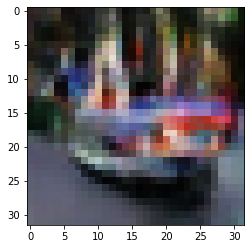

-> Epoch 411, Batch numero 1/78 -> Disc. loss on real images: 0.27883, Disc. loss on fake images: 0.29506, Generator loss: 3.99125
-> Epoch 411, Batch numero 2/78 -> Disc. loss on real images: 0.28096, Disc. loss on fake images: 0.13164, Generator loss: 3.81259
-> Epoch 411, Batch numero 3/78 -> Disc. loss on real images: 0.33931, Disc. loss on fake images: 0.42609, Generator loss: 3.58651
-> Epoch 411, Batch numero 4/78 -> Disc. loss on real images: 0.06162, Disc. loss on fake images: 0.04223, Generator loss: 3.90831
-> Epoch 411, Batch numero 5/78 -> Disc. loss on real images: 0.25120, Disc. loss on fake images: 0.25588, Generator loss: 4.07494
-> Epoch 411, Batch numero 6/78 -> Disc. loss on real images: 0.21500, Disc. loss on fake images: 0.28289, Generator loss: 3.99065
-> Epoch 411, Batch numero 7/78 -> Disc. loss on real images: 0.26890, Disc. loss on fake images: 0.10648, Generator loss: 3.22053
-> Epoch 411, Batch numero 8/78 -> Disc. loss on real images: 0.15426, Disc. loss o

-> Epoch 411, Batch numero 64/78 -> Disc. loss on real images: 0.11100, Disc. loss on fake images: 0.12400, Generator loss: 3.48347
-> Epoch 411, Batch numero 65/78 -> Disc. loss on real images: 0.15164, Disc. loss on fake images: 0.12296, Generator loss: 3.39327
-> Epoch 411, Batch numero 66/78 -> Disc. loss on real images: 0.17774, Disc. loss on fake images: 0.25103, Generator loss: 3.85610
-> Epoch 411, Batch numero 67/78 -> Disc. loss on real images: 0.25577, Disc. loss on fake images: 0.26010, Generator loss: 4.18665
-> Epoch 411, Batch numero 68/78 -> Disc. loss on real images: 0.14953, Disc. loss on fake images: 0.26095, Generator loss: 4.01208
-> Epoch 411, Batch numero 69/78 -> Disc. loss on real images: 0.19891, Disc. loss on fake images: 0.13101, Generator loss: 4.00895
-> Epoch 411, Batch numero 70/78 -> Disc. loss on real images: 0.24564, Disc. loss on fake images: 0.14605, Generator loss: 3.81627
-> Epoch 411, Batch numero 71/78 -> Disc. loss on real images: 0.19544, Disc

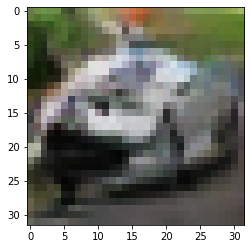

-> Epoch 412, Batch numero 1/78 -> Disc. loss on real images: 0.27179, Disc. loss on fake images: 0.23347, Generator loss: 3.40752
-> Epoch 412, Batch numero 2/78 -> Disc. loss on real images: 0.19724, Disc. loss on fake images: 0.11743, Generator loss: 3.49195
-> Epoch 412, Batch numero 3/78 -> Disc. loss on real images: 0.11780, Disc. loss on fake images: 0.22272, Generator loss: 3.92208
-> Epoch 412, Batch numero 4/78 -> Disc. loss on real images: 0.15588, Disc. loss on fake images: 0.30382, Generator loss: 3.38633
-> Epoch 412, Batch numero 5/78 -> Disc. loss on real images: 0.14886, Disc. loss on fake images: 0.17375, Generator loss: 3.68605
-> Epoch 412, Batch numero 6/78 -> Disc. loss on real images: 0.17941, Disc. loss on fake images: 0.14330, Generator loss: 3.77805
-> Epoch 412, Batch numero 7/78 -> Disc. loss on real images: 0.13361, Disc. loss on fake images: 0.35028, Generator loss: 3.73689
-> Epoch 412, Batch numero 8/78 -> Disc. loss on real images: 0.25297, Disc. loss o

-> Epoch 412, Batch numero 64/78 -> Disc. loss on real images: 0.09977, Disc. loss on fake images: 0.21916, Generator loss: 3.53686
-> Epoch 412, Batch numero 65/78 -> Disc. loss on real images: 0.11983, Disc. loss on fake images: 0.30477, Generator loss: 3.58444
-> Epoch 412, Batch numero 66/78 -> Disc. loss on real images: 0.19580, Disc. loss on fake images: 0.32346, Generator loss: 3.54043
-> Epoch 412, Batch numero 67/78 -> Disc. loss on real images: 0.24251, Disc. loss on fake images: 0.15784, Generator loss: 3.58845
-> Epoch 412, Batch numero 68/78 -> Disc. loss on real images: 0.17278, Disc. loss on fake images: 0.14347, Generator loss: 3.88097
-> Epoch 412, Batch numero 69/78 -> Disc. loss on real images: 0.21438, Disc. loss on fake images: 0.22817, Generator loss: 3.63759
-> Epoch 412, Batch numero 70/78 -> Disc. loss on real images: 0.18148, Disc. loss on fake images: 0.25353, Generator loss: 4.53640
-> Epoch 412, Batch numero 71/78 -> Disc. loss on real images: 0.11315, Disc

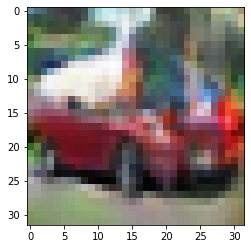

-> Epoch 413, Batch numero 1/78 -> Disc. loss on real images: 0.33893, Disc. loss on fake images: 0.26738, Generator loss: 3.35788
-> Epoch 413, Batch numero 2/78 -> Disc. loss on real images: 0.10957, Disc. loss on fake images: 0.36983, Generator loss: 4.04384
-> Epoch 413, Batch numero 3/78 -> Disc. loss on real images: 0.17315, Disc. loss on fake images: 0.09757, Generator loss: 3.84205
-> Epoch 413, Batch numero 4/78 -> Disc. loss on real images: 0.44524, Disc. loss on fake images: 0.22392, Generator loss: 3.31839
-> Epoch 413, Batch numero 5/78 -> Disc. loss on real images: 0.09396, Disc. loss on fake images: 0.10867, Generator loss: 3.55579
-> Epoch 413, Batch numero 6/78 -> Disc. loss on real images: 0.15546, Disc. loss on fake images: 0.15099, Generator loss: 3.70363
-> Epoch 413, Batch numero 7/78 -> Disc. loss on real images: 0.13339, Disc. loss on fake images: 0.26787, Generator loss: 3.84709
-> Epoch 413, Batch numero 8/78 -> Disc. loss on real images: 0.20030, Disc. loss o

-> Epoch 413, Batch numero 64/78 -> Disc. loss on real images: 0.17314, Disc. loss on fake images: 0.11386, Generator loss: 3.68182
-> Epoch 413, Batch numero 65/78 -> Disc. loss on real images: 0.18028, Disc. loss on fake images: 0.30760, Generator loss: 3.63481
-> Epoch 413, Batch numero 66/78 -> Disc. loss on real images: 0.07820, Disc. loss on fake images: 0.22711, Generator loss: 3.50218
-> Epoch 413, Batch numero 67/78 -> Disc. loss on real images: 0.31307, Disc. loss on fake images: 0.37135, Generator loss: 4.11698
-> Epoch 413, Batch numero 68/78 -> Disc. loss on real images: 0.13821, Disc. loss on fake images: 0.36303, Generator loss: 4.02346
-> Epoch 413, Batch numero 69/78 -> Disc. loss on real images: 0.21951, Disc. loss on fake images: 0.10508, Generator loss: 4.57376
-> Epoch 413, Batch numero 70/78 -> Disc. loss on real images: 0.41485, Disc. loss on fake images: 0.39048, Generator loss: 4.27478
-> Epoch 413, Batch numero 71/78 -> Disc. loss on real images: 0.15221, Disc

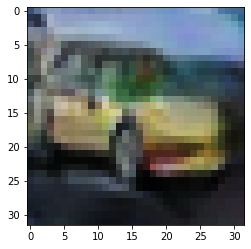

-> Epoch 414, Batch numero 1/78 -> Disc. loss on real images: 0.11046, Disc. loss on fake images: 0.23330, Generator loss: 3.65771
-> Epoch 414, Batch numero 2/78 -> Disc. loss on real images: 0.30982, Disc. loss on fake images: 0.30318, Generator loss: 3.75260
-> Epoch 414, Batch numero 3/78 -> Disc. loss on real images: 0.18203, Disc. loss on fake images: 0.23192, Generator loss: 3.46364
-> Epoch 414, Batch numero 4/78 -> Disc. loss on real images: 0.19542, Disc. loss on fake images: 0.19866, Generator loss: 3.75191
-> Epoch 414, Batch numero 5/78 -> Disc. loss on real images: 0.39464, Disc. loss on fake images: 0.19419, Generator loss: 3.45510
-> Epoch 414, Batch numero 6/78 -> Disc. loss on real images: 0.22071, Disc. loss on fake images: 0.28400, Generator loss: 3.18518
-> Epoch 414, Batch numero 7/78 -> Disc. loss on real images: 0.16578, Disc. loss on fake images: 0.18067, Generator loss: 3.88368
-> Epoch 414, Batch numero 8/78 -> Disc. loss on real images: 0.10680, Disc. loss o

-> Epoch 414, Batch numero 64/78 -> Disc. loss on real images: 0.14839, Disc. loss on fake images: 0.20085, Generator loss: 4.33526
-> Epoch 414, Batch numero 65/78 -> Disc. loss on real images: 0.37105, Disc. loss on fake images: 0.33969, Generator loss: 3.86912
-> Epoch 414, Batch numero 66/78 -> Disc. loss on real images: 0.32315, Disc. loss on fake images: 0.12956, Generator loss: 3.96676
-> Epoch 414, Batch numero 67/78 -> Disc. loss on real images: 0.12164, Disc. loss on fake images: 0.35421, Generator loss: 3.58010
-> Epoch 414, Batch numero 68/78 -> Disc. loss on real images: 0.25659, Disc. loss on fake images: 0.39699, Generator loss: 3.65453
-> Epoch 414, Batch numero 69/78 -> Disc. loss on real images: 0.16737, Disc. loss on fake images: 0.23901, Generator loss: 4.45961
-> Epoch 414, Batch numero 70/78 -> Disc. loss on real images: 0.32728, Disc. loss on fake images: 0.10932, Generator loss: 3.45109
-> Epoch 414, Batch numero 71/78 -> Disc. loss on real images: 0.17642, Disc

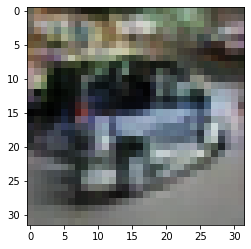

-> Epoch 415, Batch numero 1/78 -> Disc. loss on real images: 0.11125, Disc. loss on fake images: 0.12573, Generator loss: 3.52942
-> Epoch 415, Batch numero 2/78 -> Disc. loss on real images: 0.32734, Disc. loss on fake images: 0.29412, Generator loss: 3.21009
-> Epoch 415, Batch numero 3/78 -> Disc. loss on real images: 0.10340, Disc. loss on fake images: 0.43713, Generator loss: 4.25583
-> Epoch 415, Batch numero 4/78 -> Disc. loss on real images: 0.20443, Disc. loss on fake images: 0.18427, Generator loss: 3.97095
-> Epoch 415, Batch numero 5/78 -> Disc. loss on real images: 0.25971, Disc. loss on fake images: 0.16453, Generator loss: 4.09914
-> Epoch 415, Batch numero 6/78 -> Disc. loss on real images: 0.16845, Disc. loss on fake images: 0.12101, Generator loss: 3.47844
-> Epoch 415, Batch numero 7/78 -> Disc. loss on real images: 0.08483, Disc. loss on fake images: 0.11571, Generator loss: 3.36710
-> Epoch 415, Batch numero 8/78 -> Disc. loss on real images: 0.13054, Disc. loss o

-> Epoch 415, Batch numero 64/78 -> Disc. loss on real images: 0.21554, Disc. loss on fake images: 0.35909, Generator loss: 3.69299
-> Epoch 415, Batch numero 65/78 -> Disc. loss on real images: 0.23394, Disc. loss on fake images: 0.10838, Generator loss: 4.12487
-> Epoch 415, Batch numero 66/78 -> Disc. loss on real images: 0.18438, Disc. loss on fake images: 0.13210, Generator loss: 3.26816
-> Epoch 415, Batch numero 67/78 -> Disc. loss on real images: 0.33671, Disc. loss on fake images: 0.37315, Generator loss: 3.43137
-> Epoch 415, Batch numero 68/78 -> Disc. loss on real images: 0.12994, Disc. loss on fake images: 0.28870, Generator loss: 3.93472
-> Epoch 415, Batch numero 69/78 -> Disc. loss on real images: 0.15516, Disc. loss on fake images: 0.42451, Generator loss: 4.51091
-> Epoch 415, Batch numero 70/78 -> Disc. loss on real images: 0.25652, Disc. loss on fake images: 0.12346, Generator loss: 4.11487
-> Epoch 415, Batch numero 71/78 -> Disc. loss on real images: 0.28537, Disc

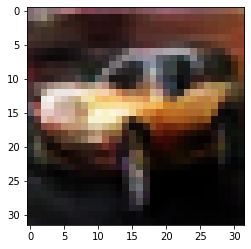

-> Epoch 416, Batch numero 1/78 -> Disc. loss on real images: 0.18170, Disc. loss on fake images: 0.19802, Generator loss: 3.64748
-> Epoch 416, Batch numero 2/78 -> Disc. loss on real images: 0.08047, Disc. loss on fake images: 0.25584, Generator loss: 3.94466
-> Epoch 416, Batch numero 3/78 -> Disc. loss on real images: 0.08831, Disc. loss on fake images: 0.07730, Generator loss: 4.10272
-> Epoch 416, Batch numero 4/78 -> Disc. loss on real images: 0.44491, Disc. loss on fake images: 0.11913, Generator loss: 3.64097
-> Epoch 416, Batch numero 5/78 -> Disc. loss on real images: 0.13946, Disc. loss on fake images: 0.17886, Generator loss: 3.67614
-> Epoch 416, Batch numero 6/78 -> Disc. loss on real images: 0.11399, Disc. loss on fake images: 0.32869, Generator loss: 3.89871
-> Epoch 416, Batch numero 7/78 -> Disc. loss on real images: 0.11494, Disc. loss on fake images: 0.11284, Generator loss: 3.55759
-> Epoch 416, Batch numero 8/78 -> Disc. loss on real images: 0.13807, Disc. loss o

-> Epoch 416, Batch numero 64/78 -> Disc. loss on real images: 0.45627, Disc. loss on fake images: 0.18723, Generator loss: 3.68603
-> Epoch 416, Batch numero 65/78 -> Disc. loss on real images: 0.07977, Disc. loss on fake images: 0.19128, Generator loss: 3.25229
-> Epoch 416, Batch numero 66/78 -> Disc. loss on real images: 0.11894, Disc. loss on fake images: 0.15230, Generator loss: 3.26757
-> Epoch 416, Batch numero 67/78 -> Disc. loss on real images: 0.17630, Disc. loss on fake images: 0.16370, Generator loss: 3.80583
-> Epoch 416, Batch numero 68/78 -> Disc. loss on real images: 0.12427, Disc. loss on fake images: 0.24439, Generator loss: 4.62791
-> Epoch 416, Batch numero 69/78 -> Disc. loss on real images: 0.13341, Disc. loss on fake images: 0.21967, Generator loss: 3.97862
-> Epoch 416, Batch numero 70/78 -> Disc. loss on real images: 0.20888, Disc. loss on fake images: 0.09431, Generator loss: 3.58127
-> Epoch 416, Batch numero 71/78 -> Disc. loss on real images: 0.23616, Disc

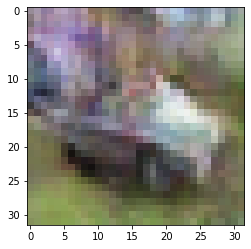

-> Epoch 417, Batch numero 1/78 -> Disc. loss on real images: 0.18680, Disc. loss on fake images: 0.11835, Generator loss: 3.50279
-> Epoch 417, Batch numero 2/78 -> Disc. loss on real images: 0.10746, Disc. loss on fake images: 0.17141, Generator loss: 3.18040
-> Epoch 417, Batch numero 3/78 -> Disc. loss on real images: 0.09739, Disc. loss on fake images: 0.25264, Generator loss: 3.51948
-> Epoch 417, Batch numero 4/78 -> Disc. loss on real images: 0.08893, Disc. loss on fake images: 0.17461, Generator loss: 3.67736
-> Epoch 417, Batch numero 5/78 -> Disc. loss on real images: 0.17119, Disc. loss on fake images: 0.30613, Generator loss: 4.10258
-> Epoch 417, Batch numero 6/78 -> Disc. loss on real images: 0.13966, Disc. loss on fake images: 0.07652, Generator loss: 4.50247
-> Epoch 417, Batch numero 7/78 -> Disc. loss on real images: 0.13942, Disc. loss on fake images: 0.30265, Generator loss: 4.15075
-> Epoch 417, Batch numero 8/78 -> Disc. loss on real images: 0.40773, Disc. loss o

-> Epoch 417, Batch numero 64/78 -> Disc. loss on real images: 0.15069, Disc. loss on fake images: 0.12514, Generator loss: 4.15964
-> Epoch 417, Batch numero 65/78 -> Disc. loss on real images: 0.17069, Disc. loss on fake images: 0.13543, Generator loss: 3.56969
-> Epoch 417, Batch numero 66/78 -> Disc. loss on real images: 0.22630, Disc. loss on fake images: 0.27113, Generator loss: 3.69192
-> Epoch 417, Batch numero 67/78 -> Disc. loss on real images: 0.05502, Disc. loss on fake images: 0.19727, Generator loss: 4.40327
-> Epoch 417, Batch numero 68/78 -> Disc. loss on real images: 0.18582, Disc. loss on fake images: 0.18793, Generator loss: 4.30523
-> Epoch 417, Batch numero 69/78 -> Disc. loss on real images: 0.24880, Disc. loss on fake images: 0.21901, Generator loss: 4.08453
-> Epoch 417, Batch numero 70/78 -> Disc. loss on real images: 0.18824, Disc. loss on fake images: 0.38903, Generator loss: 4.76232
-> Epoch 417, Batch numero 71/78 -> Disc. loss on real images: 0.47185, Disc

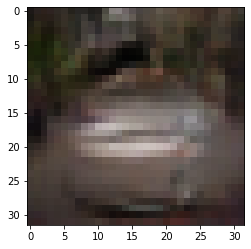

-> Epoch 418, Batch numero 1/78 -> Disc. loss on real images: 0.32557, Disc. loss on fake images: 0.19543, Generator loss: 3.54474
-> Epoch 418, Batch numero 2/78 -> Disc. loss on real images: 0.25278, Disc. loss on fake images: 0.33447, Generator loss: 3.51689
-> Epoch 418, Batch numero 3/78 -> Disc. loss on real images: 0.12375, Disc. loss on fake images: 0.33628, Generator loss: 4.00491
-> Epoch 418, Batch numero 4/78 -> Disc. loss on real images: 0.39233, Disc. loss on fake images: 0.21408, Generator loss: 3.45161
-> Epoch 418, Batch numero 5/78 -> Disc. loss on real images: 0.42731, Disc. loss on fake images: 0.30139, Generator loss: 3.56960
-> Epoch 418, Batch numero 6/78 -> Disc. loss on real images: 0.11744, Disc. loss on fake images: 0.22936, Generator loss: 4.09632
-> Epoch 418, Batch numero 7/78 -> Disc. loss on real images: 0.20114, Disc. loss on fake images: 0.20593, Generator loss: 3.56308
-> Epoch 418, Batch numero 8/78 -> Disc. loss on real images: 0.12308, Disc. loss o

-> Epoch 418, Batch numero 64/78 -> Disc. loss on real images: 0.18048, Disc. loss on fake images: 0.16284, Generator loss: 3.63316
-> Epoch 418, Batch numero 65/78 -> Disc. loss on real images: 0.23798, Disc. loss on fake images: 0.11959, Generator loss: 3.39190
-> Epoch 418, Batch numero 66/78 -> Disc. loss on real images: 0.16778, Disc. loss on fake images: 0.17123, Generator loss: 4.14135
-> Epoch 418, Batch numero 67/78 -> Disc. loss on real images: 0.38655, Disc. loss on fake images: 0.36258, Generator loss: 3.70440
-> Epoch 418, Batch numero 68/78 -> Disc. loss on real images: 0.09940, Disc. loss on fake images: 0.28406, Generator loss: 3.75978
-> Epoch 418, Batch numero 69/78 -> Disc. loss on real images: 0.26821, Disc. loss on fake images: 0.24306, Generator loss: 4.06904
-> Epoch 418, Batch numero 70/78 -> Disc. loss on real images: 0.18270, Disc. loss on fake images: 0.11030, Generator loss: 3.61986
-> Epoch 418, Batch numero 71/78 -> Disc. loss on real images: 0.17032, Disc

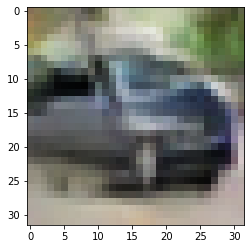

-> Epoch 419, Batch numero 1/78 -> Disc. loss on real images: 0.29397, Disc. loss on fake images: 0.26727, Generator loss: 4.19207
-> Epoch 419, Batch numero 2/78 -> Disc. loss on real images: 0.09809, Disc. loss on fake images: 0.10371, Generator loss: 3.80110
-> Epoch 419, Batch numero 3/78 -> Disc. loss on real images: 0.12821, Disc. loss on fake images: 0.28540, Generator loss: 4.32393
-> Epoch 419, Batch numero 4/78 -> Disc. loss on real images: 0.18837, Disc. loss on fake images: 0.05402, Generator loss: 4.43209
-> Epoch 419, Batch numero 5/78 -> Disc. loss on real images: 0.45552, Disc. loss on fake images: 0.15080, Generator loss: 3.64097
-> Epoch 419, Batch numero 6/78 -> Disc. loss on real images: 0.10049, Disc. loss on fake images: 0.20228, Generator loss: 3.90092
-> Epoch 419, Batch numero 7/78 -> Disc. loss on real images: 0.14885, Disc. loss on fake images: 0.15891, Generator loss: 4.19136
-> Epoch 419, Batch numero 8/78 -> Disc. loss on real images: 0.22767, Disc. loss o

-> Epoch 419, Batch numero 64/78 -> Disc. loss on real images: 0.26299, Disc. loss on fake images: 0.33308, Generator loss: 3.44108
-> Epoch 419, Batch numero 65/78 -> Disc. loss on real images: 0.30236, Disc. loss on fake images: 0.22664, Generator loss: 3.73648
-> Epoch 419, Batch numero 66/78 -> Disc. loss on real images: 0.15500, Disc. loss on fake images: 0.17752, Generator loss: 3.18069
-> Epoch 419, Batch numero 67/78 -> Disc. loss on real images: 0.15237, Disc. loss on fake images: 0.23191, Generator loss: 3.16975
-> Epoch 419, Batch numero 68/78 -> Disc. loss on real images: 0.22410, Disc. loss on fake images: 0.33081, Generator loss: 4.13991
-> Epoch 419, Batch numero 69/78 -> Disc. loss on real images: 0.09520, Disc. loss on fake images: 0.09908, Generator loss: 3.62488
-> Epoch 419, Batch numero 70/78 -> Disc. loss on real images: 0.38263, Disc. loss on fake images: 0.10000, Generator loss: 3.07523
-> Epoch 419, Batch numero 71/78 -> Disc. loss on real images: 0.16512, Disc

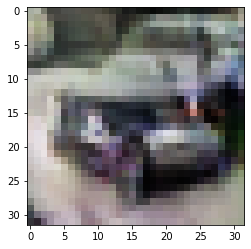

-> Epoch 420, Batch numero 1/78 -> Disc. loss on real images: 0.25636, Disc. loss on fake images: 0.14545, Generator loss: 3.99954
-> Epoch 420, Batch numero 2/78 -> Disc. loss on real images: 0.38593, Disc. loss on fake images: 0.30846, Generator loss: 3.51145
-> Epoch 420, Batch numero 3/78 -> Disc. loss on real images: 0.11715, Disc. loss on fake images: 0.37660, Generator loss: 3.62901
-> Epoch 420, Batch numero 4/78 -> Disc. loss on real images: 0.29223, Disc. loss on fake images: 0.28510, Generator loss: 3.95141
-> Epoch 420, Batch numero 5/78 -> Disc. loss on real images: 0.24104, Disc. loss on fake images: 0.07976, Generator loss: 3.95592
-> Epoch 420, Batch numero 6/78 -> Disc. loss on real images: 0.18652, Disc. loss on fake images: 0.10336, Generator loss: 3.58589
-> Epoch 420, Batch numero 7/78 -> Disc. loss on real images: 0.24613, Disc. loss on fake images: 0.09672, Generator loss: 3.37493
-> Epoch 420, Batch numero 8/78 -> Disc. loss on real images: 0.16331, Disc. loss o

-> Epoch 420, Batch numero 64/78 -> Disc. loss on real images: 0.37947, Disc. loss on fake images: 0.27910, Generator loss: 3.39859
-> Epoch 420, Batch numero 65/78 -> Disc. loss on real images: 0.20030, Disc. loss on fake images: 0.27905, Generator loss: 3.65597
-> Epoch 420, Batch numero 66/78 -> Disc. loss on real images: 0.08864, Disc. loss on fake images: 0.13174, Generator loss: 3.62179
-> Epoch 420, Batch numero 67/78 -> Disc. loss on real images: 0.07733, Disc. loss on fake images: 0.07585, Generator loss: 3.50670
-> Epoch 420, Batch numero 68/78 -> Disc. loss on real images: 0.25548, Disc. loss on fake images: 0.13256, Generator loss: 3.77646
-> Epoch 420, Batch numero 69/78 -> Disc. loss on real images: 0.24307, Disc. loss on fake images: 0.12499, Generator loss: 2.79553
-> Epoch 420, Batch numero 70/78 -> Disc. loss on real images: 0.06891, Disc. loss on fake images: 0.41311, Generator loss: 3.61928
-> Epoch 420, Batch numero 71/78 -> Disc. loss on real images: 0.18098, Disc

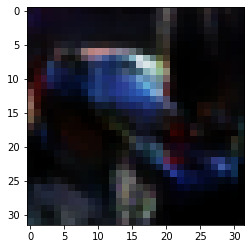

-> Epoch 421, Batch numero 1/78 -> Disc. loss on real images: 0.26122, Disc. loss on fake images: 0.26761, Generator loss: 3.48836
-> Epoch 421, Batch numero 2/78 -> Disc. loss on real images: 0.18959, Disc. loss on fake images: 0.41339, Generator loss: 3.55892
-> Epoch 421, Batch numero 3/78 -> Disc. loss on real images: 0.15706, Disc. loss on fake images: 0.19107, Generator loss: 4.11080
-> Epoch 421, Batch numero 4/78 -> Disc. loss on real images: 0.12619, Disc. loss on fake images: 0.16764, Generator loss: 4.11614
-> Epoch 421, Batch numero 5/78 -> Disc. loss on real images: 0.50402, Disc. loss on fake images: 0.13907, Generator loss: 3.76247
-> Epoch 421, Batch numero 6/78 -> Disc. loss on real images: 0.09958, Disc. loss on fake images: 0.16098, Generator loss: 3.70684
-> Epoch 421, Batch numero 7/78 -> Disc. loss on real images: 0.26196, Disc. loss on fake images: 0.28206, Generator loss: 3.56597
-> Epoch 421, Batch numero 8/78 -> Disc. loss on real images: 0.13268, Disc. loss o

-> Epoch 421, Batch numero 64/78 -> Disc. loss on real images: 0.20590, Disc. loss on fake images: 0.15879, Generator loss: 3.51232
-> Epoch 421, Batch numero 65/78 -> Disc. loss on real images: 0.13892, Disc. loss on fake images: 0.19942, Generator loss: 3.46167
-> Epoch 421, Batch numero 66/78 -> Disc. loss on real images: 0.12116, Disc. loss on fake images: 0.23088, Generator loss: 4.12276
-> Epoch 421, Batch numero 67/78 -> Disc. loss on real images: 0.27873, Disc. loss on fake images: 0.33059, Generator loss: 4.12840
-> Epoch 421, Batch numero 68/78 -> Disc. loss on real images: 0.13760, Disc. loss on fake images: 0.19371, Generator loss: 3.76185
-> Epoch 421, Batch numero 69/78 -> Disc. loss on real images: 0.23737, Disc. loss on fake images: 0.30119, Generator loss: 3.66289
-> Epoch 421, Batch numero 70/78 -> Disc. loss on real images: 0.25077, Disc. loss on fake images: 0.23036, Generator loss: 3.64724
-> Epoch 421, Batch numero 71/78 -> Disc. loss on real images: 0.35319, Disc

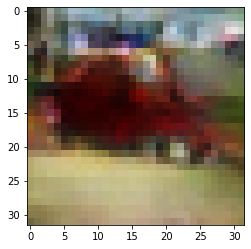

-> Epoch 422, Batch numero 1/78 -> Disc. loss on real images: 0.31976, Disc. loss on fake images: 0.16383, Generator loss: 3.61085
-> Epoch 422, Batch numero 2/78 -> Disc. loss on real images: 0.20175, Disc. loss on fake images: 0.56978, Generator loss: 3.72101
-> Epoch 422, Batch numero 3/78 -> Disc. loss on real images: 0.12900, Disc. loss on fake images: 0.10318, Generator loss: 3.97220
-> Epoch 422, Batch numero 4/78 -> Disc. loss on real images: 0.36593, Disc. loss on fake images: 0.20319, Generator loss: 3.42609
-> Epoch 422, Batch numero 5/78 -> Disc. loss on real images: 0.13303, Disc. loss on fake images: 0.26428, Generator loss: 3.11504
-> Epoch 422, Batch numero 6/78 -> Disc. loss on real images: 0.15806, Disc. loss on fake images: 0.08936, Generator loss: 3.69664
-> Epoch 422, Batch numero 7/78 -> Disc. loss on real images: 0.11216, Disc. loss on fake images: 0.18780, Generator loss: 3.42682
-> Epoch 422, Batch numero 8/78 -> Disc. loss on real images: 0.07978, Disc. loss o

-> Epoch 422, Batch numero 64/78 -> Disc. loss on real images: 0.25784, Disc. loss on fake images: 0.41481, Generator loss: 3.60760
-> Epoch 422, Batch numero 65/78 -> Disc. loss on real images: 0.11783, Disc. loss on fake images: 0.19661, Generator loss: 3.72994
-> Epoch 422, Batch numero 66/78 -> Disc. loss on real images: 0.13912, Disc. loss on fake images: 0.10744, Generator loss: 4.02996
-> Epoch 422, Batch numero 67/78 -> Disc. loss on real images: 0.12655, Disc. loss on fake images: 0.15750, Generator loss: 3.80875
-> Epoch 422, Batch numero 68/78 -> Disc. loss on real images: 0.25800, Disc. loss on fake images: 0.13410, Generator loss: 3.73631
-> Epoch 422, Batch numero 69/78 -> Disc. loss on real images: 0.21315, Disc. loss on fake images: 0.17865, Generator loss: 3.70430
-> Epoch 422, Batch numero 70/78 -> Disc. loss on real images: 0.06712, Disc. loss on fake images: 0.38595, Generator loss: 3.11039
-> Epoch 422, Batch numero 71/78 -> Disc. loss on real images: 0.19581, Disc

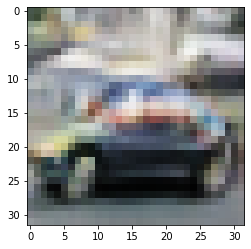

-> Epoch 423, Batch numero 1/78 -> Disc. loss on real images: 0.29772, Disc. loss on fake images: 0.25999, Generator loss: 4.66973
-> Epoch 423, Batch numero 2/78 -> Disc. loss on real images: 0.27879, Disc. loss on fake images: 0.16652, Generator loss: 3.67054
-> Epoch 423, Batch numero 3/78 -> Disc. loss on real images: 0.23008, Disc. loss on fake images: 0.15817, Generator loss: 3.66928
-> Epoch 423, Batch numero 4/78 -> Disc. loss on real images: 0.18840, Disc. loss on fake images: 0.30979, Generator loss: 3.20479
-> Epoch 423, Batch numero 5/78 -> Disc. loss on real images: 0.13105, Disc. loss on fake images: 0.48701, Generator loss: 3.62219
-> Epoch 423, Batch numero 6/78 -> Disc. loss on real images: 0.14466, Disc. loss on fake images: 0.13071, Generator loss: 4.13613
-> Epoch 423, Batch numero 7/78 -> Disc. loss on real images: 0.11879, Disc. loss on fake images: 0.07629, Generator loss: 3.76956
-> Epoch 423, Batch numero 8/78 -> Disc. loss on real images: 0.33253, Disc. loss o

-> Epoch 423, Batch numero 64/78 -> Disc. loss on real images: 0.13346, Disc. loss on fake images: 0.18188, Generator loss: 3.57828
-> Epoch 423, Batch numero 65/78 -> Disc. loss on real images: 0.07893, Disc. loss on fake images: 0.24273, Generator loss: 3.51476
-> Epoch 423, Batch numero 66/78 -> Disc. loss on real images: 0.19039, Disc. loss on fake images: 0.13849, Generator loss: 3.49018
-> Epoch 423, Batch numero 67/78 -> Disc. loss on real images: 0.13363, Disc. loss on fake images: 0.45915, Generator loss: 4.03691
-> Epoch 423, Batch numero 68/78 -> Disc. loss on real images: 0.11273, Disc. loss on fake images: 0.18992, Generator loss: 4.10053
-> Epoch 423, Batch numero 69/78 -> Disc. loss on real images: 0.26276, Disc. loss on fake images: 0.32234, Generator loss: 4.46678
-> Epoch 423, Batch numero 70/78 -> Disc. loss on real images: 0.19061, Disc. loss on fake images: 0.08635, Generator loss: 4.26313
-> Epoch 423, Batch numero 71/78 -> Disc. loss on real images: 0.18837, Disc

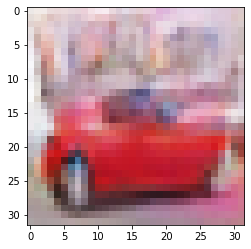

-> Epoch 424, Batch numero 1/78 -> Disc. loss on real images: 0.17476, Disc. loss on fake images: 0.21559, Generator loss: 4.67413
-> Epoch 424, Batch numero 2/78 -> Disc. loss on real images: 0.11080, Disc. loss on fake images: 0.31122, Generator loss: 4.72227
-> Epoch 424, Batch numero 3/78 -> Disc. loss on real images: 0.39538, Disc. loss on fake images: 0.09670, Generator loss: 4.53380
-> Epoch 424, Batch numero 4/78 -> Disc. loss on real images: 0.19173, Disc. loss on fake images: 0.08297, Generator loss: 3.50426
-> Epoch 424, Batch numero 5/78 -> Disc. loss on real images: 0.08525, Disc. loss on fake images: 0.23826, Generator loss: 3.60692
-> Epoch 424, Batch numero 6/78 -> Disc. loss on real images: 0.17173, Disc. loss on fake images: 0.12953, Generator loss: 3.47191
-> Epoch 424, Batch numero 7/78 -> Disc. loss on real images: 0.18247, Disc. loss on fake images: 0.07707, Generator loss: 3.80944
-> Epoch 424, Batch numero 8/78 -> Disc. loss on real images: 0.12104, Disc. loss o

-> Epoch 424, Batch numero 64/78 -> Disc. loss on real images: 0.16701, Disc. loss on fake images: 0.04986, Generator loss: 4.35928
-> Epoch 424, Batch numero 65/78 -> Disc. loss on real images: 0.25107, Disc. loss on fake images: 0.19524, Generator loss: 4.01642
-> Epoch 424, Batch numero 66/78 -> Disc. loss on real images: 0.11844, Disc. loss on fake images: 0.23091, Generator loss: 3.40104
-> Epoch 424, Batch numero 67/78 -> Disc. loss on real images: 0.15493, Disc. loss on fake images: 0.11682, Generator loss: 4.08247
-> Epoch 424, Batch numero 68/78 -> Disc. loss on real images: 0.28603, Disc. loss on fake images: 0.24792, Generator loss: 3.52579
-> Epoch 424, Batch numero 69/78 -> Disc. loss on real images: 0.18143, Disc. loss on fake images: 0.35950, Generator loss: 3.70693
-> Epoch 424, Batch numero 70/78 -> Disc. loss on real images: 0.15427, Disc. loss on fake images: 0.23586, Generator loss: 4.65484
-> Epoch 424, Batch numero 71/78 -> Disc. loss on real images: 0.45176, Disc

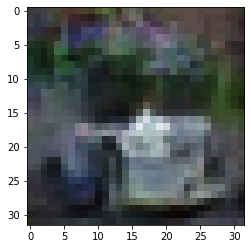

-> Epoch 425, Batch numero 1/78 -> Disc. loss on real images: 0.11037, Disc. loss on fake images: 0.34884, Generator loss: 4.20809
-> Epoch 425, Batch numero 2/78 -> Disc. loss on real images: 0.13813, Disc. loss on fake images: 0.28703, Generator loss: 4.17772
-> Epoch 425, Batch numero 3/78 -> Disc. loss on real images: 0.16831, Disc. loss on fake images: 0.19066, Generator loss: 4.34534
-> Epoch 425, Batch numero 4/78 -> Disc. loss on real images: 0.11958, Disc. loss on fake images: 0.17595, Generator loss: 3.94250
-> Epoch 425, Batch numero 5/78 -> Disc. loss on real images: 0.10826, Disc. loss on fake images: 0.42612, Generator loss: 4.21148
-> Epoch 425, Batch numero 6/78 -> Disc. loss on real images: 0.10022, Disc. loss on fake images: 0.12924, Generator loss: 4.07721
-> Epoch 425, Batch numero 7/78 -> Disc. loss on real images: 0.52618, Disc. loss on fake images: 0.21994, Generator loss: 4.03412
-> Epoch 425, Batch numero 8/78 -> Disc. loss on real images: 0.27200, Disc. loss o

-> Epoch 425, Batch numero 64/78 -> Disc. loss on real images: 0.15831, Disc. loss on fake images: 0.37519, Generator loss: 3.93710
-> Epoch 425, Batch numero 65/78 -> Disc. loss on real images: 0.18478, Disc. loss on fake images: 0.41056, Generator loss: 4.43242
-> Epoch 425, Batch numero 66/78 -> Disc. loss on real images: 0.33708, Disc. loss on fake images: 0.33700, Generator loss: 4.80589
-> Epoch 425, Batch numero 67/78 -> Disc. loss on real images: 0.28674, Disc. loss on fake images: 0.12323, Generator loss: 4.20573
-> Epoch 425, Batch numero 68/78 -> Disc. loss on real images: 0.36644, Disc. loss on fake images: 0.20931, Generator loss: 3.65297
-> Epoch 425, Batch numero 69/78 -> Disc. loss on real images: 0.11065, Disc. loss on fake images: 0.27699, Generator loss: 3.50301
-> Epoch 425, Batch numero 70/78 -> Disc. loss on real images: 0.15303, Disc. loss on fake images: 0.13630, Generator loss: 3.91318
-> Epoch 425, Batch numero 71/78 -> Disc. loss on real images: 0.27112, Disc

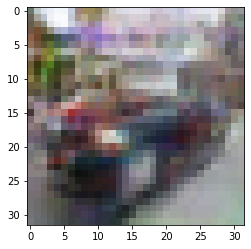

-> Epoch 426, Batch numero 1/78 -> Disc. loss on real images: 0.17297, Disc. loss on fake images: 0.24013, Generator loss: 4.12258
-> Epoch 426, Batch numero 2/78 -> Disc. loss on real images: 0.09896, Disc. loss on fake images: 0.17762, Generator loss: 4.16175
-> Epoch 426, Batch numero 3/78 -> Disc. loss on real images: 0.17444, Disc. loss on fake images: 0.19960, Generator loss: 4.41379
-> Epoch 426, Batch numero 4/78 -> Disc. loss on real images: 0.30097, Disc. loss on fake images: 0.13844, Generator loss: 3.79897
-> Epoch 426, Batch numero 5/78 -> Disc. loss on real images: 0.14319, Disc. loss on fake images: 0.16639, Generator loss: 4.36550
-> Epoch 426, Batch numero 6/78 -> Disc. loss on real images: 0.12713, Disc. loss on fake images: 0.12202, Generator loss: 4.13757
-> Epoch 426, Batch numero 7/78 -> Disc. loss on real images: 0.15864, Disc. loss on fake images: 0.13238, Generator loss: 3.53700
-> Epoch 426, Batch numero 8/78 -> Disc. loss on real images: 0.11036, Disc. loss o

-> Epoch 426, Batch numero 65/78 -> Disc. loss on real images: 0.06067, Disc. loss on fake images: 0.23905, Generator loss: 3.83366
-> Epoch 426, Batch numero 66/78 -> Disc. loss on real images: 0.19962, Disc. loss on fake images: 0.16750, Generator loss: 3.43153
-> Epoch 426, Batch numero 67/78 -> Disc. loss on real images: 0.10485, Disc. loss on fake images: 0.17136, Generator loss: 3.95513
-> Epoch 426, Batch numero 68/78 -> Disc. loss on real images: 0.15032, Disc. loss on fake images: 0.32140, Generator loss: 4.03146
-> Epoch 426, Batch numero 69/78 -> Disc. loss on real images: 0.14232, Disc. loss on fake images: 0.12573, Generator loss: 4.54823
-> Epoch 426, Batch numero 70/78 -> Disc. loss on real images: 0.23521, Disc. loss on fake images: 0.19068, Generator loss: 3.61879
-> Epoch 426, Batch numero 71/78 -> Disc. loss on real images: 0.13195, Disc. loss on fake images: 0.24466, Generator loss: 3.56863
-> Epoch 426, Batch numero 72/78 -> Disc. loss on real images: 0.16926, Disc

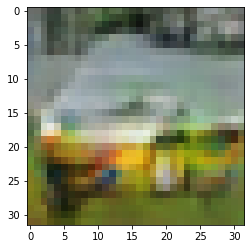

-> Epoch 427, Batch numero 1/78 -> Disc. loss on real images: 0.13003, Disc. loss on fake images: 0.46939, Generator loss: 4.56613
-> Epoch 427, Batch numero 2/78 -> Disc. loss on real images: 0.30267, Disc. loss on fake images: 0.08241, Generator loss: 4.65050
-> Epoch 427, Batch numero 3/78 -> Disc. loss on real images: 0.18027, Disc. loss on fake images: 0.15458, Generator loss: 4.31649
-> Epoch 427, Batch numero 4/78 -> Disc. loss on real images: 0.24047, Disc. loss on fake images: 0.20122, Generator loss: 4.15113
-> Epoch 427, Batch numero 5/78 -> Disc. loss on real images: 0.23542, Disc. loss on fake images: 0.26780, Generator loss: 4.20746
-> Epoch 427, Batch numero 6/78 -> Disc. loss on real images: 0.27476, Disc. loss on fake images: 0.09654, Generator loss: 3.42341
-> Epoch 427, Batch numero 7/78 -> Disc. loss on real images: 0.13436, Disc. loss on fake images: 0.29850, Generator loss: 3.52228
-> Epoch 427, Batch numero 8/78 -> Disc. loss on real images: 0.08701, Disc. loss o

-> Epoch 427, Batch numero 64/78 -> Disc. loss on real images: 0.20790, Disc. loss on fake images: 0.27225, Generator loss: 4.16108
-> Epoch 427, Batch numero 65/78 -> Disc. loss on real images: 0.81805, Disc. loss on fake images: 0.17982, Generator loss: 3.42152
-> Epoch 427, Batch numero 66/78 -> Disc. loss on real images: 0.11964, Disc. loss on fake images: 0.40051, Generator loss: 3.78672
-> Epoch 427, Batch numero 67/78 -> Disc. loss on real images: 0.11671, Disc. loss on fake images: 0.24756, Generator loss: 3.85243
-> Epoch 427, Batch numero 68/78 -> Disc. loss on real images: 0.11032, Disc. loss on fake images: 0.15501, Generator loss: 4.62567
-> Epoch 427, Batch numero 69/78 -> Disc. loss on real images: 0.24700, Disc. loss on fake images: 0.30059, Generator loss: 4.68906
-> Epoch 427, Batch numero 70/78 -> Disc. loss on real images: 0.20708, Disc. loss on fake images: 0.13121, Generator loss: 4.37944
-> Epoch 427, Batch numero 71/78 -> Disc. loss on real images: 0.31073, Disc

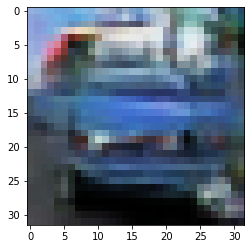

-> Epoch 428, Batch numero 1/78 -> Disc. loss on real images: 0.10470, Disc. loss on fake images: 0.17697, Generator loss: 3.28197
-> Epoch 428, Batch numero 2/78 -> Disc. loss on real images: 0.13921, Disc. loss on fake images: 0.29219, Generator loss: 3.93973
-> Epoch 428, Batch numero 3/78 -> Disc. loss on real images: 0.20655, Disc. loss on fake images: 0.08381, Generator loss: 3.88545
-> Epoch 428, Batch numero 4/78 -> Disc. loss on real images: 0.12821, Disc. loss on fake images: 0.60914, Generator loss: 3.73772
-> Epoch 428, Batch numero 5/78 -> Disc. loss on real images: 0.35565, Disc. loss on fake images: 0.16372, Generator loss: 3.60687
-> Epoch 428, Batch numero 6/78 -> Disc. loss on real images: 0.19198, Disc. loss on fake images: 0.24075, Generator loss: 5.04986
-> Epoch 428, Batch numero 7/78 -> Disc. loss on real images: 0.22042, Disc. loss on fake images: 0.14463, Generator loss: 4.22030
-> Epoch 428, Batch numero 8/78 -> Disc. loss on real images: 0.42348, Disc. loss o

-> Epoch 428, Batch numero 66/78 -> Disc. loss on real images: 0.29444, Disc. loss on fake images: 0.21029, Generator loss: 4.05446
-> Epoch 428, Batch numero 67/78 -> Disc. loss on real images: 0.16393, Disc. loss on fake images: 0.29856, Generator loss: 4.36114
-> Epoch 428, Batch numero 68/78 -> Disc. loss on real images: 0.17776, Disc. loss on fake images: 0.41187, Generator loss: 4.18649
-> Epoch 428, Batch numero 69/78 -> Disc. loss on real images: 0.15021, Disc. loss on fake images: 0.25981, Generator loss: 4.37910
-> Epoch 428, Batch numero 70/78 -> Disc. loss on real images: 0.21008, Disc. loss on fake images: 0.18588, Generator loss: 3.95163
-> Epoch 428, Batch numero 71/78 -> Disc. loss on real images: 0.35720, Disc. loss on fake images: 0.20185, Generator loss: 3.34226
-> Epoch 428, Batch numero 72/78 -> Disc. loss on real images: 0.14135, Disc. loss on fake images: 0.16429, Generator loss: 3.95984
-> Epoch 428, Batch numero 73/78 -> Disc. loss on real images: 0.13010, Disc

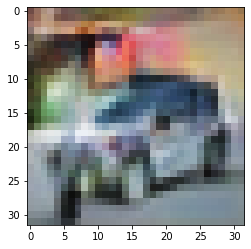

-> Epoch 429, Batch numero 1/78 -> Disc. loss on real images: 0.17739, Disc. loss on fake images: 0.06088, Generator loss: 3.61502
-> Epoch 429, Batch numero 2/78 -> Disc. loss on real images: 0.11857, Disc. loss on fake images: 0.35358, Generator loss: 3.92248
-> Epoch 429, Batch numero 3/78 -> Disc. loss on real images: 0.10976, Disc. loss on fake images: 0.13016, Generator loss: 3.60413
-> Epoch 429, Batch numero 4/78 -> Disc. loss on real images: 0.09879, Disc. loss on fake images: 0.04969, Generator loss: 4.08404
-> Epoch 429, Batch numero 5/78 -> Disc. loss on real images: 0.17031, Disc. loss on fake images: 0.14020, Generator loss: 4.17210
-> Epoch 429, Batch numero 6/78 -> Disc. loss on real images: 0.24774, Disc. loss on fake images: 0.22715, Generator loss: 4.34635
-> Epoch 429, Batch numero 7/78 -> Disc. loss on real images: 0.12055, Disc. loss on fake images: 0.33877, Generator loss: 4.51339
-> Epoch 429, Batch numero 8/78 -> Disc. loss on real images: 0.24634, Disc. loss o

-> Epoch 429, Batch numero 64/78 -> Disc. loss on real images: 0.04003, Disc. loss on fake images: 0.45565, Generator loss: 4.44264
-> Epoch 429, Batch numero 65/78 -> Disc. loss on real images: 0.30237, Disc. loss on fake images: 0.16517, Generator loss: 4.08206
-> Epoch 429, Batch numero 66/78 -> Disc. loss on real images: 0.29171, Disc. loss on fake images: 0.20754, Generator loss: 3.53953
-> Epoch 429, Batch numero 67/78 -> Disc. loss on real images: 0.09924, Disc. loss on fake images: 0.13031, Generator loss: 4.04700
-> Epoch 429, Batch numero 68/78 -> Disc. loss on real images: 0.12006, Disc. loss on fake images: 0.26268, Generator loss: 4.11334
-> Epoch 429, Batch numero 69/78 -> Disc. loss on real images: 0.22606, Disc. loss on fake images: 0.21661, Generator loss: 3.81153
-> Epoch 429, Batch numero 70/78 -> Disc. loss on real images: 0.06136, Disc. loss on fake images: 0.08021, Generator loss: 3.69416
-> Epoch 429, Batch numero 71/78 -> Disc. loss on real images: 0.18311, Disc

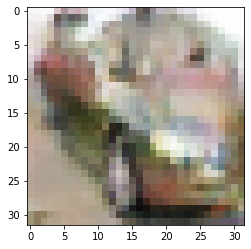

-> Epoch 430, Batch numero 1/78 -> Disc. loss on real images: 0.25543, Disc. loss on fake images: 0.19908, Generator loss: 3.71829
-> Epoch 430, Batch numero 2/78 -> Disc. loss on real images: 0.12592, Disc. loss on fake images: 0.23869, Generator loss: 4.01377
-> Epoch 430, Batch numero 3/78 -> Disc. loss on real images: 0.26486, Disc. loss on fake images: 0.20055, Generator loss: 4.14554
-> Epoch 430, Batch numero 4/78 -> Disc. loss on real images: 0.20748, Disc. loss on fake images: 0.07778, Generator loss: 3.59541
-> Epoch 430, Batch numero 5/78 -> Disc. loss on real images: 0.13497, Disc. loss on fake images: 0.51531, Generator loss: 3.82226
-> Epoch 430, Batch numero 6/78 -> Disc. loss on real images: 0.26438, Disc. loss on fake images: 0.18709, Generator loss: 4.20028
-> Epoch 430, Batch numero 7/78 -> Disc. loss on real images: 0.32621, Disc. loss on fake images: 0.18113, Generator loss: 3.21153
-> Epoch 430, Batch numero 8/78 -> Disc. loss on real images: 0.19709, Disc. loss o

-> Epoch 430, Batch numero 64/78 -> Disc. loss on real images: 0.04461, Disc. loss on fake images: 0.34943, Generator loss: 4.18950
-> Epoch 430, Batch numero 65/78 -> Disc. loss on real images: 0.21697, Disc. loss on fake images: 0.17675, Generator loss: 3.79226
-> Epoch 430, Batch numero 66/78 -> Disc. loss on real images: 0.35140, Disc. loss on fake images: 0.23358, Generator loss: 3.62188
-> Epoch 430, Batch numero 67/78 -> Disc. loss on real images: 0.14907, Disc. loss on fake images: 0.24313, Generator loss: 4.03161
-> Epoch 430, Batch numero 68/78 -> Disc. loss on real images: 0.18955, Disc. loss on fake images: 0.14565, Generator loss: 4.13650
-> Epoch 430, Batch numero 69/78 -> Disc. loss on real images: 0.14392, Disc. loss on fake images: 0.16315, Generator loss: 4.15458
-> Epoch 430, Batch numero 70/78 -> Disc. loss on real images: 0.12964, Disc. loss on fake images: 0.21943, Generator loss: 4.40840
-> Epoch 430, Batch numero 71/78 -> Disc. loss on real images: 0.15757, Disc

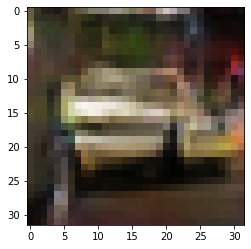

-> Epoch 431, Batch numero 1/78 -> Disc. loss on real images: 0.23872, Disc. loss on fake images: 0.20451, Generator loss: 3.66395
-> Epoch 431, Batch numero 2/78 -> Disc. loss on real images: 0.12896, Disc. loss on fake images: 0.13804, Generator loss: 3.46246
-> Epoch 431, Batch numero 3/78 -> Disc. loss on real images: 0.23033, Disc. loss on fake images: 0.15906, Generator loss: 3.25738
-> Epoch 431, Batch numero 4/78 -> Disc. loss on real images: 0.15399, Disc. loss on fake images: 0.10761, Generator loss: 2.86647
-> Epoch 431, Batch numero 5/78 -> Disc. loss on real images: 0.14771, Disc. loss on fake images: 0.18011, Generator loss: 3.39530
-> Epoch 431, Batch numero 6/78 -> Disc. loss on real images: 0.14533, Disc. loss on fake images: 0.34228, Generator loss: 3.43289
-> Epoch 431, Batch numero 7/78 -> Disc. loss on real images: 0.08249, Disc. loss on fake images: 0.23829, Generator loss: 4.11933
-> Epoch 431, Batch numero 8/78 -> Disc. loss on real images: 0.20239, Disc. loss o

-> Epoch 431, Batch numero 64/78 -> Disc. loss on real images: 0.15289, Disc. loss on fake images: 0.08416, Generator loss: 4.03521
-> Epoch 431, Batch numero 65/78 -> Disc. loss on real images: 0.11223, Disc. loss on fake images: 0.16883, Generator loss: 3.77173
-> Epoch 431, Batch numero 66/78 -> Disc. loss on real images: 0.17617, Disc. loss on fake images: 0.28162, Generator loss: 3.57664
-> Epoch 431, Batch numero 67/78 -> Disc. loss on real images: 0.09536, Disc. loss on fake images: 0.09724, Generator loss: 3.94557
-> Epoch 431, Batch numero 68/78 -> Disc. loss on real images: 0.20078, Disc. loss on fake images: 0.18004, Generator loss: 4.04208
-> Epoch 431, Batch numero 69/78 -> Disc. loss on real images: 0.22167, Disc. loss on fake images: 0.26149, Generator loss: 3.93806
-> Epoch 431, Batch numero 70/78 -> Disc. loss on real images: 0.24799, Disc. loss on fake images: 0.06161, Generator loss: 4.06820
-> Epoch 431, Batch numero 71/78 -> Disc. loss on real images: 0.18608, Disc

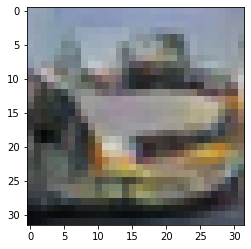

-> Epoch 432, Batch numero 1/78 -> Disc. loss on real images: 0.21846, Disc. loss on fake images: 0.19240, Generator loss: 3.81107
-> Epoch 432, Batch numero 2/78 -> Disc. loss on real images: 0.18866, Disc. loss on fake images: 0.12270, Generator loss: 3.69611
-> Epoch 432, Batch numero 3/78 -> Disc. loss on real images: 0.23471, Disc. loss on fake images: 0.18643, Generator loss: 3.31630
-> Epoch 432, Batch numero 4/78 -> Disc. loss on real images: 0.10351, Disc. loss on fake images: 0.22478, Generator loss: 3.84410
-> Epoch 432, Batch numero 5/78 -> Disc. loss on real images: 0.08544, Disc. loss on fake images: 0.13019, Generator loss: 3.83152
-> Epoch 432, Batch numero 6/78 -> Disc. loss on real images: 0.12389, Disc. loss on fake images: 0.07102, Generator loss: 3.48818
-> Epoch 432, Batch numero 7/78 -> Disc. loss on real images: 0.14797, Disc. loss on fake images: 0.30906, Generator loss: 3.56573
-> Epoch 432, Batch numero 8/78 -> Disc. loss on real images: 0.10706, Disc. loss o

-> Epoch 432, Batch numero 65/78 -> Disc. loss on real images: 0.36333, Disc. loss on fake images: 0.16123, Generator loss: 3.58245
-> Epoch 432, Batch numero 66/78 -> Disc. loss on real images: 0.17845, Disc. loss on fake images: 0.16224, Generator loss: 3.23917
-> Epoch 432, Batch numero 67/78 -> Disc. loss on real images: 0.04738, Disc. loss on fake images: 0.19799, Generator loss: 3.58092
-> Epoch 432, Batch numero 68/78 -> Disc. loss on real images: 0.15941, Disc. loss on fake images: 0.21048, Generator loss: 4.08037
-> Epoch 432, Batch numero 69/78 -> Disc. loss on real images: 0.09856, Disc. loss on fake images: 0.37468, Generator loss: 4.14302
-> Epoch 432, Batch numero 70/78 -> Disc. loss on real images: 0.16518, Disc. loss on fake images: 0.09972, Generator loss: 4.31956
-> Epoch 432, Batch numero 71/78 -> Disc. loss on real images: 0.15436, Disc. loss on fake images: 0.08992, Generator loss: 4.02548
-> Epoch 432, Batch numero 72/78 -> Disc. loss on real images: 0.11113, Disc

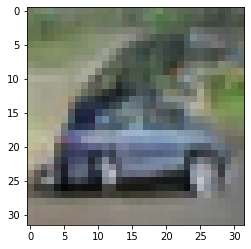

-> Epoch 433, Batch numero 1/78 -> Disc. loss on real images: 0.08002, Disc. loss on fake images: 0.23995, Generator loss: 4.62985
-> Epoch 433, Batch numero 2/78 -> Disc. loss on real images: 0.12181, Disc. loss on fake images: 0.12126, Generator loss: 4.28203
-> Epoch 433, Batch numero 3/78 -> Disc. loss on real images: 0.23333, Disc. loss on fake images: 0.16843, Generator loss: 4.09843
-> Epoch 433, Batch numero 4/78 -> Disc. loss on real images: 0.12200, Disc. loss on fake images: 0.18706, Generator loss: 4.00938
-> Epoch 433, Batch numero 5/78 -> Disc. loss on real images: 0.13977, Disc. loss on fake images: 0.33800, Generator loss: 4.01546
-> Epoch 433, Batch numero 6/78 -> Disc. loss on real images: 0.18510, Disc. loss on fake images: 0.15697, Generator loss: 4.56602
-> Epoch 433, Batch numero 7/78 -> Disc. loss on real images: 0.22258, Disc. loss on fake images: 0.27565, Generator loss: 4.10935
-> Epoch 433, Batch numero 8/78 -> Disc. loss on real images: 0.13867, Disc. loss o

-> Epoch 433, Batch numero 64/78 -> Disc. loss on real images: 0.05808, Disc. loss on fake images: 0.13880, Generator loss: 4.38160
-> Epoch 433, Batch numero 65/78 -> Disc. loss on real images: 0.25726, Disc. loss on fake images: 0.08914, Generator loss: 3.93382
-> Epoch 433, Batch numero 66/78 -> Disc. loss on real images: 0.13216, Disc. loss on fake images: 0.19001, Generator loss: 3.56166
-> Epoch 433, Batch numero 67/78 -> Disc. loss on real images: 0.18344, Disc. loss on fake images: 0.19346, Generator loss: 3.66941
-> Epoch 433, Batch numero 68/78 -> Disc. loss on real images: 0.04666, Disc. loss on fake images: 0.20220, Generator loss: 4.49235
-> Epoch 433, Batch numero 69/78 -> Disc. loss on real images: 0.35433, Disc. loss on fake images: 0.20597, Generator loss: 3.89126
-> Epoch 433, Batch numero 70/78 -> Disc. loss on real images: 0.17262, Disc. loss on fake images: 0.10749, Generator loss: 3.93980
-> Epoch 433, Batch numero 71/78 -> Disc. loss on real images: 0.27007, Disc

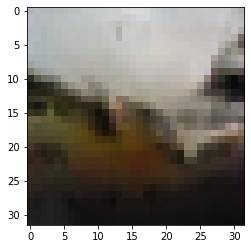

-> Epoch 434, Batch numero 1/78 -> Disc. loss on real images: 0.35213, Disc. loss on fake images: 0.11383, Generator loss: 3.61213
-> Epoch 434, Batch numero 2/78 -> Disc. loss on real images: 0.07962, Disc. loss on fake images: 0.16742, Generator loss: 3.62413
-> Epoch 434, Batch numero 3/78 -> Disc. loss on real images: 0.07476, Disc. loss on fake images: 0.22305, Generator loss: 3.35808
-> Epoch 434, Batch numero 4/78 -> Disc. loss on real images: 0.13013, Disc. loss on fake images: 0.35055, Generator loss: 4.12424
-> Epoch 434, Batch numero 5/78 -> Disc. loss on real images: 0.32118, Disc. loss on fake images: 0.08350, Generator loss: 4.08096
-> Epoch 434, Batch numero 6/78 -> Disc. loss on real images: 0.19799, Disc. loss on fake images: 0.35010, Generator loss: 3.82268
-> Epoch 434, Batch numero 7/78 -> Disc. loss on real images: 0.19031, Disc. loss on fake images: 0.25536, Generator loss: 4.42307
-> Epoch 434, Batch numero 8/78 -> Disc. loss on real images: 0.15690, Disc. loss o

-> Epoch 434, Batch numero 64/78 -> Disc. loss on real images: 0.36677, Disc. loss on fake images: 0.23935, Generator loss: 3.87477
-> Epoch 434, Batch numero 65/78 -> Disc. loss on real images: 0.18083, Disc. loss on fake images: 0.31923, Generator loss: 3.81386
-> Epoch 434, Batch numero 66/78 -> Disc. loss on real images: 0.14819, Disc. loss on fake images: 0.18302, Generator loss: 3.93449
-> Epoch 434, Batch numero 67/78 -> Disc. loss on real images: 0.16995, Disc. loss on fake images: 0.13830, Generator loss: 3.80458
-> Epoch 434, Batch numero 68/78 -> Disc. loss on real images: 0.14595, Disc. loss on fake images: 0.16071, Generator loss: 3.58155
-> Epoch 434, Batch numero 69/78 -> Disc. loss on real images: 0.14301, Disc. loss on fake images: 0.14459, Generator loss: 3.73550
-> Epoch 434, Batch numero 70/78 -> Disc. loss on real images: 0.12556, Disc. loss on fake images: 0.15139, Generator loss: 3.91555
-> Epoch 434, Batch numero 71/78 -> Disc. loss on real images: 0.15004, Disc

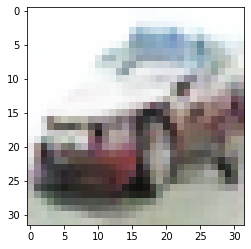

-> Epoch 435, Batch numero 1/78 -> Disc. loss on real images: 0.16401, Disc. loss on fake images: 0.15027, Generator loss: 4.27204
-> Epoch 435, Batch numero 2/78 -> Disc. loss on real images: 0.16776, Disc. loss on fake images: 0.23166, Generator loss: 4.05759
-> Epoch 435, Batch numero 3/78 -> Disc. loss on real images: 0.06585, Disc. loss on fake images: 0.06572, Generator loss: 4.17805
-> Epoch 435, Batch numero 4/78 -> Disc. loss on real images: 0.21328, Disc. loss on fake images: 0.16897, Generator loss: 3.51675
-> Epoch 435, Batch numero 5/78 -> Disc. loss on real images: 0.10395, Disc. loss on fake images: 0.14768, Generator loss: 3.75442
-> Epoch 435, Batch numero 6/78 -> Disc. loss on real images: 0.12047, Disc. loss on fake images: 0.04154, Generator loss: 3.53439
-> Epoch 435, Batch numero 7/78 -> Disc. loss on real images: 0.09564, Disc. loss on fake images: 0.34654, Generator loss: 3.78566
-> Epoch 435, Batch numero 8/78 -> Disc. loss on real images: 0.18264, Disc. loss o

-> Epoch 435, Batch numero 64/78 -> Disc. loss on real images: 0.15011, Disc. loss on fake images: 0.09145, Generator loss: 3.79302
-> Epoch 435, Batch numero 65/78 -> Disc. loss on real images: 0.20389, Disc. loss on fake images: 0.24875, Generator loss: 4.05430
-> Epoch 435, Batch numero 66/78 -> Disc. loss on real images: 0.08751, Disc. loss on fake images: 0.34725, Generator loss: 4.31970
-> Epoch 435, Batch numero 67/78 -> Disc. loss on real images: 0.18547, Disc. loss on fake images: 0.26850, Generator loss: 4.24838
-> Epoch 435, Batch numero 68/78 -> Disc. loss on real images: 0.51717, Disc. loss on fake images: 0.13419, Generator loss: 3.78393
-> Epoch 435, Batch numero 69/78 -> Disc. loss on real images: 0.11900, Disc. loss on fake images: 0.29121, Generator loss: 3.90257
-> Epoch 435, Batch numero 70/78 -> Disc. loss on real images: 0.35228, Disc. loss on fake images: 0.20935, Generator loss: 3.73821
-> Epoch 435, Batch numero 71/78 -> Disc. loss on real images: 0.14922, Disc

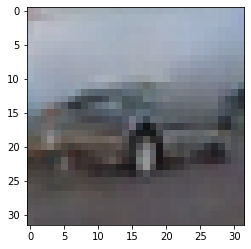

-> Epoch 436, Batch numero 1/78 -> Disc. loss on real images: 0.18597, Disc. loss on fake images: 0.30307, Generator loss: 3.82927
-> Epoch 436, Batch numero 2/78 -> Disc. loss on real images: 0.16408, Disc. loss on fake images: 0.26244, Generator loss: 3.96928
-> Epoch 436, Batch numero 3/78 -> Disc. loss on real images: 0.32847, Disc. loss on fake images: 0.23872, Generator loss: 3.88231
-> Epoch 436, Batch numero 4/78 -> Disc. loss on real images: 0.18684, Disc. loss on fake images: 0.15448, Generator loss: 3.43043
-> Epoch 436, Batch numero 5/78 -> Disc. loss on real images: 0.22358, Disc. loss on fake images: 0.09633, Generator loss: 3.66061
-> Epoch 436, Batch numero 6/78 -> Disc. loss on real images: 0.16850, Disc. loss on fake images: 0.17459, Generator loss: 3.78516
-> Epoch 436, Batch numero 7/78 -> Disc. loss on real images: 0.04739, Disc. loss on fake images: 0.14065, Generator loss: 3.76511
-> Epoch 436, Batch numero 8/78 -> Disc. loss on real images: 0.17149, Disc. loss o

-> Epoch 436, Batch numero 64/78 -> Disc. loss on real images: 0.11652, Disc. loss on fake images: 0.35529, Generator loss: 3.82823
-> Epoch 436, Batch numero 65/78 -> Disc. loss on real images: 0.16815, Disc. loss on fake images: 0.29383, Generator loss: 4.04075
-> Epoch 436, Batch numero 66/78 -> Disc. loss on real images: 0.31918, Disc. loss on fake images: 0.20700, Generator loss: 3.91343
-> Epoch 436, Batch numero 67/78 -> Disc. loss on real images: 0.14925, Disc. loss on fake images: 0.23935, Generator loss: 3.93029
-> Epoch 436, Batch numero 68/78 -> Disc. loss on real images: 0.25769, Disc. loss on fake images: 0.27933, Generator loss: 4.27982
-> Epoch 436, Batch numero 69/78 -> Disc. loss on real images: 0.25326, Disc. loss on fake images: 0.13183, Generator loss: 4.23112
-> Epoch 436, Batch numero 70/78 -> Disc. loss on real images: 0.13510, Disc. loss on fake images: 0.19773, Generator loss: 3.86693
-> Epoch 436, Batch numero 71/78 -> Disc. loss on real images: 0.12527, Disc

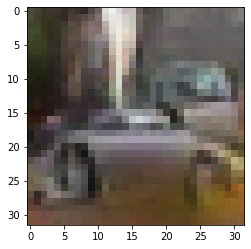

-> Epoch 437, Batch numero 1/78 -> Disc. loss on real images: 0.15211, Disc. loss on fake images: 0.10031, Generator loss: 3.19125
-> Epoch 437, Batch numero 2/78 -> Disc. loss on real images: 0.04575, Disc. loss on fake images: 0.16023, Generator loss: 3.71405
-> Epoch 437, Batch numero 3/78 -> Disc. loss on real images: 0.18489, Disc. loss on fake images: 0.16466, Generator loss: 3.76522
-> Epoch 437, Batch numero 4/78 -> Disc. loss on real images: 0.16239, Disc. loss on fake images: 0.23048, Generator loss: 4.42119
-> Epoch 437, Batch numero 5/78 -> Disc. loss on real images: 0.20916, Disc. loss on fake images: 0.11410, Generator loss: 3.90256
-> Epoch 437, Batch numero 6/78 -> Disc. loss on real images: 0.13546, Disc. loss on fake images: 0.29911, Generator loss: 4.38899
-> Epoch 437, Batch numero 7/78 -> Disc. loss on real images: 0.16144, Disc. loss on fake images: 0.45189, Generator loss: 4.02628
-> Epoch 437, Batch numero 8/78 -> Disc. loss on real images: 0.22723, Disc. loss o

-> Epoch 437, Batch numero 64/78 -> Disc. loss on real images: 0.22950, Disc. loss on fake images: 0.32136, Generator loss: 3.51316
-> Epoch 437, Batch numero 65/78 -> Disc. loss on real images: 0.05802, Disc. loss on fake images: 0.27247, Generator loss: 4.46529
-> Epoch 437, Batch numero 66/78 -> Disc. loss on real images: 0.37114, Disc. loss on fake images: 0.22040, Generator loss: 3.71221
-> Epoch 437, Batch numero 67/78 -> Disc. loss on real images: 0.26571, Disc. loss on fake images: 0.22172, Generator loss: 3.41622
-> Epoch 437, Batch numero 68/78 -> Disc. loss on real images: 0.15672, Disc. loss on fake images: 0.13917, Generator loss: 3.47817
-> Epoch 437, Batch numero 69/78 -> Disc. loss on real images: 0.16745, Disc. loss on fake images: 0.15129, Generator loss: 3.96782
-> Epoch 437, Batch numero 70/78 -> Disc. loss on real images: 0.15028, Disc. loss on fake images: 0.39060, Generator loss: 4.06234
-> Epoch 437, Batch numero 71/78 -> Disc. loss on real images: 0.22182, Disc

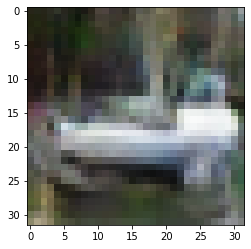

-> Epoch 438, Batch numero 1/78 -> Disc. loss on real images: 0.25041, Disc. loss on fake images: 0.16742, Generator loss: 4.10043
-> Epoch 438, Batch numero 2/78 -> Disc. loss on real images: 0.33061, Disc. loss on fake images: 0.16628, Generator loss: 3.80434
-> Epoch 438, Batch numero 3/78 -> Disc. loss on real images: 0.27517, Disc. loss on fake images: 0.30413, Generator loss: 3.88731
-> Epoch 438, Batch numero 4/78 -> Disc. loss on real images: 0.12875, Disc. loss on fake images: 0.08238, Generator loss: 4.05767
-> Epoch 438, Batch numero 5/78 -> Disc. loss on real images: 0.31701, Disc. loss on fake images: 0.11164, Generator loss: 3.73438
-> Epoch 438, Batch numero 6/78 -> Disc. loss on real images: 0.10460, Disc. loss on fake images: 0.21219, Generator loss: 3.31112
-> Epoch 438, Batch numero 7/78 -> Disc. loss on real images: 0.18277, Disc. loss on fake images: 0.29570, Generator loss: 3.34196
-> Epoch 438, Batch numero 8/78 -> Disc. loss on real images: 0.21744, Disc. loss o

-> Epoch 438, Batch numero 64/78 -> Disc. loss on real images: 0.28584, Disc. loss on fake images: 0.15865, Generator loss: 3.69448
-> Epoch 438, Batch numero 65/78 -> Disc. loss on real images: 0.12192, Disc. loss on fake images: 0.13097, Generator loss: 3.60408
-> Epoch 438, Batch numero 66/78 -> Disc. loss on real images: 0.07259, Disc. loss on fake images: 0.25696, Generator loss: 4.06384
-> Epoch 438, Batch numero 67/78 -> Disc. loss on real images: 0.13834, Disc. loss on fake images: 0.28170, Generator loss: 4.29986
-> Epoch 438, Batch numero 68/78 -> Disc. loss on real images: 0.38035, Disc. loss on fake images: 0.20031, Generator loss: 3.48869
-> Epoch 438, Batch numero 69/78 -> Disc. loss on real images: 0.07517, Disc. loss on fake images: 0.18115, Generator loss: 4.15222
-> Epoch 438, Batch numero 70/78 -> Disc. loss on real images: 0.23329, Disc. loss on fake images: 0.19732, Generator loss: 3.78862
-> Epoch 438, Batch numero 71/78 -> Disc. loss on real images: 0.29109, Disc

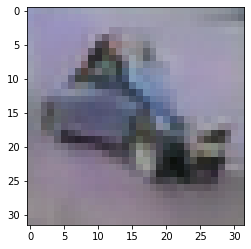

-> Epoch 439, Batch numero 1/78 -> Disc. loss on real images: 0.15696, Disc. loss on fake images: 0.18324, Generator loss: 4.11215
-> Epoch 439, Batch numero 2/78 -> Disc. loss on real images: 0.16072, Disc. loss on fake images: 0.19517, Generator loss: 4.61322
-> Epoch 439, Batch numero 3/78 -> Disc. loss on real images: 0.30238, Disc. loss on fake images: 0.17310, Generator loss: 3.63131
-> Epoch 439, Batch numero 4/78 -> Disc. loss on real images: 0.27566, Disc. loss on fake images: 0.26331, Generator loss: 3.32375
-> Epoch 439, Batch numero 5/78 -> Disc. loss on real images: 0.12889, Disc. loss on fake images: 0.39599, Generator loss: 3.74744
-> Epoch 439, Batch numero 6/78 -> Disc. loss on real images: 0.10819, Disc. loss on fake images: 0.25154, Generator loss: 4.38819
-> Epoch 439, Batch numero 7/78 -> Disc. loss on real images: 0.23081, Disc. loss on fake images: 0.13127, Generator loss: 3.66104
-> Epoch 439, Batch numero 8/78 -> Disc. loss on real images: 0.17057, Disc. loss o

-> Epoch 439, Batch numero 64/78 -> Disc. loss on real images: 0.17727, Disc. loss on fake images: 0.43272, Generator loss: 4.07413
-> Epoch 439, Batch numero 65/78 -> Disc. loss on real images: 0.28202, Disc. loss on fake images: 0.30973, Generator loss: 3.88716
-> Epoch 439, Batch numero 66/78 -> Disc. loss on real images: 0.29800, Disc. loss on fake images: 0.24476, Generator loss: 4.13166
-> Epoch 439, Batch numero 67/78 -> Disc. loss on real images: 0.09960, Disc. loss on fake images: 0.08956, Generator loss: 4.82370
-> Epoch 439, Batch numero 68/78 -> Disc. loss on real images: 0.16458, Disc. loss on fake images: 0.17068, Generator loss: 4.31286
-> Epoch 439, Batch numero 69/78 -> Disc. loss on real images: 0.23960, Disc. loss on fake images: 0.15792, Generator loss: 3.52931
-> Epoch 439, Batch numero 70/78 -> Disc. loss on real images: 0.20664, Disc. loss on fake images: 0.21053, Generator loss: 3.75323
-> Epoch 439, Batch numero 71/78 -> Disc. loss on real images: 0.08296, Disc

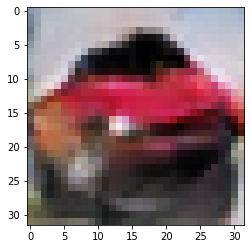

-> Epoch 440, Batch numero 1/78 -> Disc. loss on real images: 0.15990, Disc. loss on fake images: 0.14443, Generator loss: 3.90076
-> Epoch 440, Batch numero 2/78 -> Disc. loss on real images: 0.13356, Disc. loss on fake images: 0.26381, Generator loss: 4.43243
-> Epoch 440, Batch numero 3/78 -> Disc. loss on real images: 0.05767, Disc. loss on fake images: 0.25915, Generator loss: 5.08226
-> Epoch 440, Batch numero 4/78 -> Disc. loss on real images: 0.27216, Disc. loss on fake images: 0.09177, Generator loss: 4.43460
-> Epoch 440, Batch numero 5/78 -> Disc. loss on real images: 0.35702, Disc. loss on fake images: 0.54964, Generator loss: 3.78793
-> Epoch 440, Batch numero 6/78 -> Disc. loss on real images: 0.19927, Disc. loss on fake images: 0.21399, Generator loss: 3.94818
-> Epoch 440, Batch numero 7/78 -> Disc. loss on real images: 0.17642, Disc. loss on fake images: 0.35757, Generator loss: 4.56535
-> Epoch 440, Batch numero 8/78 -> Disc. loss on real images: 0.35193, Disc. loss o

-> Epoch 440, Batch numero 64/78 -> Disc. loss on real images: 0.21060, Disc. loss on fake images: 0.14237, Generator loss: 3.76192
-> Epoch 440, Batch numero 65/78 -> Disc. loss on real images: 0.07924, Disc. loss on fake images: 0.08173, Generator loss: 4.34135
-> Epoch 440, Batch numero 66/78 -> Disc. loss on real images: 0.26925, Disc. loss on fake images: 0.19624, Generator loss: 3.52523
-> Epoch 440, Batch numero 67/78 -> Disc. loss on real images: 0.11372, Disc. loss on fake images: 0.30596, Generator loss: 3.55279
-> Epoch 440, Batch numero 68/78 -> Disc. loss on real images: 0.14912, Disc. loss on fake images: 0.08667, Generator loss: 4.11464
-> Epoch 440, Batch numero 69/78 -> Disc. loss on real images: 0.14839, Disc. loss on fake images: 0.19065, Generator loss: 3.48971
-> Epoch 440, Batch numero 70/78 -> Disc. loss on real images: 0.34973, Disc. loss on fake images: 0.24296, Generator loss: 3.77687
-> Epoch 440, Batch numero 71/78 -> Disc. loss on real images: 0.07713, Disc

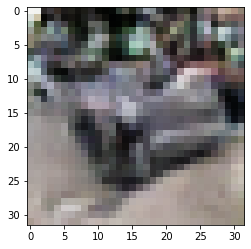

-> Epoch 441, Batch numero 1/78 -> Disc. loss on real images: 0.27369, Disc. loss on fake images: 0.11234, Generator loss: 4.18824
-> Epoch 441, Batch numero 2/78 -> Disc. loss on real images: 0.17098, Disc. loss on fake images: 0.11751, Generator loss: 3.63423
-> Epoch 441, Batch numero 3/78 -> Disc. loss on real images: 0.09028, Disc. loss on fake images: 0.30132, Generator loss: 3.38622
-> Epoch 441, Batch numero 4/78 -> Disc. loss on real images: 0.23569, Disc. loss on fake images: 0.13985, Generator loss: 3.95826
-> Epoch 441, Batch numero 5/78 -> Disc. loss on real images: 0.15597, Disc. loss on fake images: 0.16978, Generator loss: 3.88130
-> Epoch 441, Batch numero 6/78 -> Disc. loss on real images: 0.16142, Disc. loss on fake images: 0.10095, Generator loss: 3.38657
-> Epoch 441, Batch numero 7/78 -> Disc. loss on real images: 0.29621, Disc. loss on fake images: 0.33171, Generator loss: 3.44270
-> Epoch 441, Batch numero 8/78 -> Disc. loss on real images: 0.23337, Disc. loss o

-> Epoch 441, Batch numero 64/78 -> Disc. loss on real images: 0.07541, Disc. loss on fake images: 0.13523, Generator loss: 3.51169
-> Epoch 441, Batch numero 65/78 -> Disc. loss on real images: 0.14377, Disc. loss on fake images: 0.30792, Generator loss: 4.10370
-> Epoch 441, Batch numero 66/78 -> Disc. loss on real images: 0.19017, Disc. loss on fake images: 0.08887, Generator loss: 3.74946
-> Epoch 441, Batch numero 67/78 -> Disc. loss on real images: 0.07419, Disc. loss on fake images: 0.06007, Generator loss: 3.77435
-> Epoch 441, Batch numero 68/78 -> Disc. loss on real images: 0.13391, Disc. loss on fake images: 0.35517, Generator loss: 3.68443
-> Epoch 441, Batch numero 69/78 -> Disc. loss on real images: 0.17779, Disc. loss on fake images: 0.21810, Generator loss: 4.47567
-> Epoch 441, Batch numero 70/78 -> Disc. loss on real images: 0.20503, Disc. loss on fake images: 0.12627, Generator loss: 3.48118
-> Epoch 441, Batch numero 71/78 -> Disc. loss on real images: 0.15615, Disc

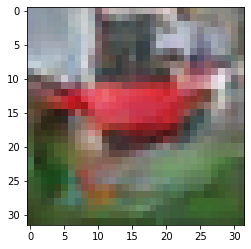

-> Epoch 442, Batch numero 1/78 -> Disc. loss on real images: 0.22784, Disc. loss on fake images: 0.09808, Generator loss: 4.38577
-> Epoch 442, Batch numero 2/78 -> Disc. loss on real images: 0.14144, Disc. loss on fake images: 0.61621, Generator loss: 4.64891
-> Epoch 442, Batch numero 3/78 -> Disc. loss on real images: 0.39712, Disc. loss on fake images: 0.14773, Generator loss: 4.50687
-> Epoch 442, Batch numero 4/78 -> Disc. loss on real images: 0.34587, Disc. loss on fake images: 0.14641, Generator loss: 3.84868
-> Epoch 442, Batch numero 5/78 -> Disc. loss on real images: 0.11891, Disc. loss on fake images: 0.63117, Generator loss: 4.24572
-> Epoch 442, Batch numero 6/78 -> Disc. loss on real images: 0.15099, Disc. loss on fake images: 0.08118, Generator loss: 3.58329
-> Epoch 442, Batch numero 7/78 -> Disc. loss on real images: 0.16721, Disc. loss on fake images: 0.27837, Generator loss: 3.61240
-> Epoch 442, Batch numero 8/78 -> Disc. loss on real images: 0.19081, Disc. loss o

-> Epoch 442, Batch numero 64/78 -> Disc. loss on real images: 0.17497, Disc. loss on fake images: 0.15162, Generator loss: 4.25439
-> Epoch 442, Batch numero 65/78 -> Disc. loss on real images: 0.03329, Disc. loss on fake images: 0.16141, Generator loss: 3.51783
-> Epoch 442, Batch numero 66/78 -> Disc. loss on real images: 0.07985, Disc. loss on fake images: 0.26171, Generator loss: 4.85188
-> Epoch 442, Batch numero 67/78 -> Disc. loss on real images: 0.26807, Disc. loss on fake images: 0.08408, Generator loss: 4.21317
-> Epoch 442, Batch numero 68/78 -> Disc. loss on real images: 0.14282, Disc. loss on fake images: 0.09874, Generator loss: 4.24621
-> Epoch 442, Batch numero 69/78 -> Disc. loss on real images: 0.15537, Disc. loss on fake images: 0.18061, Generator loss: 4.39513
-> Epoch 442, Batch numero 70/78 -> Disc. loss on real images: 0.20973, Disc. loss on fake images: 0.11738, Generator loss: 3.77365
-> Epoch 442, Batch numero 71/78 -> Disc. loss on real images: 0.06031, Disc

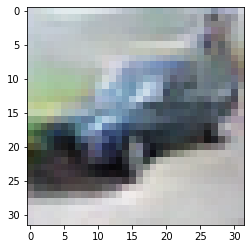

-> Epoch 443, Batch numero 1/78 -> Disc. loss on real images: 0.24771, Disc. loss on fake images: 0.24557, Generator loss: 3.96330
-> Epoch 443, Batch numero 2/78 -> Disc. loss on real images: 0.18835, Disc. loss on fake images: 0.25397, Generator loss: 3.99639
-> Epoch 443, Batch numero 3/78 -> Disc. loss on real images: 0.06502, Disc. loss on fake images: 0.12083, Generator loss: 4.33642
-> Epoch 443, Batch numero 4/78 -> Disc. loss on real images: 0.14544, Disc. loss on fake images: 0.21597, Generator loss: 4.43942
-> Epoch 443, Batch numero 5/78 -> Disc. loss on real images: 0.14032, Disc. loss on fake images: 0.21190, Generator loss: 5.36242
-> Epoch 443, Batch numero 6/78 -> Disc. loss on real images: 0.49822, Disc. loss on fake images: 0.07554, Generator loss: 3.64722
-> Epoch 443, Batch numero 7/78 -> Disc. loss on real images: 0.23112, Disc. loss on fake images: 0.41406, Generator loss: 3.86889
-> Epoch 443, Batch numero 8/78 -> Disc. loss on real images: 0.16670, Disc. loss o

-> Epoch 443, Batch numero 64/78 -> Disc. loss on real images: 0.11383, Disc. loss on fake images: 0.73934, Generator loss: 5.12462
-> Epoch 443, Batch numero 65/78 -> Disc. loss on real images: 0.35855, Disc. loss on fake images: 0.05522, Generator loss: 4.37920
-> Epoch 443, Batch numero 66/78 -> Disc. loss on real images: 0.14631, Disc. loss on fake images: 0.20013, Generator loss: 4.78792
-> Epoch 443, Batch numero 67/78 -> Disc. loss on real images: 0.12101, Disc. loss on fake images: 0.09629, Generator loss: 4.49162
-> Epoch 443, Batch numero 68/78 -> Disc. loss on real images: 0.10571, Disc. loss on fake images: 0.09016, Generator loss: 4.38393
-> Epoch 443, Batch numero 69/78 -> Disc. loss on real images: 0.10714, Disc. loss on fake images: 0.11772, Generator loss: 4.12344
-> Epoch 443, Batch numero 70/78 -> Disc. loss on real images: 0.35566, Disc. loss on fake images: 0.30351, Generator loss: 3.60049
-> Epoch 443, Batch numero 71/78 -> Disc. loss on real images: 0.16220, Disc

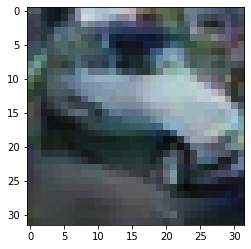

-> Epoch 444, Batch numero 1/78 -> Disc. loss on real images: 0.14189, Disc. loss on fake images: 0.18506, Generator loss: 4.16288
-> Epoch 444, Batch numero 2/78 -> Disc. loss on real images: 0.12391, Disc. loss on fake images: 0.14964, Generator loss: 3.72963
-> Epoch 444, Batch numero 3/78 -> Disc. loss on real images: 0.17244, Disc. loss on fake images: 0.18595, Generator loss: 4.21936
-> Epoch 444, Batch numero 4/78 -> Disc. loss on real images: 0.28214, Disc. loss on fake images: 0.09726, Generator loss: 3.82050
-> Epoch 444, Batch numero 5/78 -> Disc. loss on real images: 0.09168, Disc. loss on fake images: 0.20966, Generator loss: 4.00376
-> Epoch 444, Batch numero 6/78 -> Disc. loss on real images: 0.32598, Disc. loss on fake images: 0.27399, Generator loss: 4.48498
-> Epoch 444, Batch numero 7/78 -> Disc. loss on real images: 0.10814, Disc. loss on fake images: 0.09683, Generator loss: 4.30059
-> Epoch 444, Batch numero 8/78 -> Disc. loss on real images: 0.11279, Disc. loss o

-> Epoch 444, Batch numero 64/78 -> Disc. loss on real images: 0.15556, Disc. loss on fake images: 0.29667, Generator loss: 4.49772
-> Epoch 444, Batch numero 65/78 -> Disc. loss on real images: 0.42267, Disc. loss on fake images: 0.14133, Generator loss: 3.99937
-> Epoch 444, Batch numero 66/78 -> Disc. loss on real images: 0.16595, Disc. loss on fake images: 0.29335, Generator loss: 3.72505
-> Epoch 444, Batch numero 67/78 -> Disc. loss on real images: 0.12818, Disc. loss on fake images: 0.16418, Generator loss: 4.15037
-> Epoch 444, Batch numero 68/78 -> Disc. loss on real images: 0.26373, Disc. loss on fake images: 0.21304, Generator loss: 4.16617
-> Epoch 444, Batch numero 69/78 -> Disc. loss on real images: 0.15610, Disc. loss on fake images: 0.09207, Generator loss: 3.52419
-> Epoch 444, Batch numero 70/78 -> Disc. loss on real images: 0.12505, Disc. loss on fake images: 0.15894, Generator loss: 3.10733
-> Epoch 444, Batch numero 71/78 -> Disc. loss on real images: 0.12308, Disc

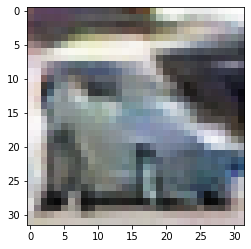

-> Epoch 445, Batch numero 1/78 -> Disc. loss on real images: 0.11380, Disc. loss on fake images: 0.15635, Generator loss: 3.71189
-> Epoch 445, Batch numero 2/78 -> Disc. loss on real images: 0.08374, Disc. loss on fake images: 0.14459, Generator loss: 4.17624
-> Epoch 445, Batch numero 3/78 -> Disc. loss on real images: 0.04099, Disc. loss on fake images: 0.26181, Generator loss: 4.24938
-> Epoch 445, Batch numero 4/78 -> Disc. loss on real images: 0.11981, Disc. loss on fake images: 0.11208, Generator loss: 4.26822
-> Epoch 445, Batch numero 5/78 -> Disc. loss on real images: 0.31079, Disc. loss on fake images: 0.19737, Generator loss: 3.82066
-> Epoch 445, Batch numero 6/78 -> Disc. loss on real images: 0.05664, Disc. loss on fake images: 0.14010, Generator loss: 4.32079
-> Epoch 445, Batch numero 7/78 -> Disc. loss on real images: 0.25371, Disc. loss on fake images: 0.18250, Generator loss: 4.12878
-> Epoch 445, Batch numero 8/78 -> Disc. loss on real images: 0.24123, Disc. loss o

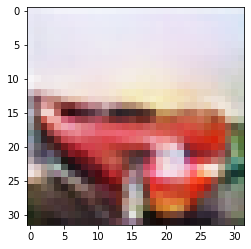

-> Epoch 446, Batch numero 1/78 -> Disc. loss on real images: 0.22722, Disc. loss on fake images: 0.07478, Generator loss: 4.27760
-> Epoch 446, Batch numero 2/78 -> Disc. loss on real images: 0.32384, Disc. loss on fake images: 0.10596, Generator loss: 4.50044
-> Epoch 446, Batch numero 3/78 -> Disc. loss on real images: 0.20301, Disc. loss on fake images: 0.38041, Generator loss: 4.51617
-> Epoch 446, Batch numero 4/78 -> Disc. loss on real images: 0.12143, Disc. loss on fake images: 0.10474, Generator loss: 3.84903
-> Epoch 446, Batch numero 5/78 -> Disc. loss on real images: 0.22067, Disc. loss on fake images: 0.19737, Generator loss: 3.75224
-> Epoch 446, Batch numero 6/78 -> Disc. loss on real images: 0.09588, Disc. loss on fake images: 0.25111, Generator loss: 4.31578
-> Epoch 446, Batch numero 7/78 -> Disc. loss on real images: 0.33477, Disc. loss on fake images: 0.28996, Generator loss: 4.35080
-> Epoch 446, Batch numero 8/78 -> Disc. loss on real images: 0.11538, Disc. loss o

-> Epoch 446, Batch numero 66/78 -> Disc. loss on real images: 0.18395, Disc. loss on fake images: 0.22115, Generator loss: 3.80327
-> Epoch 446, Batch numero 67/78 -> Disc. loss on real images: 0.15006, Disc. loss on fake images: 0.19750, Generator loss: 4.39577
-> Epoch 446, Batch numero 68/78 -> Disc. loss on real images: 0.16109, Disc. loss on fake images: 0.16163, Generator loss: 4.43333
-> Epoch 446, Batch numero 69/78 -> Disc. loss on real images: 0.38784, Disc. loss on fake images: 0.32349, Generator loss: 4.13980
-> Epoch 446, Batch numero 70/78 -> Disc. loss on real images: 0.25621, Disc. loss on fake images: 0.18702, Generator loss: 4.05078
-> Epoch 446, Batch numero 71/78 -> Disc. loss on real images: 0.16142, Disc. loss on fake images: 0.07214, Generator loss: 3.70284
-> Epoch 446, Batch numero 72/78 -> Disc. loss on real images: 0.26189, Disc. loss on fake images: 0.09120, Generator loss: 3.29184
-> Epoch 446, Batch numero 73/78 -> Disc. loss on real images: 0.04262, Disc

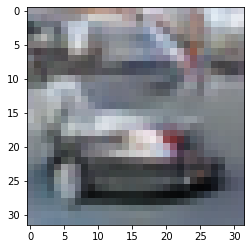

-> Epoch 447, Batch numero 1/78 -> Disc. loss on real images: 0.23480, Disc. loss on fake images: 0.61398, Generator loss: 4.17942
-> Epoch 447, Batch numero 2/78 -> Disc. loss on real images: 0.21250, Disc. loss on fake images: 0.11489, Generator loss: 4.12338
-> Epoch 447, Batch numero 3/78 -> Disc. loss on real images: 0.18676, Disc. loss on fake images: 0.13924, Generator loss: 4.24729
-> Epoch 447, Batch numero 4/78 -> Disc. loss on real images: 0.13528, Disc. loss on fake images: 0.12765, Generator loss: 3.75848
-> Epoch 447, Batch numero 5/78 -> Disc. loss on real images: 0.25947, Disc. loss on fake images: 0.16681, Generator loss: 3.57398
-> Epoch 447, Batch numero 6/78 -> Disc. loss on real images: 0.18770, Disc. loss on fake images: 0.36426, Generator loss: 3.79905
-> Epoch 447, Batch numero 7/78 -> Disc. loss on real images: 0.09770, Disc. loss on fake images: 0.11657, Generator loss: 4.55281
-> Epoch 447, Batch numero 8/78 -> Disc. loss on real images: 0.30786, Disc. loss o

-> Epoch 447, Batch numero 64/78 -> Disc. loss on real images: 0.28101, Disc. loss on fake images: 0.20165, Generator loss: 4.00672
-> Epoch 447, Batch numero 65/78 -> Disc. loss on real images: 0.16074, Disc. loss on fake images: 0.16702, Generator loss: 4.29748
-> Epoch 447, Batch numero 66/78 -> Disc. loss on real images: 0.07908, Disc. loss on fake images: 0.21874, Generator loss: 4.07946
-> Epoch 447, Batch numero 67/78 -> Disc. loss on real images: 0.31888, Disc. loss on fake images: 0.21359, Generator loss: 3.80474
-> Epoch 447, Batch numero 68/78 -> Disc. loss on real images: 0.24843, Disc. loss on fake images: 0.07998, Generator loss: 3.48931
-> Epoch 447, Batch numero 69/78 -> Disc. loss on real images: 0.06724, Disc. loss on fake images: 0.21948, Generator loss: 3.76992
-> Epoch 447, Batch numero 70/78 -> Disc. loss on real images: 0.21832, Disc. loss on fake images: 0.38741, Generator loss: 3.84038
-> Epoch 447, Batch numero 71/78 -> Disc. loss on real images: 0.09726, Disc

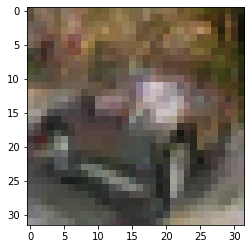

-> Epoch 448, Batch numero 1/78 -> Disc. loss on real images: 0.10735, Disc. loss on fake images: 0.11284, Generator loss: 3.78594
-> Epoch 448, Batch numero 2/78 -> Disc. loss on real images: 0.26107, Disc. loss on fake images: 0.13680, Generator loss: 3.48378
-> Epoch 448, Batch numero 3/78 -> Disc. loss on real images: 0.17382, Disc. loss on fake images: 0.14388, Generator loss: 4.03754
-> Epoch 448, Batch numero 4/78 -> Disc. loss on real images: 0.19449, Disc. loss on fake images: 0.30247, Generator loss: 3.74121
-> Epoch 448, Batch numero 5/78 -> Disc. loss on real images: 0.16736, Disc. loss on fake images: 0.13006, Generator loss: 4.02728
-> Epoch 448, Batch numero 6/78 -> Disc. loss on real images: 0.21472, Disc. loss on fake images: 0.15460, Generator loss: 3.68178
-> Epoch 448, Batch numero 7/78 -> Disc. loss on real images: 0.10360, Disc. loss on fake images: 0.29357, Generator loss: 4.23531
-> Epoch 448, Batch numero 8/78 -> Disc. loss on real images: 0.14104, Disc. loss o

-> Epoch 448, Batch numero 64/78 -> Disc. loss on real images: 0.12218, Disc. loss on fake images: 0.15167, Generator loss: 3.86221
-> Epoch 448, Batch numero 65/78 -> Disc. loss on real images: 0.21405, Disc. loss on fake images: 0.23448, Generator loss: 4.02673
-> Epoch 448, Batch numero 66/78 -> Disc. loss on real images: 0.23304, Disc. loss on fake images: 0.70685, Generator loss: 4.29344
-> Epoch 448, Batch numero 67/78 -> Disc. loss on real images: 0.28155, Disc. loss on fake images: 0.20741, Generator loss: 4.39373
-> Epoch 448, Batch numero 68/78 -> Disc. loss on real images: 0.35475, Disc. loss on fake images: 0.13941, Generator loss: 3.94136
-> Epoch 448, Batch numero 69/78 -> Disc. loss on real images: 0.14795, Disc. loss on fake images: 0.09154, Generator loss: 3.45519
-> Epoch 448, Batch numero 70/78 -> Disc. loss on real images: 0.08602, Disc. loss on fake images: 0.07981, Generator loss: 3.64109
-> Epoch 448, Batch numero 71/78 -> Disc. loss on real images: 0.18379, Disc

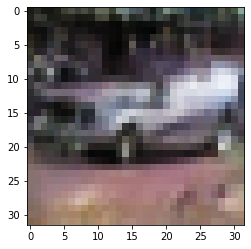

-> Epoch 449, Batch numero 1/78 -> Disc. loss on real images: 0.39545, Disc. loss on fake images: 0.05476, Generator loss: 3.31982
-> Epoch 449, Batch numero 2/78 -> Disc. loss on real images: 0.10174, Disc. loss on fake images: 0.44766, Generator loss: 3.96217
-> Epoch 449, Batch numero 3/78 -> Disc. loss on real images: 0.10178, Disc. loss on fake images: 0.24247, Generator loss: 4.25586
-> Epoch 449, Batch numero 4/78 -> Disc. loss on real images: 0.19982, Disc. loss on fake images: 0.11871, Generator loss: 4.63457
-> Epoch 449, Batch numero 5/78 -> Disc. loss on real images: 0.14212, Disc. loss on fake images: 0.14837, Generator loss: 4.19724
-> Epoch 449, Batch numero 6/78 -> Disc. loss on real images: 0.27763, Disc. loss on fake images: 0.14551, Generator loss: 3.62493
-> Epoch 449, Batch numero 7/78 -> Disc. loss on real images: 0.18103, Disc. loss on fake images: 0.44235, Generator loss: 4.73068
-> Epoch 449, Batch numero 8/78 -> Disc. loss on real images: 0.17107, Disc. loss o

-> Epoch 449, Batch numero 64/78 -> Disc. loss on real images: 0.26435, Disc. loss on fake images: 0.35723, Generator loss: 4.20048
-> Epoch 449, Batch numero 65/78 -> Disc. loss on real images: 0.24504, Disc. loss on fake images: 0.24961, Generator loss: 4.22229
-> Epoch 449, Batch numero 66/78 -> Disc. loss on real images: 0.19039, Disc. loss on fake images: 0.09328, Generator loss: 4.29199
-> Epoch 449, Batch numero 67/78 -> Disc. loss on real images: 0.15758, Disc. loss on fake images: 0.28569, Generator loss: 4.49033
-> Epoch 449, Batch numero 68/78 -> Disc. loss on real images: 0.23668, Disc. loss on fake images: 0.10470, Generator loss: 3.26586
-> Epoch 449, Batch numero 69/78 -> Disc. loss on real images: 0.06489, Disc. loss on fake images: 0.51626, Generator loss: 3.83854
-> Epoch 449, Batch numero 70/78 -> Disc. loss on real images: 0.18848, Disc. loss on fake images: 0.09021, Generator loss: 4.46846
-> Epoch 449, Batch numero 71/78 -> Disc. loss on real images: 0.24519, Disc

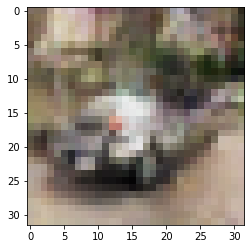

-> Epoch 450, Batch numero 1/78 -> Disc. loss on real images: 0.15299, Disc. loss on fake images: 0.11877, Generator loss: 4.66772
-> Epoch 450, Batch numero 2/78 -> Disc. loss on real images: 0.24263, Disc. loss on fake images: 0.16725, Generator loss: 4.53883
-> Epoch 450, Batch numero 3/78 -> Disc. loss on real images: 0.30696, Disc. loss on fake images: 0.22352, Generator loss: 4.23176
-> Epoch 450, Batch numero 4/78 -> Disc. loss on real images: 0.08355, Disc. loss on fake images: 0.12922, Generator loss: 4.04764
-> Epoch 450, Batch numero 5/78 -> Disc. loss on real images: 0.05591, Disc. loss on fake images: 0.22049, Generator loss: 4.72169
-> Epoch 450, Batch numero 6/78 -> Disc. loss on real images: 0.14855, Disc. loss on fake images: 0.24236, Generator loss: 5.21357
-> Epoch 450, Batch numero 7/78 -> Disc. loss on real images: 0.30001, Disc. loss on fake images: 0.11176, Generator loss: 4.40783
-> Epoch 450, Batch numero 8/78 -> Disc. loss on real images: 0.16509, Disc. loss o

-> Epoch 450, Batch numero 64/78 -> Disc. loss on real images: 0.21652, Disc. loss on fake images: 0.23793, Generator loss: 3.92008
-> Epoch 450, Batch numero 65/78 -> Disc. loss on real images: 0.19717, Disc. loss on fake images: 0.05435, Generator loss: 3.97474
-> Epoch 450, Batch numero 66/78 -> Disc. loss on real images: 0.33083, Disc. loss on fake images: 0.60713, Generator loss: 4.40570
-> Epoch 450, Batch numero 67/78 -> Disc. loss on real images: 0.16665, Disc. loss on fake images: 0.09716, Generator loss: 4.26121
-> Epoch 450, Batch numero 68/78 -> Disc. loss on real images: 0.13214, Disc. loss on fake images: 0.10442, Generator loss: 4.15529
-> Epoch 450, Batch numero 69/78 -> Disc. loss on real images: 0.08182, Disc. loss on fake images: 0.10876, Generator loss: 3.97776
-> Epoch 450, Batch numero 70/78 -> Disc. loss on real images: 0.17577, Disc. loss on fake images: 0.24275, Generator loss: 3.94036
-> Epoch 450, Batch numero 71/78 -> Disc. loss on real images: 0.31304, Disc

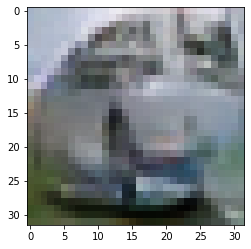

-> Epoch 451, Batch numero 1/78 -> Disc. loss on real images: 0.12905, Disc. loss on fake images: 0.17344, Generator loss: 4.46555
-> Epoch 451, Batch numero 2/78 -> Disc. loss on real images: 0.12960, Disc. loss on fake images: 0.26609, Generator loss: 4.30790
-> Epoch 451, Batch numero 3/78 -> Disc. loss on real images: 0.20644, Disc. loss on fake images: 0.09891, Generator loss: 4.26876
-> Epoch 451, Batch numero 4/78 -> Disc. loss on real images: 0.10889, Disc. loss on fake images: 0.23102, Generator loss: 3.73799
-> Epoch 451, Batch numero 5/78 -> Disc. loss on real images: 0.20039, Disc. loss on fake images: 0.14175, Generator loss: 4.10244
-> Epoch 451, Batch numero 6/78 -> Disc. loss on real images: 0.33151, Disc. loss on fake images: 0.50285, Generator loss: 4.00775
-> Epoch 451, Batch numero 7/78 -> Disc. loss on real images: 0.24412, Disc. loss on fake images: 0.23748, Generator loss: 4.00185
-> Epoch 451, Batch numero 8/78 -> Disc. loss on real images: 0.03904, Disc. loss o

-> Epoch 451, Batch numero 64/78 -> Disc. loss on real images: 0.05433, Disc. loss on fake images: 0.12232, Generator loss: 3.85174
-> Epoch 451, Batch numero 65/78 -> Disc. loss on real images: 0.11164, Disc. loss on fake images: 0.19514, Generator loss: 4.91466
-> Epoch 451, Batch numero 66/78 -> Disc. loss on real images: 0.16463, Disc. loss on fake images: 0.05351, Generator loss: 3.96820
-> Epoch 451, Batch numero 67/78 -> Disc. loss on real images: 0.17667, Disc. loss on fake images: 0.13742, Generator loss: 4.37922
-> Epoch 451, Batch numero 68/78 -> Disc. loss on real images: 0.15796, Disc. loss on fake images: 0.25524, Generator loss: 4.35458
-> Epoch 451, Batch numero 69/78 -> Disc. loss on real images: 0.07919, Disc. loss on fake images: 0.19829, Generator loss: 4.33892
-> Epoch 451, Batch numero 70/78 -> Disc. loss on real images: 0.11123, Disc. loss on fake images: 0.06691, Generator loss: 4.43399
-> Epoch 451, Batch numero 71/78 -> Disc. loss on real images: 0.22193, Disc

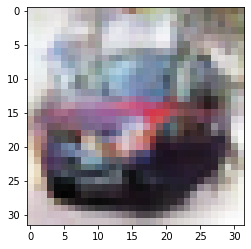

-> Epoch 452, Batch numero 1/78 -> Disc. loss on real images: 0.12643, Disc. loss on fake images: 0.25257, Generator loss: 3.88529
-> Epoch 452, Batch numero 2/78 -> Disc. loss on real images: 0.19375, Disc. loss on fake images: 0.12634, Generator loss: 4.24041
-> Epoch 452, Batch numero 3/78 -> Disc. loss on real images: 0.17682, Disc. loss on fake images: 0.22180, Generator loss: 3.63165
-> Epoch 452, Batch numero 4/78 -> Disc. loss on real images: 0.09704, Disc. loss on fake images: 0.18758, Generator loss: 4.33738
-> Epoch 452, Batch numero 5/78 -> Disc. loss on real images: 0.14947, Disc. loss on fake images: 0.06948, Generator loss: 4.29587
-> Epoch 452, Batch numero 6/78 -> Disc. loss on real images: 0.19085, Disc. loss on fake images: 0.36759, Generator loss: 3.69610
-> Epoch 452, Batch numero 7/78 -> Disc. loss on real images: 0.33930, Disc. loss on fake images: 0.21228, Generator loss: 3.80211
-> Epoch 452, Batch numero 8/78 -> Disc. loss on real images: 0.16630, Disc. loss o

-> Epoch 452, Batch numero 64/78 -> Disc. loss on real images: 0.18312, Disc. loss on fake images: 0.16263, Generator loss: 3.84942
-> Epoch 452, Batch numero 65/78 -> Disc. loss on real images: 0.13485, Disc. loss on fake images: 0.33056, Generator loss: 3.45284
-> Epoch 452, Batch numero 66/78 -> Disc. loss on real images: 0.09386, Disc. loss on fake images: 0.22222, Generator loss: 4.75058
-> Epoch 452, Batch numero 67/78 -> Disc. loss on real images: 0.31643, Disc. loss on fake images: 0.23558, Generator loss: 4.62996
-> Epoch 452, Batch numero 68/78 -> Disc. loss on real images: 0.20626, Disc. loss on fake images: 0.03544, Generator loss: 4.70088
-> Epoch 452, Batch numero 69/78 -> Disc. loss on real images: 0.30467, Disc. loss on fake images: 0.19490, Generator loss: 3.33328
-> Epoch 452, Batch numero 70/78 -> Disc. loss on real images: 0.19930, Disc. loss on fake images: 0.11431, Generator loss: 3.82407
-> Epoch 452, Batch numero 71/78 -> Disc. loss on real images: 0.05038, Disc

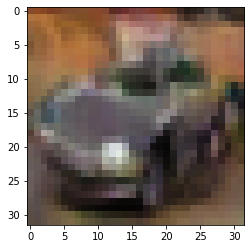

-> Epoch 453, Batch numero 1/78 -> Disc. loss on real images: 0.16399, Disc. loss on fake images: 0.19780, Generator loss: 4.48040
-> Epoch 453, Batch numero 2/78 -> Disc. loss on real images: 0.14732, Disc. loss on fake images: 0.09901, Generator loss: 4.77633
-> Epoch 453, Batch numero 3/78 -> Disc. loss on real images: 0.13455, Disc. loss on fake images: 0.05604, Generator loss: 3.32924
-> Epoch 453, Batch numero 4/78 -> Disc. loss on real images: 0.07156, Disc. loss on fake images: 0.17434, Generator loss: 3.65527
-> Epoch 453, Batch numero 5/78 -> Disc. loss on real images: 0.10800, Disc. loss on fake images: 0.12368, Generator loss: 4.31457
-> Epoch 453, Batch numero 6/78 -> Disc. loss on real images: 0.18804, Disc. loss on fake images: 0.34851, Generator loss: 4.62118
-> Epoch 453, Batch numero 7/78 -> Disc. loss on real images: 0.13503, Disc. loss on fake images: 0.09158, Generator loss: 5.03515
-> Epoch 453, Batch numero 8/78 -> Disc. loss on real images: 0.34560, Disc. loss o

-> Epoch 453, Batch numero 64/78 -> Disc. loss on real images: 0.14584, Disc. loss on fake images: 0.12894, Generator loss: 3.82824
-> Epoch 453, Batch numero 65/78 -> Disc. loss on real images: 0.13765, Disc. loss on fake images: 0.31953, Generator loss: 4.14287
-> Epoch 453, Batch numero 66/78 -> Disc. loss on real images: 0.10715, Disc. loss on fake images: 0.07831, Generator loss: 4.67334
-> Epoch 453, Batch numero 67/78 -> Disc. loss on real images: 0.20198, Disc. loss on fake images: 0.15154, Generator loss: 3.94399
-> Epoch 453, Batch numero 68/78 -> Disc. loss on real images: 0.21976, Disc. loss on fake images: 0.20482, Generator loss: 4.45447
-> Epoch 453, Batch numero 69/78 -> Disc. loss on real images: 0.16649, Disc. loss on fake images: 0.18167, Generator loss: 3.91527
-> Epoch 453, Batch numero 70/78 -> Disc. loss on real images: 0.10799, Disc. loss on fake images: 0.39009, Generator loss: 4.49185
-> Epoch 453, Batch numero 71/78 -> Disc. loss on real images: 0.14476, Disc

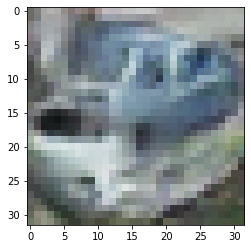

-> Epoch 454, Batch numero 1/78 -> Disc. loss on real images: 0.15297, Disc. loss on fake images: 0.18186, Generator loss: 3.69253
-> Epoch 454, Batch numero 2/78 -> Disc. loss on real images: 0.10534, Disc. loss on fake images: 0.24764, Generator loss: 4.11019
-> Epoch 454, Batch numero 3/78 -> Disc. loss on real images: 0.21812, Disc. loss on fake images: 0.15136, Generator loss: 4.12732
-> Epoch 454, Batch numero 4/78 -> Disc. loss on real images: 0.17410, Disc. loss on fake images: 0.24764, Generator loss: 3.82267
-> Epoch 454, Batch numero 5/78 -> Disc. loss on real images: 0.16304, Disc. loss on fake images: 0.08397, Generator loss: 4.35666
-> Epoch 454, Batch numero 6/78 -> Disc. loss on real images: 0.20550, Disc. loss on fake images: 0.20505, Generator loss: 3.57548
-> Epoch 454, Batch numero 7/78 -> Disc. loss on real images: 0.10629, Disc. loss on fake images: 0.16473, Generator loss: 4.32754
-> Epoch 454, Batch numero 8/78 -> Disc. loss on real images: 0.27975, Disc. loss o

-> Epoch 454, Batch numero 64/78 -> Disc. loss on real images: 0.13000, Disc. loss on fake images: 0.11401, Generator loss: 3.97144
-> Epoch 454, Batch numero 65/78 -> Disc. loss on real images: 0.14946, Disc. loss on fake images: 0.33549, Generator loss: 4.28539
-> Epoch 454, Batch numero 66/78 -> Disc. loss on real images: 0.21714, Disc. loss on fake images: 0.11426, Generator loss: 4.38567
-> Epoch 454, Batch numero 67/78 -> Disc. loss on real images: 0.24955, Disc. loss on fake images: 0.39990, Generator loss: 4.45079
-> Epoch 454, Batch numero 68/78 -> Disc. loss on real images: 0.20822, Disc. loss on fake images: 0.12401, Generator loss: 3.83158
-> Epoch 454, Batch numero 69/78 -> Disc. loss on real images: 0.21431, Disc. loss on fake images: 0.22955, Generator loss: 3.62976
-> Epoch 454, Batch numero 70/78 -> Disc. loss on real images: 0.21100, Disc. loss on fake images: 0.10650, Generator loss: 3.50919
-> Epoch 454, Batch numero 71/78 -> Disc. loss on real images: 0.11998, Disc

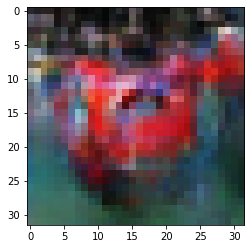

-> Epoch 455, Batch numero 1/78 -> Disc. loss on real images: 0.18511, Disc. loss on fake images: 0.24430, Generator loss: 4.00489
-> Epoch 455, Batch numero 2/78 -> Disc. loss on real images: 0.31919, Disc. loss on fake images: 0.26533, Generator loss: 4.22745
-> Epoch 455, Batch numero 3/78 -> Disc. loss on real images: 0.16123, Disc. loss on fake images: 0.21268, Generator loss: 3.48603
-> Epoch 455, Batch numero 4/78 -> Disc. loss on real images: 0.21427, Disc. loss on fake images: 0.16011, Generator loss: 3.51809
-> Epoch 455, Batch numero 5/78 -> Disc. loss on real images: 0.07103, Disc. loss on fake images: 0.16928, Generator loss: 4.34101
-> Epoch 455, Batch numero 6/78 -> Disc. loss on real images: 0.10000, Disc. loss on fake images: 0.04861, Generator loss: 3.94845
-> Epoch 455, Batch numero 7/78 -> Disc. loss on real images: 0.10370, Disc. loss on fake images: 0.09603, Generator loss: 3.96268
-> Epoch 455, Batch numero 8/78 -> Disc. loss on real images: 0.05346, Disc. loss o

-> Epoch 455, Batch numero 64/78 -> Disc. loss on real images: 0.32056, Disc. loss on fake images: 0.24782, Generator loss: 4.17903
-> Epoch 455, Batch numero 65/78 -> Disc. loss on real images: 0.13964, Disc. loss on fake images: 0.36230, Generator loss: 4.02773
-> Epoch 455, Batch numero 66/78 -> Disc. loss on real images: 0.14078, Disc. loss on fake images: 0.32119, Generator loss: 4.42105
-> Epoch 455, Batch numero 67/78 -> Disc. loss on real images: 0.14064, Disc. loss on fake images: 0.19859, Generator loss: 4.33318
-> Epoch 455, Batch numero 68/78 -> Disc. loss on real images: 0.15344, Disc. loss on fake images: 0.27208, Generator loss: 4.64083
-> Epoch 455, Batch numero 69/78 -> Disc. loss on real images: 0.21614, Disc. loss on fake images: 0.18464, Generator loss: 4.10661
-> Epoch 455, Batch numero 70/78 -> Disc. loss on real images: 0.23584, Disc. loss on fake images: 0.23004, Generator loss: 4.00207
-> Epoch 455, Batch numero 71/78 -> Disc. loss on real images: 0.12308, Disc

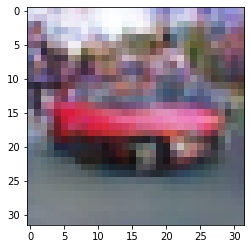

-> Epoch 456, Batch numero 1/78 -> Disc. loss on real images: 0.17736, Disc. loss on fake images: 0.18665, Generator loss: 3.88027
-> Epoch 456, Batch numero 2/78 -> Disc. loss on real images: 0.15192, Disc. loss on fake images: 0.17889, Generator loss: 3.79011
-> Epoch 456, Batch numero 3/78 -> Disc. loss on real images: 0.15553, Disc. loss on fake images: 0.35952, Generator loss: 4.02013
-> Epoch 456, Batch numero 4/78 -> Disc. loss on real images: 0.18162, Disc. loss on fake images: 0.24115, Generator loss: 3.97718
-> Epoch 456, Batch numero 5/78 -> Disc. loss on real images: 0.07387, Disc. loss on fake images: 0.30895, Generator loss: 4.68446
-> Epoch 456, Batch numero 6/78 -> Disc. loss on real images: 0.20935, Disc. loss on fake images: 0.17525, Generator loss: 4.33424
-> Epoch 456, Batch numero 7/78 -> Disc. loss on real images: 0.37192, Disc. loss on fake images: 0.29553, Generator loss: 4.51466
-> Epoch 456, Batch numero 8/78 -> Disc. loss on real images: 0.43653, Disc. loss o

-> Epoch 456, Batch numero 64/78 -> Disc. loss on real images: 0.13528, Disc. loss on fake images: 0.28284, Generator loss: 4.03542
-> Epoch 456, Batch numero 65/78 -> Disc. loss on real images: 0.45037, Disc. loss on fake images: 0.32455, Generator loss: 3.59118
-> Epoch 456, Batch numero 66/78 -> Disc. loss on real images: 0.22656, Disc. loss on fake images: 0.38796, Generator loss: 4.30000
-> Epoch 456, Batch numero 67/78 -> Disc. loss on real images: 0.15413, Disc. loss on fake images: 0.30529, Generator loss: 3.80004
-> Epoch 456, Batch numero 68/78 -> Disc. loss on real images: 0.20394, Disc. loss on fake images: 0.12329, Generator loss: 4.01528
-> Epoch 456, Batch numero 69/78 -> Disc. loss on real images: 0.09257, Disc. loss on fake images: 0.30823, Generator loss: 4.39909
-> Epoch 456, Batch numero 70/78 -> Disc. loss on real images: 0.34804, Disc. loss on fake images: 0.15746, Generator loss: 4.24339
-> Epoch 456, Batch numero 71/78 -> Disc. loss on real images: 0.11072, Disc

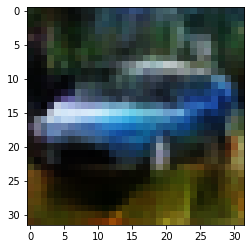

-> Epoch 457, Batch numero 1/78 -> Disc. loss on real images: 0.09209, Disc. loss on fake images: 0.17908, Generator loss: 3.44220
-> Epoch 457, Batch numero 2/78 -> Disc. loss on real images: 0.16639, Disc. loss on fake images: 0.14262, Generator loss: 3.86720
-> Epoch 457, Batch numero 3/78 -> Disc. loss on real images: 0.15787, Disc. loss on fake images: 0.26633, Generator loss: 3.76126
-> Epoch 457, Batch numero 4/78 -> Disc. loss on real images: 0.12896, Disc. loss on fake images: 0.08964, Generator loss: 3.66526
-> Epoch 457, Batch numero 5/78 -> Disc. loss on real images: 0.12390, Disc. loss on fake images: 0.16998, Generator loss: 3.71837
-> Epoch 457, Batch numero 6/78 -> Disc. loss on real images: 0.12569, Disc. loss on fake images: 0.23014, Generator loss: 4.29693
-> Epoch 457, Batch numero 7/78 -> Disc. loss on real images: 0.12250, Disc. loss on fake images: 0.09712, Generator loss: 4.53853
-> Epoch 457, Batch numero 8/78 -> Disc. loss on real images: 0.23078, Disc. loss o

-> Epoch 457, Batch numero 66/78 -> Disc. loss on real images: 0.29126, Disc. loss on fake images: 0.06877, Generator loss: 3.83687
-> Epoch 457, Batch numero 67/78 -> Disc. loss on real images: 0.11231, Disc. loss on fake images: 0.25180, Generator loss: 4.09911
-> Epoch 457, Batch numero 68/78 -> Disc. loss on real images: 0.16133, Disc. loss on fake images: 0.09977, Generator loss: 3.87193
-> Epoch 457, Batch numero 69/78 -> Disc. loss on real images: 0.24079, Disc. loss on fake images: 0.35052, Generator loss: 4.28788
-> Epoch 457, Batch numero 70/78 -> Disc. loss on real images: 0.20574, Disc. loss on fake images: 0.16972, Generator loss: 4.08248
-> Epoch 457, Batch numero 71/78 -> Disc. loss on real images: 0.12509, Disc. loss on fake images: 0.32242, Generator loss: 4.13127
-> Epoch 457, Batch numero 72/78 -> Disc. loss on real images: 0.23063, Disc. loss on fake images: 0.16748, Generator loss: 3.74852
-> Epoch 457, Batch numero 73/78 -> Disc. loss on real images: 0.17519, Disc

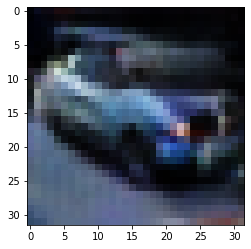

-> Epoch 458, Batch numero 1/78 -> Disc. loss on real images: 0.20319, Disc. loss on fake images: 0.31703, Generator loss: 3.72911
-> Epoch 458, Batch numero 2/78 -> Disc. loss on real images: 0.16323, Disc. loss on fake images: 0.23381, Generator loss: 3.72332
-> Epoch 458, Batch numero 3/78 -> Disc. loss on real images: 0.20486, Disc. loss on fake images: 0.27495, Generator loss: 3.60051
-> Epoch 458, Batch numero 4/78 -> Disc. loss on real images: 0.09042, Disc. loss on fake images: 0.16181, Generator loss: 4.66256
-> Epoch 458, Batch numero 5/78 -> Disc. loss on real images: 0.11192, Disc. loss on fake images: 0.31785, Generator loss: 4.85091
-> Epoch 458, Batch numero 6/78 -> Disc. loss on real images: 0.49655, Disc. loss on fake images: 0.41623, Generator loss: 4.88297
-> Epoch 458, Batch numero 7/78 -> Disc. loss on real images: 0.12236, Disc. loss on fake images: 0.11639, Generator loss: 4.78628
-> Epoch 458, Batch numero 8/78 -> Disc. loss on real images: 0.13628, Disc. loss o

-> Epoch 458, Batch numero 64/78 -> Disc. loss on real images: 0.26596, Disc. loss on fake images: 0.06908, Generator loss: 4.40138
-> Epoch 458, Batch numero 65/78 -> Disc. loss on real images: 0.22067, Disc. loss on fake images: 0.12576, Generator loss: 3.08768
-> Epoch 458, Batch numero 66/78 -> Disc. loss on real images: 0.03459, Disc. loss on fake images: 0.45899, Generator loss: 4.03572
-> Epoch 458, Batch numero 67/78 -> Disc. loss on real images: 0.21234, Disc. loss on fake images: 0.16987, Generator loss: 3.84589
-> Epoch 458, Batch numero 68/78 -> Disc. loss on real images: 0.26613, Disc. loss on fake images: 0.09600, Generator loss: 4.08361
-> Epoch 458, Batch numero 69/78 -> Disc. loss on real images: 0.09404, Disc. loss on fake images: 0.07597, Generator loss: 4.50703
-> Epoch 458, Batch numero 70/78 -> Disc. loss on real images: 0.23219, Disc. loss on fake images: 0.18446, Generator loss: 3.85322
-> Epoch 458, Batch numero 71/78 -> Disc. loss on real images: 0.07044, Disc

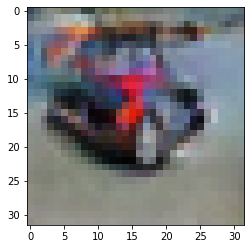

-> Epoch 459, Batch numero 1/78 -> Disc. loss on real images: 0.21844, Disc. loss on fake images: 0.05929, Generator loss: 3.47927
-> Epoch 459, Batch numero 2/78 -> Disc. loss on real images: 0.05456, Disc. loss on fake images: 0.23733, Generator loss: 3.97042
-> Epoch 459, Batch numero 3/78 -> Disc. loss on real images: 0.15852, Disc. loss on fake images: 0.13689, Generator loss: 4.36816
-> Epoch 459, Batch numero 4/78 -> Disc. loss on real images: 0.23584, Disc. loss on fake images: 0.09661, Generator loss: 3.75764
-> Epoch 459, Batch numero 5/78 -> Disc. loss on real images: 0.17111, Disc. loss on fake images: 0.22636, Generator loss: 3.53806
-> Epoch 459, Batch numero 6/78 -> Disc. loss on real images: 0.25542, Disc. loss on fake images: 0.17617, Generator loss: 3.74224
-> Epoch 459, Batch numero 7/78 -> Disc. loss on real images: 0.14868, Disc. loss on fake images: 0.23366, Generator loss: 4.16924
-> Epoch 459, Batch numero 8/78 -> Disc. loss on real images: 0.11299, Disc. loss o

-> Epoch 459, Batch numero 64/78 -> Disc. loss on real images: 0.08789, Disc. loss on fake images: 0.24041, Generator loss: 4.55814
-> Epoch 459, Batch numero 65/78 -> Disc. loss on real images: 0.34460, Disc. loss on fake images: 0.38924, Generator loss: 3.53420
-> Epoch 459, Batch numero 66/78 -> Disc. loss on real images: 0.07620, Disc. loss on fake images: 0.13725, Generator loss: 4.15148
-> Epoch 459, Batch numero 67/78 -> Disc. loss on real images: 0.36457, Disc. loss on fake images: 0.10567, Generator loss: 3.84745
-> Epoch 459, Batch numero 68/78 -> Disc. loss on real images: 0.19722, Disc. loss on fake images: 0.37196, Generator loss: 4.07502
-> Epoch 459, Batch numero 69/78 -> Disc. loss on real images: 0.10673, Disc. loss on fake images: 0.19235, Generator loss: 4.91295
-> Epoch 459, Batch numero 70/78 -> Disc. loss on real images: 0.23811, Disc. loss on fake images: 0.03351, Generator loss: 3.94422
-> Epoch 459, Batch numero 71/78 -> Disc. loss on real images: 0.17699, Disc

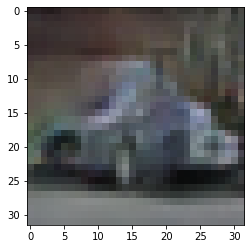

-> Epoch 460, Batch numero 1/78 -> Disc. loss on real images: 0.11796, Disc. loss on fake images: 0.11061, Generator loss: 3.66818
-> Epoch 460, Batch numero 2/78 -> Disc. loss on real images: 0.22997, Disc. loss on fake images: 0.31252, Generator loss: 4.26056
-> Epoch 460, Batch numero 3/78 -> Disc. loss on real images: 0.16466, Disc. loss on fake images: 0.41792, Generator loss: 4.11815
-> Epoch 460, Batch numero 4/78 -> Disc. loss on real images: 0.13826, Disc. loss on fake images: 0.29647, Generator loss: 4.90377
-> Epoch 460, Batch numero 5/78 -> Disc. loss on real images: 0.37036, Disc. loss on fake images: 0.29919, Generator loss: 3.92917
-> Epoch 460, Batch numero 6/78 -> Disc. loss on real images: 0.14862, Disc. loss on fake images: 0.19766, Generator loss: 4.08998
-> Epoch 460, Batch numero 7/78 -> Disc. loss on real images: 0.44550, Disc. loss on fake images: 0.28961, Generator loss: 4.07507
-> Epoch 460, Batch numero 8/78 -> Disc. loss on real images: 0.29410, Disc. loss o

-> Epoch 460, Batch numero 64/78 -> Disc. loss on real images: 0.29030, Disc. loss on fake images: 0.08936, Generator loss: 4.41693
-> Epoch 460, Batch numero 65/78 -> Disc. loss on real images: 0.04968, Disc. loss on fake images: 0.09445, Generator loss: 4.16097
-> Epoch 460, Batch numero 66/78 -> Disc. loss on real images: 0.09006, Disc. loss on fake images: 0.16815, Generator loss: 4.67694
-> Epoch 460, Batch numero 67/78 -> Disc. loss on real images: 0.15771, Disc. loss on fake images: 0.26921, Generator loss: 4.03291
-> Epoch 460, Batch numero 68/78 -> Disc. loss on real images: 0.15326, Disc. loss on fake images: 0.15758, Generator loss: 4.16727
-> Epoch 460, Batch numero 69/78 -> Disc. loss on real images: 0.34083, Disc. loss on fake images: 0.07535, Generator loss: 4.11711
-> Epoch 460, Batch numero 70/78 -> Disc. loss on real images: 0.13481, Disc. loss on fake images: 0.07409, Generator loss: 3.58941
-> Epoch 460, Batch numero 71/78 -> Disc. loss on real images: 0.07361, Disc

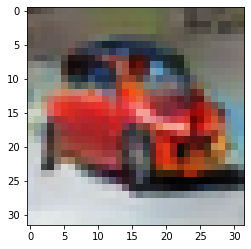

-> Epoch 461, Batch numero 1/78 -> Disc. loss on real images: 0.10223, Disc. loss on fake images: 0.11741, Generator loss: 4.12718
-> Epoch 461, Batch numero 2/78 -> Disc. loss on real images: 0.07635, Disc. loss on fake images: 0.09105, Generator loss: 4.41315
-> Epoch 461, Batch numero 3/78 -> Disc. loss on real images: 0.21564, Disc. loss on fake images: 0.13527, Generator loss: 3.75969
-> Epoch 461, Batch numero 4/78 -> Disc. loss on real images: 0.12551, Disc. loss on fake images: 0.19295, Generator loss: 3.99848
-> Epoch 461, Batch numero 5/78 -> Disc. loss on real images: 0.12596, Disc. loss on fake images: 0.18047, Generator loss: 3.74471
-> Epoch 461, Batch numero 6/78 -> Disc. loss on real images: 0.17947, Disc. loss on fake images: 0.18528, Generator loss: 3.78770
-> Epoch 461, Batch numero 7/78 -> Disc. loss on real images: 0.19466, Disc. loss on fake images: 0.16818, Generator loss: 4.47722
-> Epoch 461, Batch numero 8/78 -> Disc. loss on real images: 0.24467, Disc. loss o

-> Epoch 461, Batch numero 64/78 -> Disc. loss on real images: 0.13387, Disc. loss on fake images: 0.32386, Generator loss: 4.59827
-> Epoch 461, Batch numero 65/78 -> Disc. loss on real images: 0.21111, Disc. loss on fake images: 0.04604, Generator loss: 4.02917
-> Epoch 461, Batch numero 66/78 -> Disc. loss on real images: 0.32171, Disc. loss on fake images: 0.41439, Generator loss: 3.85424
-> Epoch 461, Batch numero 67/78 -> Disc. loss on real images: 0.07334, Disc. loss on fake images: 0.21224, Generator loss: 4.79350
-> Epoch 461, Batch numero 68/78 -> Disc. loss on real images: 0.15163, Disc. loss on fake images: 0.30864, Generator loss: 4.35149
-> Epoch 461, Batch numero 69/78 -> Disc. loss on real images: 0.41002, Disc. loss on fake images: 0.09914, Generator loss: 3.73202
-> Epoch 461, Batch numero 70/78 -> Disc. loss on real images: 0.14649, Disc. loss on fake images: 0.42961, Generator loss: 3.35592
-> Epoch 461, Batch numero 71/78 -> Disc. loss on real images: 0.05582, Disc

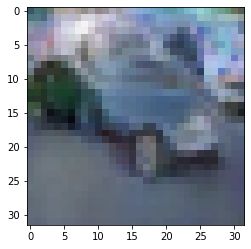

-> Epoch 462, Batch numero 1/78 -> Disc. loss on real images: 0.16333, Disc. loss on fake images: 0.11967, Generator loss: 3.90593
-> Epoch 462, Batch numero 2/78 -> Disc. loss on real images: 0.06943, Disc. loss on fake images: 0.22197, Generator loss: 4.66198
-> Epoch 462, Batch numero 3/78 -> Disc. loss on real images: 0.09828, Disc. loss on fake images: 0.10292, Generator loss: 4.83258
-> Epoch 462, Batch numero 4/78 -> Disc. loss on real images: 0.23448, Disc. loss on fake images: 0.14665, Generator loss: 4.77163
-> Epoch 462, Batch numero 5/78 -> Disc. loss on real images: 0.11889, Disc. loss on fake images: 0.25333, Generator loss: 4.17268
-> Epoch 462, Batch numero 6/78 -> Disc. loss on real images: 0.10880, Disc. loss on fake images: 0.12454, Generator loss: 4.75062
-> Epoch 462, Batch numero 7/78 -> Disc. loss on real images: 0.27248, Disc. loss on fake images: 0.20970, Generator loss: 3.66192
-> Epoch 462, Batch numero 8/78 -> Disc. loss on real images: 0.31810, Disc. loss o

-> Epoch 462, Batch numero 64/78 -> Disc. loss on real images: 0.09294, Disc. loss on fake images: 0.22969, Generator loss: 3.38660
-> Epoch 462, Batch numero 65/78 -> Disc. loss on real images: 0.07637, Disc. loss on fake images: 0.29097, Generator loss: 3.99761
-> Epoch 462, Batch numero 66/78 -> Disc. loss on real images: 0.18608, Disc. loss on fake images: 0.04844, Generator loss: 4.34466
-> Epoch 462, Batch numero 67/78 -> Disc. loss on real images: 0.11823, Disc. loss on fake images: 0.51376, Generator loss: 4.26834
-> Epoch 462, Batch numero 68/78 -> Disc. loss on real images: 0.27086, Disc. loss on fake images: 0.12621, Generator loss: 4.39501
-> Epoch 462, Batch numero 69/78 -> Disc. loss on real images: 0.31910, Disc. loss on fake images: 0.17261, Generator loss: 3.80941
-> Epoch 462, Batch numero 70/78 -> Disc. loss on real images: 0.16561, Disc. loss on fake images: 0.13266, Generator loss: 3.64399
-> Epoch 462, Batch numero 71/78 -> Disc. loss on real images: 0.07884, Disc

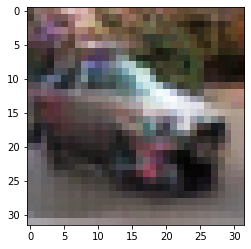

-> Epoch 463, Batch numero 1/78 -> Disc. loss on real images: 0.10955, Disc. loss on fake images: 0.12361, Generator loss: 4.79307
-> Epoch 463, Batch numero 2/78 -> Disc. loss on real images: 0.11592, Disc. loss on fake images: 0.05906, Generator loss: 4.39517
-> Epoch 463, Batch numero 3/78 -> Disc. loss on real images: 0.20127, Disc. loss on fake images: 0.05835, Generator loss: 3.89253
-> Epoch 463, Batch numero 4/78 -> Disc. loss on real images: 0.08747, Disc. loss on fake images: 0.46774, Generator loss: 4.12203
-> Epoch 463, Batch numero 5/78 -> Disc. loss on real images: 0.08784, Disc. loss on fake images: 0.22811, Generator loss: 5.00225
-> Epoch 463, Batch numero 6/78 -> Disc. loss on real images: 0.32007, Disc. loss on fake images: 0.34672, Generator loss: 3.58865
-> Epoch 463, Batch numero 7/78 -> Disc. loss on real images: 0.19119, Disc. loss on fake images: 0.10557, Generator loss: 3.95386
-> Epoch 463, Batch numero 8/78 -> Disc. loss on real images: 0.26624, Disc. loss o

-> Epoch 463, Batch numero 65/78 -> Disc. loss on real images: 0.19471, Disc. loss on fake images: 0.06944, Generator loss: 3.78917
-> Epoch 463, Batch numero 66/78 -> Disc. loss on real images: 0.19954, Disc. loss on fake images: 0.32463, Generator loss: 4.02004
-> Epoch 463, Batch numero 67/78 -> Disc. loss on real images: 0.12592, Disc. loss on fake images: 0.13260, Generator loss: 4.67819
-> Epoch 463, Batch numero 68/78 -> Disc. loss on real images: 0.15429, Disc. loss on fake images: 0.15125, Generator loss: 4.11260
-> Epoch 463, Batch numero 69/78 -> Disc. loss on real images: 0.45322, Disc. loss on fake images: 0.28821, Generator loss: 4.14194
-> Epoch 463, Batch numero 70/78 -> Disc. loss on real images: 0.22541, Disc. loss on fake images: 0.08962, Generator loss: 3.68989
-> Epoch 463, Batch numero 71/78 -> Disc. loss on real images: 0.13345, Disc. loss on fake images: 0.19360, Generator loss: 3.88530
-> Epoch 463, Batch numero 72/78 -> Disc. loss on real images: 0.14857, Disc

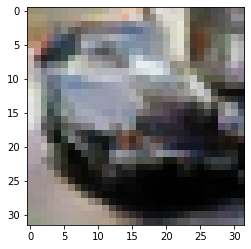

-> Epoch 464, Batch numero 1/78 -> Disc. loss on real images: 0.13110, Disc. loss on fake images: 0.08769, Generator loss: 4.48533
-> Epoch 464, Batch numero 2/78 -> Disc. loss on real images: 0.24988, Disc. loss on fake images: 0.11689, Generator loss: 3.74758
-> Epoch 464, Batch numero 3/78 -> Disc. loss on real images: 0.06202, Disc. loss on fake images: 0.13091, Generator loss: 3.63022
-> Epoch 464, Batch numero 4/78 -> Disc. loss on real images: 0.14390, Disc. loss on fake images: 0.23553, Generator loss: 4.31398
-> Epoch 464, Batch numero 5/78 -> Disc. loss on real images: 0.19892, Disc. loss on fake images: 0.14983, Generator loss: 4.11724
-> Epoch 464, Batch numero 6/78 -> Disc. loss on real images: 0.09246, Disc. loss on fake images: 0.10396, Generator loss: 4.47796
-> Epoch 464, Batch numero 7/78 -> Disc. loss on real images: 0.11177, Disc. loss on fake images: 0.18650, Generator loss: 4.26148
-> Epoch 464, Batch numero 8/78 -> Disc. loss on real images: 0.24392, Disc. loss o

-> Epoch 464, Batch numero 64/78 -> Disc. loss on real images: 0.07945, Disc. loss on fake images: 0.57889, Generator loss: 3.95002
-> Epoch 464, Batch numero 65/78 -> Disc. loss on real images: 0.28113, Disc. loss on fake images: 0.12234, Generator loss: 4.29698
-> Epoch 464, Batch numero 66/78 -> Disc. loss on real images: 0.12413, Disc. loss on fake images: 0.16612, Generator loss: 4.31665
-> Epoch 464, Batch numero 67/78 -> Disc. loss on real images: 0.26187, Disc. loss on fake images: 0.08592, Generator loss: 4.34833
-> Epoch 464, Batch numero 68/78 -> Disc. loss on real images: 0.22205, Disc. loss on fake images: 0.22274, Generator loss: 3.81898
-> Epoch 464, Batch numero 69/78 -> Disc. loss on real images: 0.10053, Disc. loss on fake images: 0.20059, Generator loss: 3.65806
-> Epoch 464, Batch numero 70/78 -> Disc. loss on real images: 0.11345, Disc. loss on fake images: 0.11386, Generator loss: 4.13819
-> Epoch 464, Batch numero 71/78 -> Disc. loss on real images: 0.17162, Disc

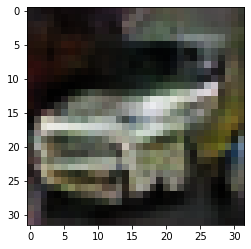

-> Epoch 465, Batch numero 1/78 -> Disc. loss on real images: 0.23436, Disc. loss on fake images: 0.29734, Generator loss: 4.62268
-> Epoch 465, Batch numero 2/78 -> Disc. loss on real images: 0.19836, Disc. loss on fake images: 0.09831, Generator loss: 4.05160
-> Epoch 465, Batch numero 3/78 -> Disc. loss on real images: 0.30773, Disc. loss on fake images: 0.13234, Generator loss: 4.65251
-> Epoch 465, Batch numero 4/78 -> Disc. loss on real images: 0.16112, Disc. loss on fake images: 0.17386, Generator loss: 3.93060
-> Epoch 465, Batch numero 5/78 -> Disc. loss on real images: 0.20574, Disc. loss on fake images: 0.30857, Generator loss: 3.61660
-> Epoch 465, Batch numero 6/78 -> Disc. loss on real images: 0.17555, Disc. loss on fake images: 0.17021, Generator loss: 4.08696
-> Epoch 465, Batch numero 7/78 -> Disc. loss on real images: 0.17117, Disc. loss on fake images: 0.16019, Generator loss: 4.40227
-> Epoch 465, Batch numero 8/78 -> Disc. loss on real images: 0.22567, Disc. loss o

-> Epoch 465, Batch numero 64/78 -> Disc. loss on real images: 0.21619, Disc. loss on fake images: 0.16706, Generator loss: 3.48212
-> Epoch 465, Batch numero 65/78 -> Disc. loss on real images: 0.11954, Disc. loss on fake images: 0.11056, Generator loss: 3.56670
-> Epoch 465, Batch numero 66/78 -> Disc. loss on real images: 0.13747, Disc. loss on fake images: 0.13902, Generator loss: 3.88944
-> Epoch 465, Batch numero 67/78 -> Disc. loss on real images: 0.09959, Disc. loss on fake images: 0.13900, Generator loss: 3.78349
-> Epoch 465, Batch numero 68/78 -> Disc. loss on real images: 0.07809, Disc. loss on fake images: 0.11526, Generator loss: 4.10903
-> Epoch 465, Batch numero 69/78 -> Disc. loss on real images: 0.20084, Disc. loss on fake images: 0.26700, Generator loss: 4.64387
-> Epoch 465, Batch numero 70/78 -> Disc. loss on real images: 0.12849, Disc. loss on fake images: 0.16424, Generator loss: 4.17888
-> Epoch 465, Batch numero 71/78 -> Disc. loss on real images: 0.16368, Disc

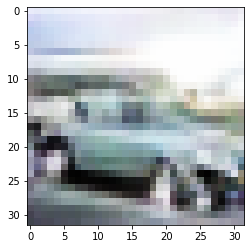

-> Epoch 466, Batch numero 1/78 -> Disc. loss on real images: 0.11243, Disc. loss on fake images: 0.30485, Generator loss: 4.33379
-> Epoch 466, Batch numero 2/78 -> Disc. loss on real images: 0.10474, Disc. loss on fake images: 0.27205, Generator loss: 4.05259
-> Epoch 466, Batch numero 3/78 -> Disc. loss on real images: 0.12254, Disc. loss on fake images: 0.24235, Generator loss: 4.39362
-> Epoch 466, Batch numero 4/78 -> Disc. loss on real images: 0.29213, Disc. loss on fake images: 0.20094, Generator loss: 4.32475
-> Epoch 466, Batch numero 5/78 -> Disc. loss on real images: 0.14162, Disc. loss on fake images: 0.27221, Generator loss: 4.19536
-> Epoch 466, Batch numero 6/78 -> Disc. loss on real images: 0.27562, Disc. loss on fake images: 0.13443, Generator loss: 4.03615
-> Epoch 466, Batch numero 7/78 -> Disc. loss on real images: 0.09129, Disc. loss on fake images: 0.18546, Generator loss: 4.41161
-> Epoch 466, Batch numero 8/78 -> Disc. loss on real images: 0.09113, Disc. loss o

-> Epoch 466, Batch numero 64/78 -> Disc. loss on real images: 0.05928, Disc. loss on fake images: 0.15156, Generator loss: 4.40687
-> Epoch 466, Batch numero 65/78 -> Disc. loss on real images: 0.28967, Disc. loss on fake images: 0.10691, Generator loss: 4.40122
-> Epoch 466, Batch numero 66/78 -> Disc. loss on real images: 0.17738, Disc. loss on fake images: 0.09099, Generator loss: 3.64797
-> Epoch 466, Batch numero 67/78 -> Disc. loss on real images: 0.13070, Disc. loss on fake images: 0.28646, Generator loss: 3.82482
-> Epoch 466, Batch numero 68/78 -> Disc. loss on real images: 0.13843, Disc. loss on fake images: 0.17068, Generator loss: 4.03579
-> Epoch 466, Batch numero 69/78 -> Disc. loss on real images: 0.06261, Disc. loss on fake images: 0.12208, Generator loss: 4.27657
-> Epoch 466, Batch numero 70/78 -> Disc. loss on real images: 0.30687, Disc. loss on fake images: 0.07435, Generator loss: 3.40390
-> Epoch 466, Batch numero 71/78 -> Disc. loss on real images: 0.04274, Disc

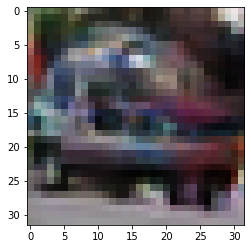

-> Epoch 467, Batch numero 1/78 -> Disc. loss on real images: 0.12258, Disc. loss on fake images: 0.12599, Generator loss: 3.80932
-> Epoch 467, Batch numero 2/78 -> Disc. loss on real images: 0.21290, Disc. loss on fake images: 0.41481, Generator loss: 4.38807
-> Epoch 467, Batch numero 3/78 -> Disc. loss on real images: 0.26665, Disc. loss on fake images: 0.12784, Generator loss: 4.08931
-> Epoch 467, Batch numero 4/78 -> Disc. loss on real images: 0.29971, Disc. loss on fake images: 0.30567, Generator loss: 4.62567
-> Epoch 467, Batch numero 5/78 -> Disc. loss on real images: 0.29521, Disc. loss on fake images: 0.40105, Generator loss: 3.57609
-> Epoch 467, Batch numero 6/78 -> Disc. loss on real images: 0.14838, Disc. loss on fake images: 0.22372, Generator loss: 5.06968
-> Epoch 467, Batch numero 7/78 -> Disc. loss on real images: 0.15871, Disc. loss on fake images: 0.17874, Generator loss: 3.97400
-> Epoch 467, Batch numero 8/78 -> Disc. loss on real images: 0.21180, Disc. loss o

-> Epoch 467, Batch numero 64/78 -> Disc. loss on real images: 0.26068, Disc. loss on fake images: 0.15434, Generator loss: 3.99614
-> Epoch 467, Batch numero 65/78 -> Disc. loss on real images: 0.07209, Disc. loss on fake images: 0.39598, Generator loss: 4.78913
-> Epoch 467, Batch numero 66/78 -> Disc. loss on real images: 0.25653, Disc. loss on fake images: 0.14305, Generator loss: 4.20564
-> Epoch 467, Batch numero 67/78 -> Disc. loss on real images: 0.19557, Disc. loss on fake images: 0.06730, Generator loss: 4.07103
-> Epoch 467, Batch numero 68/78 -> Disc. loss on real images: 0.17532, Disc. loss on fake images: 0.27845, Generator loss: 3.97206
-> Epoch 467, Batch numero 69/78 -> Disc. loss on real images: 0.07497, Disc. loss on fake images: 0.24156, Generator loss: 4.21883
-> Epoch 467, Batch numero 70/78 -> Disc. loss on real images: 0.28570, Disc. loss on fake images: 0.48994, Generator loss: 4.14697
-> Epoch 467, Batch numero 71/78 -> Disc. loss on real images: 0.33916, Disc

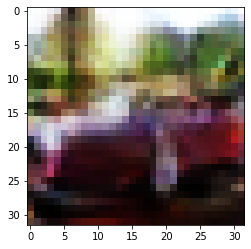

-> Epoch 468, Batch numero 1/78 -> Disc. loss on real images: 0.13943, Disc. loss on fake images: 0.18237, Generator loss: 4.28430
-> Epoch 468, Batch numero 2/78 -> Disc. loss on real images: 0.15213, Disc. loss on fake images: 0.18825, Generator loss: 3.96245
-> Epoch 468, Batch numero 3/78 -> Disc. loss on real images: 0.17283, Disc. loss on fake images: 0.24551, Generator loss: 4.22456
-> Epoch 468, Batch numero 4/78 -> Disc. loss on real images: 0.14401, Disc. loss on fake images: 0.13100, Generator loss: 4.29376
-> Epoch 468, Batch numero 5/78 -> Disc. loss on real images: 0.09822, Disc. loss on fake images: 0.22568, Generator loss: 4.65178
-> Epoch 468, Batch numero 6/78 -> Disc. loss on real images: 0.20830, Disc. loss on fake images: 0.11357, Generator loss: 4.48939
-> Epoch 468, Batch numero 7/78 -> Disc. loss on real images: 0.23172, Disc. loss on fake images: 0.11906, Generator loss: 3.82845
-> Epoch 468, Batch numero 8/78 -> Disc. loss on real images: 0.06014, Disc. loss o

-> Epoch 468, Batch numero 64/78 -> Disc. loss on real images: 0.18319, Disc. loss on fake images: 0.23723, Generator loss: 3.68908
-> Epoch 468, Batch numero 65/78 -> Disc. loss on real images: 0.15463, Disc. loss on fake images: 0.18042, Generator loss: 4.01515
-> Epoch 468, Batch numero 66/78 -> Disc. loss on real images: 0.26145, Disc. loss on fake images: 0.27158, Generator loss: 3.58465
-> Epoch 468, Batch numero 67/78 -> Disc. loss on real images: 0.08530, Disc. loss on fake images: 0.10947, Generator loss: 4.07960
-> Epoch 468, Batch numero 68/78 -> Disc. loss on real images: 0.26400, Disc. loss on fake images: 0.19095, Generator loss: 4.22652
-> Epoch 468, Batch numero 69/78 -> Disc. loss on real images: 0.23530, Disc. loss on fake images: 0.16385, Generator loss: 4.63701
-> Epoch 468, Batch numero 70/78 -> Disc. loss on real images: 0.12329, Disc. loss on fake images: 0.14360, Generator loss: 4.49009
-> Epoch 468, Batch numero 71/78 -> Disc. loss on real images: 0.12677, Disc

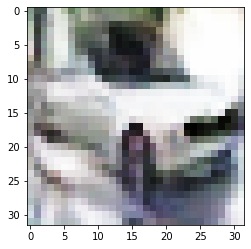

-> Epoch 469, Batch numero 1/78 -> Disc. loss on real images: 0.24540, Disc. loss on fake images: 0.20319, Generator loss: 4.21469
-> Epoch 469, Batch numero 2/78 -> Disc. loss on real images: 0.21682, Disc. loss on fake images: 0.27313, Generator loss: 3.92748
-> Epoch 469, Batch numero 3/78 -> Disc. loss on real images: 0.16876, Disc. loss on fake images: 0.20559, Generator loss: 4.42678
-> Epoch 469, Batch numero 4/78 -> Disc. loss on real images: 0.15540, Disc. loss on fake images: 0.17661, Generator loss: 4.52254
-> Epoch 469, Batch numero 5/78 -> Disc. loss on real images: 0.26083, Disc. loss on fake images: 0.16745, Generator loss: 4.68309
-> Epoch 469, Batch numero 6/78 -> Disc. loss on real images: 0.33785, Disc. loss on fake images: 0.23963, Generator loss: 3.42318
-> Epoch 469, Batch numero 7/78 -> Disc. loss on real images: 0.07626, Disc. loss on fake images: 0.09746, Generator loss: 3.72869
-> Epoch 469, Batch numero 8/78 -> Disc. loss on real images: 0.06412, Disc. loss o

-> Epoch 469, Batch numero 64/78 -> Disc. loss on real images: 0.22963, Disc. loss on fake images: 0.27066, Generator loss: 4.32273
-> Epoch 469, Batch numero 65/78 -> Disc. loss on real images: 0.14331, Disc. loss on fake images: 0.19478, Generator loss: 4.70387
-> Epoch 469, Batch numero 66/78 -> Disc. loss on real images: 0.14594, Disc. loss on fake images: 0.07639, Generator loss: 4.68495
-> Epoch 469, Batch numero 67/78 -> Disc. loss on real images: 0.12774, Disc. loss on fake images: 0.12800, Generator loss: 4.04340
-> Epoch 469, Batch numero 68/78 -> Disc. loss on real images: 0.36919, Disc. loss on fake images: 0.21221, Generator loss: 3.89748
-> Epoch 469, Batch numero 69/78 -> Disc. loss on real images: 0.13347, Disc. loss on fake images: 0.21724, Generator loss: 3.45302
-> Epoch 469, Batch numero 70/78 -> Disc. loss on real images: 0.11139, Disc. loss on fake images: 0.26668, Generator loss: 3.81776
-> Epoch 469, Batch numero 71/78 -> Disc. loss on real images: 0.09467, Disc

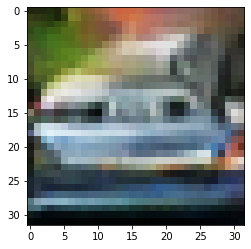

-> Epoch 470, Batch numero 1/78 -> Disc. loss on real images: 0.06726, Disc. loss on fake images: 0.27590, Generator loss: 5.27568
-> Epoch 470, Batch numero 2/78 -> Disc. loss on real images: 0.13257, Disc. loss on fake images: 0.32976, Generator loss: 5.24206
-> Epoch 470, Batch numero 3/78 -> Disc. loss on real images: 0.21437, Disc. loss on fake images: 0.03209, Generator loss: 4.93945
-> Epoch 470, Batch numero 4/78 -> Disc. loss on real images: 0.21967, Disc. loss on fake images: 0.18755, Generator loss: 4.24943
-> Epoch 470, Batch numero 5/78 -> Disc. loss on real images: 0.09012, Disc. loss on fake images: 0.12815, Generator loss: 4.18808
-> Epoch 470, Batch numero 6/78 -> Disc. loss on real images: 0.16048, Disc. loss on fake images: 0.17694, Generator loss: 4.26836
-> Epoch 470, Batch numero 7/78 -> Disc. loss on real images: 0.10720, Disc. loss on fake images: 0.16432, Generator loss: 4.16057
-> Epoch 470, Batch numero 8/78 -> Disc. loss on real images: 0.12078, Disc. loss o

-> Epoch 470, Batch numero 65/78 -> Disc. loss on real images: 0.06797, Disc. loss on fake images: 0.21131, Generator loss: 4.13600
-> Epoch 470, Batch numero 66/78 -> Disc. loss on real images: 0.31608, Disc. loss on fake images: 0.29173, Generator loss: 4.57633
-> Epoch 470, Batch numero 67/78 -> Disc. loss on real images: 0.15846, Disc. loss on fake images: 0.12902, Generator loss: 4.45898
-> Epoch 470, Batch numero 68/78 -> Disc. loss on real images: 0.29363, Disc. loss on fake images: 0.19422, Generator loss: 4.63192
-> Epoch 470, Batch numero 69/78 -> Disc. loss on real images: 0.23458, Disc. loss on fake images: 0.56113, Generator loss: 4.12637
-> Epoch 470, Batch numero 70/78 -> Disc. loss on real images: 0.18060, Disc. loss on fake images: 0.19997, Generator loss: 4.39109
-> Epoch 470, Batch numero 71/78 -> Disc. loss on real images: 0.11098, Disc. loss on fake images: 0.29287, Generator loss: 4.94444
-> Epoch 470, Batch numero 72/78 -> Disc. loss on real images: 0.05542, Disc

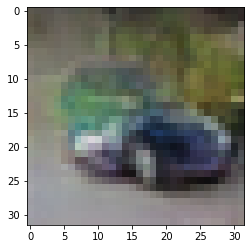

-> Epoch 471, Batch numero 1/78 -> Disc. loss on real images: 0.20026, Disc. loss on fake images: 0.23709, Generator loss: 4.12786
-> Epoch 471, Batch numero 2/78 -> Disc. loss on real images: 0.03747, Disc. loss on fake images: 0.16842, Generator loss: 4.44752
-> Epoch 471, Batch numero 3/78 -> Disc. loss on real images: 0.15506, Disc. loss on fake images: 0.15066, Generator loss: 4.70954
-> Epoch 471, Batch numero 4/78 -> Disc. loss on real images: 0.09218, Disc. loss on fake images: 0.12341, Generator loss: 4.41319
-> Epoch 471, Batch numero 5/78 -> Disc. loss on real images: 0.16782, Disc. loss on fake images: 0.13992, Generator loss: 3.67209
-> Epoch 471, Batch numero 6/78 -> Disc. loss on real images: 0.06950, Disc. loss on fake images: 0.10179, Generator loss: 4.55406
-> Epoch 471, Batch numero 7/78 -> Disc. loss on real images: 0.21333, Disc. loss on fake images: 0.17148, Generator loss: 4.42645
-> Epoch 471, Batch numero 8/78 -> Disc. loss on real images: 0.11618, Disc. loss o

-> Epoch 471, Batch numero 64/78 -> Disc. loss on real images: 0.13134, Disc. loss on fake images: 0.29145, Generator loss: 4.94570
-> Epoch 471, Batch numero 65/78 -> Disc. loss on real images: 0.12719, Disc. loss on fake images: 0.12364, Generator loss: 4.86123
-> Epoch 471, Batch numero 66/78 -> Disc. loss on real images: 0.61623, Disc. loss on fake images: 0.23847, Generator loss: 3.81192
-> Epoch 471, Batch numero 67/78 -> Disc. loss on real images: 0.04494, Disc. loss on fake images: 0.47199, Generator loss: 4.34544
-> Epoch 471, Batch numero 68/78 -> Disc. loss on real images: 0.11887, Disc. loss on fake images: 0.11619, Generator loss: 4.67911
-> Epoch 471, Batch numero 69/78 -> Disc. loss on real images: 0.39241, Disc. loss on fake images: 0.14580, Generator loss: 4.13143
-> Epoch 471, Batch numero 70/78 -> Disc. loss on real images: 0.07235, Disc. loss on fake images: 0.36934, Generator loss: 4.27316
-> Epoch 471, Batch numero 71/78 -> Disc. loss on real images: 0.20842, Disc

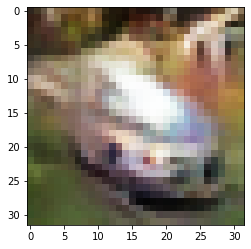

-> Epoch 472, Batch numero 1/78 -> Disc. loss on real images: 0.20596, Disc. loss on fake images: 0.05291, Generator loss: 4.17995
-> Epoch 472, Batch numero 2/78 -> Disc. loss on real images: 0.40969, Disc. loss on fake images: 0.05254, Generator loss: 3.71813
-> Epoch 472, Batch numero 3/78 -> Disc. loss on real images: 0.05538, Disc. loss on fake images: 0.31080, Generator loss: 3.63547
-> Epoch 472, Batch numero 4/78 -> Disc. loss on real images: 0.10713, Disc. loss on fake images: 0.31236, Generator loss: 4.10282
-> Epoch 472, Batch numero 5/78 -> Disc. loss on real images: 0.14596, Disc. loss on fake images: 0.10723, Generator loss: 4.18678
-> Epoch 472, Batch numero 6/78 -> Disc. loss on real images: 0.20169, Disc. loss on fake images: 0.07033, Generator loss: 4.02073
-> Epoch 472, Batch numero 7/78 -> Disc. loss on real images: 0.12285, Disc. loss on fake images: 0.17700, Generator loss: 4.30061
-> Epoch 472, Batch numero 8/78 -> Disc. loss on real images: 0.17865, Disc. loss o

-> Epoch 472, Batch numero 64/78 -> Disc. loss on real images: 0.35114, Disc. loss on fake images: 0.34975, Generator loss: 4.31373
-> Epoch 472, Batch numero 65/78 -> Disc. loss on real images: 0.16905, Disc. loss on fake images: 0.12690, Generator loss: 4.12512
-> Epoch 472, Batch numero 66/78 -> Disc. loss on real images: 0.12509, Disc. loss on fake images: 0.20111, Generator loss: 4.11833
-> Epoch 472, Batch numero 67/78 -> Disc. loss on real images: 0.19061, Disc. loss on fake images: 0.27971, Generator loss: 4.03682
-> Epoch 472, Batch numero 68/78 -> Disc. loss on real images: 0.19923, Disc. loss on fake images: 0.15396, Generator loss: 3.49737
-> Epoch 472, Batch numero 69/78 -> Disc. loss on real images: 0.09233, Disc. loss on fake images: 0.15441, Generator loss: 4.04118
-> Epoch 472, Batch numero 70/78 -> Disc. loss on real images: 0.11581, Disc. loss on fake images: 0.16704, Generator loss: 4.04768
-> Epoch 472, Batch numero 71/78 -> Disc. loss on real images: 0.08593, Disc

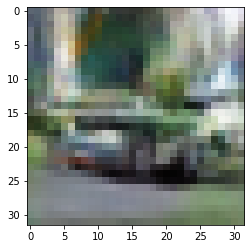

-> Epoch 473, Batch numero 1/78 -> Disc. loss on real images: 0.06305, Disc. loss on fake images: 0.17642, Generator loss: 4.56581
-> Epoch 473, Batch numero 2/78 -> Disc. loss on real images: 0.22200, Disc. loss on fake images: 0.09346, Generator loss: 4.42828
-> Epoch 473, Batch numero 3/78 -> Disc. loss on real images: 0.24686, Disc. loss on fake images: 0.27937, Generator loss: 4.29527
-> Epoch 473, Batch numero 4/78 -> Disc. loss on real images: 0.22354, Disc. loss on fake images: 0.24839, Generator loss: 4.53005
-> Epoch 473, Batch numero 5/78 -> Disc. loss on real images: 0.02301, Disc. loss on fake images: 0.38523, Generator loss: 4.11725
-> Epoch 473, Batch numero 6/78 -> Disc. loss on real images: 0.29406, Disc. loss on fake images: 0.16181, Generator loss: 4.73645
-> Epoch 473, Batch numero 7/78 -> Disc. loss on real images: 0.40563, Disc. loss on fake images: 0.20914, Generator loss: 4.29311
-> Epoch 473, Batch numero 8/78 -> Disc. loss on real images: 0.10584, Disc. loss o

-> Epoch 473, Batch numero 64/78 -> Disc. loss on real images: 0.11374, Disc. loss on fake images: 0.34764, Generator loss: 4.22538
-> Epoch 473, Batch numero 65/78 -> Disc. loss on real images: 0.28698, Disc. loss on fake images: 0.07952, Generator loss: 4.29279
-> Epoch 473, Batch numero 66/78 -> Disc. loss on real images: 0.17534, Disc. loss on fake images: 0.12810, Generator loss: 4.66144
-> Epoch 473, Batch numero 67/78 -> Disc. loss on real images: 0.36458, Disc. loss on fake images: 0.27686, Generator loss: 4.37881
-> Epoch 473, Batch numero 68/78 -> Disc. loss on real images: 0.09672, Disc. loss on fake images: 0.08634, Generator loss: 4.45168
-> Epoch 473, Batch numero 69/78 -> Disc. loss on real images: 0.09825, Disc. loss on fake images: 0.18081, Generator loss: 4.54441
-> Epoch 473, Batch numero 70/78 -> Disc. loss on real images: 0.18309, Disc. loss on fake images: 0.11150, Generator loss: 4.54219
-> Epoch 473, Batch numero 71/78 -> Disc. loss on real images: 0.32391, Disc

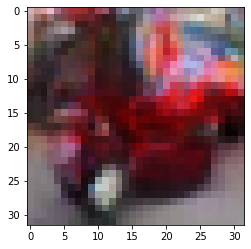

-> Epoch 474, Batch numero 1/78 -> Disc. loss on real images: 0.11104, Disc. loss on fake images: 0.11375, Generator loss: 3.49483
-> Epoch 474, Batch numero 2/78 -> Disc. loss on real images: 0.06385, Disc. loss on fake images: 0.10557, Generator loss: 3.32292
-> Epoch 474, Batch numero 3/78 -> Disc. loss on real images: 0.06028, Disc. loss on fake images: 0.17175, Generator loss: 4.63220
-> Epoch 474, Batch numero 4/78 -> Disc. loss on real images: 0.16757, Disc. loss on fake images: 0.16063, Generator loss: 3.75368
-> Epoch 474, Batch numero 5/78 -> Disc. loss on real images: 0.19315, Disc. loss on fake images: 0.17833, Generator loss: 4.14588
-> Epoch 474, Batch numero 6/78 -> Disc. loss on real images: 0.15633, Disc. loss on fake images: 0.08613, Generator loss: 4.06663
-> Epoch 474, Batch numero 7/78 -> Disc. loss on real images: 0.11614, Disc. loss on fake images: 0.06725, Generator loss: 4.26304
-> Epoch 474, Batch numero 8/78 -> Disc. loss on real images: 0.13998, Disc. loss o

-> Epoch 474, Batch numero 64/78 -> Disc. loss on real images: 0.15759, Disc. loss on fake images: 0.15523, Generator loss: 4.30456
-> Epoch 474, Batch numero 65/78 -> Disc. loss on real images: 0.10392, Disc. loss on fake images: 0.22768, Generator loss: 4.84124
-> Epoch 474, Batch numero 66/78 -> Disc. loss on real images: 0.12971, Disc. loss on fake images: 0.14956, Generator loss: 4.15792
-> Epoch 474, Batch numero 67/78 -> Disc. loss on real images: 0.19802, Disc. loss on fake images: 0.12502, Generator loss: 4.30143
-> Epoch 474, Batch numero 68/78 -> Disc. loss on real images: 0.17477, Disc. loss on fake images: 0.12239, Generator loss: 4.20601
-> Epoch 474, Batch numero 69/78 -> Disc. loss on real images: 0.08666, Disc. loss on fake images: 0.08734, Generator loss: 4.10017
-> Epoch 474, Batch numero 70/78 -> Disc. loss on real images: 0.13032, Disc. loss on fake images: 0.13941, Generator loss: 4.24225
-> Epoch 474, Batch numero 71/78 -> Disc. loss on real images: 0.08573, Disc

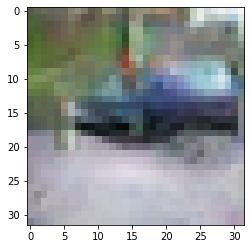

-> Epoch 475, Batch numero 1/78 -> Disc. loss on real images: 0.14397, Disc. loss on fake images: 0.12010, Generator loss: 4.23565
-> Epoch 475, Batch numero 2/78 -> Disc. loss on real images: 0.06027, Disc. loss on fake images: 0.17898, Generator loss: 4.86427
-> Epoch 475, Batch numero 3/78 -> Disc. loss on real images: 0.13349, Disc. loss on fake images: 0.11994, Generator loss: 4.88206
-> Epoch 475, Batch numero 4/78 -> Disc. loss on real images: 0.10739, Disc. loss on fake images: 0.10624, Generator loss: 4.23154
-> Epoch 475, Batch numero 5/78 -> Disc. loss on real images: 0.18026, Disc. loss on fake images: 0.16435, Generator loss: 4.20278
-> Epoch 475, Batch numero 6/78 -> Disc. loss on real images: 0.22319, Disc. loss on fake images: 0.12354, Generator loss: 3.96467
-> Epoch 475, Batch numero 7/78 -> Disc. loss on real images: 0.20079, Disc. loss on fake images: 0.22241, Generator loss: 4.13443
-> Epoch 475, Batch numero 8/78 -> Disc. loss on real images: 0.06251, Disc. loss o

-> Epoch 475, Batch numero 64/78 -> Disc. loss on real images: 0.28726, Disc. loss on fake images: 0.26348, Generator loss: 5.07753
-> Epoch 475, Batch numero 65/78 -> Disc. loss on real images: 0.18732, Disc. loss on fake images: 0.06054, Generator loss: 4.78633
-> Epoch 475, Batch numero 66/78 -> Disc. loss on real images: 0.17193, Disc. loss on fake images: 0.11861, Generator loss: 4.38228
-> Epoch 475, Batch numero 67/78 -> Disc. loss on real images: 0.37454, Disc. loss on fake images: 0.25116, Generator loss: 3.83264
-> Epoch 475, Batch numero 68/78 -> Disc. loss on real images: 0.03632, Disc. loss on fake images: 0.16831, Generator loss: 4.21640
-> Epoch 475, Batch numero 69/78 -> Disc. loss on real images: 0.32309, Disc. loss on fake images: 0.34979, Generator loss: 3.88267
-> Epoch 475, Batch numero 70/78 -> Disc. loss on real images: 0.17729, Disc. loss on fake images: 0.19939, Generator loss: 4.22052
-> Epoch 475, Batch numero 71/78 -> Disc. loss on real images: 0.15783, Disc

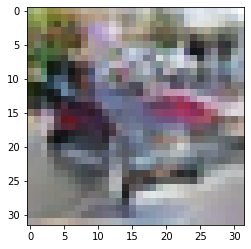

-> Epoch 476, Batch numero 1/78 -> Disc. loss on real images: 0.07837, Disc. loss on fake images: 0.17662, Generator loss: 4.24035
-> Epoch 476, Batch numero 2/78 -> Disc. loss on real images: 0.15520, Disc. loss on fake images: 0.16803, Generator loss: 4.34606
-> Epoch 476, Batch numero 3/78 -> Disc. loss on real images: 0.16386, Disc. loss on fake images: 0.04598, Generator loss: 4.20639
-> Epoch 476, Batch numero 4/78 -> Disc. loss on real images: 0.24987, Disc. loss on fake images: 0.24959, Generator loss: 3.46719
-> Epoch 476, Batch numero 5/78 -> Disc. loss on real images: 0.02664, Disc. loss on fake images: 0.13027, Generator loss: 4.51282
-> Epoch 476, Batch numero 6/78 -> Disc. loss on real images: 0.15870, Disc. loss on fake images: 0.06075, Generator loss: 4.20089
-> Epoch 476, Batch numero 7/78 -> Disc. loss on real images: 0.08984, Disc. loss on fake images: 0.11255, Generator loss: 4.15399
-> Epoch 476, Batch numero 8/78 -> Disc. loss on real images: 0.37244, Disc. loss o

-> Epoch 476, Batch numero 64/78 -> Disc. loss on real images: 0.29948, Disc. loss on fake images: 0.37951, Generator loss: 4.27749
-> Epoch 476, Batch numero 65/78 -> Disc. loss on real images: 0.11748, Disc. loss on fake images: 0.09706, Generator loss: 4.14867
-> Epoch 476, Batch numero 66/78 -> Disc. loss on real images: 0.12238, Disc. loss on fake images: 0.15716, Generator loss: 4.16865
-> Epoch 476, Batch numero 67/78 -> Disc. loss on real images: 0.24524, Disc. loss on fake images: 0.36140, Generator loss: 4.69523
-> Epoch 476, Batch numero 68/78 -> Disc. loss on real images: 0.23352, Disc. loss on fake images: 0.05494, Generator loss: 3.85243
-> Epoch 476, Batch numero 69/78 -> Disc. loss on real images: 0.10669, Disc. loss on fake images: 0.16622, Generator loss: 4.25595
-> Epoch 476, Batch numero 70/78 -> Disc. loss on real images: 0.07514, Disc. loss on fake images: 0.47492, Generator loss: 4.28114
-> Epoch 476, Batch numero 71/78 -> Disc. loss on real images: 0.21217, Disc

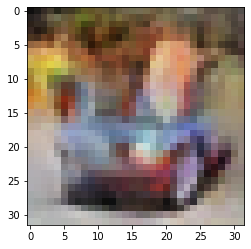

-> Epoch 477, Batch numero 1/78 -> Disc. loss on real images: 0.27434, Disc. loss on fake images: 0.24924, Generator loss: 4.20571
-> Epoch 477, Batch numero 2/78 -> Disc. loss on real images: 0.24714, Disc. loss on fake images: 0.06369, Generator loss: 3.46440
-> Epoch 477, Batch numero 3/78 -> Disc. loss on real images: 0.21333, Disc. loss on fake images: 0.50900, Generator loss: 3.78511
-> Epoch 477, Batch numero 4/78 -> Disc. loss on real images: 0.07463, Disc. loss on fake images: 0.23983, Generator loss: 4.29199
-> Epoch 477, Batch numero 5/78 -> Disc. loss on real images: 0.24800, Disc. loss on fake images: 0.14135, Generator loss: 4.16017
-> Epoch 477, Batch numero 6/78 -> Disc. loss on real images: 0.33083, Disc. loss on fake images: 0.24947, Generator loss: 3.89942
-> Epoch 477, Batch numero 7/78 -> Disc. loss on real images: 0.11170, Disc. loss on fake images: 0.38378, Generator loss: 4.59755
-> Epoch 477, Batch numero 8/78 -> Disc. loss on real images: 0.14908, Disc. loss o

-> Epoch 477, Batch numero 64/78 -> Disc. loss on real images: 0.14236, Disc. loss on fake images: 0.07969, Generator loss: 3.33254
-> Epoch 477, Batch numero 65/78 -> Disc. loss on real images: 0.09154, Disc. loss on fake images: 0.21267, Generator loss: 3.49171
-> Epoch 477, Batch numero 66/78 -> Disc. loss on real images: 0.09414, Disc. loss on fake images: 0.26212, Generator loss: 4.27289
-> Epoch 477, Batch numero 67/78 -> Disc. loss on real images: 0.09872, Disc. loss on fake images: 0.25739, Generator loss: 4.67645
-> Epoch 477, Batch numero 68/78 -> Disc. loss on real images: 0.14584, Disc. loss on fake images: 0.09159, Generator loss: 4.39401
-> Epoch 477, Batch numero 69/78 -> Disc. loss on real images: 0.23385, Disc. loss on fake images: 0.14574, Generator loss: 3.86730
-> Epoch 477, Batch numero 70/78 -> Disc. loss on real images: 0.15319, Disc. loss on fake images: 0.25408, Generator loss: 4.40684
-> Epoch 477, Batch numero 71/78 -> Disc. loss on real images: 0.18809, Disc

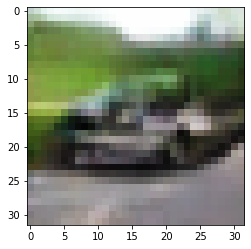

-> Epoch 478, Batch numero 1/78 -> Disc. loss on real images: 0.35239, Disc. loss on fake images: 0.24398, Generator loss: 4.31165
-> Epoch 478, Batch numero 2/78 -> Disc. loss on real images: 0.20756, Disc. loss on fake images: 0.15395, Generator loss: 4.21158
-> Epoch 478, Batch numero 3/78 -> Disc. loss on real images: 0.15681, Disc. loss on fake images: 0.09615, Generator loss: 4.22516
-> Epoch 478, Batch numero 4/78 -> Disc. loss on real images: 0.22268, Disc. loss on fake images: 0.13712, Generator loss: 4.10613
-> Epoch 478, Batch numero 5/78 -> Disc. loss on real images: 0.05596, Disc. loss on fake images: 0.16317, Generator loss: 4.32963
-> Epoch 478, Batch numero 6/78 -> Disc. loss on real images: 0.05216, Disc. loss on fake images: 0.08130, Generator loss: 4.39706
-> Epoch 478, Batch numero 7/78 -> Disc. loss on real images: 0.07059, Disc. loss on fake images: 0.10544, Generator loss: 4.43967
-> Epoch 478, Batch numero 8/78 -> Disc. loss on real images: 0.15907, Disc. loss o

-> Epoch 478, Batch numero 64/78 -> Disc. loss on real images: 0.30532, Disc. loss on fake images: 0.23128, Generator loss: 3.75879
-> Epoch 478, Batch numero 65/78 -> Disc. loss on real images: 0.10525, Disc. loss on fake images: 0.07193, Generator loss: 3.98245
-> Epoch 478, Batch numero 66/78 -> Disc. loss on real images: 0.10195, Disc. loss on fake images: 0.26085, Generator loss: 4.26051
-> Epoch 478, Batch numero 67/78 -> Disc. loss on real images: 0.15804, Disc. loss on fake images: 0.21500, Generator loss: 4.73507
-> Epoch 478, Batch numero 68/78 -> Disc. loss on real images: 0.22049, Disc. loss on fake images: 0.12019, Generator loss: 3.79706
-> Epoch 478, Batch numero 69/78 -> Disc. loss on real images: 0.16173, Disc. loss on fake images: 0.16674, Generator loss: 4.17048
-> Epoch 478, Batch numero 70/78 -> Disc. loss on real images: 0.15326, Disc. loss on fake images: 0.10115, Generator loss: 3.75303
-> Epoch 478, Batch numero 71/78 -> Disc. loss on real images: 0.07048, Disc

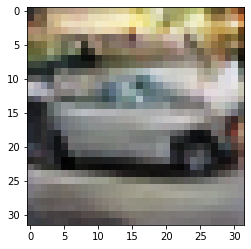

-> Epoch 479, Batch numero 1/78 -> Disc. loss on real images: 0.10498, Disc. loss on fake images: 0.19179, Generator loss: 4.19350
-> Epoch 479, Batch numero 2/78 -> Disc. loss on real images: 0.25449, Disc. loss on fake images: 0.08432, Generator loss: 4.45378
-> Epoch 479, Batch numero 3/78 -> Disc. loss on real images: 0.09715, Disc. loss on fake images: 0.20439, Generator loss: 4.36292
-> Epoch 479, Batch numero 4/78 -> Disc. loss on real images: 0.10679, Disc. loss on fake images: 0.13197, Generator loss: 4.33580
-> Epoch 479, Batch numero 5/78 -> Disc. loss on real images: 0.26847, Disc. loss on fake images: 0.25758, Generator loss: 3.71632
-> Epoch 479, Batch numero 6/78 -> Disc. loss on real images: 0.08656, Disc. loss on fake images: 0.18347, Generator loss: 4.28528
-> Epoch 479, Batch numero 7/78 -> Disc. loss on real images: 0.10130, Disc. loss on fake images: 0.30838, Generator loss: 4.92831
-> Epoch 479, Batch numero 8/78 -> Disc. loss on real images: 0.12250, Disc. loss o

-> Epoch 479, Batch numero 64/78 -> Disc. loss on real images: 0.11853, Disc. loss on fake images: 0.05611, Generator loss: 4.91188
-> Epoch 479, Batch numero 65/78 -> Disc. loss on real images: 0.07255, Disc. loss on fake images: 0.15190, Generator loss: 4.27025
-> Epoch 479, Batch numero 66/78 -> Disc. loss on real images: 0.12365, Disc. loss on fake images: 0.22200, Generator loss: 4.14117
-> Epoch 479, Batch numero 67/78 -> Disc. loss on real images: 0.06800, Disc. loss on fake images: 0.15128, Generator loss: 4.37132
-> Epoch 479, Batch numero 68/78 -> Disc. loss on real images: 0.22475, Disc. loss on fake images: 0.22558, Generator loss: 4.70761
-> Epoch 479, Batch numero 69/78 -> Disc. loss on real images: 0.17280, Disc. loss on fake images: 0.15149, Generator loss: 4.79705
-> Epoch 479, Batch numero 70/78 -> Disc. loss on real images: 0.14013, Disc. loss on fake images: 0.10519, Generator loss: 5.23674
-> Epoch 479, Batch numero 71/78 -> Disc. loss on real images: 0.16383, Disc

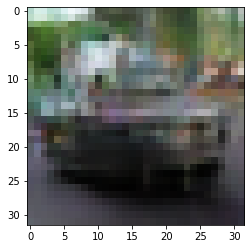

-> Epoch 480, Batch numero 1/78 -> Disc. loss on real images: 0.09416, Disc. loss on fake images: 0.07388, Generator loss: 4.40711
-> Epoch 480, Batch numero 2/78 -> Disc. loss on real images: 0.08453, Disc. loss on fake images: 0.13790, Generator loss: 4.54872
-> Epoch 480, Batch numero 3/78 -> Disc. loss on real images: 0.07202, Disc. loss on fake images: 0.04031, Generator loss: 4.19471
-> Epoch 480, Batch numero 4/78 -> Disc. loss on real images: 0.08222, Disc. loss on fake images: 0.15774, Generator loss: 4.66086
-> Epoch 480, Batch numero 5/78 -> Disc. loss on real images: 0.12549, Disc. loss on fake images: 0.15905, Generator loss: 4.30366
-> Epoch 480, Batch numero 6/78 -> Disc. loss on real images: 0.18281, Disc. loss on fake images: 0.14987, Generator loss: 4.48008
-> Epoch 480, Batch numero 7/78 -> Disc. loss on real images: 0.18177, Disc. loss on fake images: 0.19769, Generator loss: 5.03980
-> Epoch 480, Batch numero 8/78 -> Disc. loss on real images: 0.17741, Disc. loss o

-> Epoch 480, Batch numero 64/78 -> Disc. loss on real images: 0.32327, Disc. loss on fake images: 0.15679, Generator loss: 4.54748
-> Epoch 480, Batch numero 65/78 -> Disc. loss on real images: 0.11041, Disc. loss on fake images: 0.28683, Generator loss: 4.13225
-> Epoch 480, Batch numero 66/78 -> Disc. loss on real images: 0.15998, Disc. loss on fake images: 0.18419, Generator loss: 4.07867
-> Epoch 480, Batch numero 67/78 -> Disc. loss on real images: 0.17346, Disc. loss on fake images: 0.09032, Generator loss: 4.03627
-> Epoch 480, Batch numero 68/78 -> Disc. loss on real images: 0.25420, Disc. loss on fake images: 0.24790, Generator loss: 3.96030
-> Epoch 480, Batch numero 69/78 -> Disc. loss on real images: 0.06592, Disc. loss on fake images: 0.30361, Generator loss: 4.29576
-> Epoch 480, Batch numero 70/78 -> Disc. loss on real images: 0.20567, Disc. loss on fake images: 0.19597, Generator loss: 4.58773
-> Epoch 480, Batch numero 71/78 -> Disc. loss on real images: 0.25368, Disc

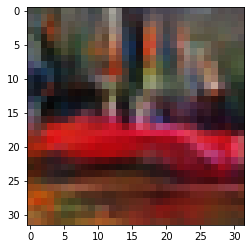

-> Epoch 481, Batch numero 1/78 -> Disc. loss on real images: 0.10383, Disc. loss on fake images: 0.23731, Generator loss: 4.25214
-> Epoch 481, Batch numero 2/78 -> Disc. loss on real images: 0.14637, Disc. loss on fake images: 0.07201, Generator loss: 4.70767
-> Epoch 481, Batch numero 3/78 -> Disc. loss on real images: 0.18748, Disc. loss on fake images: 0.11449, Generator loss: 4.27497
-> Epoch 481, Batch numero 4/78 -> Disc. loss on real images: 0.09290, Disc. loss on fake images: 0.21328, Generator loss: 4.27924
-> Epoch 481, Batch numero 5/78 -> Disc. loss on real images: 0.13083, Disc. loss on fake images: 0.12352, Generator loss: 4.74535
-> Epoch 481, Batch numero 6/78 -> Disc. loss on real images: 0.19142, Disc. loss on fake images: 0.26512, Generator loss: 4.48675
-> Epoch 481, Batch numero 7/78 -> Disc. loss on real images: 0.20703, Disc. loss on fake images: 0.12975, Generator loss: 4.36238
-> Epoch 481, Batch numero 8/78 -> Disc. loss on real images: 0.02539, Disc. loss o

-> Epoch 481, Batch numero 66/78 -> Disc. loss on real images: 0.12940, Disc. loss on fake images: 0.11495, Generator loss: 4.93281
-> Epoch 481, Batch numero 67/78 -> Disc. loss on real images: 0.21361, Disc. loss on fake images: 0.04680, Generator loss: 4.72325
-> Epoch 481, Batch numero 68/78 -> Disc. loss on real images: 0.21094, Disc. loss on fake images: 0.32260, Generator loss: 3.94557
-> Epoch 481, Batch numero 69/78 -> Disc. loss on real images: 0.14797, Disc. loss on fake images: 0.08525, Generator loss: 4.15392
-> Epoch 481, Batch numero 70/78 -> Disc. loss on real images: 0.07690, Disc. loss on fake images: 0.14455, Generator loss: 4.24681
-> Epoch 481, Batch numero 71/78 -> Disc. loss on real images: 0.20474, Disc. loss on fake images: 0.25479, Generator loss: 4.43289
-> Epoch 481, Batch numero 72/78 -> Disc. loss on real images: 0.05527, Disc. loss on fake images: 0.27543, Generator loss: 4.43766
-> Epoch 481, Batch numero 73/78 -> Disc. loss on real images: 0.28497, Disc

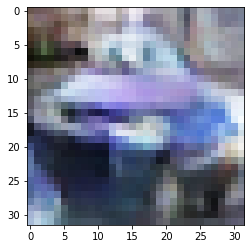

-> Epoch 482, Batch numero 1/78 -> Disc. loss on real images: 0.22122, Disc. loss on fake images: 0.13793, Generator loss: 4.14040
-> Epoch 482, Batch numero 2/78 -> Disc. loss on real images: 0.05765, Disc. loss on fake images: 0.57179, Generator loss: 4.42732
-> Epoch 482, Batch numero 3/78 -> Disc. loss on real images: 0.10334, Disc. loss on fake images: 0.12301, Generator loss: 5.20549
-> Epoch 482, Batch numero 4/78 -> Disc. loss on real images: 0.30633, Disc. loss on fake images: 0.25468, Generator loss: 4.35252
-> Epoch 482, Batch numero 5/78 -> Disc. loss on real images: 0.18285, Disc. loss on fake images: 0.16145, Generator loss: 4.45498
-> Epoch 482, Batch numero 6/78 -> Disc. loss on real images: 0.28158, Disc. loss on fake images: 0.20651, Generator loss: 4.70950
-> Epoch 482, Batch numero 7/78 -> Disc. loss on real images: 0.23833, Disc. loss on fake images: 0.17111, Generator loss: 4.16714
-> Epoch 482, Batch numero 8/78 -> Disc. loss on real images: 0.05349, Disc. loss o

-> Epoch 482, Batch numero 64/78 -> Disc. loss on real images: 0.14103, Disc. loss on fake images: 0.27092, Generator loss: 4.53227
-> Epoch 482, Batch numero 65/78 -> Disc. loss on real images: 0.28551, Disc. loss on fake images: 0.08959, Generator loss: 4.78412
-> Epoch 482, Batch numero 66/78 -> Disc. loss on real images: 0.12251, Disc. loss on fake images: 0.09977, Generator loss: 4.31356
-> Epoch 482, Batch numero 67/78 -> Disc. loss on real images: 0.14759, Disc. loss on fake images: 0.22718, Generator loss: 4.18692
-> Epoch 482, Batch numero 68/78 -> Disc. loss on real images: 0.13501, Disc. loss on fake images: 0.04857, Generator loss: 4.10582
-> Epoch 482, Batch numero 69/78 -> Disc. loss on real images: 0.08502, Disc. loss on fake images: 0.41402, Generator loss: 4.05110
-> Epoch 482, Batch numero 70/78 -> Disc. loss on real images: 0.15416, Disc. loss on fake images: 0.08354, Generator loss: 4.90466
-> Epoch 482, Batch numero 71/78 -> Disc. loss on real images: 0.12065, Disc

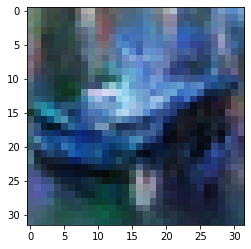

-> Epoch 483, Batch numero 1/78 -> Disc. loss on real images: 0.11799, Disc. loss on fake images: 0.17675, Generator loss: 4.71327
-> Epoch 483, Batch numero 2/78 -> Disc. loss on real images: 0.21424, Disc. loss on fake images: 0.42240, Generator loss: 4.89571
-> Epoch 483, Batch numero 3/78 -> Disc. loss on real images: 0.11492, Disc. loss on fake images: 0.21798, Generator loss: 4.88857
-> Epoch 483, Batch numero 4/78 -> Disc. loss on real images: 0.30514, Disc. loss on fake images: 0.13356, Generator loss: 4.15550
-> Epoch 483, Batch numero 5/78 -> Disc. loss on real images: 0.10655, Disc. loss on fake images: 0.17585, Generator loss: 4.41939
-> Epoch 483, Batch numero 6/78 -> Disc. loss on real images: 0.21920, Disc. loss on fake images: 0.13545, Generator loss: 4.85343
-> Epoch 483, Batch numero 7/78 -> Disc. loss on real images: 0.11375, Disc. loss on fake images: 0.26891, Generator loss: 5.15281
-> Epoch 483, Batch numero 8/78 -> Disc. loss on real images: 0.09253, Disc. loss o

-> Epoch 483, Batch numero 64/78 -> Disc. loss on real images: 0.12669, Disc. loss on fake images: 0.22084, Generator loss: 4.32116
-> Epoch 483, Batch numero 65/78 -> Disc. loss on real images: 0.33190, Disc. loss on fake images: 0.22371, Generator loss: 4.75696
-> Epoch 483, Batch numero 66/78 -> Disc. loss on real images: 0.13400, Disc. loss on fake images: 0.08801, Generator loss: 4.02644
-> Epoch 483, Batch numero 67/78 -> Disc. loss on real images: 0.12991, Disc. loss on fake images: 0.37852, Generator loss: 4.27086
-> Epoch 483, Batch numero 68/78 -> Disc. loss on real images: 0.05784, Disc. loss on fake images: 0.24140, Generator loss: 4.72022
-> Epoch 483, Batch numero 69/78 -> Disc. loss on real images: 0.28914, Disc. loss on fake images: 0.08812, Generator loss: 4.93669
-> Epoch 483, Batch numero 70/78 -> Disc. loss on real images: 0.14994, Disc. loss on fake images: 0.53973, Generator loss: 4.77107
-> Epoch 483, Batch numero 71/78 -> Disc. loss on real images: 0.12576, Disc

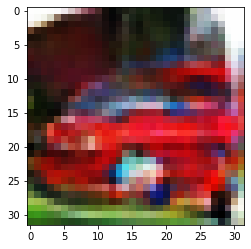

-> Epoch 484, Batch numero 1/78 -> Disc. loss on real images: 0.19955, Disc. loss on fake images: 0.20738, Generator loss: 4.13732
-> Epoch 484, Batch numero 2/78 -> Disc. loss on real images: 0.23760, Disc. loss on fake images: 0.22293, Generator loss: 4.16810
-> Epoch 484, Batch numero 3/78 -> Disc. loss on real images: 0.08403, Disc. loss on fake images: 0.19001, Generator loss: 3.94144
-> Epoch 484, Batch numero 4/78 -> Disc. loss on real images: 0.16249, Disc. loss on fake images: 0.11902, Generator loss: 4.39943
-> Epoch 484, Batch numero 5/78 -> Disc. loss on real images: 0.11231, Disc. loss on fake images: 0.23479, Generator loss: 4.18132
-> Epoch 484, Batch numero 6/78 -> Disc. loss on real images: 0.28079, Disc. loss on fake images: 0.19729, Generator loss: 4.49520
-> Epoch 484, Batch numero 7/78 -> Disc. loss on real images: 0.11993, Disc. loss on fake images: 0.22159, Generator loss: 4.79070
-> Epoch 484, Batch numero 8/78 -> Disc. loss on real images: 0.15817, Disc. loss o

-> Epoch 484, Batch numero 64/78 -> Disc. loss on real images: 0.17741, Disc. loss on fake images: 0.13460, Generator loss: 4.48668
-> Epoch 484, Batch numero 65/78 -> Disc. loss on real images: 0.18927, Disc. loss on fake images: 0.20392, Generator loss: 4.13792
-> Epoch 484, Batch numero 66/78 -> Disc. loss on real images: 0.08634, Disc. loss on fake images: 0.14188, Generator loss: 4.37430
-> Epoch 484, Batch numero 67/78 -> Disc. loss on real images: 0.32414, Disc. loss on fake images: 0.14938, Generator loss: 4.55907
-> Epoch 484, Batch numero 68/78 -> Disc. loss on real images: 0.03221, Disc. loss on fake images: 0.17632, Generator loss: 4.53481
-> Epoch 484, Batch numero 69/78 -> Disc. loss on real images: 0.12790, Disc. loss on fake images: 0.14748, Generator loss: 4.97662
-> Epoch 484, Batch numero 70/78 -> Disc. loss on real images: 0.34684, Disc. loss on fake images: 0.07090, Generator loss: 3.80173
-> Epoch 484, Batch numero 71/78 -> Disc. loss on real images: 0.14658, Disc

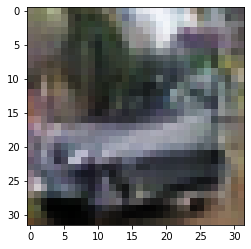

-> Epoch 485, Batch numero 1/78 -> Disc. loss on real images: 0.08064, Disc. loss on fake images: 0.27221, Generator loss: 4.92059
-> Epoch 485, Batch numero 2/78 -> Disc. loss on real images: 0.17585, Disc. loss on fake images: 0.07219, Generator loss: 4.87071
-> Epoch 485, Batch numero 3/78 -> Disc. loss on real images: 0.11109, Disc. loss on fake images: 0.21200, Generator loss: 4.23844
-> Epoch 485, Batch numero 4/78 -> Disc. loss on real images: 0.12546, Disc. loss on fake images: 0.08782, Generator loss: 4.48270
-> Epoch 485, Batch numero 5/78 -> Disc. loss on real images: 0.22658, Disc. loss on fake images: 0.12253, Generator loss: 3.38774
-> Epoch 485, Batch numero 6/78 -> Disc. loss on real images: 0.04528, Disc. loss on fake images: 0.33547, Generator loss: 4.45115
-> Epoch 485, Batch numero 7/78 -> Disc. loss on real images: 0.07111, Disc. loss on fake images: 0.31112, Generator loss: 4.90786
-> Epoch 485, Batch numero 8/78 -> Disc. loss on real images: 0.17502, Disc. loss o

-> Epoch 485, Batch numero 64/78 -> Disc. loss on real images: 0.05374, Disc. loss on fake images: 0.17654, Generator loss: 4.53754
-> Epoch 485, Batch numero 65/78 -> Disc. loss on real images: 0.24447, Disc. loss on fake images: 0.25041, Generator loss: 4.11255
-> Epoch 485, Batch numero 66/78 -> Disc. loss on real images: 0.23424, Disc. loss on fake images: 0.17137, Generator loss: 3.84638
-> Epoch 485, Batch numero 67/78 -> Disc. loss on real images: 0.08641, Disc. loss on fake images: 0.15840, Generator loss: 4.35467
-> Epoch 485, Batch numero 68/78 -> Disc. loss on real images: 0.12497, Disc. loss on fake images: 0.15217, Generator loss: 4.16968
-> Epoch 485, Batch numero 69/78 -> Disc. loss on real images: 0.10060, Disc. loss on fake images: 0.35181, Generator loss: 3.94085
-> Epoch 485, Batch numero 70/78 -> Disc. loss on real images: 0.19692, Disc. loss on fake images: 0.08148, Generator loss: 4.33281
-> Epoch 485, Batch numero 71/78 -> Disc. loss on real images: 0.22640, Disc

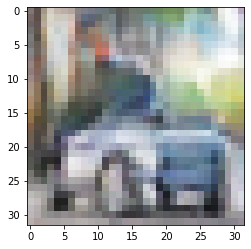

-> Epoch 486, Batch numero 1/78 -> Disc. loss on real images: 0.11553, Disc. loss on fake images: 0.09229, Generator loss: 4.07386
-> Epoch 486, Batch numero 2/78 -> Disc. loss on real images: 0.22545, Disc. loss on fake images: 0.20420, Generator loss: 4.10635
-> Epoch 486, Batch numero 3/78 -> Disc. loss on real images: 0.05210, Disc. loss on fake images: 0.16550, Generator loss: 4.25841
-> Epoch 486, Batch numero 4/78 -> Disc. loss on real images: 0.44877, Disc. loss on fake images: 0.09713, Generator loss: 3.44940
-> Epoch 486, Batch numero 5/78 -> Disc. loss on real images: 0.04785, Disc. loss on fake images: 0.51923, Generator loss: 4.21041
-> Epoch 486, Batch numero 6/78 -> Disc. loss on real images: 0.22349, Disc. loss on fake images: 0.24186, Generator loss: 4.54821
-> Epoch 486, Batch numero 7/78 -> Disc. loss on real images: 0.26533, Disc. loss on fake images: 0.06736, Generator loss: 4.90265
-> Epoch 486, Batch numero 8/78 -> Disc. loss on real images: 0.26605, Disc. loss o

-> Epoch 486, Batch numero 64/78 -> Disc. loss on real images: 0.16371, Disc. loss on fake images: 0.11472, Generator loss: 4.23926
-> Epoch 486, Batch numero 65/78 -> Disc. loss on real images: 0.04266, Disc. loss on fake images: 0.17144, Generator loss: 4.58265
-> Epoch 486, Batch numero 66/78 -> Disc. loss on real images: 0.05848, Disc. loss on fake images: 0.12960, Generator loss: 4.74108
-> Epoch 486, Batch numero 67/78 -> Disc. loss on real images: 0.17127, Disc. loss on fake images: 0.16955, Generator loss: 5.09276
-> Epoch 486, Batch numero 68/78 -> Disc. loss on real images: 0.04904, Disc. loss on fake images: 0.25040, Generator loss: 5.05127
-> Epoch 486, Batch numero 69/78 -> Disc. loss on real images: 0.46028, Disc. loss on fake images: 0.10158, Generator loss: 4.39779
-> Epoch 486, Batch numero 70/78 -> Disc. loss on real images: 0.05375, Disc. loss on fake images: 0.21263, Generator loss: 4.33942
-> Epoch 486, Batch numero 71/78 -> Disc. loss on real images: 0.03541, Disc

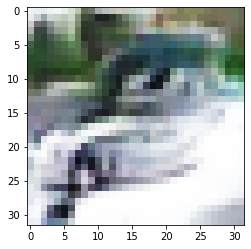

-> Epoch 487, Batch numero 1/78 -> Disc. loss on real images: 0.40687, Disc. loss on fake images: 0.08331, Generator loss: 4.29485
-> Epoch 487, Batch numero 2/78 -> Disc. loss on real images: 0.20409, Disc. loss on fake images: 0.18510, Generator loss: 4.49846
-> Epoch 487, Batch numero 3/78 -> Disc. loss on real images: 0.15567, Disc. loss on fake images: 0.11125, Generator loss: 4.72006
-> Epoch 487, Batch numero 4/78 -> Disc. loss on real images: 0.15071, Disc. loss on fake images: 0.20760, Generator loss: 3.43886
-> Epoch 487, Batch numero 5/78 -> Disc. loss on real images: 0.07494, Disc. loss on fake images: 0.16896, Generator loss: 4.78675
-> Epoch 487, Batch numero 6/78 -> Disc. loss on real images: 0.06753, Disc. loss on fake images: 0.17062, Generator loss: 4.86130
-> Epoch 487, Batch numero 7/78 -> Disc. loss on real images: 0.16949, Disc. loss on fake images: 0.26423, Generator loss: 5.18386
-> Epoch 487, Batch numero 8/78 -> Disc. loss on real images: 0.39616, Disc. loss o

-> Epoch 487, Batch numero 64/78 -> Disc. loss on real images: 0.14839, Disc. loss on fake images: 0.13759, Generator loss: 3.99988
-> Epoch 487, Batch numero 65/78 -> Disc. loss on real images: 0.07614, Disc. loss on fake images: 0.08561, Generator loss: 4.45664
-> Epoch 487, Batch numero 66/78 -> Disc. loss on real images: 0.21574, Disc. loss on fake images: 0.29407, Generator loss: 4.22045
-> Epoch 487, Batch numero 67/78 -> Disc. loss on real images: 0.13701, Disc. loss on fake images: 0.21900, Generator loss: 5.50656
-> Epoch 487, Batch numero 68/78 -> Disc. loss on real images: 0.13744, Disc. loss on fake images: 0.02770, Generator loss: 4.65390
-> Epoch 487, Batch numero 69/78 -> Disc. loss on real images: 0.10107, Disc. loss on fake images: 0.10251, Generator loss: 4.27572
-> Epoch 487, Batch numero 70/78 -> Disc. loss on real images: 0.25598, Disc. loss on fake images: 0.11407, Generator loss: 4.04831
-> Epoch 487, Batch numero 71/78 -> Disc. loss on real images: 0.12142, Disc

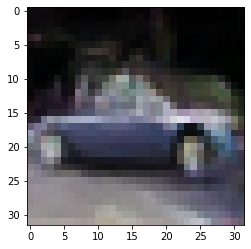

-> Epoch 488, Batch numero 1/78 -> Disc. loss on real images: 0.08957, Disc. loss on fake images: 0.16338, Generator loss: 3.89629
-> Epoch 488, Batch numero 2/78 -> Disc. loss on real images: 0.10420, Disc. loss on fake images: 0.25798, Generator loss: 5.00526
-> Epoch 488, Batch numero 3/78 -> Disc. loss on real images: 0.28441, Disc. loss on fake images: 0.19549, Generator loss: 4.33900
-> Epoch 488, Batch numero 4/78 -> Disc. loss on real images: 0.18114, Disc. loss on fake images: 0.07880, Generator loss: 4.07374
-> Epoch 488, Batch numero 5/78 -> Disc. loss on real images: 0.08758, Disc. loss on fake images: 0.28752, Generator loss: 4.18175
-> Epoch 488, Batch numero 6/78 -> Disc. loss on real images: 0.09322, Disc. loss on fake images: 0.31305, Generator loss: 4.55468
-> Epoch 488, Batch numero 7/78 -> Disc. loss on real images: 0.14947, Disc. loss on fake images: 0.09639, Generator loss: 5.20508
-> Epoch 488, Batch numero 8/78 -> Disc. loss on real images: 0.18647, Disc. loss o

-> Epoch 488, Batch numero 64/78 -> Disc. loss on real images: 0.21051, Disc. loss on fake images: 0.26467, Generator loss: 4.35234
-> Epoch 488, Batch numero 65/78 -> Disc. loss on real images: 0.14390, Disc. loss on fake images: 0.09758, Generator loss: 4.41426
-> Epoch 488, Batch numero 66/78 -> Disc. loss on real images: 0.09713, Disc. loss on fake images: 0.08078, Generator loss: 4.52123
-> Epoch 488, Batch numero 67/78 -> Disc. loss on real images: 0.17654, Disc. loss on fake images: 0.24132, Generator loss: 4.44845
-> Epoch 488, Batch numero 68/78 -> Disc. loss on real images: 0.11138, Disc. loss on fake images: 0.08762, Generator loss: 4.25220
-> Epoch 488, Batch numero 69/78 -> Disc. loss on real images: 0.12305, Disc. loss on fake images: 0.09794, Generator loss: 4.79203
-> Epoch 488, Batch numero 70/78 -> Disc. loss on real images: 0.12328, Disc. loss on fake images: 0.05047, Generator loss: 3.85573
-> Epoch 488, Batch numero 71/78 -> Disc. loss on real images: 0.03372, Disc

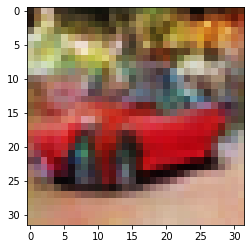

-> Epoch 489, Batch numero 1/78 -> Disc. loss on real images: 0.13997, Disc. loss on fake images: 0.09088, Generator loss: 4.48983
-> Epoch 489, Batch numero 2/78 -> Disc. loss on real images: 0.11810, Disc. loss on fake images: 0.39323, Generator loss: 4.39867
-> Epoch 489, Batch numero 3/78 -> Disc. loss on real images: 0.06275, Disc. loss on fake images: 0.16813, Generator loss: 4.82073
-> Epoch 489, Batch numero 4/78 -> Disc. loss on real images: 0.13622, Disc. loss on fake images: 0.43695, Generator loss: 5.24137
-> Epoch 489, Batch numero 5/78 -> Disc. loss on real images: 0.13658, Disc. loss on fake images: 0.14393, Generator loss: 5.43367
-> Epoch 489, Batch numero 6/78 -> Disc. loss on real images: 0.26425, Disc. loss on fake images: 0.07224, Generator loss: 4.75989
-> Epoch 489, Batch numero 7/78 -> Disc. loss on real images: 0.22082, Disc. loss on fake images: 0.05655, Generator loss: 4.67937
-> Epoch 489, Batch numero 8/78 -> Disc. loss on real images: 0.07869, Disc. loss o

-> Epoch 489, Batch numero 64/78 -> Disc. loss on real images: 0.07138, Disc. loss on fake images: 0.25025, Generator loss: 4.15525
-> Epoch 489, Batch numero 65/78 -> Disc. loss on real images: 0.30135, Disc. loss on fake images: 0.08513, Generator loss: 3.69150
-> Epoch 489, Batch numero 66/78 -> Disc. loss on real images: 0.08940, Disc. loss on fake images: 0.21592, Generator loss: 3.90655
-> Epoch 489, Batch numero 67/78 -> Disc. loss on real images: 0.14558, Disc. loss on fake images: 0.18669, Generator loss: 3.81317
-> Epoch 489, Batch numero 68/78 -> Disc. loss on real images: 0.06828, Disc. loss on fake images: 0.24907, Generator loss: 4.10616
-> Epoch 489, Batch numero 69/78 -> Disc. loss on real images: 0.29656, Disc. loss on fake images: 0.21837, Generator loss: 4.10032
-> Epoch 489, Batch numero 70/78 -> Disc. loss on real images: 0.19795, Disc. loss on fake images: 0.18531, Generator loss: 4.11164
-> Epoch 489, Batch numero 71/78 -> Disc. loss on real images: 0.07809, Disc

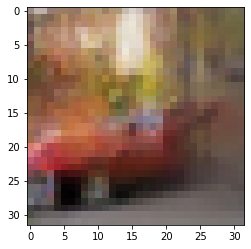

-> Epoch 490, Batch numero 1/78 -> Disc. loss on real images: 0.13610, Disc. loss on fake images: 0.03147, Generator loss: 4.40527
-> Epoch 490, Batch numero 2/78 -> Disc. loss on real images: 0.11405, Disc. loss on fake images: 0.15881, Generator loss: 4.33072
-> Epoch 490, Batch numero 3/78 -> Disc. loss on real images: 0.30208, Disc. loss on fake images: 0.12655, Generator loss: 3.98587
-> Epoch 490, Batch numero 4/78 -> Disc. loss on real images: 0.21380, Disc. loss on fake images: 0.12724, Generator loss: 3.77799
-> Epoch 490, Batch numero 5/78 -> Disc. loss on real images: 0.08118, Disc. loss on fake images: 0.15148, Generator loss: 3.67484
-> Epoch 490, Batch numero 6/78 -> Disc. loss on real images: 0.06900, Disc. loss on fake images: 0.23408, Generator loss: 4.13810
-> Epoch 490, Batch numero 7/78 -> Disc. loss on real images: 0.18146, Disc. loss on fake images: 0.21562, Generator loss: 4.29497
-> Epoch 490, Batch numero 8/78 -> Disc. loss on real images: 0.10822, Disc. loss o

-> Epoch 490, Batch numero 64/78 -> Disc. loss on real images: 0.04201, Disc. loss on fake images: 0.13389, Generator loss: 4.10309
-> Epoch 490, Batch numero 65/78 -> Disc. loss on real images: 0.19853, Disc. loss on fake images: 0.23681, Generator loss: 4.55166
-> Epoch 490, Batch numero 66/78 -> Disc. loss on real images: 0.12289, Disc. loss on fake images: 0.17517, Generator loss: 4.87482
-> Epoch 490, Batch numero 67/78 -> Disc. loss on real images: 0.27043, Disc. loss on fake images: 0.16785, Generator loss: 4.31033
-> Epoch 490, Batch numero 68/78 -> Disc. loss on real images: 0.28233, Disc. loss on fake images: 0.45162, Generator loss: 4.89505
-> Epoch 490, Batch numero 69/78 -> Disc. loss on real images: 0.27606, Disc. loss on fake images: 0.15783, Generator loss: 4.15764
-> Epoch 490, Batch numero 70/78 -> Disc. loss on real images: 0.06691, Disc. loss on fake images: 0.07667, Generator loss: 4.05287
-> Epoch 490, Batch numero 71/78 -> Disc. loss on real images: 0.16455, Disc

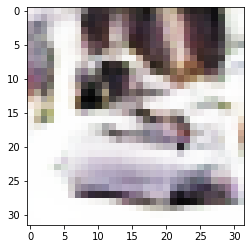

-> Epoch 491, Batch numero 1/78 -> Disc. loss on real images: 0.07752, Disc. loss on fake images: 0.17322, Generator loss: 4.74248
-> Epoch 491, Batch numero 2/78 -> Disc. loss on real images: 0.10505, Disc. loss on fake images: 0.22335, Generator loss: 5.15261
-> Epoch 491, Batch numero 3/78 -> Disc. loss on real images: 0.32519, Disc. loss on fake images: 0.18855, Generator loss: 4.48722
-> Epoch 491, Batch numero 4/78 -> Disc. loss on real images: 0.15849, Disc. loss on fake images: 0.16892, Generator loss: 4.13879
-> Epoch 491, Batch numero 5/78 -> Disc. loss on real images: 0.05818, Disc. loss on fake images: 0.26616, Generator loss: 5.81884
-> Epoch 491, Batch numero 6/78 -> Disc. loss on real images: 0.08450, Disc. loss on fake images: 0.23336, Generator loss: 5.45074
-> Epoch 491, Batch numero 7/78 -> Disc. loss on real images: 0.35352, Disc. loss on fake images: 0.04734, Generator loss: 4.24887
-> Epoch 491, Batch numero 8/78 -> Disc. loss on real images: 0.11967, Disc. loss o

-> Epoch 491, Batch numero 64/78 -> Disc. loss on real images: 0.07594, Disc. loss on fake images: 0.14122, Generator loss: 5.19246
-> Epoch 491, Batch numero 65/78 -> Disc. loss on real images: 0.25381, Disc. loss on fake images: 0.26074, Generator loss: 5.06667
-> Epoch 491, Batch numero 66/78 -> Disc. loss on real images: 0.25579, Disc. loss on fake images: 0.04845, Generator loss: 4.72873
-> Epoch 491, Batch numero 67/78 -> Disc. loss on real images: 0.13310, Disc. loss on fake images: 0.13181, Generator loss: 4.27009
-> Epoch 491, Batch numero 68/78 -> Disc. loss on real images: 0.17501, Disc. loss on fake images: 0.31203, Generator loss: 4.58774
-> Epoch 491, Batch numero 69/78 -> Disc. loss on real images: 0.29046, Disc. loss on fake images: 0.06819, Generator loss: 3.88121
-> Epoch 491, Batch numero 70/78 -> Disc. loss on real images: 0.13565, Disc. loss on fake images: 0.11063, Generator loss: 4.17327
-> Epoch 491, Batch numero 71/78 -> Disc. loss on real images: 0.18104, Disc

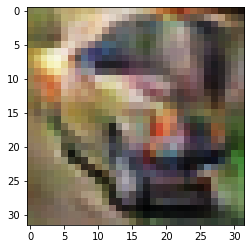

-> Epoch 492, Batch numero 1/78 -> Disc. loss on real images: 0.09682, Disc. loss on fake images: 0.34541, Generator loss: 4.42195
-> Epoch 492, Batch numero 2/78 -> Disc. loss on real images: 0.29862, Disc. loss on fake images: 0.18532, Generator loss: 4.27689
-> Epoch 492, Batch numero 3/78 -> Disc. loss on real images: 0.12645, Disc. loss on fake images: 0.32227, Generator loss: 4.65016
-> Epoch 492, Batch numero 4/78 -> Disc. loss on real images: 0.27763, Disc. loss on fake images: 0.06888, Generator loss: 4.33950
-> Epoch 492, Batch numero 5/78 -> Disc. loss on real images: 0.12434, Disc. loss on fake images: 0.16896, Generator loss: 4.65588
-> Epoch 492, Batch numero 6/78 -> Disc. loss on real images: 0.10115, Disc. loss on fake images: 0.12041, Generator loss: 4.42415
-> Epoch 492, Batch numero 7/78 -> Disc. loss on real images: 0.15948, Disc. loss on fake images: 0.10587, Generator loss: 3.90110
-> Epoch 492, Batch numero 8/78 -> Disc. loss on real images: 0.18302, Disc. loss o

-> Epoch 492, Batch numero 64/78 -> Disc. loss on real images: 0.22627, Disc. loss on fake images: 0.22214, Generator loss: 4.98823
-> Epoch 492, Batch numero 65/78 -> Disc. loss on real images: 0.09720, Disc. loss on fake images: 0.07196, Generator loss: 4.30201
-> Epoch 492, Batch numero 66/78 -> Disc. loss on real images: 0.50574, Disc. loss on fake images: 0.17074, Generator loss: 3.89861
-> Epoch 492, Batch numero 67/78 -> Disc. loss on real images: 0.05932, Disc. loss on fake images: 0.13762, Generator loss: 3.74583
-> Epoch 492, Batch numero 68/78 -> Disc. loss on real images: 0.22477, Disc. loss on fake images: 0.21736, Generator loss: 3.85385
-> Epoch 492, Batch numero 69/78 -> Disc. loss on real images: 0.05373, Disc. loss on fake images: 0.11569, Generator loss: 4.10201
-> Epoch 492, Batch numero 70/78 -> Disc. loss on real images: 0.20932, Disc. loss on fake images: 0.15978, Generator loss: 4.39024
-> Epoch 492, Batch numero 71/78 -> Disc. loss on real images: 0.04283, Disc

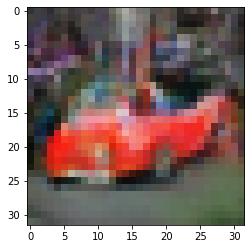

-> Epoch 493, Batch numero 1/78 -> Disc. loss on real images: 0.26063, Disc. loss on fake images: 0.15985, Generator loss: 3.91914
-> Epoch 493, Batch numero 2/78 -> Disc. loss on real images: 0.13949, Disc. loss on fake images: 0.25401, Generator loss: 4.22034
-> Epoch 493, Batch numero 3/78 -> Disc. loss on real images: 0.12267, Disc. loss on fake images: 0.22415, Generator loss: 4.43603
-> Epoch 493, Batch numero 4/78 -> Disc. loss on real images: 0.15755, Disc. loss on fake images: 0.12823, Generator loss: 4.55452
-> Epoch 493, Batch numero 5/78 -> Disc. loss on real images: 0.21346, Disc. loss on fake images: 0.32236, Generator loss: 4.48058
-> Epoch 493, Batch numero 6/78 -> Disc. loss on real images: 0.16056, Disc. loss on fake images: 0.15951, Generator loss: 4.90635
-> Epoch 493, Batch numero 7/78 -> Disc. loss on real images: 0.12364, Disc. loss on fake images: 0.10100, Generator loss: 5.12139
-> Epoch 493, Batch numero 8/78 -> Disc. loss on real images: 0.28798, Disc. loss o

-> Epoch 493, Batch numero 64/78 -> Disc. loss on real images: 0.30931, Disc. loss on fake images: 0.33765, Generator loss: 4.65412
-> Epoch 493, Batch numero 65/78 -> Disc. loss on real images: 0.08116, Disc. loss on fake images: 0.34225, Generator loss: 5.03905
-> Epoch 493, Batch numero 66/78 -> Disc. loss on real images: 0.24226, Disc. loss on fake images: 0.20862, Generator loss: 4.85045
-> Epoch 493, Batch numero 67/78 -> Disc. loss on real images: 0.16907, Disc. loss on fake images: 0.09878, Generator loss: 4.50955
-> Epoch 493, Batch numero 68/78 -> Disc. loss on real images: 0.15220, Disc. loss on fake images: 0.19418, Generator loss: 4.32684
-> Epoch 493, Batch numero 69/78 -> Disc. loss on real images: 0.05090, Disc. loss on fake images: 0.23717, Generator loss: 4.79003
-> Epoch 493, Batch numero 70/78 -> Disc. loss on real images: 0.10488, Disc. loss on fake images: 0.03247, Generator loss: 5.14022
-> Epoch 493, Batch numero 71/78 -> Disc. loss on real images: 0.18128, Disc

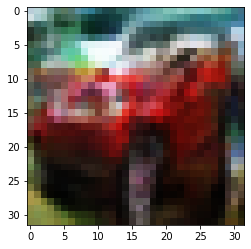

-> Epoch 494, Batch numero 1/78 -> Disc. loss on real images: 0.15920, Disc. loss on fake images: 0.06276, Generator loss: 4.63335
-> Epoch 494, Batch numero 2/78 -> Disc. loss on real images: 0.27211, Disc. loss on fake images: 0.20203, Generator loss: 3.83795
-> Epoch 494, Batch numero 3/78 -> Disc. loss on real images: 0.09878, Disc. loss on fake images: 0.13879, Generator loss: 4.07258
-> Epoch 494, Batch numero 4/78 -> Disc. loss on real images: 0.08266, Disc. loss on fake images: 0.16318, Generator loss: 4.57983
-> Epoch 494, Batch numero 5/78 -> Disc. loss on real images: 0.25860, Disc. loss on fake images: 0.15938, Generator loss: 4.89675
-> Epoch 494, Batch numero 6/78 -> Disc. loss on real images: 0.21296, Disc. loss on fake images: 0.16262, Generator loss: 3.63779
-> Epoch 494, Batch numero 7/78 -> Disc. loss on real images: 0.11103, Disc. loss on fake images: 0.40819, Generator loss: 4.72389
-> Epoch 494, Batch numero 8/78 -> Disc. loss on real images: 0.10111, Disc. loss o

-> Epoch 494, Batch numero 64/78 -> Disc. loss on real images: 0.23428, Disc. loss on fake images: 0.08590, Generator loss: 4.49565
-> Epoch 494, Batch numero 65/78 -> Disc. loss on real images: 0.06619, Disc. loss on fake images: 0.12095, Generator loss: 3.92828
-> Epoch 494, Batch numero 66/78 -> Disc. loss on real images: 0.08054, Disc. loss on fake images: 0.07918, Generator loss: 4.28071
-> Epoch 494, Batch numero 67/78 -> Disc. loss on real images: 0.09637, Disc. loss on fake images: 0.28118, Generator loss: 4.42655
-> Epoch 494, Batch numero 68/78 -> Disc. loss on real images: 0.23691, Disc. loss on fake images: 0.20708, Generator loss: 4.67262
-> Epoch 494, Batch numero 69/78 -> Disc. loss on real images: 0.30104, Disc. loss on fake images: 0.19119, Generator loss: 3.88201
-> Epoch 494, Batch numero 70/78 -> Disc. loss on real images: 0.17650, Disc. loss on fake images: 0.37787, Generator loss: 4.78141
-> Epoch 494, Batch numero 71/78 -> Disc. loss on real images: 0.11079, Disc

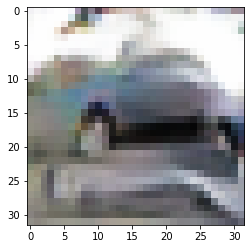

-> Epoch 495, Batch numero 1/78 -> Disc. loss on real images: 0.11718, Disc. loss on fake images: 0.10191, Generator loss: 4.57747
-> Epoch 495, Batch numero 2/78 -> Disc. loss on real images: 0.18658, Disc. loss on fake images: 0.17617, Generator loss: 4.38168
-> Epoch 495, Batch numero 3/78 -> Disc. loss on real images: 0.13156, Disc. loss on fake images: 0.18421, Generator loss: 4.19350
-> Epoch 495, Batch numero 4/78 -> Disc. loss on real images: 0.20689, Disc. loss on fake images: 0.15002, Generator loss: 4.33207
-> Epoch 495, Batch numero 5/78 -> Disc. loss on real images: 0.21270, Disc. loss on fake images: 0.24230, Generator loss: 4.05144
-> Epoch 495, Batch numero 6/78 -> Disc. loss on real images: 0.12161, Disc. loss on fake images: 0.16059, Generator loss: 4.48446
-> Epoch 495, Batch numero 7/78 -> Disc. loss on real images: 0.14426, Disc. loss on fake images: 0.19981, Generator loss: 4.39264
-> Epoch 495, Batch numero 8/78 -> Disc. loss on real images: 0.09321, Disc. loss o

-> Epoch 495, Batch numero 64/78 -> Disc. loss on real images: 0.20048, Disc. loss on fake images: 0.34694, Generator loss: 4.55647
-> Epoch 495, Batch numero 65/78 -> Disc. loss on real images: 0.18919, Disc. loss on fake images: 0.34471, Generator loss: 4.83744
-> Epoch 495, Batch numero 66/78 -> Disc. loss on real images: 0.17538, Disc. loss on fake images: 0.16566, Generator loss: 4.88945
-> Epoch 495, Batch numero 67/78 -> Disc. loss on real images: 0.15419, Disc. loss on fake images: 0.09738, Generator loss: 4.92058
-> Epoch 495, Batch numero 68/78 -> Disc. loss on real images: 0.14567, Disc. loss on fake images: 0.20464, Generator loss: 4.60909
-> Epoch 495, Batch numero 69/78 -> Disc. loss on real images: 0.11639, Disc. loss on fake images: 0.07584, Generator loss: 5.37876
-> Epoch 495, Batch numero 70/78 -> Disc. loss on real images: 0.11452, Disc. loss on fake images: 0.06086, Generator loss: 5.18144
-> Epoch 495, Batch numero 71/78 -> Disc. loss on real images: 0.29720, Disc

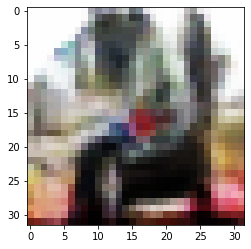

-> Epoch 496, Batch numero 1/78 -> Disc. loss on real images: 0.25995, Disc. loss on fake images: 0.16185, Generator loss: 4.83133
-> Epoch 496, Batch numero 2/78 -> Disc. loss on real images: 0.03684, Disc. loss on fake images: 0.17554, Generator loss: 4.81015
-> Epoch 496, Batch numero 3/78 -> Disc. loss on real images: 0.30009, Disc. loss on fake images: 0.09396, Generator loss: 4.52429
-> Epoch 496, Batch numero 4/78 -> Disc. loss on real images: 0.40800, Disc. loss on fake images: 0.25189, Generator loss: 3.84409
-> Epoch 496, Batch numero 5/78 -> Disc. loss on real images: 0.11893, Disc. loss on fake images: 0.13268, Generator loss: 5.06777
-> Epoch 496, Batch numero 6/78 -> Disc. loss on real images: 0.16527, Disc. loss on fake images: 0.43743, Generator loss: 5.01042
-> Epoch 496, Batch numero 7/78 -> Disc. loss on real images: 0.10251, Disc. loss on fake images: 0.09609, Generator loss: 5.52201
-> Epoch 496, Batch numero 8/78 -> Disc. loss on real images: 0.16278, Disc. loss o

-> Epoch 496, Batch numero 65/78 -> Disc. loss on real images: 0.11733, Disc. loss on fake images: 0.10595, Generator loss: 4.57414
-> Epoch 496, Batch numero 66/78 -> Disc. loss on real images: 0.20872, Disc. loss on fake images: 0.22451, Generator loss: 4.23051
-> Epoch 496, Batch numero 67/78 -> Disc. loss on real images: 0.06418, Disc. loss on fake images: 0.29653, Generator loss: 5.25187
-> Epoch 496, Batch numero 68/78 -> Disc. loss on real images: 0.36736, Disc. loss on fake images: 0.25306, Generator loss: 4.74987
-> Epoch 496, Batch numero 69/78 -> Disc. loss on real images: 0.06012, Disc. loss on fake images: 0.15077, Generator loss: 4.47077
-> Epoch 496, Batch numero 70/78 -> Disc. loss on real images: 0.24749, Disc. loss on fake images: 0.11679, Generator loss: 4.00757
-> Epoch 496, Batch numero 71/78 -> Disc. loss on real images: 0.17147, Disc. loss on fake images: 0.11590, Generator loss: 4.30868
-> Epoch 496, Batch numero 72/78 -> Disc. loss on real images: 0.07526, Disc

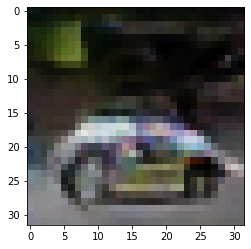

-> Epoch 497, Batch numero 1/78 -> Disc. loss on real images: 0.17274, Disc. loss on fake images: 0.05770, Generator loss: 4.15002
-> Epoch 497, Batch numero 2/78 -> Disc. loss on real images: 0.12870, Disc. loss on fake images: 0.21199, Generator loss: 4.39204
-> Epoch 497, Batch numero 3/78 -> Disc. loss on real images: 0.14398, Disc. loss on fake images: 0.44201, Generator loss: 4.50033
-> Epoch 497, Batch numero 4/78 -> Disc. loss on real images: 0.23210, Disc. loss on fake images: 0.05694, Generator loss: 4.45734
-> Epoch 497, Batch numero 5/78 -> Disc. loss on real images: 0.15610, Disc. loss on fake images: 0.16652, Generator loss: 4.71618
-> Epoch 497, Batch numero 6/78 -> Disc. loss on real images: 0.11163, Disc. loss on fake images: 0.08424, Generator loss: 4.68555
-> Epoch 497, Batch numero 7/78 -> Disc. loss on real images: 0.18365, Disc. loss on fake images: 0.12659, Generator loss: 3.49764
-> Epoch 497, Batch numero 8/78 -> Disc. loss on real images: 0.15396, Disc. loss o

-> Epoch 497, Batch numero 64/78 -> Disc. loss on real images: 0.25085, Disc. loss on fake images: 0.25002, Generator loss: 4.06306
-> Epoch 497, Batch numero 65/78 -> Disc. loss on real images: 0.19177, Disc. loss on fake images: 0.14297, Generator loss: 4.22399
-> Epoch 497, Batch numero 66/78 -> Disc. loss on real images: 0.06153, Disc. loss on fake images: 0.11688, Generator loss: 4.39062
-> Epoch 497, Batch numero 67/78 -> Disc. loss on real images: 0.12112, Disc. loss on fake images: 0.20458, Generator loss: 5.03761
-> Epoch 497, Batch numero 68/78 -> Disc. loss on real images: 0.18823, Disc. loss on fake images: 0.14395, Generator loss: 4.56144
-> Epoch 497, Batch numero 69/78 -> Disc. loss on real images: 0.25797, Disc. loss on fake images: 0.12759, Generator loss: 4.62266
-> Epoch 497, Batch numero 70/78 -> Disc. loss on real images: 0.17628, Disc. loss on fake images: 0.37007, Generator loss: 4.49087
-> Epoch 497, Batch numero 71/78 -> Disc. loss on real images: 0.11357, Disc

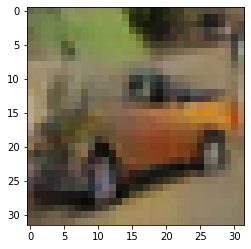

-> Epoch 498, Batch numero 1/78 -> Disc. loss on real images: 0.04735, Disc. loss on fake images: 0.09269, Generator loss: 4.67119
-> Epoch 498, Batch numero 2/78 -> Disc. loss on real images: 0.17137, Disc. loss on fake images: 0.31322, Generator loss: 4.29247
-> Epoch 498, Batch numero 3/78 -> Disc. loss on real images: 0.17865, Disc. loss on fake images: 0.22626, Generator loss: 4.35552
-> Epoch 498, Batch numero 4/78 -> Disc. loss on real images: 0.17823, Disc. loss on fake images: 0.09700, Generator loss: 4.45562
-> Epoch 498, Batch numero 5/78 -> Disc. loss on real images: 0.31132, Disc. loss on fake images: 0.10246, Generator loss: 3.75307
-> Epoch 498, Batch numero 6/78 -> Disc. loss on real images: 0.12769, Disc. loss on fake images: 0.28965, Generator loss: 4.38887
-> Epoch 498, Batch numero 7/78 -> Disc. loss on real images: 0.14446, Disc. loss on fake images: 0.15075, Generator loss: 3.51819
-> Epoch 498, Batch numero 8/78 -> Disc. loss on real images: 0.09961, Disc. loss o

-> Epoch 498, Batch numero 64/78 -> Disc. loss on real images: 0.30442, Disc. loss on fake images: 0.10691, Generator loss: 4.48387
-> Epoch 498, Batch numero 65/78 -> Disc. loss on real images: 0.28197, Disc. loss on fake images: 0.05537, Generator loss: 3.74575
-> Epoch 498, Batch numero 66/78 -> Disc. loss on real images: 0.12608, Disc. loss on fake images: 0.22068, Generator loss: 3.77844
-> Epoch 498, Batch numero 67/78 -> Disc. loss on real images: 0.04836, Disc. loss on fake images: 0.23095, Generator loss: 5.00386
-> Epoch 498, Batch numero 68/78 -> Disc. loss on real images: 0.13377, Disc. loss on fake images: 0.14126, Generator loss: 4.75429
-> Epoch 498, Batch numero 69/78 -> Disc. loss on real images: 0.34660, Disc. loss on fake images: 0.18098, Generator loss: 3.40209
-> Epoch 498, Batch numero 70/78 -> Disc. loss on real images: 0.08842, Disc. loss on fake images: 0.21335, Generator loss: 3.97078
-> Epoch 498, Batch numero 71/78 -> Disc. loss on real images: 0.24239, Disc

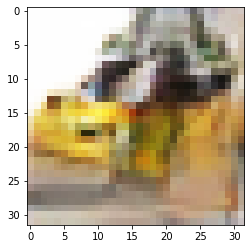

-> Epoch 499, Batch numero 1/78 -> Disc. loss on real images: 0.15011, Disc. loss on fake images: 0.11215, Generator loss: 4.76845
-> Epoch 499, Batch numero 2/78 -> Disc. loss on real images: 0.21821, Disc. loss on fake images: 0.10500, Generator loss: 4.08101
-> Epoch 499, Batch numero 3/78 -> Disc. loss on real images: 0.18845, Disc. loss on fake images: 0.21369, Generator loss: 4.24094
-> Epoch 499, Batch numero 4/78 -> Disc. loss on real images: 0.13797, Disc. loss on fake images: 0.16238, Generator loss: 4.38859
-> Epoch 499, Batch numero 5/78 -> Disc. loss on real images: 0.24790, Disc. loss on fake images: 0.49732, Generator loss: 4.52124
-> Epoch 499, Batch numero 6/78 -> Disc. loss on real images: 0.12157, Disc. loss on fake images: 0.08597, Generator loss: 4.74722
-> Epoch 499, Batch numero 7/78 -> Disc. loss on real images: 0.37592, Disc. loss on fake images: 0.05335, Generator loss: 4.13607
-> Epoch 499, Batch numero 8/78 -> Disc. loss on real images: 0.11538, Disc. loss o

-> Epoch 499, Batch numero 65/78 -> Disc. loss on real images: 0.12103, Disc. loss on fake images: 0.12390, Generator loss: 4.64261
-> Epoch 499, Batch numero 66/78 -> Disc. loss on real images: 0.21092, Disc. loss on fake images: 0.20595, Generator loss: 4.12960
-> Epoch 499, Batch numero 67/78 -> Disc. loss on real images: 0.09408, Disc. loss on fake images: 0.22345, Generator loss: 4.82478
-> Epoch 499, Batch numero 68/78 -> Disc. loss on real images: 0.18995, Disc. loss on fake images: 0.07560, Generator loss: 4.20993
-> Epoch 499, Batch numero 69/78 -> Disc. loss on real images: 0.26555, Disc. loss on fake images: 0.19949, Generator loss: 3.94020
-> Epoch 499, Batch numero 70/78 -> Disc. loss on real images: 0.06764, Disc. loss on fake images: 0.10763, Generator loss: 3.63826
-> Epoch 499, Batch numero 71/78 -> Disc. loss on real images: 0.06580, Disc. loss on fake images: 0.39008, Generator loss: 4.06880
-> Epoch 499, Batch numero 72/78 -> Disc. loss on real images: 0.26340, Disc

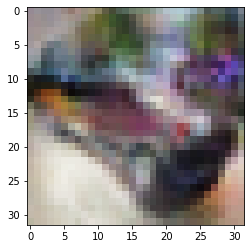

-> Epoch 500, Batch numero 1/78 -> Disc. loss on real images: 0.17472, Disc. loss on fake images: 0.10741, Generator loss: 4.07195
-> Epoch 500, Batch numero 2/78 -> Disc. loss on real images: 0.18484, Disc. loss on fake images: 0.16907, Generator loss: 3.81129
-> Epoch 500, Batch numero 3/78 -> Disc. loss on real images: 0.12388, Disc. loss on fake images: 0.27426, Generator loss: 4.22158
-> Epoch 500, Batch numero 4/78 -> Disc. loss on real images: 0.26121, Disc. loss on fake images: 0.24926, Generator loss: 4.11171
-> Epoch 500, Batch numero 5/78 -> Disc. loss on real images: 0.10053, Disc. loss on fake images: 0.24201, Generator loss: 4.94780
-> Epoch 500, Batch numero 6/78 -> Disc. loss on real images: 0.20653, Disc. loss on fake images: 0.12116, Generator loss: 4.89742
-> Epoch 500, Batch numero 7/78 -> Disc. loss on real images: 0.22889, Disc. loss on fake images: 0.12981, Generator loss: 3.94730
-> Epoch 500, Batch numero 8/78 -> Disc. loss on real images: 0.07517, Disc. loss o

-> Epoch 500, Batch numero 64/78 -> Disc. loss on real images: 0.13185, Disc. loss on fake images: 0.12030, Generator loss: 4.02741
-> Epoch 500, Batch numero 65/78 -> Disc. loss on real images: 0.11571, Disc. loss on fake images: 0.18453, Generator loss: 4.20455
-> Epoch 500, Batch numero 66/78 -> Disc. loss on real images: 0.08565, Disc. loss on fake images: 0.49297, Generator loss: 4.60546
-> Epoch 500, Batch numero 67/78 -> Disc. loss on real images: 0.18782, Disc. loss on fake images: 0.30344, Generator loss: 5.59903
-> Epoch 500, Batch numero 68/78 -> Disc. loss on real images: 0.29304, Disc. loss on fake images: 0.04964, Generator loss: 4.90214
-> Epoch 500, Batch numero 69/78 -> Disc. loss on real images: 0.08480, Disc. loss on fake images: 0.10412, Generator loss: 4.57016
-> Epoch 500, Batch numero 70/78 -> Disc. loss on real images: 0.11671, Disc. loss on fake images: 0.19275, Generator loss: 4.59927
-> Epoch 500, Batch numero 71/78 -> Disc. loss on real images: 0.18422, Disc

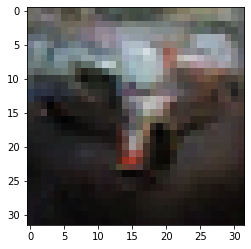

In [20]:
# Carregando os dados de imagens reais
#dataset = load_real_samples(train_batch)
dataset = load_real_samples()


# Treinando os modelos compilados
train(generator_model, discriminator_model, gan_model, dataset, latent_dim)


# Salvando o modelo treinado
generator_model.save('generator_model_cifar10_cars.h5')

# Parte 4: Usando o modelo gerador para gerar as imagens
Vamos visualizar as imagens do modelo treinado.

In [21]:
# Plotando as imagens geradas
def create_plot(examples, n):
    # plot images
    for i in range(n * n):
        # Definindo os subplots
        plt.subplot(n, n, 1 + i)
        
        # Removendo os eixos
        plt.axis('off')
        
        # Adicionando os graficos ao plot
        plt.imshow(examples[i, :, :])
        
    # Mostrando o plot final
    plt.show()

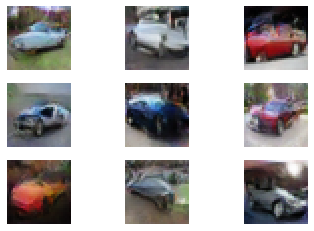

In [22]:
# Carregando o modelo, se necessário
model = load_model('generator_model_cifar10_cars.h5')

# Gerando os pontos latentes
latent_points = generate_latent_points(100, 100)

# Gerando as imagens
imgs = model.predict(latent_points)

# Trazendo os valores de volta para a escala (0, 1), pois eles estão em [-1, 1]
imgs = (imgs + 1) / 2.0

# Plotando 9 imagens (3 linhas x 3 colunas)
create_plot(imgs, 3)

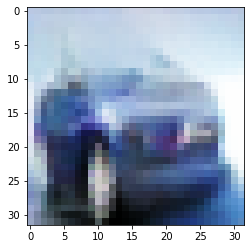

In [23]:
# Plotando uma imagem única gerada pelo modelo.
# O exemplo abaixo gera uma única imagem usando um vetor com todos os valores em 0.75

# Criando o vetor de pontos aleatórios no espaço latente
vector = generate_latent_points(100, 100)

# Gerando a imagem baseada nesses pontos
generated_img = model.predict(vector)

# Trazendo os valores da img. gerada volta para a escala (0, 1), pois eles estão em [-1, 1]
generated_img = (generated_img + 1) / 2.0

# Plotando a imagem
plt.imshow(generated_img[0, :, :])
plt.show()